In [1]:
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf
import cupy as cp
import matplotlib.pyplot as plt

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top6'
        self.traj_done = False
        #self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
	#self.__name = sys.argv[1]
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        #self.__model_path = '/home/lab606a/Documents/20200415/not_fixed/saved model/500_data/prediction_not_fixed_'+ self.__direction
        #self.__model_path = '/home/lab606a/catkin_ws/src/pointcloud/models/not_fixed/prediction_all_not_fixed'
        self.__model_path = '/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_all_kind_data'
        #self.__model_path = '/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_top5'
        self.__prediction_model = load_model(self.__model_path)
        
    def append_pred(self): ## Exhaustive
        self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
        for i in range(1, self.__pred.shape[0]):
            self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
        #self.pub_prediction()

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= self.__hitting_point): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (self.__hitting_point < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= self.__hitting_point):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (self.__hitting_point < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        #print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        #print("paddinggg")
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            #if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            #print("shape of tmp = \n", self.__tmp.shape)
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                #if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def predict_traj(self):
        self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))

        ## plot hitting timing
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            '''
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            '''
            if (self.__tmp.shape[1] >= 27):
                self.predict_traj()
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                #print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                    #self.plot_error()
                    #self.plot_res()
                    #self.save_data()
                self.__num += 1

            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False

In [3]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

In [4]:
obj = Listener()

In [5]:
name = 'top5'

In [6]:
dataset_path = './datasets/split by random for distributed/prediction/' + name + '_test.csv'
print(dataset_path)
dataset = pd.read_csv(dataset_path, header=None)
dataset = dataset.fillna(0)
dataset = np.array(dataset)

./datasets/split by random for distributed/prediction/top5_test.csv


In [7]:
#obj = Listener()
arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

n = 21

arr_for_err_t1 = np.zeros((1,n))
arr_for_err_x1 = np.zeros((1,n))
arr_for_err_z1 = np.zeros((1,n))


for i in range(0,250):
    trajectory = dataset[i,:] ## read trajectory
    trajectory = trajectory.reshape(1,trajectory.shape[0]) ## reshape for padding easily
    ## padding trajectory
    trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],) ## reshape for read as vision system easily
    
    for j in range(0, trajectory.shape[0], 3): ## read ball coordinate as vision system
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    obj.traj_done = True ## reset
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point() ## get vision array
    pred_arr = obj.return_pred_res() ## get prediction array
    #print("")
    print("vis from obj = \n", vis_arr)
    print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    #while pred_arr.shape[0] < n:
        #pred_arr = np.vstack(())
    
    if pred_arr.shape[0] >= n: ## update times > n
        #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        #arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        #arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
        err = vis_arr - pred_arr ## calculate error
        #print(err.shape)
        err_t = err[:n,0] ## get 
        err_x = err[:n,1]
        err_z = err[:n,3]
        
        arr_for_err_t1 = np.vstack((arr_for_err_t1, err_t))
        arr_for_err_x1 = np.vstack((arr_for_err_x1, err_x))
        arr_for_err_z1 = np.vstack((arr_for_err_z1, err_z))
    #else:
        #print("\n\n aaaaa")
        #print(pred_arr)
    
    obj.reset_arr_pred()



Time =  0.016667
visual measurement =  [[ 98.2815 302.499   43.4676]]

Time =  0.033334
visual measurement =  [[ 96.9341 292.527   45.9779]]

Time =  0.050001000000000004
visual measurement =  [[ 95.5062 280.345   48.7612]]

Time =  0.066668
visual measurement =  [[ 94.1041 272.595   50.3743]]

Time =  0.083335
visual measurement =  [[ 92.8215 261.5     52.2046]]

Time =  0.10000200000000001
visual measurement =  [[ 91.1854 252.086   53.5554]]

Time =  0.11666900000000001
visual measurement =  [[ 89.8076 241.992   54.546 ]]

Time =  0.133336
visual measurement =  [[ 88.4972 232.369   55.0453]]

Time =  0.150003
visual measurement =  [[ 87.2481 223.176   55.0858]]
1/1 [==============================] - 0s 711us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 85.8356 214.329   54.9191]]
1/1 [==============================] - 0s 942us/step
[[ 55.36798096 -22.55674171  33.21779633]
 [ 54.46038055 -30.87848854  34.80520248]
 [ 53.62013626 -39.58261108  35.665611

1/1 [==============================] - 0s 1ms/step
[[ 56.26394653 -15.81474495  33.85358047]
 [ 55.7787056  -24.06482887  35.51696777]
 [ 54.99214935 -32.05341339  36.45843506]
 [ 54.06581497 -40.18471527  37.46326065]
 [ 53.50302124 -47.91072845  38.4606781 ]
 [  0.82194519  -0.29328346   0.69371414]
 [  0.61492157   0.35088921   0.23013401]
 [  0.42179108   0.24244881   0.17568779]
 [  0.37600708   0.12749481   0.27511692]]
count down =  22
case a2
hitting timing and position =  [  0.68962619  53.71505035 -45.          38.08490715]

Time =  0.33333999999999986
visual measurement =  [[ 73.1341 127.159   35.7772]]
1/1 [==============================] - 0s 673us/step
[[ 56.6966362  -20.71722984  34.47238922]
 [ 56.64031219 -28.7763195   36.30501556]
 [ 54.74436188 -35.76499176  36.08818054]
 [ 54.99084473 -43.13428497  37.60347748]
 [  3.18881226  -3.02227402   3.83642197]
 [  0.80484772   0.01987267  -0.1904335 ]
 [ -0.23637009   0.42424965   0.00126076]
 [  0.26901245   0.14754677   0

1/1 [==============================] - 0s 747us/step
[[ 50.91746521 -24.4966526   35.11113358]
 [ 49.77816772 -32.53502655  36.42254257]
 [ 48.36328506 -40.61688995  36.68885803]
 [ 47.43418121 -48.27359772  37.90287781]
 [ -0.10290527   0.22631073   0.23017406]
 [  0.36533737   0.30124474   0.06150055]
 [  0.14613342   0.0467205    0.09421825]
 [  0.41116333   0.0006218    0.11758423]
 [  0.15868378   0.19281578  -0.0399332 ]]
count down =  12
case a2
hitting timing and position =  [  0.69047292  47.83141621 -45.          37.38382804]

Time =  0.5000099999999997
visual measurement =  [[61.2142 49.8287 10.5748]]
1/1 [==============================] - 0s 730us/step
[[ 49.02313614 -29.66298866  35.30253601]
 [ 48.07396698 -37.88109589  35.80598068]
 [ 46.83562469 -45.4451828   36.18235016]
 [  0.08560181   0.45620155   0.34365654]
 [  0.02315521   0.11213493  -0.08332443]
 [ -0.14915085   0.04434013  -0.04821587]
 [  0.12684631   0.03264427  -0.00121498]
 [ -0.04650879   0.09680176  -0.0

[[ 48.59614944 -30.31965828  34.89639282]
 [ 47.82064819 -38.63625336  35.34521484]
 [ 46.49687958 -46.2750473   35.59828186]
 [  0.330513     0.51782036   0.24441719]
 [  0.09014893   0.26129341  -0.04648781]
 [  0.03561401   0.1645565   -0.10535526]
 [  0.17942429   0.10961342  -0.05386353]
 [  0.02344131   0.22065926  -0.12174416]
 [ -0.0749588    0.15908241  -0.12903214]]
count down =  2
case a2
hitting timing and position =  [  0.68612901  46.71783954 -45.          35.55604058]

Time =  0.6666799999999996
visual measurement =  [[ 49.5124 -30.8439  35.2337]]
1/1 [==============================] - 0s 737us/step
[[ 48.69233704 -37.80299377  36.08003998]
 [ 47.35469818 -44.65309906  35.22907257]
 [  0.12871552   0.53566933   0.10466385]
 [ -0.01889801   0.24641418  -0.2703476 ]
 [  0.04946518   0.23595619  -0.03767776]
 [  0.03625107   0.4654026   -0.20828056]
 [  0.04555511   0.37663078  -0.18877029]
 [ -0.02511215   0.35037041  -0.19893074]
 [ -0.08857727   0.3373909   -0.250144  ]]

1/1 [==============================] - 0s 650us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 632us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[-0.059059

1/1 [==============================] - 0s 800us/step
[[ 20.23978043 -19.28189659  12.08159733]
 [ -0.48731232  -0.41222191  -0.18519974]
 [ -0.22813797   0.17864037  -0.3322258 ]
 [  0.15413666  -0.21250725  -0.00874329]
 [ -0.12989044  -0.16048241  -0.13702011]
 [ -0.2379837   -0.08519554  -0.19951439]
 [ -0.21770096  -0.06999397  -0.18599987]
 [ -0.15884399  -0.08891487  -0.14690971]
 [ -0.08019257  -0.11423683  -0.0988369 ]]
[[ 51.54918671   5.30779076  23.20522118]
 [ 52.43940735  -0.82307434  25.60787392]
 [ 53.15448761  -7.23415184  27.73540306]
 [ 54.01195526 -13.47237206  29.56339264]
 [ 54.82315063 -19.72400856  31.03726006]
 [ 55.60030365 -25.85430336  32.17543793]
 [ 56.39640045 -31.94298363  33.02114105]
 [ 57.2836113  -38.0851059   33.64916229]
 [ 58.18267441 -44.04193878  34.07278061]]
count down =  26
case b2
hitting timing and position =  [  0.68602762  58.32727432 -45.          34.14091283]

Time =  0.2500049999999999
visual measurement =  [[ 46.1472 147.544   43.7371]

hitting timing and position =  [  0.623317    39.69774853 -45.          34.74468145]

Time =  0.4000079999999998
visual measurement =  [[44.0215 68.2398 13.4545]]
1/1 [==============================] - 0s 733us/step
[[ 43.57155609  -2.11545753  27.97154808]
 [ 44.05291748  -8.68991661  30.00377464]
 [ 44.49675751 -15.13085365  31.48917198]
 [ 44.83451843 -21.71033669  32.89440155]
 [ 45.36891174 -28.44647408  33.92321777]
 [ 45.9862442  -35.25782776  34.80474854]
 [ 46.37244034 -41.11612701  35.12958527]
 [ 46.79508972 -47.29247284  35.20317078]
 [  0.1661377   -0.10018349   0.20614052]]
count down =  16
case a2
hitting timing and position =  [  0.67286629  46.63821505 -45.          35.17585806]

Time =  0.4166749999999998
visual measurement =  [[42.9508  60.8393   4.05389]]
1/1 [==============================] - 0s 640us/step
[[ 41.28630066 -21.15995598  31.10842705]
 [ 42.07537842 -29.25764656  33.05473328]
 [ 41.7841568  -36.73167419  33.92491913]
 [ 41.93723679 -43.8154068   35.327

1/1 [==============================] - 0s 831us/step
[[ 40.56873322 -27.79392433  29.21030235]
 [ 41.25959778 -37.2342453   31.78642464]
 [ 41.12996674 -44.59510803  33.06752777]
 [ -0.1881218    0.69494247  -0.0404644 ]
 [  0.07791138  -0.06633377   0.12824726]
 [  0.19582748  -0.00316429   0.22679901]
 [  0.32426453   0.26291084   0.19391441]
 [  0.20148468   0.37673569   0.13205719]
 [  0.22166443   0.27753258   0.1754961 ]]
count down =  2
case b2
hitting timing and position =  [  0.61759579  41.12283624 -45.          33.13799619]

Time =  0.5833449999999997
visual measurement =  [[ 41.3637 -26.5835  28.8791]]
1/1 [==============================] - 0s 629us/step
[[ 42.19549179 -36.77262115  31.70050621]
 [ 42.82971191 -46.39498901  33.42636871]
 [  0.32028961   0.16356087   0.52091026]
 [ -0.05480957   0.56116676  -0.2697525 ]
 [  0.10314941   0.30765533   0.02050591]
 [  0.11169052   0.59841347  -0.11847401]
 [  0.22299576   0.57737923  -0.10298347]
 [  0.17830658   0.55870628  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 971us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 710us/step
[[ 82.23626709 -28.28578758  31.65416527]
 [ 81.49850464 -36.31963348  31.78813171]
 [ 80.41830444 -43.71489716  30.97162437]
 [  0.62783051   0.4641552    0.13500786]
 [  0.29590607   0.08400154   0.00745583]
 [  0.0029068    0.02923775   0.05567551]
 [  0.08475113   0.03181648   0.12805367]
 [ -0.05921936   0.12171364   0.08090401]
 [ -0.11426544   0.13098907   0.04455471]]
count down =  29
case b2
hitting timing and position =  [  0.66957629  80.23059398 -45.          30.82973682]

Time =  0.18333699999999997
visual measurement =  [[103.066  199.871   45.1189]]
1/1 [==============================] - 0s 805us/step
[[ 82.3514328  -37.57925415  32.81969452]
 [ 81.00031281 -44.73638153  31.94919205]
 [  0.03969574   0.00663185  -0.15580559]
 [ -0.09482193   0.07655907   0.00307274]
 [ -0.09417725   0.14587975  -0.03646469]
 [ -0.16431808   0.18984604  -0.1191864 ]
 [ -0.15692902   0.13635063  -0.07661152]
 [ -0.2263031    0.17936134  

1/1 [==============================] - 0s 2ms/step
[[ 81.84030151 -37.72415924  32.79755402]
 [ 80.45248413 -44.8332901   31.92769051]
 [  0.00768661   0.00651741  -0.1532917 ]
 [ -0.11064911   0.08172798   0.00192451]
 [ -0.09262848   0.15069008  -0.03463936]
 [ -0.1497345    0.1889782   -0.10999966]
 [ -0.14024353   0.13503456  -0.06581497]
 [ -0.20572662   0.177742    -0.07407665]
 [ -0.04202271   0.1123867    0.0162735 ]]
count down =  19
case b2
hitting timing and position =  [  0.66707084  80.41993966 -45.          31.90729211]

Time =  0.35000699999999985
visual measurement =  [[ 94.4954 113.211   15.1322]]
1/1 [==============================] - 0s 698us/step
[[ 82.28498077 -44.28044891  32.21016693]
 [  0.0542984   -0.08172035  -0.13939762]
 [ -0.17783356   0.29161072  -0.25425339]
 [ -0.04732513  -0.09058952  -0.09171295]
 [ -0.26351929  -0.01705742  -0.1876049 ]
 [ -0.17467499   0.09236526  -0.15608692]
 [ -0.13520813   0.09860039  -0.14841461]
 [ -0.15525818   0.10968208  -0

[[ 81.75434113 -42.04111481  29.53870201]
 [ 81.02227783 -48.88736725  28.7003994 ]
 [ -0.45152283   0.20893669  -0.1794157 ]
 [ -0.10899734   0.05613518  -0.03199196]
 [  0.0405426    0.07127571  -0.05732632]
 [  0.06875992   0.00432205  -0.08261108]
 [  0.03700256  -0.00842667  -0.05165672]
 [ -0.09451294   0.09456062  -0.08282185]
 [ -0.07750702   0.12201118  -0.07287312]]
count down =  10
case a2
hitting timing and position =  [  0.67614368  81.43795033 -45.          29.17639559]

Time =  0.5166769999999997
visual measurement =  [[86.7074 28.7976 23.1356]]
1/1 [==============================] - 0s 722us/step
[[ 1.0144577  -0.16824532  0.34586143]
 [ 0.52664185  0.12176514  0.15616322]
 [ 0.42985916  0.07086182  0.14595509]
 [ 0.38090134  0.00105667  0.15156746]
 [ 0.30529785 -0.03316879  0.12790585]
 [ 0.27170563 -0.04580498  0.11532593]
 [ 0.2624588  -0.05166626  0.11063766]
 [ 0.2642746  -0.05420113  0.10958099]
 [ 0.27280426 -0.05488777  0.11090183]]
[[ 86.14613342  20.43714142 


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[ 0.00174713 -0.11756134  0.004282  ]
 [ 0.02184296 -0.05081367  0.00512886]
 [-0.01050568 -0.04516792 -0.0279398 ]
 [-0.02088928 -0.10566902 -0.00792122]
 [-0.03986359 -0.11708069 -0.00487137]
 [-0.04418182 -0.1113224  -0.00005913]
 [-0.0431366  -0.10232735  0.00504208]
 [-0.04021454 -0.09295273  0.00973511]
 [-0.03653336 -0.08405876  0.01393318]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 774us/step
[[-0.00429535 -0.0471859   0.04785728]
 [-0.02309418 -0.06695747  0.06578255]
 [-0.02787781 -0.04666901  0.05444241]
 [-0.02737427 -0.07723808  0.06099319]
 [-0.03494644 -0.08277321  0.0600071 ]
 [-0.03646088 -0.0802269   0.060709  ]
 [-0.03650665 -0.07726288  0.0617981 ]
 [-0.03629303 -0.07455635  0.06281567]
 [-0.036026   -0.07219124  0.06370544]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 809us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66806164  79.68480306 -45.          30.40335967]
pred from obj = 
 [[  0.66957629  80.23059398 -45.      

1/1 [==============================] - 0s 801us/step
[[ 76.45184326  -3.1400528   27.89574242]
 [ 75.11854553 -11.04289818  29.76458168]
 [ 74.20400238 -18.28994942  31.58612633]
 [ 73.12664795 -25.67176247  33.03134155]
 [ 72.18951416 -33.20847321  34.13735199]
 [ 70.88897705 -40.07468414  35.00200653]
 [ 70.42318726 -47.44456482  35.70056152]
 [  0.4026947   -0.08013725   0.19936085]
 [  0.54285812   0.26669884   0.08235359]]
count down =  24
case a2
hitting timing and position =  [  0.65554139  70.57768818 -45.          35.46885316]

Time =  0.2666719999999999
visual measurement =  [[ 97.9266 143.811   41.3907]]
1/1 [==============================] - 0s 731us/step
[[ 76.01365662 -13.11332512  30.56093788]
 [ 74.93489075 -20.97488213  32.00308228]
 [ 73.35303497 -28.58416939  32.79490662]
 [ 72.39733887 -35.93643951  33.73182678]
 [ 71.64437866 -44.13713074  34.60470581]
 [  0.84204483  -0.65910721   0.74565697]
 [  0.35951996  -0.13831902   0.30175209]
 [  0.18300629  -0.17702675   

1/1 [==============================] - 0s 810us/step
[[ 76.61155701  -7.94921684  30.00996017]
 [ 75.07907867 -15.62169075  31.14917946]
 [ 73.92671204 -23.1199894   32.44123077]
 [ 73.06945801 -30.06199455  33.13257599]
 [ 72.23764801 -37.16417694  33.64717865]
 [ 71.7820282  -44.06529999  34.50820923]
 [  0.50431061  -0.55301094   0.60629654]
 [  0.11125946  -0.14705658   0.05882645]
 [  0.00878143   0.07211494  -0.18325233]]
count down =  14
case b2
hitting timing and position =  [  0.66893741  71.72031826 -45.          34.6248287 ]

Time =  0.4333419999999998
visual measurement =  [[85.7849  62.8483   2.82808]]
1/1 [==============================] - 0s 1ms/step
[[ 74.59128571 -18.98842049  31.71208382]
 [ 74.55786133 -27.31667519  33.70736694]
 [ 72.97035217 -35.34037781  34.22512054]
 [ 71.32530975 -41.73376465  34.28388977]
 [ -0.49862671   0.60727119   0.192029  ]
 [  0.02540588  -0.15402222  -0.14889526]
 [  0.53757858  -0.16892815   0.16658211]
 [  0.44248199  -0.07675743   0.

count down =  3
case b2
hitting timing and position =  [  0.65602889  69.58182082 -45.          36.9042016 ]

Time =  0.6000119999999997
visual measurement =  [[ 73.5934 -18.2665  33.8339]]
1/1 [==============================] - 0s 768us/step
[[ 73.3434906  -25.23683357  35.32276535]
 [ 72.74745178 -32.46921539  36.40188599]
 [ 71.33467865 -40.36882782  36.78089523]
 [ 70.63530731 -49.36113739  37.76293945]
 [  0.66057587   0.54503822   0.08329391]
 [  0.49764252  -0.01016045   0.35966492]
 [  0.19630432   0.09999275   0.15799713]
 [  0.41554642   0.13326263   0.27306747]
 [  0.17668152   0.20263672   0.16213703]]
count down =  3
case a2
hitting timing and position =  [  0.65809625  70.97449209 -45.          37.2866625 ]

Time =  0.6166789999999996
visual measurement =  [[ 72.2895 -21.3121  32.8408]]
1/1 [==============================] - 0s 819us/step
[[ 72.19447327 -30.2266407   34.68753052]
 [ 71.97671509 -38.1808548   35.52754974]
 [ 70.24617767 -44.38687897  35.0517807 ]
 [ -0.734

1/1 [==============================] - 0s 736us/step
[[-0.03779602 -0.1034832   0.00298691]
 [-0.01865387 -0.09277344  0.01956844]
 [-0.00406647 -0.06651497  0.01812077]
 [-0.00762177 -0.09142113  0.02241898]
 [-0.01509094 -0.09479713  0.02040291]
 [-0.01584625 -0.09207153  0.02044964]
 [-0.01526642 -0.0896244   0.02096939]
 [-0.01454926 -0.087677    0.0214901 ]
 [-0.01387405 -0.08613014  0.02194309]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.059059

count down =  30
case b2
hitting timing and position =  [  0.68815281  75.90441413 -45.          35.37692088]

Time =  0.18333699999999997
visual measurement =  [[ 78.3679 219.799   51.5455]]
1/1 [==============================] - 0s 645us/step
[[ 73.02398682 -25.8813076   33.62345886]
 [ 73.0532608  -34.86105347  34.29634094]
 [ 73.00990295 -42.59748077  34.48068237]
 [ -0.06420517   0.47506332  -0.05780029]
 [  0.10209274  -0.11913109  -0.03186417]
 [  0.19523239  -0.26752853   0.14548588]
 [  0.07931519  -0.24003983   0.15538311]
 [  0.08241653  -0.25557137   0.19907761]
 [ -0.1175499   -0.19608307   0.08255482]]
count down =  29
case b2
hitting timing and position =  [  0.68852288  72.99643833 -45.          34.53792893]

Time =  0.20000399999999996
visual measurement =  [[ 78.4561 212.198   49.9709]]
1/1 [==============================] - 0s 680us/step
[[ 76.2461853  -30.63002968  34.43308258]
 [ 76.99708557 -38.84039307  35.03422546]
 [ 76.38654327 -46.31891632  34.27414703]
 [  0

hitting timing and position =  [  0.68792342  79.03929154 -45.          35.51595136]

Time =  0.35000699999999985
visual measurement =  [[ 78.6186 130.523   25.6986]]
1/1 [==============================] - 0s 727us/step
[[ 79.91658783 -29.04848671  34.18572998]
 [ 80.45214844 -37.05357361  34.59362793]
 [ 80.02851868 -44.38341522  33.82604218]
 [  0.28005981   0.38786125   0.03616714]
 [ -0.17398071   0.32139397  -0.11843395]
 [ -0.00836945   0.0675106    0.0246315 ]
 [ -0.012146    -0.01681709   0.06755924]
 [ -0.16078186   0.09306145  -0.01647091]
 [ -0.30413818   0.16322899  -0.12199402]]
count down =  20
case b2
hitting timing and position =  [  0.70141602  79.99288303 -45.          33.76147302]

Time =  0.36667399999999983
visual measurement =  [[ 78.608  122.191   21.5962]]
1/1 [==============================] - 0s 666us/step
[[ 80.33330536 -36.85791016  35.79389191]
 [ 79.90971375 -44.53098297  35.2169342 ]
 [  0.02092743   0.22199249  -0.30303383]
 [ -0.16727829   0.25831032   

hitting timing and position =  [  0.7014856   78.24695572 -45.          33.52118043]

Time =  0.5166769999999997
visual measurement =  [[78.3334 46.1995 19.0873]]
1/1 [==============================] - 0s 839us/step
[[ 77.35714722 -37.71227264  34.12702942]
 [ 77.00971985 -45.54502106  33.66199493]
 [  0.10346222   0.22020531  -0.15353298]
 [ -0.02131271   0.18679237   0.0405407 ]
 [  0.04606628   0.22989082   0.0346384 ]
 [  0.03468323   0.2462635   -0.0372076 ]
 [ -0.04348755   0.21622276  -0.05280304]
 [ -0.12802887   0.25813293  -0.08791542]
 [ -0.03776932   0.2063446   -0.04556465]]
count down =  10
case a2
hitting timing and position =  [  0.68450673  77.03389466 -45.          33.69435313]

Time =  0.5333439999999997
visual measurement =  [[78.3191 36.9979 22.2225]]
1/1 [==============================] - 0s 786us/step
[[ 77.5408783  -45.76602936  32.20927429]
 [ -0.18006134   0.3455143   -0.22218513]
 [ -0.13957214   0.19597626  -0.18458366]
 [  0.05250931  -0.023592     0.004690

visual measurement =  [[ 77.0055 -37.19    34.0606]]
1/1 [==============================] - 0s 794us/step
[[ 76.96746063 -44.76404572  33.4542923 ]
 [ -0.14793396   0.25022125  -0.17645073]
 [ -0.12923813   0.20636559  -0.17516708]
 [  0.01566315  -0.01183128  -0.01101685]
 [ -0.08609009  -0.00394058  -0.09227943]
 [ -0.07314682   0.03063774  -0.09630108]
 [ -0.04481506   0.00440407  -0.08450603]
 [ -0.05558395  -0.01496696  -0.08742905]
 [  0.01644897  -0.06833267  -0.04914379]]
count down =  0
case b1
hitting timing and position =  [  0.70052683  76.94997737 -45.          33.43588342]

Time =  0.7000139999999996
visual measurement =  [[ 76.8026 -44.9973  33.8347]]
1/1 [==============================] - 0s 726us/step
[[ 0.75730133 -0.08795357  0.30491829]
 [ 0.39394379  0.031847    0.16180801]
 [ 0.31781769  0.00808525  0.15142727]
 [ 0.2950058  -0.05391502  0.16893959]
 [ 0.23813629 -0.08356857  0.15285206]
 [ 0.21882629 -0.09583092  0.14666748]
 [ 0.22088623 -0.10347939  0.14729595]

1/1 [==============================] - 0s 726us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 806us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.70001977  76.80252685 -45.          33.83462339]
pred from obj = 
 [[  0.68815281  75.90441413 -45.      

1/1 [==============================] - 0s 764us/step
[[ 89.30758667  -3.19474602  28.67858887]
 [ 88.77301025 -10.34591103  28.5648365 ]
 [ 87.95144653 -17.61755562  28.22862053]
 [ 86.75652313 -25.3025074   27.33380508]
 [ 86.05968475 -32.8403244   26.51261902]
 [ 84.8490448  -39.5326004   25.31243896]
 [ 84.16976166 -46.29147339  23.28822136]
 [  0.62532806  -0.21671295   0.03235435]
 [  0.38195038  -0.07615852   0.08008575]]
count down =  24
case a2
hitting timing and position =  [  0.6531977   84.29955787 -45.          23.67500525]

Time =  0.2666719999999999
visual measurement =  [[ 98.5624 139.966   19.1405]]
1/1 [==============================] - 0s 729us/step
[[ 88.64700317 -11.52633858  29.37184334]
 [ 88.07511902 -18.8403492   29.01887321]
 [ 87.53639221 -26.31456947  28.68670845]
 [ 86.94008636 -33.2806015   27.94152641]
 [ 86.42678833 -40.10230255  26.33220863]
 [ 86.22916412 -47.51704407  24.64495659]
 [  0.22202682   0.5275135    0.06360054]
 [  0.57546997   0.19672966   

1/1 [==============================] - 0s 788us/step
[[ 92.29789734 -11.28669167  26.94888306]
 [ 91.5398941  -18.40268898  26.28526306]
 [ 90.97073364 -25.36484718  25.63124466]
 [ 91.02407837 -32.62602234  24.90763474]
 [ 90.44913483 -39.42223358  23.59481049]
 [ 90.39624023 -46.37136078  21.92226219]
 [  0.48626709   0.36918449   0.05174065]
 [  1.1319046   -0.02725029   0.2402668 ]
 [  0.89730835  -0.21411324   0.16403103]]
count down =  14
case a2
hitting timing and position =  [  0.65330211  90.40667861 -45.          22.25232769]

Time =  0.4333419999999998
visual measurement =  [[93.9319 57.5178 17.903 ]]
1/1 [==============================] - 0s 695us/step
[[ 91.25270081 -19.58581352  27.9552269 ]
 [ 90.49388123 -26.80645943  27.30456352]
 [ 90.10255432 -34.25833893  26.64774704]
 [ 89.75782013 -41.82956696  25.91126823]
 [ 89.32170105 -48.57857513  24.09312439]
 [  0.56271744   0.21748543   0.12855339]
 [  0.49232483  -0.03072166  -0.05790901]
 [  0.63317871   0.01584053  -0.0

1/1 [==============================] - 0s 695us/step
[[ 89.31320953 -20.98272514  26.64339638]
 [ 88.36093903 -28.5981617   26.13737488]
 [ 87.46542358 -36.2765274   25.26900482]
 [ 86.99597168 -43.74875641  24.19049454]
 [  0.53678894   0.22733116  -0.35074043]
 [  0.34985352  -0.01974297  -0.25504303]
 [  0.5675354   -0.14280701  -0.13077164]
 [  0.05374908   0.08085442  -0.09663773]
 [  0.31920624  -0.06419182   0.02274513]]
count down =  3
case b2
hitting timing and position =  [  0.65280393  86.91736077 -45.          24.00989527]

Time =  0.6000119999999997
visual measurement =  [[ 89.8329 -21.5383  27.3202]]
1/1 [==============================] - 0s 645us/step
[[ 88.25608826 -28.41063881  26.03950691]
 [ 88.04801178 -36.56986237  25.23075867]
 [ 86.59004211 -43.21096802  23.65752411]
 [  0.57501221   0.36071587  -0.16920853]
 [  0.18755341  -0.07741356  -0.24754143]
 [  0.25049973  -0.13967705  -0.26154518]
 [  0.13212585  -0.03126717  -0.13579941]
 [  0.06472015  -0.01168442  -0

[[-0.06959534 -0.10831833 -0.01965618]
 [-0.05213928 -0.10146523 -0.00341511]
 [-0.03847885 -0.07464027 -0.0055294 ]
 [-0.04181671 -0.09944344 -0.00127602]
 [-0.04920959 -0.10271072 -0.00330353]
 [-0.04989624 -0.09988976 -0.00324535]
 [-0.04927444 -0.09735489 -0.00270081]
 [-0.04853821 -0.09535408 -0.00215912]
 [-0.04781723 -0.09374809 -0.00168419]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 633us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

[[ 86.4538269   -9.25995827  32.90226746]
 [ 85.07655334 -16.18525887  32.99684143]
 [ 83.85045624 -23.43618584  32.71826935]
 [ 83.10931396 -30.50279427  32.62434769]
 [ 81.67951965 -37.17682648  31.42807579]
 [ 81.43462372 -44.1097641   30.50739479]
 [  0.23256683   0.28408432   0.05649662]
 [ -0.12491989  -0.18151283   0.02353287]
 [  0.05541611   0.07693672   0.37095165]]
count down =  32
case b2
hitting timing and position =  [  0.71882116  81.40317743 -45.          30.38917315]

Time =  0.18333699999999997
visual measurement =  [[110.951  194.249   46.8671]]
1/1 [==============================] - 0s 676us/step
[[ 85.89043427 -16.53807259  31.89771843]
 [ 84.5785675  -23.72458076  31.37304115]
 [ 83.28398895 -30.85630226  30.87978554]
 [ 82.57283783 -37.31704712  30.39947701]
 [ 82.10843658 -45.067276    29.51524925]
 [  1.15583038  -0.37493324   0.34691143]
 [  0.56410217  -0.11435699   0.25766754]
 [  0.51807785  -0.45747375   0.35687637]
 [  0.16091156  -0.18589401   0.36143112

hitting timing and position =  [  0.70093756  84.18489785 -45.          29.46278337]

Time =  0.35000699999999985
visual measurement =  [[102.399 115.435  19.9  ]]
1/1 [==============================] - 0s 677us/step
[[ 87.10428619 -21.64837074  31.48269081]
 [ 86.38090515 -27.81595039  30.6742382 ]
 [ 85.52412415 -34.51122284  29.98156929]
 [ 85.17990112 -41.69676971  29.37290192]
 [ 83.86639404 -47.96743011  27.90314674]
 [  1.95742416  -0.57038689   0.25660133]
 [  0.66522217  -0.34284019   0.07743454]
 [  0.60395813  -0.32019997   0.14826012]
 [  0.51556015  -0.17703819   0.18311501]]
count down =  22
case a2
hitting timing and position =  [  0.72456823  84.48797777 -45.          28.5986709 ]

Time =  0.36667399999999983
visual measurement =  [[101.408 109.002  15.454]]
1/1 [==============================] - 0s 997us/step
[[ 85.41933441 -29.76622963  31.21692085]
 [ 84.37644958 -35.51403046  30.67456245]
 [ 83.7776947  -41.57045746  29.45593071]
 [ 82.73491669 -49.25531769  28.2385

visual measurement =  [[94.032  41.0633 22.292 ]]
1/1 [==============================] - 0s 790us/step
[[ 84.87271118 -30.26941872  31.49722481]
 [ 83.63799286 -37.18675232  30.72110558]
 [ 82.12882233 -43.13786316  29.18787575]
 [  2.80455017  -0.7903614    0.38754654]
 [  0.16874695  -0.1924572   -0.18156815]
 [ -0.08686829  -0.16360474  -0.17631626]
 [  0.16400146  -0.13739014  -0.07840157]
 [  0.20109558  -0.20505714  -0.04476166]
 [  0.33296585  -0.34014702  -0.02899265]]
count down =  11
case b2
hitting timing and position =  [  0.7218962   81.65659418 -45.          28.70811931]

Time =  0.5333439999999997
visual measurement =  [[93.2379 33.1462 25.0341]]
1/1 [==============================] - 0s 684us/step
[[ 84.6267395  -38.61556244  33.13776398]
 [ 83.18370056 -45.09061432  31.96377373]
 [  0.24138641   0.01084328  -0.25119877]
 [ -0.07051849   0.03109932  -0.02156067]
 [ -0.08280563   0.20026779  -0.08404541]
 [ -0.14048767   0.26481247  -0.19365501]
 [ -0.1568985    0.240049

1/1 [==============================] - 0s 686us/step
[[ 85.40252686 -38.26437378  33.13434601]
 [ 83.93572235 -45.00172424  31.98078156]
 [  0.31255722  -0.13791847  -0.19280815]
 [ -0.03735352  -0.05571175   0.00343227]
 [ -0.08480072   0.11471748  -0.08737373]
 [ -0.12799835   0.21256447  -0.17515945]
 [ -0.15678406   0.19437981  -0.17439461]
 [ -0.23860931   0.24879646  -0.19878578]
 [ -0.12218475   0.23109627  -0.1395607 ]]
count down =  1
case a2
hitting timing and position =  [  0.70001827  83.93609774 -45.          31.98107678]

Time =  0.7000139999999996
visual measurement =  [[ 84.8253 -38.4412  32.6129]]
1/1 [==============================] - 0s 648us/step
[[ 84.09553528 -45.49370575  32.26260757]
 [  0.00427246   0.08405876  -0.28112125]
 [ -0.02780151   0.11891365  -0.15324593]
 [ -0.06026459  -0.04959297  -0.07608604]
 [ -0.22894287   0.02139473  -0.17702103]
 [ -0.15985107   0.10969543  -0.15665436]
 [ -0.11979675   0.11045265  -0.14704418]
 [ -0.14785767   0.11449432  -0


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 661us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 648us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.71588028  83.90532998 -45.          31.635

1/1 [==============================] - 0s 759us/step
[[ 61.81085205   7.15379524  28.97938347]
 [ 61.56747437  -1.00932121  29.86125374]
 [ 61.5967598   -9.10756111  30.41100693]
 [ 61.34421158 -17.15272331  30.62729836]
 [ 61.13093948 -25.19210243  30.49812126]
 [ 61.04955292 -33.56523895  30.18576241]
 [ 60.4263649  -41.10845184  29.1691494 ]
 [ 59.53973389 -48.66849518  28.13651657]
 [ -0.50369263   0.43186378  -0.22569275]]
count down =  25
case a2
hitting timing and position =  [  0.67476763  59.96996973 -45.          28.63759949]

Time =  0.2666719999999999
visual measurement =  [[ 68.0569 163.932   29.6411]]
1/1 [==============================] - 0s 636us/step
[[ 59.45610428   0.26982307  30.39111519]
 [ 59.10811996  -7.63131905  30.81671333]
 [ 58.95567703 -15.54908562  30.92346001]
 [ 58.48029709 -23.50483131  30.75695801]
 [ 58.03466797 -31.60916328  30.20583725]
 [ 57.68657684 -39.25029755  29.30427742]
 [ 57.34661865 -46.25058746  28.36518669]
 [  0.08243561  -0.02059364   

1/1 [==============================] - 0s 1ms/step
[[ 59.21963882   4.01340294  31.38547325]
 [ 58.73497391  -3.58584785  31.61091042]
 [ 58.35712814 -11.68042183  31.80685425]
 [ 57.91353226 -19.57472038  31.77205658]
 [ 57.63101196 -27.22703362  31.11710548]
 [ 56.97714233 -35.03990173  30.25335884]
 [ 56.46543121 -41.5979538   28.98930931]
 [  3.52541351  -2.81984901   1.66329956]
 [  0.95953369   0.62467766   0.22625542]]
count down =  15
case b2
hitting timing and position =  [  0.69199315  56.19997665 -45.          28.33357269]

Time =  0.4333419999999998
visual measurement =  [[63.6162 79.0979 13.3658]]
1/1 [==============================] - 0s 576us/step
[[ 59.38240433  -3.9159832   31.57442284]
 [ 58.51160431 -11.87142372  31.73067284]
 [ 57.90512848 -19.64120674  31.71494484]
 [ 57.74052811 -27.3435955   31.50222778]
 [ 57.52820969 -35.19117737  30.64892387]
 [ 57.19690704 -42.28985596  29.85809326]
 [  0.93960571  -0.65768242   0.80213356]
 [ -0.45828247   0.61910057  -0.316

1/1 [==============================] - 0s 769us/step
[[ 58.81085205  -4.55800247  30.86111069]
 [ 58.11938858 -12.38224983  30.8382473 ]
 [ 57.44740677 -20.31724739  30.77339745]
 [ 57.29063034 -27.86663246  30.37129402]
 [ 57.00187683 -35.52639008  29.3235302 ]
 [ 56.65522766 -42.60422516  28.45477867]
 [  0.58429718  -0.25553703   0.31257248]
 [ -0.27224731   0.44190788  -0.28528976]
 [ -0.47053528   0.49683189  -0.63583946]]
count down =  5
case b2
hitting timing and position =  [  0.68898861  56.53789046 -45.          28.16071516]

Time =  0.6000119999999997
visual measurement =  [[58.6654  -4.32072 31.094  ]]
1/1 [==============================] - 0s 657us/step
[[ 58.47219086 -12.28995323  30.77444267]
 [ 57.71221924 -19.9588604   30.5211277 ]
 [ 57.19551468 -27.79737663  29.83145905]
 [ 57.06866074 -36.07013702  29.2287693 ]
 [ 56.50683212 -42.94152069  28.24860382]
 [  0.14292145  -0.01477242   0.25216961]
 [ -0.28330994   0.45362854  -0.08408546]
 [ -0.28338623   0.30565834  -0

1/1 [==============================] - 0s 1ms/step
[[-0.06061554 -0.10139275 -0.01587963]
 [-0.04383087 -0.09269714  0.00064278]
 [-0.02947235 -0.06537819 -0.00110626]
 [-0.03274536 -0.08997536  0.00322342]
 [-0.04008102 -0.09308052  0.00124931]
 [-0.04072571 -0.09016609  0.00134182]
 [-0.04007721 -0.08756828  0.00191307]
 [-0.03931427 -0.0854969   0.00247765]
 [-0.03857422 -0.08384895  0.00296593]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 650us/step
[[-0.05880356 -0.10154152 -0.01485062]
 [-0.04243469 -0.09273911  0.00162125]
 [-0.02802277 -0.06537056 -0.00010777]
 [-0.03131104 -0.08996582  0.00421429]
 [-0.03863907 -0.09308815  0.00223541]
 [-0.03928375 -0.09017754  0.00232315]
 [-0.03862762 -0.0875988   0.00288582]
 [-0.03786087 -0.08553886  0.00344467]
 [-0.03712463 -0.08389854  0.00393295]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[-0.06378174

1/1 [==============================] - 0s 949us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[108.938  196.336   51.4718]]
1/1 [==============================] - 0s 679us/step
[[ 84.91493988 -19.44665337  33.84686279]
 [ 84.43682861 -27.13954735  34.83075333]
 [ 83.10690308 -34.27067566  35.19022369]
 [ 82.59260559 -40.95671844  35.92044067]
 [ 81.99703217 -48.14899445  36.17909241]
 [  1.11356354  -0.62108421   0.55816078]
 [  0.45101929   0.10811996   0.34136677]
 [  0.26176453  -0.03375435   0.20152473]
 [  0.12742615  -0.05644608   0.12938309]]
count down =  31
case a2
hitting timing and position =  [  0.69064431  82.2577921  -45.          36.06584691]

Time =  0.18333699999999997
visual measurement =  [[107.701  187.246   50.6187]]
1/1 [==============================] - 0s 716us/step
[[ 83.23168182 -26.36277962  35.35111237]
 [ 82.41700745 -33.27649689  36.33706665]
 [ 81.53575134 -39.69127655  36.38595581]
 [ 81.82736969 -46.82334137  37.29143524]
 [ 


Time =  0.33333999999999986
visual measurement =  [[ 99.0183 112.796   29.2786]]
1/1 [==============================] - 0s 658us/step
[[ 84.4906311  -29.08632851  36.68454742]
 [ 83.86749268 -35.52237701  37.50151825]
 [ 83.28348541 -42.00670624  37.36542511]
 [ 83.72171021 -50.05389404  37.88664246]
 [  0.50074005   0.10724449   0.29170322]
 [  0.24634552  -0.06175613   0.15295601]
 [  0.26342773  -0.12223816   0.20648003]
 [  0.05905151   0.01708412   0.09397125]
 [ -0.01452637  -0.10667992   0.0416832 ]]
count down =  21
case a2
hitting timing and position =  [  0.69381441  83.44649087 -45.          37.55930112]

Time =  0.35000699999999985
visual measurement =  [[ 98.1008 104.853   25.4961]]
1/1 [==============================] - 0s 752us/step
[[ 84.97946167 -37.47333527  36.16192627]
 [ 83.49015045 -44.32950592  35.94671631]
 [  0.54779816  -0.11402702   0.14505482]
 [  0.15109634  -0.04277039   0.16904259]
 [ -0.12684631   0.1104908    0.09579086]
 [ -0.13453674   0.16804123  -0

1/1 [==============================] - 0s 667us/step
[[ 81.2125473  -37.58807373  38.83237457]
 [ 79.31554413 -42.083992    38.71993256]
 [ 40.01200104 -24.88729668  19.85799217]
 [ -0.01971436  -0.40475655  -0.30497932]
 [ -1.93806076   0.25328255  -0.68293571]
 [ -0.86818695  -0.0361805   -0.28851318]
 [ -1.09267044   0.18876076  -0.40264797]
 [ -0.88031769   0.18886375  -0.37150764]
 [ -0.74697876   0.10967445  -0.30879688]]
count down =  10
case b2
hitting timing and position =  [  0.69415705  78.08516669 -45.          38.64700378]

Time =  0.5166769999999997
visual measurement =  [[88.9809 29.5951 21.541 ]]
1/1 [==============================] - 0s 695us/step
[[ 79.75054169 -41.56426239  39.06189728]
 [ 77.35253906 -47.61950684  38.12064362]
 [  0.1424942    0.12903404   0.00760651]
 [  0.18901062  -0.24305344   0.21020794]
 [  0.0226593   -0.07567406   0.18327713]
 [ -0.17150116   0.12620735  -0.02363968]
 [ -0.27815628   0.2066288   -0.06433392]
 [ -0.39963531   0.32569695  -0.1

1/1 [==============================] - 0s 686us/step
[[ 79.79451752 -43.81302643  39.44012451]
 [  0.55618286   0.08381844   0.18861771]
 [  0.24915314   0.12002563  -0.03636932]
 [ -0.1051445    0.05732155  -0.04613209]
 [ -0.20866394   0.03195     -0.11332035]
 [ -0.06700897   0.06525612  -0.03123093]
 [ -0.00357437   0.02025986   0.01628876]
 [  0.00384903  -0.00978088   0.04108047]
 [  0.04852295  -0.04872894   0.08358002]]
count down =  0
case b1
hitting timing and position =  [  0.68648138  79.45261022 -45.          39.44625101]

Time =  0.6833469999999996
visual measurement =  [[ 79.7215 -43.8567  40.3054]]
1/1 [==============================] - 0s 670us/step
[[1.16188812 0.01216507 0.3775053 ]
 [0.66681671 0.28007698 0.14928436]
 [0.4749527  0.1909256  0.09714603]
 [0.41003418 0.10817909 0.10075378]
 [0.32586288 0.06739998 0.07691479]
 [0.28974152 0.05030632 0.06686401]
 [0.28206635 0.04186821 0.06624794]
 [0.28751373 0.03783226 0.06995869]
 [0.30072021 0.03635216 0.07630348]]


1/1 [==============================] - 0s 2ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.05905914

[[ 58.05086517   2.38146591  27.39104462]
 [ 57.83438873  -5.88770485  28.10892677]
 [ 58.0502739  -14.33026314  28.58159447]
 [ 58.0597229  -22.42209053  28.76127625]
 [ 57.96459198 -30.72977638  28.69730568]
 [ 58.11338043 -38.5555191   28.34861565]
 [ 57.63536835 -45.87071991  27.51577377]
 [  0.21032715  -0.04632759   0.06461525]
 [  0.09646606   0.28270912   0.04325485]]
count down =  24
case a2
hitting timing and position =  [  0.63532985  57.69226557 -45.          27.61490598]

Time =  0.2500049999999999
visual measurement =  [[ 56.3588 154.204   29.4753]]
1/1 [==============================] - 0s 733us/step
[[ 58.70025635  -3.34708214  29.14630318]
 [ 58.04608154 -11.51117897  29.46523285]
 [ 58.17887115 -19.51349831  29.68303871]
 [ 58.30389404 -27.02343941  29.6832962 ]
 [ 58.3136673  -35.34325409  29.22558403]
 [ 58.53155136 -42.20412445  28.78255272]
 [  2.49441528  -2.37912369   1.47346115]
 [ -0.4838295    0.68153763  -0.39005375]
 [ -0.67735672   0.92910194  -0.78552437]

hitting timing and position =  [  0.65576558  60.99267313 -45.          28.51633435]

Time =  0.4166749999999998
visual measurement =  [[58.0843 71.7476 12.9689]]
1/1 [==============================] - 0s 676us/step
[[ 60.12593842 -10.51338387  30.08981514]
 [ 60.07228088 -18.0748539   30.47200584]
 [ 60.16874313 -26.16990089  30.19171906]
 [ 60.04513931 -33.66770172  30.19000816]
 [ 60.71816254 -40.8993988   29.6309166 ]
 [ 60.57777405 -47.59101868  28.8482399 ]
 [  0.26551437   0.00639915   0.03592205]
 [  0.50487518   0.28238106   0.24942017]
 [  0.60287476   0.34541512   0.12930679]]
count down =  14
case a2
hitting timing and position =  [  0.65646652  60.63213296 -45.          29.15129506]

Time =  0.4333419999999998
visual measurement =  [[58.2675 63.2073 16.3417]]
1/1 [==============================] - 0s 713us/step
[[ 60.85029984 -19.29227638  31.27521706]
 [ 61.51431656 -27.58242989  31.46923256]
 [ 61.73977661 -35.36579895  30.99232674]
 [ 62.32780457 -43.03086853  30.229585


Time =  0.5833449999999997
visual measurement =  [[ 59.2274 -10.1447  31.2081]]
1/1 [==============================] - 0s 685us/step
[[ 59.81114197 -17.58074379  30.90682411]
 [ 59.9070282  -25.32991982  30.85527611]
 [ 60.20021057 -33.25086975  30.52742577]
 [ 60.41731262 -40.79102325  29.79055595]
 [ 61.38790512 -48.21053314  29.228508  ]
 [  0.31302261  -0.16374397   0.34436417]
 [ -0.18946457   0.43121529  -0.00885582]
 [  0.01810455   0.41372871  -0.00901031]
 [ -0.02113342   0.15545845   0.23774529]]
count down =  4
case a2
hitting timing and position =  [  0.65722506  60.9679152  -45.          29.47171457]

Time =  0.6000119999999997
visual measurement =  [[ 59.2982 -17.9696  31.3255]]
1/1 [==============================] - 0s 619us/step
[[ 59.51126099 -25.05409431  30.15392876]
 [ 60.13238144 -33.19180298  30.16808128]
 [ 60.32329559 -40.67205048  29.41176414]
 [ 60.84461212 -47.89257812  28.23730659]
 [  0.06071472   0.32580757   0.25259113]
 [ -0.17649078   0.47940254   0.02

1/1 [==============================] - 0s 717us/step
[[-0.05873108 -0.10192108 -0.01473427]
 [-0.04247284 -0.09305763  0.00172234]
 [-0.02805328 -0.06568909  0.00000381]
 [-0.03133392 -0.0902729   0.00432968]
 [-0.03866577 -0.09340096  0.00234795]
 [-0.0393219  -0.09050179  0.00243568]
 [-0.03865051 -0.0879097   0.00299931]
 [-0.03787994 -0.08585548  0.0035553 ]
 [-0.03715897 -0.08422089  0.00404263]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06455994 -0.11259079 -0.01433754]
 [-0.04615021 -0.10461617  0.00335217]
 [-0.03155518 -0.07749367  0.00190544]
 [-0.03483963 -0.10198402  0.00633621]
 [-0.04219055 -0.10505486  0.00441265]
 [-0.04285049 -0.10210228  0.00453186]
 [-0.04219818 -0.09945488  0.00511837]
 [-0.04143524 -0.09736633  0.00569344]
 [-0.04072571 -0.09569168  0.00619793]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.05905914

count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 99.0432 227.798   53.6383]]
1/1 [==============================] - 0s 675us/step
[[ 81.8449707   -8.79280281  32.17842102]
 [ 81.3041687  -16.82515526  33.44799042]
 [ 80.32814026 -24.27086067  34.34358215]
 [ 79.94607544 -31.91942787  34.9402771 ]
 [ 79.62338257 -39.40506744  35.23155975]
 [ 79.89332581 -46.85747528  35.4777565 ]
 [  0.54600525  -0.32720757   0.37630177]
 [  0.24123383   0.11457825   0.05225182]
 [  0.19829178   0.28139114  -0.09616661]]
count down =  32
case a2
hitting timing and position =  [  0.70416817  79.82604381 -45.          35.4163932 ]

Time =  0.18333699999999997
visual measurement =  [[ 98.2073 218.101   52.9439]]
1/1 [==============================] - 0s 701us/step
[[ 80.17799377 -17.41592216  33.37727356]
 [ 79.46502686 -24.82146645  34.18228531]
 [ 78.8797226  -32.09685516  34.43400574]
 [ 78.73491669 -39.74350739  34.79125977]
 [ 79.28609467 -47.56626129  35.1415596 ]
 [  0.71459961

1/1 [==============================] - 0s 633us/step
[[ 78.39333344 -11.24535179  33.10651398]
 [ 77.60951233 -18.66233253  33.69741058]
 [ 76.69609833 -25.87515068  33.8581543 ]
 [ 76.23193359 -33.1362381   34.06537628]
 [ 76.01554871 -40.37538147  33.87481689]
 [ 76.48464966 -47.71717072  33.76588821]
 [  0.3449707    0.15628052   0.26689529]
 [  0.3263855    0.17638588   0.07943916]
 [  0.0771904    0.38925743  -0.03195   ]]
count down =  23
case a2
hitting timing and position =  [  0.7228494   76.31103702 -45.          33.80620234]

Time =  0.35000699999999985
visual measurement =  [[ 90.1451 133.388   27.9258]]
1/1 [==============================] - 0s 705us/step
[[ 76.66894531 -18.52675438  33.89080811]
 [ 75.89771271 -25.95653725  34.0863266 ]
 [ 75.12469482 -33.37953949  33.96852112]
 [ 74.47106934 -40.71353912  33.78477097]
 [ 74.60774994 -48.10619354  33.52972794]
 [  0.65547943  -0.05757332   0.32753563]
 [  0.22975159   0.04440498   0.11664391]
 [  0.01903534   0.08366776  

1/1 [==============================] - 0s 702us/step
[[ 76.01030731 -20.34814644  33.67499542]
 [ 75.28054047 -27.9319706   34.23081207]
 [ 74.45301819 -35.38697815  34.17497253]
 [ 74.29856873 -43.28281403  34.36974335]
 [  0.48906708   0.08971977   0.18922424]
 [  0.10158539   0.21818352   0.09121704]
 [  0.26641846   0.01618004   0.17564201]
 [  0.17369843  -0.00662041   0.12519836]
 [  0.17262268   0.03767967   0.09609795]]
count down =  12
case b2
hitting timing and position =  [  0.72030574  74.26497906 -45.          34.41210209]

Time =  0.5166769999999997
visual measurement =  [[83.0124 53.4451 16.8203]]
1/1 [==============================] - 0s 663us/step
[[ 77.26641083 -27.02971458  32.54117584]
 [ 76.81551361 -33.66511536  32.76078415]
 [ 76.13700104 -40.79203033  32.01424789]
 [ 75.022789   -48.51702118  30.96924019]
 [  0.05247498   0.11936378  -0.07658577]
 [ -0.32011414   0.11610603  -0.19387245]
 [ -0.13882828   0.00212288  -0.10796547]
 [ -0.23181152   0.0926342   -0.1

1/1 [==============================] - 0s 919us/step
[[ 77.22869873 -27.14383888  32.08071136]
 [ 76.66455841 -33.69572449  32.18697357]
 [ 76.12661743 -40.72330475  31.49437523]
 [ 75.02905273 -48.56613922  30.44501686]
 [  0.15846634   0.14992332  -0.04856491]
 [ -0.17404938   0.0575428   -0.13010025]
 [ -0.05278778  -0.05301094  -0.06236839]
 [ -0.17057037   0.05330467  -0.08083534]
 [ -0.18406677  -0.04510689  -0.1258707 ]]
count down =  3
case a2
hitting timing and position =  [  0.72425949  75.52811574 -45.          30.92216043]

Time =  0.6833469999999996
visual measurement =  [[ 76.6451 -26.6084  32.4763]]
1/1 [==============================] - 0s 672us/step
[[ 76.37220001 -34.55170441  32.06784821]
 [ 75.57876587 -40.75039673  31.72081184]
 [ 59.62071991 -38.47896576  24.6879406 ]
 [ -0.33841324   0.82684135  -0.47921753]
 [ -1.23802948   0.29769707  -0.6987381 ]
 [ -0.43408966  -0.13388252  -0.20789337]
 [ -0.8712616    0.31072235  -0.39507198]
 [ -0.76818848   0.40930748  -0

[[-0.05880737 -0.10821724 -0.01107597]
 [-0.04081726 -0.1001358   0.00587749]
 [-0.02668762 -0.07341576  0.00413895]
 [-0.03012085 -0.09819603  0.008461  ]
 [-0.03752899 -0.10144806  0.00646782]
 [-0.03823853 -0.09862709  0.00653744]
 [-0.03762054 -0.09609795  0.00708294]
 [-0.03687668 -0.09409142  0.0076313 ]
 [-0.03618622 -0.09248543  0.00810432]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

1/1 [==============================] - 0s 722us/step
[[ 0.51886368 -0.04263878  0.16315842]
 [ 0.41944885  0.10316658  0.064188  ]
 [ 0.3603363   0.12121201  0.04350758]
 [ 0.36262131  0.08241463  0.06746483]
 [ 0.3265152   0.06461906  0.06173897]
 [ 0.32389069  0.05981445  0.06472397]
 [ 0.33742523  0.05731773  0.07240677]
 [ 0.35673904  0.05513191  0.08126926]
 [ 0.37844849  0.05262566  0.09031773]]
[[ 50.0302887   18.35560608  26.99739075]
 [ 50.03249741  10.65498066  29.29271126]
 [ 49.9499588    2.85551643  31.01263428]
 [ 49.8413353   -4.82149315  32.42230988]
 [ 49.7043457  -12.53580666  33.48797607]
 [ 49.48649979 -20.1993885   34.23377991]
 [ 49.27696609 -27.78324318  34.70227051]
 [ 49.16621399 -35.32909393  34.93876648]
 [ 49.09614944 -42.4667511   34.8729248 ]]
count down =  26
case b2
hitting timing and position =  [  0.68926234  49.07128261 -45.          34.84955672]

Time =  0.2500049999999999
visual measurement =  [[ 52.3626 159.864   41.188 ]]
1/1 [====================

1/1 [==============================] - 0s 742us/step
[[ 0.39876556  0.0665493   0.21343422]
 [ 0.28620148 -0.02435493  0.15087318]
 [ 0.22476578  0.04945183  0.09988785]
 [ 0.20545959  0.01661873  0.1047802 ]
 [ 0.1436615   0.00082207  0.07933521]
 [ 0.11335373 -0.00389671  0.06295586]
 [ 0.09962463 -0.00695992  0.05252075]
 [ 0.09312439 -0.01012993  0.04470634]
 [ 0.09070587 -0.01380539  0.03849697]]
[[ 51.10889435  11.8933239   29.31673241]
 [ 51.26393127   4.65189362  31.52936363]
 [ 51.03649139  -3.33597946  32.69267273]
 [ 50.90600586 -10.90633965  33.69646454]
 [ 50.73511505 -18.79574776  34.51550293]
 [ 50.78102112 -26.27919197  35.14605713]
 [ 50.54702759 -33.415802    35.54933167]
 [ 50.42437744 -40.11856079  35.70644379]
 [ 50.72766876 -46.8319931   35.46429443]]
count down =  17
case a2
hitting timing and position =  [  0.68789517  50.64490519 -45.          35.53037329]

Time =  0.4166749999999998
visual measurement =  [[51.3079  83.6125   3.94363]]
1/1 [====================

count down =  8
case a2
hitting timing and position =  [  0.68691135  50.87539757 -45.          34.42399138]

Time =  0.5666779999999997
visual measurement =  [[51.1617 12.8544 28.7519]]
1/1 [==============================] - 0s 1ms/step
[[ 51.03633881   5.56328773  30.54934883]
 [ 51.07295227  -1.77207565  32.03444672]
 [ 51.33627701  -9.20898628  33.08670807]
 [ 51.39715576 -16.74403954  33.99526215]
 [ 51.06591034 -24.21032906  34.17222595]
 [ 51.23109818 -31.7381115   34.35901642]
 [ 51.34211349 -38.2870636   34.35194016]
 [ 51.03548431 -45.10916138  33.745224  ]
 [  0.31912613   0.00817871  -0.28837013]]
count down =  7
case a2
hitting timing and position =  [  0.68361369  51.04039073 -45.          33.75493215]

Time =  0.5833449999999997
visual measurement =  [[51.1334   5.42322 30.3774 ]]
1/1 [==============================] - 0s 730us/step
[[ 51.61433411  -1.6067791   32.0995369 ]
 [ 51.79815292  -9.21557045  33.57434082]
 [ 51.66763687 -16.37845421  34.09853363]
 [ 51.6797905 

1/1 [==============================] - 0s 588us/step
[[-0.10212708 -0.12101555 -0.02940845]
 [-0.07618713 -0.10970116 -0.01126099]
 [-0.06510925 -0.09176445 -0.01511383]
 [-0.06937027 -0.11984444 -0.01135635]
 [-0.07738495 -0.12473488 -0.01362419]
 [-0.07849884 -0.12286377 -0.01368713]
 [-0.07816315 -0.12089348 -0.01322365]
 [-0.07762909 -0.1192112  -0.01273727]
 [-0.07707214 -0.11781502 -0.01229858]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 684us/step
[[-0.04795074 -0.0985527  -0.01947975]
 [-0.03148651 -0.09264183 -0.00380325]
 [-0.01892471 -0.06736946 -0.00640297]
 [-0.02274323 -0.09297943 -0.00240612]
 [-0.03041077 -0.09669876 -0.00459576]
 [-0.03128815 -0.09420204 -0.00464821]
 [-0.03082275 -0.09192085 -0.00418758]
 [-0.03019714 -0.09010506 -0.00370979]
 [-0.02959442 -0.08864403 -0.00328445]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 635us/step
[[-0.062583


Time =  0.033334
visual measurement =  [[ 51.8554 294.033   45.0826]]

Time =  0.050001000000000004
visual measurement =  [[ 51.4833 285.236   46.9116]]

Time =  0.066668
visual measurement =  [[ 51.1815 275.442   48.6217]]

Time =  0.083335
visual measurement =  [[ 50.886  266.073   50.0167]]

Time =  0.10000200000000001
visual measurement =  [[ 50.6505 255.892   51.0606]]

Time =  0.11666900000000001
visual measurement =  [[ 50.4198 246.16    51.828 ]]

Time =  0.133336
visual measurement =  [[ 49.8995 237.943   51.9451]]

Time =  0.150003
visual measurement =  [[ 49.7362 227.892   52.1678]]
1/1 [==============================] - 0s 744us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 49.2235 220.351   51.3996]]
1/1 [==============================] - 0s 684us/step
[[ 41.8004303   -7.46910286  32.92972565]
 [ 42.22581863 -15.50945091  34.21912384]
 [ 41.64982224 -23.64084435  34.49846268]
 [ 41.56196594 -31.18601418  35.11768341]
 [ 41.38937759 -37.900131

1/1 [==============================] - 0s 648us/step
[[ 43.8138504   -8.33956718  32.98243713]
 [ 44.24740601 -16.24276543  34.24468231]
 [ 43.68424988 -24.17574501  34.4009552 ]
 [ 43.66917038 -31.5575428   35.01787567]
 [ 43.62480927 -38.26851654  34.54891968]
 [ 44.09110641 -45.74706268  34.80831146]
 [  0.98706055  -0.36839867   0.43919182]
 [  0.51086807   0.11218452   0.28226089]
 [  0.34106445   0.43333817   0.10601616]]
count down =  23
case a2
hitting timing and position =  [  0.70167894  44.04452608 -45.          34.78239975]

Time =  0.33333999999999986
visual measurement =  [[ 46.3715 134.999   30.7894]]
1/1 [==============================] - 0s 711us/step
[[ 42.00140381 -13.12282753  33.82902527]
 [ 42.1479454  -21.28521156  35.05140686]
 [ 41.65750122 -28.7411747   35.25130463]
 [ 41.45505524 -36.19044495  35.32623291]
 [ 41.42334366 -43.20069122  34.80899048]
 [  0.03987122   0.10841942   0.83765697]
 [  0.11122131   0.70552254  -0.08983803]
 [ -0.09543228   0.91875648  

1/1 [==============================] - 0s 581us/step
[[ 42.32582855  -9.802248    34.71633911]
 [ 42.74961472 -17.39269447  35.84761047]
 [ 42.09181595 -24.95122719  35.8591156 ]
 [ 41.79184723 -32.08016968  36.02201843]
 [ 41.49848557 -38.40595245  35.27527618]
 [ 41.87838364 -45.74887848  35.4333725 ]
 [  0.59825516  -0.29183578   0.31250668]
 [  0.41149139   0.26580048   0.13998795]
 [  0.19514465   0.5024147   -0.20292091]]
count down =  14
case a2
hitting timing and position =  [  0.71838081  41.83963921 -45.          35.41724883]

Time =  0.5000099999999997
visual measurement =  [[43.6026 57.8028 15.5491]]
1/1 [==============================] - 0s 728us/step
[[ 41.9284668  -15.58064461  37.06108093]
 [ 41.54065704 -23.41515541  38.13179779]
 [ 41.39360046 -31.20560646  38.16855621]
 [ 41.71099854 -38.70435333  38.39286041]
 [ 41.79367065 -44.88274384  37.50506592]
 [  0.4543457   -0.13367462   0.39573383]
 [  0.64356995   0.41817284   0.34295082]
 [  0.67445755   0.47586632   0.3

1/1 [==============================] - 0s 762us/step
[[ 41.05293274 -16.44151497  36.51457214]
 [ 40.66080856 -24.18234444  37.42575836]
 [ 40.51666641 -31.89950752  37.42630768]
 [ 40.86570358 -39.38681793  37.56567383]
 [ 40.9298439  -45.75111389  36.86814117]
 [  0.50177765  -0.08429337   0.43418026]
 [  0.6301651    0.42274475   0.35191441]
 [  0.61853027   0.45798302   0.31578827]
 [  0.54364014   0.28778267   0.49707603]]
count down =  4
case a2
hitting timing and position =  [  0.71864804  40.92227407 -45.          36.95046394]

Time =  0.6666799999999996
visual measurement =  [[ 41.3712 -18.0118  37.4638]]
1/1 [==============================] - 0s 647us/step
[[ 40.64321136 -23.63633156  37.70755768]
 [ 40.54256058 -31.2513752   38.19686508]
 [ 40.49515915 -39.348526    38.30063248]
 [ 40.24407578 -45.90724182  38.05714417]
 [  0.13230896   0.46587563   0.32024288]
 [  0.36423492   0.73816872   0.30067253]
 [  0.29820251   0.60271072   0.33886051]
 [  0.34448242   0.35025978   0

1/1 [==============================] - 0s 639us/step
[[-0.06175995 -0.10168648 -0.01570034]
 [-0.04482269 -0.09242821  0.00102234]
 [-0.03046417 -0.06517982 -0.00071812]
 [-0.03376389 -0.08977699  0.00361347]
 [-0.04111099 -0.09290123  0.00164127]
 [-0.04176331 -0.08998108  0.0017395 ]
 [-0.04111099 -0.08737755  0.00231171]
 [-0.04032898 -0.08530998  0.00287914]
 [-0.03961945 -0.08365822  0.00337219]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 792us/step
[[-0.07795715 -0.1188488  -0.02309608]
 [-0.05809021 -0.10603523 -0.00550461]
 [-0.04282379 -0.07841301 -0.00691605]
 [-0.04595184 -0.10274315 -0.00252914]
 [-0.05322647 -0.10576439 -0.00448799]
 [-0.05386353 -0.10282326 -0.00439262]
 [-0.05319977 -0.10021782 -0.00382805]
 [-0.05243683 -0.09815407 -0.0032692 ]
 [-0.05171204 -0.09652138 -0.00278568]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 653us/step
[[-0.059059

visual measurement =  [[ 55.9081 164.801   46.8538]]
1/1 [==============================] - 0s 754us/step
[[ 53.04418564 -47.75124359  34.07275772]
 [  0.03125763   0.29764748   0.02131462]
 [  0.01570892   0.34083366  -0.1509285 ]
 [  0.1833992    0.01669312   0.07268906]
 [  0.12186432   0.09588432   0.04105949]
 [  0.15898132   0.0541172    0.03104973]
 [  0.13572693  -0.0154438    0.04657745]
 [  0.12384415  -0.02113533   0.02033615]
 [  0.15365219  -0.07098961   0.03454685]]
count down =  27
case a1
hitting timing and position =  [  0.68313126  53.08125571 -45.          34.2381936 ]

Time =  0.23333799999999993
visual measurement =  [[ 55.3671 162.353   43.8947]]
1/1 [==============================] - 0s 599us/step
[[ 0.88945007 -0.36004448  0.25809479]
 [ 0.58244324 -0.20641518  0.03099251]
 [ 0.39235687 -0.14626122 -0.04807663]
 [ 0.34894562 -0.19392586 -0.04500961]
 [ 0.2521286  -0.22632027 -0.07992077]
 [ 0.19062805 -0.24219131 -0.1072216 ]
 [ 0.14792633 -0.25461006 -0.1292972

1/1 [==============================] - 0s 647us/step
[[ 55.78293991 -47.92986298  37.3710556 ]
 [  0.43669891   0.33198929   0.47597122]
 [ -0.03300476   0.57130623  -0.08302784]
 [  0.12232208   0.31579781  -0.01124954]
 [  0.13641357   0.33693886  -0.05394745]
 [  0.22328186   0.17691994  -0.00295448]
 [  0.20459747   0.0886898    0.02579498]
 [  0.19766235   0.06392097   0.0024395 ]
 [  0.23040771  -0.00884438   0.02209663]]
count down =  18
case a1
hitting timing and position =  [  0.69966489  55.76925498 -45.          36.87602813]

Time =  0.4000079999999998
visual measurement =  [[55.4681 80.8246 10.8544]]
1/1 [==============================] - 0s 681us/step
[[ 65.1236496  -43.42465973  34.38204956]
 [ 48.06437302 -36.35346985  24.9378624 ]
 [ -2.34431458   1.41959572  -1.03188133]
 [ -0.52547455   0.13917923  -0.0148983 ]
 [ -0.42492676   0.25231934   0.06210518]
 [ -0.29850769   0.28045464   0.03331375]
 [ -0.2917099    0.25102043   0.05101204]
 [ -0.36828613   0.30337143   0.0

1/1 [==============================] - 0s 627us/step
[[ 0.07041168  0.04531288  0.15056896]
 [ 0.19556427 -0.06435966  0.14751816]
 [ 0.16611099  0.02100182  0.10623455]
 [ 0.16094208 -0.00525856  0.11609173]
 [ 0.11020279 -0.01751709  0.09489822]
 [ 0.08765411 -0.02030373  0.08198452]
 [ 0.07956314 -0.02235985  0.07446289]
 [ 0.07727814 -0.02502632  0.06911182]
 [ 0.07815552 -0.02845001  0.06498718]]
[[ 53.97528839   8.84943008  28.57060051]
 [ 53.59140015   1.7416954   30.55792809]
 [ 53.09056854  -5.90513802  31.89151192]
 [ 52.75679016 -13.36021233  32.95659637]
 [ 52.70121765 -21.32050514  33.97988129]
 [ 52.87333679 -28.60699272  34.78349304]
 [ 52.39121246 -35.52397156  35.10569763]
 [ 51.94968033 -42.26662445  34.8717804 ]
 [ 51.53816223 -49.50275421  34.36222839]]
count down =  8
case a2
hitting timing and position =  [  0.69371821  51.79423349 -45.          34.67930223]

Time =  0.5666779999999997
visual measurement =  [[55.0078   3.62844 31.6746 ]]
1/1 [=====================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 608us/step
[[-0.11071777 -0.13655853 -0.02460384]
 [-0.08295441 -0.12112045 -0.00649738]
 [-0.07063293 -0.10230827 -0.01005554]
 [-0.07465363 -0.13039207 -0.00621128]
 [-0.08260345 -0.13531303 -0.0084734 ]
 [-0.08368301 -0.13347626 -0.00853252]
 [-0.08333206 -0.13153648 -0.00807571]
 [-0.08278275 -0.12987328 -0.00759888]
 [-0.08221436 -0.12849998 -0.00717163]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[-0.05253601 -0.10120201 -0.02047062]
 [-0.03635406 -0.09488869 -0.00529671]
 [-0.02386856 -0.06963921 -0.007967  ]
 [-0.02767944 -0.09530067 -0.00398922]
 [-0.0353508  -0.09904671 -0.00619316]
 [-0.03623962 -0.09658051 -0.00625324]
 [-0.03577423 -0.09431648 -0.0058012 ]
 [-0.03516769 -0.09251213 -0.00532818]
 [-0.03456879 -0.09106255 -0.00491047]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================


Time =  0.016667
visual measurement =  [[105.182  315.471   45.2393]]

Time =  0.033334
visual measurement =  [[104.633 303.723  47.414]]

Time =  0.050001000000000004
visual measurement =  [[103.946  293.903   49.2973]]

Time =  0.066668
visual measurement =  [[103.206  283.226   51.0279]]

Time =  0.083335
visual measurement =  [[102.514 273.107  52.183]]

Time =  0.10000200000000001
visual measurement =  [[101.7    264.669   52.8778]]

Time =  0.11666900000000001
visual measurement =  [[100.929  253.13    53.5594]]

Time =  0.133336
visual measurement =  [[100.278  243.269   53.8199]]

Time =  0.150003
visual measurement =  [[ 99.511  234.935   53.4601]]
1/1 [==============================] - 0s 808us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 98.7998 223.907   53.131 ]]
1/1 [==============================] - 0s 708us/step
[[ 82.54936218  -8.88632393  33.12573242]
 [ 82.24094391 -16.61169624  34.23413849]
 [ 81.44021606 -23.94423485  34.76424408]
 [

visual measurement =  [[ 92.4103 145.591   33.2629]]
1/1 [==============================] - 0s 633us/step
[[ 82.31373596  -6.24489784  33.3324585 ]
 [ 81.6326828  -13.86878014  34.11999512]
 [ 81.18713379 -21.28090858  34.50605774]
 [ 81.01117706 -28.73453712  34.76374435]
 [ 80.48829651 -35.94093323  34.31369781]
 [ 80.29938507 -42.85443878  33.92963409]
 [  0.77345276   0.13575745   0.49123764]
 [ -0.00357437   0.16699409   0.11384964]
 [ -0.10403442   0.53418159   0.1517849 ]]
count down =  23
case b2
hitting timing and position =  [  0.72185349  80.24075764 -45.          33.81044243]

Time =  0.33333999999999986
visual measurement =  [[ 91.9001 136.23    29.725 ]]
1/1 [==============================] - 0s 640us/step
[[ 81.88368988 -15.84020424  33.43073273]
 [ 81.27415466 -23.28336525  33.89448547]
 [ 81.14840698 -30.88467598  34.0062027 ]
 [ 80.71983337 -38.57312012  33.80500793]
 [ 81.19469452 -46.32714081  33.73070526]
 [  0.41192627   0.28793716   0.30797958]
 [ -0.07623291   0

1/1 [==============================] - 0s 706us/step
[[ 81.02048492 -20.90765572  34.69940948]
 [ 80.47854614 -28.40143013  35.39928436]
 [ 79.90137482 -36.14338684  35.2216568 ]
 [ 80.40719604 -44.44844818  35.51520538]
 [  0.06946564   0.29864311   0.06355858]
 [ -0.00806808   0.12407494   0.00949287]
 [  0.19818878   0.04537773   0.208004  ]
 [  0.12652588   0.05157852   0.18400764]
 [  0.29457855   0.05208397   0.21321487]]
count down =  12
case b2
hitting timing and position =  [  0.70112088  80.44078841 -45.          35.53470039]

Time =  0.5000099999999997
visual measurement =  [[85.9885 54.2611 16.7485]]
1/1 [==============================] - 0s 609us/step
[[ 80.7414093  -29.06269646  35.0654068 ]
 [ 80.33955383 -36.97987366  35.38050079]
 [ 79.23316193 -44.40655518  34.44850159]
 [ -0.0541687    0.36578941  -0.08998871]
 [ -0.43682098   0.38838005  -0.1948185 ]
 [ -0.16270447   0.15376854  -0.01881027]
 [ -0.14302063   0.04843712   0.01203156]
 [ -0.24425507   0.15486336  -0.0

1/1 [==============================] - 0s 760us/step
[[ 80.09490967 -26.70907021  35.61336517]
 [ 79.76399231 -33.32212067  36.12368011]
 [ 79.19319916 -40.4616394   35.47410583]
 [ 78.50254822 -48.82654572  34.67156982]
 [ -0.38409424   0.22482872  -0.29247093]
 [ -0.67102814   0.21887016  -0.30421257]
 [ -0.222332     0.10167122  -0.13241577]
 [ -0.26712799   0.19808006  -0.16883278]
 [ -0.11848831   0.06208611  -0.15402603]]
count down =  3
case a2
hitting timing and position =  [  0.70763836  78.81848809 -45.          35.03869178]

Time =  0.6666799999999996
visual measurement =  [[ 79.8401 -26.1757  35.7117]]
1/1 [==============================] - 0s 650us/step
[[ 79.83229828 -33.83435822  35.70550537]
 [ 79.90107727 -41.37335968  36.01438904]
 [ 77.40029907 -47.44644928  34.25542068]
 [ -0.29340363   0.36881828  -0.35323143]
 [ -0.65834045   0.35178947  -0.33539963]
 [ -0.01173782  -0.02819633   0.06596184]
 [ -0.15346527   0.01558495   0.02611256]
 [ -0.29243088   0.23311806  -0

[[-0.05142212 -0.10410118 -0.00222683]
 [-0.03122711 -0.0947876   0.01469231]
 [-0.01628876 -0.06861305  0.01337051]
 [-0.01972961 -0.09358406  0.01773357]
 [-0.02718353 -0.0969677   0.0157547 ]
 [-0.02794647 -0.09423447  0.01582241]
 [-0.02737808 -0.09176445  0.01635838]
 [-0.02667999 -0.08979034  0.01689434]
 [-0.02600861 -0.08820915  0.01736641]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 745us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

count down =  26
case b2
hitting timing and position =  [  0.65494196  49.23235655 -45.          30.03176501]

Time =  0.21667099999999995
visual measurement =  [[ 54.735  194.895   39.7835]]
1/1 [==============================] - 0s 971us/step
[[ 46.30219269  17.75858688  26.29426765]
 [ 45.97127533   8.85108185  27.91986275]
 [ 45.60425949  -0.22813797  29.20178413]
 [ 45.34385681  -9.06027794  30.14211464]
 [ 44.92206573 -17.73586845  30.59151268]
 [ 44.9017601  -26.63108635  31.1511631 ]
 [ 44.66051865 -35.06799316  31.14380836]
 [ 44.58295059 -42.93549347  30.629076  ]
 [ -0.67547607   0.05629158  -0.0482769 ]]
count down =  25
case b2
hitting timing and position =  [  0.65438658  44.562596   -45.          30.49400536]

Time =  0.23333799999999993
visual measurement =  [[ 54.0663 184.807   37.1025]]
1/1 [==============================] - 0s 632us/step
[[ 40.62068558   6.79016685  29.92958641]
 [ 39.9996376   -2.18209648  31.12304306]
 [ 39.12835312 -11.11908531  31.66768074]
 [ 38

1/1 [==============================] - 0s 632us/step
[[ 36.22456741   9.2805233   30.85734749]
 [ 35.86845779   1.20240974  31.7867012 ]
 [ 34.5694313   -7.92180824  32.61182404]
 [ 33.52822113 -16.76238441  33.2571106 ]
 [ 32.58255386 -25.14290047  33.17324066]
 [ 31.98022079 -33.62657928  32.94644165]
 [ 30.18990326 -41.45975494  32.32868958]
 [ -0.8225708   -0.38885689   0.81187725]
 [  0.40832901   0.69837952   0.49464035]]
count down =  15
case b2
hitting timing and position =  [  0.65754574  29.38075981 -45.          32.04949327]

Time =  0.4000079999999998
visual measurement =  [[45.5436   96.4334    0.748901]]
1/1 [==============================] - 0s 787us/step
[[ 38.09542084   3.3374176   29.73262596]
 [ 37.43227386  -5.30605125  30.48034859]
 [ 35.94075394 -14.16443062  31.07298851]
 [ 35.4977417  -22.25895119  31.47427177]
 [ 35.06880569 -30.37952232  31.5249424 ]
 [ 33.6652832  -38.40032959  31.3348484 ]
 [  0.85520935  -1.73438454   2.30632782]
 [  0.93054199   0.61614037

1/1 [==============================] - 0s 680us/step
[[ 36.70385742   5.72857857  29.95808601]
 [ 36.15644073  -2.14214134  30.86850929]
 [ 34.89083862 -10.32663155  31.48456764]
 [ 34.15844727 -18.68743324  32.24900818]
 [ 33.41275787 -26.7937336   32.23591232]
 [ 32.83813858 -34.8434906   32.01357269]
 [ 30.94358063 -42.98493195  31.6284008 ]
 [  0.04073334   0.61767769   0.34968376]
 [  0.10556793   0.29304504   0.67593956]]
count down =  6
case b2
hitting timing and position =  [  0.67080521  30.47466326 -45.          31.53306786]

Time =  0.5666779999999997
visual measurement =  [[36.9612   6.45621 29.9085 ]]
1/1 [==============================] - 0s 722us/step
[[ 35.94722366  -1.33024788  30.79062462]
 [ 35.34257507  -9.88806343  31.6626873 ]
 [ 34.47932053 -18.61447334  32.18604279]
 [ 33.84097672 -26.21419716  32.3103714 ]
 [ 33.18436432 -34.17103577  32.05456161]
 [ 32.01297379 -41.47977448  31.75005913]
 [  1.25018311  -0.03627205   0.73024845]
 [  0.4693222    0.13918495   0


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.06207275 -0.10896873 -0.01568604]
 [-0.04656219 -0.09978485 -0.00037575]
 [-0.0324707  -0.0725193  -0.00220108]
 [-0.0357399  -0.09717369  0.00214386]
 [-0.04310226 -0.10030365  0.00016403]
 [-0.04376984 -0.09737968  0.00025749]
 [-0.04312897 -0.09477425  0.0008316 ]
 [-0.0423584  -0.09270668  0.00139809]
 [-0.04164505 -0.09104729  0.00189018]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.05083847 -0.09052086 -0.008358  ]
 [-0.03517914 -0.08272362  0.00795174]
 [-0.02128601 -0.05602264  0.00612068]
 [-0.0247345  -0.08083534  0.01042175]
 [-0.03213501 -0.08405685  0.00843143]
 [-0.03281403 -0.08120537  0.00852203]
 [-0.03217316 -0.07863045  0.0090847 ]
 [-0.03141022 -0.07658768  0.00964546]
 [-0.03068924 -0.07495689  0.01013374]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.016667
visual measurement =  [[ 67.914 301.086  43.866]]

Time =  0.033334
visual measurement =  [[ 68.535  289.623   46.0907]]

Time =  0.050001000000000004
visual measurement =  [[ 68.8633 280.049   47.7641]]

Time =  0.066668
visual measurement =  [[ 69.1817 269.663   49.0609]]

Time =  0.083335
visual measurement =  [[ 69.7223 259.843   49.8061]]

Time =  0.10000200000000001
visual measurement =  [[ 70.0102 249.22    50.7079]]

Time =  0.11666900000000001
visual measurement =  [[ 70.2739 240.295   50.6981]]

Time =  0.133336
visual measurement =  [[ 70.5296 230.658   50.6343]]

Time =  0.150003
visual measurement =  [[ 70.7707 221.469   50.1293]]
1/1 [==============================] - 0s 708us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 71.0003 212.664   49.4289]]
1/1 [==============================] - 0s 740us/step
[[ 73.2492981  -22.12918282  33.94437408]
 [ 73.72277069 -29.87867165  34.73540497]
 [ 73.79144287 -37.65602875  34.84952545]

visual measurement =  [[ 73.0852 131.598   28.6949]]
1/1 [==============================] - 0s 757us/step
[[ 77.82246399 -25.93776894  34.61990356]
 [ 78.42938232 -32.80193329  35.26163483]
 [ 79.32176208 -40.33439636  35.51782227]
 [ 77.20055389 -48.41242218  33.90237045]
 [ -0.07091141   0.34671402  -0.37902832]
 [  0.09708405  -0.48788643  -0.12624359]
 [ -0.33745956  -0.30252838  -0.2304554 ]
 [ -0.06880188  -0.31669235  -0.07349586]
 [ -0.20957184  -0.41380882  -0.1583519 ]]
count down =  21
case a2
hitting timing and position =  [  0.67372069  78.09662158 -45.          34.58479011]

Time =  0.33333999999999986
visual measurement =  [[ 73.195  123.821   24.7475]]
1/1 [==============================] - 0s 854us/step
[[ 77.06166077 -34.65810394  34.26245499]
 [ 77.60460663 -41.17636871  34.5319519 ]
 [ 18.12365341 -10.42252541   7.85716915]
 [  0.76045227  -0.72179031  -0.02309513]
 [ -0.65481567  -0.07177925  -0.18136406]
 [ -0.14390564  -0.25989151  -0.06141758]
 [ -0.2184906   -0

1/1 [==============================] - 0s 699us/step
[[ 79.60150146 -31.55721474  32.36280441]
 [ 81.31900024 -39.82816315  32.95186615]
 [ 81.34843445 -47.13360596  32.24861145]
 [  0.55052185   0.21666908   0.00628662]
 [  0.02780914   0.18368149  -0.21129513]
 [  0.1438179   -0.00940895  -0.05257797]
 [  0.16629028  -0.0792942    0.03949165]
 [ -0.0031662    0.07450294  -0.03301239]
 [ -0.07679749   0.11209679  -0.09229088]]
count down =  11
case a2
hitting timing and position =  [  0.67154771  81.33983798 -45.          32.45400193]

Time =  0.5000099999999997
visual measurement =  [[75.9812 41.0737 18.8386]]
1/1 [==============================] - 0s 854us/step
[[ 78.9894104  -38.99245453  31.94074059]
 [ 78.96087646 -46.49276733  31.33839989]
 [  0.01443481   0.19386482  -0.06146431]
 [ -0.0333519    0.12340355  -0.00448227]
 [  0.00242615   0.09650993  -0.03896427]
 [ -0.01490784   0.12228966  -0.09952831]
 [ -0.07987213   0.11890221  -0.10495472]
 [ -0.17012405   0.18963432  -0.1

1/1 [==============================] - 0s 774us/step
[[ 79.00015259 -37.81021881  30.92704964]
 [ 78.95113373 -45.29935455  30.16005325]
 [  0.15967941   0.15141487  -0.07675171]
 [  0.01164246   0.16301537  -0.0541544 ]
 [  0.03565216   0.15139198  -0.06800842]
 [  0.03532791   0.17885208  -0.11213875]
 [ -0.0263176    0.1560936   -0.11187553]
 [ -0.11341095   0.21655273  -0.13605309]
 [ -0.02487183   0.19493294  -0.09333801]]
count down =  1
case a2
hitting timing and position =  [  0.66734621  78.9530931  -45.          30.19071151]

Time =  0.6666799999999996
visual measurement =  [[ 79.1404 -38.2691  30.8263]]
1/1 [==============================] - 0s 665us/step
[[ 80.19400024 -46.30495453  30.60640335]
 [ -0.21929932   0.58512688  -0.2241497 ]
 [ -0.13367462   0.26743889  -0.29795074]
 [  0.10974884  -0.09565926  -0.02377892]
 [ -0.02156067  -0.01229286  -0.09268856]
 [ -0.07605362   0.02452278  -0.12609863]
 [ -0.02767944  -0.02976799  -0.1170702 ]
 [ -0.03674316  -0.05446815  -0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 616us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 752us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

count down =  27
case a1
hitting timing and position =  [  0.68331665  79.57400575 -45.          27.32403464]

Time =  0.23333799999999993
visual measurement =  [[ 76.3074 182.774   32.9903]]
1/1 [==============================] - 0s 664us/step
[[0.33471298 0.10511971 0.15568542]
 [0.30524445 0.21602821 0.21300888]
 [0.36370087 0.31110573 0.22704029]
 [0.39124298 0.26470375 0.26741982]
 [0.36911011 0.24890709 0.2687397 ]
 [0.37334442 0.24681854 0.27548409]
 [0.39068985 0.24833488 0.28573227]
 [0.41254044 0.25134277 0.29677582]
 [0.43647003 0.25509834 0.30804729]]
[[ 79.75369263  17.29091072  27.38305283]
 [ 79.49993134   8.10312843  28.35821342]
 [ 79.62510681  -1.06217384  28.93155861]
 [ 80.04859161  -9.72728539  29.00705528]
 [ 80.39833069 -18.23887825  28.71868134]
 [ 81.19081879 -26.65094566  28.21980667]
 [ 80.25357819 -35.57091522  27.26312637]
 [ 80.98556519 -43.264328    26.16153336]
 [ 74.76219177 -46.9302597   22.39933395]]
count down =  26
case a2
hitting timing and positio

count down =  17
case a2
hitting timing and position =  [  0.67398388  79.94153179 -45.          25.075243  ]

Time =  0.4000079999999998
visual measurement =  [[77.055   97.778    7.18936]]
1/1 [==============================] - 0s 619us/step
[[ 77.37921906  11.86161613  30.01949692]
 [ 76.89961243   3.3933506   30.53137779]
 [ 76.84597015  -4.90724945  30.96108055]
 [ 76.8943634  -12.76926613  30.79672241]
 [ 77.43583679 -20.53878975  30.36616325]
 [ 77.28779602 -28.82471275  29.488451  ]
 [ 75.53536987 -37.86736298  28.17474174]
 [ 76.90183258 -44.27135468  26.92439842]
 [ 19.2709446  -12.29314613   5.1034646 ]]
count down =  16
case b2
hitting timing and position =  [  0.68524337  77.05730853 -45.          26.78213453]

Time =  0.4166749999999998
visual measurement =  [[77.0484 89.1983 11.2592]]
1/1 [==============================] - 0s 664us/step
[[ 76.31176758   4.25011826  30.10822868]
 [ 76.47103119  -3.55336952  30.74380302]
 [ 76.55594635 -11.31529427  30.78258324]
 [ 76.8147

1/1 [==============================] - 0s 645us/step
[[ 76.96385193   5.38307571  30.33719826]
 [ 77.10431671  -2.62590218  31.08765984]
 [ 77.49879456 -10.17626381  31.30008888]
 [ 77.93154144 -17.98637962  31.05419731]
 [ 78.16954041 -26.01836967  30.44754982]
 [ 78.42277527 -33.87023926  29.74038124]
 [ 78.44955444 -40.76561737  28.53519058]
 [ 78.75003815 -48.02109528  26.78570557]
 [ -0.10342026   0.43604088  -0.34278297]]
count down =  7
case a2
hitting timing and position =  [  0.69028694  78.62492028 -45.          27.51417046]

Time =  0.5833449999999997
visual measurement =  [[77.1069   4.90093 31.0503 ]]
1/1 [==============================] - 0s 796us/step
[[ 76.7706604   -2.41034889  30.8795414 ]
 [ 77.29063416 -10.24157524  31.12248421]
 [ 77.559021   -17.78066826  30.77694893]
 [ 77.81296539 -25.69489479  30.08999443]
 [ 77.90698242 -33.45335388  29.12242317]
 [ 77.93728638 -40.79473877  27.76101685]
 [ 78.13634491 -47.42737579  25.91886902]
 [  0.01931      0.43592834  -0

1/1 [==============================] - 0s 729us/step
[[-0.07601166 -0.08018303 -0.02910995]
 [-0.04666138 -0.07252693 -0.00794029]
 [-0.0365448  -0.05520439 -0.0117445 ]
 [-0.04098892 -0.08310127 -0.00798225]
 [-0.04899216 -0.08791161 -0.01021481]
 [-0.05007935 -0.08600426 -0.01026154]
 [-0.04971313 -0.08401108 -0.00978756]
 [-0.04915619 -0.082304   -0.00929546]
 [-0.04857635 -0.08090019 -0.00885963]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.05245972 -0.104002   -0.01753044]
 [-0.0375824  -0.09730339 -0.0026865 ]
 [-0.02461243 -0.07157135 -0.00514793]
 [-0.02829742 -0.09704971 -0.00109482]
 [-0.03591537 -0.10068893 -0.00325775]
 [-0.03675842 -0.09814453 -0.00329399]
 [-0.03625488 -0.09582329 -0.00282192]
 [-0.03562164 -0.09397316 -0.00232983]
 [-0.03500366 -0.09250069 -0.00189972]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.058441


Time =  0.016667
visual measurement =  [[ 53.4699 284.953   43.907 ]]

Time =  0.033334
visual measurement =  [[ 53.6264 275.234   45.9139]]

Time =  0.050001000000000004
visual measurement =  [[ 53.8164 264.711   47.5392]]

Time =  0.066668
visual measurement =  [[ 53.9922 254.676   48.8532]]

Time =  0.083335
visual measurement =  [[ 53.9302 245.013   50.1227]]

Time =  0.10000200000000001
visual measurement =  [[ 53.8022 236.959   50.4723]]

Time =  0.11666900000000001
visual measurement =  [[ 53.717  228.137   50.5342]]

Time =  0.133336
visual measurement =  [[ 53.6858 218.589   50.7704]]

Time =  0.150003
visual measurement =  [[ 53.8921 208.572   50.2927]]
1/1 [==============================] - 0s 715us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 53.5895 200.756   49.7458]]
1/1 [==============================] - 0s 604us/step
[[ 52.15036392 -24.86974525  35.25589752]
 [ 52.20090485 -32.63256073  35.92565155]
 [ 52.06889343 -40.47833252  36.070991

hitting timing and position =  [  0.68547438  53.16593134 -45.          35.85836602]

Time =  0.31667299999999987
visual measurement =  [[ 53.2987 125.85    29.6183]]
1/1 [==============================] - 0s 731us/step
[[ 51.82521439 -18.37380028  35.19234085]
 [ 51.54363251 -26.26954842  35.81084824]
 [ 51.25419998 -33.66173553  35.81841278]
 [ 51.99418259 -41.07054901  36.29367828]
 [ 51.5316391  -46.58304596  34.99742126]
 [  0.3790741   -0.05086327   0.2231617 ]
 [  0.43450546   0.16991615   0.35856056]
 [  0.26934433   0.30763435   0.39914703]
 [  0.13198471   0.13890266   0.67091942]]
count down =  22
case a2
hitting timing and position =  [  0.68813333  51.66446958 -45.          35.36967262]

Time =  0.33333999999999986
visual measurement =  [[ 53.532  116.627   26.4229]]
1/1 [==============================] - 0s 682us/step
[[ 52.94885254 -28.34682655  37.07301331]
 [ 53.62667847 -36.60889435  37.74171066]
 [ 53.94285965 -43.99767303  38.24647141]
 [  0.2599678    0.17865562   

1/1 [==============================] - 0s 684us/step
[[ 51.95352173 -28.32447243  34.66627502]
 [ 52.1338501  -36.49544525  34.87949753]
 [ 52.27655792 -43.53747559  35.09968567]
 [  0.05586624  -0.07374573   0.52361488]
 [  0.12974548  -0.17427063  -0.01719952]
 [ -0.0279007   -0.27907372   0.23239136]
 [  0.23707581  -0.12789726   0.20848656]
 [  0.16990662  -0.29321098   0.34784317]
 [  0.1714859   -0.3985672    0.37692833]]
count down =  11
case b2
hitting timing and position =  [  0.68680849  52.3061962  -45.          35.14541545]

Time =  0.5000099999999997
visual measurement =  [[52.5963 41.2792 18.1165]]
1/1 [==============================] - 0s 649us/step
[[ 50.30197525 -35.68979645  34.74711609]
 [ 49.67498398 -42.37182617  34.23952866]
 [  0.9554863   -0.79318428   1.16141224]
 [  0.20011139  -0.06186485  -0.20843124]
 [  0.09278107  -0.00095367   0.17638493]
 [  0.31208038   0.16690636   0.01615715]
 [  0.32587433   0.03356743   0.09474945]
 [  0.17666626   0.02230263   0.0

1/1 [==============================] - 0s 759us/step
[[ 51.55783081 -34.06517029  33.60171509]
 [ 51.45131683 -41.69553375  33.45847702]
 [ 51.22123337 -48.21318817  33.05702972]
 [  0.22856522   0.25421715   0.0542078 ]
 [ -0.14086914   0.41930771  -0.086092  ]
 [  0.06016541   0.18610191  -0.00232315]
 [  0.05640411   0.18802834   0.02963829]
 [  0.00481415   0.29275131   0.0136528 ]
 [  0.01068115   0.1336689    0.05616665]]
count down =  2
case a2
hitting timing and position =  [  0.69156379  51.33466397 -45.          33.25494229]

Time =  0.6666799999999996
visual measurement =  [[ 51.8089 -35.1509  33.6225]]
1/1 [==============================] - 0s 684us/step
[[ 51.47677994 -41.68439484  33.55583191]
 [ 51.3286972  -48.7858963   32.80775452]
 [  0.19377136   0.17855835  -0.19880486]
 [ -0.00307465   0.21522713  -0.11360741]
 [ -0.00441742   0.18537712   0.03385925]
 [  0.014328     0.33719826  -0.04670143]
 [  0.06155396   0.2996273   -0.01174831]
 [  0.05666733   0.2647686    0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 623us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

count down =  29
case a2
hitting timing and position =  [  0.70564094  59.93154798 -45.          32.49290529]

Time =  0.23333799999999993
visual measurement =  [[ 55.575  203.213   44.9321]]
1/1 [==============================] - 0s 962us/step
[[ 61.49784088 -38.10593414  33.77754974]
 [ 61.07344437 -45.07698822  32.75354004]
 [  0.40422821   0.12536049   0.12906456]
 [  0.04938507   0.14515495  -0.09359169]
 [  0.01045227   0.12288857   0.00874138]
 [  0.02079773   0.24748802  -0.04041195]
 [  0.0045929    0.20549965  -0.02433014]
 [ -0.0069046    0.18631935  -0.03645325]
 [  0.01717377   0.14847946  -0.03577805]]
count down =  28
case a2
hitting timing and position =  [  0.70019807  61.0781314  -45.          32.76484919]

Time =  0.2500049999999999
visual measurement =  [[ 55.6804 193.958   42.8937]]
1/1 [==============================] - 0s 790us/step
[[ 60.85827255 -41.50248718  32.34461594]
 [ 60.32442093 -48.70149994  31.29444504]
 [  0.28190231   0.1718235    0.09346199]
 [ -0.

visual measurement =  [[ 56.0718 119.116   10.118 ]]
1/1 [==============================] - 0s 718us/step
[[ 57.65255356 -33.39031219  33.21172333]
 [ 57.84526062 -40.7244873   32.64743805]
 [ 58.06190491 -47.51077271  31.80847549]
 [ -0.18980408   0.26026344  -0.22494316]
 [ -0.02590561   0.28859138  -0.31062508]
 [ -0.27883911   0.00379372  -0.1564827 ]
 [ -0.14994049   0.10675621  -0.08255005]
 [ -0.14904022   0.2107029    0.00221825]
 [ -0.06863403   0.17907524   0.06204796]]
count down =  20
case a2
hitting timing and position =  [  0.73951441  57.9817514  -45.          32.11887274]

Time =  0.4166749999999998
visual measurement =  [[ 56.115   111.223     5.24661]]
1/1 [==============================] - 0s 776us/step
[[ 59.56276703 -40.65618134  33.13479614]
 [ 59.24241638 -47.6263504   32.37322998]
 [  0.53514099  -0.12055779   0.14265823]
 [  0.18560028  -0.10880852   0.02475548]
 [ -0.01542664  -0.15577888   0.12983131]
 [ -0.15299225   0.13770485   0.00960732]
 [ -0.12628937  

1/1 [==============================] - 0s 722us/step
[[ 56.42473221 -41.3279953   36.33448029]
 [ 52.24158478 -44.71559906  33.07045746]
 [ -0.33811188   0.34746742  -0.08769989]
 [ -0.09334564  -0.0730114    0.10427094]
 [ -0.38509369   0.08973885   0.17413807]
 [ -0.28255081   0.29982948   0.09166336]
 [ -0.25017166   0.32774162   0.08334351]
 [ -0.28713226   0.35719109   0.05806446]
 [ -0.3172226    0.38248253   0.0210743 ]]
count down =  10
case b2
hitting timing and position =  [  0.75141425  51.89039522 -45.          32.79643156]

Time =  0.5833449999999997
visual measurement =  [[56.2303 28.0327 31.5987]]
1/1 [==============================] - 0s 697us/step
[[0.59185028 0.17759132 0.19401073]
 [0.44844818 0.19511223 0.1006794 ]
 [0.38698959 0.21922112 0.07242584]
 [0.37283325 0.17617989 0.08721733]
 [0.32274628 0.15750885 0.07231522]
 [0.30675507 0.15224648 0.06682587]
 [0.3086319  0.14966393 0.06711102]
 [0.31739044 0.1475029  0.06934738]
 [0.32948303 0.14505577 0.07240868]]
[[

1/1 [==============================] - 0s 824us/step
[[ 51.19769287 -44.94542694  31.51795769]
 [ -0.1852417    0.42227745   0.0504837 ]
 [  0.0622673    0.39112663  -0.10343933]
 [  0.22635651   0.00872612   0.15995789]
 [  0.08794403   0.17901611   0.06033802]
 [  0.06483078   0.26233292  -0.01456738]
 [  0.06260681   0.25516701  -0.0273838 ]
 [  0.08836746   0.25281525  -0.03214359]
 [  0.14653015   0.22376442  -0.01222229]]
count down =  0
case b1
hitting timing and position =  [  0.75017002  51.19481205 -45.          31.51319605]

Time =  0.7500149999999995
visual measurement =  [[ 54.9902 -49.2352  34.2546]]
1/1 [==============================] - 0s 616us/step
[[ 0.17720032  0.04457664  0.19260216]
 [ 0.14752579 -0.12578773  0.14057922]
 [ 0.12684631 -0.01543617  0.08474159]
 [ 0.11090851 -0.0451107   0.08530426]
 [ 0.04844666 -0.05791855  0.05509758]
 [ 0.01540756 -0.06053352  0.0345211 ]
 [-0.00131989 -0.06178093  0.02074528]
 [-0.0106163  -0.0632267   0.01029587]
 [-0.01540375


Time =  0.016667
visual measurement =  [[134.872  290.809   43.8383]]

Time =  0.033334
visual measurement =  [[133.926  280.347   46.1903]]

Time =  0.050001000000000004
visual measurement =  [[132.817  270.497   47.9286]]

Time =  0.066668
visual measurement =  [[131.773 261.113  49.347]]

Time =  0.083335
visual measurement =  [[130.713  249.916   50.8054]]

Time =  0.10000200000000001
visual measurement =  [[129.674  240.457   51.3294]]

Time =  0.11666900000000001
visual measurement =  [[128.675  231.381   51.8338]]

Time =  0.133336
visual measurement =  [[127.61   221.771   52.0249]]

Time =  0.150003
visual measurement =  [[126.474  211.678   52.1417]]
1/1 [==============================] - 0s 787us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[125.222  202.134   51.6157]]
1/1 [==============================] - 0s 699us/step
[[ 85.04508209  -0.94586372  29.16564369]
 [ 83.19393158  -6.3953228   31.21354485]
 [ 81.07904053 -11.44386101  31.83980751]

1/1 [==============================] - 0s 756us/step
[[ 94.38977051 -19.27754784  31.82412338]
 [ 93.66867065 -26.17593575  32.46846771]
 [ 92.53796387 -33.32725525  33.07859802]
 [ 91.907341   -40.45668793  33.58735657]
 [ 91.16175079 -47.52705383  33.51698303]
 [  0.92595291  -0.33119965   0.03193188]
 [  0.27230835  -0.33841515   0.06098366]
 [  0.25576019   0.02322197   0.10138416]
 [  0.33546448   0.1641407   -0.01702881]]
count down =  22
case a2
hitting timing and position =  [  0.68930403  91.42823581 -45.          33.54213558]

Time =  0.33333999999999986
visual measurement =  [[114.422  116.446   29.4838]]
1/1 [==============================] - 0s 726us/step
[[ 92.88077545 -22.84677696  33.52815247]
 [ 91.71511841 -29.48849678  34.20908356]
 [ 90.45457458 -36.08905792  34.38250732]
 [ 89.72480011 -42.85730743  34.76925659]
 [ 89.4284668  -49.80503082  34.91446686]
 [  1.29186249  -0.47120094   0.39690018]
 [  0.48590088  -0.22402      0.02991676]
 [  0.35176468  -0.01374626  

1/1 [==============================] - 0s 664us/step
[[ 96.62741089 -32.9930954   34.44694519]
 [ 96.21363831 -40.57155609  35.13524628]
 [ 95.54307556 -46.9148407   35.06055832]
 [ -0.10641479   0.37161446   0.00225925]
 [ -0.09265137   0.13189697  -0.06574059]
 [  0.17353058  -0.06531334   0.07092285]
 [  0.10330963  -0.18192673   0.05977821]
 [ -0.03800964  -0.03380394  -0.04288483]
 [ -0.09431458   0.05444717  -0.0977478 ]]
count down =  11
case a2
hitting timing and position =  [  0.67171125  95.74549764 -45.          35.08310429]

Time =  0.5000099999999997
visual measurement =  [[105.407   39.579   16.3698]]
1/1 [==============================] - 0s 703us/step
[[ 97.67018127 -37.40462494  34.22201538]
 [ 95.68754578 -43.98700714  33.95261765]
 [  0.26089478   0.14897346  -0.09468269]
 [  0.10400391   0.00610733   0.0813961 ]
 [ -0.18393326   0.01862907  -0.02311325]
 [ -0.08692169  -0.03792763  -0.09931755]
 [ -0.06492615  -0.10841751  -0.07066536]
 [ -0.2274437   -0.0946846   -

[[ 97.16153717 -38.04688263  34.91655731]
 [ 95.74952698 -45.12761688  34.64103317]
 [  0.1159668    0.14100838  -0.14110661]
 [  0.25359344   0.0401516    0.17204285]
 [ -0.04417419   0.07882118   0.01090622]
 [ -0.20301056   0.10666847  -0.10846043]
 [ -0.16121674   0.06547928  -0.05828094]
 [ -0.26908112   0.09581947  -0.07046127]
 [ -0.13627625   0.06681252   0.01340485]]
count down =  1
case a2
hitting timing and position =  [  0.66698039  95.7749758  -45.          34.64599898]

Time =  0.6666799999999996
visual measurement =  [[ 97.0392 -38.158   34.7671]]
1/1 [==============================] - 0s 726us/step
[[ 96.46809387 -45.21154785  34.60781097]
 [ -0.28352356   0.13275337  -0.28450871]
 [ -0.14378357   0.01110268  -0.08876991]
 [ -0.04098892   0.04336166   0.00048256]
 [ -0.0816803   -0.05715752  -0.07489967]
 [ -0.03635406  -0.00135994  -0.04927826]
 [  0.03002167  -0.00329399  -0.02198505]
 [ -0.04636765   0.00272942  -0.03382206]
 [  0.04659653  -0.03456306   0.01728821]]

1/1 [==============================] - 0s 777us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.059059


Time =  0.23333799999999993
visual measurement =  [[ 78.7917 168.407   42.9693]]
1/1 [==============================] - 0s 990us/step
[[0.24892044 0.05347252 0.09866142]
 [0.21514893 0.02272606 0.09297943]
 [0.18269348 0.05514717 0.07711029]
 [0.17385864 0.01672935 0.09445   ]
 [0.12727356 0.0037384  0.07987595]
 [0.11250305 0.0037365  0.07411194]
 [0.1159668  0.00620842 0.07474899]
 [0.12657928 0.0089817  0.07782364]
 [0.14102936 0.01144981 0.08221817]]
[[ 73.49771118  14.89995956  26.81287956]
 [ 72.92840576   7.21324348  29.01231575]
 [ 72.23158264  -0.5336895   30.81915092]
 [ 71.66628265  -8.40616798  32.21313095]
 [ 71.24420166 -16.19392586  33.3137207 ]
 [ 70.72203064 -23.95023155  34.06712341]
 [ 70.00080109 -31.61050224  34.4295578 ]
 [ 69.51689148 -39.30949402  34.58777618]
 [ 69.29118347 -46.50743866  34.53897858]]
count down =  26
case a2
hitting timing and position =  [  0.67017051  69.33845266 -45.          34.54919808]

Time =  0.2500049999999999
visual measurement =  [

count down =  17
case b2
hitting timing and position =  [  0.68498201  73.59230946 -45.          35.18706332]

Time =  0.4000079999999998
visual measurement =  [[76.5371  87.7789   8.98401]]
1/1 [==============================] - 0s 2ms/step
[[ 74.9681778    8.30459785  28.93078995]
 [ 74.58955383   0.50086403  30.76301765]
 [ 74.89557648  -7.48259926  32.38555908]
 [ 74.49702454 -14.83025551  33.49172974]
 [ 74.43192291 -22.66396523  34.4821167 ]
 [ 74.38786316 -30.36212349  34.99137115]
 [ 73.97916412 -37.17518616  35.29150391]
 [ 73.40020752 -44.89147186  35.35262299]
 [ -0.05647278   0.67905617   0.15066242]]
count down =  16
case b2
hitting timing and position =  [  0.68358142  73.3920646  -45.          35.35348261]

Time =  0.4166749999999998
visual measurement =  [[76.238  80.691   3.9328]]
1/1 [==============================] - 0s 615us/step
[[ 75.08640289  -0.47572327  30.94537163]
 [ 74.50891113  -8.18898964  32.45586395]
 [ 74.43583679 -15.95244789  33.568367  ]
 [ 74.296012

1/1 [==============================] - 0s 701us/step
[[ 74.28416443   0.11419487  31.0151844 ]
 [ 73.61652374  -7.68143272  32.4431839 ]
 [ 73.43765259 -15.41232491  33.54450989]
 [ 73.09363556 -22.92929268  34.40509796]
 [ 73.09188843 -30.26898384  34.94483185]
 [ 72.78890991 -37.71295929  35.34201431]
 [ 72.30860901 -44.68920135  35.10891724]
 [ -0.30757904   0.35570335  -0.10489559]
 [ -0.09644699   0.0813694   -0.26327133]]
count down =  6
case b2
hitting timing and position =  [  0.68408953  72.28721112 -45.          35.09853253]

Time =  0.5833449999999997
visual measurement =  [[73.9249  0.591  30.8748]]
1/1 [==============================] - 0s 856us/step
[[ 73.97392273  -7.31855965  32.15707397]
 [ 73.66247559 -15.02095985  33.5324707 ]
 [ 73.4173584  -22.56207085  34.2013855 ]
 [ 72.91883087 -29.53221321  34.78130341]
 [ 73.1651001  -36.98406982  35.04955292]
 [ 73.20200348 -44.2607193   35.10356903]
 [  0.62339783  -0.0697155    0.36444092]
 [  0.16757965   0.16878128   0.22


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 734us/step
[[-0.05953598 -0.11044121 -0.01384735]
 [-0.04413986 -0.10110664  0.00164223]
 [-0.03024673 -0.07382584 -0.00024033]
 [-0.03355408 -0.09848022  0.00411034]
 [-0.04091644 -0.10157967  0.00214386]
 [-0.04158783 -0.09862709  0.00225735]
 [-0.0409317  -0.09598351  0.00283527]
 [-0.04016876 -0.09388542  0.00341415]
 [-0.0394516  -0.09220695  0.00391865]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 620us/step
[[-0.06134033 -0.10770226 -0.01521111]
 [-0.04401398 -0.09880638  0.0013504 ]
 [-0.02958298 -0.07154274 -0.00035954]
 [-0.03289795 -0.09619522  0.00397587]
 [-0.04026413 -0.09934807  0.00199413]
 [-0.04094315 -0.09645844  0.00208282]
 [-0.04030609 -0.09388161  0.00264835]
 [-0.03954697 -0.0918293   0.00320625]
 [-0.03884506 -0.09019279  0.00369453]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.066668
visual measurement =  [[ 89.2018 285.157   48.0781]]

Time =  0.083335
visual measurement =  [[ 89.711  272.248   49.7122]]

Time =  0.10000200000000001
visual measurement =  [[ 89.9115 264.908   50.3044]]

Time =  0.11666900000000001
visual measurement =  [[ 90.1999 254.318   51.1596]]

Time =  0.133336
visual measurement =  [[ 90.4827 244.283   51.5061]]

Time =  0.150003
visual measurement =  [[ 90.8057 235.787   51.4416]]
1/1 [==============================] - 0s 700us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 91.075 226.63   51.093]]
1/1 [==============================] - 0s 804us/step
[[ 89.51859283  -6.11777687  29.79599953]
 [ 89.3374939  -13.8002491   30.84576225]
 [ 88.64502716 -21.1010952   31.38101768]
 [ 88.7731781  -28.8919239   31.74141502]
 [ 88.43727112 -36.09082031  31.47795868]
 [ 88.19378662 -43.16605377  31.06297112]
 [  0.74069977  -0.05560493   0.41139221]
 [  0.16007614   0.16962624  -0.00449753]
 [  0.22932434

1/1 [==============================] - 0s 823us/step
[[ 94.13642883  -0.32288551  31.69245338]
 [ 94.53231812  -7.41747856  32.49819946]
 [ 94.33261871 -14.64355659  32.99290466]
 [ 93.84528351 -22.49167061  33.04918671]
 [ 94.10957336 -30.20781898  32.87211609]
 [ 93.37439728 -36.80918884  32.27832794]
 [ 92.47033691 -44.15441132  31.20563698]
 [  1.17460251  -0.26740074   0.45070171]
 [ -0.18464661   0.12772179  -0.10659218]]
count down =  24
case b2
hitting timing and position =  [  0.73526672  92.36626066 -45.          31.08214782]

Time =  0.33333999999999986
visual measurement =  [[ 93.3149 142.282   29.4733]]
1/1 [==============================] - 0s 677us/step
[[ 94.43241882  -4.87769508  32.92848587]
 [ 94.14974976 -12.19692421  33.29308319]
 [ 94.07620239 -19.51050758  33.28350067]
 [ 93.65579224 -27.22510338  32.86019135]
 [ 93.30682373 -34.46349335  32.38781738]
 [ 92.59529877 -40.77623749  31.41495705]
 [ 91.31773376 -47.66854095  29.74956322]
 [  0.13124084   0.47864723  

1/1 [==============================] - 0s 674us/step
[[ 95.80339813  -6.48777199  31.47375298]
 [ 95.18691254 -13.70485497  31.71282578]
 [ 95.28514099 -20.87685585  31.6815815 ]
 [ 95.49436951 -28.85142708  31.37109375]
 [ 94.42700195 -35.2986908   30.49908257]
 [ 94.45974731 -42.35269165  29.70932388]
 [ 65.56990051 -34.73358154  20.03463554]
 [ -0.46931839   1.00855446   0.04958057]
 [  0.7220993    0.13422012   0.08060265]]
count down =  14
case b2
hitting timing and position =  [  0.73960299  94.47203638 -45.          29.41293396]

Time =  0.5000099999999997
visual measurement =  [[95.3221 64.2891 15.0787]]
1/1 [==============================] - 0s 747us/step
[[ 96.58864594 -13.61087608  31.27388573]
 [ 96.31771088 -20.7572422   30.97426796]
 [ 96.13580322 -27.76108742  30.74496269]
 [ 95.65804291 -35.25609589  29.98239326]
 [ 96.04959106 -43.1765976   29.43979836]
 [ 47.51211166 -23.1576252   13.18962288]
 [  0.57211304  -0.02499199   0.3190136 ]
 [ -0.24001312  -0.00838089  -0.4

[[ 97.29894257 -11.70530128  30.078022  ]
 [ 97.24756622 -18.9542408   29.57185555]
 [ 97.39353943 -26.11285591  29.24683952]
 [ 97.39295959 -33.35669708  28.71269417]
 [ 98.02424622 -40.41105652  27.5864048 ]
 [ 97.4333725  -47.48720551  25.8395462 ]
 [  0.38923645   0.40215111  -0.17633533]
 [  0.28064346   0.13679123  -0.16510391]
 [  0.32704163   0.13303566  -0.26504898]]
count down =  5
case a2
hitting timing and position =  [  0.73920631  97.64105953 -45.          26.45355198]

Time =  0.6666799999999996
visual measurement =  [[ 96.8208 -12.0229  30.5826]]
1/1 [==============================] - 0s 884us/step
[[ 96.65135956 -19.44902229  30.07705688]
 [ 96.10700989 -26.14068031  29.31267929]
 [ 96.35473633 -33.39329529  28.79299355]
 [ 97.05307007 -40.79633331  27.93902397]
 [ 96.86152649 -48.01438141  25.73042488]
 [  1.0214386   -0.02908897  -0.10074997]
 [  0.36379242   0.02356148  -0.15972996]
 [  0.40032959   0.17772293  -0.108284  ]
 [  0.28446198   0.17600441   0.04298306]]

1/1 [==============================] - 0s 665us/step
[[-0.0585022  -0.10346413 -0.01611233]
 [-0.04165649 -0.09463501  0.00031757]
 [-0.02727509 -0.06728172 -0.00143242]
 [-0.0305481  -0.091856    0.00289249]
 [-0.03786469 -0.09497261  0.00090981]
 [-0.03851318 -0.09205818  0.00099754]
 [-0.03786469 -0.08946037  0.00156116]
 [-0.03709412 -0.08740044  0.00211811]
 [-0.03636932 -0.08575439  0.00261116]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.06218719 -0.10863686 -0.0172987 ]
 [-0.04515076 -0.09959221 -0.00077629]
 [-0.03038406 -0.07189178 -0.00242424]
 [-0.03359222 -0.09635544  0.00192451]
 [-0.04090881 -0.09941673 -0.00004196]
 [-0.04155731 -0.09647179  0.00005817]
 [-0.04088593 -0.093853    0.00062943]
 [-0.04011154 -0.09177971  0.00119686]
 [-0.03938675 -0.09012413  0.00168705]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 658us/step
[[-0.066066

hitting timing and position =  [  0.70171926  67.20716077 -45.          37.53927213]

Time =  0.21667099999999995
visual measurement =  [[ 73.7123 194.581   48.5688]]
1/1 [==============================] - 0s 640us/step
[[ 67.737854   -37.13520813  37.89137268]
 [ 66.80644226 -44.47332001  37.35210419]
 [  0.03369904   0.15234566   0.09510422]
 [  0.03128052   0.09723473  -0.01080894]
 [ -0.08209991   0.13048744   0.05270386]
 [  0.05163193   0.07472992   0.06045246]
 [ -0.02253723   0.02296829   0.07601643]
 [ -0.02043152   0.0061264    0.06492233]
 [  0.09955597  -0.09359932   0.1263895 ]]
count down =  28
case b2
hitting timing and position =  [  0.70121024  66.73959183 -45.          37.31339915]

Time =  0.23333799999999993
visual measurement =  [[ 73.65   184.247   47.0113]]
1/1 [==============================] - 0s 764us/step
[[ 68.13587952 -44.02936554  36.21498871]
 [  0.23838043   0.37623405   0.24724007]
 [  0.07276535   0.34657288  -0.1441021 ]
 [ -0.00213623   0.15710258  -

1/1 [==============================] - 0s 737us/step
[[ 69.14588165 -39.8354187   37.02307892]
 [ 68.27695465 -46.9380722   36.27954102]
 [  0.15976715   0.05952454   0.10965538]
 [  0.06945419   0.02510834   0.04477978]
 [ -0.05878067   0.1159153    0.05979633]
 [ -0.09213638   0.17103577  -0.01020241]
 [ -0.1710434    0.17505074  -0.02539921]
 [ -0.22320175   0.21027565  -0.05755901]
 [ -0.19690323   0.1886158   -0.05015278]]
count down =  19
case a2
hitting timing and position =  [  0.70456186  68.51405523 -45.          36.48242718]

Time =  0.4000079999999998
visual measurement =  [[ 70.9848 104.59    11.4197]]
1/1 [==============================] - 0s 711us/step
[[ 68.73991394 -44.77664185  35.43762207]
 [  0.08748245   0.44500542   0.08284187]
 [ -0.00033569   0.27786064  -0.21499634]
 [  0.04301453   0.08636284   0.0139637 ]
 [  0.04022217   0.12079811   0.02321243]
 [  0.07305527   0.14130211   0.00924492]
 [  0.14231873   0.09150505   0.04732704]
 [  0.15792847   0.06645012   

1/1 [==============================] - 0s 722us/step
[[ 67.37923431 -43.54038239  37.71617126]
 [  2.98168945  -2.13692665   2.29818916]
 [ -0.52919769   0.32944679  -0.13644981]
 [ -0.43251801   0.11701012   0.00790215]
 [ -0.16075897   0.00794411   0.1857481 ]
 [ -0.22719574   0.08436012   0.13383102]
 [ -0.15451813  -0.00803947   0.19538689]
 [ -0.13415527  -0.08037186   0.22040653]
 [ -0.07871246  -0.14468193   0.25758171]]
count down =  9
case b1
hitting timing and position =  [  0.72021345  67.1835733  -45.          37.60297447]

Time =  0.5666779999999997
visual measurement =  [[68.7437 25.3893 29.1718]]
1/1 [==============================] - 0s 716us/step
[[ 1.05647278 -0.16278648  0.46829033]
 [ 0.50240326  0.31434441  0.09961987]
 [ 0.37454987  0.2816124   0.05286503]
 [ 0.3355484   0.20910835  0.06552696]
 [ 0.26498413  0.17292595  0.04529762]
 [ 0.2389183   0.1545639   0.03803253]
 [ 0.23851776  0.14154053  0.03909969]
 [ 0.24855804  0.13067818  0.0432663 ]
 [ 0.26408386  0

[[ 1.55521774 -0.64757729  0.79069519]
 [ 0.61299133  0.32125282  0.16692352]
 [ 0.40756989  0.22463036  0.09777641]
 [ 0.3446846   0.13599396  0.10043144]
 [ 0.25227356  0.08563423  0.07338524]
 [ 0.21485138  0.058218    0.06369781]
 [ 0.20950317  0.03870201  0.06489944]
 [ 0.218647    0.023386    0.07090569]
 [ 0.23629761  0.01078415  0.07968903]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.11169434 -0.15712547  0.07862663]
 [-0.05206299 -0.16848564 -0.04821396]
 [ 0.04238892 -0.05044174 -0.06555462]
 [ 0.04554749 -0.11985207 -0.02682114]
 [ 0.0291748  -0.13078117 -0.01449203]
 [ 0.03181458 -0.11969376 -0.0008564 ]
 [ 0.04008102 -0.10544014  0.01211166]
 [ 0.04905701 -0.09153557  0.02322769]
 [ 0.05747223 -0.07891655  0.03248024]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 934us/step
[[-0.05673218 -0.09527016 -0.0105257 ]
 [-0.09756088 -0.09574699

 [  0.71998354  66.86191589 -45.          38.91877108]]

Time =  0.016667
visual measurement =  [[ 76.4356 288.844   43.6454]]

Time =  0.033334
visual measurement =  [[ 76.3268 277.944   45.8049]]

Time =  0.050001000000000004
visual measurement =  [[ 76.4552 266.341   47.8016]]

Time =  0.066668
visual measurement =  [[ 76.3635 257.73    49.1006]]

Time =  0.083335
visual measurement =  [[ 76.4848 247.218   50.2212]]

Time =  0.10000200000000001
visual measurement =  [[ 76.3833 238.325   50.6649]]

Time =  0.11666900000000001
visual measurement =  [[ 76.4735 226.642   51.3596]]

Time =  0.133336
visual measurement =  [[ 76.3761 218.568   51.3251]]

Time =  0.150003
visual measurement =  [[ 76.4852 209.909   50.7958]]
1/1 [==============================] - 0s 666us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 76.3672 200.65    50.0327]]
1/1 [==============================] - 0s 728us/step
[[ 70.92783356 -25.94220161  34.67065811]
 [ 70.88223267 -33.02075

1/1 [==============================] - 0s 703us/step
[[ 77.62783813 -29.24027061  34.77103806]
 [ 78.29244995 -37.36063385  35.61231232]
 [ 78.45737457 -44.18984222  35.45185852]
 [ -0.092659     0.44258308  -0.10084438]
 [ -0.14766693   0.30643082  -0.10847664]
 [  0.06558228   0.09202576   0.00734997]
 [  0.1374054   -0.0294075    0.09396362]
 [  0.02707672   0.05941963   0.01791477]
 [ -0.08317566   0.09777641  -0.08231831]]
count down =  20
case b2
hitting timing and position =  [  0.66865723  78.47693979 -45.          35.43282368]

Time =  0.33333999999999986
visual measurement =  [[ 76.3992 114.887   25.8577]]
1/1 [==============================] - 0s 684us/step
[[ 77.4017868  -38.43638611  35.62029266]
 [ 77.03050995 -45.86148834  35.42228699]
 [  0.04283905   0.20760727  -0.07357979]
 [  0.03398132   0.17280769   0.05645943]
 [  0.04345703   0.13961792   0.0555687 ]
 [  0.02810669   0.17014885  -0.01031303]
 [ -0.0737381    0.16958809  -0.03233147]
 [ -0.1492691    0.21631813  

1/1 [==============================] - 0s 671us/step
[[ 78.83103943 -39.95109558  33.06926727]
 [ 78.84747314 -47.7480545   32.89083099]
 [ -0.18805695   0.45600319  -0.17142677]
 [ -0.10905457   0.04844093   0.11253738]
 [ -0.05016708   0.02640343   0.06643867]
 [ -0.07643127   0.03051376  -0.05102253]
 [ -0.1883316    0.06169319  -0.08750057]
 [ -0.3289566    0.16153145  -0.14885426]
 [ -0.31259918   0.17860985  -0.1586113 ]]
count down =  10
case a2
hitting timing and position =  [  0.65588732  78.84168105 -45.          32.95372123]

Time =  0.5000099999999997
visual measurement =  [[77.3226 33.6392 18.0793]]
1/1 [==============================] - 0s 882us/step
[[ 80.30583954 -48.35771179  32.5646286 ]
 [ -0.20330811   0.35858727  -0.09687805]
 [ -0.15530396   0.2748394   -0.27953148]
 [  0.16432953  -0.21432304  -0.02840996]
 [ -0.03059387  -0.11129951  -0.13772011]
 [ -0.12167358  -0.01062202  -0.18873596]
 [ -0.05212021  -0.04654121  -0.1720314 ]
 [ -0.02864456  -0.07094765  -0.1

[[ 78.35905457 -46.94435883  31.94491768]
 [ -0.22528839   0.62421417  -0.21231461]
 [ -0.11497879   0.26963234  -0.28638458]
 [  0.14923096  -0.15416527  -0.01262665]
 [ -0.04862213  -0.03885078  -0.1205368 ]
 [ -0.15644073   0.0336895   -0.17931557]
 [ -0.11497498  -0.01898766  -0.17394829]
 [ -0.1141243   -0.04599571  -0.16903305]
 [ -0.02838135  -0.11226845  -0.12686825]]
count down =  0
case a1
hitting timing and position =  [  0.66278055  78.19571173 -45.          32.00148542]

Time =  0.6666799999999996
visual measurement =  [[ 77.7481 -46.6624  32.3486]]
1/1 [==============================] - 0s 1ms/step
[[0.24511719 0.07164574 0.11863041]
 [0.16840363 0.01918983 0.08783531]
 [0.17255402 0.06189537 0.08531094]
 [0.16495514 0.0248661  0.10121918]
 [0.1170578  0.01439095 0.08394527]
 [0.09976959 0.01671791 0.07533932]
 [0.10051727 0.02121925 0.07337952]
 [0.1081543  0.02581978 0.07402992]
 [0.11962891 0.02999306 0.07623196]]

Time =  0.6833469999999996
visual measurement =  [[0. 

1/1 [==============================] - 0s 660us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 683us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914

count down =  24
case a2
hitting timing and position =  [  0.61909814  47.55548029 -45.          30.75320205]

Time =  0.23333799999999993
visual measurement =  [[ 52.3731 155.097   31.2358]]
1/1 [==============================] - 0s 648us/step
[[ 49.66121292  -5.18860626  28.88324928]
 [ 49.48165131 -13.43962288  29.7363987 ]
 [ 48.99346542 -21.88936043  30.24725914]
 [ 49.00861359 -29.75304604  30.56596565]
 [ 48.93536758 -37.58281708  30.2973938 ]
 [ 48.76798248 -44.4957428   29.97076225]
 [  0.69137573  -0.06641579   0.21621513]
 [  0.32598877   0.16684532  -0.07683563]
 [  0.12226105   0.19969177  -0.17876816]]
count down =  23
case b2
hitting timing and position =  [  0.63456176  48.75577273 -45.          29.94693641]

Time =  0.2500049999999999
visual measurement =  [[ 51.9971 146.536   28.6424]]
1/1 [==============================] - 0s 787us/step
[[ 50.08112335 -10.74433327  31.03711891]
 [ 50.09069061 -18.52772331  31.86772346]
 [ 49.86651993 -26.62025261  31.72823906]
 [ 49.

visual measurement =  [[50.3475  69.1087   9.94622]]
1/1 [==============================] - 0s 705us/step
[[ 49.57946014 -14.75717354  30.47516823]
 [ 49.31656647 -22.52129936  30.94042015]
 [ 49.22360992 -30.27646828  31.13331032]
 [ 49.52470779 -38.21073151  31.11208916]
 [ 49.77780151 -45.74191284  31.0129509 ]
 [  0.34128189  -0.12600517   0.39139938]
 [ -0.09164429   0.50271606  -0.08999252]
 [  0.07552338   0.38890648   0.0183754 ]
 [  0.04345703   0.07601166   0.25764465]]
count down =  13
case a2
hitting timing and position =  [  0.6183209   49.75286871 -45.          31.02271722]

Time =  0.4166749999999998
visual measurement =  [[50.2936 59.8279 13.6332]]
1/1 [==============================] - 0s 807us/step
[[ 50.27926636 -24.90964699  30.82115746]
 [ 50.05451965 -32.79833221  30.78367615]
 [ 50.49774933 -40.70983124  30.6707058 ]
 [ 50.54629898 -48.24329376  30.1419735 ]
 [ -0.12466049   0.37774849   0.01473236]
 [ -0.10511017   0.4655056    0.10253525]
 [  0.0374794    0.166

1/1 [==============================] - 0s 713us/step
[[ 48.78282166 -23.08157921  30.76497459]
 [ 48.69515991 -30.98669624  31.02558327]
 [ 48.94579315 -39.25095367  31.02800751]
 [ 49.24129868 -46.73858643  30.7032795 ]
 [ -0.06407928   0.47118568   0.03733253]
 [ -0.03728104   0.4901371    0.13070297]
 [  0.15829468   0.30702782   0.11181641]
 [  0.14159393   0.35095406   0.10762787]
 [  0.05152893   0.37639427   0.13241768]]
count down =  3
case a2
hitting timing and position =  [  0.62054898  49.17268395 -45.          30.77867952]

Time =  0.5833449999999997
visual measurement =  [[ 48.7078 -23.0619  31.3532]]
1/1 [==============================] - 0s 691us/step
[[ 48.29507828 -30.51043892  30.85498047]
 [ 48.55461884 -38.84107971  30.64955711]
 [ 48.43439484 -46.09551239  30.00161171]
 [  0.010952     0.29786491  -0.09956264]
 [ -0.15071106   0.31734085  -0.08945084]
 [ -0.02130127   0.193964    -0.08338928]
 [  0.05888367   0.1524334   -0.0039978 ]
 [ -0.02546692   0.24803925  -0

1/1 [==============================] - 0s 659us/step
[[-0.06204224 -0.11334801 -0.01367474]
 [-0.04367065 -0.10594749  0.00438404]
 [-0.02879333 -0.07885933  0.00312805]
 [-0.03215027 -0.10347939  0.00760078]
 [-0.03952789 -0.10658836  0.00569916]
 [-0.04021454 -0.10364914  0.00582886]
 [-0.0395813  -0.10101509  0.00642014]
 [-0.03883743 -0.09891319  0.00700378]
 [-0.03811646 -0.09723091  0.00750542]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 602us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 634us/step
[[-0.059059

1/1 [==============================] - 0s 741us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 93.1749 206.971   42.8179]]
1/1 [==============================] - 0s 742us/step
[[ 80.74198914 -38.18592072  32.42963409]
 [ 79.88131714 -45.51789856  31.43837547]
 [ -0.12493896   0.13678932  -0.24787998]
 [ -0.13830185   0.11242867  -0.00634384]
 [ -0.1296196    0.21243095  -0.08462334]
 [ -0.12293243   0.19821358  -0.11040497]
 [ -0.12971497   0.12849045  -0.08800316]
 [ -0.22528458   0.18011284  -0.11042213]
 [ -0.10379791   0.12668419  -0.04652405]]
count down =  28
case a2
hitting timing and position =  [  0.63452328  79.94211121 -45.          31.50839361]

Time =  0.18333699999999997
visual measurement =  [[ 92.5199 198.109   40.688 ]]
1/1 [==============================] - 0s 743us/step
[[ 79.15386963 -45.94405365  31.54995728]
 [ -0.30374146   0.32816124  -0.2499361 ]
 [ -0.11935806   0.15167046  -0.19795609]
 [  0.0681076   -0.04813576   0.00517082]
 [ 


Time =  0.33333999999999986
visual measurement =  [[ 86.7641 118.975   11.3587]]
1/1 [==============================] - 0s 1ms/step
[[ 76.72758484 -43.18466949  30.51588058]
 [  0.98894119  -1.4293499    0.52053261]
 [ -0.87030029   0.23259544  -0.22537613]
 [ -0.48994827  -0.17167091  -0.11470699]
 [ -0.51793671  -0.09462166  -0.15881443]
 [ -0.33750916  -0.02244759  -0.07538509]
 [ -0.37281036   0.00791359  -0.09542274]
 [ -0.41274643   0.0405407   -0.11409569]
 [ -0.32392883   0.02477074  -0.07047558]]
count down =  18
case b1
hitting timing and position =  [  0.65383598  76.59339941 -45.          30.32963176]

Time =  0.35000699999999985
visual measurement =  [[ 86.3678  109.826     7.13882]]
1/1 [==============================] - 0s 688us/step
[[ 77.24166107 -48.86165619  29.77689362]
 [ -0.10684967   0.25885963  -0.18266678]
 [  0.01235199   0.14935493  -0.20759773]
 [  0.22437286  -0.19327354  -0.01037407]
 [  0.05646896  -0.08545494  -0.11131859]
 [  0.02775192  -0.03009987  -

1/1 [==============================] - 0s 727us/step
[[ 76.10843658 -45.9315567   27.75767517]
 [ -0.22891617   0.42943001  -0.18540573]
 [  0.05716705   0.07208443  -0.15242672]
 [  0.16302872  -0.09673691   0.03020287]
 [  0.06931686   0.03168678  -0.04665756]
 [  0.05854416   0.02778435  -0.05712414]
 [  0.07252502  -0.02164078  -0.05387974]
 [  0.04973602  -0.04165268  -0.05093384]
 [  0.13747406  -0.11082268  -0.0063076 ]]
count down =  9
case a1
hitting timing and position =  [  0.66648569  76.17177116 -44.99999619  27.72118092]

Time =  0.5166769999999997
visual measurement =  [[81.0464 25.7933 26.2877]]
1/1 [==============================] - 0s 746us/step
[[ 0.44597244 -0.02049065  0.14731789]
 [ 0.26633072  0.00557899  0.09053993]
 [ 0.29841614  0.04552841  0.10458946]
 [ 0.29666901  0.00362968  0.12314034]
 [ 0.25118256 -0.01083183  0.10738468]
 [ 0.23571777 -0.0111599   0.0995903 ]
 [ 0.23706055 -0.00873756  0.09778404]
 [ 0.24503326 -0.00567055  0.09843254]
 [ 0.25692749 -0

1/1 [==============================] - 0s 722us/step
[[ 0.93328476 -0.21397209  0.33301258]
 [ 0.38013458  0.02903938  0.14507294]
 [ 0.3497467   0.01156235  0.15558052]
 [ 0.32588959 -0.06037712  0.17331123]
 [ 0.2664032  -0.09700584  0.15625763]
 [ 0.24446106 -0.11532974  0.14838219]
 [ 0.24340057 -0.12870979  0.14669991]
 [ 0.25045013 -0.14002609  0.14719582]
 [ 0.26187897 -0.15023422  0.14886475]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 963us/step
[[-0.0474472  -0.08872795  0.09024811]
 [ 0.04811478  0.0262661   0.09112263]
 [ 0.0451889   0.00440025  0.07024956]
 [ 0.00061798 -0.10025978  0.0828352 ]
 [-0.03816986 -0.1326313   0.08054543]
 [-0.05208588 -0.13747978  0.08270836]
 [-0.05661011 -0.13493347  0.08631134]
 [-0.05748367 -0.12992668  0.0898962 ]
 [-0.05673981 -0.12432289  0.09311295]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 662us/step
[[-0.058204

1/1 [==============================] - 0s 743us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 635us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[-0.059059

count down =  24
case b2
hitting timing and position =  [  0.65249657  63.45634853 -45.          26.37022088]

Time =  0.2500049999999999
visual measurement =  [[ 57.14   150.031   23.5673]]
1/1 [==============================] - 0s 705us/step
[[ 64.95578003  -5.97539711  27.75214767]
 [ 64.61222076 -13.99486351  27.43166351]
 [ 65.08961487 -22.02609444  27.13178253]
 [ 66.04364014 -29.62633324  26.77783966]
 [ 66.42375183 -37.17328644  25.67046547]
 [ 66.74325562 -43.52664185  24.42992401]
 [ -0.21586609   0.30683327   0.05361938]
 [ -0.23167419   0.24378014  -0.01344585]
 [ -0.72706604   0.71430588  -0.34283638]]
count down =  23
case b2
hitting timing and position =  [  0.65387812  66.8173493  -45.          24.14223951]

Time =  0.2666719999999999
visual measurement =  [[ 57.7947 140.602   20.2862]]
1/1 [==============================] - 0s 643us/step
[[ 65.7959137  -10.79121971  28.91084862]
 [ 65.9091568  -18.48264503  28.25883675]
 [ 66.46636963 -26.10095787  27.5308857 ]
 [ 67.4

1/1 [==============================] - 0s 745us/step
[[ 67.88288879  -9.78326607  27.52169037]
 [ 68.42331696 -17.4492321   26.90583038]
 [ 69.12802124 -24.72317696  26.21580124]
 [ 70.66937256 -32.27639008  25.41777611]
 [ 71.08792114 -39.41900635  23.91296387]
 [ 71.42155457 -45.60692596  22.23887634]
 [ -0.5553894    0.54312325  -0.20550728]
 [ -0.01226425   0.04358482  -0.1055479 ]
 [ -0.31015015   0.13604546  -0.32607651]]
count down =  14
case a2
hitting timing and position =  [  0.65164774  71.388831   -45.          22.40307485]

Time =  0.4333419999999998
visual measurement =  [[63.1707 59.7181 17.4264]]
1/1 [==============================] - 0s 791us/step
[[ 69.05463409 -20.06014824  26.51354218]
 [ 69.79544067 -27.91080284  25.99980545]
 [ 69.47499084 -34.57393646  24.67498207]
 [ 70.8041687  -42.04082489  24.05049896]
 [ 69.14493561 -46.96191406  22.31548882]
 [  0.54458618   0.14615822   0.43473625]
 [  0.70217133  -0.42603874   0.39112473]
 [  0.33701706   0.18907738   0.1

1/1 [==============================] - 0s 767us/step
[[ 69.08666992 -19.1248455   27.83032227]
 [ 70.12494659 -27.10757637  27.32214355]
 [ 70.50752258 -34.36458588  26.37232018]
 [ 71.24568939 -41.67719269  25.27428436]
 [ 72.85382843 -49.20864105  24.13174248]
 [  0.8332901    0.10747719   0.48523426]
 [  0.63870239  -0.0118351    0.24081135]
 [  0.64930725   0.01525307   0.06956863]
 [  0.26002502   0.07723999   0.11477661]]
count down =  4
case a2
hitting timing and position =  [  0.65932667  71.95518588 -45.          24.77020515]

Time =  0.6000119999999997
visual measurement =  [[ 69.166  -19.6976  27.6954]]
1/1 [==============================] - 0s 652us/step
[[ 68.83554077 -26.87301064  26.57144928]
 [ 69.48474121 -34.1353302   25.97775269]
 [ 70.09714508 -41.41363525  25.00645447]
 [ 71.11917877 -48.18387604  23.49548531]
 [ -0.04737854   0.36972427   0.19300079]
 [  0.10166931   0.32632637   0.04644394]
 [  0.08832169   0.15692139  -0.08444405]
 [  0.03917313   0.09801865   0

1/1 [==============================] - 0s 763us/step
[[-0.06881714 -0.1100235  -0.01917839]
 [-0.05191422 -0.1013298  -0.00237656]
 [-0.03683472 -0.07336617 -0.00392723]
 [-0.03999329 -0.09778023  0.00045776]
 [-0.04727936 -0.10078049 -0.00148392]
 [-0.04788971 -0.09778023 -0.00135994]
 [-0.04721832 -0.09511375 -0.00077248]
 [-0.04641724 -0.09300804 -0.00019073]
 [-0.04567719 -0.09131813  0.00031281]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[-0.07161713 -0.1203022  -0.01884937]
 [-0.05400848 -0.11192131 -0.00198746]
 [-0.04017639 -0.08504295 -0.0038023 ]
 [-0.04353333 -0.10976219  0.00054359]
 [-0.05094147 -0.11296272 -0.00144196]
 [-0.05164337 -0.11009407 -0.00135803]
 [-0.05101776 -0.10752678 -0.00080109]
 [-0.05026245 -0.1054821  -0.00024796]
 [-0.04955673 -0.10386276  0.00023842]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 854us/step
[[-0.059059

1/1 [==============================] - 0s 799us/step
[[ 83.98093414 -20.74222755  31.64813805]
 [ 82.75146484 -26.24820137  32.61637878]
 [ 80.80873871 -31.73493385  32.89248657]
 [ 79.85106659 -37.39351654  33.54729462]
 [ 78.83679199 -42.63066101  33.74531555]
 [ 78.9070816  -48.44494629  33.94045258]
 [  0.48301697   0.03788185   0.28839397]
 [  0.0700531    0.26266861  -0.02493668]
 [ -0.034729     0.491045     0.06208897]]
count down =  32
case a2
hitting timing and position =  [  0.70988915  78.86543522 -45.          33.82483448]

Time =  0.18333699999999997
visual measurement =  [[101.503  181.698   50.0796]]
1/1 [==============================] - 0s 670us/step
[[ 83.48143768 -36.29663849  32.20589447]
 [ 82.85343933 -42.7604599   32.55587769]
 [ 81.44082642 -48.28821564  32.32456207]
 [  0.3259201    0.16097069   0.20326233]
 [ -0.1269989    0.10939217  -0.01892471]
 [  0.11089325  -0.14593887   0.01163197]
 [  0.09409714  -0.16795158   0.01642513]
 [  0.02148056  -0.01516914  

1/1 [==============================] - 0s 583us/step
[[ 88.90625    -40.21218109  33.72518921]
 [ 87.52162933 -46.45688629  33.18854904]
 [ -0.19652557   0.21600914  -0.18742752]
 [  0.12033463  -0.02480888   0.06485653]
 [ -0.0819931   -0.0009079   -0.08599663]
 [ -0.1968689    0.06825829  -0.16334057]
 [ -0.1763382    0.06349754  -0.12314987]
 [ -0.23683929   0.11368752  -0.12368679]
 [ -0.09366226   0.08778572  -0.04578304]]
count down =  19
case a2
hitting timing and position =  [  0.6539014   87.84466057 -45.          33.3137469 ]

Time =  0.35000699999999985
visual measurement =  [[97.0377 93.6479 23.8793]]
1/1 [==============================] - 0s 1ms/step
[[1.25309753 0.47175026 0.4416008 ]
 [0.84439087 0.51823235 0.24645233]
 [0.74722672 0.53523254 0.20691967]
 [0.70165253 0.48058701 0.2034626 ]
 [0.61606598 0.45212746 0.16814804]
 [0.56790924 0.44165611 0.1437149 ]
 [0.54141235 0.43630791 0.12739944]
 [0.52524185 0.43314552 0.11518288]
 [0.51553345 0.43095589 0.10575962]]
[[ 

visual measurement =  [[93.6553 18.5096 15.8824]]
1/1 [==============================] - 0s 611us/step
[[ 93.52309418   9.15514946  18.88443565]
 [ 92.91990662   0.76548004  21.7349205 ]
 [ 92.84189606  -8.00897026  23.98279953]
 [ 92.44044495 -16.62820625  25.93297577]
 [ 92.76441193 -24.86139107  27.68543243]
 [ 92.31184387 -33.47402191  29.320158  ]
 [ 91.54568481 -42.51821136  30.97501564]
 [ 16.82843018  -8.02413368   5.18805981]
 [ -1.94207764   0.62558937  -0.53748322]]
count down =  6
case b2
hitting timing and position =  [  0.62125254  91.33544543 -45.          31.42912011]

Time =  0.5166769999999997
visual measurement =  [[93.1456   9.62159 19.0066 ]]
1/1 [==============================] - 0s 976us/step
[[ 93.10740662  -0.73842812  22.46361351]
 [ 91.88540649  -9.21965599  24.53721237]
 [ 91.33439636 -17.09511757  26.10924149]
 [ 91.24588013 -25.56577492  27.78032303]
 [ 91.14433289 -33.90787506  29.26562881]
 [ 90.12864685 -42.09016418  30.95016861]
 [ 70.33721924 -40.0701

1/1 [==============================] - 0s 677us/step
[[-0.10069275 -0.10150146 -0.03245735]
 [-0.06926346 -0.09098244 -0.01029778]
 [-0.05789948 -0.07330322 -0.01371288]
 [-0.06217575 -0.10126305 -0.00994301]
 [-0.07015228 -0.10614204 -0.01219368]
 [-0.07123566 -0.10427666 -0.01224518]
 [-0.07086945 -0.10231209 -0.01178265]
 [-0.07030487 -0.10063744 -0.01129341]
 [-0.0697403  -0.09925461 -0.01086235]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.04989624 -0.10238457 -0.0165453 ]
 [-0.03471375 -0.09527397 -0.00185776]
 [-0.02193451 -0.06956673 -0.00439453]
 [-0.02561951 -0.09498787 -0.00035381]
 [-0.03321457 -0.09859085 -0.00251579]
 [-0.03406143 -0.09601784 -0.0025425 ]
 [-0.03355026 -0.09366989 -0.00207138]
 [-0.03290176 -0.09181404 -0.00157738]
 [-0.03227234 -0.09033012 -0.00114346]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[-0.052520

1/1 [==============================] - 0s 602us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.62540078  89.87217047 -45.          29.6810511 ]
pred from obj = 
 [[  0.70988915  78.86543522 -45.      

1/1 [==============================] - 0s 920us/step
[[ 43.02220154  -0.32737923  30.07273102]
 [ 43.43227768  -8.51594734  31.97534943]
 [ 43.71117401 -16.65966225  33.36435699]
 [ 43.91152954 -24.68894386  34.53190613]
 [ 44.16849899 -32.91921234  35.49718475]
 [ 44.5847702  -39.94174957  36.10552979]
 [ 43.92326736 -46.79199219  35.74855804]
 [  0.6400795   -0.11220741   0.10009766]
 [  0.66267395   0.25387764   0.09013748]]
count down =  24
case a2
hitting timing and position =  [  0.67104001  44.09631349 -45.          35.84194022]

Time =  0.2833389999999999
visual measurement =  [[ 43.5581 150.136   39.8759]]
1/1 [==============================] - 0s 978us/step
[[ 42.74310684 -11.22046471  32.43525696]
 [ 42.71539688 -19.45105934  33.8494606 ]
 [ 42.68989563 -27.69298363  35.06118774]
 [ 42.91460037 -35.80692291  36.07123566]
 [ 42.81421661 -43.54843903  36.76493835]
 [ -0.18008041   0.15358353   0.9620409 ]
 [  0.14916229   0.48981667   0.07577133]
 [ -0.16664886   0.62107277   

1/1 [==============================] - 0s 734us/step
[[ 40.2356987  -10.52769661  32.67343903]
 [ 40.28862762 -19.05246162  34.51787186]
 [ 40.04206085 -27.4967289   36.00382996]
 [ 40.02769089 -35.09825134  37.00872803]
 [ 39.82431793 -42.84928131  37.602211  ]
 [  0.34059143   0.32824326   1.1883049 ]
 [  0.08483124   0.63225555   0.07736778]
 [ -0.07273102   0.97657967   0.05961609]
 [  0.08855438   0.49186325   0.42133427]]
count down =  13
case b2
hitting timing and position =  [  0.67130468  39.76788698 -45.          37.76688781]

Time =  0.45000899999999977
visual measurement =  [[41.8563    67.1179    -0.0740523]]
1/1 [==============================] - 0s 700us/step
[[ 40.62665558 -18.25952339  31.99526787]
 [ 40.78391266 -26.31380653  33.19843292]
 [ 40.37467957 -34.0749054   33.91443253]
 [ 40.61540222 -40.52482605  34.79329681]
 [  0.8466835   -1.79183197   2.52723026]
 [  0.51190186   0.39472961  -0.09218979]
 [  0.0100708    0.27045631   0.39677429]
 [  0.35215378   0.1157

1/1 [==============================] - 0s 662us/step
[[ 42.72800827 -19.05325508  29.01640129]
 [ 43.26690292 -27.74295235  30.57157326]
 [ 42.83169174 -35.310112    30.85072899]
 [ 44.2795105  -43.85718536  32.47541809]
 [ 15.047575   -19.07815742  12.44881344]
 [  2.37647247  -1.38633156   1.55731392]
 [  0.67483521   0.49827385   0.60297966]
 [  0.76574707   0.01963806   0.67004585]
 [  1.4620285   -0.62977028   1.24783516]]
count down =  3
case b2
hitting timing and position =  [  0.66890852  44.47309588 -45.          32.69265251]

Time =  0.6166789999999996
visual measurement =  [[ 41.8169 -16.9256  28.4386]]
1/1 [==============================] - 0s 755us/step
[[ 42.12579346 -26.1735096   30.73288918]
 [ 42.1775322  -34.68345642  31.26908493]
 [ 42.57967377 -43.43725586  32.39147949]
 [  0.00600815   0.05489922   0.40157413]
 [  0.13055801  -0.08044624   0.04866028]
 [ -0.10288239   0.17357254   0.02446747]
 [  0.15024567   0.26066017   0.05488396]
 [  0.03923416   0.17059135   0

[[-0.06406403 -0.10148811 -0.01637268]
 [-0.04769135 -0.0924511   0.00047874]
 [-0.03323364 -0.06510162 -0.00120354]
 [-0.03650284 -0.08969116  0.00314808]
 [-0.04383087 -0.09280968  0.00117874]
 [-0.04447937 -0.08986664  0.00128269]
 [-0.04380798 -0.08725357  0.00186157]
 [-0.04302979 -0.0851841   0.00242996]
 [-0.04228973 -0.08352089  0.00292301]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[-0.06600189 -0.1115818  -0.01832581]
 [-0.04701996 -0.1020298  -0.00045586]
 [-0.03210449 -0.0748539  -0.00184536]
 [-0.03539276 -0.09939575  0.00255585]
 [-0.04273987 -0.10250282  0.00061226]
 [-0.04340363 -0.09959793  0.00071144]
 [-0.04277039 -0.09700203  0.00127983]
 [-0.04201508 -0.094944    0.00184536]
 [-0.0413208  -0.09330559  0.00233459]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 830us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 


Time =  0.18333699999999997
visual measurement =  [[ 85.2357 214.265   47.4045]]
1/1 [==============================] - 0s 729us/step
[[ 77.23895264 -36.27744293  33.43047333]
 [ 76.81918335 -44.36101532  33.08939362]
 [  0.16105652   0.27239227  -0.21721649]
 [  0.10919952   0.15328598   0.0353756 ]
 [  0.05587006   0.22807503   0.00112343]
 [  0.0030365    0.31326103  -0.07072735]
 [ -0.06056213   0.26922417  -0.07547188]
 [ -0.11994934   0.28889084  -0.09651756]
 [  0.01532745   0.2053318   -0.02675819]]
count down =  28
case b2
hitting timing and position =  [  0.66799748  76.78600172 -45.          33.06243218]

Time =  0.20000399999999996
visual measurement =  [[ 84.9326 204.986   46.0327]]
1/1 [==============================] - 0s 740us/step
[[ 77.48280334 -42.6434021   33.29101944]
 [  0.19516754  -0.31890106  -0.1069622 ]
 [ -0.13264465   0.21534157  -0.0750885 ]
 [ -0.14803314  -0.02248764  -0.07004166]
 [ -0.24228668  -0.06931686  -0.15801907]
 [ -0.11380005  -0.05280113  -0

1/1 [==============================] - 0s 671us/step
[[ 74.75578308 -33.32743835  33.62006378]
 [ 75.06243134 -41.51185608  33.76152039]
 [ 73.78768921 -48.46097565  32.53077698]
 [  0.17211533   0.39136314  -0.0103817 ]
 [ -0.2233963    0.35780907  -0.18405056]
 [ -0.05442047   0.04310608  -0.03931808]
 [ -0.01425171  -0.05808067   0.02696037]
 [ -0.17701721   0.11309052  -0.0394659 ]
 [ -0.24226761   0.13358498  -0.09154415]]
count down =  20
case a2
hitting timing and position =  [  0.69164792  74.42256841 -45.          33.14374282]

Time =  0.36667399999999983
visual measurement =  [[ 80.5888 117.662   15.1874]]
1/1 [==============================] - 0s 723us/step
[[ 74.92147827 -40.14624786  34.24316025]
 [ 74.23903656 -47.6414566   33.41614532]
 [ -0.18499756   0.34407616  -0.21194267]
 [ -0.18274689   0.12774086   0.10321617]
 [ -0.06513977   0.22691154   0.08128071]
 [ -0.04248047   0.18943596  -0.01128197]
 [ -0.11018372   0.18642807  -0.04111481]
 [ -0.2192688    0.25924873  

1/1 [==============================] - 0s 689us/step
[[ 72.11198425 -38.04667664  35.66596222]
 [ 71.4329834  -45.57796478  35.0504303 ]
 [  0.05004501   0.20841026  -0.04174423]
 [ -0.02096558   0.16029549   0.03882313]
 [ -0.02135468   0.23341942   0.03664017]
 [ -0.02036285   0.23754311  -0.0279007 ]
 [ -0.08720016   0.20089149  -0.02899456]
 [ -0.14445496   0.22606468  -0.06004238]
 [ -0.06667709   0.17105865  -0.02602291]]
count down =  10
case a2
hitting timing and position =  [  0.68462606  71.48509116 -45.          35.09766734]

Time =  0.5333439999999997
visual measurement =  [[76.1747 33.5631 27.0652]]
1/1 [==============================] - 0s 1ms/step
[[ 72.14121246 -46.73795319  34.5839119 ]
 [ -0.12089539   0.36034966  -0.10284996]
 [ -0.03075409   0.1544342   -0.21013069]
 [  0.1143074   -0.03455925   0.05478096]
 [  0.03480148   0.03477287  -0.00601196]
 [ -0.00537872   0.08987999  -0.05692863]
 [  0.04634857   0.04935074  -0.03201675]
 [  0.06115723   0.03120995  -0.024

[[ 72.04005432 -45.43868256  34.4201088 ]
 [ -0.14799881   0.36745453  -0.15195847]
 [ -0.10159302   0.15289879  -0.23755264]
 [  0.10749817   0.00557899   0.03890038]
 [  0.07335663   0.07336617  -0.01617813]
 [  0.0350647    0.10401726  -0.05949593]
 [  0.08863831   0.05565071  -0.02719879]
 [  0.09537506   0.03798485  -0.02091599]
 [  0.16265488  -0.01361275   0.01670456]]
count down =  0
case a1
hitting timing and position =  [  0.69903685  72.05163615 -45.          34.44581085]

Time =  0.7000139999999996
visual measurement =  [[ 71.6642 -45.4562  34.1719]]
1/1 [==============================] - 0s 668us/step
[[0.37416077 0.07397652 0.17234802]
 [0.29323578 0.06463814 0.12913513]
 [0.25685883 0.09094048 0.10909367]
 [0.2354393  0.04252434 0.12173653]
 [0.18154907 0.02373695 0.1029377 ]
 [0.16107941 0.01820946 0.09360027]
 [0.15985107 0.01548958 0.09095573]
 [0.16597748 0.0131588  0.09083557]
 [0.17597961 0.01062775 0.0920639 ]]

Time =  0.7166809999999996
visual measurement =  [[0

1/1 [==============================] - 0s 693us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.6990002   71.69907796 -45.          34.21366524]
pred from obj = 
 [[  0.6761747   74.0067014  -45.      

1/1 [==============================] - 0s 685us/step
[[ 73.50906372   8.53092384  31.18842888]
 [ 72.29970551   0.4988575   32.50385284]
 [ 71.7072525   -7.72110176  33.5092392 ]
 [ 71.10956573 -15.25738716  34.19529724]
 [ 70.54934692 -23.06547737  34.59687042]
 [ 69.80475616 -30.60054207  34.44855499]
 [ 68.81266022 -37.99166107  34.15373993]
 [ 67.91500854 -45.20037079  33.44415283]
 [ -0.16362381  -0.01502991   0.36363888]]
count down =  25
case a2
hitting timing and position =  [  0.66714327  67.93995936 -45.          33.46387627]

Time =  0.2666719999999999
visual measurement =  [[ 87.5717 154.498   35.3547]]
1/1 [==============================] - 0s 739us/step
[[ 72.1561203    1.66860008  31.24603844]
 [ 71.19654083  -5.44073296  32.33196259]
 [ 70.23830414 -13.13080788  32.74630737]
 [ 69.51334381 -20.70394325  33.17736816]
 [ 68.9516449  -28.16765785  33.19229126]
 [ 67.83683014 -35.53309631  32.79701233]
 [ 67.47001648 -42.3263855   32.66540527]
 [ 57.23624039 -42.42863464  2

count down =  16
case a2
hitting timing and position =  [  0.68917498  65.84456123 -45.          32.45104465]

Time =  0.4333419999999998
visual measurement =  [[79.0986  76.8001   8.62382]]
1/1 [==============================] - 0s 645us/step
[[ 71.04911804  -3.18387222  33.77313232]
 [ 70.01043701 -10.52282906  34.57034683]
 [ 69.33965302 -17.90898323  34.92784119]
 [ 68.30171204 -25.28859138  35.09326172]
 [ 67.67176819 -32.95148468  35.14361572]
 [ 66.93803406 -40.00428772  34.80327606]
 [ 66.13634491 -46.38247681  33.88363647]
 [  0.06672668   0.0778141    0.16326427]
 [ -0.07901001   0.15784264   0.00687027]]
count down =  15
case a2
hitting timing and position =  [  0.68695958  66.31011158 -45.          34.08296898]

Time =  0.45000899999999977
visual measurement =  [[78.2785 68.7324 13.0359]]
1/1 [==============================] - 0s 766us/step
[[ 70.24668884  -9.04787636  36.22684479]
 [ 69.41728973 -16.52524376  36.89979553]
 [ 68.27371216 -23.6778698   37.0256958 ]
 [ 67.704

visual measurement =  [[70.3956    0.162408 35.5249  ]]
1/1 [==============================] - 0s 695us/step
[[ 70.18746948  -7.05933189  36.2688446 ]
 [ 69.05389404 -14.63434792  36.76036072]
 [ 67.86061859 -21.58188438  36.87049866]
 [ 67.25294495 -28.77243233  36.98442078]
 [ 66.34559631 -36.03878021  36.48594666]
 [ 65.72418976 -42.60747528  36.22174072]
 [  0.7780571    0.15211868   0.78215218]
 [ -0.46137238   0.56346703  -0.22480965]
 [ -0.32634354   0.5530262   -0.04667854]]
count down =  5
case b2
hitting timing and position =  [  0.70608464  65.49785401 -45.          36.12550864]

Time =  0.6166789999999996
visual measurement =  [[69.5077 -7.288  36.4614]]
1/1 [==============================] - 0s 607us/step
[[ 69.14000702 -15.22364235  36.75399017]
 [ 68.23765564 -22.56376076  37.15492249]
 [ 67.32407379 -29.18458748  36.77202225]
 [ 66.61062622 -36.73273468  36.53156281]
 [ 65.78292847 -43.5875473   35.91190338]
 [  0.40237427   0.46842575   0.346138  ]
 [  0.43426895   0.3

1/1 [==============================] - 0s 799us/step
[[-0.05540466 -0.10404396 -0.01328373]
 [-0.04075241 -0.09537315  0.00183105]
 [-0.0269928  -0.0681839  -0.000103  ]
 [-0.03031921 -0.09286308  0.00423622]
 [-0.03768158 -0.09598541  0.00226974]
 [-0.03834534 -0.09303474  0.00237942]
 [-0.03768158 -0.09040833  0.00296116]
 [-0.03692245 -0.08830833  0.00354004]
 [-0.03619385 -0.08662987  0.00404358]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.05653763 -0.1024704  -0.01399612]
 [-0.03993988 -0.09423637  0.00261402]
 [-0.02557373 -0.06693459  0.00089931]
 [-0.02887726 -0.09154892  0.00523853]
 [-0.03624725 -0.09467125  0.00327015]
 [-0.03688812 -0.09176064  0.00336647]
 [-0.03624725 -0.0891552   0.00393677]
 [-0.0354805  -0.08708572  0.00449944]
 [-0.03475189 -0.08543968  0.00499439]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 625us/step
[[-0.059818

hitting timing and position =  [  0.65480674  56.52649089 -45.          29.51589285]

Time =  0.18333699999999997
visual measurement =  [[ 58.937  194.234   39.6648]]
1/1 [==============================] - 0s 753us/step
[[ 54.44910431 -39.04060364  29.73450661]
 [ 53.85646057 -45.95537567  28.49006653]
 [  0.28609467   0.04409218  -0.05712986]
 [  0.05152893   0.2315464   -0.0256443 ]
 [  0.10962677   0.18518257   0.02805328]
 [  0.06677246   0.32929039  -0.06023407]
 [  0.08551025   0.27643394  -0.02944183]
 [  0.07223511   0.23833847  -0.02944756]
 [  0.06098557   0.19928932  -0.03804779]]
count down =  28
case a2
hitting timing and position =  [  0.65231579  53.93834287 -45.          28.66200391]

Time =  0.20000399999999996
visual measurement =  [[ 58.7635 185.275   37.5741]]
1/1 [==============================] - 0s 747us/step
[[ 55.67317581 -46.41629028  29.6648922 ]
 [ -0.16746521   0.51025009  -0.24817276]
 [  0.03523254   0.12919998  -0.11133766]
 [  0.16472244  -0.04120064   

1/1 [==============================] - 0s 668us/step
[[ 54.04634857 -47.27204132  29.36804008]
 [ -0.10037994   0.45556068  -0.25264359]
 [  0.05903244   0.13841438  -0.10255623]
 [  0.15682983  -0.04734993   0.10935307]
 [  0.08013153   0.0767231    0.08092499]
 [  0.11174774   0.08645058   0.05762291]
 [  0.09494019   0.02392006   0.07539082]
 [  0.09069443   0.01669502   0.06795311]
 [  0.13875198  -0.029953     0.09436417]]
count down =  18
case a1
hitting timing and position =  [  0.66643641  54.08180834 -45.          29.04312608]

Time =  0.36667399999999983
visual measurement =  [[ 55.9692  101.033     1.78889]]
1/1 [==============================] - 0s 765us/step
[[ 0.16596222 -0.00842667  0.08570004]
 [ 0.13690186 -0.06605339  0.07333183]
 [ 0.16098404  0.00644875  0.07450581]
 [ 0.17586517 -0.02391243  0.09961414]
 [ 0.14034271 -0.03470612  0.08972549]
 [ 0.13323975 -0.03479958  0.08725166]
 [ 0.13983917 -0.03422737  0.08928108]
 [ 0.15120697 -0.03432083  0.09265804]
 [ 0.164

1/1 [==============================] - 0s 720us/step
[[ 0.24790955 -0.18146324  0.08908463]
 [ 0.06529999  0.04341125  0.0081501 ]
 [ 0.11333084  0.08467674  0.03940201]
 [ 0.14163208  0.04303932  0.07997704]
 [ 0.11980438  0.02759171  0.08175468]
 [ 0.12862396  0.02379227  0.09039116]
 [ 0.15169907  0.02079201  0.10264587]
 [ 0.17842484  0.01718712  0.11500168]
 [ 0.20602036  0.01280212  0.12674332]]
[[ 55.32632446  18.4750576   27.21267128]
 [ 55.52600861  10.53319168  28.79129982]
 [ 55.68672943   2.56804085  29.72429466]
 [ 55.68786621  -5.17952347  30.33307838]
 [ 55.73962402 -12.93666649  30.59261513]
 [ 55.73221207 -20.62272072  30.54368019]
 [ 55.74994659 -28.19219398  30.20765305]
 [ 55.88728714 -35.65393829  29.64061737]
 [ 56.01305389 -42.5504837   28.81492805]]
count down =  8
case b2
hitting timing and position =  [  0.67259979  56.05772375 -45.          28.52165957]

Time =  0.5333439999999997
visual measurement =  [[55.2907 18.1015 27.7357]]
1/1 [========================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 738us/step
[[-0.01262665 -0.13627052  0.03452396]
 [-0.01228333 -0.14597893  0.0264225 ]
 [-0.0211792  -0.11264229  0.01459694]
 [-0.02001572 -0.14092827  0.02188396]
 [-0.02782822 -0.14587975  0.02096367]
 [-0.02964401 -0.14297676  0.02164459]
 [-0.02997589 -0.13978386  0.02275085]
 [-0.0300293  -0.13686752  0.02382183]
 [-0.03000641 -0.13427925  0.024786  ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 645us/step
[[-0.03039932 -0.15030479 -0.02290249]
 [-0.04283142 -0.1288929  -0.02531624]
 [-0.04533386 -0.11560059 -0.0329113 ]
 [-0.05078888 -0.14328575 -0.02973557]
 [-0.05910492 -0.14791679 -0.03219986]
 [-0.06027985 -0.14588356 -0.03235149]
 [-0.05992889 -0.14384651 -0.03192139]
 [-0.05932617 -0.14215088 -0.03145218]
 [-0.05873489 -0.14078712 -0.03103065]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 661us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67005224  54.8646264  -45.          28.19910243]
pred from obj = 
 [[  0.65480674  56.52649089 -45.          29.51589285]
 [  0.65231579  53.93834287 -45.          28.66200391]
 [  0.66657812  55.69206645 -45.          29.71323987]
 [  0.65569974  53.46477459 -45.          29.96385194]
 [  0.65761486  52.81898635 -45.          27.73979409]
 [  0.67515407  54.20148214 -45.          28.21879522]
 [  0.67503793  53.63532496 -45.          30.83886092]
 [  0.66769116  56.1302364  -45.          29.49938605]
 [  0.65527358  55.09453463 -45.          29.0964652 ]
 [  0.66883

1/1 [==============================] - 0s 639us/step
[[ 62.05789948  -7.51373482  27.04042053]
 [ 62.9372406  -15.5906086   29.34420776]
 [ 63.38185501 -23.88762856  30.69277   ]
 [ 64.36593628 -31.97608376  32.54831696]
 [ 65.21469116 -39.63322449  33.62260437]
 [ 67.02285767 -47.29148102  34.70217133]
 [  0.10572815  -0.08775902   0.04060936]
 [  0.47581863   0.02986336  -0.02264404]
 [  0.38425446   0.41383934   0.10454369]]
count down =  23
case a2
hitting timing and position =  [  0.65500005  66.4818234  -45.          34.37914647]

Time =  0.2833389999999999
visual measurement =  [[ 47.0654 150.194   43.7051]]
1/1 [==============================] - 0s 768us/step
[[ 62.6566391  -18.25168037  28.03522682]
 [ 63.46324921 -26.84404182  29.92094803]
 [ 64.52566528 -35.66884613  31.13009453]
 [ 65.85513306 -43.55530548  32.16532898]
 [ -0.09402466   0.11299515   0.07984543]
 [ -0.15005493   0.11776161  -0.03595352]
 [  0.11103058   0.01870537   0.06353474]
 [  0.01904678   0.09570503  -

1/1 [==============================] - 0s 675us/step
[[ 61.96088409 -19.18113136  28.50727272]
 [ 62.54102707 -27.70668221  30.32126427]
 [ 63.56671524 -36.65989685  31.58871078]
 [ 64.59268188 -44.49845123  32.60214615]
 [ -0.32733154   0.20342064  -0.02569962]
 [ -0.20883179   0.1012764   -0.03730392]
 [ -0.08110046   0.02316475  -0.00744247]
 [ -0.06569672   0.07023811  -0.06734657]
 [ -0.17354965   0.09430122  -0.12419128]]
count down =  12
case b2
hitting timing and position =  [  0.65107944  64.65832821 -45.          32.66699066]

Time =  0.45000899999999977
visual measurement =  [[54.2443  61.8407   2.15512]]
1/1 [==============================] - 0s 769us/step
[[ 61.34158325 -27.25724983  31.18058968]
 [ 62.8285141  -36.68662262  32.90137482]
 [ 63.46896362 -44.31536102  33.71145248]
 [ -0.20137787   0.19496536   0.04933643]
 [ -0.48985672   0.17384338  -0.30358028]
 [ -0.04358673   0.10993004  -0.134758  ]
 [  0.08037567   0.0799427   -0.05400276]
 [  0.12402725  -0.02123451  

hitting timing and position =  [  0.6786634   49.30230055 -45.          26.3518983 ]

Time =  0.6166789999999996
visual measurement =  [[ 59.7063 -25.3565  30.1175]]
1/1 [==============================] - 0s 804us/step
[[ 60.33451462 -34.66664124  31.32749176]
 [ 60.75231171 -42.26520538  32.18299866]
 [  4.49269485  -2.96660042   2.82257271]
 [  0.37665558  -0.57319069  -0.18409348]
 [  0.00012589  -0.18695259   0.20370483]
 [ -0.18621826   0.16012383  -0.17911339]
 [ -0.00905609   0.02204323  -0.07939148]
 [  0.03505707  -0.10078621   0.01156807]
 [  0.01146698  -0.08761406  -0.04004765]]
count down =  1
case b2
hitting timing and position =  [  0.65601161  60.9026808  -45.          32.49090363]

Time =  0.6333459999999996
visual measurement =  [[ 60.2826 -33.8813  31.6656]]
1/1 [==============================] - 0s 787us/step
[[ 60.91329956 -41.29058075  32.21416473]
 [ 57.17781067 -46.58893585  30.66596413]
 [ -1.17099762   0.82108688  -0.37395287]
 [ -0.31007767   0.25944138   0.0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 810us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

[[ 76.17497253 -45.0664444   33.09170532]
 [ -0.12313843   0.24840736  -0.11150169]
 [  0.01119232   0.11488724  -0.1520443 ]
 [ -0.00281525  -0.01872063  -0.02127647]
 [ -0.08448792   0.05731201  -0.08883095]
 [ -0.06555557   0.07602119  -0.08877563]
 [ -0.02453995   0.03291893  -0.06500626]
 [ -0.04262161   0.01199913  -0.06556892]
 [  0.0340271   -0.05122948  -0.0205946 ]]
count down =  27
case a1
hitting timing and position =  [  0.66667501  76.18430539 -45.          33.09485032]

Time =  0.21667099999999995
visual measurement =  [[105.941  167.626   41.7294]]
1/1 [==============================] - 0s 656us/step
[[ 0.53070831  0.01270676  0.19046021]
 [ 0.29209137  0.03465271  0.11747837]
 [ 0.25537109  0.04051399  0.11424828]
 [ 0.24254608 -0.00974083  0.13332176]
 [ 0.19363403 -0.02883339  0.1196804 ]
 [ 0.17848206 -0.03192711  0.11486053]
 [ 0.18306351 -0.03122711  0.11664772]
 [ 0.19528198 -0.02939415  0.1209116 ]
 [ 0.21161652 -0.02729416  0.12654114]]
[[ 84.91351318  14.15217

count down =  18
case a1
hitting timing and position =  [  0.68312017  74.84353898 -45.          32.29672206]

Time =  0.3833409999999998
visual measurement =  [[93.0261  86.6113   7.25401]]
1/1 [==============================] - 0s 712us/step
[[ 0.28116608  0.10060692  0.16168785]
 [ 0.17196274 -0.01368904  0.14102077]
 [ 0.16810608  0.04044342  0.13461494]
 [ 0.16359711  0.00257301  0.15181351]
 [ 0.11527252 -0.00897217  0.1340704 ]
 [ 0.09693909 -0.00802803  0.12457275]
 [ 0.09636688 -0.00515556  0.12156105]
 [ 0.10256958 -0.00238037  0.12111664]
 [ 0.11257935 -0.00016212  0.12219429]]
[[ 83.33998871   9.25112343  28.65265846]
 [ 82.31655884   2.43467331  30.18930626]
 [ 81.0133667   -5.01083755  31.12248421]
 [ 80.17588806 -12.34238625  31.76182747]
 [ 79.37416077 -19.75688362  32.30252075]
 [ 78.69685364 -26.71528816  32.59004211]
 [ 77.66078949 -33.45996094  32.43256378]
 [ 76.22405243 -40.53968048  31.90247536]
 [ 76.17829895 -47.84221649  31.73249245]]
count down =  17
case a2


count down =  7
case a2
hitting timing and position =  [  0.65532117  74.90410059 -45.          30.31919994]

Time =  0.5500109999999997
visual measurement =  [[81.139    5.64615 28.2296 ]]
1/1 [==============================] - 0s 720us/step
[[ 80.15849304  -2.41161919  29.17533302]
 [ 79.0489502   -9.96549416  30.25409508]
 [ 77.88175964 -17.56436348  30.8589859 ]
 [ 76.74906921 -25.10710335  31.19268417]
 [ 75.95419312 -32.91889191  31.41886711]
 [ 74.71652222 -39.95266724  31.27755356]
 [ 73.73457336 -47.10929108  30.7283535 ]
 [  0.35206604   0.00203133   0.14460373]
 [  0.01695251   0.02913857   0.13105011]]
count down =  6
case a2
hitting timing and position =  [  0.65492531  74.0239858  -45.          30.89022072]

Time =  0.5666779999999997
visual measurement =  [[79.9013  -2.21606 29.4419 ]]
1/1 [==============================] - 0s 710us/step
[[ 78.60665894 -10.04461098  29.9972744 ]
 [ 77.4262085  -17.81550789  30.69844818]
 [ 75.90306091 -25.05953407  31.01878548]
 [ 74.831

1/1 [==============================] - 0s 648us/step
[[-0.05464554 -0.1049366  -0.01919937]
 [-0.03958893 -0.09835243 -0.00429916]
 [-0.02672577 -0.07267952 -0.00679493]
 [-0.03041077 -0.09819984 -0.00273895]
 [-0.03803253 -0.10185432 -0.0049057 ]
 [-0.03890228 -0.09931946 -0.00493908]
 [-0.03841019 -0.09699821 -0.00446892]
 [-0.0377655  -0.09514809 -0.00398064]
 [-0.03715134 -0.09367943 -0.00354767]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 679us/step
[[-0.05751419 -0.10395432 -0.01294899]
 [-0.0422287  -0.09529877  0.00242615]
 [-0.02862549 -0.06816483  0.00043869]
 [-0.03196716 -0.09285545  0.00477791]
 [-0.03932571 -0.09595871  0.00280952]
 [-0.04000092 -0.09300804  0.00292587]
 [-0.0393486  -0.09034538  0.00351524]
 [-0.03858948 -0.08823204  0.0041008 ]
 [-0.03785706 -0.08653831  0.00461006]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06030273


Time =  0.016667
visual measurement =  [[ 74.8265 310.804   41.5429]]

Time =  0.033334
visual measurement =  [[ 75.0539 303.021   44.2935]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4915 290.091   46.9731]]

Time =  0.066668
visual measurement =  [[ 75.4331 281.771   48.944 ]]

Time =  0.083335
visual measurement =  [[ 75.604  271.3     50.7069]]

Time =  0.10000200000000001
visual measurement =  [[ 75.7663 261.373   51.9043]]

Time =  0.11666900000000001
visual measurement =  [[ 76.1461 250.796   52.7402]]

Time =  0.133336
visual measurement =  [[ 76.2777 240.669   53.5456]]

Time =  0.150003
visual measurement =  [[ 76.1883 232.088   53.7077]]
1/1 [==============================] - 0s 685us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 76.3014 221.85    53.7326]]
1/1 [==============================] - 0s 675us/step
[[ 70.38355255 -19.75302696  33.15742493]
 [ 70.5655365  -27.77444267  34.96790314]
 [ 69.25170135 -35.45171356  35.269557


Time =  0.31667299999999987
visual measurement =  [[ 76.8425 143.201   38.0098]]
1/1 [==============================] - 0s 641us/step
[[ 76.80726624 -11.33386803  33.38887787]
 [ 76.70652771 -18.9916172   35.06581116]
 [ 76.43260193 -26.59493065  35.72316742]
 [ 75.88468933 -33.85663605  36.55875397]
 [ 76.20111084 -40.92106628  37.28116608]
 [ 69.77134705 -44.55324554  33.63173676]
 [  0.07181168   0.06881905  -0.22319508]
 [  0.63637543   0.10831451   0.08909798]
 [  0.48651505   0.37494469   0.03276634]]
count down =  23
case b2
hitting timing and position =  [  0.71873102  68.98049246 -45.          33.18286056]

Time =  0.33333999999999986
visual measurement =  [[ 76.8902 135.126   34.5042]]
1/1 [==============================] - 0s 643us/step
[[ 78.79376221 -17.66617775  35.64426422]
 [ 78.64167786 -25.5744381   36.45810699]
 [ 78.77636719 -33.11134338  37.03126526]
 [ 78.78039551 -40.79711151  37.50509262]
 [ 79.34059143 -48.0841217   37.75514984]
 [  0.38233185  -0.07054329   0

1/1 [==============================] - 0s 683us/step
[[ 78.37830353 -15.67671013  35.27977753]
 [ 78.39205933 -23.46086311  36.24172974]
 [ 78.60986328 -30.895998    36.88543701]
 [ 78.91503143 -38.33705902  37.41160583]
 [ 79.73396301 -45.63620758  37.72151184]
 [  0.43842316  -0.1515522    0.26692009]
 [  0.02396011   0.1967392    0.15655136]
 [ -0.04421234   0.09784317   0.16693497]
 [ -0.05981827   0.24009895   0.17406845]]
count down =  13
case a2
hitting timing and position =  [  0.70146673  79.66258339 -45.          37.69449985]

Time =  0.5000099999999997
visual measurement =  [[77.9771 56.9369 11.9976]]
1/1 [==============================] - 0s 718us/step
[[ 80.20079041 -22.49137306  35.43164062]
 [ 80.61203003 -29.98160744  36.28534317]
 [ 80.76741028 -37.35334015  36.45950317]
 [ 81.64071655 -45.12441254  36.87696838]
 [  0.32357025   0.19803429   0.11306381]
 [  0.08657837   0.15649033   0.1182766 ]
 [  0.1842804    0.04665947   0.16572285]
 [  0.13927841   0.06754303   0.1

1/1 [==============================] - 0s 2ms/step
[[ 79.63184357 -23.00501442  34.17693329]
 [ 79.9546051  -30.47464943  34.83748627]
 [ 80.16770172 -37.91955566  34.87837982]
 [ 80.9228363  -45.63735199  35.01237488]
 [  0.25040817   0.22405434   0.05700302]
 [  0.03830719   0.09840965   0.09607697]
 [  0.04625702   0.04440498   0.09669495]
 [  0.02048874   0.06872368   0.09440804]
 [  0.00527954   0.10277367   0.04099846]]
count down =  3
case a2
hitting timing and position =  [  0.7013904   80.86047569 -45.          35.00130928]

Time =  0.6666799999999996
visual measurement =  [[ 79.9297 -23.1817  34.4295]]
1/1 [==============================] - 0s 625us/step
[[ 79.99327087 -30.59443855  34.52919006]
 [ 80.6054306  -38.34643555  34.93130493]
 [ 80.49765015 -45.42789459  34.23661804]
 [  0.24204636   0.26331139   0.04781246]
 [ -0.21840286   0.33799744  -0.15069294]
 [ -0.0242424    0.03428268   0.0152626 ]
 [  0.0406723   -0.05512047   0.1111908 ]
 [ -0.11883545   0.07704544   0.0

[[-0.06539917 -0.10794067 -0.00954342]
 [-0.04495621 -0.09892082  0.00725555]
 [-0.030056   -0.07280922  0.0058279 ]
 [-0.03341675 -0.09786797  0.01017475]
 [-0.04086304 -0.10132408  0.00817299]
 [-0.04163361 -0.09863853  0.00822639]
 [-0.04105759 -0.09619713  0.00875282]
 [-0.04038239 -0.09424782  0.0092783 ]
 [-0.03971481 -0.0926857   0.00974083]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 679us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

hitting timing and position =  [  0.65221021  70.99257489 -45.          33.28215626]

Time =  0.21667099999999995
visual measurement =  [[ 95.645  159.402   47.7293]]
1/1 [==============================] - 0s 887us/step
[[ 81.16517639  -1.19758415  22.05053902]
 [ 79.62984467  -8.48205757  24.2912674 ]
 [ 78.37755585 -15.61465645  26.29097939]
 [ 77.36800385 -22.77372932  28.28810883]
 [ 76.42489624 -30.13388252  29.58955956]
 [ 76.12034607 -37.55031586  31.65738106]
 [ 77.08932495 -46.81840515  32.94055939]
 [  0.85688782  -0.118927    -0.07455635]
 [  1.4717865   -0.2178421    0.21609592]]
count down =  24
case a2
hitting timing and position =  [  0.61994908  76.89921066 -45.          32.68879896]

Time =  0.23333799999999993
visual measurement =  [[ 94.7868 151.62    45.751 ]]
1/1 [==============================] - 0s 830us/step
[[ 80.04399109  -8.03245735  25.7904129 ]
 [ 78.90789032 -15.39969826  28.10986519]
 [ 77.82138824 -22.72635841  30.0472126 ]
 [ 77.54616547 -30.44522285  3


Time =  0.3833409999999998
visual measurement =  [[88.1102 75.3285 15.6187]]
1/1 [==============================] - 0s 646us/step
[[ 82.53387451  -5.55076027  27.04763985]
 [ 81.89299011 -13.52394676  29.39222336]
 [ 81.40499115 -21.21136665  31.30233574]
 [ 81.08631134 -28.95623207  32.98838806]
 [ 80.47009277 -36.19846344  34.15802765]
 [ 79.39955902 -43.01053619  35.1705246 ]
 [  0.93122482  -0.19760132   0.58503342]
 [  0.56697083   0.04692268   0.17747307]
 [ -0.23778534   0.5580616   -0.10724354]]
count down =  14
case b2
hitting timing and position =  [  0.63821359  79.08690996 -45.          35.46622403]

Time =  0.4000079999999998
visual measurement =  [[87.437  67.9466 10.8854]]
1/1 [==============================] - 0s 1ms/step
[[ 81.83124542 -13.4135685   29.54426956]
 [ 81.63793945 -21.03866386  31.4205761 ]
 [ 80.74615479 -28.66835213  32.55728912]
 [ 80.22621918 -36.10829163  33.84726715]
 [ 79.9193573  -43.91190338  35.10658264]
 [  0.40131378   0.00599861   0.52074432]

1/1 [==============================] - 0s 764us/step
[[ 80.97053528 -15.48847008  29.33119392]
 [ 80.49907684 -23.23747444  31.21220589]
 [ 79.57203674 -31.20391273  32.42897034]
 [ 78.75554657 -38.69768524  33.58479309]
 [ 78.97647858 -46.84222412  34.89160919]
 [  0.13721085  -0.14711952   0.2930069 ]
 [ -0.0456543   -0.187397     0.01967525]
 [  0.18759918  -0.00325394  -0.02545166]
 [  0.23149109  -0.01219368  -0.11545563]]
count down =  4
case a2
hitting timing and position =  [  0.62044893  78.92650567 -45.          34.59601871]

Time =  0.5666779999999997
visual measurement =  [[ 80.9215 -15.7512  29.3568]]
1/1 [==============================] - 0s 657us/step
[[ 79.29608154 -24.57369423  31.89033699]
 [ 78.73851776 -32.25344849  33.50798798]
 [ 77.88838196 -39.90247345  34.42595673]
 [ 77.4281311  -48.13515472  35.31428528]
 [  0.69064713   0.27436256   0.15307426]
 [  0.52376556  -0.05703163   0.10772228]
 [  0.24277496  -0.2068615   -0.05117226]
 [  0.08489227  -0.16656303  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 821us/step
[[-0.05588913 -0.10191536 -0.01317406]
 [-0.03936768 -0.09295464  0.00330925]
 [-0.02501678 -0.06572151  0.00156975]
 [-0.02833557 -0.09035683  0.00587845]
 [-0.03569031 -0.09353065  0.00388718]
 [-0.03636551 -0.09065819  0.00396538]
 [-0.03572083 -0.08808708  0.00451851]
 [-0.03495789 -0.08605576  0.00507069]
 [-0.03423309 -0.08443832  0.00555229]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05231857 -0.10510635 -0.0017786 ]
 [-0.03173447 -0.09532738  0.01521492]
 [-0.01668167 -0.06919098  0.01394176]
 [-0.02013397 -0.09417534  0.01831436]
 [-0.02759171 -0.09758186  0.01633263]
 [-0.02835083 -0.09485054  0.01639652]
 [-0.02778625 -0.09238815  0.01693344]
 [-0.02708817 -0.09041786  0.01746941]
 [-0.02642059 -0.08884239  0.01793766]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================


Time =  0.016667
visual measurement =  [[ 74.0471 316.513   42.0295]]

Time =  0.033334
visual measurement =  [[ 73.7386 305.926   43.6111]]

Time =  0.050001000000000004
visual measurement =  [[ 73.4379 294.405   45.0749]]

Time =  0.066668
visual measurement =  [[ 72.8981 284.777   46.0173]]

Time =  0.083335
visual measurement =  [[ 72.3774 274.243   46.8716]]

Time =  0.10000200000000001
visual measurement =  [[ 71.877  262.975   47.3919]]

Time =  0.11666900000000001
visual measurement =  [[ 71.3947 254.631   47.2734]]

Time =  0.133336
visual measurement =  [[ 70.9271 245.504   46.6367]]

Time =  0.150003
visual measurement =  [[ 70.7144 234.507   46.3962]]
1/1 [==============================] - 0s 670us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 70.0496 226.123   45.1394]]
1/1 [==============================] - 0s 1ms/step
[[ 62.02828979 -18.20803642  30.685606  ]
 [ 61.90531921 -26.54663277  30.75283623]
 [ 61.66883469 -34.52445984  30.1221714 

hitting timing and position =  [  0.7334491   59.17079097 -45.          26.33226702]

Time =  0.31667299999999987
visual measurement =  [[ 66.5608 146.746   22.1339]]
1/1 [==============================] - 0s 667us/step
[[ 61.20517731  -5.10030937  33.88829803]
 [ 60.77878189 -12.83883858  34.03079224]
 [ 60.10177994 -20.04812813  33.76948547]
 [ 60.29758072 -27.68092537  33.48631287]
 [ 59.89840698 -35.39920807  32.43824768]
 [ 59.73163605 -42.36315918  31.46341896]
 [  1.11766052  -0.09243965   0.45936871]
 [ -0.05700684   0.57249069  -0.3768959 ]
 [  0.26288605   0.5573101   -0.44605255]]
count down =  23
case b2
hitting timing and position =  [  0.72299182  59.66848965 -45.          31.09430836]

Time =  0.33333999999999986
visual measurement =  [[ 66.1454 143.828   16.3863]]
1/1 [==============================] - 0s 690us/step
[[ 61.19022369 -10.31876564  32.20157242]
 [ 61.03794479 -17.83732796  32.20214081]
 [ 60.65096664 -25.64432335  31.63527489]
 [ 60.24908066 -33.11506653  3

hitting timing and position =  [  0.70373171  61.56182366 -45.          36.80299728]

Time =  0.48334299999999975
visual measurement =  [[64.168  70.1445 21.2114]]
1/1 [==============================] - 0s 802us/step
[[ 63.38591003 -11.89462471  33.87626266]
 [ 63.73226929 -19.55726051  34.08120728]
 [ 63.50499725 -27.1512928   33.32191467]
 [ 62.52558136 -34.63937378  32.44509125]
 [ 63.01981354 -42.18860626  31.72822189]
 [ 40.26371384 -30.51780128  19.43846893]
 [ -0.336586     0.51991463   0.04456615]
 [  0.77222443   0.35637474   0.01286697]
 [  0.72310638   0.01914406   0.27446938]]
count down =  13
case b2
hitting timing and position =  [  0.72288792  63.2038695  -45.          31.46125409]

Time =  0.5000099999999997
visual measurement =  [[64.0062 61.8397 24.1182]]
1/1 [==============================] - 0s 672us/step
[[ 62.53512573 -14.35352516  32.88793182]
 [ 62.4084549  -22.14828682  32.79342651]
 [ 61.71827698 -29.08137703  31.99257278]
 [ 61.73870468 -36.88955688  31.26515

1/1 [==============================] - 0s 638us/step
[[ 61.45444107 -15.97562599  33.16082764]
 [ 61.05344391 -23.50166512  32.92457581]
 [ 60.55880356 -30.23365211  32.07187653]
 [ 60.44396973 -37.89881897  31.23121643]
 [ 60.82885361 -44.2963028   29.70353127]
 [ -0.3972168    0.34960747  -0.00989723]
 [ -0.10793686   0.46150017  -0.18134785]
 [ -0.04295731   0.25498772  -0.07242393]
 [ -0.00750732   0.09657478   0.25990868]]
count down =  4
case b2
hitting timing and position =  [  0.7351813   60.87118927 -45.          29.53549211]

Time =  0.6666799999999996
visual measurement =  [[ 61.6373 -15.4619  33.0439]]
1/1 [==============================] - 0s 777us/step
[[ 61.34355927 -23.27659035  32.33322906]
 [ 61.35124207 -29.98127937  32.08174133]
 [ 61.5933075  -37.4421463   31.94844246]
 [ 60.79365158 -44.27111053  30.56850624]
 [  0.25421906  -0.05238152   0.23217583]
 [ -0.05314636   0.03091812   0.19151688]
 [ -0.09423447  -0.02513313   0.03513241]
 [ -0.05519867  -0.11830139   0

1/1 [==============================] - 0s 701us/step
[[-0.05793762 -0.10256386 -0.01431656]
 [-0.04173279 -0.09365082  0.00211048]
 [-0.02729034 -0.06627846  0.00039864]
 [-0.03057861 -0.09087181  0.0047226 ]
 [-0.03791046 -0.09400368  0.002738  ]
 [-0.03856277 -0.09110832  0.00282669]
 [-0.03790283 -0.08851814  0.00338745]
 [-0.03714371 -0.08646965  0.00394249]
 [-0.03641891 -0.08484077  0.00442791]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.06302643 -0.11265564 -0.01334286]
 [-0.04508209 -0.10553932  0.00427437]
 [-0.03059387 -0.07849503  0.00281143]
 [-0.03394318 -0.1030674   0.00723171]
 [-0.0412941  -0.1061821   0.00529766]
 [-0.0419693  -0.10325432  0.00541115]
 [-0.04133224 -0.10064125  0.00599289]
 [-0.04058075 -0.09856033  0.00656509]
 [-0.03986359 -0.09689522  0.007061  ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 640us/step
[[-0.059059

hitting timing and position =  [  0.64151423  77.68222344 -45.          31.50713809]

Time =  0.21667099999999995
visual measurement =  [[ 74.7307 165.869   36.658 ]]
1/1 [==============================] - 0s 675us/step
[[ 77.85165405   5.18533516  28.28489304]
 [ 78.01998901  -2.42040253  29.68395042]
 [ 78.42893219 -10.56865883  30.57999611]
 [ 78.34454346 -18.31020927  31.1308136 ]
 [ 78.6007843  -26.22117805  31.48742867]
 [ 78.39178467 -33.79116821  31.28759193]
 [ 79.02578735 -40.75531769  31.2273407 ]
 [ 79.48634338 -48.46411133  30.65829659]
 [  0.42795563   0.14172173  -0.10315514]]
count down =  25
case a2
hitting timing and position =  [  0.64083567  79.27938268 -45.          30.91400873]

Time =  0.23333799999999993
visual measurement =  [[ 74.6405 157.517   34.1135]]
1/1 [==============================] - 0s 711us/step
[[ 76.50640106  -2.11120796  29.40764236]
 [ 76.56504822 -10.09236336  30.63267899]
 [ 76.84109497 -17.90664864  31.45367622]
 [ 76.9637146  -25.70709419  3

1/1 [==============================] - 0s 733us/step
[[ 75.38394165  -0.40837288  29.60984993]
 [ 75.3155899   -8.28893471  30.62011528]
 [ 75.67636108 -16.1900425   31.41213417]
 [ 75.69985962 -23.87104225  31.81291771]
 [ 76.47068787 -31.74086952  32.00621796]
 [ 76.42072296 -39.29871368  31.86684608]
 [ 76.4744873  -46.29367828  31.20636177]
 [  0.12892914   0.21107101  -0.1928463 ]
 [  0.45387268  -0.04328346  -0.15348816]]
count down =  15
case a2
hitting timing and position =  [  0.63642847  76.4645439  -45.          31.32851453]

Time =  0.4000079999999998
visual measurement =  [[74.6072  74.9672   7.33675]]
1/1 [==============================] - 0s 774us/step
[[ 74.79493713  -8.57271004  30.77279282]
 [ 74.76695251 -16.46247292  31.74877167]
 [ 74.64846802 -24.22112083  32.22238159]
 [ 75.08450317 -31.9812336   32.58029938]
 [ 75.32135773 -39.53221893  32.41898346]
 [ 75.87586975 -46.7082901   32.04139709]
 [  0.3310585   -0.10259438   0.22451782]
 [  0.19960785   0.09507561   

1/1 [==============================] - 0s 722us/step
[[ 73.63180542  -6.73578835  34.79534149]
 [ 73.74691772 -14.65364647  36.12774658]
 [ 73.61406708 -22.34018898  36.66882324]
 [ 73.48194885 -29.71273232  37.10497284]
 [ 73.64169312 -37.24812317  37.16534424]
 [ 73.97758484 -44.59172058  37.05968475]
 [  0.64773941   0.01591682   0.42772579]
 [  0.22534943   0.20906258   0.1961441 ]
 [  0.0438385    0.42139626   0.13667393]]
count down =  5
case b2
hitting timing and position =  [  0.65093963  73.99625929 -45.          37.05381044]

Time =  0.5666779999999997
visual measurement =  [[73.6389  -6.76547 35.3758 ]]
1/1 [==============================] - 0s 768us/step
[[ 73.721138   -14.60569572  35.81435394]
 [ 73.79532623 -22.50612831  36.67393494]
 [ 73.87853241 -29.73818398  36.89517212]
 [ 74.10887909 -37.2800827   37.16321182]
 [ 74.57543945 -44.88667297  36.84672546]
 [  0.44792938   0.17204475   0.2953186 ]
 [  0.33677292   0.30853081   0.37156677]
 [  0.28767014   0.07331657   0

1/1 [==============================] - 0s 1ms/step
[[-0.05999756 -0.10739899 -0.01472092]
 [-0.04276276 -0.09865761  0.00180626]
 [-0.0283699  -0.07142067  0.00008965]
 [-0.0316925  -0.09607124  0.0044241 ]
 [-0.03905487 -0.099226    0.00244999]
 [-0.03974533 -0.09632683  0.0025425 ]
 [-0.03911209 -0.09374046  0.00310707]
 [-0.03836823 -0.09168816  0.00366783]
 [-0.03764343 -0.09004402  0.00416279]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05444336 -0.09902382 -0.01294327]
 [-0.0381546  -0.09037971  0.00342941]
 [-0.02394867 -0.06319618  0.00162888]
 [-0.02728271 -0.08785057  0.00592995]
 [-0.03463745 -0.09100914  0.00393486]
 [-0.03530121 -0.08813286  0.00401402]
 [-0.03464508 -0.08555603  0.00457001]
 [-0.0338974  -0.08352852  0.00512314]
 [-0.03316498 -0.08189583  0.00560474]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.05026245 -


Time =  0.016667
visual measurement =  [[106.017  280.369   40.4174]]

Time =  0.033334
visual measurement =  [[105.86   271.562   41.3503]]

Time =  0.050001000000000004
visual measurement =  [[105.867  261.914   42.1969]]

Time =  0.066668
visual measurement =  [[105.809 251.636  42.47 ]]

Time =  0.083335
visual measurement =  [[105.618  242.942   42.3054]]

Time =  0.10000200000000001
visual measurement =  [[105.583  233.539   42.0993]]

Time =  0.11666900000000001
visual measurement =  [[105.487  223.592   41.4002]]

Time =  0.133336
visual measurement =  [[105.266  215.062   40.3268]]

Time =  0.150003
visual measurement =  [[105.186  205.905   39.4782]]
1/1 [==============================] - 0s 627us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[105.349  197.203   37.7995]]
1/1 [==============================] - 0s 1ms/step
[[ 99.39080811 -12.1152401   29.22591209]
 [ 99.18595886 -18.21562767  28.48714828]
 [ 99.60817719 -23.98590279  27.88894463]
 

hitting timing and position =  [  0.67300867 101.71130049 -45.          25.32370324]

Time =  0.31667299999999987
visual measurement =  [[104.328  122.856   10.2255]]
1/1 [==============================] - 0s 646us/step
[[101.77944946 -24.80311775  28.75804901]
 [101.28857422 -31.63158607  28.01460075]
 [101.74710083 -38.54814911  26.94001007]
 [102.34457397 -45.6941452   25.37145996]
 [ -0.03809738   0.59965706  -0.1422739 ]
 [  0.09711838   0.11787605  -0.25921917]
 [  0.00502777   0.17539406  -0.35682297]
 [ -0.55070114   0.15599251  -0.31954765]
 [ -0.31411362  -0.07903862  -0.22395706]]
count down =  21
case a2
hitting timing and position =  [  0.66829899 102.28653684 -45.          25.52382522]

Time =  0.33333999999999986
visual measurement =  [[104.388   115.082     5.74977]]
1/1 [==============================] - 0s 689us/step
[[101.82387543 -34.62728882  26.2210083 ]
 [102.17739105 -41.69113922  25.09319115]
 [101.28764343 -47.79209137  23.16001511]
 [  0.15008163   0.35555458

hitting timing and position =  [  0.68399061 106.63014582 -45.          21.94610239]

Time =  0.48334299999999975
visual measurement =  [[103.595   43.5125  23.8018]]
1/1 [==============================] - 0s 669us/step
[[101.58259583 -31.11995125  25.01691055]
 [101.58738708 -37.32041168  23.99826241]
 [ 99.99045563 -42.40436554  21.41807365]
 [  3.03890228  -0.16478539  -0.28798103]
 [ -0.65434265  -0.03743935  -0.35011005]
 [  0.33534241  -0.23627281  -0.23511696]
 [ -0.02870941  -0.05329895  -0.16990948]
 [ -0.04427338  -0.26220894  -0.26521969]
 [  0.07647705  -0.42666626  -0.37389565]]
count down =  11
case b2
hitting timing and position =  [  0.69185641  99.17513542 -45.          20.10074721]

Time =  0.5000099999999997
visual measurement =  [[103.547   35.6826  25.2494]]
1/1 [==============================] - 0s 719us/step
[[ 98.26209259 -42.28240967  22.69573593]
 [ 74.02165222 -37.13226318  16.46006775]
 [ -4.91413498   1.94731522  -0.99247551]
 [ -0.68846893   0.17528725   0

visual measurement =  [[102.439  -30.4324  23.86  ]]
1/1 [==============================] - 0s 738us/step
[[104.84143066 -39.13381958  22.73512268]
 [104.47917175 -44.18450165  20.60193825]
 [  6.04839706  -2.38915825  -0.31366158]
 [ -0.01013947  -0.63741875  -0.72018719]
 [ -0.2405014    0.3688755   -0.50444317]
 [  0.49452972  -0.43248177  -0.57360458]
 [  0.08285522  -0.46264076  -0.46120262]
 [  0.20844269  -0.31510353  -0.67284012]
 [ -0.25679016  -0.2835331   -0.68809509]]
count down =  1
case b2
hitting timing and position =  [  0.6860381  104.42068034 -45.          20.25750786]

Time =  0.6666799999999996
visual measurement =  [[102.909  -35.527   20.7792]]
1/1 [==============================] - 0s 607us/step
[[100.79243469 -44.46240997  19.13420486]
 [  3.81541061  -1.64517021   0.47666931]
 [ -0.31381989   0.14214134  -0.1726284 ]
 [ -0.30962753  -0.38758278  -0.24167442]
 [ -0.30793762  -0.35813713  -0.20649147]
 [ -0.29534149  -0.23737144  -0.21030426]
 [  0.05530548  -0.4


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 687us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 825us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.65467033  67.1775357  -45.          30.52774069]

Time =  0.23333799999999993
visual measurement =  [[110.705  157.9     36.2826]]
1/1 [==============================] - 0s 1ms/step
[[ 77.02573395   0.66441536  29.3294239 ]
 [ 75.29017639  -7.03804588  30.36075592]
 [ 73.99756622 -14.9035778   31.11671066]
 [ 72.81417847 -22.81707191  31.66672134]
 [ 71.52348328 -30.88299751  31.82023048]
 [ 69.82157898 -38.05657196  31.56923866]
 [ 68.45443726 -45.61292267  31.10296631]
 [  0.44593811  -0.0844059    0.25020027]
 [  0.57358551  -0.27174187   0.44757652]]
count down =  24
case a2
hitting timing and position =  [  0.63469792  68.56533102 -45.          31.14078733]

Time =  0.2500049999999999
visual measurement =  [[108.746  150.994   33.5501]]
1/1 [==============================] - 0s 777us/step
[[ 75.74288177  -3.23197556  28.69948959]
 [ 74.04997253 -10.82219124  29.63112831]
 [ 72.50509644 -18.38028908  29.97943115]
 [ 71.14541626 -25.80838966  30.1

visual measurement =  [[92.317   80.9675   6.56122]]
1/1 [==============================] - 0s 733us/step
[[ 74.66165161   2.54006958  31.7785778 ]
 [ 72.94623566  -4.62132454  32.82846069]
 [ 71.42749023 -11.79574013  33.05718994]
 [ 70.16824341 -19.17796135  33.4519043 ]
 [ 68.78872681 -26.8116436   33.53025055]
 [ 66.93469238 -33.97060394  32.92077637]
 [ 65.10983276 -40.16565704  32.02661133]
 [ 62.30537796 -47.16687775  30.9705677 ]
 [  0.01860809  -0.2424984    0.30654144]]
count down =  16
case a2
hitting timing and position =  [  0.67183844  63.1733567  -45.          31.2974132 ]

Time =  0.4166749999999998
visual measurement =  [[90.4397 72.7312 10.9122]]
1/1 [==============================] - 0s 679us/step
[[ 73.71231079  -5.21651268  33.87223816]
 [ 71.87130737 -12.21916008  34.16866302]
 [ 70.30139923 -19.12697792  34.33069992]
 [ 68.94555664 -26.39268684  34.46884155]
 [ 68.01345825 -33.81407928  34.39718628]
 [ 66.38421631 -40.73973846  33.7942009 ]
 [ 64.65454102 -46.893

1/1 [==============================] - 0s 705us/step
[[ 73.73599243  -4.302145    34.74356842]
 [ 72.07761383 -11.5180378   35.04441833]
 [ 70.61445618 -18.60103798  35.33961487]
 [ 69.30762482 -25.97732735  35.42176819]
 [ 68.37069702 -33.63425446  35.25730133]
 [ 66.43463898 -40.55056     34.45595551]
 [ 64.61194611 -46.86278534  33.28076172]
 [  0.65898895  -0.57602119   0.32961941]
 [  0.37609863  -0.08708763   0.11566162]]
count down =  6
case a2
hitting timing and position =  [  0.67159856  65.14983653 -45.          33.62757027]

Time =  0.5833449999999997
visual measurement =  [[73.351   -4.65472 34.7081 ]]
1/1 [==============================] - 0s 687us/step
[[ 72.25885773 -11.56581688  34.98838425]
 [ 70.73377991 -18.94033623  35.18593597]
 [ 68.89344788 -25.8149929   34.95811462]
 [ 67.67216492 -33.13349915  34.81021881]
 [ 66.2752533  -40.29308319  33.92768478]
 [ 65.25353241 -46.71310425  33.05662537]
 [  0.35261536   0.01022911   0.10213566]
 [  0.19877625   0.2054348    0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 742us/step
[[-0.0558548  -0.10441399 -0.0128355 ]
 [-0.04084015 -0.09550667  0.00242424]
 [-0.02716064 -0.0683918   0.00047112]
 [-0.03050995 -0.09308434  0.00481033]
 [-0.03787231 -0.09620476  0.00284004]
 [-0.03853989 -0.09326744  0.00294304]
 [-0.0378952  -0.09062767  0.00352669]
 [-0.03713226 -0.08852959  0.00410652]
 [-0.0364151  -0.08685112  0.00461674]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 982us/step
[[-0.05887604 -0.10422707 -0.01476479]
 [-0.04208755 -0.09580803  0.00185966]
 [-0.02763748 -0.06846046  0.00016594]
 [-0.03093338 -0.09306145  0.00451279]
 [-0.0382843  -0.09618187  0.0025444 ]
 [-0.03893661 -0.09326363  0.00264168]
 [-0.0382843  -0.09065437  0.00321102]
 [-0.03752136 -0.08858681  0.00377846]
 [-0.03678894 -0.08693695  0.00427246]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 50.0441 306.519   48.8296]]

Time =  0.083335
visual measurement =  [[ 49.5624 294.398   50.7441]]

Time =  0.10000200000000001
visual measurement =  [[ 48.7004 285.642   51.6939]]

Time =  0.11666900000000001
visual measurement =  [[ 47.9351 275.851   52.549 ]]

Time =  0.133336
visual measurement =  [[ 47.1856 266.507   52.8832]]

Time =  0.150003
visual measurement =  [[ 46.8312 255.129   53.0725]]
1/1 [==============================] - 0s 707us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 45.8862 246.504   52.7059]]
1/1 [==============================] - 0s 724us/step
[[ 48.05003357  -6.98325539  29.30360413]
 [ 48.53086472 -15.24211311  30.98907852]
 [ 48.80350876 -23.72078896  32.18034363]
 [ 49.48134232 -32.09915924  33.5931778 ]
 [ 49.93029404 -40.0947876   34.13989258]
 [ 50.21200562 -47.44507599  34.77937698]
 [  0.49307251  -0.15769196   0.37660217]
 [  0.34273529   0.28019142   0.19214058]
 [  0.01274872   0.54416466  

1/1 [==============================] - 0s 743us/step
[[ 31.0220108    5.64103127  33.74230957]
 [ 31.01507378  -2.68804741  34.71420288]
 [ 30.42737198 -11.22844887  35.83625793]
 [ 29.49311256 -19.35762978  36.34573746]
 [ 28.62830162 -27.50250435  36.45348358]
 [ 28.6073761  -35.62985992  36.53945541]
 [ 26.30254364 -42.60124969  35.31729507]
 [  0.36206055   0.64591789   0.01615906]
 [ -0.054245     0.77936745   0.02818584]]
count down =  24
case b2
hitting timing and position =  [  0.73908286  25.50948548 -45.          34.89676809]

Time =  0.33333999999999986
visual measurement =  [[ 39.6538 155.603   32.8017]]
1/1 [==============================] - 0s 782us/step
[[ 30.46027756  -1.76885414  34.03739166]
 [ 30.71393204 -10.33522224  34.42662811]
 [ 30.08116531 -19.4401722   35.55004883]
 [ 30.06190491 -27.56951332  35.88951111]
 [ 29.91624451 -35.86595154  35.7311554 ]
 [ 28.72195625 -42.75701141  35.25862885]
 [  1.38765717  -1.24120522   1.71033669]
 [  0.36593628   1.06861305  

1/1 [==============================] - 0s 661us/step
[[ 27.24300766 -11.1248188   37.62637329]
 [ 26.17201233 -19.154459    39.31134033]
 [ 26.14526367 -28.34849739  40.97697449]
 [ 25.80789948 -36.25035858  41.10650635]
 [ -0.17353821   0.45243263   1.49260998]
 [  0.67140961   1.05467796  -0.15742111]
 [  1.04154587   0.5572567    0.50782013]
 [  0.95825958   0.53111076   0.56307697]
 [  1.1607666    0.41296005   0.75770378]]

Time =  0.5166769999999997
visual measurement =  [[32.5406 64.635  18.5604]]
1/1 [==============================] - 0s 701us/step
[[ 28.0152607  -16.80897713  38.52497864]
 [ 27.5782814  -24.16082191  39.59946442]
 [ 27.3441391  -33.56537628  41.02154541]
 [ 27.04090881 -41.88928986  41.4387207 ]
 [  0.27612305   0.42233467   0.53894997]
 [  0.64372635   1.06578827   0.22398949]
 [  0.57876587   0.43587685   0.59103394]
 [  0.67020416   0.51905632   0.47555161]
 [  0.79793167   0.41477776   0.55677414]]
count down =  12
case b2
hitting timing and position =  [ 

hitting timing and position =  [  0.74272048  24.95861864 -45.          42.24709015]

Time =  0.6833469999999996
visual measurement =  [[ 26.2388 -16.4654  39.3443]]
1/1 [==============================] - 0s 716us/step
[[ 25.77991867 -23.14712715  38.56191254]
 [ 24.71904755 -30.23631859  38.46958923]
 [ 25.31826401 -39.18516541  40.17831421]
 [  0.47418213   0.00008011   0.85187912]
 [  0.55838776   0.92030525   0.17073631]
 [  0.59539032   0.27598763   0.53606033]
 [  0.69508362   0.56477165   0.26521492]
 [  0.64057159   0.67688942   0.060606  ]
 [  0.6580658    0.67076874  -0.05592537]]

Time =  0.7000139999999996
visual measurement =  [[ 25.1566 -23.5056  39.1952]]
1/1 [==============================] - 0s 711us/step
[[ 24.67472839 -31.0168705   38.96507645]
 [ 25.09448624 -39.78091431  39.48005676]
 [  0.36999512   0.4731369    1.15014648]
 [  0.72756195   1.24776268  -0.37137222]
 [  0.97289658   1.51994514   0.14746761]
 [  1.14173508   0.44208717   0.48872852]
 [  1.37861633  

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 675us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 840us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.74301224  24.85151587 -45.          39.38118049]
pred from obj = 
 [[ 

hitting timing and position =  [  0.66910877  63.65510795 -45.          32.13269925]

Time =  0.2500049999999999
visual measurement =  [[ 44.0875 171.402   39.6999]]
1/1 [==============================] - 0s 2ms/step
[[ 59.09038925   5.74037361  28.19583321]
 [ 58.35011673  -2.95591545  29.21493721]
 [ 58.95087433 -11.52266884  30.33039665]
 [ 60.04569244 -19.90120888  31.77068901]
 [ 61.12956238 -28.60533333  32.91169739]
 [ 61.09531021 -37.19927216  33.36626053]
 [ 61.78393555 -44.19432831  32.85720062]
 [ -0.35605621   0.69062233  -0.70736313]
 [  0.52545547  -0.21286011  -0.47790718]]
count down =  24
case b2
hitting timing and position =  [  0.66859966  61.86324955 -45.          32.79856848]

Time =  0.2666719999999999
visual measurement =  [[ 44.6369 162.433   36.9623]]
1/1 [==============================] - 0s 791us/step
[[ 55.71102905  -1.95859909  31.24568748]
 [ 56.39833832 -10.6141758   32.735466  ]
 [ 56.80561066 -19.33586693  33.68598938]
 [ 56.95840836 -26.74261665  34.19

visual measurement =  [[49.2582   83.8817    0.999593]]
1/1 [==============================] - 0s 673us/step
[[ 54.99973297  -4.43934441  29.71619225]
 [ 55.39172363 -12.9317112   31.04496574]
 [ 56.16587448 -21.76155281  31.84476662]
 [ 56.49787903 -29.7964344   32.49909973]
 [ 57.41096878 -37.91803741  32.65035248]
 [ 58.36907959 -45.30168915  32.57073975]
 [  0.7611618   -0.25511169   0.4752655 ]
 [  0.3677063    0.18696404   0.19628143]
 [  0.27767181   0.52235603  -0.00874329]]
count down =  14
case a2
hitting timing and position =  [  0.650694    58.32993207 -45.          32.57399265]

Time =  0.4333419999999998
visual measurement =  [[49.8669 74.8823  4.2909]]
1/1 [==============================] - 0s 715us/step
[[ 55.70930862 -13.49289894  29.61663628]
 [ 55.28907776 -21.93177605  30.34199715]
 [ 55.59751892 -30.56360054  31.17873764]
 [ 55.98879623 -38.94864655  31.69146538]
 [ 56.59212494 -47.13347626  32.07909393]
 [  0.3563385   -0.30084419   0.43414402]
 [ -0.58059692   0.

1/1 [==============================] - 0s 710us/step
[[ 55.65054703 -13.42211342  27.54358673]
 [ 55.72463226 -21.74913216  28.17378426]
 [ 56.3486557  -30.3144474   28.74427605]
 [ 57.05431366 -38.77345276  29.01863861]
 [ 57.94345856 -46.90883636  29.09215546]
 [  0.24627686  -0.18551445   0.17418861]
 [ -0.32543945   0.56270409  -0.29154968]
 [  0.31217575   0.38771248  -0.04166794]
 [  0.40692139   0.05030251   0.26625156]]
count down =  4
case a2
hitting timing and position =  [  0.65392364  57.73483507 -45.          29.07490592]

Time =  0.6000119999999997
visual measurement =  [[ 55.0516 -12.6788  27.8554]]
1/1 [==============================] - 0s 799us/step
[[ 56.06259155 -21.7094593   28.08004379]
 [ 56.60023117 -30.11014366  28.74245834]
 [ 57.4631691  -38.65888977  29.03237152]
 [ 58.48376465 -46.64698029  29.04044533]
 [ -0.32035828   0.33809471  -0.03979874]
 [ -0.31723022   0.42334557  -0.08610153]
 [ -0.1025238    0.25275993  -0.03010559]
 [ -0.15011597   0.26072121   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[-0.05874634 -0.10142708 -0.01483727]
 [-0.04247284 -0.09261513  0.00162315]
 [-0.02806091 -0.06524849 -0.00010109]
 [-0.03134155 -0.08983803  0.00422287]
 [-0.03868103 -0.09296608  0.00224113]
 [-0.03933716 -0.09005928  0.00232697]
 [-0.0386734  -0.08747292  0.00288963]
 [-0.03790283 -0.08541679  0.0034523 ]
 [-0.03717804 -0.08378029  0.00393772]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[-0.0680542  -0.11654282 -0.01518345]
 [-0.04909515 -0.10770035  0.00272465]
 [-0.03430176 -0.08043289  0.00137138]
 [-0.03755188 -0.10482979  0.0058403 ]
 [-0.04486847 -0.10783195  0.00394154]
 [-0.04551697 -0.10481834  0.00408554]
 [-0.04486084 -0.10214233  0.00468445]
 [-0.0440979  -0.10001564  0.00527573]
 [-0.04337311 -0.09831429  0.0057888 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 96.569  217.939   51.5676]]
1/1 [==============================] - 0s 630us/step
[[ 90.02056122  -9.78754616  32.38111877]
 [ 89.98800659 -17.1924305   33.59653091]
 [ 89.41588593 -24.73948097  34.15773773]
 [ 88.8996048  -32.08638763  34.55698395]
 [ 88.68140411 -39.00339508  34.48213196]
 [ 89.08886719 -46.82241058  34.45748901]
 [  0.54824829   0.13696098   0.22968578]
 [  0.24978638   0.12038231   0.24025917]
 [  0.30223846   0.42190361   0.31626606]]
count down =  32
case a2
hitting timing and position =  [  0.70389865  88.99389807 -45.          34.46323265]

Time =  0.18333699999999997
visual measurement =  [[ 96.4547 208.652   50.738 ]]
1/1 [==============================] - 0s 723us/step
[[ 88.89149475 -17.89805031  33.06951904]
 [ 88.25910187 -24.87400246  33.62811279]
 [ 88.23471832 -32.23584747  33.91574097]
 [ 87.76320648 -39.71974945  33.99893188]
 [ 87.74770355 -47.31562042  34.01406097]
 [  1.08072662

1/1 [==============================] - 0s 659us/step
[[ 94.47839355 -23.35980797  33.66959   ]
 [ 94.10536194 -30.08734322  34.06064606]
 [ 94.91796875 -38.39118958  34.19943619]
 [ 95.28646851 -46.24170685  33.83361053]
 [  0.18239594   0.21831322  -0.02790356]
 [  0.0823288    0.05895424  -0.0576601 ]
 [  0.06617737   0.14718628   0.09341621]
 [ -0.03714752   0.31709671   0.08952236]
 [ -0.14602661   0.46286964   0.00848866]]
count down =  21
case a2
hitting timing and position =  [  0.6859832   95.22818334 -45.          33.89147274]

Time =  0.35000699999999985
visual measurement =  [[ 95.5987 122.216   25.2184]]
1/1 [==============================] - 0s 810us/step
[[ 93.27588654 -32.58192444  32.71250153]
 [ 92.79423523 -40.31972504  32.86507416]
 [ 92.09208679 -47.28235626  32.09111023]
 [  0.00652313   0.47390938   0.05227852]
 [ -0.35435486   0.28096771  -0.1461153 ]
 [ -0.11743164  -0.00175285  -0.06694603]
 [ -0.06098938  -0.09357262  -0.02207088]
 [ -0.23600006   0.04118538  

1/1 [==============================] - 0s 2ms/step
[[ 93.96083832 -28.96957588  30.0181942 ]
 [ 94.06758118 -36.83763123  30.21810341]
 [ 94.00846863 -43.6322403   29.86573601]
 [  0.34634399   0.60942078  -0.02770042]
 [ -0.01170349   0.01779747  -0.21671677]
 [  0.01439667   0.04026222  -0.12131119]
 [  0.00167847  -0.0068264   -0.03605938]
 [ -0.00344849  -0.02500725  -0.06853867]
 [ -0.05887604  -0.02105141  -0.12819862]]
count down =  11
case b2
hitting timing and position =  [  0.70336908  93.99656923 -45.          29.7948042 ]

Time =  0.5166769999999997
visual measurement =  [[95.1275 41.5627 17.7231]]
1/1 [==============================] - 0s 766us/step
[[ 96.43579865 -32.94412231  31.1431675 ]
 [ 96.58685303 -40.19871521  31.14291573]
 [ 95.91152954 -46.46800995  30.26971817]
 [  0.47659683   0.44197273   0.21735764]
 [ -0.27073669   0.22123146  -0.1608572 ]
 [ -0.07112122   0.01406288  -0.17789459]
 [  0.07518768  -0.08280754  -0.09278107]
 [ -0.08411407  -0.03947258  -0.125

[[ 94.34184265 -38.39499664  32.31369781]
 [ 93.34061432 -45.2841568   31.53824806]
 [  0.06932831   0.12817192  -0.15647507]
 [  0.07791901   0.10638618  -0.01257515]
 [ -0.03731537   0.14500809  -0.10212803]
 [ -0.10275269   0.11285591  -0.16616821]
 [ -0.08071136   0.04929924  -0.11086655]
 [ -0.21846008   0.1099987   -0.12280655]
 [ -0.08091736   0.08971977  -0.04041481]]
count down =  1
case a2
hitting timing and position =  [  0.68403446  93.38191193 -45.          31.57023299]

Time =  0.6833469999999996
visual measurement =  [[ 94.0844 -38.2141  32.1968]]
1/1 [==============================] - 0s 678us/step
[[ 94.14123535 -45.90866852  31.87998199]
 [ -0.26889038   0.17514992  -0.17652798]
 [ -0.18068695   0.0322876   -0.15995216]
 [  0.02836609  -0.02513885  -0.01648712]
 [ -0.04163361  -0.03483009  -0.0804863 ]
 [ -0.0418129    0.01636314  -0.08146477]
 [  0.00725937   0.01983452  -0.06786442]
 [ -0.05112457   0.02835274  -0.0685215 ]
 [  0.06408691  -0.01777077  -0.01358223]]

1/1 [==============================] - 0s 667us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 634us/step
[[-0.059059

1/1 [==============================] - 0s 669us/step
[[ 76.76932526   3.30932426  28.13271141]
 [ 76.75289917  -4.76591682  28.81724739]
 [ 76.91766357 -12.93538094  29.24044418]
 [ 76.87492371 -21.04165077  29.21123695]
 [ 77.15129852 -29.15101051  28.92289543]
 [ 77.14663696 -36.72953796  28.55132866]
 [ 77.32698822 -44.19458008  27.62596893]
 [  0.20134735   0.09380722   0.16153336]
 [  0.22516632  -0.04823875   0.13949966]]
count down =  24
case b2
hitting timing and position =  [  0.65181124  77.34644672 -45.          27.52612982]

Time =  0.2500049999999999
visual measurement =  [[ 74.8145 157.767   29.1592]]
1/1 [==============================] - 0s 756us/step
[[ 75.49068451  -1.97105598  29.43424988]
 [ 75.65474701 -10.02649498  29.9954319 ]
 [ 75.70778656 -17.86890602  30.15209198]
 [ 75.43026733 -25.62229347  29.93502808]
 [ 75.70101929 -33.62929535  29.69224739]
 [ 75.78269196 -41.02916718  29.08030701]
 [ 76.57342529 -48.29116058  28.02020454]
 [  0.21977997  -0.06494904   

[[ 76.11105347  -4.75766945  27.68389893]
 [ 75.8204422  -12.8595829   28.17464256]
 [ 75.76808929 -20.93185616  28.38339806]
 [ 76.23337555 -28.76732063  28.38600731]
 [ 76.32723236 -36.46194458  27.83744431]
 [ 76.31262207 -43.66326141  27.19149399]
 [  0.2855072    0.07110786   0.11080074]
 [  0.07427216   0.06040382  -0.10929298]
 [ -0.33237457   0.47651482  -0.32575798]]
count down =  14
case b2
hitting timing and position =  [  0.6531068   76.30991005 -45.          27.07158999]

Time =  0.4166749999999998
visual measurement =  [[75.3257 71.4813 10.1386]]
1/1 [==============================] - 0s 708us/step
[[ 76.00085449 -12.32817268  27.3132534 ]
 [ 75.8021698  -20.06778908  27.31585693]
 [ 76.07827759 -27.54725456  27.28249359]
 [ 76.8738327  -35.49463654  27.2485218 ]
 [ 77.23254395 -43.46982574  26.87773895]
 [  0.30062866   0.04463005   0.10094643]
 [ -0.03946304   0.25881004  -0.20624924]
 [  0.4945755    0.02145576  -0.08044052]
 [  0.17713928   0.12297249  -0.08847237]]
c

hitting timing and position =  [  0.65211028  77.75363495 -45.          26.33228585]

Time =  0.5833449999999997
visual measurement =  [[ 76.4051 -12.0088  27.7335]]
1/1 [==============================] - 0s 723us/step
[[ 76.08615112 -19.5933094   27.06196976]
 [ 76.34405518 -27.76387596  26.86131477]
 [ 76.77827454 -35.73480225  26.51217461]
 [ 77.10866547 -43.17075348  25.6588192 ]
 [  0.26117325  -0.00694084   0.16266346]
 [  0.16285706  -0.06881905  -0.08239365]
 [  0.37879181  -0.2295208   -0.05336094]
 [  0.10480499  -0.10980034  -0.02429581]
 [  0.11810684  -0.10476494   0.00426674]]
count down =  3
case b2
hitting timing and position =  [  0.65411309  77.18994175 -45.          25.44889348]

Time =  0.6000119999999997
visual measurement =  [[ 76.5625 -20.2501  27.822 ]]
1/1 [==============================] - 0s 716us/step
[[ 75.74810791 -27.6797123   27.1863308 ]
 [ 76.73239136 -36.25359344  27.02798271]
 [ 76.31622314 -43.51776886  26.02072906]
 [  0.4417038    0.15499306   0.0

1/1 [==============================] - 0s 723us/step
[[-0.0721817  -0.11452675 -0.01822281]
 [-0.05464172 -0.10813332 -0.00188446]
 [-0.04098511 -0.0816021  -0.00389481]
 [-0.04440689 -0.10655785  0.00038815]
 [-0.05184555 -0.10990715 -0.00164509]
 [-0.05258179 -0.10715675 -0.00159359]
 [-0.05197906 -0.10466766 -0.00106239]
 [-0.05126953 -0.10268974 -0.00052452]
 [-0.05057144 -0.10110664 -0.00005913]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 622us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 779us/step
[[-0.059059

1/1 [==============================] - 0s 732us/step
[[ 70.57669067 -28.76804543  32.63092041]
 [ 71.7089386  -37.43030548  33.09511948]
 [ 71.25233459 -44.80269623  32.3592453 ]
 [  0.27986145   0.31915665   0.12496185]
 [ -0.12722778   0.24360085  -0.12474632]
 [  0.05760574  -0.08803368  -0.0747757 ]
 [  0.00970459  -0.15717125   0.03332806]
 [ -0.15617371  -0.09737968  -0.01309395]
 [ -0.28683472  -0.09175301  -0.1002264 ]]
count down =  29
case b2
hitting timing and position =  [  0.66712605  71.24011472 -45.          32.33955145]

Time =  0.18333699999999997
visual measurement =  [[ 71.9211 201.444   43.8289]]
1/1 [==============================] - 0s 940us/step
[[ 71.11445618 -39.51314545  32.17974854]
 [ 70.81910706 -47.3037796   31.50491142]
 [ -0.39848328   0.52650452  -0.16080284]
 [ -0.27166367   0.18567276   0.01769066]
 [ -0.15133667   0.18035316  -0.02698326]
 [ -0.08821106   0.15833092  -0.09563732]
 [ -0.08576965   0.12127113  -0.07939816]
 [ -0.16970444   0.17835426  

1/1 [==============================] - 0s 766us/step
[[ 74.92364502 -37.51553345  32.02627563]
 [ 74.9957428  -45.35914612  31.46713066]
 [  0.00912094   0.29322624  -0.07915688]
 [ -0.09941101   0.23998833   0.00048256]
 [ -0.03146362   0.26973152  -0.0307951 ]
 [ -0.0032959    0.24879265  -0.09423637]
 [ -0.04335785   0.20542526  -0.08787727]
 [ -0.12314987   0.25110817  -0.12209129]
 [ -0.04971313   0.2190876   -0.09833813]]
count down =  19
case a2
hitting timing and position =  [  0.65077615  74.99244156 -45.          31.49273299]

Time =  0.35000699999999985
visual measurement =  [[ 72.571  113.098   14.0983]]
1/1 [==============================] - 0s 678us/step
[[ 74.81213379 -45.23976898  32.1567688 ]
 [  0.06947327   0.23247337  -0.18016624]
 [ -0.07472229   0.16979408  -0.12480068]
 [  0.05952454   0.00753975   0.02038097]
 [ -0.02439117  -0.00403786  -0.06163406]
 [  0.00185013   0.00922966  -0.06341934]
 [  0.00849152  -0.00893593  -0.05888557]
 [ -0.00250626  -0.02710915  

1/1 [==============================] - 0s 720us/step
[[ 76.43242645 -46.33209991  27.90517235]
 [ -0.04315567   0.64055443  -0.19260025]
 [  0.01334381   0.23719025  -0.21181488]
 [  0.16348267  -0.08778      0.0020647 ]
 [  0.01132965   0.00833321  -0.08361816]
 [ -0.03533173   0.03584862  -0.10914421]
 [ -0.0333786   -0.01072884  -0.11462402]
 [ -0.05386734  -0.03507805  -0.11192894]
 [  0.02182007  -0.09772301  -0.07301521]]
count down =  9
case a1
hitting timing and position =  [  0.66641294  76.39385333 -44.99999619  27.78431439]

Time =  0.5166769999999997
visual measurement =  [[74.2987 28.1245 22.5926]]
1/1 [==============================] - 0s 847us/step
[[ 0.30882263 -0.04268837  0.08649349]
 [ 0.16056824  0.00436592  0.04807472]
 [ 0.20610046  0.03553772  0.07654285]
 [ 0.21739578 -0.00398827  0.10361671]
 [ 0.18371582 -0.01595116  0.09533787]
 [ 0.17913055 -0.01432991  0.09430885]
 [ 0.19063568 -0.01060486  0.09861946]
 [ 0.20737457 -0.00678062  0.10453606]
 [ 0.22668457 -0

[[ 0.35580826 -0.08426476  0.09296227]
 [ 0.16639709 -0.03336143  0.04954052]
 [ 0.22853088  0.00026131  0.08571434]
 [ 0.24606323 -0.04101372  0.11630058]
 [ 0.21609116 -0.05454063  0.11031532]
 [ 0.21465302 -0.05467415  0.11112118]
 [ 0.2284317  -0.05290985  0.11675167]
 [ 0.24674988 -0.05117607  0.12355804]
 [ 0.26707458 -0.04989433  0.13078308]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[ 0.04727554 -0.02974892  0.01279449]
 [ 0.04743958 -0.00354195  0.00511932]
 [ 0.02681732  0.00906181 -0.02471066]
 [ 0.01992798 -0.04950523 -0.0048418 ]
 [ 0.00211334 -0.05987549 -0.00208473]
 [-0.00211334 -0.05357361  0.0024395 ]
 [-0.0013504  -0.04425049  0.00731468]
 [ 0.00115585 -0.03470421  0.01182556]
 [ 0.00439453 -0.02570343  0.01587486]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[-0.06182861 -0.08164406  0.02654839]
 [-0.08525467 -0.09649467

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 675us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 753us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67084878  76.03514919 -45.          24.90615336]
pred from obj = 
 [[ 

1/1 [==============================] - 0s 679us/step
[[ 83.67176056 -10.6046772   29.81876183]
 [ 82.77259064 -18.50780678  30.72881126]
 [ 81.08776093 -25.9368      31.22423744]
 [ 79.69419098 -33.46847534  31.48798561]
 [ 79.20559692 -40.90197754  31.84800148]
 [ 77.021698   -47.75365448  30.94045639]
 [  0.42560577  -0.10033989   0.14404202]
 [  0.11523819   0.06454277  -0.06894016]
 [  0.39638519   0.05805016  -0.05365181]]
count down =  23
case a2
hitting timing and position =  [  0.64004438  77.89939599 -45.          31.30519419]

Time =  0.2666719999999999
visual measurement =  [[103.265 139.956  32.83 ]]
1/1 [==============================] - 0s 696us/step
[[ 80.91516113 -13.76537514  30.48904228]
 [ 79.81754303 -21.32287407  31.27461815]
 [ 78.35488892 -28.72278023  31.45078468]
 [ 77.34370422 -36.14011383  31.64243698]
 [ 77.11911011 -44.03917694  31.98893166]
 [  0.26126099  -0.09902763   0.38343811]
 [ -0.22731781   0.15834618  -0.06204605]
 [  0.08284378   0.12983513   0.0

1/1 [==============================] - 0s 672us/step
[[ 82.81312561  -5.22303581  30.30631828]
 [ 81.94580078 -11.8578968   30.74265099]
 [ 81.24845886 -18.5100956   31.33246231]
 [ 79.88111115 -25.18779182  31.24425316]
 [ 78.92365265 -31.88741875  30.98557091]
 [ 77.85092163 -38.37906647  30.67209625]
 [ 77.02301788 -44.91859436  29.9906559 ]
 [ -0.01171875   0.13496208   0.06194687]
 [ -0.82363892   0.43404198  -0.22382641]]
count down =  15
case b2
hitting timing and position =  [  0.68355447  77.01271194 -45.          29.98217316]

Time =  0.4333419999999998
visual measurement =  [[91.6029 57.9896 10.1508]]
1/1 [==============================] - 0s 679us/step
[[ 81.54588318 -19.48975563  30.14329338]
 [ 80.47489929 -26.84217644  30.56434441]
 [ 79.21052551 -34.08778381  30.47265625]
 [ 78.50979614 -41.36190033  30.62744331]
 [ 77.66339111 -48.50655365  30.28186607]
 [  1.1114006   -0.03983498   0.48939133]
 [  0.66426086   0.04188347   0.3403759 ]
 [  0.55498505   0.05013466   0.2

count down =  3
case a2
hitting timing and position =  [  0.63738047  78.91937272 -45.          28.37203445]

Time =  0.6000119999999997
visual measurement =  [[ 80.7274 -23.7646  27.5537]]
1/1 [==============================] - 0s 734us/step
[[ 78.87483978 -30.93816566  27.68438721]
 [ 78.23580933 -39.22440338  27.70081329]
 [ 76.15914154 -46.12212372  26.84372711]
 [  0.61553192   0.30479622   0.21628761]
 [  0.24397659   0.14917564   0.0077734 ]
 [  0.17492676  -0.09798241  -0.01698589]
 [  0.23406982  -0.12657356   0.06104088]
 [  0.10429764  -0.0280056    0.04834652]
 [ -0.00141144  -0.00239563   0.01568508]]
count down =  2
case a2
hitting timing and position =  [  0.63605739  76.49697463 -45.          26.98315821]

Time =  0.6166789999999996
visual measurement =  [[ 79.6723 -31.5146  27.5589]]
1/1 [==============================] - 0s 671us/step
[[ 78.96746826 -39.26625061  27.54307938]
 [ 77.75720978 -46.69818878  26.65659523]
 [ -0.09590149  -0.07914925  -0.04114723]
 [ -0.082

1/1 [==============================] - 0s 751us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[-0.059059

visual measurement =  [[ 61.6067 206.921   48.3724]]
1/1 [==============================] - 0s 773us/step
[[ 66.07801819 -29.69782448  34.24526978]
 [ 67.26016235 -38.32266998  35.12144852]
 [ 67.41693115 -45.56308746  34.80476761]
 [  0.2314682    0.36207008   0.12351036]
 [ -0.09747696   0.41594124  -0.11614609]
 [  0.10997009   0.16836929  -0.02332401]
 [  0.07334518   0.11392593   0.03610992]
 [  0.02687836   0.12800789   0.02358818]
 [  0.02255249   0.05824089  -0.00388336]]
count down =  29
case a2
hitting timing and position =  [  0.66797619  67.40473924 -45.          34.82939589]

Time =  0.20000399999999996
visual measurement =  [[ 62.0436 196.758   47.0379]]
1/1 [==============================] - 0s 757us/step
[[ 65.27970123 -42.61284637  34.79589081]
 [  1.18195343  -0.65029907   0.8931284 ]
 [ -0.21214676   0.26080513   0.00944901]
 [ -0.21587753   0.21401978   0.0142889 ]
 [ -0.0844574    0.11011696   0.09745598]
 [  0.01859283   0.05668449   0.15688705]
 [  0.06523132  -0

1/1 [==============================] - 0s 670us/step
[[ 65.93035889 -41.26460266  34.26504517]
 [ 51.15559387 -37.50998688  26.405756  ]
 [ -2.15297699   1.36229324  -0.81139755]
 [ -0.62446213   0.13990211  -0.05603218]
 [ -0.76211548   0.47991753  -0.19763184]
 [ -0.5033493    0.35190773  -0.16526318]
 [ -0.42954636   0.27639198  -0.1101799 ]
 [ -0.44580841   0.28048134  -0.11351395]
 [ -0.42694855   0.26441002  -0.1148243 ]]
count down =  18
case b1
hitting timing and position =  [  0.67594598  65.96511411 -45.          33.96933312]

Time =  0.36667399999999983
visual measurement =  [[ 63.928  109.63    16.4666]]
1/1 [==============================] - 0s 654us/step
[[ 67.48899841 -47.69525909  34.94063568]
 [ -0.10403442   0.25405693  -0.07320118]
 [ -0.11522293   0.22237968  -0.22568035]
 [  0.13630676  -0.06789589   0.03142357]
 [  0.10288239  -0.0678196    0.0273037 ]
 [  0.09254456  -0.07423592   0.01052475]
 [  0.15905762  -0.13200569   0.05950737]
 [  0.18333054  -0.14648628  

1/1 [==============================] - 0s 617us/step
[[ 64.8537674  -45.05630493  36.33718109]
 [ -0.16862488   0.58853722  -0.04961205]
 [ -0.12999725   0.35561752  -0.31596947]
 [  0.10629654   0.02165794   0.02506161]
 [  0.07244873   0.05957413   0.0148201 ]
 [  0.05894852   0.06019402  -0.0144949 ]
 [  0.11553192  -0.00470352   0.02814484]
 [  0.11351013  -0.02432251   0.02296448]
 [  0.15853882  -0.07121849   0.04799843]]
count down =  9
case a1
hitting timing and position =  [  0.68333529  64.8537578  -45.00000381  36.32843618]

Time =  0.5333439999999997
visual measurement =  [[64.9824 27.0079 26.6255]]
1/1 [==============================] - 0s 721us/step
[[ 0.58762741 -0.01776695  0.19709969]
 [ 0.38010406  0.17732239  0.06798267]
 [ 0.29068375  0.15892982  0.04109287]
 [ 0.27292633  0.10434151  0.05997086]
 [ 0.22278595  0.07947731  0.04868412]
 [ 0.21033478  0.07116318  0.04782009]
 [ 0.21896362  0.06742859  0.05374146]
 [ 0.23609161  0.0654583   0.06213093]
 [ 0.25756836  0

[[ 1.07254028 -0.58016014  0.55000114]
 [ 0.28653717  0.20654106  0.07932281]
 [ 0.17035675  0.15207863  0.05319309]
 [ 0.15254593  0.07941628  0.07740402]
 [ 0.0934906   0.03969002  0.06551743]
 [ 0.08116913  0.01960945  0.06678391]
 [ 0.09495163  0.00499916  0.076231  ]
 [ 0.11881638 -0.00712013  0.08841991]
 [ 0.14770126 -0.0177784   0.10175323]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[ 0.0839386  -0.14381027  0.2441864 ]
 [ 0.11035156 -0.09282684  0.10666656]
 [ 0.12419891 -0.03131294  0.07136917]
 [ 0.11038589 -0.1129818   0.09885693]
 [ 0.085392   -0.13403511  0.10457802]
 [ 0.08138657 -0.13196754  0.11294937]
 [ 0.08453369 -0.12541008  0.12157822]
 [ 0.08947754 -0.11810875  0.1291132 ]
 [ 0.09461212 -0.11122322  0.13537407]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[-0.01384735 -0.11839867 -0.00218582]
 [-0.04823303 -0.14060402

1/1 [==============================] - 0s 667us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.68679478  65.48484616 -45.          36.11740422]
pred from obj = 
 [[  0.67575452  67.46785046 -45.          34.08048957]
 [  0.66797619  67.40473924 -45.          34.82939589]
 [  0.67260036  65.28662547 -45.          34.77973336]
 [  0.67162397  66.32205117 -45.          34.82675517]
 [  0.6727236   68.35924628 -45.          34.69679767]
 [  0.67420613  69.57426051 -45.          35.47818396]
 [  0.67401071  67.27061094 -45.          34.37966077]
 [  0.6693302   68.45730768 -45.          33.61566456]
 [  0.67119679  69.74698422 -45.          34.99916613]
 [  0.67022

hitting timing and position =  [  0.67189961  67.92041027 -45.          28.54539023]

Time =  0.2666719999999999
visual measurement =  [[ 84.3983 152.315   27.9487]]
1/1 [==============================] - 0s 2ms/step
[[ 70.83508301  -2.55808449  32.42779922]
 [ 70.0773468  -10.11836433  32.88850403]
 [ 69.57492065 -17.54976082  32.98044586]
 [ 68.69125366 -25.09181404  32.75854492]
 [ 67.99345398 -32.78131866  32.38017273]
 [ 67.35134888 -39.8306427   31.63722801]
 [ 66.4967041  -46.28054047  30.38310814]
 [  0.20812607   0.19971275   0.15572929]
 [  0.01815796   0.23764801  -0.0158844 ]]
count down =  24
case a2
hitting timing and position =  [  0.66998901  66.66638233 -45.          30.63209678]

Time =  0.2833389999999999
visual measurement =  [[ 83.4108 145.124   24.4993]]
1/1 [==============================] - 0s 1ms/step
[[ 70.51054382  -8.23889351  33.5569191 ]
 [ 69.54086304 -15.71537971  33.69141388]
 [ 68.73832703 -23.09836388  33.54209137]
 [ 68.17729187 -30.41035652  33.2833

visual measurement =  [[75.5121 72.7786 14.48  ]]
1/1 [==============================] - 0s 1ms/step
[[ 67.71795654  -6.87662315  31.84873772]
 [ 66.30574036 -14.3777256   31.87644577]
 [ 65.30836487 -21.91755104  31.7011795 ]
 [ 64.36968994 -29.01647377  31.3608017 ]
 [ 63.69471741 -36.4371109   30.57655144]
 [ 63.55832291 -43.11571503  29.93237495]
 [  0.36585236   0.17816925   0.37885666]
 [ -0.13079071   0.28625679  -0.0176239 ]
 [ -0.57568741   0.57699013  -0.2527256 ]]
count down =  14
case b2
hitting timing and position =  [  0.68804939  63.5198409  -45.          29.75062858]

Time =  0.45000899999999977
visual measurement =  [[74.5211 65.1675 17.0996]]
1/1 [==============================] - 0s 774us/step
[[ 65.34864807 -14.05444527  29.8705616 ]
 [ 64.39440918 -21.50655556  29.4925518 ]
 [ 62.97566223 -28.68889427  28.48545647]
 [ 62.30722046 -36.27108002  27.79239845]
 [ 61.58248138 -43.01412201  26.83440971]
 [  0.05448151   0.21246529  -0.12806988]
 [ -0.07933807   0.3847084

1/1 [==============================] - 0s 838us/step
[[ 64.93707275 -12.59316444  28.28474045]
 [ 64.36220551 -20.43074226  27.83440971]
 [ 63.10377502 -27.95861244  26.7593441 ]
 [ 62.212883   -35.42798615  25.97208977]
 [ 61.03631592 -42.06455231  24.44556427]
 [ 60.7853241  -48.521698    23.52008438]
 [ -0.07516479   0.47420883   0.17818832]
 [  0.2823143    0.22514915   0.00474548]
 [ -0.26610565   0.18969536  -0.19344425]]
count down =  5
case a2
hitting timing and position =  [  0.69243711  60.9222139  -45.          24.02483692]

Time =  0.6166789999999996
visual measurement =  [[ 64.7145 -12.9828  28.1422]]
1/1 [==============================] - 0s 930us/step
[[ 63.72769165 -19.68496513  27.00743866]
 [ 63.34714127 -27.02380562  26.42797279]
 [ 61.98032761 -34.0446167   25.21275139]
 [ 61.57572556 -41.49600983  24.04362106]
 [ 61.721241   -48.11869049  22.69490242]
 [  0.06148529   0.33477592  -0.00732422]
 [  0.21102905   0.55919838  -0.11889458]
 [  0.41461563   0.25325966  -0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 803us/step
[[-0.06416321 -0.10389519 -0.01791382]
 [-0.04724884 -0.09546089 -0.00127602]
 [-0.03272247 -0.06793404 -0.00298882]
 [-0.03594208 -0.09244728  0.00136757]
 [-0.04325867 -0.09550667 -0.00059032]
 [-0.04389954 -0.09254265 -0.00048065]
 [-0.04322815 -0.08991051  0.000103  ]
 [-0.04243469 -0.08780479  0.00067616]
 [-0.04171753 -0.08613396  0.00117874]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 682us/step
[[-0.06302643 -0.10646248 -0.01673698]
 [-0.04616547 -0.09700203 -0.00018406]
 [-0.03146362 -0.06941795 -0.0018158 ]
 [-0.03468704 -0.09392357  0.0025301 ]
 [-0.04199982 -0.09701347  0.00055599]
 [-0.0426445  -0.0940876   0.00064754]
 [-0.04197311 -0.09148979  0.00121307]
 [-0.04120636 -0.08942795  0.0017767 ]
 [-0.04047394 -0.08778191  0.00226212]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

count down =  29
case a2
hitting timing and position =  [  0.65437687  69.56178024 -45.          30.98084568]

Time =  0.18333699999999997
visual measurement =  [[ 64.5653 212.284   45.1261]]
1/1 [==============================] - 0s 759us/step
[[ 67.10412598 -40.44263458  32.79837036]
 [ 66.96842957 -48.26432037  32.19787979]
 [ -0.54758835   0.60196877  -0.34015179]
 [ -0.15327454   0.29601097  -0.01653194]
 [ -0.06714249   0.24287796   0.03067207]
 [ -0.02709198   0.19460106   0.01360321]
 [ -0.04171753   0.15664864   0.02435112]
 [ -0.08213425   0.17684364   0.00492764]
 [ -0.04899597   0.13598061   0.01707268]]
count down =  28
case a2
hitting timing and position =  [  0.65696884  67.02506142 -45.          32.44848991]

Time =  0.20000399999999996
visual measurement =  [[ 64.6997 202.793   43.6448]]
1/1 [==============================] - 0s 976us/step
[[ 1.16378784 -0.71049309  0.593853  ]
 [ 0.22875977  0.09044075  0.12244225]
 [ 0.12190247  0.0106678   0.12508965]
 [ 0.12823486 

visual measurement =  [[ 65.2817 119.728   15.7376]]
1/1 [==============================] - 0s 982us/step
[[ 68.93922424 -47.20589447  32.08877563]
 [ -0.02035904   0.26346779  -0.05280304]
 [ -0.13757706   0.23833275  -0.18569565]
 [  0.12265396  -0.04311562   0.03672981]
 [  0.06122589  -0.01185036  -0.00533581]
 [  0.06830215  -0.01264763  -0.01677418]
 [  0.09528351  -0.04264259   0.0044136 ]
 [  0.10444641  -0.05961037   0.01444817]
 [  0.18626785  -0.12353325   0.060215  ]]
count down =  18
case a1
hitting timing and position =  [  0.66645976  68.89089306 -45.          31.87270826]

Time =  0.36667399999999983
visual measurement =  [[ 65.3501 111.457   11.2979]]
1/1 [==============================] - 0s 609us/step
[[ 0.93404388 -0.38286018  0.43224335]
 [ 0.20700455  0.07286835  0.09097385]
 [ 0.17329407  0.0585537   0.10538292]
 [ 0.1811409  -0.00859642  0.14166737]
 [ 0.13566208 -0.0429287   0.13434792]
 [ 0.12876892 -0.06016922  0.13618946]
 [ 0.14276505 -0.07387924  0.1438427

1/1 [==============================] - 0s 733us/step
[[ 0.97457886 -0.51919746  0.51880646]
 [ 0.02880859  0.01423645  0.06568527]
 [ 0.039711    0.05135155  0.08700848]
 [ 0.05070114 -0.01966667  0.1251936 ]
 [-0.00233841 -0.05402565  0.11170197]
 [-0.01717377 -0.07279396  0.1068182 ]
 [-0.0107193  -0.08918571  0.10790634]
 [ 0.00197983 -0.10534477  0.11009884]
 [ 0.01716614 -0.12149429  0.11242104]]
[[ 65.97904968  23.31076813  24.12837982]
 [ 66.13882446  14.63317108  25.97196579]
 [ 66.27856445   6.30541801  27.42457962]
 [ 66.31517029  -2.21482468  28.48730278]
 [ 66.46888733 -10.61718559  29.19047928]
 [ 66.60804749 -18.94091988  29.56192398]
 [ 66.69843292 -27.16493797  29.58004951]
 [ 66.87995148 -35.32395935  29.30758667]
 [ 66.92082214 -42.88320923  28.72523499]]
count down =  8
case b2
hitting timing and position =  [  0.6713472   66.93226702 -45.          28.56216104]

Time =  0.5333439999999997
visual measurement =  [[65.8215 22.9677 24.7531]]
1/1 [========================

[[-0.02618408 -0.1144619  -0.00007057]
 [-0.036026   -0.05702019 -0.01680374]
 [-0.05353928 -0.04188728 -0.04118824]
 [-0.05809402 -0.09926414 -0.0168705 ]
 [-0.07287598 -0.10750389 -0.01092339]
 [-0.07388306 -0.09874153 -0.00380993]
 [-0.07017517 -0.08698463  0.00322342]
 [-0.06507111 -0.07508278  0.00958061]
 [-0.05958557 -0.06384087  0.01522636]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.09125519 -0.08020782 -0.00374031]
 [-0.13092804 -0.08980751 -0.0102644 ]
 [-0.1383934  -0.05830956 -0.02249813]
 [-0.13591766 -0.08862495 -0.01486492]
 [-0.14324188 -0.09430313 -0.0157547 ]
 [-0.14469147 -0.09181404 -0.01509094]
 [-0.14469147 -0.08892822 -0.01404572]
 [-0.14445114 -0.08629036 -0.01306057]
 [-0.14415359 -0.08398247 -0.01219749]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.03164673 -0.09598923 -0.02434731]
 [-0.02655792 -0.07717133


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 890us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66841038  66.04606273 -45.          28.86225331]
pred from obj = 
 [[  0.65437687  69.56178024 -45.          30.98084568]
 [  0.65696884  67.02506142 -45.          32.44848991]
 [  0.65766564  67.67681577 -45.          32.55769048]
 [  0.66953723  68.30909691 -45.          31.60878559]
 [  0.67024967  67.15668024 -45.          31.80372741]
 [  0.65359286  65.32619444 -45.          31.23234884]
 [  0.65726812  67.63779505 -45.          30.88529875]
 [  0.65501484  69.31072313 -45.          30.69049063]
 [ 


Time =  0.2666719999999999
visual measurement =  [[ 99.382  153.161   36.4851]]
1/1 [==============================] - 0s 881us/step
[[ 85.4406662   -6.73406792  30.62913895]
 [ 84.87195587 -14.84318733  31.77463341]
 [ 83.94358826 -22.3805294   32.62440872]
 [ 83.54389954 -30.03045845  33.0292778 ]
 [ 83.01269531 -37.48021698  33.08602905]
 [ 82.82810974 -44.83726501  32.9330368 ]
 [  0.57056427  -0.2833519    0.30552292]
 [  0.27568817  -0.05179596   0.09930992]
 [  0.30445862   0.17032051  -0.01636505]]
count down =  23
case b2
hitting timing and position =  [  0.66704867  82.82402678 -45.          32.92965268]

Time =  0.2833389999999999
visual measurement =  [[ 98.5749 144.266   33.1707]]
1/1 [==============================] - 0s 671us/step
[[ 85.18121338 -13.2442112   31.35207367]
 [ 84.78632355 -20.68460655  32.51140594]
 [ 83.8145752  -27.78634071  32.87827301]
 [ 83.36501312 -35.72805023  33.13647079]
 [ 84.00260162 -44.12316895  33.89206696]
 [  0.20166016   0.58642387   0.4

1/1 [==============================] - 0s 779us/step
[[ 83.68815613 -13.5057621   30.05807686]
 [ 82.79014587 -21.12676811  30.88459587]
 [ 81.70610046 -28.89103508  31.18445969]
 [ 81.10899353 -36.39324951  31.45518684]
 [ 81.35151672 -44.6215744   31.67510605]
 [  0.42283249  -0.2004776    0.36470222]
 [ -0.00097275  -0.00756264  -0.00770187]
 [  0.16962433   0.0316143    0.03397179]
 [  0.39996719   0.08085632   0.15795612]]
count down =  13
case b2
hitting timing and position =  [  0.66744653  81.36267051 -45.          31.68522026]

Time =  0.45000899999999977
visual measurement =  [[90.5398  61.043    8.75962]]
1/1 [==============================] - 0s 689us/step
[[ 82.68251038 -21.9542408   29.93139648]
 [ 81.76796722 -29.30051613  30.50715065]
 [ 81.08277893 -37.15538788  30.37140465]
 [ 81.51829529 -45.26013184  30.54429054]
 [  0.4616127    0.14624786   0.07965946]
 [  0.16184998   0.01206017  -0.08234406]
 [  0.41376877   0.00136757   0.0898056 ]
 [  0.11052704   0.14802361  

1/1 [==============================] - 0s 599us/step
[[ 81.5080719  -22.13639641  28.44645882]
 [ 80.95431519 -29.94890785  28.83224106]
 [ 79.61126709 -37.76543427  28.16009521]
 [ 79.65103149 -45.4479599   28.0364418 ]
 [  1.04235077   0.2030468   -0.02945137]
 [  0.76267624  -0.12050056  -0.15885258]
 [  0.80315399  -0.00236702  -0.07817459]
 [  0.58708954  -0.03679276  -0.05490112]
 [  0.63282013  -0.11662102   0.03533936]]
count down =  3
case a2
hitting timing and position =  [  0.65098484  79.64871287 -45.          28.0436519 ]

Time =  0.6166789999999996
visual measurement =  [[ 82.0456 -22.4172  27.6663]]
1/1 [==============================] - 0s 725us/step
[[ 80.70794678 -29.70551109  27.72464371]
 [ 80.23477936 -38.02996063  27.85292053]
 [ 78.64847565 -45.15679169  27.30742264]
 [  0.7082901    0.21925354   0.20541954]
 [  0.31002426   0.05758476  -0.00003052]
 [  0.22343063  -0.14309311  -0.01205635]
 [  0.20819855  -0.15377235   0.05221939]
 [  0.04887772  -0.03268433   0

[[-0.06455612 -0.10858345 -0.016222  ]
 [-0.046875   -0.1025238   0.00039959]
 [-0.03321457 -0.07603836 -0.00158119]
 [-0.0366478  -0.10095024  0.00270081]
 [-0.04409409 -0.1042881   0.00067902]
 [-0.04482269 -0.10151863  0.00073242]
 [-0.04421997 -0.09902     0.00127411]
 [-0.04349518 -0.09703636  0.00180912]
 [-0.04279709 -0.09544563  0.00228214]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 971us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

1/1 [==============================] - 0s 637us/step
[[ 94.86054993 -37.15170288  28.46451378]
 [ 93.96665192 -43.85480499  27.40104294]
 [  0.71641541  -0.1250248   -0.06227779]
 [  0.08297729   0.08062935  -0.22872639]
 [  0.17955017   0.22342682  -0.11890697]
 [  0.0152092    0.12043571  -0.231287  ]
 [ -0.06998444   0.04634476  -0.17713833]
 [ -0.18453598   0.10028648  -0.19608688]
 [ -0.12757874   0.08281326  -0.13933659]]
count down =  28
case b2
hitting timing and position =  [  0.66952748  93.81393344 -45.          27.2193537 ]

Time =  0.20000399999999996
visual measurement =  [[ 96.189  176.058   36.9829]]
1/1 [==============================] - 0s 710us/step
[[ 97.15724182 -45.81023407  27.2274456 ]
 [ -0.00995255   0.14896202  -0.08147621]
 [ -0.20924377   0.12431145  -0.25008965]
 [ -0.07522583  -0.01756096  -0.06278419]
 [ -0.08361053  -0.03767014  -0.06880951]
 [ -0.10879135  -0.02142906  -0.08578491]
 [ -0.07854462  -0.03246498  -0.08029461]
 [ -0.17394257  -0.01730347  

1/1 [==============================] - 0s 697us/step
[[ 2.20178604 -0.87038612  0.76359558]
 [ 0.62779999  0.25389862  0.17321873]
 [ 0.47544098  0.04961586  0.20812607]
 [ 0.39146805 -0.08019447  0.21587753]
 [ 0.28388596 -0.16115761  0.19028473]
 [ 0.241745   -0.20349312  0.18056965]
 [ 0.23656464 -0.23212242  0.18085575]
 [ 0.24719238 -0.25260735  0.18509483]
 [ 0.26679993 -0.26770973  0.19170189]]
[[ 97.75300598  17.18311501  26.33106232]
 [ 97.42390442   9.56168556  28.04547882]
 [ 97.51877594   1.87997627  29.01440239]
 [ 97.4480896   -5.72131538  29.53437805]
 [ 97.46858978 -13.31206703  29.80632401]
 [ 97.56273651 -20.89058113  29.80464554]
 [ 97.51772308 -28.30931282  29.43325615]
 [ 97.66094208 -35.78334045  28.85998154]
 [ 97.64344788 -42.87824249  28.08580971]]
count down =  17
case b2
hitting timing and position =  [  0.65499733  97.63821617 -45.          27.85429067]

Time =  0.36667399999999983
visual measurement =  [[96.2361  91.1599   1.94663]]
1/1 [===================

count down =  8
case a2
hitting timing and position =  [  0.63857165  94.68729209 -45.          28.87449655]

Time =  0.5166769999999997
visual measurement =  [[95.4851 15.4037 27.0319]]
1/1 [==============================] - 0s 704us/step
[[ 94.89031219   6.95680809  28.2688942 ]
 [ 94.96242523  -0.48864555  29.42847633]
 [ 94.36276245  -8.50346565  30.29158592]
 [ 94.19802856 -16.42476082  30.8856945 ]
 [ 94.9375     -24.80225182  31.38947105]
 [ 94.3957901  -32.47307587  30.91845703]
 [ 93.80757904 -39.68579865  30.50003433]
 [ 93.78951263 -47.47020721  29.89940071]
 [ -0.78564453   0.25420189  -0.19820213]]
count down =  7
case a2
hitting timing and position =  [  0.6386349  93.7952456 -45.         30.0899983]

Time =  0.5333439999999997
visual measurement =  [[95.4294   7.19709 28.5834 ]]
1/1 [==============================] - 0s 734us/step
[[ 94.71752167  -1.00328255  28.82539558]
 [ 95.08656311  -8.53033638  29.77775574]
 [ 95.46433258 -16.44215584  30.42181587]
 [ 95.38864899 -


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 638us/step
[[-0.10610199 -0.09294701 -0.04055977]
 [-0.0718956  -0.08452415 -0.01714134]
 [-0.06091309 -0.06733513 -0.02065849]
 [-0.06523895 -0.09533119 -0.01693344]
 [-0.07327271 -0.10027885 -0.01921463]
 [-0.07437897 -0.09847832 -0.01928902]
 [-0.0740509  -0.09655952 -0.0188427 ]
 [-0.07350922 -0.09492111 -0.01837063]
 [-0.07294846 -0.09356499 -0.01794815]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.05315399 -0.10368156 -0.01772499]
 [-0.03810883 -0.09681892 -0.00325203]
 [-0.02549744 -0.07115746 -0.00584221]
 [-0.0291748  -0.09661102 -0.00179863]
 [-0.03676987 -0.10022736 -0.00395966]
 [-0.03761673 -0.09765816 -0.00398827]
 [-0.03710175 -0.09531593 -0.00351334]
 [-0.03644562 -0.09345245 -0.00301933]
 [-0.03582001 -0.09197044 -0.00258446]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 792us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.64407174  94.56968956 -45.          31.23995039]
pred from obj = 
 [[  0.6934549   90.20536977 -45.          27.45216929]
 [  0.66952748  93.81393344 -45.          27.2193537 ]
 [  0.66661913  97.15370594 -45.          27.26307125]
 [  0.65700382  95.20713239 -45.          27.32065883]
 [  0.65221326  94.27467023 -45.          26.09454734]
 [  0.67418048  94.27664314 -45.          25.32428897]
 [  0.68725852  96.05291102 -45.          26.73889331]
 [  0.65419552  95.55006257 -45.          27.25271431]
 [  0.65572173  93.59218041 -45

1/1 [==============================] - 0s 948us/step
[[ 40.55412292  -9.30669212  32.26789093]
 [ 40.75373077 -17.96032906  33.00888824]
 [ 40.83821869 -26.16512489  33.3383255 ]
 [ 40.8323288  -34.35980988  33.38790131]
 [ 41.27451324 -41.6425705   33.02878189]
 [  0.60699844  -1.03868675   1.55817413]
 [  0.10866165   0.79711151  -0.3881855 ]
 [  0.11779022   0.60857201  -0.01930428]
 [  0.26818848   0.26953888   0.27308273]]
count down =  22
case b2
hitting timing and position =  [  0.65769666  41.47836494 -45.          32.86322405]

Time =  0.2833389999999999
visual measurement =  [[ 34.489  147.729   27.3597]]
1/1 [==============================] - 0s 736us/step
[[ 41.20673752 -14.6614399   32.43122864]
 [ 41.49597931 -23.20926094  33.2068634 ]
 [ 41.72735977 -31.02461433  33.30075073]
 [ 42.66160965 -39.36325073  33.51651764]
 [ 43.16429901 -46.82601166  33.09223938]
 [  0.3700943   -0.01083565   0.4223671 ]
 [  0.19073486   0.47429085   0.18126488]
 [  0.25624466   0.49832535   

1/1 [==============================] - 0s 696us/step
[[ 40.26897812 -16.86767769  32.71520996]
 [ 40.83991241 -25.53315544  33.63288879]
 [ 41.37239075 -33.73895264  33.8371048 ]
 [ 42.14440918 -41.41979218  33.82408142]
 [  0.06784058  -0.5280056    1.2018919 ]
 [  0.42287445   0.34879112   0.02469635]
 [  0.36547852   0.20345497   0.45490646]
 [  0.43566132   0.16400719   0.4474659 ]
 [  0.48092651   0.03528976   0.72201633]]
count down =  12
case b2
hitting timing and position =  [  0.65778185  42.50426391 -45.          33.81801094]

Time =  0.45000899999999977
visual measurement =  [[37.2193 59.99   16.6759]]
1/1 [==============================] - 0s 671us/step
[[ 41.46098709 -23.01278877  34.27489471]
 [ 42.08367157 -31.4920826   35.24229431]
 [ 42.73993683 -40.18610382  35.58086395]
 [ 43.72679138 -47.97516632  35.48919678]
 [ -0.0365448    0.5736599    0.01824474]
 [ -0.04278564   0.6931057    0.24123192]
 [  0.13254547   0.35368919   0.35539913]
 [  0.1138916    0.40587234   0.

count down =  2
case b2
hitting timing and position =  [  0.65454649  41.70452063 -45.          37.06732415]

Time =  0.6166789999999996
visual measurement =  [[ 40.7228 -24.8006  35.4154]]
1/1 [==============================] - 0s 632us/step
[[ 41.09202957 -31.92816353  35.30865479]
 [ 41.46707153 -40.26038361  35.26988602]
 [ 42.14208603 -47.79000854  35.31303406]
 [  0.21749878   0.19470024  -0.07796192]
 [ -0.02099609   0.37199593  -0.07207012]
 [  0.12734985   0.14354706   0.00998116]
 [  0.13079453   0.26150322   0.02503681]
 [  0.04627991   0.42337227  -0.02270794]
 [  0.01222229   0.32610321   0.03230858]]
count down =  2
case a2
hitting timing and position =  [  0.65618875  41.89196783 -45.          35.29704609]

Time =  0.6333459999999996
visual measurement =  [[ 40.9668 -32.7279  35.4701]]
1/1 [==============================] - 0s 679us/step
[[ 41.47479248 -40.78692627  35.77547455]
 [ 40.7218132  -47.61495972  34.62731934]
 [  0.09116745   0.27965355   0.03659344]
 [ -0.051

1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 796us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 701us/step
[[-0.05905914

count down =  30
case a2
hitting timing and position =  [  0.68820996  66.19282143 -45.          35.3860046 ]

Time =  0.20000399999999996
visual measurement =  [[ 69.3278 199.307   47.3366]]
1/1 [==============================] - 0s 720us/step
[[ 65.28874207 -38.99295807  36.07925415]
 [ 64.65232849 -46.71273041  35.81508255]
 [  0.24485779   0.12279701   0.19077301]
 [  0.10087585   0.07437706   0.01976013]
 [ -0.04250336   0.1420269    0.09149647]
 [ -0.08080292   0.19838142   0.01548672]
 [ -0.09631348   0.16271019   0.03220177]
 [ -0.10199738   0.15638924   0.03467655]
 [ -0.06770325   0.11582947   0.04899788]]
count down =  28
case a2
hitting timing and position =  [  0.67037779  64.793525   -45.          35.8736924 ]

Time =  0.21667099999999995
visual measurement =  [[ 69.1507 191.305   45.5034]]
1/1 [==============================] - 0s 706us/step
[[ 67.28469849 -45.40000153  35.05180359]
 [  0.15029144   0.25390434   0.08291817]
 [ -0.01107025   0.27232552  -0.13075638]
 [  0

hitting timing and position =  [  0.70205303  65.70341142 -45.          36.26680107]

Time =  0.36667399999999983
visual measurement =  [[ 67.7569 116.493   17.3193]]
1/1 [==============================] - 0s 701us/step
[[ 65.9726181  -35.80239868  35.94377136]
 [ 65.50136566 -43.1880722   35.54167175]
 [  0.36136627   0.10296822   0.1415081 ]
 [  0.45977783  -0.23454475   0.04685211]
 [  0.20729065  -0.18153954   0.10785103]
 [  0.30505753  -0.03098869  -0.05418205]
 [  0.21676636  -0.17243004   0.00000763]
 [  0.16944122  -0.2568264   -0.00836945]
 [  0.22454834  -0.37939262   0.01394272]]
count down =  19
case b2
hitting timing and position =  [  0.70410292  65.38575327 -45.          35.44302463]

Time =  0.3833409999999998
visual measurement =  [[ 67.4411 108.909   13.0964]]
1/1 [==============================] - 0s 706us/step
[[ 65.36573029 -39.76633453  34.81642914]
 [ 64.53672791 -46.89890289  33.81793213]
 [  0.01753998   0.00597954  -0.06740665]
 [ -0.04775238   0.06448364  -0

1/1 [==============================] - 0s 667us/step
[[ 66.08720398 -38.6758194   36.62310791]
 [ 65.319664   -45.74236298  35.70025635]
 [ -0.0258255    0.14808083  -0.01433563]
 [ -0.04699707   0.06561852  -0.059515  ]
 [ -0.02865982   0.10107613   0.05934525]
 [  0.00165558   0.16787148   0.00624275]
 [ -0.06500244   0.15294456  -0.0020504 ]
 [ -0.13092804   0.189785    -0.04608536]
 [ -0.09970856   0.15774345  -0.03669548]]
count down =  10
case a2
hitting timing and position =  [  0.70176492  65.40029653 -45.          35.79720485]

Time =  0.5500109999999997
visual measurement =  [[66.2092 29.2009 28.6277]]
1/1 [==============================] - 0s 735us/step
[[ 66.27145386 -46.58287811  35.22413635]
 [  0.07196426   0.41180611   0.11720943]
 [  0.12139893   0.09855461  -0.13337898]
 [  0.07115173  -0.03041649   0.05204201]
 [  0.05128479   0.07861137   0.03949928]
 [  0.02233887   0.10418892  -0.02013969]
 [  0.06312561   0.05513191   0.0044136 ]
 [  0.08197021   0.03616524   0.0

1/1 [==============================] - 0s 765us/step
[[ 66.1206131  -46.50806427  36.09822083]
 [  0.02024078   0.4405117    0.12683296]
 [  0.08733749   0.11945724  -0.16290092]
 [  0.03884125  -0.03433418   0.04792023]
 [  0.01846313   0.08918381   0.02429771]
 [ -0.02654266   0.10731697  -0.0431509 ]
 [  0.00961304   0.05764961  -0.01753235]
 [  0.02318573   0.04251289  -0.02032471]
 [  0.0790596   -0.00884819   0.00580502]]
count down =  0
case a1
hitting timing and position =  [  0.71320672  65.89291702 -45.          36.24630152]

Time =  0.7166809999999996
visual measurement =  [[ 64.8622 -46.3775  36.2362]]
1/1 [==============================] - 0s 642us/step
[[0.31513977 0.1785183  0.13946724]
 [0.26216507 0.08599281 0.08917999]
 [0.22108459 0.13449287 0.05751419]
 [0.20634079 0.09817314 0.06879616]
 [0.15218353 0.0857048  0.0488987 ]
 [0.12991333 0.08569145 0.03848839]
 [0.1262207  0.08814812 0.03500748]
 [0.13029861 0.09093094 0.03441525]
 [0.1387291  0.09340477 0.03550053]]


1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.71344919  64.89440535 -45.          36.34719002]
pred from obj = 
 [[  0.66687435  68.08959182 -45.          34.75883728]
 [  0.68820996  66.19282143 -45.          35.3860046 ]
 [  0.67037779  64.793525   -45.          35.8736924 ]
 [  0.68331883  67.2878518  -45.          35.06946546]
 [  0.69973266  68.49710032 -45.          34.12934071]
 [  0.68925493  68.69583682 -45.          34.20394086]
 [  0.68586038  68.09444005 -45.          35.19839639]
 [  0.70328449  67.41001948 -45.          35.01037548]
 [  0.70287244  65.705115   -45.          35.00946394]
 [  0.7053606

visual measurement =  [[ 30.2026 169.358   38.3246]]
1/1 [==============================] - 0s 767us/step
[[ 25.21369743  17.75696373  29.91362381]
 [ 24.90040779  10.43889999  31.24691963]
 [ 25.01154327   1.96273994  32.35492706]
 [ 25.15160942  -5.43302345  33.45161438]
 [ 24.27466965 -13.07995415  33.71350861]
 [ 24.21553802 -21.49129295  34.42810059]
 [ 24.78248024 -29.86659431  35.22675323]
 [ 23.56690216 -38.29032135  35.37004089]
 [ -0.12678528   0.8608799    0.28553581]]

Time =  0.2833389999999999
visual measurement =  [[ 30.6241 159.173   35.7705]]
1/1 [==============================] - 0s 724us/step
[[ 25.26754761   6.13074875  32.03540039]
 [ 25.79289436  -1.95432281  33.10782623]
 [ 25.63040733 -10.04707527  34.09057617]
 [ 25.08506012 -18.02818108  34.80820465]
 [ 24.72421265 -25.91712379  35.2202301 ]
 [ 24.91993713 -33.37904358  35.10401154]
 [ 23.8778286  -40.60894012  34.48271179]
 [  0.3506546    0.62342453  -0.70319557]
 [ -0.05570221   0.92495728  -0.4160099 ]]
co

1/1 [==============================] - 0s 867us/step
[[ 27.83407593   5.75584221  29.93275642]
 [ 28.38916397  -1.59527588  31.06855583]
 [ 28.45636177  -9.4568119   31.91843224]
 [ 28.30599022 -17.34823036  32.68840027]
 [ 28.13442421 -24.67077827  32.89408112]
 [ 28.40826988 -32.76483154  33.34765625]
 [ 27.86832428 -39.79257965  33.01690674]
 [  9.23626328 -16.72011757  11.76498318]
 [  1.06728363   0.57419395  -0.02780151]]

Time =  0.45000899999999977
visual measurement =  [[28.1164  78.6101   3.85073]]
1/1 [==============================] - 0s 608us/step
[[ 27.09092331  -2.6726265   30.31843376]
 [ 27.29375076 -10.64473915  31.06986046]
 [ 27.27302742 -18.75118446  31.71523094]
 [ 27.30220795 -25.85282326  32.21744537]
 [ 27.50768089 -33.53658295  32.34124756]
 [ 27.26099014 -40.70333862  32.39109039]
 [  0.94275665   0.20392036   0.40437698]
 [  0.54611206   0.06464577   0.38400936]
 [  1.0398407    0.38491821   0.22383022]]
count down =  14
case b2
hitting timing and position =

hitting timing and position =  [  0.70369087  26.82773626 -45.          30.57369865]

Time =  0.6166789999999996
visual measurement =  [[25.3534  -4.97895 28.3872 ]]
1/1 [==============================] - 0s 701us/step
[[ 25.58984184 -12.29705238  28.96233559]
 [ 25.51555443 -20.22030449  29.26934624]
 [ 25.5908432  -28.00795174  29.702425  ]
 [ 25.99470901 -36.01203156  29.89312935]
 [ 26.8363781  -43.27202606  29.85775757]
 [  0.41189575   0.10125351   0.31458473]
 [  0.35260773   0.48816109   0.202775  ]
 [  0.68373108   0.6934948    0.05173302]
 [  0.76671219   0.429533     0.43597603]]
count down =  4
case b2
hitting timing and position =  [  0.70398096  27.03670638 -45.          29.84933862]

Time =  0.6333459999999996
visual measurement =  [[ 25.1354 -13.1466  29.2166]]
1/1 [==============================] - 0s 648us/step
[[ 25.1796608  -19.41637611  29.21238899]
 [ 25.2599678  -27.99346352  29.52929878]
 [ 25.63639641 -36.58815002  29.7672081 ]
 [ 26.46503448 -45.60498047  30.6


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[-0.06462097 -0.1045742  -0.01665306]
 [-0.04749298 -0.09513283  0.00025463]
 [-0.03294373 -0.06775856 -0.00141716]
 [-0.03623199 -0.0923481   0.00292683]
 [-0.04356003 -0.09546661  0.00095749]
 [-0.04421234 -0.09255219  0.00105286]
 [-0.04355621 -0.08994865  0.00162315]
 [-0.04278564 -0.08789062  0.00218773]
 [-0.04206085 -0.08624458  0.0026741 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 702us/step
[[-0.07707214 -0.11244202 -0.02393913]
 [-0.05776215 -0.10027695 -0.00659657]
 [-0.04303741 -0.07282639 -0.00822449]
 [-0.0461731  -0.09718513 -0.00387955]
 [-0.05345535 -0.10021782 -0.00585556]
 [-0.05407715 -0.09727669 -0.00576591]
 [-0.05341339 -0.09466934 -0.0052042 ]
 [-0.05263138 -0.09261894 -0.00464821]
 [-0.05190659 -0.09098816 -0.00416374]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

[[ 81.24465179 -47.15789795  30.59227562]
 [ -0.0905838    0.15262794  -0.28671932]
 [  0.03756332   0.1931057   -0.10856247]
 [  0.2155304   -0.09607124   0.01363373]
 [  0.02689362  -0.12267494  -0.13048744]
 [ -0.10203552   0.02645683  -0.17609024]
 [ -0.10909271   0.06538582  -0.17442513]
 [ -0.06679535   0.04680061  -0.146698  ]
 [  0.05960083  -0.00881004  -0.08386612]]
count down =  27
case a1
hitting timing and position =  [  0.6498582   81.6724677  -45.          30.72591183]

Time =  0.20000399999999996
visual measurement =  [[125.59   176.864   43.4204]]
1/1 [==============================] - 0s 836us/step
[[-0.17912674 -0.18195915 -0.08997917]
 [-0.15003204 -0.10929298 -0.05169487]
 [-0.19029999 -0.11593056 -0.07515335]
 [-0.20071793 -0.17677498 -0.05118561]
 [-0.21837616 -0.18905067 -0.04525375]
 [-0.22122192 -0.18398094 -0.03855896]
 [-0.21883392 -0.17566681 -0.03222275]
 [-0.21486282 -0.16702271 -0.02675152]
 [-0.21041107 -0.1588726  -0.02208805]]
[[ 94.57466888   9.90095

visual measurement =  [[109.653   96.4053  10.6602]]
1/1 [==============================] - 0s 704us/step
[[ 87.41652679 -47.61261749  33.14076233]
 [ -0.32620239   0.35895538  -0.28393745]
 [ -0.21963501   0.24179268  -0.23865318]
 [  0.01078796   0.02400017  -0.03439713]
 [ -0.02939606   0.02573967  -0.11124706]
 [ -0.08309174   0.07985687  -0.12700844]
 [ -0.0286293    0.04195213  -0.1037941 ]
 [ -0.04803848   0.02182579  -0.08960533]
 [  0.04758453  -0.0427494   -0.03332329]]
count down =  18
case a1
hitting timing and position =  [  0.68304465  87.8199157  -45.00000763  32.73294543]

Time =  0.3833409999999998
visual measurement =  [[108.286    88.9907    5.79854]]
1/1 [==============================] - 0s 707us/step
[[-0.23403549 -0.19738388  0.11021423]
 [-0.32276535 -0.19539833  0.02848053]
 [-0.29330444 -0.14909744  0.01198959]
 [-0.3240242  -0.24357796  0.03243828]
 [-0.36104584 -0.27047157  0.03116703]
 [-0.37482452 -0.27242088  0.0331192 ]
 [-0.38016129 -0.26978874  0.03587

visual measurement =  [[94.4563 18.4416 27.0341]]
1/1 [==============================] - 0s 759us/step
[[-5.62019348 -5.41057396 -0.45345879]
 [-4.4300766  -4.21368217 -0.59545422]
 [-4.28591919 -4.02012253 -0.52549553]
 [-4.10650635 -4.01773643 -0.41764355]
 [-4.07699585 -4.02909851 -0.38237   ]
 [-4.03027725 -4.0177002  -0.34671402]
 [-3.98406982 -4.0093174  -0.31324577]
 [-3.94415283 -4.00351143 -0.2844944 ]
 [-3.9095993  -3.9991436  -0.25994968]]
[[ 93.37005615  10.46613121  28.73543739]
 [ 91.70874023   3.30758476  30.06040382]
 [ 89.74214172  -4.84790993  30.96514702]
 [ 88.68063354 -12.3389225   31.45458412]
 [ 87.88599396 -19.74505043  31.78531456]
 [ 86.8551178  -26.80990791  31.63153267]
 [ 83.61938477 -34.80554199  31.13434029]
 [ 82.62794495 -41.77596283  30.82956314]
 [ 30.5955925  -18.28703499  11.34073734]]
count down =  7
case b2
hitting timing and position =  [  0.67438901  82.16937309 -45.          30.6885942 ]

Time =  0.5500109999999997
visual measurement =  [[92.92

[[-0.06295776 -0.09539604 -0.02575302]
 [-0.05316162 -0.03550529 -0.01506233]
 [-0.08376312 -0.03389931 -0.0425415 ]
 [-0.09128189 -0.09415436 -0.01982975]
 [-0.10743332 -0.10534477 -0.01482773]
 [-0.10964203 -0.09956169 -0.00868511]
 [-0.10700607 -0.09059906 -0.00264549]
 [-0.10289764 -0.08133507  0.00270557]
 [-0.09833527 -0.07258797  0.00737095]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[ 0.00361633 -0.06076241  0.04218102]
 [ 0.01665115 -0.081213    0.04859352]
 [ 0.01757812 -0.05709267  0.03683567]
 [ 0.0137558  -0.08385849  0.04107475]
 [ 0.0051384  -0.08748817  0.03904533]
 [ 0.00299835 -0.08434868  0.03918076]
 [ 0.00237656 -0.08132744  0.03991127]
 [ 0.00205231 -0.07881737  0.04067612]
 [ 0.00186157 -0.07673836  0.04137039]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 654us/step
[[-0.08592987 -0.09812737 -0.02981567]
 [-0.05372238 -0.08563232

 [  0.67733518  82.10372869 -45.          30.30613177]
pred from obj = 
 [[  0.67108019  79.90785377 -45.          30.66014113]
 [  0.6498582   81.6724677  -45.          30.72591183]
 [  0.62216807  85.53485227 -45.          29.81798356]
 [  0.62327806  85.62356134 -45.          29.9580924 ]
 [  0.61925844  87.16538394 -45.          29.70728925]
 [  0.62114747  87.39003006 -45.          32.16735806]
 [  0.63892799  85.00006965 -45.          32.95077171]
 [  0.63381097  84.09004217 -45.          31.8017266 ]
 [  0.67012648  81.81505402 -45.          29.39532572]
 [  0.67070254  84.58467881 -45.          31.82746036]
 [  0.66825711  82.33246757 -45.          31.96367304]
 [  0.66973773  83.84412918 -45.          32.33538338]
 [  0.68304465  87.8199157  -45.00000763  32.73294543]
 [  0.67269716  88.66213532 -45.          32.65441077]
 [  0.6735477   86.00049697 -45.          31.02535048]
 [  0.67217865  85.41876405 -45.          33.53581363]
 [  0.67450515  80.81417817 -45.          33.31

count down =  23
case a2
hitting timing and position =  [  0.65689527  63.21640455 -45.          28.65946312]

Time =  0.2833389999999999
visual measurement =  [[ 93.5755 133.45    16.4202]]
1/1 [==============================] - 0s 1ms/step
[[ 69.86601257 -15.70786476  31.59352493]
 [ 68.79680634 -22.81687737  30.8781414 ]
 [ 67.2459259  -30.03972054  29.90569878]
 [ 66.64874268 -37.73782349  29.0413208 ]
 [ 65.56310272 -44.72160339  27.69444847]
 [  0.63350677  -0.1247654    0.0756197 ]
 [  0.44776917   0.12471581   0.04373646]
 [  0.13693237  -0.05620384  -0.00481606]
 [  0.00866318  -0.19721985   0.16378212]]
count down =  22
case b2
hitting timing and position =  [  0.6673444   65.51982552 -45.          27.64075768]

Time =  0.3000059999999999
visual measurement =  [[ 92.1485 126.838   11.7779]]
1/1 [==============================] - 0s 670us/step
[[ 68.42863464 -20.3357296   28.63251114]
 [ 67.94587708 -27.83045387  27.77444458]
 [ 66.43215942 -35.07413483  26.43556595]
 [ 65.410

hitting timing and position =  [  0.65024148  61.76751716 -45.          27.55417858]

Time =  0.45000899999999977
visual measurement =  [[78.7935 52.7744 23.2925]]
1/1 [==============================] - 0s 625us/step
[[ 65.02121735 -23.05905724  28.83773422]
 [ 64.20810699 -31.0107975   28.19647789]
 [ 62.25951767 -38.03614807  26.43411636]
 [ 61.34186554 -45.51793671  24.85538101]
 [  0.80225372  -0.59791756   0.17703819]
 [  0.26477432   0.10921669  -0.10190582]
 [  0.31848907  -0.0520916   -0.06044197]
 [  0.29189301  -0.03921509  -0.01000023]
 [  0.46284485  -0.16797829   0.12672234]]
count down =  12
case a2
hitting timing and position =  [  0.6511668   61.40539122 -45.          24.96467105]

Time =  0.46667599999999976
visual measurement =  [[77.3627 45.3009 25.0119]]
1/1 [==============================] - 0s 774us/step
[[ 61.87490845 -31.66736031  28.38865852]
 [ 61.06002045 -39.13246918  27.58648491]
 [ 59.36872864 -45.82793427  25.98849869]
 [  0.52593994  -0.02233696   0.0654

visual measurement =  [[ 64.7448 -22.776   28.8144]]
1/1 [==============================] - 0s 711us/step
[[ 63.24296951 -29.75248909  27.34073639]
 [ 62.7218399  -37.54227448  26.44527054]
 [ 61.45702362 -44.12769318  24.71147156]
 [  0.5178299   -0.10827446   0.00463772]
 [  0.03314209   0.24548149  -0.19001007]
 [  0.27695465   0.01074791  -0.10894203]
 [  0.2798233    0.09449387  -0.04444313]
 [  0.2372818    0.14043999  -0.04133224]
 [  0.33197784   0.0322094   -0.01117897]]
count down =  2
case b2
hitting timing and position =  [  0.66888772  61.28948562 -45.          24.48181195]

Time =  0.6333459999999996
visual measurement =  [[ 63.2684 -29.9758  27.7112]]
1/1 [==============================] - 0s 790us/step
[[ 62.17491913 -37.02774048  26.55435371]
 [ 60.78150177 -44.33011627  25.14754486]
 [  0.35174561  -0.34747696  -0.13035202]
 [ -0.07209015  -0.06117821  -0.18775749]
 [  0.03304291   0.10098839  -0.0666523 ]
 [ -0.10983276   0.24307632  -0.1579771 ]
 [ -0.02160645   0.2

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 743us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 647us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

hitting timing and position =  [  0.73592327  55.17287278 -45.          36.26028415]

Time =  0.20000399999999996
visual measurement =  [[ 31.423  195.105   53.2364]]
1/1 [==============================] - 0s 735us/step
[[ 45.72397614 -18.61444664  33.89555359]
 [ 47.77965546 -24.43044472  35.61260986]
 [ 48.84416962 -30.99559212  36.34435272]
 [ 49.83155441 -36.62228394  37.18510437]
 [ 51.38827133 -42.00641632  37.29238892]
 [ 53.28469467 -48.14550018  37.23244095]
 [  0.82089233  -0.01527214   0.04896927]
 [  0.84157944   0.27424812   0.09782982]
 [  0.66334534   0.69981575   0.00777149]]
count down =  32
case a2
hitting timing and position =  [  0.74188772  52.31301875 -45.          37.26315666]

Time =  0.21667099999999995
visual measurement =  [[ 31.2407 186.395   51.8993]]
1/1 [==============================] - 0s 740us/step
[[ 41.64014053 -28.07618904  36.57701111]
 [ 42.9558754  -35.16683197  37.69898987]
 [ 44.02099609 -41.50822449  38.00881958]
 [ 43.61070251 -47.55393219  3

1/1 [==============================] - 0s 956us/step
[[ 37.62918091 -29.81840706  37.28285217]
 [ 38.61105347 -36.97492218  37.98938751]
 [ 39.75788498 -44.07112885  39.11267853]
 [  0.16477585   0.24666405   0.90237808]
 [  0.4746666   -0.04746056   0.20339775]
 [  0.11302185   0.13959503   0.33710098]
 [  0.55674744   0.18546867   0.33482933]
 [  0.22915649   0.10821342   0.34474373]
 [  0.23042297  -0.03380585   0.41614532]]
count down =  20
case b2
hitting timing and position =  [  0.71886266  39.90800162 -45.          39.25971379]

Time =  0.3833409999999998
visual measurement =  [[29.1252 98.6428 23.2658]]
1/1 [==============================] - 0s 807us/step
[[ 37.09134293 -39.10826874  35.74920654]
 [ 36.77986908 -46.05001831  35.56106567]
 [  0.42429352   0.2954464    0.55094242]
 [  0.30407715   0.27300072   0.1570406 ]
 [  0.3019371    0.0704937    0.42397404]
 [  0.43470764   0.3430481    0.3261652 ]
 [  0.39995575   0.38287926   0.31427765]
 [  0.37173462   0.40493965   0.2

1/1 [==============================] - 0s 783us/step
[[ 28.04728699  17.33377647  23.21768761]
 [ 27.83496666   8.72330475  25.85103798]
 [ 27.94282532  -0.46357536  28.4008503 ]
 [ 27.85631561  -8.73708534  30.38071251]
 [ 27.40025711 -16.62918282  31.78484917]
 [ 27.64820862 -25.6530323   33.95620728]
 [ 27.76449585 -34.11512756  35.50353241]
 [ 25.75689888 -41.48449707  35.53215027]
 [ -1.11555481  -0.29397392   1.16149712]]
count down =  7
case b2
hitting timing and position =  [  0.67463087  24.79918967 -45.          35.54580221]

Time =  0.5500109999999997
visual measurement =  [[27.0274 16.1746 22.8067]]
1/1 [==============================] - 0s 4ms/step
[[ 26.35729027   8.20194244  25.79905319]
 [ 26.66182137   0.26862907  28.0544548 ]
 [ 26.82081985  -8.19441414  29.88269043]
 [ 26.55084991 -16.46987343  31.67595673]
 [ 26.27122116 -24.67895699  33.19620132]
 [ 26.09356689 -32.63946533  34.26971817]
 [ 24.19997787 -39.86301422  34.31687927]
 [  0.30713654   0.31479836   0.5284


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05583954 -0.10534859 -0.02085781]
 [-0.03990173 -0.09857178 -0.00511169]
 [-0.02702332 -0.07307434 -0.00761604]
 [-0.0308075  -0.09866142 -0.00358582]
 [-0.03845215 -0.10233688 -0.00576115]
 [-0.03933716 -0.09980965 -0.00579929]
 [-0.03886414 -0.09749031 -0.00532913]
 [-0.03822327 -0.095644   -0.0048399 ]
 [-0.03761673 -0.09416389 -0.00440979]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 881us/step
[[-0.06275177 -0.11058044 -0.01704979]
 [-0.04711151 -0.10147285 -0.00163651]
 [-0.03293991 -0.07418251 -0.00343227]
 [-0.03621674 -0.09882164  0.00092125]
 [-0.04357529 -0.10193825 -0.00104713]
 [-0.04424286 -0.09901047 -0.00094414]
 [-0.04360199 -0.09639168 -0.00037098]
 [-0.04283905 -0.09430695  0.00020409]
 [-0.04211426 -0.09264183  0.0007019 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1


Time =  0.016667
visual measurement =  [[ 60.8496 320.345   42.7893]]

Time =  0.033334
visual measurement =  [[ 61.6355 309.422   44.8914]]

Time =  0.050001000000000004
visual measurement =  [[ 62.3821 299.037   46.6344]]

Time =  0.066668
visual measurement =  [[ 63.119  287.741   48.2435]]

Time =  0.083335
visual measurement =  [[ 63.7901 278.387   49.0807]]

Time =  0.10000200000000001
visual measurement =  [[ 64.4737 266.882   50.0091]]

Time =  0.11666900000000001
visual measurement =  [[ 65.102  257.18    50.4726]]

Time =  0.133336
visual measurement =  [[ 65.7147 246.772   50.6211]]

Time =  0.150003
visual measurement =  [[ 66.2912 236.907   50.0716]]
1/1 [==============================] - 0s 720us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 66.6057 228.489   49.382 ]]
1/1 [==============================] - 0s 806us/step
[[ 77.19449615 -24.53569603  32.53570557]
 [ 77.84740448 -33.52354431  33.07370758]
 [ 78.29360962 -41.42932892  33.176918

hitting timing and position =  [  0.68750753  81.56155613 -45.          33.3331995 ]

Time =  0.31667299999999987
visual measurement =  [[ 70.9885 143.625   29.8006]]
1/1 [==============================] - 0s 733us/step
[[ 78.94451141 -18.86994362  31.66679382]
 [ 79.41392517 -27.19928169  32.30580902]
 [ 80.29696655 -35.53388977  32.56256866]
 [ 81.06877136 -43.34874725  32.37853241]
 [ -0.03569412   0.23763084   0.0811615 ]
 [ -0.08110809   0.15061188  -0.04445648]
 [  0.13020325  -0.06648445   0.03832245]
 [ -0.12544632   0.04355431   0.00236702]
 [ -0.0933075    0.11602974  -0.00506783]]
count down =  21
case b2
hitting timing and position =  [  0.68686868  81.23185109 -45.          32.33964618]

Time =  0.33333999999999986
visual measurement =  [[ 71.5017 134.781   26.2114]]
1/1 [==============================] - 0s 753us/step
[[ 81.21649933 -26.35390663  33.29682922]
 [ 81.71546936 -34.80787659  33.41889954]
 [ 82.30459595 -41.74236298  33.13018036]
 [  1.4920578    0.37381935   

1/1 [==============================] - 0s 858us/step
[[ 81.13378143 -28.13598442  31.04342079]
 [ 82.79429626 -36.94355011  31.37307549]
 [ 83.01456451 -44.80702972  30.82157516]
 [  0.29606628   0.31898308  -0.00249767]
 [ -0.00131989   0.27872658  -0.17912674]
 [  0.10852814   0.02661705  -0.0785799 ]
 [  0.11167526  -0.09063911   0.02749443]
 [ -0.07396698  -0.0014267   -0.04490185]
 [ -0.29629517   0.07194328  -0.16337776]]
count down =  11
case b2
hitting timing and position =  [  0.68375601  83.01996991 -45.          30.80804131]

Time =  0.5000099999999997
visual measurement =  [[75.6741 48.8159 17.8307]]
1/1 [==============================] - 0s 823us/step
[[ 81.10192108 -37.25090027  31.98830986]
 [ 81.39050293 -45.17931366  31.34344673]
 [ -0.00519562   0.30253029  -0.18004799]
 [  0.08171844   0.26002312  -0.01043987]
 [  0.0375824    0.20062828  -0.0378933 ]
 [  0.03135681   0.19250679  -0.04360485]
 [ -0.04859924   0.13521576  -0.04159546]
 [ -0.14930344   0.1701889   -0.0

1/1 [==============================] - 0s 759us/step
[[ 79.60768127 -35.94569397  30.25342369]
 [ 79.67185974 -43.8028717   29.52664566]
 [  0.44860077   0.16326904  -0.04771805]
 [  0.29519272   0.25745964  -0.01154613]
 [  0.15631866   0.16377258  -0.0235405 ]
 [  0.09685898   0.20522881  -0.02858543]
 [ -0.02083588   0.14170265  -0.01753044]
 [ -0.09859848   0.12750435  -0.02330112]
 [  0.0238266    0.03452492   0.048666  ]]
count down =  1
case b2
hitting timing and position =  [  0.6858864   79.68163804 -45.          29.41591296]

Time =  0.6666799999999996
visual measurement =  [[ 79.3272 -35.5162  30.1709]]
1/1 [==============================] - 0s 801us/step
[[ 79.91171265 -43.78149414  29.98314857]
 [ -0.00489044  -0.09367752  -0.01903248]
 [ -0.21882629   0.24021339  -0.23571014]
 [ -0.01863861  -0.13086128  -0.03796959]
 [ -0.18793488  -0.07797813  -0.10276699]
 [ -0.13500977   0.00215149  -0.0956068 ]
 [ -0.13346481   0.02070808  -0.10701847]
 [ -0.16067505   0.03474998  -0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 812us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 949us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 696us/step
[[0.23600006 0.1112957  0.11492348]
 [0.21656799 0.06776237 0.10628319]
 [0.17931366 0.11005974 0.08543777]
 [0.17776871 0.07520485 0.10588264]
 [0.13409805 0.063797   0.09318733]
 [0.12160492 0.06513977 0.08908081]
 [0.12688446 0.06887245 0.0911684 ]
 [0.13891602 0.07280922 0.09547997]
 [0.15442657 0.07634926 0.10089874]]
[[ 70.36214447  23.08288193  23.45371819]
 [ 69.5147934   14.51518822  26.23546219]
 [ 69.20269775   5.62646675  28.57104492]
 [ 69.09674072  -3.31152153  30.3825016 ]
 [ 68.87167358 -12.19676399  31.89719963]
 [ 68.84333801 -20.91713905  33.29443359]
 [ 68.55374908 -29.55980873  34.30440521]
 [ 68.09784698 -37.82334137  34.7397995 ]
 [ 67.17788696 -45.35822296  34.55317688]]
count down =  26
case a2
hitting timing and position =  [  0.66747238  67.22162366 -45.          34.56204928]

Time =  0.2500049999999999
visual measurement =  [[ 73.9142 181.21    47.4057]]
1/1 [==============================] - 0s 827us/step

visual measurement =  [[ 72.1956 100.07    17.0898]]
1/1 [==============================] - 0s 691us/step
[[ 71.09276581  13.8595953   25.96711349]
 [ 70.75231934   5.40567398  28.17362785]
 [ 70.88720703  -3.20321465  30.29708672]
 [ 70.57393646 -11.49710274  31.74137306]
 [ 70.57227325 -19.9383564   32.96799469]
 [ 70.25161743 -28.40276527  33.74345398]
 [ 69.94644165 -36.3188324   34.40563202]
 [ 69.06661987 -43.81963348  34.15158081]
 [  0.21946335   0.31412315   0.05001736]]
count down =  16
case b2
hitting timing and position =  [  0.68596981  68.92816637 -45.          34.11160194]

Time =  0.4166749999999998
visual measurement =  [[72.1248 92.6218 12.0421]]
1/1 [==============================] - 0s 705us/step
[[ 71.62458038   6.03922462  28.99447632]
 [ 71.25852203  -2.66429329  31.04064941]
 [ 71.16242981 -11.53780174  32.75004959]
 [ 70.84080505 -19.92701149  34.09316254]
 [ 70.98607635 -28.31871986  35.12904358]
 [ 70.72662354 -36.21676636  35.91271973]
 [ 70.29127502 -44.148

1/1 [==============================] - 0s 698us/step
[[ 70.83032227   6.59079933  31.46630287]
 [ 70.43351746  -2.08248711  33.8444519 ]
 [ 70.1603241  -10.87507057  35.83181   ]
 [ 69.60176849 -19.09714317  37.51719666]
 [ 69.50497437 -27.2783947   38.82175446]
 [ 69.22792053 -35.23913574  39.98164749]
 [ 68.91165161 -43.16332245  41.01830292]
 [ -0.60873413   1.02200127   1.00467682]
 [ -0.16379547   0.49788857  -0.06111717]]
count down =  6
case b2
hitting timing and position =  [  0.6872101   68.83834642 -45.          41.25858016]

Time =  0.5833449999999997
visual measurement =  [[70.5585   6.45925 31.6172 ]]
1/1 [==============================] - 0s 743us/step
[[ 69.98210144  -1.81902504  33.34742737]
 [ 70.00344849 -10.46012306  35.66345978]
 [ 69.93230438 -18.73976326  37.05413818]
 [ 69.59866333 -26.626894    38.31572723]
 [ 69.46630859 -34.3000946   39.15815735]
 [ 69.23570251 -42.04750824  39.83213806]
 [  0.68753052   0.24773598   0.80382729]
 [  0.4750061   -0.00423431   0

1/1 [==============================] - 0s 739us/step
[[-0.06066132 -0.10473824 -0.01595879]
 [-0.0447464  -0.0958004  -0.00080013]
 [-0.03134918 -0.06891441 -0.00296783]
 [-0.03469086 -0.09370232  0.00130177]
 [-0.04206848 -0.09690475 -0.00070381]
 [-0.04274368 -0.09401131 -0.00062561]
 [-0.04211426 -0.09142685 -0.00006294]
 [-0.04136658 -0.08936882  0.00049973]
 [-0.04065704 -0.08771706  0.00098991]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 629us/step
[[-0.0562973  -0.10943604 -0.01148796]
 [-0.03956985 -0.10009956  0.00438786]
 [-0.02535629 -0.07311249  0.00263023]
 [-0.02875519 -0.09784889  0.00697803]
 [-0.03617096 -0.10103416  0.00500298]
 [-0.03686523 -0.09815407  0.00510025]
 [-0.03626251 -0.0955677   0.00567055]
 [-0.03552246 -0.0935154   0.00623417]
 [-0.03482437 -0.09186745  0.00673103]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 631us/step
[[-0.054847

visual measurement =  [[ 74.0756 278.68    47.4542]]

Time =  0.083335
visual measurement =  [[ 73.5285 268.415   48.2448]]

Time =  0.10000200000000001
visual measurement =  [[ 72.9992 257.425   48.7033]]

Time =  0.11666900000000001
visual measurement =  [[ 72.4932 246.946   48.9086]]

Time =  0.133336
visual measurement =  [[ 72.0059 236.994   48.4144]]

Time =  0.150003
visual measurement =  [[ 71.315  227.396   47.9556]]
1/1 [==============================] - 0s 780us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 70.645  219.265   46.6778]]
1/1 [==============================] - 0s 633us/step
[[ 58.57258606 -27.87558174  33.08935547]
 [ 59.09407806 -36.47208405  33.30305481]
 [ 58.83334732 -44.31710052  32.89801025]
 [  0.10697937   0.16293907   0.09253311]
 [ -0.10280609   0.29382896  -0.09839821]
 [  0.07902527   0.11989403  -0.0848465 ]
 [  0.12504578   0.17311096   0.01362991]
 [  0.01581573   0.29087639  -0.01911926]
 [ -0.04148865   0.30262184  

1/1 [==============================] - 0s 797us/step
[[ 60.11038971 -30.0345974   32.91337585]
 [ 60.51680756 -38.77281952  33.15777588]
 [ 60.36267853 -46.33325958  32.64086914]
 [ -0.00611115   0.29078484  -0.06791878]
 [ -0.19792557   0.38191032  -0.15182495]
 [  0.00159836   0.16698265  -0.11108303]
 [  0.02272797   0.19456291  -0.03755188]
 [ -0.08733749   0.34761238  -0.08802986]
 [ -0.09801865   0.33069801  -0.10538483]]
count down =  20
case a2
hitting timing and position =  [  0.65295217  60.38985869 -45.          32.732024  ]

Time =  0.33333999999999986
visual measurement =  [[ 66.3003 125.944   19.6126]]
1/1 [==============================] - 0s 739us/step
[[ 59.93377686 -39.69991302  33.19618988]
 [ 59.3111496  -47.21446991  32.42050171]
 [ -0.02935791   0.29831123  -0.12105751]
 [ -0.05468369   0.24472618  -0.05831337]
 [ -0.01092911   0.19306374   0.02529144]
 [ -0.02843094   0.25943947  -0.01971245]
 [ -0.02690887   0.21330833   0.00360203]
 [ -0.04627609   0.20052528  

1/1 [==============================] - 0s 733us/step
[[ 59.65473938 -35.3670578   30.47097969]
 [ 59.31413269 -42.53305054  29.73645973]
 [  1.45701599  -0.67139626   0.64500046]
 [  0.15563202  -0.0842762   -0.1216898 ]
 [ -0.09796906   0.14612579  -0.01150703]
 [ -0.02534485   0.19691658  -0.13841438]
 [ -0.02513885   0.15149117  -0.1028204 ]
 [ -0.05809021   0.09297371  -0.10979843]
 [ -0.02139282   0.04764748  -0.12227726]]
count down =  10
case b2
hitting timing and position =  [  0.67241775  59.19687615 -45.          29.48359545]

Time =  0.5000099999999997
visual measurement =  [[62.1656 41.5578 20.9676]]
1/1 [==============================] - 0s 723us/step
[[ 58.78380966 -41.82013702  29.91920853]
 [ 49.68815613 -41.77474213  24.85152817]
 [ -1.56626129   1.18808556  -0.63476562]
 [ -0.34817505   0.11942863   0.04527855]
 [ -0.51245499   0.30924225  -0.06822872]
 [ -0.32106018   0.24673271  -0.04513931]
 [ -0.25502014   0.18075371  -0.00024414]
 [ -0.30744934   0.1835022   -0.0

hitting timing and position =  [  0.67236219  58.15569683 -45.          29.37234121]

Time =  0.6666799999999996
visual measurement =  [[ 58.2215 -40.1623  29.6851]]
1/1 [==============================] - 0s 667us/step
[[ 58.84035873 -48.85478973  29.4984684 ]
 [ -0.1076355    0.26345444   0.09558105]
 [ -0.21021271   0.29006767  -0.41728592]
 [  0.13345337  -0.1719799   -0.00281143]
 [  0.07128525  -0.03510475  -0.02103806]
 [  0.10173035  -0.02146339  -0.06118202]
 [  0.06292725  -0.07819939  -0.06905174]
 [  0.04201508  -0.08071327  -0.0912075 ]
 [  0.09596252  -0.13458252  -0.06756401]]
count down =  0
case a1
hitting timing and position =  [  0.67595582  58.56591851 -45.          29.58123269]

Time =  0.6833469999999996
visual measurement =  [[ 57.8096 -46.2394  27.3357]]
1/1 [==============================] - 0s 663us/step
[[ 0.1284523   0.03584671  0.11389351]
 [ 0.16136169 -0.0517025   0.13419724]
 [ 0.2039566   0.03900719  0.13606262]
 [ 0.22103119  0.01085663  0.16023064]
 [ 


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 634us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 637us/step
[[ 92.07073975 -12.2501545   30.31718445]
 [ 90.85237885 -20.72792625  31.01810265]
 [ 89.75968933 -29.62230873  31.38755798]
 [ 88.03771973 -38.32559967  31.54965782]
 [ 87.1724472  -47.23241425  31.56339073]
 [  0.97698212  -0.4218998    0.57127571]
 [  0.22284698  -0.09776497   0.24859428]
 [  0.98226929  -0.09630775   0.42077255]
 [  0.92673874   0.10176277   0.31912422]]
count down =  22
case a2
hitting timing and position =  [  0.60418944  87.3893201  -45.          31.5599487 ]

Time =  0.2500049999999999
visual measurement =  [[120.366  151.87    31.3205]]
1/1 [==============================] - 0s 725us/step
[[ 92.04174805 -10.7163105   30.73064232]
 [ 91.02693939 -18.51017189  31.23974037]
 [ 89.5554657  -26.43376732  31.24721336]
 [ 88.07746124 -34.65878296  30.90495682]
 [ 86.88088989 -42.85866547  30.96085167]
 [ 16.86969376  -8.3929081    5.26519108]
 [ -0.03776932   0.29506874   0.55995178]
 [  0.11117172   0.43240547   

1/1 [==============================] - 0s 686us/step
[[ 91.54231262  -2.44320107  28.97933388]
 [ 89.89604187 -10.15938377  29.60148811]
 [ 88.75178528 -17.77813148  30.13731766]
 [ 87.30123901 -25.4250927   30.09383965]
 [ 86.33673096 -33.2363205   30.21328354]
 [ 84.70237732 -40.2942276   29.77282143]
 [ 83.70584869 -47.68029785  28.9567852 ]
 [  0.04164124   0.21701622  -0.0069437 ]
 [  0.17042923   0.1118145    0.222085  ]]
count down =  15
case a2
hitting timing and position =  [  0.65606121  84.06747449 -45.          29.25291292]

Time =  0.4166749999999998
visual measurement =  [[104.165    71.2013    9.65559]]
1/1 [==============================] - 0s 807us/step
[[ 87.63892365 -10.14361     31.0178318 ]
 [ 86.13803864 -17.08799171  31.46071815]
 [ 84.63880157 -25.06661034  31.2719841 ]
 [ 82.6025238  -32.06027985  31.06795311]
 [ 80.65866089 -38.89131927  30.56420517]
 [ 77.57608032 -47.20068359  29.71784401]
 [  1.23584747  -0.23454475   0.28860283]
 [  2.57001114  -0.70721626

count down =  5
case b2
hitting timing and position =  [  0.66820601  81.91713091 -45.          29.44850194]

Time =  0.5833449999999997
visual measurement =  [[ 88.8271 -12.6552  33.8123]]
1/1 [==============================] - 0s 735us/step
[[ 85.98003387 -18.87681007  32.94836426]
 [ 86.46374512 -27.94254494  33.95717621]
 [ 84.30273438 -34.96893311  33.13195801]
 [ 85.44823456 -44.24459076  33.85366821]
 [ -0.55305481   2.09161568  -1.93939018]
 [ -0.43521118  -0.51396561  -0.38251114]
 [ -0.95953369   1.03655434  -0.26043892]
 [  0.18352509   0.24572563   0.25495338]
 [  1.04716492  -0.57799721   0.61521339]]
count down =  3
case b2
hitting timing and position =  [  0.65137036  85.54152405 -45.          33.91244427]

Time =  0.6000119999999997
visual measurement =  [[ 87.7667 -16.0189  32.0774]]
1/1 [==============================] - 0s 734us/step
[[ 85.96318054 -24.99827003  32.64328766]
 [ 82.77288818 -31.04169655  32.90544891]
 [ 82.76679993 -38.5069046   32.51797485]
 [ 84.183

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[-0.05751801 -0.10362434 -0.0140295 ]
 [-0.04077148 -0.09422112  0.00245476]
 [-0.02622986 -0.06688118  0.00077629]
 [-0.02952194 -0.09148598  0.00510216]
 [-0.03686523 -0.09463692  0.00310898]
 [-0.03753281 -0.09175682  0.00318718]
 [-0.03688812 -0.08919334  0.00374222]
 [-0.03612518 -0.0871563   0.00429344]
 [-0.03539276 -0.08554268  0.00477314]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.06267929 -0.10690498 -0.01652241]
 [-0.04500961 -0.10052299  0.00017738]
 [-0.03133774 -0.07402229 -0.00176239]
 [-0.03476715 -0.09888649  0.00252247]
 [-0.04220581 -0.10220146  0.0005064 ]
 [-0.04293442 -0.09942055  0.00056267]
 [-0.04232407 -0.09692192  0.00110054]
 [-0.04160309 -0.09493828  0.00163651]
 [-0.04090118 -0.09334946  0.00210953]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 65.1504 201.013   43.5509]]
1/1 [==============================] - 0s 746us/step
[[ 66.43206787 -21.57206917  31.20745087]
 [ 66.93656158 -27.98132133  31.62415123]
 [ 67.38647461 -34.17341614  31.73654366]
 [ 68.31586456 -40.57938385  31.67381859]
 [ 68.97836304 -46.5615921   31.16284561]
 [  0.4747467    0.26268959   0.113657  ]
 [  0.1829567    0.26772881   0.05981922]
 [  0.21366882   0.20854568  -0.00301361]
 [  0.17931366   0.11364555   0.07989883]]
count down =  31
case a2
hitting timing and position =  [  0.68769774  68.80542483 -45.          31.2962297 ]

Time =  0.18333699999999997
visual measurement =  [[ 64.2359 191.729   41.9959]]
1/1 [==============================] - 0s 662us/step
[[ 61.36530304 -26.27186012  31.82726479]
 [ 61.97581482 -32.85783386  32.06690216]
 [ 62.08795166 -39.08361053  31.61802101]
 [ 62.60743332 -45.26748657  31.06651878]
 [  0.31116104  -0.00481033   0.20623016]
 [ -0.15892792

1/1 [==============================] - 0s 709us/step
[[ 0.37806702 -0.16125298  0.22968769]
 [ 0.35233307  0.02155876  0.10146141]
 [ 0.31156921  0.06404305  0.08137321]
 [ 0.33581543  0.03420067  0.11083603]
 [ 0.31179047  0.01988029  0.10927391]
 [ 0.31723785  0.01659966  0.11533928]
 [ 0.33574677  0.0142231   0.12524796]
 [ 0.35826874  0.01142311  0.13580322]
 [ 0.38197327  0.00790977  0.14614105]]
[[ 49.33126831  24.67650223  23.83398628]
 [ 48.53750992  16.02492332  26.43217278]
 [ 47.69780731   7.43644142  28.47778893]
 [ 46.97859192  -1.09514236  30.12534142]
 [ 46.23380661  -9.71500206  31.42227745]
 [ 45.43091583 -18.23858833  32.37673187]
 [ 44.65269852 -26.68151283  33.02980042]
 [ 43.96499634 -35.12435913  33.42456055]
 [ 43.31886292 -42.99871063  33.44907379]]
count down =  17
case b2
hitting timing and position =  [  0.63758197  43.15464622 -45.          33.4553039 ]

Time =  0.35000699999999985
visual measurement =  [[ 55.9075 101.255   11.7338]]
1/1 [===================

hitting timing and position =  [  0.63760483  43.47754128 -45.          25.856897  ]

Time =  0.5000099999999997
visual measurement =  [[49.0507 23.669  19.8839]]
1/1 [==============================] - 0s 732us/step
[[ 48.31035614  15.02088547  21.95792007]
 [ 47.7532959    6.37276459  23.29954147]
 [ 47.32402802  -2.23605156  24.53081894]
 [ 46.96218872 -10.54674339  25.45799828]
 [ 46.53240585 -19.25019264  26.05292892]
 [ 46.01428223 -27.64444542  26.38416481]
 [ 44.8742218  -35.65182495  26.11334038]
 [ 44.11559296 -43.87210083  25.71776962]
 [ -0.07527924  -0.85081482  -0.56264591]]
count down =  7
case b2
hitting timing and position =  [  0.63563287  44.01150194 -45.          25.66349359]

Time =  0.5166769999999997
visual measurement =  [[48.2798 14.9449 21.5942]]
1/1 [==============================] - 0s 677us/step
[[ 47.42318344   5.61528778  23.5472641 ]
 [ 46.74667358  -2.857584    24.78071594]
 [ 46.03043747 -11.6510334   25.76066589]
 [ 45.5303154  -20.16744804  26.5161743


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 732us/step
[[-0.03224945 -0.0933094  -0.0161953 ]
 [-0.02647781 -0.08367157 -0.00989246]
 [-0.02294159 -0.0681839  -0.01613045]
 [-0.02792358 -0.09644127 -0.01281929]
 [-0.03619385 -0.10151482 -0.01531601]
 [-0.03742218 -0.09984398 -0.01552963]
 [-0.03714752 -0.09807205 -0.01518059]
 [-0.03665161 -0.09659004 -0.01478004]
 [-0.03612518 -0.09538841 -0.01442146]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 810us/step
[[-0.02879333 -0.0835247  -0.01258087]
 [-0.01196289 -0.07789612  0.00318432]
 [ 0.00035477 -0.05311966  0.00044823]
 [-0.00355911 -0.07878304  0.00436497]
 [-0.0112381  -0.08255768  0.00214481]
 [-0.01213837 -0.08011436  0.00207329]
 [-0.01166916 -0.07787895  0.00251293]
 [-0.01105881 -0.07609749  0.00297832]
 [-0.01045227 -0.07467842  0.0033884 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 738us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.63533203  43.29980928 -45.          24.82081042]
pred from obj = 
 [[  0.68769774  68.80542483 -45.      

visual measurement =  [[ 61.3394 173.288   41.9065]]
1/1 [==============================] - 0s 1ms/step
[[ 2.84126282 -3.91887474  2.33108521]
 [-0.55878448  0.1717453  -0.05955315]
 [-0.5093689   0.2716713  -0.09744072]
 [-0.37799835  0.1444416   0.00150204]
 [-0.41667938  0.09099007 -0.00039387]
 [-0.38990402  0.05614853  0.01937485]
 [-0.32656097  0.0212822   0.05384159]
 [-0.25445557 -0.01418304  0.09188843]
 [-0.17895508 -0.04807854  0.13084984]]
[[ 50.348423    20.33746338  29.5820961 ]
 [ 49.96602631  12.1011095   31.55660439]
 [ 49.37124252   3.97819519  32.90589142]
 [ 48.81665039  -3.75734138  33.98337555]
 [ 48.32553101 -11.58954048  34.7695694 ]
 [ 47.78041077 -19.32349586  35.22425842]
 [ 47.29085922 -26.92819023  35.40590668]
 [ 46.90000153 -34.41702271  35.34012222]
 [ 46.56819916 -41.45560455  34.9770813 ]]
count down =  26
case b2
hitting timing and position =  [  0.72507395  46.40111453 -45.          34.79426598]

Time =  0.2833389999999999
visual measurement =  [[ 60

visual measurement =  [[54.9418  95.6079   3.17563]]
1/1 [==============================] - 0s 811us/step
[[0.90135193 0.17938805 0.38514042]
 [0.58537292 0.13826942 0.2359581 ]
 [0.48442459 0.18563271 0.18173122]
 [0.4516716  0.14463997 0.18421745]
 [0.38374329 0.1228466  0.15877247]
 [0.3501358  0.11353683 0.14267349]
 [0.33419037 0.10672951 0.13242054]
 [0.32619476 0.10046196 0.12478256]
 [0.32272339 0.09416389 0.11874771]]
[[ 48.5517807   14.38091755  32.23776245]
 [ 47.84880066   6.75751495  33.7188797 ]
 [ 47.06786728  -1.39447975  34.86685944]
 [ 46.3226738   -8.96169853  35.68956757]
 [ 45.68487549 -16.84515953  36.36930847]
 [ 44.94107819 -24.43869209  36.65750122]
 [ 44.22675705 -31.86775017  36.69206238]
 [ 43.53503799 -39.05405426  36.38812256]
 [ 42.97171402 -45.69538879  35.77088165]]
count down =  17
case a2
hitting timing and position =  [  0.71842614  43.03069752 -45.          35.83551059]

Time =  0.45000899999999977
visual measurement =  [[54.5642  87.8996   4.14124]

count down =  8
case b2
hitting timing and position =  [  0.73975982  48.7029165  -45.          31.87287015]

Time =  0.6000119999999997
visual measurement =  [[51.7215 16.4613 30.1615]]
1/1 [==============================] - 0s 975us/step
[[ 51.42878342   8.8266201   31.30610847]
 [ 51.06583786   1.52785683  32.32991791]
 [ 50.7240181   -6.19467354  32.80317688]
 [ 50.13502121 -13.63389015  32.95505524]
 [ 49.78439331 -21.08792305  32.93212891]
 [ 49.67171478 -28.4431057   32.89678192]
 [ 49.25148392 -35.68187714  32.4827652 ]
 [ 48.64131546 -42.62121582  31.43543625]
 [ 48.75790405 -49.29904938  30.37213707]]
count down =  8
case a2
hitting timing and position =  [  0.74407787  48.68284676 -45.          31.05666681]

Time =  0.6166789999999996
visual measurement =  [[51.4787   8.41004 31.6885 ]]
1/1 [==============================] - 0s 694us/step
[[ 51.19692993   1.54358101  32.01856995]
 [ 51.08287811  -5.71752357  32.98891068]
 [ 50.96181107 -12.68591499  33.06667328]
 [ 50.590065

1/1 [==============================] - 0s 1ms/step
[[ 0.02413559 -0.03827477  0.02492046]
 [ 0.02845001 -0.04484749  0.01849747]
 [ 0.0365448  -0.01124763  0.00875092]
 [ 0.03432465 -0.03745842  0.01387119]
 [ 0.02643967 -0.04077148  0.01225376]
 [ 0.02505875 -0.03741264  0.01267624]
 [ 0.02508926 -0.03424454  0.01358223]
 [ 0.02532196 -0.03160477  0.01444149]
 [ 0.02560043 -0.0294323   0.01519585]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 616us/step
[[-0.06474304 -0.09673882 -0.02063847]
 [-0.04766846 -0.09224129 -0.00332928]
 [-0.03788757 -0.07286072 -0.00690842]
 [-0.04225922 -0.1000843  -0.00279522]
 [-0.05018234 -0.10426903 -0.00481224]
 [-0.05117035 -0.10185814 -0.00468636]
 [-0.05072021 -0.09945488 -0.004076  ]
 [-0.05006409 -0.09744072 -0.00346375]
 [-0.04941559 -0.09576225 -0.00292969]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 611us/step
[[-0.0513916 

1/1 [==============================] - 0s 700us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 73.3254 195.22    35.3061]]
1/1 [==============================] - 0s 903us/step
[[ 68.08203888 -42.34758759  25.41594887]
 [ 65.40858459 -47.5863266   23.70239067]
 [ -1.03551483   0.8891964   -0.45877552]
 [ -0.08326721   0.08340454   0.04623699]
 [ -0.14339447   0.08546829  -0.04770279]
 [ -0.02495193   0.01402855  -0.09841824]
 [ -0.02225113   0.03152657  -0.06155014]
 [ -0.07725906   0.06092262  -0.07912636]
 [ -0.11011505   0.07847786  -0.09434128]]
count down =  28
case a2
hitting timing and position =  [  0.64157437  66.72844915 -45.          24.54836164]

Time =  0.18333699999999997
visual measurement =  [[ 72.8512 185.544   33.2265]]
1/1 [==============================] - 0s 712us/step
[[ 0.29159164 -0.00364685  0.09022141]
 [ 0.17018127  0.0075016   0.09082127]
 [ 0.21549988  0.06290245  0.11347008]
 [ 0.23357391  0.02155685  0.14475822]
 [ 0.19947052  

count down =  19
case a2
hitting timing and position =  [  0.64136996  63.49437293 -45.          24.29001799]

Time =  0.33333999999999986
visual measurement =  [[ 68.6745  108.048     1.19114]]
1/1 [==============================] - 0s 685us/step
[[ 63.25153351 -48.09590149  24.44984818]
 [ -0.24108887   0.35025978   0.04771423]
 [ -0.02346802   0.16739464  -0.16746902]
 [  0.12845612  -0.18402863   0.08711624]
 [  0.03291702  -0.0845356    0.05237198]
 [  0.04003143  -0.06280899   0.05533409]
 [  0.03338623  -0.10328865   0.06818962]
 [  0.06778717  -0.13097191   0.10169029]
 [  0.17215729  -0.19489861   0.15828037]]
count down =  18
case a1
hitting timing and position =  [  0.64968254  63.35905566 -45.00000763  23.98869348]

Time =  0.35000699999999985
visual measurement =  [[68.2895  98.4929   5.56774]]
1/1 [==============================] - 0s 686us/step
[[-0.42433929 -0.44312286 -0.12921143]
 [-0.40636826 -0.2345295  -0.15528107]
 [-0.40543365 -0.2046566  -0.17436981]
 [-0.406665

hitting timing and position =  [  0.64911053  59.57667494 -44.99999809  27.8113286 ]

Time =  0.5000099999999997
visual measurement =  [[63.4863 22.8547 29.0744]]
1/1 [==============================] - 0s 2ms/step
[[-1.5990448  -1.95934677 -0.10077667]
 [-1.26804352 -1.43078041 -0.24300385]
 [-1.25186157 -1.31497765 -0.22599983]
 [-1.18762207 -1.35769463 -0.16762447]
 [-1.22236633 -1.38774872 -0.16776466]
 [-1.2304039  -1.39896202 -0.16514587]
 [-1.22949219 -1.40938377 -0.16161346]
 [-1.2272377  -1.42001152 -0.15937042]
 [-1.22498322 -1.43076897 -0.15837955]]
[[ 63.37348175  14.64576721  29.81814766]
 [ 62.5112648    6.69605064  30.66856194]
 [ 61.83651352  -1.51270485  30.92321777]
 [ 61.48813248  -9.40914345  31.13290215]
 [ 60.90135193 -17.18612862  30.82389641]
 [ 61.10912704 -25.04911232  30.42908287]
 [ 60.08610535 -33.00016022  29.72423744]
 [ 60.07003784 -39.79209137  28.68707275]
 [ 32.94124985 -26.2418766   15.17707062]]

Time =  0.5166769999999997
visual measurement =  [[62.

1/1 [==============================] - 0s 731us/step
[[-0.03465652 -0.06939507  0.01246071]
 [-0.0242691  -0.09212685  0.01293564]
 [-0.02093506 -0.06399345  0.00089264]
 [-0.02360535 -0.09107399  0.00543118]
 [-0.03191376 -0.09501839  0.00343704]
 [-0.0337944  -0.09206581  0.00357628]
 [-0.03423309 -0.08919907  0.00429726]
 [-0.0343895  -0.08681297  0.00503731]
 [-0.03446198 -0.08482552  0.00570774]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 674us/step
[[-0.072052   -0.09315109 -0.028965  ]
 [-0.04566956 -0.0835743  -0.01000118]
 [-0.0366745  -0.06683922 -0.01448345]
 [-0.04128265 -0.0949688  -0.01093578]
 [-0.04940033 -0.09994316 -0.01329803]
 [-0.05057526 -0.09817314 -0.01342678]
 [-0.0502739  -0.09629631 -0.01301384]
 [-0.04976654 -0.09470749 -0.01256371]
 [-0.04923248 -0.09338951 -0.0121603 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 688us/step
[[-0.049503

1/1 [==============================] - 0s 950us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.64330388  59.02798532 -45.          27.79023613]
pred from obj = 
 [[  0.64157437  66.72844915 -45.      

[[ 67.39097595   5.44786835  29.05560112]
 [ 66.298172    -2.14027596  30.94167137]
 [ 65.56626129  -9.70633125  32.4854126 ]
 [ 64.6306076  -16.65612221  33.66794586]
 [ 63.7878685  -23.9442997   34.61760712]
 [ 63.03053284 -31.22023964  35.19187927]
 [ 61.87116241 -37.95718384  35.48999023]
 [ 60.13516998 -44.88983917  35.4258728 ]
 [ -0.74398041   1.1993618    0.2225132 ]]
count down =  25
case b2
hitting timing and position =  [  0.68361184  60.10758483 -45.          35.42485397]

Time =  0.2666719999999999
visual measurement =  [[ 82.3781 145.689   39.0376]]
1/1 [==============================] - 0s 1ms/step
[[ 66.87445068  -4.64775658  31.81383324]
 [ 65.98991394 -12.26647377  33.42469788]
 [ 65.59686279 -19.73916054  34.57279968]
 [ 64.89178467 -27.16013527  35.50234985]
 [ 64.181427   -34.65772247  36.18661499]
 [ 63.91381073 -41.70549774  36.73502731]
 [ 63.06143951 -47.87971497  36.21899414]
 [  0.27933502  -0.16458702   0.02120018]
 [  0.44788742   0.48436737  -0.10613918]]


count down =  15
case b2
hitting timing and position =  [  0.68651454  62.45971624 -45.          37.50416616]

Time =  0.4333419999999998
visual measurement =  [[72.7155  70.4737   1.83269]]
1/1 [==============================] - 0s 742us/step
[[ 65.66222382  -7.65334511  32.28224182]
 [ 64.57167053 -15.51120186  33.50914383]
 [ 64.50860596 -22.73894691  34.49814606]
 [ 63.47814941 -29.60690117  35.13243103]
 [ 62.79912567 -37.19598389  35.66395569]
 [ 62.78897095 -43.79089355  36.41272736]
 [ -0.87716675   0.25132942   0.69965935]
 [ -0.73536682   0.5636158   -0.30475235]
 [  0.03541565   0.43069839  -0.0721302 ]]
count down =  14
case b2
hitting timing and position =  [  0.68640272  62.78710919 -45.          36.55000667]

Time =  0.45000899999999977
visual measurement =  [[71.8249  62.4663   6.53445]]
1/1 [==============================] - 0s 710us/step
[[ 62.34910965 -15.7929287   33.71658325]
 [ 61.97795868 -23.29468727  35.26118851]
 [ 60.5718689  -30.44608116  35.39711761]
 [ 60.

visual measurement =  [[63.3825  -6.06174 33.6318 ]]
1/1 [==============================] - 0s 713us/step
[[ 62.98497772 -13.06664467  34.73020554]
 [ 62.62009811 -20.33638191  36.2666626 ]
 [ 61.33151245 -27.33420753  36.44847107]
 [ 60.23278427 -34.20082855  37.04975128]
 [ 59.56497574 -40.9404068   37.19428253]
 [ 58.94885635 -47.09537506  37.19927216]
 [  0.52638245  -0.03974724   0.27862549]
 [  0.19401169   0.42594337   0.07516193]
 [  0.08539581   0.10701942   0.23519707]]
count down =  5
case a2
hitting timing and position =  [  0.68902105  59.1586058  -45.          37.19757351]

Time =  0.6166789999999996
visual measurement =  [[ 62.4005 -13.4667  34.9228]]
1/1 [==============================] - 0s 817us/step
[[ 61.38648224 -20.06264687  35.70649719]
 [ 60.68405151 -27.37474251  36.68766785]
 [ 59.93529129 -34.52967072  36.96628571]
 [ 59.25510025 -41.74639893  37.26406097]
 [ 58.67100143 -48.25133514  37.37268829]
 [  0.79293442   0.02326775   0.46250725]
 [  0.460495     0.3

1/1 [==============================] - 0s 719us/step
[[-0.05677032 -0.1001606  -0.01433182]
 [-0.04076385 -0.09180641  0.00192833]
 [-0.02653503 -0.06457901  0.00015545]
 [-0.02984619 -0.08919716  0.00448036]
 [-0.03720093 -0.09233475  0.00249958]
 [-0.03785706 -0.08942795  0.00259209]
 [-0.03720856 -0.08683205  0.00315857]
 [-0.03643036 -0.08477211  0.00372028]
 [-0.0357132  -0.08312988  0.00421047]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 675us/step
[[-0.0624733  -0.10263634 -0.01586246]
 [-0.04607391 -0.09372139  0.0007019 ]
 [-0.03168488 -0.06635094 -0.00101662]
 [-0.03495789 -0.09092712  0.00332069]
 [-0.0422821  -0.09404182  0.0013485 ]
 [-0.0429306  -0.09112358  0.00144672]
 [-0.04226685 -0.08851433  0.00201988]
 [-0.04149628 -0.08644867  0.00258446]
 [-0.04076004 -0.084795    0.00307369]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[-0.050094

1/1 [==============================] - 0s 741us/step
[[ 58.60520554 -39.84472656  32.1146698 ]
 [ 58.20080566 -47.27773285  31.27794647]
 [ -0.09690475   0.36611366  -0.17539787]
 [ -0.05405045   0.28669548  -0.07157421]
 [  0.01325226   0.20956993   0.01888847]
 [  0.0064621    0.2744751   -0.02466583]
 [  0.01863861   0.22180748   0.00236607]
 [ -0.00094986   0.20017815  -0.00221348]
 [ -0.01448822   0.16787529  -0.010746  ]]
count down =  28
case a2
hitting timing and position =  [  0.65512035  58.32472792 -45.          31.53434774]

Time =  0.20000399999999996
visual measurement =  [[ 61.5355 201.188   42.7048]]
1/1 [==============================] - 0s 824us/step
[[ 56.14547729 -41.02526093  32.32255554]
 [ 55.3341217  -48.31612396  31.24364471]
 [  0.09976196   0.2100811    0.0387516 ]
 [ -0.07525253   0.29016495  -0.01074982]
 [ -0.01514435   0.20277977   0.04092979]
 [ -0.02238083   0.27181244  -0.0198307 ]
 [  0.02550507   0.20865059   0.01397896]
 [ -0.01236725   0.17451668  

1/1 [==============================] - 0s 689us/step
[[ 57.49359894 -37.96347809  32.0598259 ]
 [ 56.82892609 -44.99448395  30.86028481]
 [  0.34130859  -0.03557777   0.07819176]
 [  0.03710938   0.15098     -0.06505013]
 [  0.01307297   0.17697334  -0.0213728 ]
 [  0.04839325   0.28331566  -0.06450653]
 [  0.06219864   0.21274376  -0.02343559]
 [  0.03569794   0.18803978  -0.03461075]
 [  0.03630066   0.14808464  -0.03868771]]
count down =  19
case b2
hitting timing and position =  [  0.68336008  56.82840463 -45.          30.85934373]

Time =  0.36667399999999983
visual measurement =  [[ 59.2181  113.722     8.88685]]
1/1 [==============================] - 0s 740us/step
[[ 58.43822861 -47.68154144  30.61486816]
 [ -0.07223511   0.46033859  -0.19833851]
 [ -0.02770996   0.26920891  -0.17546177]
 [  0.14701843  -0.02441788   0.054636  ]
 [  0.08638      0.04755211   0.03801346]
 [  0.10771179   0.03951263   0.02053642]
 [  0.10358429  -0.01877022   0.03321648]
 [  0.08631897  -0.0267734

1/1 [==============================] - 0s 740us/step
[[ 57.41506195 -44.28292084  33.95297241]
 [  0.00907898   0.60475349   0.23256683]
 [  0.04683304   0.29594612  -0.0780592 ]
 [  0.08438873   0.11750793   0.13054562]
 [  0.1113739    0.2397747    0.15429115]
 [  0.12360382   0.23365402   0.11017227]
 [  0.14417267   0.17811012   0.14065266]
 [  0.14535904   0.16788292   0.12396431]
 [  0.18875885   0.11946487   0.14028549]]
count down =  9
case b1
hitting timing and position =  [  0.68499105  57.35578976 -45.          33.89028016]

Time =  0.5333439999999997
visual measurement =  [[57.4333 29.0032 28.6351]]
1/1 [==============================] - 0s 813us/step
[[ 9.59409523 -9.12555885  5.33518505]
 [-0.59421921 -0.04648018 -0.31803131]
 [-0.45391464  0.31459236 -0.34728432]
 [-0.08108521 -0.00919533 -0.07591915]
 [-0.18772125 -0.06164742 -0.08859921]
 [-0.19503021 -0.0738678  -0.06958389]
 [-0.12511063 -0.09615326 -0.01564407]
 [-0.0381546  -0.12903786  0.04645252]
 [ 0.05489731 -0

[[ 17.6717453  -15.79960823   9.14761925]
 [ -0.56067657  -0.29611969  -0.44734764]
 [ -0.41786575   0.33371925  -0.49219799]
 [  0.25473785  -0.19752312  -0.03613758]
 [  0.0825882   -0.2459259   -0.06961441]
 [  0.02301788  -0.2270565   -0.07015038]
 [  0.08317947  -0.23710632  -0.01373482]
 [  0.17904663  -0.27507591   0.05942154]
 [  0.28502655  -0.31527138   0.13364792]]

Time =  0.7000139999999996
visual measurement =  [[ 55.0032 -49.7013  32.0662]]
1/1 [==============================] - 0s 753us/step
[[ 0.23857498  0.16908455  0.24526596]
 [ 0.21148682 -0.02080917  0.20137119]
 [ 0.19230652  0.07989693  0.15027428]
 [ 0.17549133  0.04620743  0.15004158]
 [ 0.11178589  0.03067207  0.1188612 ]
 [ 0.07801056  0.02595329  0.09761143]
 [ 0.06074524  0.02288818  0.0833807 ]
 [ 0.05108643  0.01992989  0.07268143]
 [ 0.04614258  0.01674843  0.06434917]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.04938507 -0.12

1/1 [==============================] - 0s 653us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.68979828  55.14760672 -45.          32.76451305]
pred from obj = 
 [[  0.65531103  61.13904035 -45.          31.08037401]
 [  0.65512035  58.32472792 -45.          31.53434774]
 [  0.6742607   55.70315287 -45.          31.73436879]
 [  0.68308423  57.13751017 -45.          31.03879763]
 [  0.67076763  57.93013725 -45.          31.09854317]
 [  0.67146385  56.49610632 -45.          30.9741212 ]
 [  0.6877728   56.77427996 -45.          30.04983879]
 [  0.68687942  56.24793049 -45.          29.58625304]
 [  0.68945252  57.20057364 -45.          30.61934051]
 [  0.66681


Time =  0.2666719999999999
visual measurement =  [[ 76.6491 140.855   26.8994]]
1/1 [==============================] - 0s 881us/step
[[ 65.79840851 -16.72406197  32.45766068]
 [ 65.08468628 -24.33931923  32.7946167 ]
 [ 64.44626617 -31.91501808  32.57247925]
 [ 64.44717407 -39.96105194  32.52836609]
 [ 64.10623169 -47.12659454  32.10425568]
 [  0.51609421  -0.04593277   0.29334831]
 [  0.0480423    0.29735374   0.09362984]
 [  0.07852554   0.13419724   0.18836975]
 [ -0.08821106   0.09620285   0.29028893]]
count down =  22
case a2
hitting timing and position =  [  0.63829244  64.2074168  -45.          32.23012345]

Time =  0.2833389999999999
visual measurement =  [[ 76.1409 131.952   23.6303]]
1/1 [==============================] - 0s 728us/step
[[ 65.08221436 -23.90434837  31.11316299]
 [ 64.70016479 -31.55819511  31.18849373]
 [ 64.3328476  -39.15794373  30.7552166 ]
 [ 64.37698364 -46.87304688  30.22847939]
 [  0.01959991   0.3168354   -0.03244114]
 [ -0.03438568   0.13867378  -0.0

1/1 [==============================] - 0s 1ms/step
[[ 67.48695374 -23.06292152  36.89498901]
 [ 67.34321594 -31.18022346  37.5282135 ]
 [ 66.746521   -39.0200119   37.3781662 ]
 [ 66.61824036 -46.55268097  37.19403076]
 [ -0.20098495   0.42300224  -0.15356159]
 [ -0.21615601   0.47517967  -0.07809067]
 [ -0.18238068   0.31233025  -0.0837841 ]
 [ -0.17562103   0.31214333  -0.06998825]
 [ -0.1033783    0.21438408   0.02763557]]
count down =  12
case a2
hitting timing and position =  [  0.63678151  66.64468237 -45.          37.23198591]

Time =  0.45000899999999977
visual measurement =  [[70.7824 50.3401 21.5426]]
1/1 [==============================] - 0s 681us/step
[[ 66.34067535 -31.11592674  38.04081726]
 [ 66.20523071 -39.17073059  38.29207611]
 [ 65.60771942 -46.47647858  37.97354126]
 [  0.07077026   0.23731804   0.11158943]
 [ -0.1299324    0.25953484  -0.0316534 ]
 [ -0.1558075    0.18026161  -0.02123833]
 [ -0.0759201    0.06980705   0.09387398]
 [ -0.20996094   0.1198597    0.06

1/1 [==============================] - 0s 763us/step
[[ 66.51325989 -29.74869347  39.54305267]
 [ 66.45056915 -37.50075531  40.05189514]
 [ 65.79627991 -44.43987274  39.81330109]
 [ -0.34540939   0.24206734   0.01377869]
 [ -0.32627869   0.22418594  -0.07500362]
 [ -0.26658249   0.31107903  -0.07291412]
 [ -0.23945618   0.15923309  -0.01312828]
 [ -0.27246857   0.05097008   0.04961014]
 [ -0.37209702  -0.02570915  -0.00534725]]
count down =  2
case b2
hitting timing and position =  [  0.65135836  65.74346552 -45.          39.79404172]

Time =  0.6166789999999996
visual measurement =  [[ 66.5011 -29.3364  39.4766]]
1/1 [==============================] - 0s 635us/step
[[ 66.77261353 -37.67067719  39.95999146]
 [ 65.73105621 -44.49781036  39.44104004]
 [ -0.03092957   0.27425575   0.2309761 ]
 [ -0.01154327   0.04791069  -0.02960205]
 [ -0.03079224   0.00456047   0.2797823 ]
 [  0.01065826   0.084589     0.14702225]
 [ -0.06801605   0.07408333   0.13765526]
 [ -0.09884262   0.10912514   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1

count down =  29
case a2
hitting timing and position =  [  0.66788903  50.39973627 -45.          37.0769502 ]

Time =  0.20000399999999996
visual measurement =  [[ 43.7667 192.212   49.7545]]
1/1 [==============================] - 0s 722us/step
[[ 48.02638245 -37.15687561  37.81728363]
 [ 47.2741394  -44.00762177  37.18534088]
 [ -0.08992767   0.19026375   0.44230843]
 [ -0.00783539   0.29482841  -0.10621452]
 [ -0.00265884   0.21936607   0.19907761]
 [  0.35380554   0.29122734   0.18775749]
 [  0.33847809   0.21258354   0.23210049]
 [  0.27736664   0.21905136   0.18252945]
 [  0.24809265   0.18719101   0.14622021]]
count down =  28
case b2
hitting timing and position =  [  0.68576133  47.16517177 -45.          37.09379958]

Time =  0.21667099999999995
visual measurement =  [[ 43.9544 183.13    48.351 ]]
1/1 [==============================] - 0s 800us/step
[[ 47.81778717 -44.16972351  38.15616226]
 [ -0.07790375   0.68013573   0.46870422]
 [  0.03135681   0.31984711  -0.00191402]
 [  0

1/1 [==============================] - 0s 790us/step
[[ 51.04872894 -46.58056641  37.98371124]
 [ -0.19921875   0.71784019   0.13108158]
 [ -0.0005455    0.28457832  -0.11547756]
 [  0.20248413   0.03153229   0.15330124]
 [  0.17721939   0.17408562   0.10509682]
 [  0.20761108   0.06812668   0.11621284]
 [  0.17362595   0.01198959   0.14814472]
 [  0.15616226   0.02554131   0.10329914]
 [  0.17863846  -0.02106667   0.11094284]]
count down =  18
case a1
hitting timing and position =  [  0.68317413  50.99468144 -45.          37.81633173]

Time =  0.3833409999999998
visual measurement =  [[45.7614 98.1883 17.1682]]
1/1 [==============================] - 0s 670us/step
[[ 0.27318573  0.05627251  0.15570068]
 [ 0.27449036 -0.00574875  0.09639263]
 [ 0.2175827   0.05100822  0.05576706]
 [ 0.21050262  0.02181053  0.06824875]
 [ 0.16149139  0.00817299  0.05086803]
 [ 0.14308548  0.00545692  0.04218769]
 [ 0.14046478  0.00422096  0.03898048]
 [ 0.144104    0.00274086  0.03783035]
 [ 0.15100098  

1/1 [==============================] - 0s 857us/step
[[ 0.21424103 -0.00032997  0.23970032]
 [ 0.26697922 -0.06965065  0.13313866]
 [ 0.20606995  0.0060215   0.07493973]
 [ 0.20449066 -0.01838684  0.08639336]
 [ 0.15618515 -0.03145218  0.06741524]
 [ 0.13596344 -0.03530312  0.05669785]
 [ 0.1301384  -0.03826332  0.05131435]
 [ 0.1301918  -0.04159927  0.04808998]
 [ 0.13343048 -0.04550552  0.04610062]]
[[ 46.2659874   15.74044037  26.79429436]
 [ 46.25923157   7.91700935  29.32766533]
 [ 46.45346069  -0.26900291  31.52295494]
 [ 46.54092789  -8.52416801  33.28907776]
 [ 46.63282776 -16.77890205  34.78567505]
 [ 46.64118195 -24.81405067  36.0289917 ]
 [ 46.52105713 -32.70198822  36.962677  ]
 [ 46.40222168 -40.47341156  37.49039459]
 [ 46.53535461 -47.78781891  37.70632935]]
count down =  8
case a2
hitting timing and position =  [  0.67303247  46.48461222 -45.          37.62402781]

Time =  0.5500109999999997
visual measurement =  [[45.877  15.6646 26.756 ]]
1/1 [========================


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.08577728 -0.09301186 -0.01060867]
 [-0.05630112 -0.10214615 -0.00937843]
 [-0.04741669 -0.07166481 -0.01963997]
 [-0.05015564 -0.09905052 -0.01489067]
 [-0.05854416 -0.10305977 -0.01669502]
 [-0.06044006 -0.10007286 -0.01638985]
 [-0.06087112 -0.09712219 -0.01555824]
 [-0.06103516 -0.09461594 -0.01472855]
 [-0.06110382 -0.09250832 -0.01399422]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.08518219 -0.11818695 -0.01949883]
 [-0.06296539 -0.10687447 -0.00348663]
 [-0.051651   -0.08830261 -0.00739479]
 [-0.05584717 -0.1162014  -0.0036602 ]
 [-0.06378937 -0.12096596 -0.00593567]
 [-0.06486511 -0.11903572 -0.00599289]
 [-0.0644989  -0.11702538 -0.0055275 ]
 [-0.06394958 -0.11532402 -0.0050354 ]
 [-0.06337738 -0.1139164  -0.00459766]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1

 [[  0.66728077  49.52579977 -45.          36.80781315]
 [  0.66788903  50.39973627 -45.          37.0769502 ]
 [  0.68576133  47.16517177 -45.          37.09379958]
 [  0.68536696  47.72661904 -45.          38.07957393]
 [  0.6897502   49.6188598  -45.          36.52986348]
 [  0.69080184  51.36409082 -45.          35.76237483]
 [  0.68830305  50.57473869 -45.          36.28296624]
 [  0.6723706   50.89649806 -45.          35.07841089]
 [  0.67218669  51.23774403 -45.          35.08793007]
 [  0.68355946  51.43412254 -45.          36.25370397]
 [  0.68341882  52.10471184 -45.          37.22560227]
 [  0.66965186  49.47622859 -45.          36.49086312]
 [  0.68317413  50.99468144 -45.          37.81633173]
 [  0.66944797  50.73667299 -45.          36.01186959]
 [  0.66945631  49.81339473 -45.          35.00610755]
 [  0.66744637  50.84007349 -45.          36.41268373]
 [  0.67185237  49.490077   -45.          35.53873733]
 [  0.67310712  48.46123786 -45.          35.93240755]
 [  0.671

hitting timing and position =  [  0.65645966  88.46750143 -45.          27.71941542]

Time =  0.2833389999999999
visual measurement =  [[ 84.1396 135.007   24.7197]]
1/1 [==============================] - 0s 743us/step
[[ 87.24298096 -18.03531837  29.62210083]
 [ 87.3038559  -25.64037514  29.76651764]
 [ 87.32743835 -33.06616974  29.58499908]
 [ 87.44573975 -40.39014435  29.13957024]
 [ 88.32894897 -47.90987396  28.3194809 ]
 [  0.51112747   0.16605186   0.2317915 ]
 [  0.24669647   0.12406731  -0.07173347]
 [  0.38811493   0.0787487    0.02747345]
 [  0.27615356   0.10667229   0.15213966]]
count down =  22
case a2
hitting timing and position =  [  0.65646255  87.9871777  -45.          28.63682696]

Time =  0.3000059999999999
visual measurement =  [[ 84.7051 126.065   21.253 ]]
1/1 [==============================] - 0s 679us/step
[[ 91.10284424 -23.78354073  31.73086357]
 [ 91.20597839 -31.12853432  32.0216217 ]
 [ 91.54233551 -38.45373535  31.5704937 ]
 [ 92.01924133 -45.73813629  30.

1/1 [==============================] - 0s 662us/step
[[ 92.302742   -28.81147957  31.2073822 ]
 [ 92.79395294 -36.92999268  31.29131508]
 [ 92.759552   -44.45694733  30.38793945]
 [  0.57465363   0.56414604   0.08528042]
 [ -0.20488358   0.30313301  -0.20365524]
 [ -0.06364441   0.13604164  -0.13936615]
 [ -0.03740692   0.03298187  -0.04974174]
 [ -0.16500092   0.05582619  -0.08524895]
 [ -0.32227325   0.08712578  -0.17821312]]
count down =  11
case b2
hitting timing and position =  [  0.65121549  92.75707005 -45.          30.32276295]

Time =  0.46667599999999976
visual measurement =  [[88.2929 43.7903 19.896 ]]
1/1 [==============================] - 0s 679us/step
[[ 92.07334137 -37.8407135   30.86993599]
 [ 91.38279724 -44.95806122  29.712286  ]
 [ -0.10030365   0.1642704   -0.21269417]
 [ -0.0487175    0.12316704  -0.06100082]
 [ -0.09094238   0.19664574  -0.14498806]
 [ -0.13123322   0.13879204  -0.20431328]
 [ -0.07626343   0.02845001  -0.14021301]
 [ -0.25030518   0.10109711  -0.

1/1 [==============================] - 0s 787us/step
[[ 92.37634277 -36.6984024   29.5563221 ]
 [ 91.07766724 -41.71247101  28.49128151]
 [ 22.54493523 -10.89507484   6.29414177]
 [  0.23632812  -0.60527802  -0.27961922]
 [ -1.39387894  -0.1196804   -0.63947105]
 [ -0.74277496   0.05702782  -0.45845318]
 [ -0.54878235  -0.04620171  -0.28862572]
 [ -0.16571045  -0.30940437  -0.39144135]
 [ -0.42666626  -0.19317818  -0.39814758]]
count down =  1
case b2
hitting timing and position =  [  0.6609409   90.2261764  -45.          27.79297598]

Time =  0.6333459999999996
visual measurement =  [[ 92.0688 -35.2842  29.1941]]
1/1 [==============================] - 0s 971us/step
[[ 91.57675934 -42.87423706  28.49709511]
 [ 59.06407166 -31.62571144  18.0627079 ]
 [ -5.09818268   2.0000248   -1.37706375]
 [ -1.1505661    0.46670151  -0.15126228]
 [ -0.22753906   0.16662025  -0.03930855]
 [ -0.11266708  -0.01278877  -0.08590317]
 [ -0.24017334   0.07709312  -0.11219978]
 [ -0.503685     0.26974678  -0

1/1 [==============================] - 0s 795us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.05905914

count down =  27
case a1
hitting timing and position =  [  0.66643969  59.56609276 -45.          28.58015535]

Time =  0.21667099999999995
visual measurement =  [[ 58.8759 173.422   34.2784]]
1/1 [==============================] - 0s 684us/step
[[ 0.02204132 -0.03222084  0.03310776]
 [ 0.02033997 -0.0122776   0.02303314]
 [-0.0008049   0.00613213 -0.0007534 ]
 [-0.0032959  -0.04997444  0.02285862]
 [-0.01797485 -0.05998421  0.02772522]
 [-0.01998138 -0.053339    0.03348732]
 [-0.01760101 -0.04377937  0.03920937]
 [-0.01395416 -0.03404427  0.0443325 ]
 [-0.00991058 -0.02490044  0.04883003]]
[[ 58.82966614   9.32718277  28.52960587]
 [ 58.73033142   1.01734352  29.50039482]
 [ 59.00133896  -7.39943123  30.33292198]
 [ 58.74018478 -15.62208748  30.68349648]
 [ 58.53687286 -23.92597389  30.65505028]
 [ 58.71628571 -32.25804138  30.53755379]
 [ 58.31033325 -39.72968292  29.68038177]
 [ 57.72106934 -47.46814728  28.60778618]
 [ -0.10641479   0.41999245  -0.24815559]]
count down =  25
case a2

hitting timing and position =  [  0.65495034  58.95648276 -45.          29.79292714]

Time =  0.3833409999999998
visual measurement =  [[58.4332  89.2508   7.28931]]
1/1 [==============================] - 0s 798us/step
[[ 58.25178909   4.06976891  29.04735374]
 [ 58.18722153  -3.74099541  29.29800987]
 [ 58.58811951 -11.81952858  29.72604561]
 [ 58.52380371 -19.87148857  29.81197357]
 [ 58.35621643 -27.85727119  29.34456825]
 [ 58.23631287 -35.7923584   28.71129799]
 [ 58.06990051 -43.26396942  27.94694138]
 [  3.19122314  -3.22815895   1.7190361 ]
 [  0.80919647   0.07218361   0.51130676]]
count down =  15
case b2
hitting timing and position =  [  0.65388558  58.03123456 -45.          27.76934294]

Time =  0.4000079999999998
visual measurement =  [[58.567  80.6845 11.1141]]
1/1 [==============================] - 0s 790us/step
[[ 59.04960251  -1.28222084  30.1359539 ]
 [ 58.93185806  -9.26488686  30.46048164]
 [ 59.26633453 -16.99116707  30.53286552]
 [ 59.20622635 -24.73027992  30.238

1/1 [==============================] - 0s 1ms/step
[[ 58.43093872  -1.47570801  30.78379822]
 [ 58.39336395  -9.48892784  31.27100563]
 [ 58.56640244 -17.17682076  31.39587975]
 [ 58.45948792 -24.9841938   31.1910038 ]
 [ 58.58580399 -33.0802002   30.80796051]
 [ 58.96779633 -40.24715424  29.91726112]
 [ 59.09728241 -47.11193085  28.9595623 ]
 [  0.28492737   0.17074203   0.05609131]
 [  0.10106659   0.92527008  -0.06111717]]
count down =  6
case a2
hitting timing and position =  [  0.65514056  59.05744635 -45.          29.25419588]

Time =  0.5666779999999997
visual measurement =  [[58.325   -2.16426 31.2274 ]]
1/1 [==============================] - 0s 728us/step
[[ 58.70189285 -10.19574547  30.76787758]
 [ 58.53098297 -17.81437874  31.13930321]
 [ 58.35586548 -25.95469093  30.71681023]
 [ 58.11857986 -33.58023834  30.5909977 ]
 [ 58.52274323 -40.90219879  29.77744293]
 [ 58.66136169 -47.77626801  29.08665276]
 [ -0.04373932   0.11902046   0.03001213]
 [  0.27133179   0.41140556   0.1

1/1 [==============================] - 0s 684us/step
[[-0.06365204 -0.10434914 -0.01657391]
 [-0.0483017  -0.09615707 -0.00099945]
 [-0.03471756 -0.06893349 -0.00299644]
 [-0.03800201 -0.09355545  0.00135803]
 [-0.04534912 -0.09662437 -0.00059509]
 [-0.0459938  -0.09363747 -0.00047112]
 [-0.04534149 -0.09096718  0.00012684]
 [-0.04456329 -0.08882332  0.00071907]
 [-0.04382324 -0.08711624  0.00123596]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[-0.05681992 -0.09938622 -0.01446342]
 [-0.04054642 -0.09087944  0.00189972]
 [-0.02629852 -0.06363678  0.00012398]
 [-0.02960205 -0.08824348  0.00444317]
 [-0.03694916 -0.09137917  0.00246239]
 [-0.03759766 -0.08846664  0.00255108]
 [-0.03694153 -0.08586884  0.0031147 ]
 [-0.03617477 -0.08380699  0.00367928]
 [-0.03544617 -0.08217239  0.00416756]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[-0.059135


Time =  0.016667
visual measurement =  [[ 88.1874 307.832   43.4609]]

Time =  0.033334
visual measurement =  [[ 88.1047 297.646   45.4918]]

Time =  0.050001000000000004
visual measurement =  [[ 88.2417 286.655   47.1116]]

Time =  0.066668
visual measurement =  [[ 88.1184 276.093   48.9168]]

Time =  0.083335
visual measurement =  [[ 88.255 266.139  49.896]]

Time =  0.10000200000000001
visual measurement =  [[ 88.1497 256.636   50.5954]]

Time =  0.11666900000000001
visual measurement =  [[ 88.2425 246.431   51.1991]]

Time =  0.133336
visual measurement =  [[ 88.1537 237.838   50.9192]]

Time =  0.150003
visual measurement =  [[ 88.2152 227.54    50.5285]]
1/1 [==============================] - 0s 705us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 88.0947 218.676   49.997 ]]
1/1 [==============================] - 0s 715us/step
[[ 81.51992035 -15.94495583  31.92432404]
 [ 81.08662415 -23.44936943  32.56970215]
 [ 80.77627563 -30.82571602  32.66101074]

hitting timing and position =  [  0.70729472  83.05420365 -45.          31.75412048]

Time =  0.31667299999999987
visual measurement =  [[ 87.8927 140.105   29.7337]]
1/1 [==============================] - 0s 696us/step
[[ 86.27427673 -13.22120857  32.14009857]
 [ 86.13854218 -20.78990364  32.78664398]
 [ 86.15505219 -27.78346443  32.75366974]
 [ 85.92720032 -35.53699493  32.27349091]
 [ 86.69306183 -43.47729492  32.28072357]
 [  2.09432983  -0.2516346    0.83578014]
 [ -0.81272888   0.59339905  -0.20260048]
 [ -0.63878632   0.77483368  -0.12833023]
 [  0.45492935   0.22333336   0.35303879]]
count down =  22
case b2
hitting timing and position =  [  0.70321022  86.83993049 -45.          32.28211057]

Time =  0.33333999999999986
visual measurement =  [[ 87.8833 131.599   26.1571]]
1/1 [==============================] - 0s 974us/step
[[ 87.06922913 -21.83546257  31.66464806]
 [ 86.68917084 -29.56482124  31.92335892]
 [ 86.81417084 -37.62404633  31.59691811]
 [ 87.20819092 -45.32811737  3

1/1 [==============================] - 0s 668us/step
[[ 87.32359314 -20.51276207  33.00674438]
 [ 87.15548706 -28.01603889  33.40950012]
 [ 86.72550201 -35.18400574  32.62320709]
 [ 87.87232971 -43.04480743  32.9675827 ]
 [ 22.72951126 -11.95397377   7.6814189 ]
 [  0.57644272  -0.28899193   0.19671822]
 [ -0.34074402   0.62209129  -0.22690964]
 [ -0.09996414   0.16279793   0.20216179]
 [  0.74495316  -0.275877     0.46757126]]
count down =  12
case b2
hitting timing and position =  [  0.70415953  88.15757657 -45.          33.05323817]

Time =  0.5000099999999997
visual measurement =  [[87.9145 51.7548 19.3678]]
1/1 [==============================] - 0s 736us/step
[[ 87.87643433 -27.70698738  34.75074768]
 [ 87.7293396  -35.46405792  34.56349945]
 [ 88.06964874 -42.72203827  33.8846817 ]
 [ -0.2781601    0.30100441  -0.20946121]
 [ -0.42792511   0.07647514  -0.18808365]
 [ -0.13749695   0.13210678   0.02904129]
 [ -0.0958786   -0.01498604   0.08391571]
 [ -0.21977615  -0.03531075  -0.0

1/1 [==============================] - 0s 666us/step
[[ 88.108284   -26.24520302  34.20007324]
 [ 87.89479065 -33.39043427  34.24800873]
 [ 87.89340973 -40.57769012  33.27598572]
 [ 88.33983612 -48.20303345  32.44970703]
 [  0.37817383  -0.00632668   0.11097908]
 [ -0.23673248   0.06793785  -0.24438095]
 [ -0.01690674   0.09826469  -0.03372669]
 [ -0.22167969   0.09165764   0.03116131]
 [ -0.2041626   -0.0534668    0.05352211]]
count down =  3
case a2
hitting timing and position =  [  0.70701499  88.15231425 -45.          32.79678626]

Time =  0.6666799999999996
visual measurement =  [[ 88.0522 -26.0683  34.4322]]
1/1 [==============================] - 0s 739us/step
[[ 88.09187317 -33.60549164  33.92612457]
 [ 87.98739624 -40.72535706  33.66499329]
 [ 87.55281067 -47.20613861  32.44282532]
 [  0.05025482   0.27410698   0.02207851]
 [ -0.62158203   0.34012413  -0.26590347]
 [ -0.32629776   0.07606506  -0.04447746]
 [ -0.09854889  -0.0698967    0.08512115]
 [ -0.17377853   0.03238869   0

1/1 [==============================] - 0s 690us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 743us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 659us/step
[[-0.059059

hitting timing and position =  [  0.72038358  47.69075371 -45.          34.79972492]

Time =  0.23333799999999993
visual measurement =  [[ 49.3801 204.191   45.6665]]
1/1 [==============================] - 0s 680us/step
[[ 45.44848251 -39.53688812  35.39810181]
 [ 44.79549408 -46.68097687  34.42216492]
 [  0.1324234   -0.03281593   0.14857864]
 [ -0.02025604   0.13996696  -0.11981487]
 [ -0.0819931    0.09285927   0.09794044]
 [  0.08229065   0.28401375   0.07149887]
 [  0.16130066   0.25998688   0.11681366]
 [  0.1329155    0.24199486   0.11983967]
 [  0.10829926   0.23178101   0.09134483]]
count down =  28
case a2
hitting timing and position =  [  0.70393568  44.94913977 -45.          34.65179915]

Time =  0.2500049999999999
visual measurement =  [[ 49.2824 189.979   44.1458]]
1/1 [==============================] - 0s 700us/step
[[ 0.01631546  0.05162239  0.11254692]
 [ 0.11688614 -0.07027626  0.1200819 ]
 [ 0.12088013  0.03737068  0.07961178]
 [ 0.11556625  0.00866508  0.08747864]
 

1/1 [==============================] - 0s 793us/step
[[ 42.78773117 -45.34809113  32.60425949]
 [ -0.02284241   0.47446632  -0.0516777 ]
 [ -0.00095367   0.33330154  -0.06632233]
 [  0.22147369   0.00702858   0.17151833]
 [  0.16631317   0.13305855   0.16405296]
 [  0.22525024   0.08840561   0.15768433]
 [  0.15395355   0.01782799   0.16876984]
 [  0.12987518   0.03038406   0.12197113]
 [  0.15090942  -0.02135658   0.13264084]]
count down =  18
case a1
hitting timing and position =  [  0.71664513  42.79521571 -44.99999237  32.5561917 ]

Time =  0.4166749999999998
visual measurement =  [[ 45.8252 108.141    5.2598]]
1/1 [==============================] - 0s 740us/step
[[ 0.1371727  -0.01032257  0.13236237]
 [ 0.25685883 -0.07571793  0.08668137]
 [ 0.23479462 -0.00761604  0.05873394]
 [ 0.24996185 -0.03087997  0.07940865]
 [ 0.21949387 -0.04383278  0.07094002]
 [ 0.21500015 -0.04810524  0.06954098]
 [ 0.22187805 -0.05214882  0.07190895]
 [ 0.23233032 -0.05681419  0.07516479]
 [ 0.2440872

1/1 [==============================] - 0s 788us/step
[[ 0.00031281 -0.06994057  0.03042221]
 [ 0.051651   -0.14082146  0.02347565]
 [ 0.12313843 -0.06256294  0.04565239]
 [ 0.15885925 -0.0922184   0.07930374]
 [ 0.13995361 -0.10524559  0.07741547]
 [ 0.14437103 -0.10931969  0.08067608]
 [ 0.15718842 -0.11386108  0.08607483]
 [ 0.17152405 -0.11937523  0.09124756]
 [ 0.18572998 -0.12563133  0.09576797]]
[[ 42.01660919  21.50030899  23.16509628]
 [ 41.62626266  12.67744732  24.49259377]
 [ 41.26593399   4.12698936  25.40887833]
 [ 40.80352402  -4.51368332  25.90413666]
 [ 40.33133316 -13.05794334  26.14120483]
 [ 40.00853729 -21.4776783   26.29418182]
 [ 39.76023483 -29.78169441  26.10041046]
 [ 39.47694016 -38.08112335  25.40209961]
 [ 39.38082123 -45.71349335  24.55208206]]
count down =  8
case a2
hitting timing and position =  [  0.70157207  39.38980667 -45.          24.63154386]

Time =  0.5833449999999997
visual measurement =  [[41.7016 20.9677 23.4123]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[-0.054142   -0.05544853  0.00018024]
 [-0.0493927  -0.08454704  0.00061321]
 [-0.04215622 -0.05450058 -0.00989151]
 [-0.04434967 -0.08137321 -0.00511742]
 [-0.05238342 -0.08533669 -0.00692558]
 [-0.05397034 -0.08236122 -0.00664902]
 [-0.05410004 -0.07945442 -0.00585175]
 [-0.05400085 -0.07700539 -0.00506496]
 [-0.05382538 -0.07497406 -0.00436687]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.09105682 -0.11782455 -0.02958393]
 [-0.07171631 -0.1117115  -0.01291656]
 [-0.06217957 -0.09268379 -0.01712608]
 [-0.06658936 -0.12042618 -0.01329231]
 [-0.07467651 -0.1250782  -0.01554489]
 [-0.07582092 -0.12304497 -0.01559162]
 [-0.07550049 -0.12096214 -0.01511288]
 [-0.07498169 -0.11920738 -0.01460838]
 [-0.07444    -0.11775398 -0.01416016]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 606us/step
[[-0.03582764


Time =  0.016667
visual measurement =  [[ 18.4184 330.667   44.219 ]]

Time =  0.033334
visual measurement =  [[ 19.4608 318.597   46.7011]]

Time =  0.050001000000000004
visual measurement =  [[ 20.032  308.546   48.8722]]

Time =  0.066668
visual measurement =  [[ 20.5468 298.989   50.4294]]

Time =  0.083335
visual measurement =  [[ 21.5892 287.028   52.0454]]

Time =  0.10000200000000001
visual measurement =  [[ 22.3299 275.564   53.3528]]

Time =  0.11666900000000001
visual measurement =  [[ 22.8433 266.062   53.6873]]

Time =  0.133336
visual measurement =  [[ 22.7544 257.952   54.1079]]

Time =  0.150003
visual measurement =  [[ 23.8755 245.548   54.6924]]
1/1 [==============================] - 0s 736us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 24.5498 234.904   54.4187]]
1/1 [==============================] - 0s 739us/step
[[ 49.18109894 -19.63706779  32.12754822]
 [ 50.31597137 -28.21878242  33.81656647]
 [ 51.29727173 -36.80783844  35.109001


Time =  0.31667299999999987
visual measurement =  [[ 28.8374 151.008   37.1207]]
1/1 [==============================] - 0s 745us/step
[[ 39.78655243 -14.44598961  32.64110565]
 [ 40.33685303 -23.31588554  33.53356934]
 [ 40.56044006 -31.82725716  34.45545197]
 [ 42.06108093 -39.66641235  35.31864166]
 [ 42.48589325 -44.94622803  33.41618347]
 [  0.57424164  -0.28149986   0.02163219]
 [  0.77573395   0.04192924   0.49118614]
 [  0.6497345    0.67218018   0.27314377]
 [  0.43238449   0.16928291   0.56392097]]
count down =  22
case b2
hitting timing and position =  [  0.70018374  42.49021973 -45.          33.396808  ]

Time =  0.33333999999999986
visual measurement =  [[ 29.5593 141.754   33.5571]]
1/1 [==============================] - 0s 776us/step
[[ 41.21868896 -21.42939568  35.29985046]
 [ 42.12457275 -30.09562874  36.54118347]
 [ 42.93862534 -39.06269073  37.31066132]
 [ 43.77323532 -47.07624054  37.9499054 ]
 [  0.08896637   0.53875542   0.19828606]
 [  0.19086838   0.36979103   0

1/1 [==============================] - 0s 721us/step
[[ 39.04376221 -24.96311378  34.42697144]
 [ 40.3674469  -34.11763763  35.43396759]
 [ 41.65660858 -42.9017868   36.49584198]
 [  0.15000534   0.09553719   0.34261894]
 [  0.05229187  -0.24999619   0.12511063]
 [ -0.0271225    0.09692192   0.13448715]
 [  0.32038116   0.21494484   0.17670631]
 [  0.2036972    0.06403923   0.35339451]
 [  0.12535858   0.03954887   0.36511803]]
count down =  11
case b2
hitting timing and position =  [  0.68732814  41.96454234 -45.          36.74948508]

Time =  0.5000099999999997
visual measurement =  [[34.2647 53.3153 12.357 ]]
1/1 [==============================] - 0s 819us/step
[[ 41.46287537 -37.08403778  33.81516266]
 [ 41.2100029  -44.40077972  33.5771637 ]
 [ -0.54499054   0.35124779  -0.01525307]
 [ -0.14260101   0.37372017  -0.21014786]
 [ -0.16632843   0.16182899   0.19809437]
 [ -0.01302338   0.35541534   0.17434216]
 [  0.02941132   0.32725716   0.23342705]
 [  0.04646301   0.30239487   0.2

1/1 [==============================] - 0s 908us/step
[[ 39.05286407 -34.16007996  33.03384399]
 [ 39.29138184 -41.20522308  33.0766983 ]
 [ 11.49614334 -14.04499245  11.28978825]
 [  0.07076263  -0.39307213  -0.45297527]
 [ -0.92730713   0.04865837  -0.12620163]
 [ -0.209095     0.13175201  -0.09638977]
 [ -0.03437424   0.12532997  -0.00294113]
 [ -0.06338501  -0.03624153   0.11969376]
 [  0.01972198  -0.10085106   0.0924263 ]]
count down =  1
case b2
hitting timing and position =  [  0.69232447  39.4198564  -45.          33.09978123]

Time =  0.6666799999999996
visual measurement =  [[ 39.7481 -33.0233  33.2843]]
1/1 [==============================] - 0s 715us/step
[[ 40.7857132  -41.39173889  33.43295288]
 [ 40.57409286 -48.6330719   32.85131073]
 [ -0.19407654   0.35786057  -0.1478405 ]
 [ -0.06330109   0.16927528  -0.07307529]
 [ -0.14439392   0.02682114   0.20859718]
 [ -0.14514542   0.29033852   0.11902332]
 [  0.00550842   0.35426712   0.13051987]
 [  0.01158142   0.33090019   0

1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 771us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 779us/step
[[-0.05905914

1/1 [==============================] - 0s 765us/step
[[ 0.02426147 -0.05573845  0.05776596]
 [ 0.01131439 -0.02541542  0.04226303]
 [-0.01769257 -0.01060867  0.01420975]
 [-0.02249908 -0.06910515  0.03775215]
 [-0.03778839 -0.08005333  0.04289627]
 [-0.0396347  -0.0737915   0.04907227]
 [-0.03675842 -0.064291    0.05521393]
 [-0.03250885 -0.05444336  0.06073189]
 [-0.02784348 -0.045084    0.0655899 ]]
[[ 77.18215942   7.64512634  28.47387505]
 [ 75.90882874  -0.14377403  29.80879784]
 [ 74.56276703  -8.92348289  30.41118431]
 [ 73.35884094 -16.81054878  30.70805168]
 [ 72.1309967  -24.96165276  30.65693474]
 [ 70.10687256 -32.78726196  30.02584648]
 [ 68.49978638 -40.02288055  29.5363102 ]
 [ 65.57923889 -47.22556305  28.44235802]
 [ -0.00337982   0.6799202   -0.2032814 ]]
count down =  25
case a2
hitting timing and position =  [  0.65516295  66.48166137 -45.          28.78037924]

Time =  0.2500049999999999
visual measurement =  [[106.727  171.612   30.8365]]
1/1 [====================

count down =  17
case a2
hitting timing and position =  [  0.66979851  71.50874228 -45.          30.3854122 ]

Time =  0.4000079999999998
visual measurement =  [[93.9225  98.9213   8.36505]]
1/1 [==============================] - 0s 777us/step
[[ 80.61712646  12.40929317  30.77075386]
 [ 80.19766235   4.94569969  32.15316772]
 [ 78.88408661  -2.94280052  32.61474991]
 [ 77.68323517 -10.57232857  32.58052063]
 [ 76.76526642 -18.0373745   32.31419373]
 [ 75.65187836 -25.47758675  31.63801193]
 [ 74.4755249  -32.80916595  30.58177757]
 [ 73.61006927 -40.12363434  29.33846855]
 [ 72.5618515  -46.70790863  27.83506012]]
count down =  17
case a2
hitting timing and position =  [  0.68767029  72.83375089 -45.          28.22503237]

Time =  0.4166749999999998
visual measurement =  [[92.5677 90.375  12.7203]]
1/1 [==============================] - 0s 621us/step
[[ 80.66755676  10.56227303  34.43455505]
 [ 80.46712494   3.24616432  36.26056671]
 [ 79.31488037  -4.44674301  36.81449127]
 [ 78.2734

1/1 [==============================] - 0s 798us/step
[[ 79.74838257   3.86890221  36.14857864]
 [ 78.54172516  -3.72552681  37.39225769]
 [ 77.3628006  -10.73775291  37.77105713]
 [ 76.58347321 -17.89995003  37.99128723]
 [ 75.13051605 -24.79805565  37.6166153 ]
 [ 74.54425049 -32.10124207  37.14332199]
 [ 73.45385742 -39.1096344   36.5814209 ]
 [ 71.97527313 -45.76200104  35.35462952]
 [ -0.92002106  -0.46348381   0.06430435]]
count down =  7
case a2
hitting timing and position =  [  0.70192314  72.14463884 -45.          35.49515339]

Time =  0.6000119999999997
visual measurement =  [[78.3461   2.87057 36.4192 ]]
1/1 [==============================] - 0s 738us/step
[[ 77.85547638  -3.4965992   36.44915771]
 [ 76.90725708 -10.27007866  36.6029892 ]
 [ 75.16491699 -16.77437019  36.53954315]
 [ 74.59706879 -24.46731377  36.83601379]
 [ 73.71305847 -31.38555336  36.28734207]
 [ 71.97937012 -38.38773346  35.21886444]
 [ 70.93127441 -44.97554779  34.19259644]
 [  0.06000519  -0.76267815   0

1/1 [==============================] - 0s 753us/step
[[-0.0943985  -0.10996246 -0.02705956]
 [-0.06454086 -0.09538078 -0.00692368]
 [-0.05526733 -0.07819557 -0.01127243]
 [-0.05970764 -0.10613823 -0.00759315]
 [-0.06773376 -0.11098862 -0.00990105]
 [-0.06885529 -0.1091404  -0.00999641]
 [-0.0684967  -0.10720634 -0.00956154]
 [-0.06794739 -0.10556984 -0.00909615]
 [-0.06738281 -0.10421371 -0.0086813 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 674us/step
[[-0.05472565 -0.10589218 -0.01968002]
 [-0.03948975 -0.09918404 -0.00465965]
 [-0.02669525 -0.07360649 -0.0071764 ]
 [-0.03042603 -0.09914398 -0.00312614]
 [-0.03805542 -0.10282707 -0.00529385]
 [-0.03892517 -0.1002903  -0.0053339 ]
 [-0.0384407  -0.09798241 -0.00486183]
 [-0.03780365 -0.09614372 -0.00437355]
 [-0.03717804 -0.09467125 -0.0039463 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 688us/step
[[-0.056770

Time =  0.083335
visual measurement =  [[112.46  260.292  53.166]]

Time =  0.10000200000000001
visual measurement =  [[111.171 251.353  53.73 ]]

Time =  0.11666900000000001
visual measurement =  [[109.654  239.594   54.2758]]

Time =  0.133336
visual measurement =  [[108.191  230.509   54.0465]]

Time =  0.150003
visual measurement =  [[106.836  219.812   53.9104]]
1/1 [==============================] - 0s 900us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[105.509  211.509   53.0614]]
1/1 [==============================] - 0s 800us/step
[[ 75.46786499 -28.26558495  34.22980499]
 [ 74.7049942  -36.67284393  35.03995514]
 [ 73.58345795 -44.31616211  35.16261292]
 [  0.42230988   0.27000999   0.26112175]
 [  0.34164429   0.01506233   0.19928551]
 [  0.22229767  -0.12994194   0.1669178 ]
 [  0.11784744  -0.16308403   0.17445946]
 [ -0.06578827  -0.05030632   0.10858059]
 [ -0.21066666  -0.00992775   0.02547169]]
count down =  29
case b2
hitting timing and po

1/1 [==============================] - 0s 962us/step
[[ 74.88490295 -26.85770607  32.95220184]
 [ 73.46407318 -35.493927    33.30046844]
 [ 71.89359283 -41.89344025  33.18088531]
 [  0.9461937    0.05890083   0.23534393]
 [  0.13816071  -0.29732704  -0.06113052]
 [  0.12316132  -0.50000572   0.25028706]
 [ -0.11141968  -0.29833221   0.08777332]
 [ -0.19462585  -0.33347321   0.09005928]
 [ -0.16314316  -0.42194176   0.09676361]]
count down =  20
case b2
hitting timing and position =  [  0.67477078  71.13122375 -45.          33.12283525]

Time =  0.33333999999999986
visual measurement =  [[ 92.4219 121.858   28.9957]]
1/1 [==============================] - 0s 769us/step
[[ 71.60832214 -33.10684204  37.78871918]
 [ 71.23667908 -40.65531158  38.45720673]
 [ 69.27961731 -47.52301788  37.7759552 ]
 [  0.48799133   0.12780952  -0.00995255]
 [  0.0123558    0.21041298  -0.03018379]
 [  0.21175766   0.09832191   0.06495667]
 [  0.13938141   0.04946899   0.12794685]
 [ -0.00939178   0.21014595  

[[ 71.8338623  -36.32415009  33.31655121]
 [ 70.32723999 -43.73891449  33.0273819 ]
 [  0.29185867   0.0172863   -0.04691696]
 [  0.01843262   0.0420208   -0.02544594]
 [  0.04069901   0.13131905   0.00386238]
 [  0.01410675   0.23708916  -0.08030796]
 [ -0.01863861   0.17233849  -0.04712486]
 [ -0.0692215    0.17873383  -0.05751801]
 [  0.03609467   0.09947968   0.00984001]]
count down =  10
case b2
hitting timing and position =  [  0.66951468  70.07099725 -45.          32.97820067]

Time =  0.5000099999999997
visual measurement =  [[81.0182 38.724  16.556 ]]
1/1 [==============================] - 0s 682us/step
[[ 70.19868469 -47.56678772  32.37143707]
 [ -0.08413696   0.28339577  -0.12413216]
 [ -0.08757401   0.25782967  -0.22873783]
 [  0.18909454  -0.06340218  -0.00266838]
 [ -0.04163361   0.03951836  -0.14741993]
 [ -0.14369965   0.07496452  -0.20811081]
 [ -0.16278839   0.04732323  -0.208745  ]
 [ -0.18228149   0.03327751  -0.21574974]
 [ -0.12799072  -0.02979088  -0.18446827]]
c

1/1 [==============================] - 0s 767us/step
[[0.33837128 0.09367561 0.16544533]
 [0.22559357 0.03997993 0.11914635]
 [0.19784927 0.08109474 0.10138416]
 [0.18473816 0.04134369 0.11528111]
 [0.13153839 0.02721024 0.09705162]
 [0.11097336 0.02682114 0.08809471]
 [0.10922623 0.02930832 0.08592892]
 [0.11518097 0.03237343 0.08656025]
 [0.12546921 0.03533745 0.08882141]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.02524567 -0.13117027  0.01808643]
 [-0.01099396 -0.05808258  0.01101875]
 [-0.03634644 -0.04804039 -0.01648331]
 [-0.04286194 -0.10419273  0.00805473]
 [-0.05736923 -0.11116219  0.01489735]
 [-0.0574646  -0.10116959  0.02295113]
 [-0.05264664 -0.08817482  0.03086472]
 [-0.04637909 -0.0750618   0.03803062]
 [-0.03973389 -0.06264305  0.0444355 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 802us/step
[[-0.00086212 -0.09095573  0.05648232]
 

1/1 [==============================] - 0s 828us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 909us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.059059

hitting timing and position =  [  0.66847797  68.45028083 -45.          34.73355964]

Time =  0.2500049999999999
visual measurement =  [[ 98.5819 152.693   42.3559]]
1/1 [==============================] - 0s 849us/step
[[ 77.53968811  -0.45363426  29.61218452]
 [ 76.52189636  -8.23142433  31.3113575 ]
 [ 75.90637207 -15.80612373  32.84806061]
 [ 74.89041138 -23.08551979  33.91711426]
 [ 74.11490631 -30.4351902   34.68763733]
 [ 73.14298248 -37.31861877  35.31690979]
 [ 71.62135315 -44.34287262  35.52553558]
 [  0.12685394   0.28917885   0.4948597 ]
 [ -0.02562714   0.40608215   0.17244911]]
count down =  24
case b2
hitting timing and position =  [  0.66823922  71.4790029  -45.          35.54505278]

Time =  0.2666719999999999
visual measurement =  [[ 97.2308 143.785   39.9214]]
1/1 [==============================] - 0s 795us/step
[[ 75.60824585 -10.18613243  30.93764114]
 [ 74.42567444 -17.9877224   32.23290253]
 [ 73.27359009 -25.42560005  33.18067932]
 [ 71.94126129 -32.82715607  33.


Time =  0.4166749999999998
visual measurement =  [[85.4325  73.9774   5.29181]]
1/1 [==============================] - 0s 678us/step
[[ 74.25766754  -4.10785484  29.81047249]
 [ 73.32497406 -11.44880867  31.2726059 ]
 [ 72.64313507 -18.62887764  32.63028336]
 [ 71.70729065 -25.65823555  33.5676651 ]
 [ 70.75724792 -32.66915894  34.01795959]
 [ 70.07510376 -39.65947723  34.35583496]
 [ 69.44875336 -46.69621277  34.43131256]
 [  0.33517456  -0.1967411    0.20433807]
 [  0.5826683    0.00777245   0.22546196]]
count down =  15
case a2
hitting timing and position =  [  0.6706976  69.5997358 -45.         34.4131186]

Time =  0.4333419999999998
visual measurement =  [[84.2145  66.8681   1.75604]]
1/1 [==============================] - 0s 745us/step
[[ 71.71553802 -13.70611763  32.86146545]
 [ 70.37850952 -21.39048958  34.14485931]
 [ 69.30723572 -28.84429741  35.05262375]
 [ 68.06386566 -36.0078125   35.55670929]
 [ 67.19987488 -43.49056244  36.18716431]
 [  0.66411209  -0.30798912   0.71510

visual measurement =  [[72.2477  -6.20437 29.7545 ]]
1/1 [==============================] - 0s 702us/step
[[ 71.37738037 -14.10787392  31.52739525]
 [ 69.94534302 -21.63576698  32.66780853]
 [ 68.6170578  -29.26471138  33.43811798]
 [ 67.28884888 -36.26976776  33.80662537]
 [ 66.53396606 -44.01218414  34.30991364]
 [  0.74404907  -0.45457268   0.64833641]
 [  0.32396698  -0.13378525   0.15585709]
 [  0.02719116  -0.05890083  -0.09876251]
 [ -0.00194931   0.05195427  -0.06677437]]
count down =  4
case b2
hitting timing and position =  [  0.66880646  66.43765437 -45.          34.37412565]

Time =  0.6000119999999997
visual measurement =  [[ 70.9047 -13.6679  31.2165]]
1/1 [==============================] - 0s 787us/step
[[ 69.61365509 -21.13316536  31.99207497]
 [ 68.9131546  -29.02231026  33.0375824 ]
 [ 67.44421387 -36.70347595  33.29101562]
 [ 66.09490967 -44.01372528  33.40869141]
 [  0.3850708    0.04200935   0.27618408]
 [  0.10393524   0.13603783   0.12400341]
 [  0.19647217   0.0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05834198 -0.10253334 -0.01433563]
 [-0.04202652 -0.09367943  0.00214863]
 [-0.027668   -0.06635094  0.00041008]
 [-0.0309639  -0.09096336  0.00472832]
 [-0.03830719 -0.09409904  0.00274658]
 [-0.03897095 -0.0912075   0.00283337]
 [-0.03831482 -0.08861732  0.00339699]
 [-0.03755188 -0.08656883  0.00395584]
 [-0.03681946 -0.08493423  0.0044384 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 670us/step
[[-0.04885101 -0.1106205  -0.00247955]
 [-0.02962494 -0.10074615  0.01474476]
 [-0.0148468  -0.07421494  0.01342201]
 [-0.01834106 -0.09901237  0.01780987]
 [-0.02577209 -0.10226631  0.01585102]
 [-0.02650452 -0.09945488  0.0159359 ]
 [-0.02590561 -0.09692001  0.01649094]
 [-0.02518463 -0.09490204  0.01704216]
 [-0.02449799 -0.09327888  0.01752281]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

1/1 [==============================] - 0s 760us/step

Time =  0.16666999999999998
visual measurement =  [[ 11.2424 238.441   53.1464]]
1/1 [==============================] - 0s 1ms/step

Time =  0.18333699999999997
visual measurement =  [[ 12.2404 229.194   52.3022]]
1/1 [==============================] - 0s 694us/step

Time =  0.20000399999999996
visual measurement =  [[ 13.3335 219.227   51.2305]]
1/1 [==============================] - 0s 679us/step

Time =  0.21667099999999995
visual measurement =  [[ 14.5505 209.805   49.7579]]
1/1 [==============================] - 0s 727us/step

Time =  0.23333799999999993
visual measurement =  [[ 15.2868 200.568   47.7586]]
1/1 [==============================] - 0s 638us/step

Time =  0.2500049999999999
visual measurement =  [[ 16.1725 191.795   45.6149]]
1/1 [==============================] - 0s 670us/step

Time =  0.2666719999999999
visual measurement =  [[ 16.9855 183.356   42.9461]]
1/1 [==============================] - 0s 708us/step

Time 

1/1 [==============================] - 0s 675us/step
[[ 73.3032074  -38.31092072  32.33854294]
 [ 72.66296387 -43.76978302  31.88616753]
 [  1.96345901  -0.70219803   0.90020561]
 [  0.52742767  -0.14482307  -0.00364208]
 [  0.09222412   0.09937859  -0.01690292]
 [ -0.13619614   0.18390083  -0.21480179]
 [ -0.18318939   0.16770554  -0.17393589]
 [ -0.12812042   0.10960197  -0.13111401]
 [ -0.08016968   0.07447624  -0.11524582]]
count down =  28
case b2
hitting timing and position =  [  0.6704361   72.51867767 -45.          31.78421956]

Time =  0.20000399999999996
visual measurement =  [[ 57.6017 174.545   44.4673]]
1/1 [==============================] - 0s 623us/step
[[ 73.91156006 -39.27516937  33.73501587]
 [ 74.41944885 -45.53991699  33.63275909]
 [  0.36290741  -0.05013084   0.08459091]
 [  0.21563721   0.16584969  -0.00642872]
 [ -0.00270462   0.17435837   0.03285217]
 [ -0.03165054   0.1724472   -0.01169777]
 [ -0.17694092   0.205019    -0.01055527]
 [ -0.08066559   0.18129158  

[[ 73.9828186  -35.28935242  33.56267548]
 [ 75.67254639 -42.42453003  33.76856995]
 [ 76.61032104 -48.01941681  33.30265808]
 [  0.64530182   0.17415619   0.15751839]
 [  0.03041077   0.12060356  -0.08426666]
 [  0.04096222  -0.17164803  -0.10371017]
 [  0.0742569   -0.1157093    0.00404453]
 [ -0.01171875  -0.00518608  -0.0198555 ]
 [ -0.0659256    0.01083946  -0.07667828]]
count down =  20
case a2
hitting timing and position =  [  0.69234175  76.10422813 -45.          33.55409876]

Time =  0.36667399999999983
visual measurement =  [[58.7597 85.5875 13.6138]]
1/1 [==============================] - 0s 666us/step
[[ 72.58455658 -46.32697296  33.40442657]
 [  0.04528046   0.37412071   0.07414436]
 [  0.04135895   0.35689354  -0.18363762]
 [  0.02971649  -0.00537682  -0.06029606]
 [ -0.00452423  -0.01919746  -0.01781654]
 [  0.03542328   0.03277969  -0.02164555]
 [  0.1353302   -0.00606728   0.0115509 ]
 [  0.17655182  -0.03146744   0.03370285]
 [  0.2746048   -0.07733727   0.08507252]]



Time =  0.5166769999999997
visual measurement =  [[59.7804  9.9027 25.4835]]
1/1 [==============================] - 0s 758us/step
[[ 60.47545624   2.0197773   28.09859657]
 [ 60.23487091  -5.97932243  29.9576931 ]
 [ 60.20808792 -14.2161808   31.54421425]
 [ 59.98718262 -22.02718544  33.04328918]
 [ 60.18309784 -29.97200966  34.24157715]
 [ 60.10681915 -37.83913422  35.27456665]
 [ 59.9155426  -44.92423248  35.91112518]
 [ -0.4865036    0.34153557   0.41829395]
 [  0.27266693   0.19338417   0.11790466]]
count down =  6
case b2
hitting timing and position =  [  0.63352424  59.91349711 -45.          35.91793249]

Time =  0.5333439999999997
visual measurement =  [[59.8345   1.88828 27.9531 ]]
1/1 [==============================] - 0s 799us/step
[[ 59.79502869  -5.95800972  29.66221428]
 [ 60.07020187 -14.10196877  31.73352623]
 [ 59.88963318 -22.2711277   32.80540466]
 [ 59.81475449 -30.11022758  34.1236496 ]
 [ 59.9625473  -37.65132141  34.96748352]
 [ 60.21170807 -44.9352951   35.52039

1/1 [==============================] - 0s 724us/step
[[-0.04813766 -0.10056114 -0.01892281]
 [-0.03199005 -0.0937748  -0.00358582]
 [-0.01963043 -0.06859779 -0.00625134]
 [-0.02347565 -0.09423256 -0.00227356]
 [-0.03113556 -0.09794617 -0.00446701]
 [-0.0320282  -0.09545135 -0.0045166 ]
 [-0.03155518 -0.09316444 -0.00405693]
 [-0.03093719 -0.0913372  -0.00357914]
 [-0.03032684 -0.08987999 -0.00315475]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 788us/step
[[-0.05968857 -0.10300446 -0.01535225]
 [-0.04408264 -0.09457207  0.00014305]
 [-0.03063202 -0.06748009 -0.00192451]
 [-0.03395844 -0.09215355  0.00240421]
 [-0.0413208  -0.09525299  0.00043297]
 [-0.04197693 -0.09228706  0.00054359]
 [-0.04132462 -0.08963776  0.00113106]
 [-0.04055023 -0.08752632  0.00171089]
 [-0.0398407  -0.08584023  0.00222301]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 697us/step
[[-0.058254

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.63001102  60.20423564 -45.          35.79161667]
pred from obj = 
 [[  0.65353189  66.37465611 -45.          33.25093775]
 [  0.6704361   72.51867767 -45.          31.78421956]
 [  0.66811642  74.37567729 -45.          33.64157193]
 [  0.65414184  64.32224513 -45.          33.17161843]
 [  0.68379643  72.73083471 -45.          34.35709504]
 [  0.61890964  61.73123263 -45.          34.45604554]
 [  0.65766346  65.33015307 -45.          32.72255678]
 [  0.68685759  67.3316799  -45.          33.71569369]
 [  0.69527177  67.73298894 -45.          33.62046034]
 [  0.69390434  72.27598152 -45.          33.02447883]
 [  0.684

[[ 82.11982727 -17.33694649  25.14349937]
 [ 81.21707153 -25.4238224   27.70980453]
 [ 80.42567444 -33.4800415   29.10176277]
 [ 80.29276276 -40.69922638  31.43449211]
 [ 77.90406799 -47.59871674  31.75197029]
 [  0.14560318   0.28199577  -0.20586967]
 [  0.58604431  -0.38729095   0.26733398]
 [ -0.78447723   0.26142311  -0.37682152]
 [ -0.24192047   0.08385086  -0.28922176]]
count down =  22
case a2
hitting timing and position =  [  0.63962368  78.80377808 -45.          31.63239104]

Time =  0.2833389999999999
visual measurement =  [[ 80.5042 136.526   45.8244]]
1/1 [==============================] - 0s 748us/step
[[ 83.6115036  -26.30123329  27.14093781]
 [ 84.47348022 -33.45483398  29.2136364 ]
 [ 85.31169128 -41.62328339  30.5959301 ]
 [ 80.70671844 -47.69200897  30.34374809]
 [  0.81158447   0.11382675  -0.27557755]
 [  0.09191895  -0.74408913  -0.21000576]
 [ -0.17713165  -0.38117027  -0.21889496]
 [  0.19352341  -0.37572479  -0.11807537]
 [ -0.38400269  -0.22632408  -0.41956139]

count down =  12
case a2
hitting timing and position =  [  0.63918381  84.89467816 -45.          31.97332208]

Time =  0.45000899999999977
visual measurement =  [[81.9828  53.868    6.15016]]
1/1 [==============================] - 0s 665us/step
[[ 84.13335419 -32.17277527  29.67562103]
 [ 84.8379364  -40.63381958  31.15767097]
 [ 84.67884064 -47.51251984  31.76484489]
 [  0.63920593   0.61890793   0.3562212 ]
 [  0.55065155   0.0668869    0.10557365]
 [  0.29453278  -0.21112633   0.05113411]
 [  0.27956772  -0.19631958   0.09246635]
 [  0.04511261  -0.00904655  -0.01208401]
 [ -0.12542725   0.06851196  -0.10223579]]
count down =  11
case a2
hitting timing and position =  [  0.6394338   84.73695209 -45.          31.54306804]

Time =  0.46667599999999976
visual measurement =  [[82.0813  45.5992   1.04287]]
1/1 [==============================] - 0s 682us/step
[[ 83.16584778 -39.75640106  33.91349792]
 [ 82.56404877 -47.77635193  34.4890213 ]
 [ -1.02940369   0.15650368  -0.33295059]
 [ -0

1/1 [==============================] - 0s 754us/step
[[ 82.23922729 -37.3850174   29.22761917]
 [ 82.11984253 -45.02619934  29.73374557]
 [ -0.26860046   0.28733444  -0.01795006]
 [  0.16228867   0.31383324  -0.02929688]
 [  0.01164246   0.12526703  -0.08478165]
 [ -0.04550552   0.09163857  -0.07760334]
 [ -0.12320709   0.05344391  -0.03927326]
 [ -0.2212677    0.07914162  -0.03689766]
 [ -0.04551697  -0.01298523   0.06453896]]
count down =  1
case a2
hitting timing and position =  [  0.63340315  82.12025186 -45.          29.73201022]

Time =  0.6333459999999996
visual measurement =  [[ 82.1666 -37.6649  29.094 ]]
1/1 [==============================] - 0s 644us/step
[[ 82.70681    -45.07346344  30.07011795]
 [ -0.03377533   0.59114265   0.25921726]
 [ -0.59243011   0.2937851   -0.68451881]
 [ -0.30107117  -0.07761002  -0.12926102]
 [ -0.25722885   0.28829956  -0.05930519]
 [ -0.02120209   0.0447216   -0.08706856]
 [  0.04491043  -0.07972527  -0.08933449]
 [ -0.10313034  -0.00804901  -0

1/1 [==============================] - 0s 727us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 642us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 749us/step
[[-0.059059

hitting timing and position =  [  0.70451016  38.29142862 -45.          35.52388822]

Time =  0.21667099999999995
visual measurement =  [[ 45.1505 211.636   48.028 ]]
1/1 [==============================] - 0s 760us/step
[[ 38.229496   -30.84096718  36.62541962]
 [ 38.20210648 -39.2331543   36.63084412]
 [ 38.62003326 -47.15973663  36.9912262 ]
 [  0.27897263   0.04197693   0.11700821]
 [  0.09500885   0.4037323    0.02708054]
 [  0.15592957   0.19409943   0.07795525]
 [  0.21151733   0.28655052   0.10595322]
 [  0.11780167   0.39644432   0.05117416]
 [  0.0728035    0.32320023   0.08592415]]
count down =  29
case a2
hitting timing and position =  [  0.70455522  38.50616177 -45.          36.89303377]

Time =  0.23333799999999993
visual measurement =  [[ 44.6087 202.57    46.2232]]
1/1 [==============================] - 0s 769us/step
[[ 37.40010071 -37.56645203  35.99466705]
 [ 36.34144592 -44.54807281  34.86180115]
 [  0.14597321   0.22313118   0.3247118 ]
 [  0.09680939   0.37316322  -

1/1 [==============================] - 0s 711us/step
[[ 34.88756561 -35.04570007  35.91448975]
 [ 34.0697937  -42.16728973  35.05939484]
 [  3.59695435  -5.0800972    5.53116989]
 [  0.26284027  -0.41917801  -0.25326729]
 [ -0.05544281   0.02653694   0.16712379]
 [  0.30198669   0.09762001   0.16505337]
 [  0.38482666  -0.06797218   0.20748425]
 [  0.20171738   0.0086689    0.1736393 ]
 [  0.19596863  -0.03486252   0.06978607]]
count down =  19
case b2
hitting timing and position =  [  0.72331053  33.74451367 -45.          34.71926907]

Time =  0.4000079999999998
visual measurement =  [[ 39.5601 118.109   11.9556]]
1/1 [==============================] - 0s 647us/step
[[ 33.00617981 -39.01979065  34.46855164]
 [ 32.12837982 -46.04282379  33.52385712]
 [  0.28086853   0.4158802    0.17422485]
 [  0.11746216   0.31690788  -0.09191895]
 [  0.16697693   0.15592766   0.16555786]
 [  0.20733261   0.40380287   0.09970379]
 [  0.28443909   0.42910194   0.09944534]
 [  0.2424202    0.42292213   

1/1 [==============================] - 0s 707us/step
[[ 30.30514336 -39.37107849  37.18132019]
 [ 29.43514442 -46.98710632  36.17582703]
 [  0.13615417   0.70231247   0.36174393]
 [ -0.13549805   0.59631348  -0.17497444]
 [ -0.07076263   0.46335793   0.08527756]
 [  0.0719223    0.62343407   0.08787727]
 [  0.2658844    0.53271675   0.15408134]
 [  0.29723358   0.4579792    0.19805241]
 [  0.35796356   0.39954185   0.19371319]]
count down =  10
case a2
hitting timing and position =  [  0.72102961  29.66213682 -45.          36.43817137]

Time =  0.5666779999999997
visual measurement =  [[34.7066 33.1123 29.3562]]
1/1 [==============================] - 0s 2ms/step
[[ 22.49637604 -42.70658875  31.0078907 ]
 [ -0.63291931   0.39721489   0.02569675]
 [ -0.49552155   0.04922295   0.17427444]
 [ -0.52819061  -0.02455902   0.19992638]
 [ -0.63961792   0.41575813  -0.12136269]
 [ -0.65570068   0.49164391  -0.1989336 ]
 [ -0.65298462   0.57741737  -0.26755524]
 [ -0.61217499   0.61946297  -0.301

[[ 28.60531235 -47.02271271  36.45117188]
 [  0.47994232   0.73731041   0.05486679]
 [ -0.04606628   0.15126228   0.17243576]
 [  0.17719269   0.24994469   0.05720711]
 [  0.09838867   0.21306801   0.05243492]
 [  0.16434097   0.19498634   0.01871109]
 [  0.11135101   0.13576317   0.0013504 ]
 [  0.11006546   0.17019081  -0.08457279]
 [  0.14024734   0.12988472  -0.08996105]]
count down =  0
case a1
hitting timing and position =  [  0.72941688  28.84310614 -45.          36.4563679 ]

Time =  0.7333479999999996
visual measurement =  [[ 29.1706 -46.082   35.7759]]
1/1 [==============================] - 0s 721us/step
[[ 0.14395142 -0.05364418  0.51720047]
 [ 0.23377228 -0.165905    0.29660797]
 [ 0.21746063 -0.06192398  0.24839401]
 [ 0.24668884 -0.0748806   0.26997375]
 [ 0.22361755 -0.08348083  0.26366425]
 [ 0.22078323 -0.08672523  0.26336098]
 [ 0.22695923 -0.09074783  0.26660156]
 [ 0.23618698 -0.09548187  0.2708931 ]
 [ 0.2467041  -0.10061073  0.27557182]]

Time =  0.750014999999999

 [  0.72941688  28.84310614 -45.          36.4563679 ]]

Time =  0.016667
visual measurement =  [[ 74.7965 304.531   43.8092]]

Time =  0.033334
visual measurement =  [[ 74.7346 292.809   46.5807]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4359 284.371   48.5754]]

Time =  0.066668
visual measurement =  [[ 74.3819 273.791   50.1129]]

Time =  0.083335
visual measurement =  [[ 74.3302 263.67    51.5837]]

Time =  0.10000200000000001
visual measurement =  [[ 74.28  254.027  52.751]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9978 244.815   53.4094]]

Time =  0.133336
visual measurement =  [[ 73.9432 233.869   53.9065]]

Time =  0.150003
visual measurement =  [[ 73.6773 225.512   53.8479]]
1/1 [==============================] - 0s 747us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 73.6296 215.521   53.6661]]
1/1 [==============================] - 0s 718us/step
[[ 66.01837158 -19.733881    34.0644989 ]
 [ 66.49201965 -28.12279701

count down =  23
case b2
hitting timing and position =  [  0.70169114  67.10721958 -45.          37.80244298]

Time =  0.31667299999999987
visual measurement =  [[ 71.5456 137.822   36.2502]]
1/1 [==============================] - 0s 742us/step
[[ 68.44737244 -14.46032143  34.03307343]
 [ 68.34871674 -22.41309547  35.46909332]
 [ 68.21885681 -29.74667549  36.2748642 ]
 [ 68.39159393 -37.69928741  37.27732086]
 [ 68.99168396 -45.37018585  37.9548645 ]
 [  0.79440308  -0.11731148   0.47315407]
 [  0.25399399   0.10246849   0.16971874]
 [  0.15907288   0.16947746   0.11702251]
 [  0.46031189   0.22101593   0.22693062]]
count down =  22
case a2
hitting timing and position =  [  0.68415132  68.96272453 -45.          37.92216728]

Time =  0.33333999999999986
visual measurement =  [[ 71.1639 130.38    32.8969]]
1/1 [==============================] - 0s 706us/step
[[ 67.88628387 -21.69478798  36.83138275]
 [ 68.29969025 -29.34358406  38.27506256]
 [ 68.0271759  -37.15319061  38.9180603 ]
 [ 68

1/1 [==============================] - 0s 762us/step
[[ 68.47776794 -18.26823616  36.77181244]
 [ 68.47399902 -25.97004128  37.90044403]
 [ 68.59449768 -33.3037262   38.53445435]
 [ 68.55213928 -40.71576691  39.16956329]
 [ 68.62574768 -47.80523682  39.6004715 ]
 [  0.72309875   0.10720062   0.45115471]
 [  0.11249542   0.43875313   0.09588051]
 [  0.05093002   0.32005119   0.14595795]
 [  0.15341568   0.27893257   0.20399666]]
count down =  13
case a2
hitting timing and position =  [  0.70660898  68.59662153 -45.          39.42996516]

Time =  0.5000099999999997
visual measurement =  [[69.4889 52.0207 13.6737]]
1/1 [==============================] - 0s 837us/step
[[ 69.17681885 -23.79091072  36.833992  ]
 [ 69.88350677 -31.15269279  37.96575928]
 [ 69.81513214 -38.55371857  38.33170319]
 [ 69.70326233 -45.56555939  38.39643478]
 [  0.37757492   0.14822197   0.12292099]
 [  0.16233063   0.18938255   0.14450264]
 [  0.39957428  -0.01126289   0.24126053]
 [  0.31693268  -0.05007362   0.1

1/1 [==============================] - 0s 740us/step
[[ 68.65694427 -26.59572411  33.98015976]
 [ 69.34159851 -34.06584167  34.44057083]
 [ 69.32234192 -41.63030243  34.58460999]
 [ 68.64421082 -48.26210785  33.84951019]
 [  0.29177856   0.23290634   0.07550049]
 [  0.0095787    0.22668648  -0.01317215]
 [  0.11817932  -0.13883781   0.00978088]
 [  0.17879486  -0.28098106   0.11693001]
 [ -0.06929398  -0.28088951   0.03616619]]
count down =  3
case a2
hitting timing and position =  [  0.7082123   68.97777561 -45.          34.21109722]

Time =  0.6666799999999996
visual measurement =  [[ 69.2732 -26.8646  34.3014]]
1/1 [==============================] - 0s 746us/step
[[ 68.9631958  -33.41870117  34.63848114]
 [ 69.91841125 -41.53232574  35.27001953]
 [ 70.07432556 -48.55773926  34.86921692]
 [  0.39332581   0.34436989   0.14574909]
 [ -0.10660934   0.33314323  -0.08910847]
 [  0.07079315   0.07759857   0.0312252 ]
 [  0.0467453   -0.02178764   0.10479736]
 [ -0.03789139   0.03610802   0

[[-0.04724884 -0.10734177 -0.00153351]
 [-0.02837372 -0.09761047  0.01528454]
 [-0.01373291 -0.07112694  0.01387596]
 [-0.01722717 -0.09597397  0.01823044]
 [-0.02466583 -0.09927559  0.0162487 ]
 [-0.02539825 -0.09649467  0.01632118]
 [-0.02481842 -0.09399414  0.01685905]
 [-0.024086   -0.09200287  0.01740074]
 [-0.02341461 -0.09041023  0.0178709 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 604us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

1/1 [==============================] - 0s 648us/step
[[ 59.04132843 -43.81853485  35.3013916 ]
 [  1.27656555  -1.01904869   1.33238792]
 [ -0.53916931   0.47741699  -0.23517036]
 [ -0.11637115   0.12260628   0.1339016 ]
 [  0.09630585   0.0722847    0.26667976]
 [  0.0109024    0.10260391   0.19604778]
 [  0.11990356  -0.04716682   0.2985878 ]
 [  0.14425278  -0.08452988   0.30239105]
 [  0.21800232  -0.15895271   0.34408188]]
count down =  27
case b1
hitting timing and position =  [  0.68609685  59.11465674 -45.          35.30808316]

Time =  0.23333799999999993
visual measurement =  [[ 38.411  175.33    45.3062]]
1/1 [==============================] - 0s 715us/step
[[ 0.45972443 -0.06230736  0.16341972]
 [ 0.29219055  0.05053902  0.07116985]
 [ 0.25202179  0.05964088  0.06294632]
 [ 0.25131226  0.01560783  0.08739376]
 [ 0.2128334  -0.00083542  0.0802803 ]
 [ 0.20841599 -0.00249672  0.082304  ]
 [ 0.22240448 -0.00091743  0.09024239]
 [ 0.24341583  0.00149727  0.10018158]
 [ 0.267887

1/1 [==============================] - 0s 581us/step
[[ 66.29013062 -45.96794891  34.77553558]
 [ -0.13780975   0.60512352   0.03199387]
 [ -0.07872009   0.25759506  -0.24559975]
 [  0.09596634  -0.03528786   0.02721596]
 [  0.13197708   0.00666809   0.08019066]
 [  0.11374664   0.02485085   0.04284477]
 [  0.20275879  -0.04354668   0.08522511]
 [  0.24338531  -0.06895638   0.09954643]
 [  0.32685089  -0.12591171   0.14237213]]
count down =  18
case a1
hitting timing and position =  [  0.699904    66.15930884 -45.          34.6454503 ]

Time =  0.4000079999999998
visual measurement =  [[47.3704 93.0767 10.6199]]
1/1 [==============================] - 0s 690us/step
[[-6.84849167 -6.21377754 -0.76728916]
 [-5.52563477 -5.10567665 -0.98498535]
 [-5.16880798 -4.75678635 -0.89828777]
 [-4.96416473 -4.74198151 -0.76763725]
 [-4.90122604 -4.73293877 -0.70515823]
 [-4.82136536 -4.70524025 -0.64195633]
 [-4.74188614 -4.68159866 -0.58120346]
 [-4.66943359 -4.66169548 -0.52617073]
 [-4.60342407 -

[[-4.07861328 -3.95609093 -0.78364182]
 [-3.93740845 -3.64471436 -1.19347477]
 [-3.53671646 -3.23688698 -1.1360054 ]
 [-3.44155121 -3.24914742 -1.04247665]
 [-3.40939331 -3.20982361 -0.99547482]
 [-3.35070038 -3.14855385 -0.9445734 ]
 [-3.28740311 -3.09125328 -0.89408112]
 [-3.2261734  -3.03946495 -0.8468504 ]
 [-3.16814423 -2.99281693 -0.80320358]]
[[ 55.68484879  12.25456524  29.35527039]
 [ 56.36347198   4.434618    31.34856987]
 [ 57.21268082  -3.92536354  32.86149597]
 [ 57.89278412 -11.91000557  34.20095825]
 [ 58.50299072 -19.96460152  35.20464706]
 [ 59.29076767 -27.46846581  35.91002274]
 [ 59.38414383 -35.4683609   36.57318878]
 [ 60.83801651 -42.42157745  36.83489609]
 [  9.43807602  -8.38279533   6.86972237]]
count down =  7
case b2
hitting timing and position =  [  0.68952753  61.37714801 -45.          36.93194355]

Time =  0.5666779999999997
visual measurement =  [[55.6857 11.7258 29.8581]]
1/1 [==============================] - 0s 675us/step
[[ 56.31236649   3.92433357  


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.00759125 -0.06151962  0.02140427]
 [ 0.00789642 -0.07022285  0.01682091]
 [ 0.01069641 -0.04252434  0.00460815]
 [ 0.00769043 -0.06936073  0.00894165]
 [-0.00065231 -0.07308006  0.00688934]
 [-0.00263214 -0.0700264   0.00700665]
 [-0.00316238 -0.06711578  0.00771332]
 [-0.00341034 -0.06469536  0.00845528]
 [-0.0035553  -0.06269073  0.00912571]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 685us/step
[[-0.07449341 -0.10686684 -0.0215559 ]
 [-0.04811096 -0.09282494 -0.00356579]
 [-0.03827667 -0.0761261  -0.00792694]
 [-0.04288483 -0.10461617 -0.00440979]
 [-0.05100632 -0.10974121 -0.00680161]
 [-0.05216217 -0.10807991 -0.00694752]
 [-0.05184937 -0.10627174 -0.00655365]
 [-0.05133057 -0.10473251 -0.00611973]
 [-0.05078888 -0.10346031 -0.00572586]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.016667
visual measurement =  [[103.944  308.031   44.8818]]

Time =  0.033334
visual measurement =  [[103.02   298.106   46.5897]]

Time =  0.050001000000000004
visual measurement =  [[102.133  288.566   48.2307]]

Time =  0.066668
visual measurement =  [[101.213  278.213   49.4842]]

Time =  0.083335
visual measurement =  [[100.346  268.376   50.1894]]

Time =  0.10000200000000001
visual measurement =  [[ 99.355  260.157   50.4499]]

Time =  0.11666900000000001
visual measurement =  [[ 98.4207 248.786   51.2198]]

Time =  0.133336
visual measurement =  [[ 97.6216 239.163   50.8604]]

Time =  0.150003
visual measurement =  [[ 96.599  233.081   49.7918]]
1/1 [==============================] - 0s 762us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 95.9113 221.099   49.5292]]
1/1 [==============================] - 0s 661us/step
[[ 76.14833069  -6.77840233  33.91584778]
 [ 74.97867584 -14.51600456  34.20530701]
 [ 74.32728577 -21.76573372  34.303146

hitting timing and position =  [  0.73535191  64.11389883 -45.          29.62350458]

Time =  0.31667299999999987
visual measurement =  [[ 88.4358 147.09    27.4433]]
1/1 [==============================] - 0s 657us/step
[[ 74.14347839   0.47257042  34.27832794]
 [ 73.4593811   -6.59161186  34.81093597]
 [ 72.45109558 -13.7077961   34.79740906]
 [ 71.77667999 -21.257864    34.94642639]
 [ 71.13031006 -28.48967171  34.43140411]
 [ 69.74267578 -35.64098358  33.44766235]
 [ 69.42967224 -42.43206787  32.88935852]
 [ 48.51914215 -34.75617981  22.90859604]
 [ -0.50696564   0.40758705  -0.15399456]]
count down =  24
case b2
hitting timing and position =  [  0.73965034  69.31131532 -45.          32.6782455 ]

Time =  0.33333999999999986
visual measurement =  [[ 87.5641 139.488   23.4794]]
1/1 [==============================] - 0s 727us/step
[[ 74.29870605  -8.06344795  35.91345978]
 [ 73.44656372 -15.80498695  35.94802094]
 [ 72.4338913  -22.65176582  35.81649017]
 [ 72.28971863 -30.07617378  3

1/1 [==============================] - 0s 618us/step
[[ 73.38596344  -6.29516029  32.68250656]
 [ 72.34336853 -13.63994789  32.54180145]
 [ 71.68527222 -20.5718708   32.37490845]
 [ 70.9369812  -28.03054237  31.74619102]
 [ 69.89824677 -35.39016724  30.91722488]
 [ 69.4103241  -42.0213623   29.8324852 ]
 [ 68.19171143 -48.01567841  28.18094635]
 [  0.10012817   0.47847176   0.07719231]
 [  0.27302933   0.3268795   -0.15203094]]
count down =  15
case a2
hitting timing and position =  [  0.741733    68.80478285 -45.          29.01181846]

Time =  0.5000099999999997
visual measurement =  [[79.8546 62.8284 18.483 ]]
1/1 [==============================] - 0s 924us/step
[[ 71.40935516 -15.29886436  31.86140823]
 [ 70.39135742 -22.51125526  31.35543251]
 [ 69.50900269 -29.76619911  30.86079025]
 [ 68.86574554 -37.49128723  30.11279297]
 [ 68.31838989 -44.85251617  29.17516518]
 [  1.3723526   -0.37011337   0.44437695]
 [  0.56389236   0.03283882   0.26855087]
 [  0.10620117   0.06373405   0.1

1/1 [==============================] - 0s 772us/step
[[ 73.56202698 -12.53899574  32.49868011]
 [ 72.09315491 -20.8021183   31.47297096]
 [ 72.17501831 -28.05348778  31.69594574]
 [ 70.57097626 -34.81445312  30.10886955]
 [ 70.97714996 -40.35369873  29.24126816]
 [ 65.8009491  -44.87641144  25.38190269]
 [ -0.5216713    0.53085518   0.16058731]
 [  0.59202576   0.31634521   0.1444273 ]
 [  0.06275177   0.73869705  -0.56454277]]
count down =  5
case b2
hitting timing and position =  [  0.75047045  65.65950319 -45.          25.27644089]

Time =  0.6666799999999996
visual measurement =  [[ 72.5229 -17.0566  33.9845]]
1/1 [==============================] - 0s 777us/step
[[ 71.44504547 -23.28780556  32.27028275]
 [ 70.74887085 -30.58714485  31.69445229]
 [ 69.19918823 -38.05107117  30.104002  ]
 [ 68.85481262 -46.28878021  29.20110703]
 [  9.08470917  -7.00262642   2.60953331]
 [  0.05765915   0.23989296  -0.14081955]
 [ -0.38141632   0.84575081  -0.20253944]
 [  0.30184937   0.22257423   0


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 677us/step
[[-0.06033325 -0.10445023 -0.01566505]
 [-0.04362488 -0.09568596  0.00073624]
 [-0.02919006 -0.06830215 -0.00098896]
 [-0.03246307 -0.0928669   0.00334835]
 [-0.03979492 -0.09597969  0.0013752 ]
 [-0.04045868 -0.09306145  0.00146675]
 [-0.03979874 -0.09045601  0.00203896]
 [-0.03903198 -0.08838844  0.00260544]
 [-0.03830719 -0.08674431  0.00309753]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 649us/step
[[-0.058815   -0.10430336 -0.01449966]
 [-0.04237747 -0.09496117  0.00203228]
 [-0.02777863 -0.06753349  0.00037575]
 [-0.03105545 -0.09210777  0.00470734]
 [-0.03840256 -0.09523964  0.0027256 ]
 [-0.03904724 -0.0923481   0.00280952]
 [-0.03840256 -0.08976936  0.00337124]
 [-0.03763199 -0.08771896  0.00392532]
 [-0.03690338 -0.08609009  0.00440979]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1

count down =  27
case a1
hitting timing and position =  [  0.66666018  56.31267412 -45.          34.01491235]

Time =  0.21667099999999995
visual measurement =  [[ 67.1301 194.042   43.8069]]
1/1 [==============================] - 0s 794us/step
[[ 58.11708069 -42.00273132  34.44355392]
 [ 56.07804871 -47.97023773  32.76567078]
 [ -0.42789078   0.51628304  -0.27352142]
 [ -0.19538879   0.29925346  -0.09025002]
 [ -0.14111328   0.27734947   0.0223732 ]
 [ -0.08593369   0.31593132  -0.00537395]
 [ -0.05422974   0.24703026   0.02533627]
 [ -0.09584045   0.23175621   0.00867176]
 [ -0.13646698   0.21878815  -0.01829338]]
count down =  28
case a2
hitting timing and position =  [  0.69164275  57.09294661 -45.          33.60081221]

Time =  0.23333799999999993
visual measurement =  [[ 66.4351 180.082   40.6414]]
1/1 [==============================] - 0s 895us/step
[[0.17469788 0.00343513 0.05276871]
 [0.177948   0.02239037 0.04377556]
 [0.18260956 0.06403732 0.04568672]
 [0.19397736 0.02962685

1/1 [==============================] - 0s 755us/step
[[-0.05813599 -0.12199974  0.02504158]
 [-0.06480408 -0.03920174 -0.00428772]
 [-0.07865143 -0.02764702 -0.02488327]
 [-0.08306503 -0.08381081  0.00178337]
 [-0.09564972 -0.0890255   0.01016235]
 [-0.09397888 -0.07678795  0.01961136]
 [-0.0876236  -0.06141663  0.02882957]
 [-0.08003235 -0.04590416  0.03722382]
 [-0.07220459 -0.03115845  0.04478645]]
[[ 56.34175873  14.00170708  27.35568428]
 [ 56.0328598    5.20983696  29.26314735]
 [ 56.00230026  -3.43852997  30.82992363]
 [ 55.6663475  -12.01969337  32.0046463 ]
 [ 55.03800583 -20.67949104  32.66494751]
 [ 54.75320435 -29.29947853  33.08969116]
 [ 54.60157013 -36.91867828  33.24929428]
 [ 53.76177216 -44.30228424  32.61811829]
 [  0.22923279   0.03103065  -0.19796944]]
count down =  16
case b2
hitting timing and position =  [  0.66825495  53.68241523 -45.          32.55847515]

Time =  0.4000079999999998
visual measurement =  [[61.1098  93.5839   3.73088]]
1/1 [====================

hitting timing and position =  [  0.68608985  52.91148965 -45.          29.86016402]

Time =  0.5500109999999997
visual measurement =  [[56.9287 17.3729 29.082 ]]
1/1 [==============================] - 0s 705us/step
[[ 56.51742935  10.40527344  30.39995003]
 [ 55.86739349   2.28539467  31.9959507 ]
 [ 55.4917984   -5.73281288  32.81545639]
 [ 55.02564621 -14.10424614  33.66738129]
 [ 53.89860535 -22.11660957  33.87172318]
 [ 53.94235992 -30.07444954  34.14435577]
 [ 54.05396652 -37.12464142  34.22901154]
 [ 53.73036194 -44.09094238  33.80157471]
 [ -0.054142     0.14129639   0.08198738]]
count down =  7
case b2
hitting timing and position =  [  0.68552194  53.68813361 -45.          33.74579694]

Time =  0.5666779999999997
visual measurement =  [[55.7932 10.1695 29.5678]]
1/1 [==============================] - 0s 828us/step
[[ 55.06726837   2.08676338  31.08278847]
 [ 54.41456223  -6.10374641  32.13977432]
 [ 53.92063141 -14.10162163  32.73325729]
 [ 53.50016022 -21.89941216  33.3467407

1/1 [==============================] - 0s 654us/step
[[-0.11451721 -0.13336754 -0.02882004]
 [-0.08876419 -0.1196804  -0.01137543]
 [-0.07681274 -0.10093689 -0.01501465]
 [-0.08080292 -0.12882423 -0.01117802]
 [-0.08872223 -0.13363266 -0.01342297]
 [-0.08979034 -0.1316967  -0.01346397]
 [-0.08943939 -0.12968063 -0.01298904]
 [-0.08888626 -0.12796974 -0.01248932]
 [-0.08831406 -0.12655067 -0.01204491]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 866us/step
[[-0.04470825 -0.09604645 -0.01797676]
 [-0.02799225 -0.0896244  -0.0023098 ]
 [-0.01557922 -0.0645504  -0.00499344]
 [-0.01943207 -0.09021187 -0.00104141]
 [-0.02710724 -0.09396553 -0.00325394]
 [-0.02799988 -0.09150124 -0.00331688]
 [-0.02754211 -0.08924294 -0.00287342]
 [-0.02692795 -0.08745003 -0.00240135]
 [-0.0263176  -0.08601189 -0.00198555]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 735us/step
[[-0.063186

 [  0.68027888  53.2292675  -45.          36.14015982]]

Time =  0.016667
visual measurement =  [[120.407 290.279  42.746]]

Time =  0.033334
visual measurement =  [[119.314  279.884   44.6182]]

Time =  0.050001000000000004
visual measurement =  [[118.255  269.883   46.6621]]

Time =  0.066668
visual measurement =  [[117.266  260.398   48.1266]]

Time =  0.083335
visual measurement =  [[116.212  250.221   49.4644]]

Time =  0.10000200000000001
visual measurement =  [[115.116  239.495   50.4432]]

Time =  0.11666900000000001
visual measurement =  [[114.304  231.365   50.5986]]

Time =  0.133336
visual measurement =  [[113.198  222.544   50.9103]]

Time =  0.150003
visual measurement =  [[112.281 213.188  50.711]]
1/1 [==============================] - 0s 753us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[111.2    204.24    50.3107]]
1/1 [==============================] - 0s 1ms/step
[[ 85.76025391 -14.00841713  32.2650528 ]
 [ 85.23001099 -21.15008736  33.

count down =  23
case b2
hitting timing and position =  [  0.70208383  85.2841872  -45.          33.71773498]

Time =  0.31667299999999987
visual measurement =  [[102.758  130.379   32.0758]]
1/1 [==============================] - 0s 731us/step
[[ 88.08028412 -13.77079201  32.4664917 ]
 [ 87.61735535 -20.77872658  33.31106567]
 [ 86.39835358 -27.74466133  33.37915039]
 [ 84.93554688 -34.59456635  33.38158417]
 [ 84.14611816 -41.31220245  33.51909637]
 [ 66.29697418 -39.49222565  26.13295364]
 [  0.58644104   0.29177666   0.1619091 ]
 [  0.97123718  -0.13781738   0.17947578]
 [  0.97147369   0.08628654   0.35550308]]
count down =  22
case b2
hitting timing and position =  [  0.70916372  83.7127435  -45.          33.5945868 ]

Time =  0.33333999999999986
visual measurement =  [[101.941  122.431   28.7135]]
1/1 [==============================] - 0s 708us/step
[[ 86.48667908 -19.6307621   34.68468475]
 [ 85.05603027 -26.86435509  35.17100525]
 [ 84.04206848 -34.10971069  34.91707611]
 [ 83

1/1 [==============================] - 0s 693us/step
[[ 87.4882431  -22.99229622  34.43615723]
 [ 86.57118225 -30.28006172  35.36683655]
 [ 85.81717682 -37.68688965  35.42935944]
 [ 85.82797241 -45.11965179  35.83067703]
 [  0.1353302    0.06018257   0.11596489]
 [ -0.19160461   0.11229515   0.0468235 ]
 [ -0.04489899   0.15490532   0.18199444]
 [ -0.12084198   0.17452049   0.10298824]
 [  0.04524231   0.10925484   0.10199356]]
count down =  12
case a2
hitting timing and position =  [  0.6836153   85.82779863 -45.          35.82421667]

Time =  0.5000099999999997
visual measurement =  [[94.2692 46.4328 16.4163]]
1/1 [==============================] - 0s 787us/step
[[ 85.9336853  -30.46265602  35.07714844]
 [ 84.79328918 -38.07044983  35.35424805]
 [ 83.29434967 -44.96921539  34.52687836]
 [ -0.13935852   0.34190369   0.04067993]
 [ -0.56940842   0.36896706  -0.16273117]
 [ -0.25746155   0.22566032  -0.01430035]
 [ -0.17136765   0.08096123   0.01777267]
 [ -0.17812347   0.10833549   0.0

1/1 [==============================] - 0s 799us/step
[[ 86.69210052 -28.51277733  34.42420197]
 [ 85.03940582 -35.96168518  34.47290039]
 [ 84.17441559 -42.63250732  33.9496994 ]
 [  1.36309052  -0.05812263   0.33585358]
 [  0.05444717  -0.18637085   0.00128269]
 [ -0.17246246  -0.00726128   0.07201195]
 [ -0.0475502    0.01443291   0.07726574]
 [ -0.04104614  -0.078722     0.07379055]
 [  0.14823532  -0.22463799   0.12218857]]
count down =  2
case b2
hitting timing and position =  [  0.70592916  83.86742823 -45.          33.76401397]

Time =  0.6666799999999996
visual measurement =  [[ 86.6329 -28.3446  34.4347]]
1/1 [==============================] - 0s 1ms/step
[[ 87.03489685 -36.53852081  35.16438293]
 [ 85.57585144 -42.91568756  34.38941574]
 [  2.92534256  -0.93230629   0.5811615 ]
 [  0.03242493  -0.40069771  -0.06703568]
 [ -0.45466614   0.07694435   0.07123566]
 [ -0.15350723   0.05152321  -0.10458374]
 [ -0.21225739  -0.08760643  -0.09441757]
 [ -0.27765656  -0.07729149  -0.1

1/1 [==============================] - 0s 637us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 674us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914

hitting timing and position =  [  0.65515175 112.32924129 -45.          23.23117579]

Time =  0.23333799999999993
visual measurement =  [[109.898  159.837   29.3202]]
1/1 [==============================] - 0s 2ms/step
[[109.8936615    2.66371536  26.76675797]
 [110.24101257  -3.7814045   27.47434616]
 [109.3520813  -11.64566231  27.12393188]
 [109.72756958 -19.55140114  27.28693962]
 [110.19921875 -27.10220528  26.90902138]
 [109.3130188  -34.67572784  25.69080544]
 [110.14086151 -42.45831299  25.02495003]
 [110.6394043  -48.86652374  24.70885849]
 [  0.39604187   0.31895828  -0.38341331]]
count down =  25
case a2
hitting timing and position =  [  0.66006937 110.33859841 -45.          24.89957872]

Time =  0.2500049999999999
visual measurement =  [[110.059  151.481   26.4033]]
1/1 [==============================] - 0s 641us/step
[[109.59324646  -5.30817604  28.07799721]
 [108.78116608 -12.04561043  28.23918915]
 [109.1455307  -20.40030861  27.80295563]
 [109.09862518 -28.23095894  27.4

1/1 [==============================] - 0s 692us/step
[[113.02225494  -1.39832115  27.78868675]
 [113.40053558  -8.36787987  27.73748016]
 [113.18798065 -15.19838142  27.22834587]
 [113.62203979 -22.70946693  27.21619034]
 [113.85284424 -30.07921791  26.44473457]
 [113.90781403 -37.38027191  25.42961502]
 [114.74459839 -44.57465363  24.27965736]
 [ -0.08472824   0.03154182  -0.0114193 ]
 [  1.10986328  -0.42579842   0.17887497]]
count down =  15
case b2
hitting timing and position =  [  0.66766539 114.79407077 -45.          24.21166955]

Time =  0.4166749999999998
visual measurement =  [[113.101   71.314   14.4424]]
1/1 [==============================] - 0s 756us/step
[[112.99285889 -12.28001595  28.99453354]
 [113.21304321 -19.54442787  28.92525291]
 [113.44367218 -27.05486488  28.16509247]
 [115.26279449 -34.30738831  27.7112999 ]
 [114.42515564 -42.18196869  25.87728119]
 [  0.46150208  -0.06915474  -0.08045292]
 [  2.20718002   0.13976479  -0.38383865]
 [  0.85727692  -0.87823677  -

1/1 [==============================] - 0s 665us/step
[[115.32725525  -7.3643055   26.9885788 ]
 [115.93398285 -14.10119057  26.33679962]
 [116.70942688 -21.55695534  25.45330048]
 [117.69937134 -28.89179039  24.79743576]
 [118.18009186 -36.25500488  23.16629028]
 [119.47853088 -43.32968903  21.6946106 ]
 [ 15.35276413  -3.52745438   0.39892006]
 [ -2.92544556  -0.54192543  -0.32073593]
 [  1.33483887  -0.63361168  -0.00007629]]
count down =  5
case b2
hitting timing and position =  [  0.67061503 119.78508831 -45.          21.34715159]

Time =  0.5833449999999997
visual measurement =  [[116.446    -6.80215  28.442  ]]
1/1 [==============================] - 0s 1ms/step
[[116.25177002 -14.75171852  27.64795876]
 [116.50426483 -20.79231453  26.29796028]
 [116.85767365 -27.07840919  25.43707275]
 [117.30379486 -34.52174377  24.00837326]
 [117.35658264 -41.8857193   22.55160522]
 [ 72.1640625  -30.23627663  12.58999157]
 [ -0.1219635   -0.41315269  -0.22646141]
 [ -0.52201843   0.51081657  -

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 638us/step
[[-0.06032181 -0.10528183 -0.01642799]
 [-0.04257202 -0.09630775  0.00019836]
 [-0.02827072 -0.06908035 -0.00155163]
 [-0.03154755 -0.0936718   0.00278473]
 [-0.03889465 -0.09679031  0.00081062]
 [-0.03955841 -0.09386253  0.00090981]
 [-0.03890991 -0.09125328  0.00147915]
 [-0.03814697 -0.0891819   0.00204659]
 [-0.03742599 -0.08753395  0.00253773]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 732us/step
[[-0.06050873 -0.10890007 -0.01620197]
 [-0.04350281 -0.09934425 -0.00004196]
 [-0.02895355 -0.07190895 -0.00175285]
 [-0.03221893 -0.09648514  0.00256729]
 [-0.03955078 -0.09963036  0.00057125]
 [-0.04023743 -0.09675217  0.0006485 ]
 [-0.03958511 -0.09418488  0.00120163]
 [-0.03883362 -0.09215355  0.00175095]
 [-0.0381279  -0.09053993  0.00223351]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/

visual measurement =  [[ 48.266  261.5     47.3672]]

Time =  0.066668
visual measurement =  [[ 47.871 251.281  48.946]]

Time =  0.083335
visual measurement =  [[ 47.5483 240.386   50.1716]]

Time =  0.10000200000000001
visual measurement =  [[ 46.8866 232.137   51.0108]]

Time =  0.11666900000000001
visual measurement =  [[ 46.6517 221.077   51.6512]]

Time =  0.133336
visual measurement =  [[ 46.1463 211.498   51.9004]]

Time =  0.150003
visual measurement =  [[ 45.6438 202.342   51.5125]]
1/1 [==============================] - 0s 1ms/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 45.3022 191.657   51.4718]]
1/1 [==============================] - 0s 676us/step
[[ 45.01180649 -24.86831093  33.82007599]
 [ 45.21563721 -31.02195549  35.00674438]
 [ 45.60776138 -36.90248871  35.55396271]
 [ 45.89453888 -43.26802826  36.00621796]
 [ 44.91854858 -48.46277618  36.07164001]
 [ -0.53747559  -0.16454124   0.24127007]
 [ -0.01114655  -0.01268578   0.18437576]
 [ -0

1/1 [==============================] - 0s 789us/step
[[ 46.68037415 -31.46884727  31.86571693]
 [ 47.96432114 -38.51959991  33.06230927]
 [ 48.54302979 -44.30467224  33.79137421]
 [  0.26728821  -0.07821465   0.5328083 ]
 [  0.05127716   0.15220833   0.10061741]
 [ -0.00006866   0.05725479   0.15142632]
 [  0.2209816    0.06949043   0.20282173]
 [  0.06791687   0.13482094   0.1583643 ]
 [ -0.00324631   0.03965569   0.12760353]]
count down =  20
case b2
hitting timing and position =  [  0.66868326  48.61258677 -45.          33.87900303]

Time =  0.33333999999999986
visual measurement =  [[ 39.5859 100.926   26.6157]]
1/1 [==============================] - 0s 784us/step
[[ 44.68308258 -39.30574799  35.34593964]
 [ 44.68775558 -45.74671173  35.49793243]
 [  0.07998657   0.34293556   0.28670883]
 [  0.20420837   0.13514137   0.09179497]
 [ -0.00344467   0.01309013   0.33085442]
 [  0.17281342   0.3184948    0.15408707]
 [  0.14652252   0.29081726   0.17741776]
 [  0.14283752   0.29186821  

1/1 [==============================] - 0s 1ms/step
[[-7.36270142 -7.43538094 -1.24777889]
 [-6.91205978 -6.65858269 -1.52106667]
 [-6.42848587 -6.07378197 -1.44088364]
 [-6.18182373 -6.00912666 -1.29457378]
 [-6.10084152 -5.95109367 -1.22725296]
 [-6.00272369 -5.87703896 -1.15755844]
 [-5.90423965 -5.81316566 -1.08803368]
 [-5.81397629 -5.75937843 -1.02321434]
 [-5.73127365 -5.71291924 -0.96347046]]
[[ 34.8399353   17.07494545  13.65224838]
 [ 34.66431808   8.43626404  17.72700119]
 [ 34.07611084   0.04042435  21.02731895]
 [ 33.7144928   -7.68236732  23.65133858]
 [ 33.75133514 -15.4360218   26.27708244]
 [ 33.90097427 -23.99835777  28.70675087]
 [ 33.07603073 -32.94108582  30.21042061]
 [ 32.69556808 -41.05970764  31.76585197]
 [ 11.94643974 -16.43821907  12.42292213]]
count down =  7
case b2
hitting timing and position =  [  0.62476816  32.51091432 -45.          32.52076512]

Time =  0.5000099999999997
visual measurement =  [[35.9008 15.7767 14.5258]]
1/1 [==========================

1/1 [==============================] - 0s 742us/step
[[-0.16439056 -0.14418602 -0.00773811]
 [-0.08822632 -0.10946083  0.01776981]
 [-0.07281494 -0.0958004   0.01442528]
 [-0.07758331 -0.12701988  0.0178709 ]
 [-0.08621979 -0.1346302   0.01515865]
 [-0.08779144 -0.13485527  0.01459503]
 [-0.08779907 -0.13454247  0.01456642]
 [-0.08749771 -0.1342144   0.01460934]
 [-0.08710861 -0.13393784  0.01464748]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 804us/step
[[-0.05059052 -0.11676979 -0.00947189]
 [-0.03509521 -0.10723305  0.00320244]
 [-0.02153778 -0.08233452  0.00069046]
 [-0.02545929 -0.10837364  0.00457573]
 [-0.03325272 -0.11240959  0.00229454]
 [-0.03422165 -0.11018372  0.00216293]
 [-0.03382874 -0.10812569  0.00254822]
 [-0.03326416 -0.10648727  0.00296021]
 [-0.03271484 -0.10519409  0.0033226 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 653us/step
[[-0.057807

1/1 [==============================] - 0s 679us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 905us/step
[[-0.059059

1/1 [==============================] - 0s 751us/step
[[-0.11214447 -0.16057396 -0.08134937]
 [-0.08240509 -0.08294868 -0.04631329]
 [-0.12145233 -0.07861519 -0.07581425]
 [-0.13048935 -0.13709259 -0.0533638 ]
 [-0.14916992 -0.14821053 -0.04898643]
 [-0.1534729  -0.14294434 -0.04353905]
 [-0.15260315 -0.13500404 -0.03828621]
 [-0.15005493 -0.12701988 -0.03376961]
 [-0.14691162 -0.11971855 -0.02996826]]
[[101.40904236   8.02310944  26.24500465]
 [100.31337738   0.33778763  28.1563015 ]
 [ 99.56668854  -7.87394142  29.89298439]
 [ 98.66252899 -15.59634209  30.99717903]
 [ 97.97906494 -23.76804924  31.87304497]
 [ 97.12245941 -31.53957558  32.14104462]
 [ 95.86519623 -39.35536957  32.56999207]
 [ 95.31226349 -46.82073975  32.47171021]
 [  0.01392365  -0.35864258   0.45914841]]
count down =  25
case a2
hitting timing and position =  [  0.67074494  95.44711904 -45.          32.49568031]

Time =  0.2666719999999999
visual measurement =  [[119.698  155.539   40.2285]]
1/1 [====================

1/1 [==============================] - 0s 803us/step
[[ 0.30171204  0.0184536   0.13579082]
 [ 0.04946899 -0.00851822  0.09553528]
 [ 0.12133789  0.0311985   0.13910675]
 [ 0.14490891 -0.01032829  0.17311192]
 [ 0.11656952 -0.01927757  0.16732025]
 [ 0.11706543 -0.012537    0.16857147]
 [ 0.13450623 -0.00240135  0.17566109]
 [ 0.15753937  0.00869942  0.184659  ]
 [ 0.18354416  0.02005959  0.19475746]]
[[105.01088715   9.16593361  29.40299034]
 [104.66732025   1.9133625   30.59708595]
 [103.46774292  -6.3670826   31.51708412]
 [103.33564758 -13.68362617  32.18767548]
 [103.33540344 -21.84971809  32.81822205]
 [103.26660156 -28.79433632  32.82836151]
 [102.13869476 -36.14159393  32.19548035]
 [102.57272339 -43.94789886  32.20798492]
 [102.30740356 -50.09745026  31.34734535]]
count down =  17
case a2
hitting timing and position =  [  0.71382951 102.52733092 -45.          32.06074168]

Time =  0.4333419999999998
visual measurement =  [[110.682   80.3494   1.5711]]
1/1 [====================

count down =  7
case b2
hitting timing and position =  [  0.70216514 101.27565522 -45.          31.66141278]

Time =  0.5833449999999997
visual measurement =  [[103.158     8.84084  28.7629 ]]
1/1 [==============================] - 0s 643us/step
[[102.31134033   1.2281723   29.30662537]
 [101.63149261  -5.58360481  30.30030441]
 [100.89243317 -13.03498268  31.03124046]
 [100.1866684  -20.38638878  31.38475418]
 [100.22808838 -27.84986305  31.67964935]
 [ 98.92926025 -35.12796783  31.18758583]
 [ 98.39431    -41.96625519  30.91465759]
 [ 98.52802277 -48.20565033  30.13608932]
 [  0.72636032   0.23573875   0.16727066]]
count down =  7
case a2
hitting timing and position =  [  0.7085771   98.45932438 -45.          30.53609887]

Time =  0.6000119999999997
visual measurement =  [[102.317     1.32698  29.9179 ]]
1/1 [==============================] - 0s 764us/step
[[102.00345612  -6.5545063   30.65324974]
 [100.6937027  -13.82131767  30.85856247]
 [100.16555023 -20.63081551  31.29720688]
 [ 


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[-0.09934998 -0.08310509 -0.03881931]
 [-0.06658173 -0.07645607 -0.01611614]
 [-0.05482864 -0.05920982 -0.01937866]
 [-0.0591507  -0.08728409 -0.01568604]
 [-0.06716919 -0.09229279 -0.0179739 ]
 [-0.06826782 -0.09054756 -0.0180645 ]
 [-0.06793976 -0.08867645 -0.01763153]
 [-0.0674057  -0.08708382 -0.01717186]
 [-0.06684113 -0.08574867 -0.01676559]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 870us/step
[[-0.07790375 -0.12067986 -0.02304935]
 [-0.06166077 -0.11100388 -0.00858307]
 [-0.0487709  -0.08483505 -0.01117229]
 [-0.05232239 -0.11026192 -0.00709152]
 [-0.05991745 -0.11385155 -0.0092535 ]
 [-0.06076813 -0.11125183 -0.00927544]
 [-0.06025696 -0.108881   -0.00878906]
 [-0.05960464 -0.10699463 -0.00828838]
 [-0.05898666 -0.10547829 -0.00784492]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 76.2176 293.066   42.7468]]

Time =  0.033334
visual measurement =  [[ 76.3671 281.937   45.2004]]

Time =  0.050001000000000004
visual measurement =  [[ 76.4956 270.138   47.2287]]

Time =  0.066668
visual measurement =  [[ 76.4024 261.383   48.5495]]

Time =  0.083335
visual measurement =  [[ 76.5239 250.659   49.9319]]

Time =  0.10000200000000001
visual measurement =  [[ 76.6262 239.387   50.9544]]

Time =  0.11666900000000001
visual measurement =  [[ 76.7361 229.782   51.3103]]

Time =  0.133336
visual measurement =  [[ 76.8279 219.588   51.5931]]

Time =  0.150003
visual measurement =  [[ 76.9021 208.949   51.3757]]
1/1 [==============================] - 0s 772us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 76.763  198.773   51.1816]]
1/1 [==============================] - 0s 788us/step
[[ 72.76688385 -36.54125214  34.29055023]
 [ 72.17450714 -42.63262177  34.99081421]
 [ 59.3755188  -40.41814423  29.15532494]
 [ -0.80348969

1/1 [==============================] - 0s 1ms/step
[[ 75.88096619 -40.95446014  34.10554504]
 [ 74.89437866 -47.96315765  33.97939301]
 [ -0.38632202   0.55835533  -0.0134201 ]
 [ -0.06352997  -0.00308418   0.09093475]
 [ -0.05397034  -0.00343513   0.03012085]
 [ -0.17391205   0.09126091  -0.09815025]
 [ -0.21611023   0.11802483  -0.10169792]
 [ -0.27010345   0.19660378  -0.1275301 ]
 [ -0.22201538   0.2121563   -0.11606216]]
count down =  19
case a2
hitting timing and position =  [  0.64039252  75.31149102 -45.          34.03272793]

Time =  0.33333999999999986
visual measurement =  [[ 76.7336 105.062   28.6916]]
1/1 [==============================] - 0s 738us/step
[[0.37457275 0.087183   0.17963791]
 [0.18260956 0.08642006 0.11428452]
 [0.15586853 0.10660362 0.11477089]
 [0.15866852 0.06778145 0.13923454]
 [0.1173439  0.05652046 0.12853241]
 [0.10857391 0.05979156 0.12665558]
 [0.11857605 0.06587791 0.13132095]
 [0.13547516 0.07235718 0.13830185]
 [0.15586853 0.07853508 0.1464386 ]]


hitting timing and position =  [  0.62041914  76.91793582 -45.          32.56730826]

Time =  0.48334299999999975
visual measurement =  [[77.4238 27.9355 11.9137]]
1/1 [==============================] - 0s 799us/step
[[ 77.54575348  18.80779648  15.27402401]
 [ 77.30949402   9.260952    18.41187286]
 [ 77.54663086   0.14619637  21.48475838]
 [ 77.96620941  -8.94677544  24.11393929]
 [ 77.77043152 -17.86567497  26.38290405]
 [ 78.07608795 -27.44421577  28.55677795]
 [ 77.57133484 -36.19940186  30.09079552]
 [ 77.33865356 -43.67186737  30.78889656]
 [  0.2099762   -0.61123276   0.12405777]]
count down =  7
case b2
hitting timing and position =  [  0.61964134  77.29729752 -45.          30.91297485]

Time =  0.5000099999999997
visual measurement =  [[77.4217 19.1764 15.2743]]
1/1 [==============================] - 0s 1ms/step
[[ 77.51256561  10.75492859  17.96870422]
 [ 77.81558228   2.22916794  20.78648186]
 [ 78.3438797   -6.5106678   23.30205536]
 [ 78.13596344 -15.02137566  25.30881882

1/1 [==============================] - 0s 792us/step
[[-0.1293335  -0.18253136 -0.0318737 ]
 [-0.08489227 -0.13522148 -0.01092243]
 [-0.07125854 -0.11777496 -0.01483822]
 [-0.07524109 -0.14707565 -0.01169205]
 [-0.08328247 -0.15301514 -0.01436996]
 [-0.08440018 -0.15203285 -0.01473808]
 [-0.08409882 -0.1508255  -0.01454544]
 [-0.08357239 -0.14980125 -0.01429558]
 [-0.0830307  -0.14896584 -0.01407242]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[-0.0295372  -0.0921936  -0.01498032]
 [-0.01386261 -0.08312225  0.00016212]
 [-0.00215149 -0.05846977 -0.0026741 ]
 [-0.0061264  -0.08413124  0.00126266]
 [-0.01380157 -0.08783531 -0.00094032]
 [-0.01467896 -0.08532143 -0.00099659]
 [-0.01418304 -0.08304405 -0.00053978]
 [-0.01355362 -0.08122444 -0.00006294]
 [-0.01293564 -0.07976913  0.00036144]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.070987

1/1 [==============================] - 0s 807us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 783us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.059059

count down =  26
case b2
hitting timing and position =  [  0.6875955   74.07508462 -45.          35.58897912]

Time =  0.2500049999999999
visual measurement =  [[ 77.1855 164.84    45.2871]]
1/1 [==============================] - 0s 726us/step
[[ 75.1940918   11.12818813  27.23180389]
 [ 74.76891327   3.39230537  29.45789719]
 [ 74.43115234  -4.68970299  31.41210365]
 [ 74.08903503 -12.38165474  32.80688477]
 [ 74.18849182 -19.94585609  34.16215134]
 [ 74.25668335 -27.54059029  35.31243134]
 [ 72.75041199 -35.7851181   35.96566772]
 [ 73.02311707 -42.78235626  36.98739624]
 [ 42.22980499 -28.39074135  20.96336555]]
count down =  25
case b2
hitting timing and position =  [  0.68862929  73.10954584 -45.          37.31121398]

Time =  0.2666719999999999
visual measurement =  [[ 77.2455 156.687   42.796 ]]
1/1 [==============================] - 0s 704us/step
[[ 76.47208405   3.17204285  29.28861046]
 [ 76.3867569   -4.38453484  31.24217033]
 [ 76.3691864  -12.36058235  32.64847565]
 [ 76.0


Time =  0.4166749999999998
visual measurement =  [[76.1632  84.5189   8.95435]]
1/1 [==============================] - 0s 728us/step
[[ 76.09377289   4.64499283  30.27766228]
 [ 75.91600037  -2.96046829  32.19161224]
 [ 76.27407074 -10.83344841  33.6841507 ]
 [ 75.85090637 -18.08874702  34.76963425]
 [ 75.77084351 -25.69883156  35.753479  ]
 [ 75.46656036 -32.98429871  36.09194183]
 [ 75.57991028 -39.84066772  36.53153229]
 [ 74.84706116 -47.22929382  36.33230591]
 [ -0.01908493   0.52895355   0.2009716 ]]
count down =  16
case a2
hitting timing and position =  [  0.68837576  75.06817615 -45.          36.39241643]

Time =  0.4333419999999998
visual measurement =  [[76.1665  76.6358   4.02725]]
1/1 [==============================] - 0s 757us/step
[[ 76.21174622  -4.33673477  31.99186516]
 [ 75.99190521 -12.36563301  33.76932144]
 [ 76.27252197 -19.91087532  35.04827118]
 [ 76.4463501  -27.3882618   36.03816223]
 [ 76.23082733 -34.84201813  36.58531952]
 [ 76.18721771 -42.02272797  37.4

1/1 [==============================] - 0s 818us/step
[[ 74.03959656  -2.63179588  30.0412426 ]
 [ 73.65153503 -10.3605175   31.87322998]
 [ 73.70085144 -18.07413673  33.12673187]
 [ 73.60010529 -25.62397957  34.09329605]
 [ 73.56703186 -33.03432465  34.79906464]
 [ 73.33427429 -40.171875    35.31507111]
 [ 73.33837891 -47.03504944  35.1778717 ]
 [  0.27275848  -0.10415077   0.09687042]
 [  0.52894974   0.07259941   0.03457546]]
count down =  6
case a2
hitting timing and position =  [  0.68828905  73.33716182 -45.          35.21855369]

Time =  0.6000119999999997
visual measurement =  [[73.6705  -2.49423 30.9516 ]]
1/1 [==============================] - 0s 798us/step
[[ 73.67105103 -10.41760445  32.56406403]
 [ 73.42311096 -18.13083076  34.15441895]
 [ 72.82758331 -25.72272682  34.96375656]
 [ 72.50208282 -33.11363983  35.85391998]
 [ 72.65254211 -40.28529358  36.45057678]
 [ 72.91699219 -47.21086884  36.76609039]
 [ -0.1320343   -0.29876137  -0.05898952]
 [ -0.04075623   0.13328934  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 758us/step
[[-0.05820084 -0.10719109 -0.01319695]
 [-0.04315567 -0.09802437  0.00215626]
 [-0.0293541  -0.07077599  0.00023842]
 [-0.03266907 -0.09544373  0.00458527]
 [-0.04003143 -0.0985508   0.0026207 ]
 [-0.04069138 -0.09560013  0.00273132]
 [-0.04003525 -0.09294128  0.00331783]
 [-0.03926849 -0.09083176  0.00390053]
 [-0.0385437  -0.08915329  0.00440407]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 661us/step
[[-0.06052017 -0.10639954 -0.01498318]
 [-0.04342651 -0.09770393  0.00161743]
 [-0.02896881 -0.07040215 -0.00008011]
 [-0.03227615 -0.09502983  0.00425911]
 [-0.0396347  -0.09817314  0.00227928]
 [-0.04029083 -0.09527397  0.00237274]
 [-0.03965759 -0.09268761  0.00293732]
 [-0.0389061  -0.09063148  0.00349903]
 [-0.03818512 -0.08899498  0.00398827]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 699us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 40.9635 218.799   54.4568]]
1/1 [==============================] - 0s 686us/step
[[ 52.06452942 -27.36186409  31.69384575]
 [ 53.33382797 -36.48840332  33.0580368 ]
 [ 53.68552399 -44.70760345  33.91120911]
 [  0.5109024   -0.1753788    0.41188049]
 [ -0.07884979   0.25788689  -0.1681633 ]
 [  0.17340851   0.2567234   -0.10052109]
 [  0.40604401   0.23159599   0.02393913]
 [  0.34444427   0.23558998   0.06727886]
 [  0.28534698   0.19330597   0.05252934]]
count down =  29
case b2
hitting timing and position =  [  0.66727293  53.69803551 -45.          33.94156056]

Time =  0.18333699999999997
visual measurement =  [[ 41.3853 209.645   53.5257]]
1/1 [==============================] - 0s 784us/step
[[ 58.40375137 -35.88988495  35.27311707]
 [ 58.47243881 -43.77524567  35.64889526]
 [  0.17911148   0.01797676   0.4772644 ]
 [ -0.07923126   0.12493706  -0.20668983]
 [ 


Time =  0.33333999999999986
visual measurement =  [[ 44.2759 126.463   32.4858]]
1/1 [==============================] - 0s 781us/step
[[ 51.90203857 -36.85829163  35.86588287]
 [ 51.63169479 -45.05661011  35.99641418]
 [ -0.24925232   0.3676796    0.04168224]
 [ -0.10336304   0.28442192  -0.21591187]
 [ -0.12227249   0.14539528   0.07411671]
 [  0.00469589   0.30493736   0.02831173]
 [  0.07334137   0.24583054   0.09196663]
 [  0.15088272   0.19373131   0.1353569 ]
 [  0.22229004   0.11482048   0.17718887]]
count down =  19
case a2
hitting timing and position =  [  0.65012809  51.63356154 -45.          35.99551285]

Time =  0.35000699999999985
visual measurement =  [[ 44.7691 116.428   28.9048]]
1/1 [==============================] - 0s 812us/step
[[ 51.58777237 -45.48770142  36.34775543]
 [  0.09676361   0.53792      0.083601  ]
 [  0.07687378   0.33855438  -0.16052818]
 [  0.23562622  -0.00686264   0.09490013]
 [  0.17733765   0.09696007   0.07893944]
 [  0.20288467   0.05647469   0

1/1 [==============================] - 0s 783us/step
[[ 52.48562622 -47.80989075  34.20033646]
 [  0.09295654   0.27989388   0.0157671 ]
 [  0.1049118    0.39388084  -0.21772385]
 [  0.23925018  -0.04448128   0.02695942]
 [  0.13194275   0.04985428   0.01533318]
 [  0.17340469   0.05125237  -0.00238228]
 [  0.16439056  -0.01035309   0.02019119]
 [  0.1496582   -0.01540375  -0.00183582]
 [  0.18095398  -0.06256866   0.01573181]]
count down =  9
case a1
hitting timing and position =  [  0.66614786  52.32607318 -44.99999619  33.45271023]

Time =  0.5166769999999997
visual measurement =  [[47.3425 31.9308 13.6573]]
1/1 [==============================] - 0s 779us/step
[[0.21113586 0.19295883 0.06968784]
 [0.28917694 0.07539558 0.07499599]
 [0.27168274 0.1360836  0.05361938]
 [0.26791    0.1043911  0.06657505]
 [0.22043228 0.08826637 0.0488472 ]
 [0.20153046 0.08233452 0.03901482]
 [0.19625092 0.07719612 0.03382397]
 [0.19599915 0.07159996 0.03017235]
 [0.19815826 0.0653553  0.02721786]]
[[ 

1/1 [==============================] - 0s 758us/step
[[0.11590958 0.13421822 0.0593853 ]
 [0.22035217 0.01467133 0.07592869]
 [0.21181488 0.0779171  0.0561161 ]
 [0.20965576 0.04716301 0.06939697]
 [0.16398621 0.03227615 0.05217266]
 [0.14689255 0.02740097 0.04308033]
 [0.14356613 0.02332115 0.0388298 ]
 [0.14537048 0.01878357 0.03625965]
 [0.14968872 0.01358986 0.03448677]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 752us/step
[[ 0.02249908 -0.05858421  0.03202629]
 [ 0.01745605 -0.01508522  0.01754379]
 [-0.00352478 -0.00126839 -0.00509262]
 [-0.00806808 -0.05700111  0.01772881]
 [-0.02362823 -0.06577873  0.0222187 ]
 [-0.02610779 -0.0580616   0.02786255]
 [-0.02400208 -0.0474968   0.03359795]
 [-0.02047729 -0.03684616  0.03881836]
 [-0.01647949 -0.02684975  0.0434761 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 933us/step
[[-0.07132721 -0.07910728 -0.00016594]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 832us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66336601  49.88566286 -45.          29.93370204]
pred from obj = 
 [[ 


Time =  0.2666719999999999
visual measurement =  [[ 80.8275 176.983   42.9582]]
1/1 [==============================] - 0s 700us/step
[[0.27646255 0.16135597 0.18750763]
 [0.13235474 0.05404854 0.12991619]
 [0.12618637 0.09814644 0.12128544]
 [0.11474609 0.05773354 0.13368988]
 [0.05750656 0.04561043 0.11072636]
 [0.03216934 0.04764748 0.09713173]
 [0.02639008 0.05259895 0.09111977]
 [0.02858734 0.05817223 0.0884037 ]
 [0.03559113 0.06370735 0.08784103]]
[[ 85.37273407  16.07668686  29.53521919]
 [ 85.17791748   8.03349113  31.39984131]
 [ 85.08900452  -0.51158905  32.7959671 ]
 [ 85.30089569  -8.79609108  33.76599121]
 [ 85.35743713 -16.82409477  34.55422211]
 [ 86.0361557  -24.79117393  35.13372803]
 [ 85.85429382 -32.85471344  35.13865662]
 [ 85.93040466 -40.94230652  35.02815628]
 [ 86.24888611 -48.10730743  34.54658508]]
count down =  26
case a2
hitting timing and position =  [  0.70724212  86.11076753 -45.          34.7554322 ]

Time =  0.2833389999999999
visual measurement =  [[

hitting timing and position =  [  0.70461002  85.9534353  -45.          34.61860459]

Time =  0.4333419999999998
visual measurement =  [[82.3521  93.5568   4.06555]]
1/1 [==============================] - 0s 757us/step
[[ 84.70283508   6.19740486  30.88690376]
 [ 84.96525574  -1.83997536  32.52545929]
 [ 84.84061432 -10.38707161  33.52310181]
 [ 84.32524109 -18.43826485  34.22898483]
 [ 84.80970764 -26.35199165  34.72995758]
 [ 84.70070648 -34.05908966  34.80818939]
 [ 85.54136658 -42.07033539  35.36665344]
 [ 56.45133972 -32.21348572  22.85939407]
 [  0.59147644   0.85671806  -0.40032196]]
count down =  15
case b2
hitting timing and position =  [  0.70610902  85.84879094 -45.          35.5708804 ]

Time =  0.45000899999999977
visual measurement =  [[82.5389  85.5737   2.35352]]
1/1 [==============================] - 0s 721us/step
[[ 84.70301819  -1.77710915  32.05155182]
 [ 85.12091064  -9.72162819  33.63917542]
 [ 85.2647934  -17.62571907  34.42455292]
 [ 85.50004578 -25.68227577  35


Time =  0.6000119999999997
visual measurement =  [[82.1286   8.97958 27.4732 ]]
1/1 [==============================] - 0s 715us/step
[[ 82.31026459   0.62771416  28.15936661]
 [ 82.46334839  -7.04214668  29.19799995]
 [ 82.34361267 -14.86885262  29.75841331]
 [ 82.24497223 -22.75020027  29.94662285]
 [ 82.60848236 -30.67876625  30.00268745]
 [ 82.35119629 -37.7649765   29.81015587]
 [ 82.22355652 -45.12316132  29.02153206]
 [  0.42375946   0.04819679   0.17154408]
 [  0.27923965  -0.10650444   0.14942837]]
count down =  6
case a2
hitting timing and position =  [  0.70029297  82.22569295 -45.          29.03473205]

Time =  0.6166789999999996
visual measurement =  [[82.1292   0.79819 28.5821 ]]
1/1 [==============================] - 0s 679us/step
[[ 82.09052277  -7.38102531  28.48250771]
 [ 82.15548706 -15.18342018  29.31222153]
 [ 82.13262177 -23.17815971  29.56459236]
 [ 82.32392883 -30.86473274  29.69252968]
 [ 82.42192078 -38.47667694  29.26049805]
 [ 82.8818512  -45.89566803  28.71

[[-0.04679108 -0.0987339  -0.01626968]
 [-0.03166199 -0.0921669  -0.00160027]
 [-0.0189743  -0.06666756 -0.004179  ]
 [-0.02271652 -0.09218788 -0.00016499]
 [-0.03034973 -0.09585381 -0.00234318]
 [-0.03120041 -0.0933342  -0.00238609]
 [-0.03071213 -0.09103584 -0.00192738]
 [-0.03007507 -0.08920097 -0.00144386]
 [-0.02944946 -0.08773994 -0.00101852]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06063843 -0.10793495 -0.01455116]
 [-0.04515076 -0.09918213  0.00048256]
 [-0.03148651 -0.07201767 -0.00151825]
 [-0.03479004 -0.09673309  0.00280762]
 [-0.04216003 -0.09986496  0.00082493]
 [-0.04284286 -0.09693336  0.00092697]
 [-0.04220581 -0.09431267  0.00150299]
 [-0.04144287 -0.0922184   0.00208092]
 [-0.04073715 -0.09054375  0.00258255]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.0610466  -0.10605431 -0.01725388]
 [-0.04426575 -0.09690475 -0.

1/1 [==============================] - 0s 781us/step
[[ 76.86785889 -31.04606056  31.39097023]
 [ 78.15309143 -39.72860718  31.69719505]
 [ 78.1160965  -47.9093399   31.01841927]
 [  0.86504364   0.23784065   0.11151123]
 [  0.28416824   0.16357422  -0.09482765]
 [  0.13151932   0.08828163  -0.07505226]
 [  0.15579987  -0.04100037   0.01809692]
 [ -0.01080322   0.09190178  -0.01226711]
 [ -0.08972931   0.11317635  -0.05916119]]
count down =  29
case a2
hitting timing and position =  [  0.65594034  78.12925312 -45.          31.25981445]

Time =  0.18333699999999997
visual measurement =  [[ 75.992  206.052   42.4976]]
1/1 [==============================] - 0s 1ms/step
[[ 78.65605164 -37.52806854  30.58742714]
 [ 78.73088837 -45.521492    29.85138512]
 [  0.18045044   0.11862373  -0.05624771]
 [ -0.03829193   0.16305351  -0.03994751]
 [  0.00959778   0.21760368  -0.04568577]
 [ -0.00107574   0.21284485  -0.11859798]
 [ -0.04452515   0.19594765  -0.10989571]
 [ -0.14933777   0.27877617  -0

1/1 [==============================] - 0s 781us/step
[[ 76.91323853 -27.92830086  30.92140007]
 [ 77.73103333 -36.36003876  30.70214653]
 [ 77.14209747 -43.89680481  29.61316299]
 [  0.67185974   0.05719566   0.16932011]
 [ -0.08757019   0.22684288  -0.18422508]
 [  0.09942245  -0.02085495  -0.10778904]
 [  0.08396149  -0.07502937   0.01091385]
 [ -0.08410645  -0.05143166  -0.01379776]
 [ -0.3052597   -0.00469398  -0.11979294]]
count down =  20
case b2
hitting timing and position =  [  0.68578663  77.05589191 -45.          29.45376288]

Time =  0.35000699999999985
visual measurement =  [[ 76.0866 119.021   11.6251]]
1/1 [==============================] - 0s 772us/step
[[ 76.23451233 -34.97489929  31.73373985]
 [ 75.4415741  -41.83509827  31.28563118]
 [  3.67710876  -1.06262589   1.07758522]
 [  0.6452179   -0.22342873   0.16215229]
 [  0.05391693  -0.17745781   0.22842789]
 [  0.12753677   0.02802849  -0.05929565]
 [ -0.02835846   0.09923744  -0.08039474]
 [ -0.12989807  -0.02778435  

1/1 [==============================] - 0s 891us/step
[[ 75.57922363 -39.98695374  27.00822067]
 [ 75.60659027 -47.70572662  25.81247139]
 [ -0.1090126    0.14546013  -0.20557213]
 [  0.02736664   0.00881386  -0.04592514]
 [  0.12604523   0.070261    -0.09090996]
 [  0.05702209   0.04748344  -0.15935135]
 [  0.03436279   0.01565742  -0.14427948]
 [ -0.1006012    0.1069622   -0.18096828]
 [ -0.11584854   0.12698364  -0.19067955]]
count down =  10
case a2
hitting timing and position =  [  0.67252242  75.59699721 -45.          26.23162748]

Time =  0.5166769999999997
visual measurement =  [[76.0416 33.5099 23.9066]]
1/1 [==============================] - 0s 737us/step
[[ 76.75338745 -47.05695343  25.3638649 ]
 [ -0.03890228   0.51838493  -0.12584877]
 [  0.08726501   0.14455986  -0.20693779]
 [  0.18732452  -0.14963341   0.00370121]
 [  0.04286194  -0.03325081  -0.07016945]
 [  0.03473663  -0.01469421  -0.07648087]
 [  0.04073715  -0.05835915  -0.08232689]
 [  0.0232048   -0.07553673  -0.0

count down =  0
case a1
hitting timing and position =  [  0.67862065  75.6385577  -45.          25.65382338]

Time =  0.6833469999999996
visual measurement =  [[ 75.4733 -46.9997  24.9582]]
1/1 [==============================] - 0s 666us/step
[[ 0.30916595  0.00597954  0.13251495]
 [ 0.21908951 -0.0143013   0.1071434 ]
 [ 0.2720871   0.04698372  0.12053871]
 [ 0.27306366  0.010149    0.13725281]
 [ 0.22721863 -0.00177765  0.11898518]
 [ 0.20993805 -0.00140572  0.10864639]
 [ 0.20833969  0.00073051  0.10419464]
 [ 0.21284485  0.00292015  0.10219955]
 [ 0.22094727  0.00476265  0.10181808]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0001297  -0.03003883  0.00300312]
 [-0.02018356 -0.00686646 -0.00208855]
 [-0.04541779 -0.00061226 -0.02674103]
 [-0.0520401  -0.06191635 -0.00558281]
 [-0.06973648 -0.07560921 -0.00235748]
 [-0.07409286 -0.07213783  0.00205135]
 [-0.0736351  -0.06543159  0.00654221]
 [-0.07161713 -0.0

1/1 [==============================] - 0s 783us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67905098  75.53327808 -45.          25.23247898]
pred from obj = 
 [[  0.65594034  78.12925312 -45.      

1/1 [==============================] - 0s 710us/step
[[ 72.62054443   1.7578907   25.80258179]
 [ 71.32574463  -4.1121006   27.73700142]
 [ 69.93773651  -9.79435539  29.08551979]
 [ 68.7507019  -15.35135841  30.24152374]
 [ 67.66690063 -21.19890785  31.16874504]
 [ 66.43716431 -27.00606728  31.79445076]
 [ 65.15287781 -32.66549683  32.14157867]
 [ 64.01372528 -38.39964294  32.36585236]
 [ 62.82298279 -43.79821014  32.3919754 ]]
count down =  26
case b2
hitting timing and position =  [  0.70372429  62.55790833 -45.          32.39779073]

Time =  0.2666719999999999
visual measurement =  [[ 86.6061 137.088   35.9316]]
1/1 [==============================] - 0s 1ms/step
[[ 71.2437439   -1.94526482  28.6192646 ]
 [ 69.41162109  -7.6003437   29.96801186]
 [ 68.06610107 -13.10975456  30.9240551 ]
 [ 66.87149048 -19.02984047  31.85482597]
 [ 65.79718781 -24.94644356  32.47183228]
 [ 64.43078613 -30.45039558  32.64235687]
 [ 63.12237167 -35.99795532  32.61633301]
 [ 61.92008972 -41.63770294  32.

1/1 [==============================] - 0s 956us/step
[[ 75.67877197 -11.06780434  31.21408272]
 [ 75.11100006 -17.94063759  32.47052765]
 [ 74.09557343 -24.90387917  33.24638367]
 [ 73.48391724 -31.47583199  33.96079254]
 [ 72.82472229 -38.04974365  34.18994141]
 [ 72.15349579 -44.66117096  34.43240356]
 [  0.82115936  -0.22073555   0.43283653]
 [  0.38225555  -0.03919029   0.22677422]
 [  0.13710785   0.41130447   0.04631329]]
count down =  14
case b2
hitting timing and position =  [  0.66753417  72.1190961  -45.          34.44482951]

Time =  0.4333419999999998
visual measurement =  [[81.0035  53.7082   8.15641]]
1/1 [==============================] - 0s 672us/step
[[ 74.19307709 -28.86439705  33.33435059]
 [ 74.35360718 -37.51798248  34.30265045]
 [ 73.05820465 -44.80765533  34.05674744]
 [  0.22538376   0.24365997   0.35041046]
 [ -0.21157074   0.41650963  -0.02182484]
 [  0.02720642   0.01988792   0.03236198]
 [ -0.02698898  -0.05402374   0.09828949]
 [ -0.18461609   0.02311897   

[[ 74.68417358 -28.22103691  36.34654236]
 [ 74.69102478 -36.65791321  37.44432831]
 [ 74.18784332 -43.75766754  37.63245392]
 [ -0.11561584   0.2598896    0.01066589]
 [  0.03109741   0.14878654   0.07791233]
 [  0.15517426   0.05659294   0.10383606]
 [  0.13299942  -0.05459023   0.13305664]
 [  0.01333618  -0.00123787   0.09106255]
 [ -0.14913177   0.03528404  -0.0270462 ]]
count down =  2
case b2
hitting timing and position =  [  0.63626243  74.09979539 -45.          37.6653726 ]

Time =  0.6000119999999997
visual measurement =  [[ 74.3178 -27.883   36.1785]]
1/1 [==============================] - 0s 815us/step
[[ 74.17778778 -36.03614807  37.35314178]
 [ 73.12546539 -43.42803955  37.37648773]
 [  0.55507278   0.02113724   0.16536713]
 [  0.12059021   0.06181145  -0.05270004]
 [  0.11161041   0.04493523   0.15467453]
 [  0.09903717   0.12925148   0.00294113]
 [ -0.02174759   0.11103439  -0.00853062]
 [ -0.09832764   0.12506294  -0.03684998]
 [  0.0056076    0.05064201   0.02103806]]


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 677us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 685us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

count down =  31
case b2
hitting timing and position =  [  0.7048717   65.55763689 -45.          37.99407659]

Time =  0.18333699999999997
visual measurement =  [[ 71.8012 222.447   54.68  ]]
1/1 [==============================] - 0s 714us/step
[[ 63.64654541 -19.34697151  33.97148895]
 [ 64.3158493  -28.04449654  35.70332336]
 [ 63.91894913 -36.7694931   36.5777359 ]
 [ 63.25842285 -44.79572296  36.7425766 ]
 [  0.54257202  -0.24765015   0.32191658]
 [  0.28430557  -0.1565094    0.23471451]
 [  0.50691223  -0.32137108   0.36584663]
 [  0.53646851  -0.29267311   0.2601223 ]
 [  0.14726257   0.01159286  -0.03691959]]
count down =  30
case b2
hitting timing and position =  [  0.70043819  63.24161168 -45.          36.74677199]

Time =  0.20000399999999996
visual measurement =  [[ 71.3566 212.542   54.0447]]
1/1 [==============================] - 0s 784us/step
[[ 61.07479095 -28.34282875  36.97801208]
 [ 61.36898422 -36.96666718  37.92633057]
 [ 61.01772308 -44.98207855  38.39478302]
 [  0

hitting timing and position =  [  0.70344879  65.7123162  -45.          37.34601155]

Time =  0.35000699999999985
visual measurement =  [[ 69.2387 132.714   32.9044]]
1/1 [==============================] - 0s 653us/step
[[ 66.3707962  -23.46026039  36.16239166]
 [ 66.86126709 -31.56698418  37.43148804]
 [ 66.67459106 -39.70687103  38.00528717]
 [ 66.97514343 -47.5069046   38.61872101]
 [  0.22519302   0.23280334  -0.01477242]
 [  0.20948792   0.22854805   0.14108849]
 [  0.12474823   0.01906776   0.14513779]
 [  0.20230484  -0.01403618   0.13863754]
 [ -0.00257111   0.08626366   0.00515556]]
count down =  21
case a2
hitting timing and position =  [  0.70537072  66.87854691 -45.          38.42156543]

Time =  0.36667399999999983
visual measurement =  [[ 68.8877 125.376   28.9209]]
1/1 [==============================] - 0s 601us/step
[[ 67.42749023 -27.85891914  36.89122772]
 [ 67.65970612 -36.07033539  37.72844696]
 [ 66.24919128 -42.82645416  37.67500305]
 [ 10.09514046  -6.40349007   

1/1 [==============================] - 0s 669us/step
[[ 63.08036041 -29.2667141   38.41448212]
 [ 63.65299225 -37.81452942  39.37223816]
 [ 63.5839119  -44.60532379  39.64107513]
 [ -0.0995903    0.30260849  -0.23002338]
 [ -0.06632614   0.28838539  -0.15771961]
 [  0.03078842   0.14643288  -0.05020714]
 [  0.36851501  -0.02510262   0.0884285 ]
 [  0.26794052  -0.04156303   0.09342098]
 [  0.23937988  -0.12894249   0.08695602]]
count down =  11
case b2
hitting timing and position =  [  0.71764967  63.57989699 -45.          39.65669975]

Time =  0.5333439999999997
visual measurement =  [[66.615  42.7697 18.7955]]
1/1 [==============================] - 0s 779us/step
[[ 63.77126312 -38.76387787  39.18559265]
 [ 63.17360687 -46.28644562  38.82691574]
 [ -0.05283356   0.19249916   0.16004944]
 [ -0.00008011   0.12189484  -0.04452324]
 [ -0.08996582   0.16919899   0.09222412]
 [  0.03611755   0.18072701   0.0473156 ]
 [  0.00511932   0.13934708   0.0527277 ]
 [ -0.00247192   0.14692879   0.0

1/1 [==============================] - 0s 640us/step
[[ 64.27781677 -38.9643631   38.79187012]
 [ 63.66651154 -46.55256653  38.39346313]
 [ -0.04217529   0.14970589   0.12276459]
 [ -0.01317596   0.12701035  -0.03005981]
 [ -0.11167145   0.20010376   0.06818962]
 [  0.00893402   0.20263863   0.03540707]
 [ -0.019104     0.15857506   0.05044556]
 [ -0.02775574   0.16804314   0.03134346]
 [  0.02964783   0.11456871   0.05730247]]
count down =  1
case a2
hitting timing and position =  [  0.70342411  63.79158621 -45.          38.47497826]

Time =  0.7000139999999996
visual measurement =  [[ 63.9888 -39.6156  38.6735]]
1/1 [==============================] - 0s 778us/step
[[ 63.84169388 -46.64865875  38.69303894]
 [ -0.20161438   0.62018776   0.12314606]
 [ -0.13000488   0.29619598  -0.24831676]
 [  0.05069733   0.00345039   0.10010815]
 [  0.02950668   0.084589     0.0524025 ]
 [  0.00915527   0.05859947   0.02138901]
 [  0.04932785  -0.00285912   0.06658649]
 [  0.05278015  -0.01392174   0

1/1 [==============================] - 0s 739us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.71145861  63.82812011 -45.          38.90882013]
pred from obj = 
 [[  0.7048717   65.55763689 -45.      

1/1 [==============================] - 0s 716us/step
[[ 79.1049118  -10.39367104  29.30335426]
 [ 78.79747772 -17.78080177  29.75273705]
 [ 78.38990784 -25.18067741  29.70627022]
 [ 78.0887146  -32.31711578  29.57824326]
 [ 77.95045471 -39.46779633  28.92935181]
 [ 78.35777283 -46.71044922  28.33842087]
 [  0.47511292   0.1509304    0.29467964]
 [  0.20427704   0.20888329   0.23434734]
 [  0.08552933   0.43119621   0.18148232]]
count down =  23
case a2
hitting timing and position =  [  0.63728213  78.26157921 -45.          28.4779771 ]

Time =  0.2666719999999999
visual measurement =  [[ 83.3886 134.195   24.5875]]
1/1 [==============================] - 0s 688us/step
[[ 79.59249115 -16.73066521  31.20940971]
 [ 79.42739868 -23.89229012  31.41597176]
 [ 79.14965057 -31.20610237  31.49207687]
 [ 79.10339355 -38.14212799  31.29688454]
 [ 79.25225067 -45.63136292  30.9371357 ]
 [  1.03513336  -0.11781883   0.4503212 ]
 [  0.44834137   0.11922264   0.23542595]
 [  0.41622925   0.02643776   

[[ 82.81614685 -21.35390663  26.59857368]
 [ 82.86807251 -29.1667881   26.77653503]
 [ 81.74572754 -35.93325806  25.83169365]
 [ 82.70282745 -43.42884064  26.12134361]
 [ 53.15142822 -31.34558678  15.97448063]
 [  0.94484711   0.11189461   0.16381454]
 [  0.34868622   0.25379753  -0.12776661]
 [  0.08875275   0.20692635  -0.01487732]
 [  0.59470367  -0.2507       0.13529968]]
count down =  12
case b2
hitting timing and position =  [  0.63683959  82.90344648 -45.          26.18205754]

Time =  0.4333419999999998
visual measurement =  [[82.8308 49.1598 14.9167]]
1/1 [==============================] - 0s 799us/step
[[ 82.65598297 -32.04932404  26.35227203]
 [ 82.93203735 -40.1329422   26.0146904 ]
 [ 82.15548706 -46.68268585  25.05849457]
 [  0.27692032   0.20560265  -0.08195305]
 [  0.00039291   0.09464836  -0.21386719]
 [  0.15788269  -0.10648346  -0.14139748]
 [  0.1445694   -0.13831139  -0.08782482]
 [ -0.05618286  -0.01563454  -0.13668633]
 [ -0.13801193  -0.00087547  -0.18280792]]
c

hitting timing and position =  [  0.61950855  80.28936361 -45.          22.97405662]

Time =  0.6000119999999997
visual measurement =  [[ 81.9729 -31.8645  24.5987]]
1/1 [==============================] - 0s 672us/step
[[ 82.2895813  -39.27436829  24.44126129]
 [ 81.53669739 -46.50725555  23.11906624]
 [ -0.32059479   0.24262428  -0.2121315 ]
 [  0.0018158    0.05193901  -0.06703758]
 [  0.13423157   0.10347939  -0.11469746]
 [ -0.02140808   0.05462837  -0.1598444 ]
 [  0.03376007  -0.05612946  -0.11793327]
 [ -0.07923889   0.03188133  -0.11880493]
 [  0.04580688   0.00348091  -0.07300758]]
count down =  1
case a2
hitting timing and position =  [  0.62015222  81.69359026 -45.          23.3945974 ]

Time =  0.6166789999999996
visual measurement =  [[ 82.0124 -39.8126  23.6302]]
1/1 [==============================] - 0s 802us/step
[[ 82.04380798 -47.37579346  23.49279594]
 [ -0.09877014   0.37392616  -0.08549976]
 [  0.19378662   0.10011864  -0.18040848]
 [  0.21827698  -0.19696999  -0.0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 679us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.68755589  66.02194933 -45.          38.0010698 ]

Time =  0.20000399999999996
visual measurement =  [[ 62.9404 185.236   47.7361]]
1/1 [==============================] - 0s 662us/step
[[ 65.60748291 -35.1048584   35.39183044]
 [ 65.77635193 -42.19164276  35.71768951]
 [ 59.61788177 -44.06922913  32.05666351]
 [ -0.28730011   0.64621544  -0.47854614]
 [ -0.82109833   0.33173943  -0.39842415]
 [ -0.26770782   0.02914619  -0.14320946]
 [ -0.49517822   0.14998817  -0.20726204]
 [ -0.49034882   0.23060608  -0.21342278]
 [ -0.49495316   0.1818924   -0.21528339]]
count down =  29
case b2
hitting timing and position =  [  0.70827629  56.56495981 -45.          30.24179287]

Time =  0.21667099999999995
visual measurement =  [[ 63.5187 176.092   46.2834]]
1/1 [==============================] - 0s 752us/step
[[ 66.39387512 -40.41726685  35.11434174]
 [ 65.62900543 -47.07842255  34.41332626]
 [ -0.0340538    0.03138733  -0.01786232]
 [ -0.05041122   0.11687279  -

1/1 [==============================] - 0s 743us/step
[[ 71.19715881 -40.18801117  37.48409271]
 [ 70.30703735 -46.86179352  36.72237396]
 [  0.30451965  -0.05602646   0.143013  ]
 [  0.22516632   0.02014351   0.11128807]
 [ -0.04453278   0.12556648   0.08504581]
 [ -0.0454483    0.18553352   0.0215168 ]
 [ -0.16595459   0.21826363  -0.01455688]
 [ -0.23033142   0.25746727  -0.06013298]
 [ -0.22290802   0.24660683  -0.06344891]]
count down =  19
case a2
hitting timing and position =  [  0.68799661  70.55535567 -45.          36.93487161]

Time =  0.3833409999999998
visual measurement =  [[65.8063 97.2067 14.751 ]]
1/1 [==============================] - 0s 612us/step
[[ 49.10313034 -34.43889618  24.78949165]
 [ -0.3120575    0.51138878  -0.03647804]
 [ -0.51527405   0.5375309   -0.1924181 ]
 [  0.09742355   0.10076523   0.16881561]
 [  0.14034271   0.05796623   0.16925049]
 [  0.06472397   0.15597534   0.10112953]
 [  0.06135559   0.21260262   0.0880003 ]
 [  0.15873337   0.20132065   0.1

hitting timing and position =  [  0.69992102  75.53958487 -45.00000191  33.94115726]

Time =  0.5500109999999997
visual measurement =  [[70.193  20.4928 26.0445]]
1/1 [==============================] - 0s 683us/step
[[ 0.86750793 -0.09119606  0.36288071]
 [ 0.36064911  0.05230904  0.16222191]
 [ 0.29092789  0.03124237  0.15865421]
 [ 0.27323914 -0.03315544  0.18025303]
 [ 0.21799088 -0.06269264  0.16581917]
 [ 0.20114899 -0.07491875  0.16141891]
 [ 0.20617676 -0.08285332  0.16387177]
 [ 0.21921539 -0.08951378  0.16856861]
 [ 0.23613739 -0.09576225  0.17423248]]
[[ 70.7720871   12.75104332  28.03148842]
 [ 71.64685822   5.69431305  30.06516838]
 [ 72.1463089   -1.76821518  31.55158615]
 [ 72.52723694  -9.14595222  32.6999054 ]
 [ 73.16425323 -16.37243843  33.54888916]
 [ 73.83352661 -23.6485157   34.11865997]
 [ 74.42681122 -30.85548973  34.35641479]
 [ 75.14474487 -38.09898376  34.35490799]
 [ 75.81526184 -45.04244232  34.08477783]]
count down =  8
case a2
hitting timing and position =

1/1 [==============================] - 0s 748us/step
[[0.12431335 0.17318726 0.13664818]
 [0.12723923 0.02409935 0.13205719]
 [0.15572357 0.11079788 0.11647797]
 [0.1532135  0.08142662 0.12727547]
 [0.10212708 0.07489586 0.10328865]
 [0.07852936 0.0788784  0.08808517]
 [0.07176208 0.08418846 0.08002186]
 [0.07202911 0.08924294 0.07525539]
 [0.07668686 0.09375954 0.07271576]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 839us/step
[[ 0.04937744 -0.04050446 -0.00239563]
 [ 0.06298828 -0.00540733 -0.0001812 ]
 [ 0.02655792  0.02689934 -0.02672768]
 [ 0.0253067  -0.02268791  0.0000639 ]
 [ 0.01294708 -0.03056145  0.00740051]
 [ 0.0128212  -0.023489    0.01460075]
 [ 0.01676178 -0.01422691  0.02112103]
 [ 0.02166748 -0.0051384   0.02663708]
 [ 0.02669525  0.00324249  0.03129482]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.05798721 -0.06918907  0.00024509]


Time =  0.016667
visual measurement =  [[ 90.9597 303.511   43.817 ]]

Time =  0.033334
visual measurement =  [[ 91.3425 293.58    45.5511]]

Time =  0.050001000000000004
visual measurement =  [[ 91.4603 284.116   46.9562]]

Time =  0.066668
visual measurement =  [[ 91.5223 273.794   48.2438]]

Time =  0.083335
visual measurement =  [[ 91.7788 262.797   49.1628]]

Time =  0.10000200000000001
visual measurement =  [[ 91.8396 253.464   49.8652]]

Time =  0.11666900000000001
visual measurement =  [[ 92.0904 243.507   50.0026]]

Time =  0.133336
visual measurement =  [[ 92.159  235.061   49.7379]]

Time =  0.150003
visual measurement =  [[ 92.3528 224.938   49.3654]]
1/1 [==============================] - 0s 714us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 92.4943 214.333   48.7367]]
1/1 [==============================] - 0s 632us/step
[[ 87.74213409 -17.68152809  32.185112  ]
 [ 87.22285461 -24.75464821  32.60946655]
 [ 87.04150391 -32.07453156  32.476127

1/1 [==============================] - 0s 723us/step
[[ 90.25861359 -10.76689339  31.36444283]
 [ 89.88143158 -18.13975716  31.41287804]
 [ 89.36401367 -25.28287697  31.07144356]
 [ 89.19262695 -32.55053711  30.52569008]
 [ 88.38950348 -39.06241608  29.21513557]
 [ 88.4015274  -46.14820099  27.75631332]
 [  0.26206207   0.40567207   0.16337776]
 [  0.2143631    0.19641685   0.16440296]
 [  0.38155365   0.05599594   0.33120728]]
count down =  23
case a2
hitting timing and position =  [  0.70271477  88.39957901 -45.          27.99270508]

Time =  0.33333999999999986
visual measurement =  [[ 92.7264 131.156   22.9   ]]
1/1 [==============================] - 0s 1ms/step
[[ 93.16485596 -18.25064278  34.33233643]
 [ 91.66479492 -25.23222542  33.32628632]
 [ 91.49704742 -32.57183075  33.03218842]
 [ 92.08317566 -40.2955246   32.53914642]
 [ 92.74334717 -47.40436554  31.06707191]
 [  0.01580811  -0.08460617  -0.05574417]
 [ -0.04685593  -0.36388397   0.01976395]
 [  0.1331749   -0.03511238  -0

1/1 [==============================] - 0s 666us/step
[[ 91.67430115 -15.0189991   36.97763824]
 [ 91.06685638 -21.71184731  36.57272339]
 [ 90.39846039 -28.54948616  36.16313171]
 [ 90.32540894 -35.69705963  35.77708435]
 [ 91.06938171 -42.45041656  34.69412994]
 [ 86.60614777 -47.87143707  31.648983  ]
 [ -0.84368515   0.61255455  -0.11717415]
 [ -0.07154846   0.74772072  -0.31874275]
 [  0.23206711   0.71868896  -0.00277996]]
count down =  14
case a2
hitting timing and position =  [  0.72550927  88.97025899 -45.          33.26195381]

Time =  0.5000099999999997
visual measurement =  [[92.963  53.6773 22.5652]]
1/1 [==============================] - 0s 739us/step
[[ 94.14310455 -21.99919701  37.71034241]
 [ 92.9209137  -28.27129555  36.47648621]
 [ 93.34994507 -35.6384964   35.83113861]
 [ 94.2827301  -42.63453674  35.01875687]
 [ 92.19599152 -49.06136322  32.35647583]
 [  0.18884277  -0.05480003  -0.02039146]
 [  0.13362122  -0.61503983   0.07557487]
 [  0.39377594  -0.32673836   0.1

[[ 92.91951752 -23.16690254  37.59467316]
 [ 91.97254944 -29.44815254  36.91740417]
 [ 92.9511795  -36.55890656  36.14840698]
 [ 92.57658386 -43.94882965  34.71281433]
 [  0.84798431  -0.58356476   0.13662815]
 [ -0.62173843  -0.25591469  -0.44163895]
 [ -0.21073151  -0.11992455  -0.08633423]
 [  0.16107178  -0.31803322   0.14628983]
 [  0.70511246  -0.58427238   0.32369423]]
count down =  3
case b2
hitting timing and position =  [  0.71905178  92.52329997 -45.          34.50861025]

Time =  0.6666799999999996
visual measurement =  [[ 92.1585 -23.0366  37.0317]]
1/1 [==============================] - 0s 815us/step
[[ 91.36083984 -30.01646614  36.19614792]
 [ 90.44236755 -36.41214752  35.76294708]
 [ 90.21061707 -42.92912292  34.48726654]
 [  1.85979462  -0.45244026   0.41830254]
 [ -0.53134155  -0.05390739  -0.08399773]
 [ -0.73545074   0.31017685  -0.17119026]
 [ -0.14625168   0.24085045   0.06207275]
 [ -0.41718292   0.13069344  -0.04112816]
 [ -0.03706741  -0.13410187   0.01885319]]


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

[[ 99.21141052  21.55665588  26.24318886]
 [ 98.13148499  12.86528015  28.23493767]
 [ 97.06021118   4.44693565  29.93848228]
 [ 96.18235016  -3.8072567   31.1819191 ]
 [ 95.21555328 -12.15825844  32.10387421]
 [ 94.28229523 -20.39206886  32.67739868]
 [ 93.29637909 -28.51642036  32.88519669]
 [ 92.53820038 -36.75629425  32.9407692 ]
 [ 91.67359161 -44.51577759  32.81529236]]
count down =  26
case b2
hitting timing and position =  [  0.66772009  91.61963661 -45.          32.80746211]

Time =  0.23333799999999993
visual measurement =  [[119.06   171.4     40.8224]]
1/1 [==============================] - 0s 715us/step
[[ 98.26422119  11.84361649  28.52992821]
 [ 97.10314178   3.80679893  29.96903419]
 [ 96.23169708  -4.93902588  31.53025627]
 [ 95.47884369 -12.77159309  32.33484268]
 [ 95.050354   -21.21523094  33.03190613]
 [ 93.97438812 -28.67866707  32.92514801]
 [ 92.08239746 -36.97629547  32.92085266]
 [ 91.64447784 -44.53466797  32.49667358]
 [  1.60632324  -0.39896965   0.95636559

hitting timing and position =  [  0.70000536  87.52181892 -45.00000763  31.24805023]

Time =  0.4000079999999998
visual measurement =  [[107.008   91.2936   4.3234]]
1/1 [==============================] - 0s 736us/step
[[0.39828491 0.10173035 0.15465355]
 [0.20182037 0.07588005 0.10300446]
 [0.22167206 0.11213493 0.11982346]
 [0.22166443 0.07226372 0.13992786]
 [0.17641068 0.06059837 0.12429619]
 [0.16172028 0.06351662 0.11671066]
 [0.164814   0.06908989 0.11551762]
 [0.17449951 0.07508659 0.11680412]
 [0.18791962 0.08087349 0.11963463]]
[[ 95.8036499   11.08307362  28.55914497]
 [ 94.57727051   4.28699875  29.92491722]
 [ 92.8157196   -3.44980431  30.75031471]
 [ 92.1374588  -11.05329704  31.18393135]
 [ 91.4181366  -18.66351509  31.43763924]
 [ 90.34157562 -25.92149544  31.15408516]
 [ 88.91187286 -33.01171112  30.43159676]
 [ 87.62770081 -40.2585144   29.57727814]
 [ 86.67549896 -47.03792572  28.75367546]]
count down =  17
case a2
hitting timing and position =  [  0.68835719  86.961

hitting timing and position =  [  0.6890381   91.00847086 -45.          33.93890078]

Time =  0.5666779999999997
visual measurement =  [[96.9054 11.2811 31.0576]]
1/1 [==============================] - 0s 756us/step
[[ 96.00946808   3.53661156  32.25259018]
 [ 94.79523468  -3.94431496  33.1626358 ]
 [ 94.25752258 -11.76810646  34.15547943]
 [ 93.38021088 -19.60564613  34.67263794]
 [ 92.23761749 -27.05570412  34.47806549]
 [ 90.45056152 -34.34555817  34.08325958]
 [ 88.70355988 -42.01319122  33.9013443 ]
 [  2.39290619   0.21816826   0.98110199]
 [ -1.39353943   0.88413429  -0.27164268]]
count down =  6
case b2
hitting timing and position =  [  0.68983937  88.0230422  -45.          33.83048199]

Time =  0.5833449999999997
visual measurement =  [[95.8529   3.72916 32.4526 ]]
1/1 [==============================] - 0s 687us/step
[[ 94.9804306   -4.39633751  33.36452484]
 [ 93.37876892 -11.80007744  33.48351288]
 [ 92.71047974 -19.01506996  34.01699448]
 [ 92.47418213 -27.17659187  34.4579

1/1 [==============================] - 0s 659us/step
[[-0.10279465 -0.09662247 -0.03655052]
 [-0.07053757 -0.08732796 -0.01488304]
 [-0.05973053 -0.07015991 -0.01855183]
 [-0.06410217 -0.09822464 -0.01484871]
 [-0.07213593 -0.10320854 -0.01714706]
 [-0.07325745 -0.10144234 -0.01723862]
 [-0.07291412 -0.09955788 -0.01680756]
 [-0.07238007 -0.09795952 -0.01634407]
 [-0.07181549 -0.09662247 -0.0159359 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.05289459 -0.10377121 -0.01736355]
 [-0.03821564 -0.09653664 -0.00328159]
 [-0.0256424  -0.07095528 -0.00595474]
 [-0.02933502 -0.09647179 -0.00194931]
 [-0.03694916 -0.10013771 -0.00413513]
 [-0.03781509 -0.09761238 -0.00418186]
 [-0.03730774 -0.0953083  -0.00372028]
 [-0.03666687 -0.09347343 -0.00323582]
 [-0.03604889 -0.09200859 -0.00281143]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.054004


Time =  0.016667
visual measurement =  [[107.805  277.516   41.3652]]

Time =  0.033334
visual measurement =  [[106.696  266.497   42.4133]]

Time =  0.050001000000000004
visual measurement =  [[105.838  258.387   42.5377]]

Time =  0.066668
visual measurement =  [[104.994 247.216  42.75 ]]

Time =  0.083335
visual measurement =  [[103.821  237.67    42.5361]]

Time =  0.10000200000000001
visual measurement =  [[102.935  228.549   41.8724]]

Time =  0.11666900000000001
visual measurement =  [[102.102  219.841   40.5591]]

Time =  0.133336
visual measurement =  [[101.007  210.469   39.4891]]

Time =  0.150003
visual measurement =  [[100.111 200.579  38.218]]
1/1 [==============================] - 0s 757us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 99.1251 192.009   36.1878]]
1/1 [==============================] - 0s 735us/step
[[ 78.04772186 -34.21135712  28.20022774]
 [ 77.80339813 -41.75954437  27.32568359]
 [ 76.44629669 -47.97773743  25.83109665]
 [

hitting timing and position =  [  0.65084691  76.47403615 -45.          26.83790513]

Time =  0.31667299999999987
visual measurement =  [[ 91.5145  118.014     5.88209]]
1/1 [==============================] - 0s 735us/step
[[ 77.42868042 -31.91662788  29.1528759 ]
 [ 77.534935   -39.72657013  28.49277687]
 [ 76.30329895 -46.54811096  27.05537224]
 [  0.60762787  -0.01137924   0.17605782]
 [ -0.04318619   0.26300621  -0.10488892]
 [  0.07434082  -0.02586937  -0.10212326]
 [  0.22805023  -0.15052986  -0.00209236]
 [  0.10097504  -0.08944511  -0.01344013]
 [ -0.04636383  -0.04712105  -0.08028984]]
count down =  20
case a2
hitting timing and position =  [  0.65379548  76.58281194 -45.          27.38158327]

Time =  0.33333999999999986
visual measurement =  [[ 90.6434  111.195     1.21679]]
1/1 [==============================] - 0s 702us/step
[[ 76.14587402 -38.15239716  27.06114578]
 [ 75.08131409 -45.04454803  25.63338089]
 [  0.35584259   0.06926537  -0.12192154]
 [  0.11924744  -0.00361

visual measurement =  [[83.3821 37.9829 26.6829]]
1/1 [==============================] - 0s 766us/step
[[ 75.13384247 -36.52122498  26.04097366]
 [ 73.95565796 -43.74088287  24.2344017 ]
 [  0.61263657  -0.10066414  -0.26981163]
 [ -0.13381195   0.0225544   -0.32114983]
 [  0.17915344   0.20418358  -0.21396065]
 [  0.08004761   0.22282982  -0.30892372]
 [  0.12709808   0.12031746  -0.26243591]
 [  0.03653717   0.16354179  -0.27943802]
 [  0.12380219   0.13607216  -0.24235916]]
count down =  10
case b2
hitting timing and position =  [  0.66958675  73.75018115 -45.          23.91933335]

Time =  0.5000099999999997
visual measurement =  [[82.5819 29.8513 28.0273]]
1/1 [==============================] - 0s 829us/step
[[ 75.06278992 -44.87897491  23.50203705]
 [  2.15542603  -1.24477577   0.55969429]
 [ -0.09667969  -0.01021194   0.09067917]
 [ -0.05521393  -0.12849236   0.09490585]
 [  0.14085388  -0.04994774   0.10762596]
 [  0.11543274  -0.00547218   0.10744476]
 [  0.16854095  -0.087934

1/1 [==============================] - 0s 725us/step
[[ 75.99240112 -44.81565857  24.02723122]
 [  1.68373108  -0.6953373    0.42742634]
 [  0.05926895  -0.01517296   0.05451965]
 [  0.05265808  -0.16243935   0.088871  ]
 [  0.13531113  -0.02098274   0.09115791]
 [  0.11918259   0.01150322   0.0859642 ]
 [  0.15860748  -0.05344582   0.09533978]
 [  0.12472916  -0.06306267   0.10316372]
 [  0.22868347  -0.12363625   0.15604401]]
count down =  0
case b1
hitting timing and position =  [  0.667131    75.96451776 -45.          23.983261  ]

Time =  0.6666799999999996
visual measurement =  [[ 75.8243 -43.944   23.2102]]
1/1 [==============================] - 0s 716us/step
[[ 0.87507629 -0.13401985  0.23249626]
 [ 0.41853333  0.04401398  0.11186218]
 [ 0.42113495  0.03276634  0.13696289]
 [ 0.40248871 -0.03582191  0.15651321]
 [ 0.34788513 -0.0689621   0.14170265]
 [ 0.32889938 -0.08437729  0.13520336]
 [ 0.32901764 -0.09522057  0.13414764]
 [ 0.33647156 -0.10417938  0.13492107]
 [ 0.3479538 

1/1 [==============================] - 0s 701us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.059059

1/1 [==============================] - 0s 795us/step
[[ 83.31794739 -32.46446228  34.34314728]
 [ 82.6963501  -40.00649261  34.29055023]
 [ 81.77716064 -47.2358551   33.12735748]
 [ -0.01676178   0.31572533  -0.21880245]
 [ -0.42438126   0.3621006   -0.21844482]
 [ -0.1649704    0.09930038   0.01085186]
 [ -0.09385681  -0.05559349   0.08303928]
 [ -0.19461823   0.08554649   0.02970505]
 [ -0.23067474   0.14572334  -0.00748158]]
count down =  29
case a2
hitting timing and position =  [  0.72183567  82.0614422  -45.          33.48710296]

Time =  0.2500049999999999
visual measurement =  [[100.074  185.916   47.7142]]
1/1 [==============================] - 0s 769us/step
[[ 82.78005219 -40.10581207  36.05820847]
 [ 81.53069305 -46.97296143  35.24576569]
 [  0.0447464    0.09743118  -0.17382812]
 [  0.04212189  -0.08505821   0.15466309]
 [ -0.03133011   0.06247902   0.05002022]
 [ -0.14855194   0.16322899  -0.10089302]
 [ -0.20675659   0.1918354   -0.11274433]
 [ -0.31086731   0.28462601  -

[[ 85.28273773 -38.64354706  35.89448547]
 [ 84.06555939 -45.64376068  35.1166687 ]
 [  0.14849472   0.07882309  -0.22873306]
 [  0.06130981   0.00286674   0.09750366]
 [ -0.00751495   0.0975132    0.04032326]
 [ -0.12046051   0.21367073  -0.11805534]
 [ -0.17557526   0.23494148  -0.12657738]
 [ -0.27880096   0.31576157  -0.16781807]
 [ -0.17284775   0.30723     -0.11544418]]
count down =  19
case a2
hitting timing and position =  [  0.71821375  84.17749477 -45.          35.18819907]

Time =  0.4166749999999998
visual measurement =  [[ 93.4505 104.998   12.4829]]
1/1 [==============================] - 0s 653us/step
[[ 84.14762878 -46.72682953  34.62606049]
 [ -0.24239349   0.14924431  -0.33006668]
 [ -0.18695068   0.12374687  -0.2270174 ]
 [  0.03624344  -0.04299355   0.00215912]
 [ -0.09941101  -0.05117035  -0.11354065]
 [ -0.13477325   0.047472    -0.13686943]
 [ -0.1001358    0.0553875   -0.12080002]
 [ -0.11429977   0.05652618  -0.11728477]
 [ -0.03701019   0.02324867  -0.07386398]

 [ -0.42773819   0.35834312  -0.20592308]]
count down =  10
case a2
hitting timing and position =  [  0.73565301  76.03248796 -45.          33.00685986]

Time =  0.5833449999999997
visual measurement =  [[86.9177 25.8764 28.3419]]
1/1 [==============================] - 0s 705us/step
[[ 63.14318848 -39.17912292  26.67438889]
 [  0.12530899   0.14853287  -0.31659126]
 [  0.12548447   0.29928017  -0.15309525]
 [  0.44009399  -0.01485634   0.06396675]
 [  0.18095398  -0.04509163  -0.08020592]
 [ -0.06132126   0.18011665  -0.20536041]
 [ -0.10722351   0.26326752  -0.23097229]
 [ -0.02997589   0.26361275  -0.19668102]
 [  0.09650421   0.23627281  -0.13703823]]

Time =  0.6000119999999997
visual measurement =  [[86.3278 17.8581 30.6416]]
1/1 [==============================] - 0s 769us/step
[[-0.25614929 -0.24107933  0.10017395]
 [-0.21730804 -0.21197701  0.02133369]
 [-0.18943405 -0.14409637 -0.00513554]
 [-0.20886993 -0.22578621  0.02149963]
 [-0.23836899 -0.24487686  0.02575493]
 [-0.245109

1/1 [==============================] - 0s 1ms/step
[[0.19651794 0.17624092 0.18591309]
 [0.12561798 0.01191902 0.15621567]
 [0.11719894 0.07628059 0.13614082]
 [0.10462189 0.04115105 0.14638901]
 [0.04675293 0.03189087 0.12167549]
 [0.01949692 0.03496361 0.10621643]
 [0.0111351  0.04018211 0.09827042]
 [0.01068878 0.04549789 0.09372139]
 [0.01506042 0.05042839 0.09141159]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 828us/step
[[-0.04338837 -0.07904816 -0.01174259]
 [-0.02511978 -0.03468895 -0.00064278]
 [-0.04495239 -0.02000237 -0.02465725]
 [-0.04894638 -0.07793999  0.00190735]
 [-0.06295013 -0.0884304   0.00906181]
 [-0.06349945 -0.08257866  0.01655865]
 [-0.05965042 -0.07391167  0.02343941]
 [-0.05472565 -0.06513214  0.02929592]
 [-0.04964447 -0.0569725   0.03422928]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.046875   -0.07133293 -0.01262379]
 

 [  0.7414533   79.43984423 -45.          34.46294438]]

Time =  0.016667
visual measurement =  [[ 76.1703 315.672   42.7849]]

Time =  0.033334
visual measurement =  [[ 75.5326 303.523   45.0852]]

Time =  0.050001000000000004
visual measurement =  [[ 74.675  293.441   46.5521]]

Time =  0.066668
visual measurement =  [[ 74.0923 281.124   48.091 ]]

Time =  0.083335
visual measurement =  [[ 73.0494 270.664   49.1331]]

Time =  0.10000200000000001
visual measurement =  [[ 72.29   260.774   49.3957]]

Time =  0.11666900000000001
visual measurement =  [[ 71.3244 252.406   49.481 ]]

Time =  0.133336
visual measurement =  [[ 70.6322 240.982   49.6226]]

Time =  0.150003
visual measurement =  [[ 69.9639 231.241   48.9064]]
1/1 [==============================] - 0s 731us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 69.0955 222.875   48.0616]]
1/1 [==============================] - 0s 1ms/step
[[ 52.90921402 -26.23112679  33.47112274]
 [ 52.90586472 -34.8795394

1/1 [==============================] - 0s 594us/step
[[ 50.50966644 -20.81428719  33.02437592]
 [ 50.14579391 -29.05040169  33.55223846]
 [ 49.94855499 -37.3031311   33.54278946]
 [ 49.86986542 -44.66928864  33.2400589 ]
 [  0.02084351   0.37117195   0.12085533]
 [  0.10066223   0.57386971   0.18440247]
 [  0.35651779   0.43237114   0.28948212]
 [  0.27301025   0.44607735   0.28980732]
 [  0.12151337   0.59637833   0.27376556]]
count down =  21
case b2
hitting timing and position =  [  0.68409528  49.86633257 -45.          33.22646749]

Time =  0.33333999999999986
visual measurement =  [[ 61.2613 130.395   22.0035]]
1/1 [==============================] - 0s 812us/step
[[ 48.73545837 -31.41072655  34.08427429]
 [ 49.11074066 -39.93717957  33.95774078]
 [ 48.63508606 -46.99369049  33.69413757]
 [  0.28422546   0.34649086   0.18401337]
 [  0.03305054   0.49331284   0.02397346]
 [  0.1513443    0.34977531  -0.03882122]
 [  0.24433899   0.21743965   0.07023525]
 [  0.1187439    0.37416267  

1/1 [==============================] - 0s 751us/step
[[ 45.50730896 -29.67547798  33.93436432]
 [ 45.40676117 -38.32080841  34.02153015]
 [ 44.88822556 -46.12967682  33.87317276]
 [  0.11945343   0.35236168   0.13697052]
 [ -0.03553772   0.5054493    0.02896881]
 [  0.16489029   0.2291584    0.07265282]
 [  0.25276184   0.18660927   0.18958664]
 [  0.12052155   0.34654999   0.12365532]
 [  0.05242157   0.29627228   0.12520218]]
count down =  11
case a2
hitting timing and position =  [  0.66909115  44.96323997 -45.          33.89463501]

Time =  0.5000099999999997
visual measurement =  [[52.9677 46.1625 21.1245]]
1/1 [==============================] - 0s 687us/step
[[ 44.28185272 -37.48265839  33.68689728]
 [ 43.04560471 -44.4937439   32.51363373]
 [ -0.00966644   0.09985542   0.11969948]
 [ -0.08528519   0.32683372  -0.19090652]
 [  0.01229858   0.13531113   0.06213188]
 [  0.17557526   0.26375389   0.06007767]
 [  0.20320129   0.21702766   0.09952068]
 [  0.12866211   0.20735359   0.0

hitting timing and position =  [  0.68889704  42.85491895 -45.          33.16564917]

Time =  0.6666799999999996
visual measurement =  [[ 44.6837 -36.1554  34.4258]]
1/1 [==============================] - 0s 670us/step
[[ 44.29971313 -44.54727936  34.67169189]
 [ -0.19641876   0.53693962   0.14233685]
 [ -0.02481842   0.30212975  -0.05794907]
 [  0.23725128   0.03354645   0.21048355]
 [  0.18721008   0.19569588   0.18984318]
 [  0.23389816   0.10129547   0.19471169]
 [  0.16781235   0.03053284   0.21964836]
 [  0.14130402   0.04694557   0.16208363]
 [  0.16065598  -0.01086617   0.17086601]]
count down =  0
case b1
hitting timing and position =  [  0.68444596  44.21392972 -45.          34.59380417]

Time =  0.6833469999999996
visual measurement =  [[ 44.0292 -44.0642  34.3117]]
1/1 [==============================] - 0s 777us/step
[[0.34042358 0.03952408 0.14216137]
 [0.36253357 0.03595734 0.07221031]
 [0.32079315 0.08400917 0.04469872]
 [0.32829285 0.05468941 0.06557941]
 [0.29347229 0.

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 669us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.69977577  65.849683   -45.          37.02531457]

Time =  0.2500049999999999
visual measurement =  [[ 74.9052 180.675   45.8926]]
1/1 [==============================] - 0s 696us/step
[[0.2456131  0.14290047 0.11920261]
 [0.22555542 0.05530548 0.09176445]
 [0.18137741 0.0990715  0.05828857]
 [0.16529083 0.06147957 0.06950378]
 [0.11061859 0.04754448 0.04958057]
 [0.08815765 0.04623604 0.03921509]
 [0.08454132 0.04762077 0.03585148]
 [0.08892822 0.04952812 0.03549194]
 [0.0978775  0.05134773 0.03692245]]
[[ 68.99197388  19.11923981  28.10692024]
 [ 68.64234924  11.01341915  30.56661415]
 [ 67.80343628   2.52632332  32.11527252]
 [ 67.53968811  -5.8654232   33.51696014]
 [ 67.42526245 -14.36731911  34.72158051]
 [ 67.20936584 -22.8418293   35.57516479]
 [ 66.78852081 -31.06746864  36.00033569]
 [ 66.32659912 -39.21381378  36.07874298]
 [ 66.71531677 -47.16213989  36.26134491]]
count down =  26
case a2
hitting timing and position =  [  0.68788083  66.609


Time =  0.4166749999999998
visual measurement =  [[69.9796  97.4077   8.46393]]
1/1 [==============================] - 0s 906us/step
[[ 65.85240936  14.38113213  30.91113281]
 [ 64.72497559   5.90548897  32.7219696 ]
 [ 63.92164612  -2.62035751  34.06202698]
 [ 63.51194    -10.83515358  35.28403473]
 [ 63.09188461 -19.08685112  36.2956543 ]
 [ 62.96858978 -26.64010048  36.90449905]
 [ 61.99133301 -34.78223419  37.23899078]
 [ 61.73759842 -41.89646149  37.07059479]
 [ 15.66756439 -13.903162    11.45985603]]
count down =  16
case b2
hitting timing and position =  [  0.70728488  61.62690824 -45.          36.99713306]

Time =  0.4333419999999998
visual measurement =  [[69.2843  90.7899   2.69957]]
1/1 [==============================] - 0s 678us/step
[[ 65.25520325   6.46242332  32.21074677]
 [ 64.83261108  -1.54101753  34.07791138]
 [ 64.61073303  -9.51950645  35.2769928 ]
 [ 64.11630249 -17.26541328  36.26791382]
 [ 63.82740021 -25.38990974  37.09069061]
 [ 63.32782364 -33.150177    37.2

1/1 [==============================] - 0s 704us/step
[[ 65.19081879   7.68231964  33.82170868]
 [ 64.82232666  -0.40070534  35.94403839]
 [ 64.400177    -8.36067009  37.10591125]
 [ 64.15621185 -16.4052906   38.31869507]
 [ 63.78308868 -24.4654026   39.21221161]
 [ 63.73996735 -32.55410767  39.81486511]
 [ 63.41028976 -39.49149323  39.91217041]
 [ 62.02455902 -46.98979187  39.16575623]
 [ -0.61852264   0.50902367  -0.23019886]]
count down =  7
case a2
hitting timing and position =  [  0.70443685  62.39228454 -45.          39.36382901]

Time =  0.6000119999999997
visual measurement =  [[65.2284   7.25795 34.3692 ]]
1/1 [==============================] - 0s 691us/step
[[ 64.80848694  -0.92762947  35.61748505]
 [ 64.79364014  -8.59173012  37.4641571 ]
 [ 64.39202118 -16.3688488   38.2375145 ]
 [ 63.82575607 -24.03563881  39.11756134]
 [ 63.6403923  -31.98916054  39.8073349 ]
 [ 63.46367645 -39.29077911  40.19529724]
 [ 62.71780014 -45.91699982  39.59077454]
 [  0.34854126   0.27448463   0

1/1 [==============================] - 0s 697us/step
[[-0.09962845 -0.12181854 -0.0208931 ]
 [-0.07316971 -0.10645103 -0.00454521]
 [-0.06112671 -0.08866692 -0.00848293]
 [-0.06528473 -0.11736107 -0.00495148]
 [-0.07331848 -0.12275505 -0.00742149]
 [-0.07446289 -0.12133598 -0.00764751]
 [-0.0741806  -0.11974144 -0.00732803]
 [-0.07369232 -0.11839104 -0.00696468]
 [-0.07317352 -0.11726189 -0.0066328 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.05446625 -0.10103035 -0.02171993]
 [-0.0401268  -0.09416008 -0.00804234]
 [-0.02833939 -0.0693779  -0.01109886]
 [-0.03223801 -0.09531403 -0.00722122]
 [-0.03994751 -0.09920502 -0.00948906]
 [-0.0408783  -0.09683037 -0.00959015]
 [-0.04043579 -0.09464073 -0.00917053]
 [-0.0398407  -0.09289932 -0.00871849]
 [-0.03925323 -0.09150505 -0.00831509]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.058944


Time =  0.11666900000000001
visual measurement =  [[ 79.5187 234.242   51.7152]]

Time =  0.133336
visual measurement =  [[ 80.0096 224.943   52.0342]]

Time =  0.150003
visual measurement =  [[ 80.4378 214.124   52.0002]]
1/1 [==============================] - 0s 729us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 80.6547 204.746   51.8211]]
1/1 [==============================] - 0s 736us/step
[[ 72.83469391 -14.34473228  32.10299683]
 [ 71.25324249 -20.47560692  33.46188354]
 [ 70.14857483 -26.31153297  34.5737915 ]
 [ 69.11410522 -32.02514648  35.43341827]
 [ 67.84339905 -38.02997589  35.99327087]
 [ 66.75524902 -43.7036438   36.92066956]
 [ 26.84313583 -19.57497597  15.18727303]
 [ -0.14457703  -0.34552956   0.30168343]
 [ -0.48939514   1.20828056  -0.24629021]]
count down =  32
case b2
hitting timing and position =  [  0.72048918  66.50662149 -45.          37.13256758]

Time =  0.18333699999999997
visual measurement =  [[ 81.0498 194.95    51.1726]]


hitting timing and position =  [  0.67601025  80.58795033 -45.          33.77981354]

Time =  0.33333999999999986
visual measurement =  [[ 82.9616 114.124   31.3037]]
1/1 [==============================] - 0s 1ms/step
[[ 80.83476257 -21.68663979  33.8119812 ]
 [ 79.65054321 -27.6895237   34.26838684]
 [ 78.89226532 -33.10491943  34.69710159]
 [ 79.38656616 -39.34287262  35.46625519]
 [ 78.86581421 -45.18384552  35.67465973]
 [  0.70043945  -0.19376945   0.36839294]
 [  0.64659882   0.09464073   0.19650078]
 [  0.6583252   -0.06662369   0.24079704]
 [  0.06723022   0.01127434   0.06087112]]
count down =  22
case a2
hitting timing and position =  [  0.7005386   78.88220496 -45.          35.66810016]

Time =  0.35000699999999985
visual measurement =  [[ 83.1579 105.49    27.6431]]
1/1 [==============================] - 0s 619us/step
[[ 85.13809204 -45.19586945  34.53871536]
 [  0.10127258   0.3770237   -0.15904236]
 [  0.02137756   0.1301899   -0.12283897]
 [  0.03995514  -0.00466347  -0.

1/1 [==============================] - 0s 693us/step
[[0.43487167 0.03664207 0.17318535]
 [0.1666832  0.10005951 0.0722208 ]
 [0.18576813 0.10988998 0.10162258]
 [0.19229126 0.06682396 0.12775421]
 [0.15447998 0.05466652 0.11806679]
 [0.14890289 0.05863762 0.11680603]
 [0.16194916 0.06587029 0.12202358]
 [0.18144989 0.07384491 0.12945557]
 [0.20426178 0.08179283 0.13809967]]
[[ 85.586586    22.98018265  15.61547279]
 [ 86.26190186  14.17159462  18.8515873 ]
 [ 86.66858673   5.52354813  22.00238037]
 [ 87.11708069  -3.07787132  24.53846359]
 [ 87.64880371 -11.71945     26.75315857]
 [ 88.07256317 -20.20144844  28.62207985]
 [ 88.39112091 -28.58897591  30.05762291]
 [ 88.82183838 -37.06364441  31.19790459]
 [ 89.15803528 -45.05924225  32.07857895]]
count down =  8
case a2
hitting timing and position =  [  0.63346949  89.15554428 -45.          32.07205372]

Time =  0.5166769999999997
visual measurement =  [[85.5664 22.916  15.9072]]
1/1 [==============================] - 0s 668us/step
[[ 

1/1 [==============================] - 0s 966us/step
[[0.22321701 0.06992912 0.15929985]
 [0.11358643 0.01908112 0.11081982]
 [0.15638351 0.08626747 0.11837578]
 [0.15871429 0.05375671 0.13744259]
 [0.11462021 0.04870415 0.12028503]
 [0.09930038 0.0560627  0.11143875]
 [0.10149384 0.06546593 0.10942268]
 [0.11059189 0.07496834 0.1103096 ]
 [0.1238327  0.08409119 0.11309242]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.10056305 -0.10321426 -0.05002403]
 [-0.06341934 -0.04027748 -0.01953697]
 [-0.10664368 -0.03606224 -0.05191135]
 [-0.11606598 -0.09498405 -0.03052902]
 [-0.13494492 -0.10770416 -0.02698708]
 [-0.13973999 -0.10412407 -0.02238846]
 [-0.13940811 -0.09770775 -0.01787663]
 [-0.13735199 -0.09110069 -0.01400566]
 [-0.13467407 -0.08501244 -0.01076221]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.04990387 -0.08865166  0.01646423]
 

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 844us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -

count down =  21
case b2
hitting timing and position =  [  0.60649583  89.86717964 -45.          30.77452625]

Time =  0.2500049999999999
visual measurement =  [[121.223  152.365   34.4608]]
1/1 [==============================] - 0s 899us/step
[[ 92.64776611 -19.07584572  29.44119072]
 [ 91.30815887 -27.41977882  29.97006416]
 [ 89.66968536 -36.58581543  30.08425713]
 [ 87.45516968 -45.05010986  29.83494377]
 [  0.62322998   0.09429169   0.23179054]
 [  0.47962952  -0.07402611   0.16342735]
 [  0.42160416  -0.35870171   0.12546253]
 [ -0.11405945  -0.17497444  -0.08764744]
 [ -0.17570496  -0.09872437  -0.117836  ]]
count down =  21
case a2
hitting timing and position =  [  0.60011067  87.46827994 -45.          29.83641974]

Time =  0.2666719999999999
visual measurement =  [[119.444  143.842   31.5028]]
1/1 [==============================] - 0s 793us/step
[[ 90.06469727 -22.06624794  31.42061996]
 [ 88.76992035 -29.78930855  32.02890778]
 [ 87.0636673  -38.41239166  31.85315704]
 [ 86.0

hitting timing and position =  [  0.63511844  81.57828881 -45.          31.53699551]

Time =  0.4166749999999998
visual measurement =  [[105.113    71.5273    5.39174]]
1/1 [==============================] - 0s 727us/step
[[ 89.58346558   2.39337349  30.82699776]
 [ 87.50146484  -3.72059822  31.78686333]
 [ 85.37475586 -10.50576591  32.09092712]
 [ 83.39147186 -16.8883419   32.0273056 ]
 [ 81.94206238 -23.36025429  31.92680931]
 [ 80.39838409 -29.44173622  31.46941185]
 [ 78.69302368 -35.48548889  30.94205284]
 [ 77.12702942 -41.27263641  30.28239822]
 [ 74.64663696 -46.69283295  29.05425644]]
count down =  17
case a2
hitting timing and position =  [  0.70521943  75.42131184 -45.          29.43782904]

Time =  0.4333419999999998
visual measurement =  [[103.683    62.0694    9.79705]]
1/1 [==============================] - 0s 1ms/step
[[ 88.31911469 -17.58367348  32.29801559]
 [ 87.19667816 -24.5982914   32.98219299]
 [ 85.5377655  -31.77280617  33.0712738 ]
 [ 84.51097107 -39.40831757 

1/1 [==============================] - 0s 710us/step
[[ 86.59256744 -17.08535957  34.00302887]
 [ 85.09674072 -24.54818153  34.56631088]
 [ 83.97214508 -31.49605751  34.79128647]
 [ 83.05607605 -39.13072968  35.027565  ]
 [ 81.48319244 -46.52004242  34.84184647]
 [ -1.13936615  -0.18150139  -0.42727947]
 [ -0.63600159   0.494133    -0.2174015 ]
 [  0.63776779   0.22780037   0.32213211]
 [  0.0091095    0.35674667   0.00919914]]
count down =  4
case a2
hitting timing and position =  [  0.65344154  81.80674754 -45.          34.8800503 ]

Time =  0.6000119999999997
visual measurement =  [[ 86.7313 -17.8592  35.9192]]
1/1 [==============================] - 0s 752us/step
[[ 85.4376297  -24.86615181  36.3850174 ]
 [ 84.44911194 -32.26586151  37.15523148]
 [ 82.83718109 -39.99501801  36.95833588]
 [ 82.37573242 -47.90808868  37.43054199]
 [  0.48179245  -0.09929848  -0.10928535]
 [  0.06313324   0.11974907  -0.19758606]
 [  0.1297493    0.00480843  -0.12878036]
 [  0.21151352   0.04219627  -0

1/1 [==============================] - 0s 683us/step
[[-0.05565262 -0.10201454 -0.0130825 ]
 [-0.03891754 -0.09294701  0.0034399 ]
 [-0.02455902 -0.06572914  0.00170135]
 [-0.02788544 -0.0903759   0.00600815]
 [-0.0352478  -0.09354591  0.00401497]
 [-0.035923   -0.09067726  0.0040884 ]
 [-0.03527832 -0.08812141  0.00464249]
 [-0.03451157 -0.08609009  0.0051918 ]
 [-0.0337944  -0.08447647  0.00567341]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 852us/step
[[-0.05478287 -0.10582924 -0.0026226 ]
 [-0.03403854 -0.09568977  0.01419449]
 [-0.01901245 -0.06972694  0.01287174]
 [-0.02245712 -0.0948143   0.01721001]
 [-0.02993774 -0.09831047  0.01520538]
 [-0.03070831 -0.09565163  0.01524925]
 [-0.03016663 -0.09322929  0.01576805]
 [-0.02948761 -0.09129715  0.01628971]
 [-0.02883148 -0.08976936  0.01674271]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[-0.059059

1/1 [==============================] - 0s 697us/step
[[ 89.6329422  -37.06990051  29.05592537]
 [ 88.65838623 -43.41057587  27.53882408]
 [  0.61465454  -0.11904526  -0.12235641]
 [ -0.25854492   0.08608055  -0.34009552]
 [ -0.12632751   0.20635414  -0.20655155]
 [  0.00637054   0.07506752  -0.28263569]
 [  0.02057266  -0.06692505  -0.2167511 ]
 [ -0.13031387  -0.02658272  -0.25645828]
 [ -0.05319214  -0.04704094  -0.19955635]]
count down =  28
case b2
hitting timing and position =  [  0.65419094  88.4140932  -45.          27.15853062]

Time =  0.18333699999999997
visual measurement =  [[ 86.7503 179.219   35.5498]]
1/1 [==============================] - 0s 752us/step
[[ 91.88297272 -48.25541687  27.22964478]
 [ -0.05678558   0.0284996   -0.03255272]
 [ -0.07017517   0.13912201  -0.20951462]
 [  0.10813141  -0.19529533  -0.06724358]
 [  0.01492691  -0.13619995  -0.1199894 ]
 [ -0.02128601  -0.04885292  -0.12585354]
 [  0.00161362  -0.05383873  -0.1225605 ]
 [ -0.04884338  -0.04955864  

1/1 [==============================] - 0s 857us/step
[[ 92.77770233 -47.4992981   27.43708611]
 [ -0.12946701   0.11959648  -0.10335827]
 [ -0.13027954   0.12810707  -0.23647213]
 [  0.08285522  -0.11333275  -0.05447483]
 [  0.03185272  -0.07589149  -0.10002804]
 [ -0.00880814  -0.01597786  -0.11212921]
 [  0.01369476  -0.02692223  -0.10694885]
 [ -0.04929733  -0.01846695  -0.09082127]
 [  0.05498505  -0.06486893  -0.0369873 ]]
count down =  18
case a1
hitting timing and position =  [  0.64973979  92.7053841  -45.          27.05104982]

Time =  0.35000699999999985
visual measurement =  [[88.5852  96.59     2.40253]]
1/1 [==============================] - 0s 741us/step
[[0.41010666 0.06863785 0.15233326]
 [0.26093292 0.094347   0.11724377]
 [0.32254791 0.16396141 0.13879108]
 [0.33324432 0.13100815 0.16213322]
 [0.29455566 0.12383461 0.14810944]
 [0.28351593 0.12950706 0.14134789]
 [0.28804779 0.13728714 0.14036942]
 [0.29831696 0.14525223 0.14167595]
 [0.3118782  0.15289879 0.14446545]

[[0.41786957 0.00779724 0.08861065]
 [0.21281815 0.04987144 0.08015633]
 [0.27055359 0.07658958 0.1269331 ]
 [0.28800201 0.03559494 0.15599632]
 [0.25531006 0.02245903 0.14702415]
 [0.25104523 0.02506065 0.14446163]
 [0.26214218 0.0306282  0.14687729]
 [0.27799225 0.03689575 0.15081787]
 [0.29633713 0.04319    0.15568066]]
[[ 91.40921021  14.48005295  27.33635902]
 [ 91.2247467    7.00094414  28.44981194]
 [ 91.42971802  -0.90785599  28.90838432]
 [ 91.73836517  -8.81397057  28.98689842]
 [ 91.90770721 -16.56377602  28.8281002 ]
 [ 91.82994843 -24.06566048  28.17594719]
 [ 91.83206177 -31.47092628  27.14034653]
 [ 92.04852295 -38.95825195  25.88231659]
 [ 92.1938324  -46.00730133  24.52023697]]
count down =  8
case a2
hitting timing and position =  [  0.6357277   92.17306784 -45.          24.71487663]

Time =  0.5166769999999997
visual measurement =  [[90.6959 14.5877 28.0873]]
1/1 [==============================] - 0s 745us/step
[[ 90.45656586   6.25381279  28.19418526]
 [ 90.6867981 

1/1 [==============================] - 0s 642us/step
[[-0.0112648  -0.05086327  0.02498055]
 [-0.01383591 -0.06741524  0.0304451 ]
 [-0.01526642 -0.04660988  0.01875114]
 [-0.01893234 -0.07355118  0.02285671]
 [-0.02750397 -0.07732391  0.02081871]
 [-0.02964783 -0.0742054   0.02095413]
 [-0.03029633 -0.07117271  0.02169704]
 [-0.03064728 -0.06860352  0.02248383]
 [-0.03087997 -0.06646538  0.0232029 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 587us/step
[[-0.08564758 -0.10092354 -0.03490257]
 [-0.0555954  -0.08955956 -0.0137434 ]
 [-0.04542542 -0.07315254 -0.01786423]
 [-0.04998398 -0.10167503 -0.01440811]
 [-0.05811691 -0.10693932 -0.01684761]
 [-0.05930328 -0.10537529 -0.01703262]
 [-0.059021   -0.1036644  -0.01666832]
 [-0.05853271 -0.10219765 -0.01626301]
 [-0.05800629 -0.10097885 -0.01589394]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.054626

1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 877us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.6480248   92.4069507  -45.          25.79910094]
pred from obj = 
 [[  0.65419094  88.4140932  -45.        

count down =  26
case a2
hitting timing and position =  [  0.69049656  70.92906639 -45.          34.72633154]

Time =  0.2666719999999999
visual measurement =  [[ 73.1285 166.689   39.4634]]
1/1 [==============================] - 0s 691us/step
[[ 71.52829742   8.67596245  30.96735382]
 [ 71.18865204   0.33615494  32.65619659]
 [ 71.57732391  -7.88569832  34.03126144]
 [ 71.21142578 -15.6273365   34.91838837]
 [ 71.15550232 -23.92978859  35.65434265]
 [ 71.02042389 -31.68362999  35.78060913]
 [ 70.71457672 -38.7666626   35.67908478]
 [ 70.2131958  -46.39629364  35.09777069]
 [  0.23386383   0.04453659   0.14643764]]
count down =  25
case a2
hitting timing and position =  [  0.68639722  70.30495319 -45.          35.20415659]

Time =  0.2833389999999999
visual measurement =  [[ 73.0724 157.572   36.6787]]
1/1 [==============================] - 0s 701us/step
[[ 70.46206665   0.32660866  33.05163574]
 [ 70.26812744  -7.62848091  34.5491333 ]
 [ 70.21635437 -15.55800056  35.35949707]
 [ 69.9

1/1 [==============================] - 0s 736us/step
[[ 69.35855865   2.18567848  33.58657074]
 [ 69.12904358  -5.28745461  34.82478333]
 [ 69.01386261 -12.91926003  35.46624756]
 [ 68.78577423 -20.57591438  36.13938904]
 [ 68.78388977 -28.09630013  36.35598755]
 [ 68.52159882 -35.72248077  36.27742767]
 [ 68.85166168 -42.9679718   36.41217041]
 [ 28.02087975 -19.79581642  15.36464882]
 [  0.15773773   0.43531036  -0.00017071]]
count down =  15
case b2
hitting timing and position =  [  0.70468833  68.94422919 -45.          36.44995957]

Time =  0.45000899999999977
visual measurement =  [[70.6627  76.6491   8.93543]]
1/1 [==============================] - 0s 803us/step
[[ 68.96661377  -5.3579998   34.82476807]
 [ 68.85003662 -13.47104836  36.38552856]
 [ 68.91526794 -21.25524712  36.99195862]
 [ 68.59619141 -28.46842766  37.34181976]
 [ 68.62602997 -36.31728363  37.35740662]
 [ 68.59398651 -43.11242676  37.14441681]
 [  0.75832367   0.18844795   0.65431595]
 [  0.4319458    0.23125267  

1/1 [==============================] - 0s 671us/step
[[ 68.60580444 -12.03896904  39.35086823]
 [ 68.83126831 -19.54150581  40.82299042]
 [ 68.72623444 -27.06855202  40.9125061 ]
 [ 67.87782288 -34.49156952  41.27217865]
 [ 68.47664642 -42.00258636  41.83731461]
 [ 56.52191925 -39.6503067   33.80570221]
 [ -0.39646912   0.1138134   -0.31329155]
 [  0.10060883   0.80365753  -0.06858826]
 [  0.17352295   0.56328392   0.26819229]]
count down =  4
case b2
hitting timing and position =  [  0.70666528  68.71561831 -45.          42.06284282]

Time =  0.6333459999999996
visual measurement =  [[ 68.8071 -12.2311  40.3621]]
1/1 [==============================] - 0s 753us/step
[[ 68.27638245 -20.55597115  40.58021927]
 [ 68.80019379 -28.58481789  42.03577423]
 [ 67.77961731 -35.29280853  41.49407959]
 [ 68.27548218 -43.03824615  42.60011292]
 [ 24.9855957  -17.30451393  16.10038757]
 [  0.81601715  -0.90410042   0.17008972]
 [ -0.19123077   0.47364044   0.26856899]
 [ -0.34776688   0.26096153   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.0550499  -0.09811783 -0.01407051]
 [-0.0388031  -0.08952141  0.00217628]
 [-0.02456284 -0.06220436  0.00037003]
 [-0.02785492 -0.0867672   0.00467682]
 [-0.03518295 -0.08987617  0.00269127]
 [-0.03583527 -0.08696175  0.00278091]
 [-0.03517151 -0.08435822  0.00334549]
 [-0.03440094 -0.08230019  0.00390625]
 [-0.03367615 -0.08065796  0.00439644]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.02980042 -0.09673882  0.00817299]
 [-0.00869751 -0.08514023  0.02500343]
 [ 0.00635529 -0.05913353  0.02364731]
 [ 0.0027771  -0.08410072  0.02789021]
 [-0.00468826 -0.08753204  0.02584839]
 [-0.00545883 -0.08487129  0.02587605]
 [-0.00489044 -0.0824604   0.02637577]
 [-0.00418854 -0.08055305  0.02688694]
 [-0.00351715 -0.07903481  0.02732849]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [

count down =  31
case a2
hitting timing and position =  [  0.70188896  65.06540962 -45.          36.01794777]

Time =  0.20000399999999996
visual measurement =  [[ 91.8673 202.804   52.1772]]
1/1 [==============================] - 0s 674us/step
[[ 65.5063324  -23.34107399  37.18490601]
 [ 64.97625732 -30.87940788  37.9877243 ]
 [ 64.00657654 -38.70969391  38.26103973]
 [ 63.27440262 -45.77579498  38.32733154]
 [  0.21694946   0.16809654  -0.01693916]
 [  0.13459015   0.39722443  -0.00320816]
 [  0.01074982   0.24748421  -0.06881714]
 [  0.05093384   0.14133835  -0.0814743 ]
 [ -0.12044525   0.10131645  -0.13153458]]
count down =  30
case a2
hitting timing and position =  [  0.70184389  63.3547888  -45.          38.32005329]

Time =  0.21667099999999995
visual measurement =  [[ 90.8274 194.068   50.7748]]
1/1 [==============================] - 0s 690us/step
[[ 61.97177887 -29.93443489  37.399086  ]
 [ 61.87841797 -37.98303986  37.83777618]
 [ 61.356884   -44.65113831  37.79473877]
 [  0

1/1 [==============================] - 0s 3ms/step
[[ 64.13159943 -26.62750816  36.92688751]
 [ 63.3567276  -33.85062408  37.23428726]
 [ 62.26592255 -41.2782135   37.09522247]
 [ 61.28571701 -48.07103729  36.49097443]
 [  0.15962219   0.20921516  -0.04894829]
 [ -0.12355042   0.66994286  -0.05915165]
 [ -0.17807007   0.37406158  -0.10255814]
 [ -0.04866028   0.25348854   0.01311493]
 [ -0.17510986   0.10756493   0.04312897]]
count down =  21
case a2
hitting timing and position =  [  0.72421615  61.72886817 -45.          36.76415512]

Time =  0.3833409999999998
visual measurement =  [[ 80.4898 115.702   20.5391]]
1/1 [==============================] - 0s 1ms/step
[[ 63.76612091 -34.07931519  37.26709747]
 [ 63.3225174  -41.81023407  37.28908539]
 [ 61.93597794 -48.31603241  36.5049057 ]
 [  0.22182465   0.38354492   0.04194069]
 [ -0.16648865   0.34375954  -0.10375404]
 [ -0.14720917   0.12158394   0.00904751]
 [ -0.04385376  -0.00962257   0.12995148]
 [ -0.09723282   0.06786728   0.11

1/1 [==============================] - 0s 756us/step
[[ 64.69316101 -22.65688896  36.83195496]
 [ 63.81729126 -29.6529026   37.00046539]
 [ 63.03886414 -36.92784882  36.80147552]
 [ 62.42354202 -43.91790009  36.47406006]
 [  0.1585083    0.24626541   0.00759029]
 [ -0.13996887   0.58780861  -0.04418182]
 [ -0.06079865   0.34691429   0.06993484]
 [ -0.03259277   0.15854836   0.1758604 ]
 [  0.02263641  -0.04606056   0.33539772]]
count down =  12
case b2
hitting timing and position =  [  0.75259515  62.32828664 -45.          36.42337427]

Time =  0.5500109999999997
visual measurement =  [[71.1583 38.2858 26.6584]]
1/1 [==============================] - 0s 733us/step
[[ 61.38737869 -31.89320564  39.26898956]
 [ 60.96525192 -38.54396057  39.22330856]
 [ 59.97487259 -45.26934052  38.95789337]
 [  0.36161041  -0.01098824   0.5259428 ]
 [ -0.20018768   0.20333672  -0.03677368]
 [ -0.32784653   0.14301872   0.12807846]
 [ -0.03631973   0.04069138   0.33382034]
 [ -0.01777649  -0.02209282   0.3

visual measurement =  [[ 63.1636 -32.3243  40.4269]]
1/1 [==============================] - 0s 741us/step
[[ 62.2912674  -41.09189606  40.58609772]
 [ 58.32019806 -48.62812042  40.25595093]
 [ -3.01393509   2.00875854  -1.25704861]
 [ -1.8326416    0.7717247   -1.59314156]
 [ -2.13611603  -0.13484764  -0.84264755]
 [ -2.12334442   0.69460106  -0.84227562]
 [ -1.30050659   0.47381783  -0.58097363]
 [ -1.01285172   0.04962921  -0.35618401]
 [ -0.79238892   0.02904701  -0.20269394]]
count down =  1
case a2
hitting timing and position =  [  0.7413719   60.23196675 -45.          40.41489157]

Time =  0.7333479999999996
visual measurement =  [[ 62.3984 -39.7209  40.3306]]
1/1 [==============================] - 0s 657us/step
[[ 63.87916946 -47.52767181  39.9908905 ]
 [  1.68103027  -1.09625435   1.9078083 ]
 [  0.31230927  -0.53666878   0.38728905]
 [ -0.20578766  -0.1961956    0.37535   ]
 [  0.09716034  -0.08070183   0.46019745]
 [  0.08930969   0.00976372   0.3638916 ]
 [  0.29593658  -0.1

 [  0.74461857  63.39972653 -45.          40.1008817 ]]

Time =  0.016667
visual measurement =  [[ 30.1208 297.742   44.8261]]

Time =  0.033334
visual measurement =  [[ 30.7684 287.405   46.0967]]

Time =  0.050001000000000004
visual measurement =  [[ 31.3629 277.572   46.808 ]]

Time =  0.066668
visual measurement =  [[ 32.0414 266.832   47.4453]]

Time =  0.083335
visual measurement =  [[ 32.6664 256.615   47.5732]]

Time =  0.10000200000000001
visual measurement =  [[ 33.2542 246.846   47.4618]]

Time =  0.11666900000000001
visual measurement =  [[ 33.7966 237.508   46.8951]]

Time =  0.133336
visual measurement =  [[ 34.3073 228.548   46.126 ]]

Time =  0.150003
visual measurement =  [[ 35.1822 217.902   45.0821]]
1/1 [==============================] - 0s 828us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 35.7037 208.686   43.7024]]
1/1 [==============================] - 0s 821us/step
[[ 52.57857895 -29.71502113  32.48828888]
 [ 53.92258453 -38.20035

count down =  21
case a2
hitting timing and position =  [  0.65149552  55.34795547 -45.          30.36939636]

Time =  0.31667299999999987
visual measurement =  [[ 40.3092 129.925   17.1242]]
1/1 [==============================] - 0s 729us/step
[[ 51.9629097  -27.71787453  32.05130768]
 [ 53.62025452 -36.20510101  32.17459106]
 [ 54.00328445 -43.4408493   31.57972527]
 [  0.18184662   0.12315559   0.1566906 ]
 [ -0.09706116   0.28151131  -0.0761528 ]
 [  0.21371078   0.1559639   -0.02333355]
 [  0.25770569   0.28151512   0.06187057]
 [  0.19760132   0.32714653   0.08534241]
 [  0.14092255   0.29143143   0.04782104]]
count down =  20
case b2
hitting timing and position =  [  0.67027139  54.0858193  -45.          31.45154427]

Time =  0.33333999999999986
visual measurement =  [[ 40.8712 121.557   12.9681]]
1/1 [==============================] - 0s 838us/step
[[ 53.08769226 -32.96324158  31.49722862]
 [ 53.91383362 -41.12529755  31.16535759]
 [ 54.40841293 -47.86988831  30.36063385]
 [  0

1/1 [==============================] - 0s 699us/step
[[ 51.64368057 -31.73837471  33.66292572]
 [ 52.91721344 -39.73973846  33.60332489]
 [ 53.26184845 -46.74526215  32.93526459]
 [  0.45773697  -0.02638435   0.2036438 ]
 [ -0.02050018   0.1682663   -0.03042221]
 [  0.01335144  -0.08798599   0.02975845]
 [  0.11733246  -0.04324341   0.12235832]
 [ -0.00574112   0.14185524   0.07862568]
 [ -0.04776764   0.09998131   0.07272243]]
count down =  11
case a2
hitting timing and position =  [  0.67083219  53.17599071 -45.          33.10169616]

Time =  0.5000099999999997
visual measurement =  [[46.5346 37.3779 26.3329]]
1/1 [==============================] - 0s 682us/step
[[ 52.26531219 -43.92224884  33.02119446]
 [ -0.11106873   0.51178551   0.24943161]
 [ -0.01551056   0.35361671  -0.15888691]
 [  0.11686707   0.02681351   0.16613865]
 [  0.08807373   0.21927452   0.19202614]
 [  0.11858368   0.22236061   0.13396454]
 [  0.11945343   0.16157341   0.16495323]
 [  0.12055206   0.15476036   0.1

1/1 [==============================] - 0s 760us/step
[[ 52.25193787 -41.69808197  32.40306854]
 [ 52.02908325 -48.32985687  31.38756371]
 [  0.35538101  -0.0830555   -0.01031494]
 [  0.10564423  -0.08494377  -0.01542664]
 [ -0.10168839  -0.17717552   0.17282295]
 [ -0.11709595   0.1463871    0.06643772]
 [ -0.01908875   0.21859741   0.08496666]
 [  0.02522278   0.18818474   0.11370468]
 [  0.05851746   0.17568398   0.11116791]]
count down =  1
case a2
hitting timing and position =  [  0.67504861  52.14097999 -45.          31.89745522]

Time =  0.6666799999999996
visual measurement =  [[ 51.2967 -41.3024  32.103 ]]
1/1 [==============================] - 0s 726us/step
[[ 50.62850571 -45.78282928  29.4230423 ]
 [  0.15760803   0.05173302   0.36890411]
 [  0.19794464   0.33058929   0.01755524]
 [  0.31873703  -0.09022522   0.15818977]
 [  0.18280029   0.08012199   0.10886574]
 [  0.22212982   0.11807632   0.08352661]
 [  0.21916962   0.09004402   0.07867336]
 [  0.24457169   0.07733917   0

1/1 [==============================] - 0s 672us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 779us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.059059

count down =  26
case b2
hitting timing and position =  [  0.66912359  61.59797112 -45.          34.96477497]

Time =  0.23333799999999993
visual measurement =  [[ 85.7972 158.957   43.372 ]]
1/1 [==============================] - 0s 930us/step
[[ 67.31904602   9.47441864  26.9953804 ]
 [ 66.43556213   2.35891533  29.3205204 ]
 [ 65.17449951  -5.06911469  31.02517509]
 [ 64.03645325 -12.21818733  32.23353195]
 [ 63.0975914  -19.6960392   33.37861633]
 [ 62.20453644 -26.7790699   34.32980728]
 [ 61.18317413 -33.86278534  35.05565643]
 [ 59.76303864 -40.68514252  35.29679871]
 [ 59.12117004 -47.36743927  35.49404144]]
count down =  26
case a2
hitting timing and position =  [  0.67258487  59.34857463 -45.          35.42416125]

Time =  0.2500049999999999
visual measurement =  [[ 84.9474 150.995   40.7786]]
1/1 [==============================] - 0s 756us/step
[[ 67.87260437   0.55312538  29.70899963]
 [ 66.85972595  -6.53534508  31.4751873 ]
 [ 65.85591125 -14.08899117  32.56771088]
 [ 65.


Time =  0.4000079999999998
visual measurement =  [[76.8437  79.1213   8.83173]]
1/1 [==============================] - 0s 756us/step
[[ 68.72750092   3.44599724  28.53745842]
 [ 67.6809082   -3.89133263  30.33222771]
 [ 67.13947296 -11.16103554  31.81210518]
 [ 66.33774567 -18.01735497  32.95458984]
 [ 65.59980774 -25.15831947  33.90294647]
 [ 64.96022034 -32.33899689  34.49691772]
 [ 63.99441147 -38.91405487  34.70920563]
 [ 62.18059921 -45.73235321  34.51319885]
 [ -0.20341873   0.97932243   0.18654728]]
count down =  16
case a2
hitting timing and position =  [  0.6684702   62.37542073 -45.          34.53425193]

Time =  0.4166749999999998
visual measurement =  [[76.0946  72.6583   3.63319]]
1/1 [==============================] - 0s 750us/step
[[ 68.38946533  -6.65410805  31.29702568]
 [ 67.57241058 -14.39639473  32.88191605]
 [ 66.89474487 -22.16020393  33.9300766 ]
 [ 66.23242188 -29.19724846  34.89511108]
 [ 65.85054016 -36.32037354  35.46509552]
 [ 65.05121613 -42.86755371  35.6

1/1 [==============================] - 0s 754us/step
[[ 67.91033936  -6.46578407  31.14363861]
 [ 67.04457092 -14.21083641  32.63468933]
 [ 66.37023926 -21.97274971  33.66041565]
 [ 65.78579712 -29.08398628  34.58396912]
 [ 65.36410522 -36.36238861  35.05220795]
 [ 64.36154938 -42.78470612  35.09565735]
 [  0.66482544  -0.34222603   0.45334053]
 [  0.31423187  -0.08341217   0.02642155]
 [  0.35693741   0.32713318  -0.07471371]]
count down =  5
case b2
hitting timing and position =  [  0.67242906  64.01573093 -45.          35.11064465]

Time =  0.5833449999999997
visual measurement =  [[67.8503  -6.55361 31.1498 ]]
1/1 [==============================] - 0s 743us/step
[[ 67.78803253 -14.40318489  33.1346283 ]
 [ 67.13417053 -22.01148415  34.38407898]
 [ 65.89749146 -28.90029335  34.85038757]
 [ 65.34718323 -36.58584595  35.50996399]
 [ 65.42100525 -44.28222656  36.34096527]
 [  0.09018707   0.39554787   0.40363789]
 [  0.01863861   0.15999603   0.08084297]
 [ -0.23040009   0.29673576  -0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 836us/step
[[-0.05989838 -0.10482597 -0.01534462]
 [-0.04308319 -0.09623909  0.00112629]
 [-0.0286293  -0.06887245 -0.00056458]
 [-0.03191376 -0.09345818  0.00378799]
 [-0.03924942 -0.09656334  0.00182533]
 [-0.03990173 -0.09362984  0.00193024]
 [-0.03925323 -0.09100914  0.00250244]
 [-0.03847504 -0.08893013  0.0030756 ]
 [-0.0377655  -0.08726883  0.00357056]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.05838394 -0.10160828 -0.01452255]
 [-0.04208374 -0.09285927  0.00194073]
 [-0.02774048 -0.06553459  0.00018883]
 [-0.03104401 -0.09013939  0.00450897]
 [-0.03837967 -0.09327316  0.00252342]
 [-0.0390358  -0.09037018  0.00261307]
 [-0.03838348 -0.08777809  0.00317574]
 [-0.03761292 -0.08572388  0.00373459]
 [-0.03688812 -0.08409119  0.00421906]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.083335
visual measurement =  [[111.167  244.089   50.2179]]

Time =  0.10000200000000001
visual measurement =  [[109.631  234.705   50.7809]]

Time =  0.11666900000000001
visual measurement =  [[108.076  224.708   51.2614]]

Time =  0.133336
visual measurement =  [[106.388  215.192   51.2871]]

Time =  0.150003
visual measurement =  [[104.777  206.057   51.1069]]
1/1 [==============================] - 0s 669us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[103.245  197.312   50.5208]]
1/1 [==============================] - 0s 725us/step
[[ 68.45742798 -23.29340553  35.88076019]
 [ 67.28535461 -29.96306801  36.41368866]
 [ 66.39944458 -37.22738647  36.76616287]
 [ 65.7281189  -44.47787476  37.21089172]
 [  0.54667664   0.00515175   0.25419521]
 [  0.31813812   0.22049904   0.18859863]
 [  0.15983582   0.2219162    0.09810448]
 [  0.2081604    0.09191895   0.06824207]
 [  0.07461929   0.04265022   0.01721191]]
count down =  30
case b2
hitting timing

1/1 [==============================] - 0s 687us/step
[[ 67.76130676 -27.04021645  36.73316193]
 [ 67.12380981 -33.87216949  37.23289871]
 [ 66.16925049 -40.90263367  37.53456879]
 [ 64.88070679 -47.79425812  37.2955246 ]
 [  0.26101685   0.07965851  -0.21718788]
 [  0.07111359   0.4979248   -0.07347107]
 [  0.15419769   0.36187935  -0.13769341]
 [  0.27884674   0.18232918  -0.1004982 ]
 [  0.08288574   0.02660942  -0.16530418]]
count down =  21
case a2
hitting timing and position =  [  0.67343775  65.40315599 -45.          37.39244676]

Time =  0.33333999999999986
visual measurement =  [[ 89.0143 113.446   27.0579]]
1/1 [==============================] - 0s 708us/step
[[ 64.01724243 -31.89370918  38.22782898]
 [ 63.55788422 -39.36919403  38.68588257]
 [ 62.54627991 -46.02497101  38.82177734]
 [  0.1151886    0.07628059   0.177948  ]
 [ -0.27650452   0.43319321  -0.13474751]
 [ -0.23725891   0.25457954  -0.01744366]
 [ -0.01158905   0.06481552   0.14268875]
 [ -0.0988121    0.00679398  

[[ 63.3104744  -36.23511505  32.67708588]
 [ 61.64447021 -42.94528961  32.4421463 ]
 [  0.94644547  -0.49261475   0.53758812]
 [  0.29803467  -0.19497108  -0.0819416 ]
 [  0.1677475   -0.06036186   0.15400887]
 [ -0.0293045    0.13155556  -0.09853649]
 [ -0.02519226   0.08338356  -0.04550266]
 [ -0.0935173    0.06744576  -0.03307533]
 [ -0.07037354   0.04018021  -0.02881336]]
count down =  10
case b2
hitting timing and position =  [  0.67178357  61.13432609 -45.          32.37020588]

Time =  0.5000099999999997
visual measurement =  [[75.7251 34.7789 17.1326]]
1/1 [==============================] - 0s 812us/step
[[ 60.29693985 -44.18121338  32.98025131]
 [  0.01237488   0.15501022   0.19823265]
 [ -0.02734375   0.33434105  -0.14003849]
 [  0.0712204    0.04197121   0.00859261]
 [  0.02097321   0.13212776  -0.01364517]
 [  0.06299591   0.11998177  -0.01369572]
 [  0.05602646   0.07816505  -0.00444889]
 [  0.03752899   0.06326485  -0.0202198 ]
 [  0.08451843   0.01382065   0.00488281]]
c

count down =  0
case b1
hitting timing and position =  [  0.67023523  62.53261926 -45.          31.21737938]

Time =  0.6666799999999996
visual measurement =  [[ 63.0384 -42.5729  31.7943]]
1/1 [==============================] - 0s 746us/step
[[ 2.88090897 -2.69044685  1.75852585]
 [-0.46472549  0.15976906 -0.08971024]
 [-0.36152649  0.30911827 -0.05358315]
 [-0.21675491  0.20212746  0.06608963]
 [-0.24488068  0.1584816   0.07112312]
 [-0.22789764  0.12991714  0.08493233]
 [-0.18000031  0.09982872  0.10849571]
 [-0.12915802  0.06778145  0.13160324]
 [-0.07984924  0.03606606  0.15266132]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 650us/step
[[ 0.04286194 -0.07352066  0.20718861]
 [ 0.13879395  0.00625801  0.14552879]
 [ 0.14696884  0.04961205  0.11679077]
 [ 0.12703705 -0.03572083  0.14374733]
 [ 0.10111237 -0.05585098  0.15043259]
 [ 0.09931946 -0.05014229  0.16058826]
 [ 0.10566711 -0.03890228  0.1713686 ]
 [ 0.11418152 -0

1/1 [==============================] - 0s 716us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.059059

count down =  25
case a2
hitting timing and position =  [  0.6570804   56.02917938 -45.          24.6612035 ]

Time =  0.2500049999999999
visual measurement =  [[ 58.3073 160.595   24.4096]]
1/1 [==============================] - 0s 792us/step
[[ 56.22363281  -0.53063965  29.14135361]
 [ 56.03534698  -8.39592934  29.3224144 ]
 [ 56.1438942  -16.24730492  29.43920135]
 [ 56.06343842 -24.06572151  29.24830055]
 [ 56.11525345 -32.20767975  28.74733925]
 [ 56.15233612 -39.40645599  27.69726181]
 [ 56.30745697 -46.49516296  26.63797379]
 [  0.2271347    0.13718414  -0.10362816]
 [  0.24989319   0.59218407  -0.17035675]]
count down =  24
case a2
hitting timing and position =  [  0.65352843  56.2747386  -45.          26.86140074]

Time =  0.2666719999999999
visual measurement =  [[ 58.3621 151.304   21.0344]]
1/1 [==============================] - 0s 705us/step
[[ 58.05817032 -10.33165932  27.3560257 ]
 [ 57.79559326 -18.21422386  27.13583374]
 [ 57.86033249 -26.39001656  26.47904205]
 [ 57.6

1/1 [==============================] - 0s 726us/step
[[ 60.76000977  -9.95149422  27.25923729]
 [ 60.68781662 -17.90136147  27.03315353]
 [ 60.87872314 -26.09270668  26.41595459]
 [ 61.01159286 -33.88064575  26.01676559]
 [ 61.24846649 -41.04036713  24.79210281]
 [ 62.69426727 -48.89516449  24.26012993]
 [  0.26219559  -0.0529213    0.3749733 ]
 [  0.18545914   0.31563187   0.27507877]
 [  0.10189438   0.39407158   0.09800053]]
count down =  14
case a2
hitting timing and position =  [  0.6582781   61.9773001  -45.          24.52393328]

Time =  0.4333419999999998
visual measurement =  [[58.5302 67.1879 16.4387]]
1/1 [==============================] - 0s 693us/step
[[ 59.7265358  -15.42016411  26.0162487 ]
 [ 60.17842102 -23.30399895  25.42171097]
 [ 60.49832153 -31.19242287  24.66212273]
 [ 61.03533173 -38.99274445  23.69921494]
 [ 61.73455811 -46.49919891  22.50147629]
 [  0.36347961  -0.12310982   0.30446434]
 [  0.05101776   0.1200161   -0.06580353]
 [  0.12494659   0.07258797  -0.1

1/1 [==============================] - 0s 746us/step
[[ 58.49000931 -14.23960686  24.09453392]
 [ 58.62733459 -21.79785347  23.21664429]
 [ 58.77614594 -29.25889778  22.20054626]
 [ 59.47693634 -37.08237457  21.29818344]
 [ 59.57503128 -44.23543549  19.82622719]
 [  0.21057129  -0.04717827   0.30594921]
 [  0.02961349   0.22695923  -0.08388138]
 [  0.10658264   0.03733063  -0.07760239]
 [  0.39572144  -0.0785141    0.15899944]]
count down =  4
case b2
hitting timing and position =  [  0.66846147  59.58551629 -45.          19.66889517]

Time =  0.6000119999999997
visual measurement =  [[ 59.2137 -14.0337  24.2633]]
1/1 [==============================] - 0s 705us/step
[[ 58.44364929 -21.63291359  22.85081482]
 [ 58.79039764 -29.12673759  21.934618  ]
 [ 58.97340775 -36.64453125  21.04510689]
 [ 59.14179611 -43.61767578  19.4143219 ]
 [  0.48392487  -0.03582001   0.45122719]
 [  0.18054962  -0.0792141   -0.01737595]
 [  0.29910278   0.07993126  -0.07164001]
 [  0.2770462    0.02211189  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[-0.06542206 -0.10715294 -0.01880264]
 [-0.04835129 -0.09732246 -0.00264645]
 [-0.03371429 -0.06969643 -0.00432587]
 [-0.03687668 -0.0941658   0.00002384]
 [-0.04418564 -0.097229   -0.00195122]
 [-0.04481125 -0.0942955  -0.00185871]
 [-0.04415131 -0.09168816 -0.00128746]
 [-0.04337311 -0.08962059 -0.00072193]
 [-0.04264832 -0.08797646 -0.00023556]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.07658386 -0.12618065 -0.02135849]
 [-0.05908203 -0.11958885 -0.00318718]
 [-0.04544067 -0.09281921 -0.00473595]
 [-0.04882431 -0.11737633 -0.00021935]
 [-0.05620575 -0.12037086 -0.00209236]
 [-0.05688477 -0.11731911 -0.00192642]
 [-0.05624771 -0.11458778 -0.001297  ]
 [-0.0554924  -0.11239433 -0.00068474]
 [-0.05477524 -0.11064529 -0.00015259]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 72.0874 199.335   37.4357]]
1/1 [==============================] - 0s 723us/step
[[ 73.04881287 -29.4301548   27.92198181]
 [ 74.23175812 -37.74137115  27.38961029]
 [ 73.83855438 -44.96282196  26.07722282]
 [  0.74410248  -0.19623947   0.24339104]
 [ -0.02682495   0.13698959  -0.09591389]
 [  0.17361069  -0.13004494  -0.10070515]
 [  0.15250397  -0.184412     0.00355148]
 [ -0.02020645  -0.15076637  -0.03002453]
 [ -0.23513412  -0.09452248  -0.13344002]]
count down =  29
case b2
hitting timing and position =  [  0.66676581  73.83653006 -45.          26.07046629]

Time =  0.18333699999999997
visual measurement =  [[ 72.4591 185.204   36.4222]]
1/1 [==============================] - 0s 1ms/step
[[ 74.54786682 -40.41783905  27.54130554]
 [ 74.60510254 -47.85281372  26.31300735]
 [  0.03019333  -0.06929016  -0.02252769]
 [  0.12329865  -0.08769226  -0.07917404]
 [  0.10697174  -0.05287743  -0.14615059]
 [  0.00873184  

visual measurement =  [[ 72.6888  114.882     4.98386]]
1/1 [==============================] - 0s 726us/step
[[ 75.40382385 -35.84553528  27.8432579 ]
 [ 74.83824158 -41.33043671  26.61728287]
 [ 35.55608749 -22.34140968  12.08909321]
 [ -0.0141983    0.2526722   -0.36193562]
 [ -1.54784775   0.51497459  -0.72546387]
 [ -0.56788254   0.02031708  -0.38320541]
 [ -0.72615051   0.31208611  -0.37195396]
 [ -0.61083984   0.22688293  -0.46324348]
 [ -0.5648613    0.212286    -0.42090607]]
count down =  19
case b2
hitting timing and position =  [  0.67783072  74.4598501  -45.          25.79706886]

Time =  0.35000699999999985
visual measurement =  [[ 72.7789    107.44       -0.0831409]]
1/1 [==============================] - 0s 673us/step
[[ 76.94477081 -44.88827515  26.31122208]
 [ -0.00265121   0.48256493  -0.12666035]
 [  0.0348053    0.11855507  -0.18846989]
 [  0.15513611  -0.08394814   0.01500034]
 [  0.08395004   0.05967712  -0.0265007 ]
 [  0.08833313   0.0421505   -0.03547478]
 [  0.

1/1 [==============================] - 0s 781us/step
[[ 74.93862915 -45.49492645  26.63794518]
 [ -0.02178955   0.41998291  -0.1384716 ]
 [  0.07464981   0.11657524  -0.15945435]
 [  0.18266296  -0.1026516    0.02802658]
 [  0.10082626   0.0230999   -0.02875042]
 [  0.09140396   0.04423714  -0.04366207]
 [  0.08701706   0.01144981  -0.0521946 ]
 [  0.06175613  -0.00240898  -0.05243683]
 [  0.14152145  -0.05872536  -0.01314831]]
count down =  9
case a1
hitting timing and position =  [  0.6665773   74.9314589  -45.          26.63744824]

Time =  0.5166769999999997
visual measurement =  [[73.9348 26.9136 27.879 ]]
1/1 [==============================] - 0s 784us/step
[[ 75.40024567 -45.46009064  25.24807739]
 [  0.03518677   0.46953773  -0.05616951]
 [  0.22035217   0.08280754  -0.07551384]
 [  0.23251343  -0.21777534   0.07122993]
 [  0.18476105  -0.05660439   0.04352379]
 [  0.17436218  -0.02624702   0.03198814]
 [  0.18994522  -0.06303024   0.02652931]
 [  0.18742752  -0.07774925   0.03

1/1 [==============================] - 0s 704us/step
[[ 74.76693726 -50.26493835  26.90734673]
 [ -0.18898773   0.2408638   -0.08138657]
 [  0.19449615   0.14495659  -0.16921234]
 [  0.21135712  -0.25703812   0.00080776]
 [  0.03920364  -0.1547718   -0.07493401]
 [  0.00564575  -0.07427406  -0.08856583]
 [  0.0210495   -0.11712837  -0.08966827]
 [  0.04480743  -0.14968872  -0.06617737]
 [  0.14958954  -0.21538353  -0.01449585]]
count down =  0
case a1
hitting timing and position =  [  0.66742919  74.93604122 -45.          27.9991158 ]

Time =  0.6833469999999996
visual measurement =  [[ 75.0766 -48.999   24.6775]]
1/1 [==============================] - 0s 739us/step
[[0.34404755 0.14677811 0.18276119]
 [0.25948334 0.05920792 0.15133476]
 [0.29556274 0.13134956 0.14729023]
 [0.28538513 0.0945034  0.15424538]
 [0.22735214 0.08086205 0.12688255]
 [0.19839859 0.07918739 0.10843849]
 [0.18571472 0.07931328 0.09671021]
 [0.18002701 0.07958412 0.08822441]
 [0.17882538 0.07962608 0.08203125]]


1/1 [==============================] - 0s 796us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 738us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[-0.059059

hitting timing and position =  [  0.63976209  70.15452247 -45.          26.22221071]

Time =  0.2500049999999999
visual measurement =  [[ 70.3946 157.545   28.0769]]
1/1 [==============================] - 0s 749us/step
[[ 68.72414398  -5.7422924   28.53929901]
 [ 68.73445129 -13.9223423   28.91457176]
 [ 68.74264526 -22.0385952   28.75026131]
 [ 69.16156006 -29.9599514   28.64670753]
 [ 69.40278625 -37.60991669  27.88188171]
 [ 69.60694885 -44.90739441  26.92486191]
 [  0.53694153  -0.06979179   0.29956818]
 [  0.1308403    0.1811657    0.0834198 ]
 [ -0.11917877   0.34069443  -0.01313782]]
count down =  23
case b2
hitting timing and position =  [  0.65022451  69.60953969 -45.          26.91271725]

Time =  0.2666719999999999
visual measurement =  [[ 70.194  148.607   24.8086]]
1/1 [==============================] - 0s 721us/step
[[ 69.04750061 -14.27779579  29.13904762]
 [ 69.3401947  -22.48892021  29.1575489 ]
 [ 69.33447266 -30.76043892  28.77469635]
 [ 69.56135559 -38.62631989  28.


Time =  0.4166749999999998
visual measurement =  [[68.8729 71.3464 11.3998]]
1/1 [==============================] - 0s 807us/step
[[ 68.126297   -13.45697975  28.70775795]
 [ 68.1195755  -21.28000832  28.67312813]
 [ 68.27967834 -29.38816643  28.5123539 ]
 [ 68.80683899 -37.50510406  28.3065834 ]
 [ 68.8653717  -45.24547577  27.74060631]
 [  0.89014435  -0.13406181   0.31533432]
 [  0.13644028   0.23137093   0.02282715]
 [  0.27303314   0.10104752   0.08049202]
 [  0.10340118   0.08971977   0.12444115]]
count down =  13
case a2
hitting timing and position =  [  0.63387457  68.86351542 -45.          27.75855553]

Time =  0.4333419999999998
visual measurement =  [[68.8281 62.5841 14.7675]]
1/1 [==============================] - 0s 727us/step
[[ 67.98283386 -21.90003395  28.12119675]
 [ 67.96892548 -29.92887306  28.15607452]
 [ 67.98947144 -37.8561554   27.65847397]
 [ 68.58474731 -45.73706055  27.20691109]
 [ -0.01840973   0.2714138    0.01659393]
 [  0.12766266   0.19400978   0.0000295

1/1 [==============================] - 0s 808us/step
[[ 67.07180786 -20.94480324  30.38743019]
 [ 67.11885071 -28.96528816  30.4181118 ]
 [ 67.48375702 -37.06147766  30.08159828]
 [ 67.63047791 -45.24303436  29.3711071 ]
 [  0.15816498  -0.03430748   0.14822006]
 [  0.0477066    0.0447216    0.0878458 ]
 [  0.28935623  -0.13669586   0.16227913]
 [  0.11308289  -0.14679146   0.1836853 ]
 [ -0.05332565  -0.04418182   0.12688828]]
count down =  3
case a2
hitting timing and position =  [  0.6338411   67.62611954 -45.          29.39221235]

Time =  0.6000119999999997
visual measurement =  [[ 67.4758 -21.0146  31.22  ]]
1/1 [==============================] - 0s 782us/step
[[ 66.33717346 -28.25734138  29.77464485]
 [ 66.76913452 -36.51786041  29.82935524]
 [ 66.2574234  -43.59204865  28.78620338]
 [ -0.32473755   0.64026833  -0.21957016]
 [ -0.2798996    0.42496681  -0.13209248]
 [  0.16890717   0.1133194   -0.0275116 ]
 [  0.16966248   0.14185715   0.02632904]
 [  0.01365662   0.15571022  -0

1/1 [==============================] - 0s 677us/step
[[-0.05875397 -0.10993004 -0.00932312]
 [-0.04053879 -0.10212135  0.00792694]
 [-0.02600861 -0.07530785  0.00643444]
 [-0.02941895 -0.10004616  0.01080704]
 [-0.03681946 -0.10326958  0.00884438]
 [-0.03752136 -0.10043335  0.00893402]
 [-0.03690338 -0.09787178  0.00948715]
 [-0.03616333 -0.09584427  0.0100441 ]
 [-0.03546906 -0.09422112  0.01052856]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.05905914

1/1 [==============================] - 0s 764us/step
[[ 62.89212799 -26.71703529  35.11918259]
 [ 62.8445282  -35.34925842  36.02552795]
 [ 62.19493866 -42.93664551  35.99056244]
 [ -0.05327225   0.06806564   0.18200874]
 [  0.01488876  -0.02457619   0.02171421]
 [  0.13459778  -0.18881798   0.15069771]
 [  0.05760956  -0.13345337   0.11996365]
 [ -0.03181458  -0.10371208   0.09530067]
 [ -0.19684219  -0.03762054  -0.02158928]]
count down =  29
case b2
hitting timing and position =  [  0.67121251  62.01828582 -45.          35.98105373]

Time =  0.18333699999999997
visual measurement =  [[ 69.7983 216.702   49.7361]]
1/1 [==============================] - 0s 960us/step
[[ 65.39389801 -23.75203896  35.12315369]
 [ 65.75408936 -31.83831215  35.81426239]
 [ 65.58224487 -39.78542328  35.85684204]
 [ 66.05219269 -47.61472321  35.98768997]
 [  0.20095825   0.23124504   0.02471638]
 [  0.14473724   0.24580574   0.07019615]
 [  0.14247894   0.00175285   0.07010651]
 [  0.13591003   0.0192337   

1/1 [==============================] - 0s 710us/step
[[ 64.06310272 -29.37783241  35.57254028]
 [ 64.64400482 -37.58401489  36.23937225]
 [ 64.5118866  -44.86646271  36.28076172]
 [  0.06063843   0.27311707   0.12251186]
 [ -0.02485657   0.29223061  -0.12075806]
 [  0.24282837  -0.02730751   0.02821159]
 [  0.26921082  -0.02884483   0.07620239]
 [  0.1201973    0.03516197   0.02914143]
 [  0.0137291    0.04408455  -0.05260181]]
count down =  20
case b2
hitting timing and position =  [  0.68365262  64.50946396 -45.          36.28152067]

Time =  0.35000699999999985
visual measurement =  [[ 66.7905 121.515   25.3691]]
1/1 [==============================] - 0s 1ms/step
[[ 62.98116684 -36.97351074  36.43930054]
 [ 62.33322906 -44.56975555  36.23939514]
 [  0.10704041   0.18404579  -0.05473328]
 [  0.02214813   0.15867043  -0.06397629]
 [ -0.09157562   0.31265068  -0.02828407]
 [ -0.00452042   0.322649    -0.08123016]
 [ -0.01819992   0.23082924  -0.0208416 ]
 [  0.00605011   0.20272255  -0

count down =  10
case b2
hitting timing and position =  [  0.68712818  59.06317387 -45.          41.50559019]

Time =  0.5166769999999997
visual measurement =  [[63.4587 38.1124 20.8845]]
1/1 [==============================] - 0s 685us/step
[[ 59.54801941 -44.66468811  40.79944611]
 [ -0.0666008    0.76352501   0.76181984]
 [  0.08557892   0.28443336  -0.04016113]
 [  0.21969604  -0.0502243    0.31775284]
 [  0.20806122   0.16000366   0.2383461 ]
 [  0.18951797   0.09387016   0.19705105]
 [  0.22128296   0.04348564   0.26511765]
 [  0.22343445   0.05646515   0.23861694]
 [  0.25331116   0.01304245   0.24549484]]
count down =  9
case b1
hitting timing and position =  [  0.6841331   59.50058319 -45.          40.79454289]

Time =  0.5333439999999997
visual measurement =  [[63.0355 29.5766 24.3843]]
1/1 [==============================] - 0s 671us/step
[[0.82170105 0.050951   0.31511116]
 [0.57739639 0.21595955 0.11241341]
 [0.44609833 0.2023983  0.05465508]
 [0.41544342 0.14951515 0.063652

1/1 [==============================] - 0s 741us/step
[[ 60.39453506 -47.03414154  37.84671021]
 [  5.73556519  -6.29826927   5.34179115]
 [ -0.90687561   0.19173241   0.20987892]
 [ -0.99586487   0.21430779   0.1032095 ]
 [  0.0902977   -0.17869377   0.63077736]
 [ -0.1320343    0.10230255   0.41334534]
 [  0.12495422  -0.0786972    0.60803604]
 [  0.26730347  -0.12516212   0.68896198]
 [  0.46289825  -0.19976234   0.79108429]]
count down =  0
case a1
hitting timing and position =  [  0.6963699   60.06684957 -45.          37.7852256 ]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 686us/step
[[ 1.65184402  0.00033379  1.184412  ]
 [ 1.04846191 -0.35089874  0.72198677]
 [ 1.08375549 -0.08255768  0.61993027]
 [ 1.07436752 -0.12879562  0.6286211 ]
 [ 1.02932358 -0.14975548  0.61945724]
 [ 1.00693512 -0.14634895  0.61538315]
 [ 0.99716187 -0.1397686   0.61556435]
 [ 0.99263763 -0.13358498  0.61715412]
 [ 0.99081421 -0.12852478  0.61

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 659us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.6497997   67.19408982 -45.          29.67487963]
pred from obj = 
 [[ 

count down =  27
case a1
hitting timing and position =  [  0.71664791  41.04304231 -45.          34.44415684]

Time =  0.2666719999999999
visual measurement =  [[ 45.9635 183.43    42.8068]]
1/1 [==============================] - 0s 688us/step
[[ 40.71070099 -46.69193268  34.52357101]
 [  0.20661163   0.25382233   0.04306889]
 [  0.04122543   0.22713852   0.0026989 ]
 [  0.25659561  -0.00547791   0.15816402]
 [  0.18006134   0.09121704   0.13350677]
 [  0.23862457   0.03452873   0.13930511]
 [  0.16575623  -0.02907944   0.14525604]
 [  0.14416504  -0.00841331   0.09276295]
 [  0.16112518  -0.05646515   0.10015297]]
count down =  27
case a1
hitting timing and position =  [  0.73322546  40.74932132 -45.          34.58447207]

Time =  0.2833389999999999
visual measurement =  [[ 45.461 174.526  40.011]]
1/1 [==============================] - 0s 816us/step
[[ 0.42154694 -0.10162354  0.20279026]
 [ 0.40322113 -0.01516724  0.06312847]
 [ 0.36361694  0.03716469  0.03542137]
 [ 0.38542938  0.00

visual measurement =  [[ 42.1544  101.798     2.35462]]
1/1 [==============================] - 0s 751us/step
[[ 0.12185669 -0.09815025  0.21802807]
 [ 0.23587418 -0.11543083  0.08946133]
 [ 0.21363068 -0.03949165  0.05477715]
 [ 0.24201965 -0.05790138  0.08033562]
 [ 0.21945953 -0.0683136   0.07570648]
 [ 0.22029114 -0.07153511  0.07747078]
 [ 0.23115921 -0.07511711  0.08267021]
 [ 0.24501038 -0.07950401  0.08860779]
 [ 0.25984955 -0.08454514  0.09460735]]
[[ 38.95890808  16.70719337  32.44923401]
 [ 38.94229507   9.00804329  33.93724442]
 [ 38.51404572   0.78675652  35.14319611]
 [ 38.24930573  -7.25523949  36.04589081]
 [ 37.75650024 -15.13042641  36.50730133]
 [ 37.17436981 -22.76235008  36.63801193]
 [ 36.85145569 -30.42884254  36.67442322]
 [ 36.54413986 -37.93419647  36.20630646]
 [ 36.30531311 -45.07944489  35.32313538]]
count down =  17
case a2
hitting timing and position =  [  0.71686631  36.30796852 -45.          35.33295497]

Time =  0.45000899999999977
visual measurement = 

count down =  8
case b2
hitting timing and position =  [  0.73950393  35.38878132 -45.          34.26685079]

Time =  0.6000119999999997
visual measurement =  [[38.0484 19.3003 32.0726]]
1/1 [==============================] - 0s 781us/step
[[ 37.97771454  12.07851505  33.04433441]
 [ 37.73434067   4.97810173  34.23808289]
 [ 37.00638199  -3.552948    35.10101318]
 [ 36.25600815 -11.10840034  35.37503433]
 [ 35.03487778 -18.63705254  35.08847809]
 [ 34.11518478 -25.69541359  34.59880066]
 [ 34.4905777  -33.55297852  35.14381409]
 [ 34.62344742 -39.9109726   34.14051819]
 [ 32.61653137 -45.46599579  31.60661507]]
count down =  8
case a2
hitting timing and position =  [  0.73474615  32.7848861  -45.          31.81917731]

Time =  0.6166789999999996
visual measurement =  [[37.8693 10.4699 33.8847]]
1/1 [==============================] - 0s 743us/step
[[ 37.5210228    3.11015129  34.86067963]
 [ 38.03965759  -4.15822029  35.95607758]
 [ 37.36362457 -12.06708717  36.77978134]
 [ 36.73757172 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.1157608  -0.1303196  -0.00293732]
 [-0.04423141 -0.09093094  0.01884747]
 [-0.02857208 -0.07849312  0.01613617]
 [-0.03367996 -0.10947227  0.0192318 ]
 [-0.04231262 -0.117239    0.01631069]
 [-0.04391479 -0.11776924  0.01555252]
 [-0.04395676 -0.11778831  0.01535797]
 [-0.0436821  -0.11778831  0.0152607 ]
 [-0.04333115 -0.11780739  0.01517868]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 971us/step
[[-0.06299973 -0.10799217 -0.02423573]
 [-0.04653931 -0.10121727 -0.00842094]
 [-0.03377533 -0.07577133 -0.01096725]
 [-0.03752136 -0.10140038 -0.00692844]
 [-0.04519653 -0.10510445 -0.00910568]
 [-0.04608154 -0.10259438 -0.00914669]
 [-0.04560852 -0.10026741 -0.00867462]
 [-0.04499054 -0.098423   -0.00818253]
 [-0.04437256 -0.09694862 -0.00775242]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 735us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 48.0172 190.738   47.0581]]
1/1 [==============================] - 0s 880us/step
[[ 54.9580307  -25.91600227  32.88629913]
 [ 55.37386322 -32.76716614  34.21364975]
 [ 55.4250412  -38.49636841  34.40219116]
 [ 55.81635284 -43.37405396  34.8757515 ]
 [  1.12627411  -1.08283424   1.66136265]
 [ -0.00270081   0.56928253  -0.28305531]
 [ -0.15148926   0.54955101  -0.0784359 ]
 [  0.15969849   0.33025932   0.0015192 ]
 [  0.43141174  -0.02884483   0.26138115]]
count down =  30
case b2
hitting timing and position =  [  0.68890284  55.94679414 -45.          35.03360988]

Time =  0.18333699999999997
visual measurement =  [[ 47.3316 181.48    45.7888]]
1/1 [==============================] - 0s 824us/step
[[ 58.97048569 -32.13258362  33.08075714]
 [ 59.61175537 -39.3470459   33.75900269]
 [ 59.69602585 -44.07033539  33.80596161]
 [  0.7391777   -0.05084801   0.62860203]
 [ 

count down =  20
case a2
hitting timing and position =  [  0.65498538  39.86444929 -45.          35.1951087 ]

Time =  0.33333999999999986
visual measurement =  [[ 41.9547 101.163   21.7394]]
1/1 [==============================] - 0s 823us/step
[[ 36.45584488 -47.39864349  35.21398926]
 [  0.18746185   0.19900703   0.20844078]
 [  0.04912567   0.1366787    0.14590645]
 [  0.18532562   0.00074959   0.20718765]
 [  0.06537628   0.1160717    0.14478683]
 [  0.13544464   0.08164215   0.13998604]
 [  0.07766342   0.0255394    0.14376926]
 [  0.06938171   0.05932426   0.08483315]
 [  0.09033203   0.02297211   0.08684158]]
count down =  18
case a1
hitting timing and position =  [  0.6497439   36.54462847 -44.99999237  34.99643084]

Time =  0.35000699999999985
visual measurement =  [[41.148  93.8394 17.2975]]
1/1 [==============================] - 0s 782us/step
[[ 0.26224899 -0.03481483  0.38752079]
 [ 0.37595367 -0.08231163  0.26207352]
 [ 0.3422699   0.02302361  0.20563698]
 [ 0.35741425  0.

1/1 [==============================] - 0s 755us/step
[[ 36.11454391   6.38349724  25.68458939]
 [ 36.03746033  -2.03721428  27.69840813]
 [ 35.78359604 -10.45796394  29.509058  ]
 [ 35.70532227 -18.75757027  31.33910561]
 [ 35.45232773 -26.68158913  32.55195618]
 [ 35.00202179 -35.34667969  33.70610809]
 [ 34.30059433 -42.44693756  34.45446777]
 [  0.79649353  -4.15662193   3.32332516]
 [  0.33195877   0.6714077   -0.04106331]]
count down =  6
case b2
hitting timing and position =  [  0.62267201  34.04837981 -45.          34.72355786]

Time =  0.5166769999999997
visual measurement =  [[36.6474   5.89997 25.8523 ]]
1/1 [==============================] - 0s 2ms/step
[[ 35.95767593  -1.29293251  27.32498932]
 [ 35.33410645  -9.72555733  29.16833687]
 [ 35.38919449 -17.70989418  30.82930565]
 [ 35.27687073 -26.36052895  32.09362793]
 [ 34.79033661 -35.18700409  33.25404358]
 [ 35.22981262 -41.91069794  34.6244545 ]
 [ 26.52518272 -36.49967194  25.30789948]
 [  0.12311172  -0.92965698   0.2


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 761us/step
[[-0.06351471 -0.10841942 -0.01620102]
 [-0.04770279 -0.09938431 -0.00069427]
 [-0.03370667 -0.07209396 -0.00255871]
 [-0.03697968 -0.09673119  0.00178528]
 [-0.04433441 -0.09983253 -0.00018883]
 [-0.04499435 -0.0968914  -0.00008392]
 [-0.04434967 -0.09426308  0.00049496]
 [-0.0435791  -0.09217072  0.00107098]
 [-0.04285812 -0.09050179  0.00157356]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.0459938  -0.08978081 -0.00820923]
 [-0.0305481  -0.08180428  0.00769424]
 [-0.01660919 -0.05496407  0.00582027]
 [-0.02001572 -0.07969856  0.01009178]
 [-0.0273819  -0.08289528  0.00809669]
 [-0.02805328 -0.08003044  0.0081749 ]
 [-0.02741241 -0.07746696  0.00872803]
 [-0.0266571  -0.07543373  0.00928211]
 [-0.02592087 -0.07380295  0.00976753]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 811us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.61899916  34.22592342 -45.          34.85805221]
pred from obj = 
 [[  0.68890284  55.94679414 -45.          35.03360988]
 [  0.68662749  59.71261244 -45.          33.81520433]
 [  0.67367193  58.75116953 -45.          32.95832788]
 [  0.68310342  56.87199041 -45.          32.77894446]
 [  0.67328882  55.58435315 -45.          32.12227614]
 [  0.66821697  54.01391376 -45.          31.94199498]
 [  0.66746499  48.21498803 -45.          31.98969151]
 [  0.68442843  44.59611757 -45.          32.8531527 ]
 [  0.67048931  39.70454991 -45.          34.68714947]
 [  0.65498

1/1 [==============================] - 0s 800us/step
[[ 71.65602112   3.03509712  28.48882103]
 [ 70.42551422  -2.92778206  29.69324303]
 [ 69.4309845   -8.55455971  30.47365379]
 [ 68.38594055 -14.26655769  31.07126808]
 [ 67.40338898 -20.11594582  31.36913109]
 [ 66.35480499 -26.00535393  31.36068153]
 [ 65.25766754 -31.79637718  31.02884102]
 [ 64.3922348  -37.69603729  30.5525589 ]
 [ 63.55596161 -43.29880524  29.91936111]]
count down =  26
case b2
hitting timing and position =  [  0.72174168  63.30204005 -45.          29.7271003 ]

Time =  0.2833389999999999
visual measurement =  [[ 81.9656 131.04    28.955 ]]
1/1 [==============================] - 0s 899us/step
[[ 75.30271912  -7.5372448   30.27414131]
 [ 74.55648804 -12.71028328  31.10583687]
 [ 73.78504181 -18.87098885  31.40889549]
 [ 73.21977997 -25.13408852  31.73474503]
 [ 72.68846893 -31.19952583  31.63489723]
 [ 71.40617371 -37.35832977  30.98721504]
 [ 71.0901947  -42.50682831  30.39657211]
 [ 68.98055267 -47.4644165   2

1/1 [==============================] - 0s 672us/step
[[ 81.86624146 -28.54529762  33.43986511]
 [ 82.51676941 -37.11201477  34.34750366]
 [ 82.64758301 -44.43764496  34.38143158]
 [ -0.05913544   0.43649673  -0.06107616]
 [  0.04840851   0.0874424   -0.02237606]
 [  0.1730423   -0.11440086   0.0414505 ]
 [  0.11545563  -0.18662453   0.08157539]
 [ -0.05841064  -0.04847908  -0.02952576]
 [ -0.21734619   0.02215385  -0.14406586]]
count down =  11
case b2
hitting timing and position =  [  0.63462545  82.65762497 -45.          34.38403607]

Time =  0.45000899999999977
visual measurement =  [[81.8796 48.2485 12.8468]]
1/1 [==============================] - 0s 657us/step
[[ 82.61688232 -35.93863678  33.13572693]
 [ 82.19016266 -43.53931427  32.93000031]
 [ -0.07652664   0.22270012  -0.12716293]
 [ -0.10634995   0.34733391  -0.10220909]
 [ -0.0974884    0.10832214  -0.03188896]
 [  0.07657623   0.0863018   -0.0148735 ]
 [ -0.04725647   0.05621147  -0.02713585]
 [ -0.11698151   0.04273796  -0.

[[ 81.73735046 -33.17665863  33.2141037 ]
 [ 82.13110352 -41.23912811  33.7933197 ]
 [ 81.48721313 -47.80786896  33.14208984]
 [ -0.3117218    0.23995972  -0.15866089]
 [ -0.50180817   0.45866966  -0.32853508]
 [ -0.10482788   0.14032936  -0.04389191]
 [ -0.11594391   0.001791     0.01327324]
 [ -0.20412827   0.14419937  -0.05450439]
 [ -0.21436691   0.17695045  -0.08647156]]
count down =  2
case a2
hitting timing and position =  [  0.64047046  81.76245003 -45.          33.42046406]

Time =  0.6166789999999996
visual measurement =  [[ 81.7091 -33.1649  33.9904]]
1/1 [==============================] - 0s 719us/step
[[ 81.67193604 -40.2111969   34.32440948]
 [ 81.03923798 -47.33731842  34.11242676]
 [ -0.22454071   0.24565887  -0.060112  ]
 [ -0.10935974   0.06939316   0.10619164]
 [ -0.05835342   0.09317207   0.05303574]
 [ -0.10864639   0.12215996  -0.05260181]
 [ -0.15544891   0.1332531   -0.05708313]
 [ -0.23928833   0.21819687  -0.08783531]
 [ -0.16077042   0.21705818  -0.05455017]]

1/1 [==============================] - 0s 808us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 819us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.059059

count down =  31
case a2
hitting timing and position =  [  0.70077209  75.12875759 -45.          35.35352917]

Time =  0.20000399999999996
visual measurement =  [[ 95.0706 178.078   50.7823]]
1/1 [==============================] - 0s 740us/step
[[ 79.94219971 -35.15194702  33.1194458 ]
 [ 79.76901245 -41.84192657  33.7890625 ]
 [ 78.34384155 -47.26953125  33.55099869]
 [  0.29859543   0.03409004   0.25680828]
 [ -0.25620651   0.12825394  -0.01681709]
 [  0.09909058  -0.1252327    0.09551048]
 [  0.0303688   -0.08201408   0.09517765]
 [  0.01579285   0.01824188   0.04517365]
 [  0.06758118   0.01246452   0.03066158]]
count down =  29
case a2
hitting timing and position =  [  0.69031624  78.93977108 -45.          33.65054412]

Time =  0.21667099999999995
visual measurement =  [[ 94.6119 170.365   49.2648]]
1/1 [==============================] - 0s 813us/step
[[ 0.62677765  0.00266457  0.24775696]
 [ 0.34014511  0.06494713  0.14575863]
 [ 0.27516174  0.05330849  0.13535881]
 [ 0.25140381 


Time =  0.36667399999999983
visual measurement =  [[91.6402 91.6932 24.7497]]
1/1 [==============================] - 0s 926us/step
[[0.4443779  0.02675056 0.2156601 ]
 [0.22714233 0.07056046 0.1362896 ]
 [0.1995163  0.08302116 0.13523102]
 [0.1913681  0.03828239 0.15485382]
 [0.14406204 0.02412796 0.14093781]
 [0.12975311 0.02577782 0.13590431]
 [0.13539886 0.03099823 0.13788605]
 [0.14874268 0.03719521 0.14261532]
 [0.16643143 0.04355049 0.14897919]]
[[ 87.73149109  12.85891342  19.41409492]
 [ 87.2571106    5.62804985  22.38113022]
 [ 86.79183197  -1.93206596  25.10294151]
 [ 86.31652069  -9.31534767  27.11514664]
 [ 85.98573303 -16.84183693  29.04376602]
 [ 85.66272736 -24.284235    30.86449242]
 [ 85.02301025 -31.57937813  32.21367645]
 [ 84.06389618 -38.95204926  33.09722137]
 [ 83.92254639 -46.44428253  34.18945312]]
count down =  17
case a2
hitting timing and position =  [  0.65322591  83.94979448 -45.          33.97890292]

Time =  0.3833409999999998
visual measurement =  [[91

count down =  7
case b2
hitting timing and position =  [  0.65131278  87.07328092 -45.          35.16601337]

Time =  0.5333439999999997
visual measurement =  [[87.7442 11.9894 19.9198]]
1/1 [==============================] - 0s 891us/step
[[ 87.30527496   3.23387909  23.37765884]
 [ 86.80297089  -4.54270554  26.1755352 ]
 [ 86.92892456 -12.67547417  28.32670021]
 [ 86.06689453 -20.22829628  30.15070534]
 [ 86.49827576 -28.43696022  32.0150528 ]
 [ 85.87319183 -36.42853546  33.59994125]
 [ 85.0166626  -43.87624359  34.65491486]
 [  0.77310944   0.22036171   0.37280369]
 [  0.71879959  -0.34753609   0.03672409]]
count down =  6
case b2
hitting timing and position =  [  0.65252782  84.88742415 -45.          34.81409582]

Time =  0.5500109999999997
visual measurement =  [[87.3733   3.54015 23.0897 ]]
1/1 [==============================] - 0s 804us/step
[[ 87.08031464  -4.81197929  25.90151978]
 [ 86.72810364 -13.00332451  28.1997261 ]
 [ 86.16217041 -20.40234566  30.01418495]
 [ 85.979064

1/1 [==============================] - 0s 1ms/step
[[-0.04194641 -0.09654808 -0.01682377]
 [-0.02720642 -0.08987999 -0.0024128 ]
 [-0.01549911 -0.06508446 -0.00535774]
 [-0.01941681 -0.09085083 -0.00143242]
 [-0.02711105 -0.0946312  -0.00365162]
 [-0.02801514 -0.09216309 -0.00371647]
 [-0.02754211 -0.08989906 -0.00326729]
 [-0.02692413 -0.08809471 -0.00279427]
 [-0.02631378 -0.08665276 -0.0023737 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.05838013 -0.10241508 -0.01538086]
 [-0.04296494 -0.09449768 -0.00030518]
 [-0.02944565 -0.06743813 -0.00238514]
 [-0.03276825 -0.09216118  0.00191784]
 [-0.04012299 -0.09529877 -0.00006485]
 [-0.040802   -0.09237099  0.00002861]
 [-0.0401535  -0.08975029  0.00060463]
 [-0.03939438 -0.08766747  0.00117683]
 [-0.0386734  -0.08600044  0.00167942]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[-0.05980301


Time =  0.016667
visual measurement =  [[ 73.4791 321.281   43.6174]]

Time =  0.033334
visual measurement =  [[ 73.1788 311.945   45.2163]]

Time =  0.050001000000000004
visual measurement =  [[ 72.8863 301.494   46.9626]]

Time =  0.066668
visual measurement =  [[ 73.1108 288.898   48.2364]]

Time =  0.083335
visual measurement =  [[ 72.8253 278.241   49.0165]]

Time =  0.10000200000000001
visual measurement =  [[ 72.7936 266.832   49.6964]]

Time =  0.11666900000000001
visual measurement =  [[ 72.522  255.992   49.8705]]

Time =  0.133336
visual measurement =  [[ 72.4937 245.721   49.5612]]

Time =  0.150003
visual measurement =  [[ 72.4653 235.903   49.0384]]
1/1 [==============================] - 0s 797us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 72.2114 227.586   47.6928]]
1/1 [==============================] - 0s 2ms/step
[[ 71.28701019 -36.11121368  32.80554199]
 [ 71.67512512 -44.4846344   32.76826477]
 [ -0.0293045    0.6567173   -0.18007565

1/1 [==============================] - 0s 678us/step
[[ 70.67926025 -28.35986137  31.82556343]
 [ 71.36433411 -37.13647461  32.1829071 ]
 [ 70.9380188  -45.18795013  31.47572517]
 [  0.10890198   0.36600685  -0.0265007 ]
 [ -0.18109512   0.29778099  -0.16559601]
 [ -0.15173721   0.07599449  -0.12380028]
 [ -0.1410675   -0.0209713   -0.02030373]
 [ -0.28357697   0.10024071  -0.07228565]
 [ -0.39089203   0.14525795  -0.13744545]]
count down =  20
case a2
hitting timing and position =  [  0.65040207  70.94797052 -45.          31.49223332]

Time =  0.33333999999999986
visual measurement =  [[ 71.0966 131.352   21.0539]]
1/1 [==============================] - 0s 831us/step
[[ 70.12216187 -38.36332703  33.49422455]
 [ 70.27587891 -46.5503006   33.21878052]
 [ -0.24108887   0.59607887  -0.23352242]
 [ -0.08139801   0.28369713   0.01428032]
 [ -0.01036072   0.29008484   0.04029274]
 [ -0.00584412   0.26865005  -0.02245331]
 [ -0.04205704   0.22374725  -0.02004242]
 [ -0.08327866   0.24671364  

1/1 [==============================] - 0s 678us/step
[[ 69.79664612 -35.74111938  31.60349655]
 [ 69.86602783 -43.63517761  31.07046127]
 [  0.12190247   0.45750999  -0.19866371]
 [  0.0426712    0.27682877   0.00413036]
 [ -0.00440216   0.31382561  -0.03854275]
 [  0.01030731   0.2952652   -0.09625244]
 [ -0.03907776   0.21931648  -0.08654499]
 [ -0.08454132   0.21040535  -0.10688591]
 [  0.01425934   0.12578583  -0.06498718]]
count down =  10
case b2
hitting timing and position =  [  0.6695616   69.8780234  -45.          30.97830354]

Time =  0.5000099999999997
visual measurement =  [[69.85   43.4954 21.5007]]
1/1 [==============================] - 0s 612us/step
[[ 69.50126648 -41.54036713  29.78448868]
 [ 67.54734802 -47.80767059  28.31523514]
 [ -0.9606514    0.68020058  -0.32195473]
 [ -0.3015213    0.22751617  -0.03258896]
 [ -0.22109222   0.16410828  -0.01978302]
 [ -0.12514496   0.07338905  -0.02085495]
 [ -0.14530182   0.04685783   0.00035667]
 [ -0.25550079   0.09902763  -0.0

[[ 68.30078125 -39.83442688  30.30599976]
 [ 68.22200012 -47.56578064  29.56932068]
 [  0.00310516   0.10422325   0.00937557]
 [ -0.07306671   0.15624809  -0.01915359]
 [ -0.11088943   0.11441994  -0.04559898]
 [ -0.14974976   0.11597824  -0.04830074]
 [ -0.17477798   0.0912838   -0.0258503 ]
 [ -0.21250916   0.10924339  -0.03192139]
 [ -0.19425964   0.08372307  -0.02077484]]
count down =  1
case a2
hitting timing and position =  [  0.67221123  68.24814497 -45.          29.8138001 ]

Time =  0.6666799999999996
visual measurement =  [[ 67.7972 -40.0565  30.2239]]
1/1 [==============================] - 0s 834us/step
[[ 67.51042175 -47.68395233  29.77360153]
 [  0.02871323   0.36960602  -0.11989403]
 [  0.00520325   0.15877533  -0.15788269]
 [  0.11146545  -0.03213692   0.04996681]
 [  0.04685974   0.00689507  -0.00265312]
 [  0.05101776   0.00479889  -0.02218246]
 [  0.04383087  -0.04103088  -0.02044487]
 [  0.03772736  -0.06879425  -0.0191164 ]
 [  0.09718704  -0.12675667   0.01232147]]

1/1 [==============================] - 0s 852us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 657us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 925us/step
[[-0.059059

count down =  26
case a2
hitting timing and position =  [  0.65737953  76.12871576 -45.          28.07652004]

Time =  0.23333799999999993
visual measurement =  [[ 81.5797 159.85    30.5382]]
1/1 [==============================] - 0s 740us/step
[[ 75.91134644   5.12978935  29.95225906]
 [ 75.33246613  -2.27394676  30.60116386]
 [ 75.24987793  -9.85161018  30.99160194]
 [ 75.1737442  -17.57551003  31.02756119]
 [ 74.99920654 -25.24774361  30.69397163]
 [ 74.77453613 -32.79286957  30.09007072]
 [ 73.92240906 -39.46352386  28.96321678]
 [ 72.84030914 -47.04392242  27.6214447 ]
 [ -0.04081726   1.07009697  -0.40139294]]
count down =  25
case a2
hitting timing and position =  [  0.65450697  73.13207854 -45.          27.98323017]

Time =  0.2500049999999999
visual measurement =  [[ 81.5501 151.824   27.3261]]
1/1 [==============================] - 0s 674us/step
[[ 75.59399414  -1.51862144  30.86809731]
 [ 75.12141418  -9.09029579  31.24818611]
 [ 74.87273407 -16.52261925  31.29720688]
 [ 74.

hitting timing and position =  [  0.65071689  73.14906261 -45.          28.14767083]

Time =  0.4000079999999998
visual measurement =  [[79.802  80.2396 11.9195]]
1/1 [==============================] - 0s 758us/step
[[ 77.40281677   1.55287743  32.06472015]
 [ 77.12695312  -5.83940315  32.55999756]
 [ 76.81378174 -12.88586235  32.45750427]
 [ 76.66731262 -20.4603672   32.33700562]
 [ 76.44017029 -28.14235115  31.76361656]
 [ 75.78505707 -35.2750473   30.69249153]
 [ 75.94174194 -41.70508575  29.64578247]
 [ 74.97130585 -47.7048645   28.01472664]
 [  0.16981125   0.09486008  -0.00848961]]
count down =  16
case a2
hitting timing and position =  [  0.67419394  75.408805   -45.          28.75005126]

Time =  0.4166749999999998
visual measurement =  [[79.7109 72.6543 15.3001]]
1/1 [==============================] - 0s 696us/step
[[ 78.40739441  -4.20835686  33.01972961]
 [ 78.21988678 -11.58469582  33.0562439 ]
 [ 78.2444458  -18.57445717  33.08256912]
 [ 77.87937927 -25.90166664  32.510803

1/1 [==============================] - 0s 716us/step
[[ 78.73535156  -4.96713066  33.7455368 ]
 [ 78.82862091 -12.41275978  33.92488098]
 [ 78.92436218 -19.39649391  33.95626068]
 [ 78.81809998 -26.84507179  33.46359253]
 [ 78.75067139 -34.12598419  32.82279205]
 [ 78.74406433 -41.01541138  31.82340431]
 [ 78.39564514 -47.22164917  30.21397209]
 [  0.17170334   0.4529171   -0.06145287]
 [  0.33813477   0.17021751  -0.30242825]]
count down =  6
case a2
hitting timing and position =  [  0.67264629  78.52036888 -45.          30.79010112]

Time =  0.5833449999999997
visual measurement =  [[78.6845  -5.55972 33.9478 ]]
1/1 [==============================] - 0s 663us/step
[[ 78.3082428  -12.70011711  33.86925507]
 [ 78.24229431 -19.93104744  33.7062912 ]
 [ 77.82841492 -26.83278847  33.27157211]
 [ 77.67679596 -34.00183105  32.92471313]
 [ 77.77901459 -40.96253204  31.77419853]
 [ 78.22000122 -47.74814606  30.73185539]
 [  0.00839233   0.35845757   0.00322342]
 [  0.09188843   0.50747871  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 679us/step
[[-0.05392838 -0.09955215 -0.01204872]
 [-0.03876495 -0.0913868   0.00329781]
 [-0.02523804 -0.06431007  0.00127029]
 [-0.02858734 -0.0890007   0.00559521]
 [-0.03593826 -0.09210587  0.00362968]
 [-0.03660583 -0.08914375  0.00374413]
 [-0.03594971 -0.08649254  0.00433254]
 [-0.03517914 -0.08437538  0.00491905]
 [-0.03445435 -0.08267784  0.00542831]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[-0.0592804  -0.10458946 -0.01509094]
 [-0.04251862 -0.09566307  0.00123787]
 [-0.02817154 -0.06836891 -0.00051117]
 [-0.03145981 -0.09297371  0.00382042]
 [-0.03879547 -0.0961132   0.00183487]
 [-0.0394783  -0.09320831  0.00192642]
 [-0.03882599 -0.09061623  0.002491  ]
 [-0.03806305 -0.0885601   0.00305557]
 [-0.03733826 -0.0869236   0.00354195]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 58.2428 263.272   46.9951]]

Time =  0.083335
visual measurement =  [[ 58.6561 249.872   48.3842]]

Time =  0.10000200000000001
visual measurement =  [[ 58.9011 241.778   48.9716]]

Time =  0.11666900000000001
visual measurement =  [[ 59.4622 230.737   49.8335]]

Time =  0.133336
visual measurement =  [[ 59.7255 221.32    49.6027]]

Time =  0.150003
visual measurement =  [[ 60.1613 213.349   49.2013]]
1/1 [==============================] - 0s 795us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 60.6613 202.786   48.8981]]
1/1 [==============================] - 0s 694us/step
[[ 65.77600098 -27.37426949  35.29010773]
 [ 65.7957077  -35.54282379  35.92103577]
 [ 66.59446716 -42.43065643  36.49892426]
 [ -0.7318573    0.80509758  -0.27487373]
 [  0.33446121  -0.38668633   0.1001339 ]
 [  0.11990738  -0.3847065    0.26631927]
 [  0.33314133  -0.20887566   0.15662384]
 [  0.03486633  -0.21940804   0.0567112 ]
 [  0.10748291  -0.35989761  

1/1 [==============================] - 0s 711us/step
[[ 66.29544067 -20.68152809  35.45127869]
 [ 66.97453308 -28.37360573  36.61141968]
 [ 66.67926025 -35.56798553  36.68086243]
 [ 67.6958847  -43.26566315  37.43343353]
 [  0.14627075   0.45968056   0.34689903]
 [  0.00901031   0.37206078  -0.16276169]
 [  0.05337524   0.24618721   0.07787323]
 [  0.2256546    0.14118195   0.13162422]
 [  0.35237885   0.04196739   0.21975994]]
count down =  21
case b2
hitting timing and position =  [  0.68710218  67.92493681 -45.          37.6029927 ]

Time =  0.33333999999999986
visual measurement =  [[ 63.1792 119.514   25.6173]]
1/1 [==============================] - 0s 729us/step
[[ 65.91131592 -25.53670692  35.94734192]
 [ 66.64439392 -33.14818573  36.68590546]
 [ 66.84434509 -40.5817337   36.88206863]
 [ 66.96615601 -47.32421112  36.56996918]
 [  0.42425537   0.29787827   0.15767574]
 [  0.10964966   0.36468697   0.05697632]
 [  0.33930206   0.23010254   0.08880901]
 [  0.33997345   0.18222237  

[[ 68.03009796 -24.27208138  36.11505127]
 [ 69.16822052 -31.80946541  37.03313446]
 [ 69.43795776 -39.02056885  37.17819977]
 [ 69.69754791 -45.83921814  36.97187042]
 [  0.5390625    0.23094177   0.25816917]
 [  0.13977814   0.30071831   0.09719086]
 [  0.41138458   0.16246223   0.13099098]
 [  0.35483551   0.11849403   0.12371445]
 [  0.32405853  -0.04887581   0.15297794]]
count down =  12
case a2
hitting timing and position =  [  0.68539832  69.66559836 -45.          36.9972648 ]

Time =  0.5000099999999997
visual measurement =  [[65.7422 42.7739 19.0514]]
1/1 [==============================] - 0s 931us/step
[[ 69.83337402 -31.75864601  36.12084961]
 [ 70.9478302  -39.3809967   36.57774353]
 [ 70.93234253 -45.97457123  36.05558014]
 [  0.2795372    0.33680725   0.33815002]
 [ -0.06716919   0.3929348    0.00928497]
 [  0.13317108   0.05194855   0.09272671]
 [  0.13076019  -0.0281601    0.17679596]
 [ -0.02610397  -0.00234222   0.131464  ]
 [ -0.14738846  -0.00668526   0.03059387]]
c

count down =  2
case a2
hitting timing and position =  [  0.68465592  69.0350437  -45.          35.24609734]

Time =  0.6666799999999996
visual measurement =  [[ 68.3466 -32.0242  35.3204]]
1/1 [==============================] - 0s 772us/step
[[ 69.35247803 -38.69013214  35.7352829 ]
 [ 68.58975983 -45.5520401   35.00966644]
 [  0.49119568  -0.19215965   0.11687279]
 [  0.15949249   0.07766914   0.07184124]
 [ -0.01531219   0.20361519   0.02786827]
 [  0.03484726   0.21453094  -0.01387405]
 [ -0.06655884   0.20443916  -0.03697491]
 [ -0.0909729    0.2034874   -0.06219387]
 [ -0.0309906    0.14562416  -0.04018211]]
count down =  1
case a2
hitting timing and position =  [  0.68468786  68.65112046 -45.          35.06804224]

Time =  0.6833469999999996
visual measurement =  [[ 68.7186 -39.1726  35.0192]]
1/1 [==============================] - 0s 814us/step
[[ 69.03660583 -46.01074219  34.46681976]
 [ -0.11653519   0.50938225  -0.0506916 ]
 [ -0.04281616   0.16599464  -0.19936848]
 [  0.042


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 734us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 829us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 983us/step
[[ 93.04751587 -14.24115562  29.65387154]
 [ 91.42314911 -23.10482979  30.52627754]
 [ 90.05516815 -32.36540985  30.79241371]
 [ 88.24410248 -40.49224091  31.75053596]
 [ 34.52057648 -18.89449501  12.27944183]
 [ -0.02116394   0.4181118   -0.07810974]
 [  0.35569      0.45005798  -0.01781845]
 [ -0.32748413   0.114645    -0.18900681]
 [  0.31661224  -0.20978355  -0.08652115]]
count down =  21
case b2
hitting timing and position =  [  0.60925679  87.2395476  -45.          32.2819835 ]

Time =  0.2500049999999999
visual measurement =  [[120.169  148.411   33.3539]]
1/1 [==============================] - 0s 708us/step
[[ 90.3974762  -22.37033272  29.63995361]
 [ 88.83807373 -30.09457588  29.66510201]
 [ 86.76924133 -37.76534271  29.55559921]
 [ 84.33963776 -47.34035492  28.87244225]
 [  0.60497284  -0.06026649   0.01576042]
 [  0.4705658   -0.16000175  -0.03150177]
 [  0.29666901  -0.68896103  -0.1721611 ]
 [ -0.13725281  -0.30073357  -

1/1 [==============================] - 0s 715us/step
[[ 91.04000854  -0.70383453  31.98946571]
 [ 89.25956726  -8.13374138  32.054245  ]
 [ 88.05506897 -15.45513725  32.89663696]
 [ 86.54768372 -22.91351509  32.94486237]
 [ 85.66622925 -30.20984077  32.81843567]
 [ 83.93482971 -37.35371399  32.58898926]
 [ 82.17852783 -44.63698578  32.06604004]
 [  0.11496735   0.35085487  -0.1598053 ]
 [ -0.79854202   0.65669632  -0.52108955]]
count down =  15
case b2
hitting timing and position =  [  0.66751072  82.0909899  -45.          32.0399751 ]

Time =  0.4166749999999998
visual measurement =  [[103.73    68.9765  10.4556]]
1/1 [==============================] - 0s 648us/step
[[ 86.73797607 -11.60950661  32.4311676 ]
 [ 85.63677216 -19.01486397  32.70825195]
 [ 84.11743927 -26.41957283  32.8879776 ]
 [ 82.14024353 -33.53577423  32.43829346]
 [ 80.73232269 -41.46691132  32.25345612]
 [  1.51519775   0.04752541   0.32934475]
 [  0.25350952  -0.05756569   0.09529591]
 [  0.25497818  -0.07237816   

[[ 85.87733459  -9.91303444  31.61411476]
 [ 84.50746155 -17.3424015   31.40249443]
 [ 82.54203796 -24.72805214  31.12381935]
 [ 80.575737   -31.94805717  30.49833679]
 [ 78.40174103 -38.82387543  29.42959023]
 [ 77.8369751  -47.04856873  28.78022575]
 [  0.69377136   0.00428772  -0.05117416]
 [  1.01402283   0.06149483   0.04211998]
 [  1.15843964   0.19229317   0.0603447 ]]
count down =  5
case a2
hitting timing and position =  [  0.65416434  77.97764439 -45.          28.94196647]

Time =  0.5833449999999997
visual measurement =  [[ 86.0224 -10.2156  31.6823]]
1/1 [==============================] - 0s 1ms/step
[[ 83.23699188 -16.82956886  31.32094765]
 [ 81.84960175 -24.91711235  31.52371025]
 [ 80.11289978 -32.65496826  31.10365486]
 [ 78.75528717 -39.69747162  31.06648254]
 [ 78.72763062 -48.22794342  30.87977409]
 [  1.3420105   -0.39656448   0.84229469]
 [  0.99819946  -0.09213829   0.60299873]
 [  1.00212097  -0.40934944   0.36436272]
 [  0.5054512   -0.47009468   0.23929214]]
c

1/1 [==============================] - 0s 776us/step
[[-0.05886078 -0.10473633 -0.01539803]
 [-0.04220581 -0.09572983  0.00087547]
 [-0.02782059 -0.06836128 -0.00086975]
 [-0.03109741 -0.0929451   0.00346279]
 [-0.03843689 -0.09606743  0.00148296]
 [-0.03910065 -0.093153    0.00157356]
 [-0.03844452 -0.09055328  0.00214005]
 [-0.03767395 -0.08849144  0.00270462]
 [-0.03695679 -0.08685112  0.00319672]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.05726624 -0.10307693 -0.01404381]
 [-0.04051971 -0.09376526  0.00251102]
 [-0.02599335 -0.0664196   0.0008297 ]
 [-0.02928925 -0.09102058  0.00514698]
 [-0.03663254 -0.09416771  0.00315857]
 [-0.03729248 -0.09128761  0.00323677]
 [-0.03665161 -0.08871841  0.00379372]
 [-0.03587723 -0.08667946  0.00434589]
 [-0.03515625 -0.08505821  0.0048275 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 775us/step
[[-0.058189

visual measurement =  [[ 53.886  246.148   50.1778]]

Time =  0.10000200000000001
visual measurement =  [[ 54.3173 235.881   51.0895]]

Time =  0.11666900000000001
visual measurement =  [[ 54.723  226.102   51.7364]]

Time =  0.133336
visual measurement =  [[ 54.839  217.749   51.7649]]

Time =  0.150003
visual measurement =  [[ 55.1897 208.825   51.3007]]
1/1 [==============================] - 0s 2ms/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 55.5634 199.315   50.8116]]
1/1 [==============================] - 0s 758us/step
[[ 59.37631989 -29.08269691  35.5925827 ]
 [ 59.88263702 -37.55935669  36.48096466]
 [ 59.83415222 -44.85106659  36.78638458]
 [  0.1067543    0.24651909   0.32267284]
 [ -0.13814545   0.44574356  -0.13674355]
 [  0.1833725    0.23161507   0.03154373]
 [  0.19150925   0.28252983   0.03648949]
 [  0.05665207   0.32568932   0.01237106]
 [ -0.07589722   0.34796715  -0.08525848]]
count down =  29
case b2
hitting timing and position =  [  

[[ 57.84139633 -24.71026802  35.92501831]
 [ 58.355896   -32.49978638  37.11902618]
 [ 58.15036774 -40.14774323  37.28288269]
 [ 58.66958237 -47.20201874  37.87500763]
 [  0.02173615   0.34884453  -0.08671188]
 [ -0.03817368   0.52747917   0.04571724]
 [  0.26728439   0.2010746    0.17294502]
 [  0.26879883   0.27098274   0.11131859]
 [  0.06375504   0.37431526   0.00327206]]
count down =  21
case a2
hitting timing and position =  [  0.67188267  58.50750756 -45.          37.69017359]

Time =  0.33333999999999986
visual measurement =  [[ 57.5653 114.983   27.7698]]
1/1 [==============================] - 0s 639us/step
[[ 59.47075272 -30.66646004  37.48082733]
 [ 60.11345291 -38.43991852  38.15879059]
 [ 60.37592316 -45.15097809  38.66186142]
 [ -0.02812195   0.47138023   0.10648155]
 [ -0.04751205   0.17666817  -0.11858845]
 [ -0.03329468   0.08857346  -0.03465652]
 [  0.20496368   0.06966209   0.02359867]
 [  0.15213013   0.02910423   0.07311821]
 [  0.18105698  -0.07775688   0.09620285

hitting timing and position =  [  0.66973038  59.01487781 -45.          35.92854314]

Time =  0.5000099999999997
visual measurement =  [[59.0806 35.6609 16.8862]]
1/1 [==============================] - 0s 816us/step
[[ 59.81821442 -43.3267746   34.36646271]
 [  1.37374878  -1.41752434   1.38052177]
 [ -0.6881485    0.54964638  -0.22127533]
 [ -0.21393585   0.081007     0.01616192]
 [ -0.00514603  -0.06435966   0.17434502]
 [ -0.09036255  -0.0363102    0.13510418]
 [ -0.06040955  -0.14480782   0.18045807]
 [ -0.0887146   -0.1789856    0.16322041]
 [ -0.04487228  -0.24019814   0.19168472]]
count down =  9
case b1
hitting timing and position =  [  0.67042613  59.73315815 -45.          34.36997635]

Time =  0.5166769999999997
visual measurement =  [[59.0465 27.9137 19.9872]]
1/1 [==============================] - 0s 740us/step
[[ 61.34169769 -48.75002289  34.09018707]
 [ -0.14692688   0.37721062   0.15583992]
 [  0.04800415   0.28779411  -0.18555069]
 [  0.17469788  -0.13828468   0.0784874

1/1 [==============================] - 0s 847us/step
[[ 58.25717163 -47.97820282  32.90921783]
 [ -0.0133667    0.26952934   0.25598621]
 [  0.08454132   0.35083199  -0.15201092]
 [  0.16394043  -0.11338234   0.06849289]
 [  0.029953     0.04273415   0.03258133]
 [  0.07777786   0.09231186   0.00133896]
 [  0.11017227   0.04432487   0.01456261]
 [  0.13961792   0.03118706   0.01501274]
 [  0.21032715  -0.01136971   0.0439167 ]]
count down =  0
case a1
hitting timing and position =  [  0.67443555  58.78796056 -45.          33.50275187]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 875us/step
[[-0.04653931 -0.13467407  0.17632675]
 [ 0.06447601 -0.10474777  0.09600639]
 [ 0.06589508 -0.04855728  0.06617832]
 [ 0.05995941 -0.12057877  0.09991837]
 [ 0.04390717 -0.13169289  0.11262512]
 [ 0.05166626 -0.11776924  0.12881756]
 [ 0.067276   -0.09885979  0.14556313]
 [ 0.0845871  -0.07928276  0.16120052]
 [ 0.10162354 -0.06046104  0.17

1/1 [==============================] - 0s 736us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 734us/step
[[-0.059059

hitting timing and position =  [  0.67413998  67.18740606 -45.          33.35896993]

Time =  0.2500049999999999
visual measurement =  [[ 41.4505 169.103   39.4464]]
1/1 [==============================] - 0s 1ms/step
[[ 63.44976807  10.49729443  29.86796379]
 [ 64.16456604   2.29873466  31.29113007]
 [ 65.26826477  -6.25406837  32.46725464]
 [ 66.02085114 -14.19302559  33.29888153]
 [ 67.35832977 -22.67814064  34.11801147]
 [ 68.2893219  -29.84222603  34.36818695]
 [ 68.05569458 -37.77601624  34.36447144]
 [ 70.31236267 -45.52213287  34.25627899]
 [ 20.07486725 -15.44827461   9.36688423]]
count down =  25
case a2
hitting timing and position =  [  0.66780345  70.16025024 -45.          34.26357179]

Time =  0.2666719999999999
visual measurement =  [[ 43.0577 159.773   36.8514]]
1/1 [==============================] - 0s 1ms/step
[[ 64.95707703   1.48828506  31.69875526]
 [ 65.96482849  -6.64156151  33.03098679]
 [ 67.10592651 -14.78060341  33.99160385]
 [ 67.61003113 -22.72192192  34.4901

1/1 [==============================] - 0s 1ms/step
[[ 65.34446716   4.15454483  31.26165771]
 [ 66.54047394  -3.81885338  32.55513763]
 [ 67.8057251  -11.97601509  33.61489868]
 [ 68.18389893 -19.75520515  34.14570618]
 [ 69.48681641 -27.5194149   34.46904755]
 [ 70.70333099 -35.32940674  34.76050186]
 [ 72.07472229 -42.5636673   34.42053223]
 [ -0.70662689   1.08249092  -0.27666283]
 [ -0.30004883   0.55242729  -0.46280479]]
count down =  15
case b2
hitting timing and position =  [  0.68896006  72.53657536 -45.          34.30603827]

Time =  0.4333419999999998
visual measurement =  [[54.0546  78.3291   6.03887]]
1/1 [==============================] - 0s 711us/step
[[ 65.23087311  -3.49724007  31.52368736]
 [ 65.87417603 -11.75906563  32.80421448]
 [ 66.86830902 -19.83810997  33.37449646]
 [ 67.83503723 -27.30085182  33.884758  ]
 [ 68.59593201 -35.26819611  33.73238373]
 [ 69.55831909 -42.17881012  33.42536926]
 [  0.51526642   0.32155037   0.39265251]
 [ -0.45342636   0.46644402  -0.

1/1 [==============================] - 0s 820us/step
[[ 65.17319489  -3.71372795  30.34676552]
 [ 65.6585083  -11.81916618  31.39422798]
 [ 66.80368042 -19.99882317  31.87197685]
 [ 67.87245178 -27.41574287  32.26958847]
 [ 68.67456055 -35.41696167  31.98031044]
 [ 69.70288086 -42.32556915  31.57044029]
 [  0.75143433   0.14304161   0.44561768]
 [ -0.17737961   0.34264565  -0.31726837]
 [ -0.74627304   0.75984001  -0.5585165 ]]
count down =  5
case b2
hitting timing and position =  [  0.68979906  70.10095986 -45.          31.4117731 ]

Time =  0.6000119999999997
visual measurement =  [[64.8217  -3.90046 30.9086 ]]
1/1 [==============================] - 0s 762us/step
[[ 65.96418762 -12.30774879  30.71473122]
 [ 66.95553589 -20.20759773  31.26524734]
 [ 67.81822205 -27.43910408  31.30468178]
 [ 69.18502808 -35.40145111  31.36652565]
 [ 70.91398621 -43.02754211  31.35130501]
 [  0.46446609   0.71247292   0.13322639]
 [ -0.39238358   0.20730019  -0.21661568]
 [ -0.38824463   0.20580482  -0

1/1 [==============================] - 0s 746us/step
[[-0.061409   -0.106493   -0.01550102]
 [-0.04416656 -0.09753036  0.00100422]
 [-0.02972031 -0.07021904 -0.00071907]
 [-0.0330162  -0.09483147  0.00362015]
 [-0.04038239 -0.09797096  0.00164223]
 [-0.0410347  -0.09507179  0.00173187]
 [-0.04039764 -0.09247589  0.0022974 ]
 [-0.03964233 -0.09041786  0.00286007]
 [-0.03890991 -0.08878136  0.00334549]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 655us/step
[[-0.05812073 -0.10365486 -0.01389217]
 [-0.04174805 -0.09462547  0.00261879]
 [-0.02732849 -0.06730461  0.00090408]
 [-0.03064346 -0.09191704  0.00522518]
 [-0.03798676 -0.09506416  0.00324249]
 [-0.03865051 -0.09218025  0.00332642]
 [-0.03799438 -0.08960152  0.00388718]
 [-0.03723907 -0.08755302  0.00444508]
 [-0.03650665 -0.08592415  0.00492859]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 697us/step
[[-0.057189

1/1 [==============================] - 0s 896us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[123.667  207.073   48.8866]]
1/1 [==============================] - 0s 705us/step
[[ 84.0090332  -10.35285759  33.00026321]
 [ 82.66679382 -17.63439369  33.13000488]
 [ 80.96910095 -24.77950478  32.95381546]
 [ 79.66080475 -31.99970436  32.7521553 ]
 [ 78.10713959 -38.88095856  31.83848381]
 [ 77.45988464 -45.97280121  31.07032585]
 [  0.34470367   0.25796127   0.05610466]
 [  0.0012207    0.19936562  -0.03264618]
 [  0.10739136   0.22006226   0.1222477 ]]
count down =  32
case a2
hitting timing and position =  [  0.70230024  77.5486698  -45.          31.1756955 ]

Time =  0.18333699999999997
visual measurement =  [[122.223  198.63    47.6491]]
1/1 [==============================] - 0s 739us/step
[[ 81.62547302 -16.14169121  31.37099266]
 [ 80.40118408 -23.68019295  30.95277214]
 [ 78.86871338 -31.29343224  30.58693886]
 [ 77.50055695 -37.80802155  29.99538612]
 [ 

1/1 [==============================] - 0s 702us/step
[[ 83.04238892 -15.26585579  31.7772007 ]
 [ 81.81056213 -22.72236824  30.94447899]
 [ 80.02326202 -29.92521477  30.39941978]
 [ 78.4726181  -36.15636444  29.47866249]
 [ 78.59697723 -44.19947052  28.98146439]
 [  1.55720139  -0.65540504   0.33705139]
 [  0.85826874  -0.14309502   0.16507912]
 [  0.98122406  -0.40387917   0.2638092 ]
 [  0.6995163   -0.26686287   0.36000633]]
count down =  22
case b2
hitting timing and position =  [  0.71833986  78.60935468 -45.          28.93197831]

Time =  0.35000699999999985
visual measurement =  [[107.221  118.842   19.8337]]
1/1 [==============================] - 0s 847us/step
[[ 83.09423828 -23.43339729  32.05606079]
 [ 81.65098572 -30.0508976   31.66328621]
 [ 80.4387207  -37.44347382  30.72111511]
 [ 79.49658966 -44.83892059  30.02128792]
 [  1.20185471  -0.38551712   0.13776588]
 [  0.2108345   -0.03534889  -0.07353973]
 [  0.28577805  -0.16995811   0.04832268]
 [  0.3777504   -0.19763184  

1/1 [==============================] - 0s 800us/step
[[ 86.06752777 -21.6800251   35.12726593]
 [ 84.44537354 -27.79710579  33.93444061]
 [ 83.97761536 -35.65014648  33.40750885]
 [ 82.54093933 -41.88485718  32.25492859]
 [ 81.96762085 -48.85558319  30.98157692]
 [  1.77498245  -0.75134087   0.45149994]
 [  0.63158417  -0.73610497   0.17822647]
 [  0.33172607  -0.5569458    0.13190365]
 [ -0.13966751  -0.46295738   0.06738472]]
count down =  13
case a2
hitting timing and position =  [  0.7258997   82.28472944 -45.          31.68588136]

Time =  0.5166769999999997
visual measurement =  [[94.6569 43.8659 23.3911]]
1/1 [==============================] - 0s 864us/step
[[ 81.6832428  -28.99067116  32.39268112]
 [ 80.08674622 -35.33732605  31.87241936]
 [ 78.98980713 -41.9364624   30.69911766]
 [ 78.40337372 -48.84759521  29.72132111]
 [  0.30582428  -0.00451851   0.173769  ]
 [  0.03855133   0.10811806  -0.07273674]
 [ -0.03023529  -0.00422859  -0.07475948]
 [ -0.14866638  -0.06496811  -0.0

1/1 [==============================] - 0s 693us/step
[[ 81.61186218 -38.51650238  34.31113434]
 [ 79.63214874 -44.99765778  33.02258301]
 [  0.57769012  -0.16249084  -0.15503979]
 [ -0.34027481   0.02054787  -0.16771412]
 [ -0.209198     0.14538002  -0.08646584]
 [ -0.11743164   0.19190979  -0.19713783]
 [ -0.1415863    0.15114784  -0.19573975]
 [ -0.19013977   0.19411278  -0.21312141]
 [ -0.0394249    0.13974571  -0.14088058]]
count down =  1
case b2
hitting timing and position =  [  0.71668702  79.63143329 -45.          33.02211734]

Time =  0.7000139999999996
visual measurement =  [[ 81.064  -38.0442  33.5171]]
1/1 [==============================] - 0s 955us/step
[[ 79.89794159 -45.47638702  32.86675262]
 [  0.05260468   0.18303871  -0.2728157 ]
 [ -0.06807327   0.28569984  -0.24017906]
 [  0.00094604  -0.08938599  -0.06650925]
 [ -0.23439026  -0.01065636  -0.17230225]
 [ -0.21357727   0.11771584  -0.18023872]
 [ -0.2109375    0.12649918  -0.18806171]
 [ -0.24447632   0.12928963  -0

1/1 [==============================] - 0s 670us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 846us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.71669875  79.90186262 -45.          32.48419922]
pred from obj = 
 [[  0.70230024  77.5486698  -45.      

hitting timing and position =  [  0.68669763  74.25134233 -45.          35.47517613]

Time =  0.2666719999999999
visual measurement =  [[ 75.3194 170.895   43.0687]]
1/1 [==============================] - 0s 700us/step
[[ 76.61914062  13.38293839  29.50854301]
 [ 76.2684021    5.28256226  31.54445839]
 [ 76.19392395  -3.41371727  32.96389771]
 [ 76.15847778 -11.37002754  33.96749878]
 [ 76.27226257 -19.43428993  34.92351532]
 [ 77.15855408 -26.96245003  35.72477341]
 [ 76.38425446 -34.80947113  35.91334534]
 [ 76.81552124 -42.33525085  36.2746582 ]
 [ 63.61389923 -41.78499603  29.15999985]]
count down =  25
case b2
hitting timing and position =  [  0.7059155   76.96822539 -45.          36.40259287]

Time =  0.2833389999999999
visual measurement =  [[ 75.2248 162.433   40.3909]]
1/1 [==============================] - 0s 768us/step
[[ 76.72779846   5.1377697   31.42396736]
 [ 76.77193451  -2.56936073  33.14659119]
 [ 77.08145905 -10.56770515  34.25937653]
 [ 76.79804993 -18.12827492  35.

visual measurement =  [[74.9293  88.1647   4.51688]]
1/1 [==============================] - 0s 828us/step
[[ 75.93461609   3.56900024  31.57834053]
 [ 75.99160767  -4.36846161  33.2455101 ]
 [ 76.05271912 -12.47390938  34.29754639]
 [ 75.76540375 -20.29177284  35.13731384]
 [ 76.45438385 -28.00010109  35.740242  ]
 [ 76.26435089 -35.25530243  35.87827301]
 [ 76.71744537 -42.72756195  36.13020706]
 [  5.84246445  -2.62146568   2.75829315]
 [ -0.63150787  -0.14856911  -0.47053909]]
count down =  15
case b2
hitting timing and position =  [  0.70508271  76.85523892 -45.          36.20682439]

Time =  0.45000899999999977
visual measurement =  [[75.1265  79.7961   3.14317]]
1/1 [==============================] - 0s 738us/step
[[ 76.25468445  -4.13485527  33.61340332]
 [ 76.32131195 -12.40893364  35.19380188]
 [ 76.43582916 -20.27877998  36.22817993]
 [ 76.67014313 -27.69364357  36.86399078]
 [ 76.89057922 -35.18625641  37.07543945]
 [ 77.11872864 -42.47280121  37.20869446]
 [  0.2952652    0

1/1 [==============================] - 0s 776us/step
[[ 76.41040039  -3.54050446  31.26332283]
 [ 76.16770172 -11.73312569  32.40541077]
 [ 76.4822464  -19.35503578  33.39461517]
 [ 76.92700195 -27.01751137  33.95639038]
 [ 76.97837067 -34.80247498  33.99397278]
 [ 76.9098587  -42.19818878  34.28992462]
 [ 23.81632233 -14.20242882  10.24731541]
 [ -0.22966003  -0.10855293  -0.20123863]
 [  0.02453613   0.74912262  -0.48044586]]
count down =  5
case b2
hitting timing and position =  [  0.70632817  76.88390346 -45.          34.40204378]

Time =  0.6166789999999996
visual measurement =  [[76.2227  -3.23321 31.6471 ]]
1/1 [==============================] - 0s 701us/step
[[ 76.33222198 -11.80769157  31.88506508]
 [ 76.47637939 -19.39338875  32.89522552]
 [ 76.65092468 -26.70812035  33.20855713]
 [ 76.79042053 -34.50673676  33.45301819]
 [ 76.93875122 -41.96405792  33.70878601]
 [ 10.94956589  -5.50987816   4.67319489]
 [ -0.81346893   0.36589241  -0.17275524]
 [ -0.22991562   0.48278999  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.05500412 -0.10253906 -0.01212406]
 [-0.03993225 -0.09398079  0.00325394]
 [-0.02625656 -0.06681633  0.00128746]
 [-0.02958298 -0.09149742  0.00562477]
 [-0.03694534 -0.09459496  0.0036602 ]
 [-0.03759766 -0.09163475  0.00377464]
 [-0.03694534 -0.08898544  0.00436306]
 [-0.03617096 -0.08687019  0.00494766]
 [-0.0354538  -0.08517456  0.00545597]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.05899811 -0.10487556 -0.01468658]
 [-0.04214478 -0.09605598  0.00172043]
 [-0.02778625 -0.06878662 -0.00001717]
 [-0.03108978 -0.09342766  0.00431252]
 [-0.03845215 -0.0965786   0.00233459]
 [-0.03913116 -0.09367943  0.00242043]
 [-0.03847504 -0.09109688  0.00298691]
 [-0.03771591 -0.08903694  0.00354767]
 [-0.03700256 -0.08740425  0.00403404]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

1/1 [==============================] - 0s 874us/step
[[ 72.25566864 -38.52480316  34.32431793]
 [ 72.35871124 -46.75882721  34.12032318]
 [ -0.13703156   0.49728966  -0.14474297]
 [ -0.06010437   0.22496414   0.0445013 ]
 [ -0.03391266   0.24494934   0.0570507 ]
 [ -0.03379822   0.21539688   0.0025425 ]
 [ -0.0881691    0.18224716  -0.00376701]
 [ -0.14067841   0.21722603  -0.0324192 ]
 [ -0.06352234   0.16678429  -0.00474072]]
count down =  28
case a2
hitting timing and position =  [  0.65357315  72.33670085 -45.          34.16389744]

Time =  0.20000399999999996
visual measurement =  [[ 73.2332 209.12    44.9653]]
1/1 [==============================] - 0s 859us/step
[[ 71.94489288 -45.59747314  31.70926857]
 [ -0.06573105   0.40271187  -0.10467243]
 [ -0.19676208   0.3704834   -0.2461338 ]
 [  0.09968567   0.00016212   0.00879002]
 [  0.00090408   0.00900841  -0.04958725]
 [  0.00123978   0.02835655  -0.06401253]
 [  0.00590515   0.00888634  -0.06103516]
 [ -0.00487518  -0.00906944  

1/1 [==============================] - 0s 646us/step
[[ 71.07920837 -41.15874481  32.03497314]
 [ 58.90833664 -39.78270721  25.98505974]
 [ -2.72335434   1.73251915  -1.19080067]
 [ -0.65363312   0.4126091   -0.05435658]
 [ -0.50495529   0.48418236  -0.06602097]
 [ -0.21286011   0.27398872  -0.04784203]
 [ -0.20871735   0.19419861  -0.03332424]
 [ -0.32898712   0.2422657   -0.0931797 ]
 [ -0.30490494   0.21011162  -0.09902191]]
count down =  18
case b1
hitting timing and position =  [  0.6749343   71.31777545 -45.          31.79155455]

Time =  0.36667399999999983
visual measurement =  [[ 72.067 117.937  13.151]]
1/1 [==============================] - 0s 767us/step
[[ 69.32051086 -46.78121948  32.80747986]
 [ -0.01786041   0.18423271  -0.15105438]
 [ -0.0707016    0.15537834  -0.13454437]
 [  0.12137604   0.02324486   0.04526329]
 [  0.05393982   0.00453377  -0.01807308]
 [  0.06092072  -0.01926231  -0.02732372]
 [  0.07424164  -0.05771637  -0.00969696]
 [  0.07220459  -0.0782299   -0.

1/1 [==============================] - 0s 934us/step
[[ 67.51993561 -41.19773102  39.2468338 ]
 [ 64.8635025  -46.83929443  37.53993988]
 [ -0.13208771   0.43524361  -0.06513023]
 [ -0.17704773  -0.27091026  -0.0625515 ]
 [ -0.23872757  -0.27715492   0.15655231]
 [ -0.38491058   0.03207207  -0.02168369]
 [ -0.44039536   0.06028175  -0.06254768]
 [ -0.56068039   0.13253403  -0.10745049]
 [ -0.62120056   0.18134499  -0.14046288]]
count down =  10
case a2
hitting timing and position =  [  0.68878087  65.72956786 -45.          38.0964311 ]

Time =  0.5333439999999997
visual measurement =  [[69.8764 32.4254 30.8732]]
1/1 [==============================] - 0s 717us/step
[[ 69.00214386 -46.82909393  38.15224457]
 [  0.08824539   0.47381783   0.19951057]
 [  0.0742569    0.13458443  -0.20956993]
 [  0.03927994  -0.06659508   0.0597477 ]
 [ -0.01044083   0.0636692    0.02296638]
 [ -0.04703522   0.09718513  -0.03933144]
 [  0.02136993   0.04254341   0.00433064]
 [  0.04483032   0.02215767   0.0

hitting timing and position =  [  0.6946694   68.60763283 -45.          39.72560066]

Time =  0.7000139999999996
visual measurement =  [[ 67.8048 -48.1651  40.0491]]
1/1 [==============================] - 0s 688us/step
[[0.28713226 0.12107277 0.16643143]
 [0.23413086 0.03816414 0.09454536]
 [0.17503357 0.07617569 0.0526104 ]
 [0.15305328 0.03929329 0.06079388]
 [0.09285736 0.02688026 0.03776169]
 [0.06567383 0.02699089 0.02469444]
 [0.05796814 0.02982903 0.01892281]
 [0.05870056 0.03310776 0.01635361]
 [0.06435394 0.03614998 0.01573372]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 820us/step
[[-0.06549072 -0.06507111  0.01083183]
 [-0.04276657  0.01683235 -0.00541019]
 [-0.07914734  0.0271244  -0.0368824 ]
 [-0.08883286 -0.03055191 -0.01150703]
 [-0.10477448 -0.03824043 -0.00410843]
 [-0.10528183 -0.02890778  0.00445175]
 [-0.10048676 -0.0165329   0.01273918]
 [-0.09408188 -0.00402451  0.02015686]
 [-0.08729172  0.00777626  0

1/1 [==============================] - 0s 749us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.69353571  67.84250488 -45.          40.11638095]
pred from obj = 
 [[  0.65088367  73.30583322 -45.          32.20893829]
 [  0.65357315  72.33670085 -45.          34.16389744]
 [  0.66664091  71.94791478 -45.          31.74036233]
 [  0.68309709  70.92115791 -45.          33.14021733]
 [  0.68414164  72.03039855 -45.          32.6210457 ]
 [  0.66968854  71.18050967 -45.          33.14742394]
 [  0.68534551  71.61982467 -45.          32.29445399]
 [  0.6840627   72.30594071 -45.          32.08069307]
 [  0.66693488  72.80083679 -45.          30.87538512]
 [  0.66857

count down =  26
case a2
hitting timing and position =  [  0.68850087  43.78860735 -45.          30.97924829]

Time =  0.2666719999999999
visual measurement =  [[ 59.3129 158.823   50.8187]]
1/1 [==============================] - 0s 867us/step
[[ 45.5693779   -1.22922707  20.53494835]
 [ 45.73841095  -8.04478645  23.1564579 ]
 [ 45.55183792 -15.52207375  25.35385895]
 [ 45.44113541 -22.16633797  27.62550735]
 [ 45.37471771 -29.04842567  29.6096096 ]
 [ 44.05303192 -36.09135437  30.93857574]
 [ 44.17966843 -42.13936615  32.60733795]
 [ 33.34374619 -35.43807983  24.08335495]
 [  0.19876862  -1.52698708   0.19670105]]
count down =  24
case b2
hitting timing and position =  [  0.69123028  44.23956591 -45.          33.39664158]

Time =  0.2833389999999999
visual measurement =  [[ 57.9099 150.122   48.8132]]
1/1 [==============================] - 0s 698us/step
[[ 45.18990326  -7.77136421  22.00384331]
 [ 45.11510468 -15.26093864  23.95604134]
 [ 44.88944244 -22.77611351  25.80083847]
 [ 45.0

1/1 [==============================] - 0s 755us/step
[[ 40.14302063 -12.17915154  22.19813156]
 [ 39.79940796 -19.4756794   24.09740829]
 [ 39.67637634 -27.2960186   25.77725792]
 [ 38.96343231 -35.39202118  27.75816727]
 [ 38.86988449 -41.64776611  29.07710457]
 [ 12.69321823 -15.35702705   9.87872887]
 [  0.36636353   0.30503654  -0.05682182]
 [  0.77416229  -0.20100212   0.41905212]
 [  0.67981339   0.04400444   0.48909473]]
count down =  13
case b2
hitting timing and position =  [  0.67561126  38.8197555  -45.          29.78387672]

Time =  0.45000899999999977
visual measurement =  [[45.6535 61.9428 13.8745]]
1/1 [==============================] - 0s 855us/step
[[ 38.87374878 -19.97398949  26.44785881]
 [ 39.2387352  -28.59292793  29.42858315]
 [ 38.69356537 -36.26786804  31.02181435]
 [ 38.38555145 -43.75037384  32.91007233]
 [ -0.02115631   0.07497215   0.51398373]
 [  0.598526     0.16713715   0.55404949]
 [  0.38887787   0.12518883   0.68219948]
 [  0.47141266  -0.02282524   0.

1/1 [==============================] - 0s 771us/step
[[ 33.27579117 -22.80612373  29.10951805]
 [ 32.43663788 -31.31217003  31.35523796]
 [ 31.62088776 -39.69258881  32.90085602]
 [ 30.60009384 -47.96154022  34.95407104]
 [ -0.70893478   0.62411308   0.27692509]
 [  0.20178604   0.84028625   0.22318077]
 [ -0.16931915   0.34876823   0.50917625]
 [  0.05086517   0.27261162   0.60349464]
 [  0.09096146   0.04041481   0.76974773]]
count down =  3
case a2
hitting timing and position =  [  0.65598232  30.96569307 -45.          34.21870829]

Time =  0.6166789999999996
visual measurement =  [[ 34.2162 -24.2168  29.8995]]
1/1 [==============================] - 0s 748us/step
[[ 33.16344452 -30.67747307  31.0440464 ]
 [ 32.22588348 -39.05877686  32.57772064]
 [ 32.02051163 -47.32306671  34.05325317]
 [  0.58292007   1.06129074   0.39300919]
 [  0.3481636    0.68618774   0.32344627]
 [  0.43190002   0.64976311   0.28806782]
 [  0.47851181   0.57921982   0.37406731]
 [  0.50597763   0.57825851   0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.65950877  70.26284042 -45.          28.46799669]

Time =  0.20000399999999996
visual measurement =  [[ 72.7459 201.021   40.2897]]
1/1 [==============================] - 0s 659us/step
[[ 65.22042084 -48.98867035  30.48847008]
 [ -0.02529907   0.24501228  -0.14934158]
 [ -0.07984161   0.20350456  -0.18296432]
 [  0.16119385  -0.07967186   0.02969742]
 [  0.06322479  -0.02150917  -0.02409172]
 [  0.06924438  -0.02903175  -0.03830719]
 [  0.07169724  -0.07097435  -0.02302361]
 [  0.06839752  -0.08734322  -0.01765823]
 [  0.13408661  -0.14605522   0.0211134 ]]
count down =  27
case a1
hitting timing and position =  [  0.66641409  65.34048287 -45.          30.64483952]

Time =  0.21667099999999995
visual measurement =  [[ 72.4904 192.102   37.8725]]
1/1 [==============================] - 0s 658us/step
[[0.09095764 0.14100456 0.11573601]
 [0.16730499 0.0118885  0.13930225]
 [0.17871857 0.09435463 0.12028027]
 [0.17919159 0.06339836 0.13494492]
 [0.13246155

1/1 [==============================] - 0s 723us/step
[[ 29.49150848 -24.64918327  14.61169052]
 [  0.12987518  -0.20262337  -0.10907745]
 [  0.10736847   0.22143936  -0.20116615]
 [  0.55626678  -0.10560036   0.12415409]
 [  0.23958588  -0.06979942  -0.01331806]
 [  0.08118057   0.01709938  -0.08853722]
 [  0.06187057   0.04081154  -0.08642769]
 [  0.10627365   0.01384926  -0.04983807]
 [  0.17754364  -0.02524757  -0.00133514]]

Time =  0.3833409999999998
visual measurement =  [[ 67.8332   104.096     -0.139845]]
1/1 [==============================] - 0s 675us/step
[[0.19035339 0.14646339 0.18785286]
 [0.2118454  0.01812744 0.16822624]
 [0.22496033 0.11300468 0.14124393]
 [0.22118378 0.08098412 0.15032959]
 [0.16786194 0.06851387 0.12579918]
 [0.14285278 0.06664848 0.11025238]
 [0.13349915 0.06606102 0.1011982 ]
 [0.1308136  0.06530952 0.09514427]
 [0.13211823 0.06412697 0.09102821]]
[[ 63.92171478  15.44581032  28.57957268]
 [ 63.26867676   6.95907402  29.81228828]
 [ 62.66530228  -1.

[[0.73479462 0.44906044 0.26441574]
 [0.63598633 0.33078957 0.18443489]
 [0.55968857 0.40118599 0.12430573]
 [0.52419662 0.36217499 0.11966801]
 [0.45104218 0.34180832 0.08696365]
 [0.41016769 0.33308983 0.064147  ]
 [0.38653183 0.32645988 0.04789543]
 [0.37075043 0.32008171 0.03474712]
 [0.35958099 0.31348228 0.02356339]]
[[ 63.94687653  17.33473969  33.25552368]
 [ 62.98587418   8.64519501  35.04299545]
 [ 62.03913116   0.21345711  35.58846283]
 [ 61.49720764  -8.16288185  36.2445755 ]
 [ 60.79627609 -16.40628242  36.5275116 ]
 [ 61.24144745 -24.77776909  36.99827957]
 [ 59.93967438 -33.63591766  36.9877243 ]
 [ 60.39024353 -40.18180084  36.62375641]
 [ 53.10015488 -43.97241974  31.44531822]]
count down =  8
case b2
hitting timing and position =  [  0.68786518  51.12392054 -45.          30.04152084]

Time =  0.5500109999999997
visual measurement =  [[63.305  16.91   33.1859]]
1/1 [==============================] - 0s 858us/step
[[ 62.78369141   8.88766289  33.85110474]
 [ 62.26672363

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 822us/step
[[-0.05050278 -0.07886696  0.009408  ]
 [-0.03366089 -0.08807182  0.00701714]
 [-0.03143311 -0.06002998 -0.00528908]
 [-0.03432465 -0.08702278 -0.00080872]
 [-0.04275131 -0.09085274 -0.00285244]
 [-0.04479218 -0.08784485 -0.00274277]
 [-0.04537201 -0.0849514  -0.00204086]
 [-0.04567337 -0.0825367  -0.00130081]
 [-0.04585648 -0.08053017 -0.00062752]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.08895874 -0.122118   -0.01788616]
 [-0.06374359 -0.10515022 -0.00085068]
 [-0.05269241 -0.08729553 -0.00497055]
 [-0.05695343 -0.11561775 -0.00136948]
 [-0.06497192 -0.12068367 -0.00374413]
 [-0.06607819 -0.11898232 -0.00388622]
 [-0.06575012 -0.11715317 -0.00348854]
 [-0.06521606 -0.11561012 -0.00304794]
 [-0.06466675 -0.11432457 -0.00265884]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

 [  0.67702875  60.45982049 -45.          36.87889194]]

Time =  0.016667
visual measurement =  [[ 28.5914 314.913   42.0317]]

Time =  0.033334
visual measurement =  [[ 29.7177 302.299   44.1557]]

Time =  0.050001000000000004
visual measurement =  [[ 30.3653 291.819   45.1894]]

Time =  0.066668
visual measurement =  [[ 31.1275 280.309   46.6488]]

Time =  0.083335
visual measurement =  [[ 31.6939 270.79    47.0902]]

Time =  0.10000200000000001
visual measurement =  [[ 32.4748 259.041   47.9135]]

Time =  0.11666900000000001
visual measurement =  [[ 33.0818 249.143   48.0324]]

Time =  0.133336
visual measurement =  [[ 33.6278 239.741   47.447 ]]

Time =  0.150003
visual measurement =  [[ 33.8199 231.739   46.4919]]
1/1 [==============================] - 0s 795us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 34.5091 220.847   45.6716]]
1/1 [==============================] - 0s 775us/step
[[ 52.91912079 -25.41031075  31.44058418]
 [ 53.31707764 -33.72222

count down =  22
case a2
hitting timing and position =  [  0.66852933  47.50765939 -45.          31.25996005]

Time =  0.31667299999999987
visual measurement =  [[ 37.9698 140.058   22.1958]]
1/1 [==============================] - 0s 850us/step
[[ 46.78807831 -20.42626762  31.23451805]
 [ 47.63697815 -28.88252449  31.68992043]
 [ 48.38095856 -36.96391296  31.56964302]
 [ 49.62900162 -44.29250336  31.12827873]
 [ -0.24539948   0.20337105   0.11270523]
 [ -0.1962738    0.49608421   0.12929726]
 [  0.30932617   0.1836834    0.32937622]
 [  0.29337311   0.29403114   0.35491467]
 [  0.24853516   0.42708397   0.44104195]]
count down =  21
case b2
hitting timing and position =  [  0.68495602  49.74948676 -45.          31.08566975]

Time =  0.33333999999999986
visual measurement =  [[ 38.5147 130.527   18.4595]]
1/1 [==============================] - 0s 712us/step
[[ 47.0971756  -29.36226845  32.19550323]
 [ 48.46816635 -37.79444885  32.10582733]
 [ 49.09280777 -45.36052704  31.67022133]
 [  0

1/1 [==============================] - 0s 791us/step
[[ 46.80269623 -27.10776329  29.92881584]
 [ 48.0092392  -35.57196045  29.6895504 ]
 [ 49.05899811 -42.69042206  29.16943932]
 [ -0.28518677   0.27557755   0.01729584]
 [ -0.0064621   -0.13882256   0.07723236]
 [  0.24241638  -0.17189598   0.08681488]
 [  0.20188904   0.14452553   0.1086998 ]
 [  0.17556381   0.01816368   0.21559525]
 [  0.13130188  -0.07863045   0.178895  ]]
count down =  11
case b2
hitting timing and position =  [  0.68875459  49.39959137 -45.          29.00068978]

Time =  0.5000099999999997
visual measurement =  [[42.3441 45.924  21.4947]]
1/1 [==============================] - 0s 698us/step
[[ 47.37954712 -32.7844162   29.5504818 ]
 [ 48.28187561 -41.04984283  29.01339149]
 [ 48.80864334 -47.75617981  28.25735474]
 [  0.1251564    0.28458977  -0.03297997]
 [ -0.10255051   0.26242638  -0.02580261]
 [  0.07532883  -0.0171299    0.01083183]
 [  0.07357025   0.02958298   0.00293446]
 [ -0.04149246   0.22979927  -0.0

1/1 [==============================] - 0s 998us/step
[[ 46.59949112 -35.71248627  28.01599503]
 [ 46.9998436  -42.99121857  26.78740692]
 [  0.17835617  -0.0494442   -0.09619713]
 [ -0.03058624   0.1504879   -0.18024826]
 [ -0.00445557   0.11002922  -0.01831627]
 [  0.01950073   0.27927589  -0.12725163]
 [  0.01972961   0.20699501  -0.0890789 ]
 [ -0.06881714   0.17995262  -0.12252331]
 [ -0.09202576   0.14641762  -0.15876198]]
count down =  1
case b2
hitting timing and position =  [  0.68794675  47.1103327  -45.          26.4483417 ]

Time =  0.6666799999999996
visual measurement =  [[ 46.5363 -35.8     28.4181]]
1/1 [==============================] - 0s 818us/step
[[ 47.73334503 -44.70275116  28.24205208]
 [  0.0345993    0.45664024  -0.16859818]
 [  0.08901978   0.26320839  -0.07691383]
 [  0.17666626   0.02650642   0.11196995]
 [  0.11886215   0.16584396   0.10443783]
 [  0.17540741   0.18441582   0.0746212 ]
 [  0.12665558   0.13032341   0.07817745]
 [  0.10505676   0.12866402   0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 698us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.69036202  43.93009581 -45.          36.52541103]

Time =  0.23333799999999993
visual measurement =  [[ 52.612  167.168   43.0945]]
1/1 [==============================] - 0s 1ms/step
[[ 44.58876801 -45.17667389  31.48709297]
 [  0.22644043  -0.05054092   0.38811588]
 [  0.20249939   0.24848747   0.05457878]
 [  0.30422974  -0.03856468   0.16486454]
 [  0.10672379   0.19906235   0.02979469]
 [  0.13757324   0.23969841  -0.00557518]
 [  0.11901093   0.22605324  -0.02083206]
 [  0.12717438   0.23398781  -0.03898811]
 [  0.17038345   0.20393944  -0.02415752]]
count down =  27
case a1
hitting timing and position =  [  0.70000013  44.59544345 -45.          31.49675051]

Time =  0.2500049999999999
visual measurement =  [[ 52.4267 158.318   40.5704]]
1/1 [==============================] - 0s 788us/step
[[-0.26242065 -0.35391045 -0.01018715]
 [-0.16725159 -0.1614666  -0.02351379]
 [-0.13055801 -0.12570381 -0.04176903]
 [-0.13253784 -0.17500114 -0.01675034]
 [-

count down =  16
case a2
hitting timing and position =  [  0.65242563  47.22517296 -45.          33.39755902]

Time =  0.4000079999999998
visual measurement =  [[50.1809  88.4062   7.96486]]
1/1 [==============================] - 0s 748us/step
[[ 49.25771713   7.14093781  28.30907249]
 [ 49.11967468  -0.63817406  29.97753716]
 [ 49.1614418   -8.39545631  31.47169685]
 [ 49.18556213 -15.94036293  32.65389252]
 [ 49.07919693 -23.75495338  33.35882568]
 [ 48.83881378 -31.49875069  33.70904541]
 [ 48.79219818 -38.66956329  33.81040192]
 [ 48.29091644 -45.31328583  33.35318756]
 [  0.06409073  -0.08900261  -0.08435822]]
count down =  16
case a2
hitting timing and position =  [  0.66746594  48.31455447 -45.          33.37474758]

Time =  0.4166749999999998
visual measurement =  [[50.0483 80.7413  2.985 ]]
1/1 [==============================] - 0s 726us/step
[[ 48.40486145   1.46199608  31.2820797 ]
 [ 48.65074158  -6.17480659  32.97117615]
 [ 48.47344208 -13.71479607  33.83332062]
 [ 48.3307

hitting timing and position =  [  0.68803998  46.33244911 -45.          30.7932596 ]

Time =  0.5666779999999997
visual measurement =  [[47.492    9.49198 26.9675 ]]
1/1 [==============================] - 0s 706us/step
[[ 47.45940781   2.48940468  27.97124863]
 [ 47.30947495  -5.03029251  29.33797073]
 [ 46.89074707 -12.19037056  29.8907032 ]
 [ 46.76053619 -19.83540535  30.70337105]
 [ 46.35414505 -27.16591835  30.7155056 ]
 [ 46.01280594 -34.63072205  30.58579826]
 [ 46.05563736 -41.2092514   30.43234825]
 [ 44.95581818 -47.51721191  29.40395164]
 [  0.69831848  -0.15779305   0.03353691]]
count down =  7
case a2
hitting timing and position =  [  0.68999802  45.39470456 -45.          29.81433662]

Time =  0.5833449999999997
visual measurement =  [[47.1512   2.15392 28.3349 ]]
1/1 [==============================] - 0s 1ms/step
[[ 46.97947311  -4.87926674  28.95129967]
 [ 46.88768768 -12.15772438  29.99795341]
 [ 46.70317078 -19.28852272  30.54549599]
 [ 46.6639061  -26.59948921  30.860

1/1 [==============================] - 0s 721us/step
[[-0.05101013 -0.10077858 -0.02065086]
 [-0.03427505 -0.09441566 -0.00501251]
 [-0.02180481 -0.06929588 -0.00766563]
 [-0.02563477 -0.09496117 -0.00368595]
 [-0.0333252  -0.09869957 -0.00588226]
 [-0.03421021 -0.09622002 -0.00593758]
 [-0.03375244 -0.09394836 -0.00547981]
 [-0.03313446 -0.09212303 -0.00499916]
 [-0.03253937 -0.09067345 -0.00457764]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06529236 -0.10666466 -0.01626015]
 [-0.04907227 -0.09778976 -0.000597  ]
 [-0.03546906 -0.07063866 -0.00263023]
 [-0.0387764  -0.09530449  0.00169945]
 [-0.04612732 -0.09840202 -0.00027275]
 [-0.04679108 -0.09544182 -0.00016403]
 [-0.04615021 -0.0927906   0.00042152]
 [-0.04537201 -0.09068489  0.00100517]
 [-0.04465485 -0.08899879  0.00150871]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 661us/step
[[-0.05936813


Time =  0.016667
visual measurement =  [[ 59.6623 314.819   42.9547]]

Time =  0.033334
visual measurement =  [[ 59.9836 302.554   45.289 ]]

Time =  0.050001000000000004
visual measurement =  [[ 59.7006 293.63    47.1148]]

Time =  0.066668
visual measurement =  [[ 59.7141 283.735   48.8078]]

Time =  0.083335
visual measurement =  [[ 59.7166 274.335   49.9283]]

Time =  0.10000200000000001
visual measurement =  [[ 59.7504 264.059   50.9471]]

Time =  0.11666900000000001
visual measurement =  [[ 59.5062 255.417   51.5137]]

Time =  0.133336
visual measurement =  [[ 59.4889 247.235   51.3431]]

Time =  0.150003
visual measurement =  [[ 59.5765 235.934   51.7061]]
1/1 [==============================] - 0s 819us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 59.3279 228.382   51.1056]]
1/1 [==============================] - 0s 734us/step
[[ 59.32857895  -1.1382122   32.18140411]
 [ 58.87911224  -9.01158333  33.1071434 ]
 [ 58.9197197  -16.85855293  33.629325

hitting timing and position =  [  0.7239675   57.18160213 -45.          35.14027824]

Time =  0.31667299999999987
visual measurement =  [[ 58.5948 151.397   33.7029]]
1/1 [==============================] - 0s 878us/step
[[ 58.00237274   0.47514915  32.36616516]
 [ 57.81761551  -7.39368248  33.30181885]
 [ 57.71310425 -14.90557289  33.69598007]
 [ 57.49708939 -22.41228294  33.97451019]
 [ 57.58370972 -30.20071602  33.9888382 ]
 [ 57.67167664 -37.64703369  33.72331619]
 [ 57.39916229 -44.00336456  32.68813324]
 [ -0.43933105   0.55815315  -0.17285347]
 [  0.21034622   0.54538155  -0.06143379]]
count down =  24
case b2
hitting timing and position =  [  0.73596129  57.35643364 -45.          32.52582262]

Time =  0.33333999999999986
visual measurement =  [[ 58.6516 142.586   30.2811]]
1/1 [==============================] - 0s 5ms/step
[[ 57.47251892  -6.06978798  32.85801697]
 [ 57.06378174 -14.01846504  33.51828766]
 [ 56.75046539 -21.53595924  33.65294647]
 [ 56.59156036 -28.51172066  33.

1/1 [==============================] - 0s 725us/step
[[ 56.18202209  -5.06662941  34.61595154]
 [ 55.94404221 -12.74625587  35.45884705]
 [ 55.60980988 -19.72965431  35.56854248]
 [ 55.39609909 -27.18404579  35.56056213]
 [ 55.37554932 -34.95840454  35.44434357]
 [ 55.67818069 -41.56661224  34.89733124]
 [ 55.28921509 -47.51198578  33.61531067]
 [ -0.01061249   0.2072525   -0.12134933]
 [  0.47916412   0.93544579   0.20926476]]
count down =  15
case a2
hitting timing and position =  [  0.74038999  55.45355734 -45.          34.15697847]

Time =  0.5000099999999997
visual measurement =  [[57.5914 65.6196 15.6672]]
1/1 [==============================] - 0s 747us/step
[[ 56.23200607 -10.29969978  34.98192596]
 [ 56.05301666 -17.93509865  35.71863556]
 [ 55.45566559 -25.10630989  35.40523529]
 [ 55.46524048 -32.40211487  35.53598022]
 [ 55.52815247 -39.43022919  34.94107056]
 [ 55.61197662 -46.23576355  34.493927  ]
 [  0.17284393   0.13849449   0.23307991]
 [  0.14705658   0.62041473   0.2

1/1 [==============================] - 0s 863us/step
[[ 55.72911072 -10.19159126  34.93479919]
 [ 55.56836319 -17.87516212  35.65100861]
 [ 55.01413727 -25.02105904  35.32132721]
 [ 55.06874847 -32.31280518  35.4418869 ]
 [ 55.14522552 -39.28676605  34.81730652]
 [ 55.20434189 -46.08583832  34.32085037]
 [  0.22786713   0.13973999   0.25073242]
 [  0.20309448   0.61743164   0.22094822]
 [ -0.14691925   0.70241737   0.00141335]]
count down =  5
case a2
hitting timing and position =  [  0.73600978  55.19490077 -45.          34.40013635]

Time =  0.6666799999999996
visual measurement =  [[ 55.5472 -10.6509  35.2846]]
1/1 [==============================] - 0s 805us/step
[[ 55.55912018 -17.24810982  35.11529541]
 [ 54.92251205 -24.77778053  35.37219238]
 [ 54.78538132 -32.07961273  35.19147491]
 [ 54.87593842 -39.25051117  34.87844849]
 [ 54.95363617 -45.87454224  34.17169952]
 [  0.25251389   0.10790062   0.38757133]
 [  0.16696167   0.60032845   0.16078758]
 [  0.05362701   0.49348259   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 647us/step
[[-0.05781555 -0.10050774 -0.01445961]
 [-0.04166031 -0.09202003  0.00189209]
 [-0.02742767 -0.06478882  0.00012779]
 [-0.0307312  -0.0894146   0.00445366]
 [-0.03807831 -0.09255028  0.00247478]
 [-0.03873444 -0.08964539  0.00256443]
 [-0.0381012  -0.08704948  0.00313091]
 [-0.03731918 -0.08499146  0.00369263]
 [-0.03659058 -0.08334923  0.00418663]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[-0.06201172 -0.10173988 -0.01563454]
 [-0.04567719 -0.09289169  0.0009594 ]
 [-0.03129959 -0.06554222 -0.00076675]
 [-0.03457642 -0.0901432   0.00356865]
 [-0.04190063 -0.09325409  0.00159836]
 [-0.04255676 -0.09033012  0.00169277]
 [-0.04190063 -0.08773422  0.00226307]
 [-0.04113007 -0.08566093  0.00282574]
 [-0.04039001 -0.08400917  0.00332165]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================


Time =  0.21667099999999995
visual measurement =  [[ 71.4254 199.693   47.4562]]
1/1 [==============================] - 0s 750us/step
[[ 62.81295013 -30.7318058   36.00161743]
 [ 62.88666534 -38.94781494  36.22088242]
 [ 62.19328308 -46.07259369  35.68626404]
 [  0.11401749   0.2459774    0.02690792]
 [ -0.21253586   0.33805656  -0.15742874]
 [ -0.04328537   0.14038658  -0.05289841]
 [  0.02746582   0.10499763   0.04629612]
 [ -0.10847855   0.18803787   0.00470638]
 [ -0.18306351   0.15456963  -0.03062439]]
count down =  29
case a2
hitting timing and position =  [  0.70252312  62.29766772 -45.          35.7667477 ]

Time =  0.23333799999999993
visual measurement =  [[ 70.7949 192.523   45.4621]]
1/1 [==============================] - 0s 830us/step
[[ 62.33492661 -35.06287384  35.80659103]
 [ 61.54655838 -41.70459747  35.41347504]
 [ 47.68458939 -37.24851227  27.11470795]
 [ -0.47163773   0.48214912  -0.59043026]
 [ -1.44749832   0.48613167  -0.72758389]
 [ -0.51498413   0.12670898  -0

1/1 [==============================] - 0s 671us/step
[[ 62.69687653 -29.28577614  35.81869507]
 [ 62.97691727 -37.28285217  35.84349823]
 [ 62.59696579 -44.28295135  35.33576965]
 [  0.05764008   0.13523293   0.1299057 ]
 [ -0.30896759   0.3455677   -0.16404057]
 [ -0.07471848   0.1642704   -0.06579971]
 [ -0.03485107   0.13058662   0.03335953]
 [ -0.11723328   0.10915947   0.04938507]
 [ -0.1891861    0.04617119   0.00483608]]
count down =  20
case b2
hitting timing and position =  [  0.73505527  62.55804581 -45.          35.28376095]

Time =  0.4000079999999998
visual measurement =  [[ 67.3506 113.134   10.102 ]]
1/1 [==============================] - 0s 1ms/step
[[ 63.35184097 -33.96063995  34.80014801]
 [ 63.13957977 -41.19527435  34.39924622]
 [ 63.06190872 -47.52454376  33.45220947]
 [ -0.11688995   0.27365685  -0.01554012]
 [ -0.4786911    0.38595009  -0.26196671]
 [ -0.20455551   0.02213097  -0.03435802]
 [ -0.17766571   0.04563713   0.03126144]
 [ -0.22870255   0.11737633   0.

1/1 [==============================] - 0s 814us/step
[[ 62.32468414 -29.88426018  37.55012512]
 [ 62.47493744 -37.12464905  37.5295105 ]
 [ 62.29431915 -43.68579865  36.9805603 ]
 [ -0.07062912   0.23358345   0.26796341]
 [ -0.32070541   0.2103138   -0.17413235]
 [ -0.12762451   0.18756294  -0.0470295 ]
 [ -0.09256363   0.15282631   0.03961563]
 [ -0.11462402   0.04061508   0.12727833]
 [ -0.11119843  -0.06470299   0.10479832]]
count down =  11
case b2
hitting timing and position =  [  0.75335341  62.25814123 -45.          36.87060532]

Time =  0.5666779999999997
visual measurement =  [[64.6529 36.318  28.7961]]
1/1 [==============================] - 0s 710us/step
[[ 64.05234528 -37.76744843  37.27388   ]
 [ 62.85959625 -44.74954987  36.93011475]
 [  0.56912231  -0.07025719   0.58868217]
 [  0.0591507   -0.19063377  -0.14109802]
 [  0.01083374  -0.20081139   0.29765892]
 [ -0.13458252   0.0641613    0.18390083]
 [ -0.21641541   0.16207314   0.11298466]
 [ -0.24655151   0.19102669   0.1

hitting timing and position =  [  0.75304587  61.38672519 -45.          35.14629776]

Time =  0.7333479999999996
visual measurement =  [[ 61.5149 -36.3628  35.2407]]
1/1 [==============================] - 0s 835us/step
[[ 62.45988083 -44.867836    34.35857391]
 [  6.65636826  -6.25298119   4.58037901]
 [ -0.74822998   0.17713356   0.08209229]
 [ -0.79857254   0.00155449   0.07581425]
 [ -0.19239807  -0.16302299   0.37646675]
 [ -0.35133362   0.01535606   0.24828911]
 [ -0.30879211  -0.07605171   0.30139542]
 [ -0.32442474  -0.10642052   0.30611801]
 [ -0.23761368  -0.16618347   0.35861969]]
count down =  0
case b1
hitting timing and position =  [  0.75036121  62.43249944 -45.          34.34490489]

Time =  0.7500149999999995
visual measurement =  [[ 61.1114 -43.2973  34.2568]]
1/1 [==============================] - 0s 755us/step
[[ 0.98968506 -0.04983711  0.40902805]
 [ 0.56693268  0.1719799   0.19165325]
 [ 0.46404266  0.16803932  0.15325832]
 [ 0.43102646  0.10395241  0.16430855]
 [ 


Time =  0.033334
visual measurement =  [[ 72.7909 275.387   44.2446]]

Time =  0.050001000000000004
visual measurement =  [[ 73.0136 266.504   45.1397]]

Time =  0.066668
visual measurement =  [[ 73.2207 255.479   46.6298]]

Time =  0.083335
visual measurement =  [[ 73.4158 245.048   47.575 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.5998 235.147   48.0159]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9909 224.73    47.9281]]

Time =  0.133336
visual measurement =  [[ 74.3569 213.784   48.0177]]

Time =  0.150003
visual measurement =  [[ 74.2971 206.225   46.9716]]
1/1 [==============================] - 0s 686us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 74.6366 196.248   46.0307]]
1/1 [==============================] - 0s 836us/step
[[ 75.70136261 -37.95828247  33.60759735]
 [ 75.19586945 -45.3195343   33.1364975 ]
 [  0.11433411   0.21778297  -0.22907352]
 [  0.00665283   0.07271385   0.02275658]
 [ -0.00663757   0.111995

visual measurement =  [[ 75.7354 116.528   23.0366]]
1/1 [==============================] - 0s 751us/step
[[ 80.21687317 -36.21030426  34.64613724]
 [ 80.16246033 -42.6584549   34.70192719]
 [  4.11652374  -1.80401802   1.48604774]
 [  0.60735321  -0.50304985  -0.02535725]
 [  0.00374603  -0.2177887    0.1523304 ]
 [  0.03370667  -0.08801079  -0.08102512]
 [  0.07297516  -0.09270859  -0.02155876]
 [  0.10519028  -0.20624924  -0.04509163]
 [  0.07777786  -0.20643425  -0.06591797]]
count down =  19
case b2
hitting timing and position =  [  0.65606536  80.14270115 -45.          34.72218643]

Time =  0.33333999999999986
visual measurement =  [[ 75.7514 106.914   19.59  ]]
1/1 [==============================] - 0s 755us/step
[[ 79.28507996 -46.37340546  32.34674835]
 [ -0.18057251   0.56022453  -0.21186829]
 [ -0.17151642   0.29280853  -0.3061142 ]
 [  0.09738159  -0.0755825   -0.0312252 ]
 [ -0.05669785  -0.00528145  -0.11663628]
 [ -0.12123871   0.04171562  -0.15724373]
 [ -0.06504059  -0

1/1 [==============================] - 0s 669us/step
[[ 1.32083893 -0.49957848  0.59436798]
 [ 0.34539795  0.15673637  0.13492775]
 [ 0.2560997   0.07748985  0.14482117]
 [ 0.23725128 -0.00411224  0.17211151]
 [ 0.17761612 -0.0479908   0.16067219]
 [ 0.16511154 -0.06891823  0.16154575]
 [ 0.17926407 -0.08339119  0.17047119]
 [ 0.2028923  -0.09508133  0.18181419]
 [ 0.23083496 -0.1052494   0.19401169]]
[[ 77.66659546  23.58439636  23.47259521]
 [ 77.73339844  15.02703285  26.00845909]
 [ 78.0483551    6.54842949  28.20404243]
 [ 78.23175049  -1.90482903  29.98514557]
 [ 78.47353363 -10.22892952  31.37499046]
 [ 78.72819519 -18.49417305  32.39875031]
 [ 78.87735748 -26.69320869  33.03760529]
 [ 79.06050873 -34.88317108  33.39120483]
 [ 79.16377258 -42.65384674  33.47369385]]
count down =  8
case b2
hitting timing and position =  [  0.63837817  79.19495042 -45.          33.49859926]

Time =  0.5000099999999997
visual measurement =  [[77.0582 23.7914 23.7297]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[0.23529053 0.05922127 0.14538479]
 [0.1588974  0.00829697 0.11597157]
 [0.15306091 0.05064201 0.10906029]
 [0.14581299 0.0135746  0.12505722]
 [0.09756851 0.0030117  0.10762405]
 [0.07997894 0.00546074 0.09889412]
 [0.0807724  0.01024246 0.09697533]
 [0.08877945 0.01524162 0.09784126]
 [0.10089111 0.01990509 0.10040855]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.04644775 -0.06744576 -0.01992226]
 [-0.01476288  0.00045204 -0.01222038]
 [-0.05125809  0.01019669 -0.04583931]
 [-0.05950928 -0.04834175 -0.0240221 ]
 [-0.07709122 -0.05920219 -0.0198679 ]
 [-0.08034515 -0.05328941 -0.01433277]
 [-0.07847214 -0.04437828 -0.00874805]
 [-0.07492828 -0.03522682 -0.00374413]
 [-0.07080841 -0.02661324  0.00064087]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 785us/step
[[-0.03036118 -0.0826149   0.01264   ]
 [ 

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

hitting timing and position =  [  0.65190202  59.59971094 -45.          33.35227754]

Time =  0.23333799999999993
visual measurement =  [[ 70.7376 165.144   47.7704]]
1/1 [==============================] - 0s 715us/step
[[ 62.76470947   3.30902672  23.76889801]
 [ 62.109478    -5.05163383  26.06461525]
 [ 62.12926865 -13.31496239  28.36013412]
 [ 61.84004211 -21.47099495  30.42045021]
 [ 61.57965088 -29.77767754  32.30831146]
 [ 60.88755417 -37.28063202  33.49346924]
 [ 60.04800034 -44.7730484   33.9733963 ]
 [  0.13648605   0.3582859   -0.01826286]
 [  0.24661255  -0.01756477   0.19237137]]
count down =  24
case b2
hitting timing and position =  [  0.65051786  60.02256954 -45.          33.9879337 ]

Time =  0.2500049999999999
visual measurement =  [[ 70.172  156.706   45.8492]]
1/1 [==============================] - 0s 776us/step
[[ 63.4952507   -1.27813148  25.91604614]
 [ 62.86011124  -9.28819466  28.19708252]
 [ 62.78572083 -17.15919304  30.0288372 ]
 [ 62.29761124 -24.79594994  31


Time =  0.4000079999999998
visual measurement =  [[65.9925 78.0985 16.5347]]
1/1 [==============================] - 0s 755us/step
[[ 62.82984161  -4.63383675  25.85736847]
 [ 62.51726532 -12.73948097  28.21358109]
 [ 62.19735336 -20.71550941  29.83824348]
 [ 61.66628647 -28.33571053  31.68311501]
 [ 61.45415878 -35.97683716  32.93856049]
 [ 61.57328415 -43.05289459  33.75582123]
 [  0.28549194   0.06002617   0.31004715]
 [ -0.00738144   0.12586021   0.08498001]
 [  0.06595612   0.61297798   0.26877403]]
count down =  14
case b2
hitting timing and position =  [  0.65459923  61.60606365 -45.          33.98070533]

Time =  0.4166749999999998
visual measurement =  [[65.4388 70.6099 11.7437]]
1/1 [==============================] - 0s 1ms/step
[[ 61.61875153 -10.94827843  27.92817116]
 [ 62.01131058 -19.30504036  30.1198597 ]
 [ 61.34539795 -27.02000618  31.20059395]
 [ 61.32830048 -35.22514343  32.71135712]
 [ 61.0366745  -42.90676117  33.87996674]
 [  0.06925964   0.48435783   0.50072861]

1/1 [==============================] - 0s 793us/step
[[ 61.79745865 -13.80046654  26.42396545]
 [ 61.84410858 -22.25080299  28.46404839]
 [ 61.59119034 -30.77478218  29.76087761]
 [ 61.19934464 -38.79216766  30.76122475]
 [ 61.31844711 -46.69033813  31.92110252]
 [  0.39263153  -0.13955498   0.40621662]
 [  0.14453888   0.07267761  -0.07180023]
 [  0.35443115   0.0802021    0.08733368]
 [  0.30876923  -0.09712791   0.1988678 ]]
count down =  4
case a2
hitting timing and position =  [  0.63691301  61.29295723 -45.          31.67286964]

Time =  0.5833449999999997
visual measurement =  [[ 61.7704 -14.408   26.7608]]
1/1 [==============================] - 0s 703us/step
[[ 60.90497208 -22.55924416  28.31728363]
 [ 61.67395782 -31.58982277  30.58048439]
 [ 61.12871552 -39.80433655  31.63799667]
 [ 61.23897171 -47.69367218  32.42384338]
 [ -0.00748444   0.48228264   0.24025631]
 [  0.32972717   0.09579659   0.22285843]
 [  0.19122314   0.15676689   0.15614128]
 [  0.09447861   0.27113533   0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[-0.05958557 -0.10235405 -0.0150013 ]
 [-0.04331207 -0.09349251  0.00147247]
 [-0.02889633 -0.06612396 -0.00024414]
 [-0.03217316 -0.09071159  0.00408363]
 [-0.03950882 -0.09383583  0.00210285]
 [-0.04016113 -0.09092522  0.00219345]
 [-0.03950882 -0.08833504  0.00275707]
 [-0.03873444 -0.08627701  0.00331688]
 [-0.03800964 -0.08463478  0.00380707]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 700us/step
[[-0.04961395 -0.10993767 -0.00349331]
 [-0.03038406 -0.09971046  0.01377201]
 [-0.01559448 -0.07290077  0.01240921]
 [-0.01899338 -0.0975132   0.0167942 ]
 [-0.02639008 -0.1006794   0.01484203]
 [-0.02707672 -0.09781456  0.0149374 ]
 [-0.02646255 -0.09523964  0.01550102]
 [-0.02571869 -0.09319878  0.01605892]
 [-0.02501297 -0.0915699   0.01654339]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 74.642  285.556   51.9539]]

Time =  0.10000200000000001
visual measurement =  [[ 74.3328 276.382   52.4645]]

Time =  0.11666900000000001
visual measurement =  [[ 74.036  267.494   53.2049]]

Time =  0.133336
visual measurement =  [[ 73.9693 255.459   53.6979]]

Time =  0.150003
visual measurement =  [[ 73.6809 245.059   54.4796]]
1/1 [==============================] - 0s 770us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 73.6292 235.261   54.3096]]
1/1 [==============================] - 0s 2ms/step
[[ 69.22766113 -10.28840828  32.82793427]
 [ 69.54321289 -18.6625843   34.52206802]
 [ 69.57933044 -26.31179619  35.40920258]
 [ 69.6463089  -34.64949799  36.29899597]
 [ 69.92495728 -42.73974609  37.16422272]
 [  0.9775238    0.37200737   1.0151844 ]
 [ -0.28075409   0.28606224  -0.13892937]
 [ -0.1924057    0.3235569   -0.08192062]
 [  0.30138397   0.06831551   0.18957043]]
count down =  31
case b2
hitting timing and position =  [  

[[ 67.23391724 -12.22151375  33.11390686]
 [ 67.27297974 -20.50069237  34.64264679]
 [ 67.63105774 -28.7406559   35.68731689]
 [ 67.60494995 -36.916008    36.56730652]
 [ 67.49057007 -44.90769196  37.2766571 ]
 [  1.09661102  -0.172472     0.92312813]
 [  0.00557327   0.11362267  -0.03953552]
 [  0.28349304   0.05617714   0.19794369]
 [  0.20650864   0.10898781   0.09148598]]
count down =  22
case b2
hitting timing and position =  [  0.70020651  67.48924892 -45.          37.28485047]

Time =  0.33333999999999986
visual measurement =  [[ 70.0937 143.29    32.5421]]
1/1 [==============================] - 0s 698us/step
[[ 66.46269226 -17.14282036  34.35192871]
 [ 66.13839722 -25.58841133  35.6714859 ]
 [ 65.38261414 -33.40486145  36.02793884]
 [ 66.15491486 -41.35449982  37.41513824]
 [ 53.17519379 -38.53825378  29.23948479]
 [  0.21353912  -0.11131096  -0.38163948]
 [  0.35185242   0.46452522   0.06840706]
 [  0.29653931   0.5724926    0.05592632]
 [  0.65228271   0.01170158   0.37711525

Time =  0.5000099999999997
visual measurement =  [[67.2109 59.8597 10.928 ]]
1/1 [==============================] - 0s 707us/step
[[ 63.39958954 -26.43709373  35.74321747]
 [ 63.19769287 -35.18664551  36.42450714]
 [ 63.10525513 -42.18265533  36.83237839]
 [ -0.85912323   0.87186432  -0.15695763]
 [  0.21003723  -0.49092102  -0.11052895]
 [  0.03171539  -0.52971458   0.34475327]
 [  0.11330795  -0.33714104   0.19931316]
 [  0.10379791  -0.52297401   0.35041428]
 [  0.0898819   -0.57238197   0.35246849]]
count down =  11
case b2
hitting timing and position =  [  0.70672592  63.06802977 -45.          36.99663114]

Time =  0.5166769999999997
visual measurement =  [[66.9805 50.4262 15.1087]]
1/1 [==============================] - 0s 734us/step
[[ 63.86045837 -32.10791016  36.47897339]
 [ 64.3598938  -40.41733551  37.30295563]
 [ 63.84907532 -47.72779083  37.03076172]
 [  0.50331116   0.22691345  -0.03274727]
 [  0.08666229   0.10355759  -0.11065769]
 [  0.01656723   0.02224159  -0.10288715

1/1 [==============================] - 0s 662us/step
[[ 62.67221832 -31.92344856  34.59395218]
 [ 62.94940948 -40.27770996  35.16966248]
 [ 62.63713837 -47.49692535  34.78904724]
 [  0.44986725   0.29895401   0.00824738]
 [  0.08056641   0.19574547  -0.13015366]
 [  0.10538483   0.06859016  -0.09560108]
 [ -0.0022583    0.04100418  -0.0828476 ]
 [ -0.04563141   0.1396389   -0.1105566 ]
 [  0.00531006   0.05970573  -0.08656216]]
count down =  2
case a2
hitting timing and position =  [  0.70577865  62.74514424 -45.          34.92069144]

Time =  0.6833469999999996
visual measurement =  [[ 63.105  -32.2482  34.5179]]
1/1 [==============================] - 0s 758us/step
[[ 62.76896286 -39.26208496  34.93565369]
 [ 62.17743683 -47.05716705  34.5928421 ]
 [  0.49991608  -0.09781265   0.29950905]
 [  0.08547211   0.12503815  -0.01311874]
 [  0.00153351   0.17884636   0.05826855]
 [ -0.1013031    0.26778603  -0.06995964]
 [ -0.1029892    0.23167229  -0.05445671]
 [ -0.09247589   0.20619965  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 779us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.69978337  52.03035687 -45.          36.19053566]

Time =  0.2500049999999999
visual measurement =  [[ 36.1538 171.721   44.6789]]
1/1 [==============================] - 0s 962us/step
[[0.54191208 0.03672028 0.15266991]
 [0.36035156 0.06659889 0.08351517]
 [0.29841614 0.08551598 0.0658989 ]
 [0.29098511 0.04537201 0.08639526]
 [0.24640656 0.02847099 0.07633114]
 [0.23587036 0.02543831 0.07499027]
 [0.24281311 0.02502632 0.07891655]
 [0.25643921 0.0249691  0.08446407]
 [0.27318573 0.02453423 0.0905714 ]]
[[ 48.85522461  17.21278381  27.46007538]
 [ 49.62429047   9.64423752  29.72620201]
 [ 50.35259247   1.89071274  31.43874359]
 [ 50.97659302  -5.96854591  32.85087585]
 [ 51.60467529 -13.72447777  33.87719727]
 [ 52.20312119 -21.40654182  34.6129303 ]
 [ 52.77469635 -29.0308857   35.05844116]
 [ 53.40584564 -36.63883972  35.21089935]
 [ 54.20110321 -43.97975922  35.13298798]]
count down =  26
case b2
hitting timing and position =  [  0.70233038  54.311

count down =  17
case b2
hitting timing and position =  [  0.70511747  56.42148796 -45.          35.28166533]

Time =  0.4166749999999998
visual measurement =  [[42.9557  90.8635   8.77568]]
1/1 [==============================] - 0s 741us/step
[[ 50.46627808  10.90525246  29.76269722]
 [ 51.47676849   2.86911201  31.76917076]
 [ 52.6922226   -5.24382591  33.34654999]
 [ 53.70294189 -13.0986805   34.69070816]
 [ 54.45755768 -21.03655815  35.54299545]
 [ 55.29439545 -28.82299614  36.28998566]
 [ 55.83230209 -36.20737457  36.84684753]
 [ 56.62661362 -42.79117584  36.33007812]
 [ -0.43231964   0.39153671  -0.06113052]]
count down =  16
case b2
hitting timing and position =  [  0.70560567  56.89310017 -45.          36.15670522]

Time =  0.4333419999999998
visual measurement =  [[43.778   82.8301   3.85347]]
1/1 [==============================] - 0s 654us/step
[[ 51.02230072   2.43000031  31.49491501]
 [ 51.9994278   -6.04482841  33.21854401]
 [ 52.59851074 -13.88537025  34.31132507]
 [ 53.4

visual measurement =  [[50.5033   9.20468 29.461  ]]
1/1 [==============================] - 0s 1ms/step
[[ 50.85322571   2.04083443  30.4559269 ]
 [ 51.88015747  -6.4733448   31.89629173]
 [ 52.60413742 -14.31249046  32.9247818 ]
 [ 53.3320694  -22.08185768  33.69020844]
 [ 54.69421005 -30.22802162  34.39828873]
 [ 55.88597107 -37.80492401  34.76121521]
 [ 56.56918335 -44.18378448  33.96237183]
 [  0.25671387  -0.09402657  -0.02322006]
 [  0.11828613   0.27474022  -0.26968098]]
count down =  6
case b2
hitting timing and position =  [  0.70214665  56.65660468 -45.          33.86015477]

Time =  0.6000119999999997
visual measurement =  [[51.1128   1.38958 31.0946 ]]
1/1 [==============================] - 0s 701us/step
[[ 51.66831589  -6.17862892  32.41738892]
 [ 52.80660629 -14.07707405  33.93390656]
 [ 53.16942978 -22.07135201  34.57255554]
 [ 53.93352509 -29.63769722  35.46743011]
 [ 54.54824829 -36.74390411  35.49297333]
 [ 55.42695236 -43.98647308  35.59221649]
 [  0.93616486  -0.262

[[-0.04629898 -0.09830284 -0.0185051 ]
 [-0.02973175 -0.09167862 -0.00304699]
 [-0.01739502 -0.06663704 -0.00575256]
 [-0.02127075 -0.09231377 -0.00179768]
 [-0.02894974 -0.09607124 -0.00400352]
 [-0.02984619 -0.0935955  -0.00406837]
 [-0.02937698 -0.0913372  -0.00361824]
 [-0.02877045 -0.08952904 -0.00314331]
 [-0.02817154 -0.08808136 -0.0027256 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.06469345 -0.10519028 -0.01647568]
 [-0.04846191 -0.09633255 -0.00078678]
 [-0.03504944 -0.06926727 -0.00288391]
 [-0.03837585 -0.09396935  0.00143623]
 [-0.04574585 -0.09707451 -0.00053883]
 [-0.04640961 -0.09412384 -0.00043297]
 [-0.04576492 -0.09148216  0.00015259]
 [-0.04499817 -0.08936882  0.00073624]
 [-0.04426575 -0.08768082  0.00124073]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 775us/step
[[-0.057724   -0.10097313 -0.0141983 ]
 [-0.04152679 -0.09245491

visual measurement =  [[ 82.4407 232.248   45.9234]]

Time =  0.11666900000000001
visual measurement =  [[ 81.5362 222.983   45.4958]]

Time =  0.133336
visual measurement =  [[ 80.6688 214.079   44.8719]]

Time =  0.150003
visual measurement =  [[ 79.6275 205.671   42.1071]]
1/1 [==============================] - 0s 770us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 79.1912 194.602   42.9608]]
1/1 [==============================] - 0s 925us/step
[[ 58.71629333 -43.91712189  33.09951019]
 [  0.12407684   0.10868835   0.07029724]
 [ -0.10121155   0.20410347  -0.10574532]
 [  0.16967773   0.05999565   0.08376312]
 [  0.20720673   0.10021973   0.07954788]
 [  0.20463943   0.03366661   0.07468414]
 [  0.19402313  -0.02893829   0.09791756]
 [  0.15589142  -0.03977203   0.07413578]
 [  0.1890564   -0.09411812   0.09488106]]
count down =  27
case b1
hitting timing and position =  [  0.63590246  58.69142536 -45.          32.99831339]

Time =  0.18333699999999997


hitting timing and position =  [  0.63915443  55.65537671 -45.          33.22154365]

Time =  0.33333999999999986
visual measurement =  [[ 70.8506 107.146   13.518 ]]
1/1 [==============================] - 0s 1ms/step
[[ 58.88861084 -48.3104248   32.77320862]
 [ -0.09648132   0.39211655  -0.11639214]
 [ -0.07326508   0.32721519  -0.22389793]
 [  0.13091278  -0.02560234   0.01352882]
 [  0.03443909   0.01330757  -0.01654434]
 [  0.03807449  -0.01082802  -0.03398323]
 [  0.02422333  -0.07107353  -0.02641296]
 [  0.00172424  -0.08105278  -0.04276466]
 [  0.03811646  -0.13011551  -0.02078247]]
count down =  18
case a1
hitting timing and position =  [  0.64965808  59.14334048 -44.99999237  32.36317046]

Time =  0.35000699999999985
visual measurement =  [[69.9812  99.7288   9.15681]]
1/1 [==============================] - 0s 998us/step
[[0.20053864 0.08672142 0.09892464]
 [0.22460175 0.02281761 0.0905571 ]
 [0.20625305 0.07967949 0.07112122]
 [0.20281219 0.04745674 0.08712387]
 [0.15697479 0

hitting timing and position =  [  0.63813212  57.63754668 -45.          27.61750368]

Time =  0.5000099999999997
visual measurement =  [[62.9972 22.6203 23.469 ]]
1/1 [==============================] - 0s 831us/step
[[ 62.33504868  14.40953445  25.35409546]
 [ 61.47872925   5.90140343  26.88710213]
 [ 60.72447968  -2.67988777  27.87454414]
 [ 60.246315   -10.81685829  28.695858  ]
 [ 59.60741425 -19.14759254  29.22994423]
 [ 59.19412231 -26.70721626  29.44194984]
 [ 58.30594254 -34.80618286  29.52074432]
 [ 58.04550171 -42.47434235  29.31176567]
 [ 32.35027695 -27.34987068  15.78469372]]
count down =  7
case b2
hitting timing and position =  [  0.6388356   57.95972045 -45.          29.24293448]

Time =  0.5166769999999997
visual measurement =  [[62.1421 14.2756 25.0235]]
1/1 [==============================] - 0s 678us/step
[[ 61.11336517   6.04761505  25.98809052]
 [ 60.34685135  -2.04984283  27.04680824]
 [ 59.80792236 -10.35756111  27.65463638]
 [ 59.09289551 -18.59774208  28.2109298


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 849us/step
[[-0.0223999  -0.06863022  0.01976013]
 [-0.00731277 -0.08390617  0.02142048]
 [-0.00447845 -0.05561638  0.00898933]
 [-0.00730133 -0.08260536  0.01358604]
 [-0.01556396 -0.08632088  0.01166344]
 [-0.01734161 -0.08317375  0.01188278]
 [-0.01765442 -0.08014488  0.0126667 ]
 [-0.01771164 -0.07761955  0.01346207]
 [-0.0177002  -0.07551384  0.01417923]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 637us/step
[[-0.06978607 -0.09148598 -0.02700615]
 [-0.04380035 -0.08252907 -0.00818825]
 [-0.03482819 -0.06572533 -0.0127058 ]
 [-0.03941345 -0.09385872 -0.00911522]
 [-0.0475235  -0.09879875 -0.01145172]
 [-0.04868317 -0.09698486 -0.01155663]
 [-0.04839706 -0.09506989 -0.01112938]
 [-0.04787827 -0.09345055 -0.01066208]
 [-0.04735947 -0.09209442 -0.01024437]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 746us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 734us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.63930656  56.02407014 -45.          27.260635  ]
pred from obj = 
 [[  0.63590246  58.69142536 -45.      

hitting timing and position =  [  0.67003453  63.70793203 -45.          36.20241971]

Time =  0.2666719999999999
visual measurement =  [[ 76.9894 152.281   42.6339]]
1/1 [==============================] - 0s 643us/step
[[ 67.38825989  -4.87533379  29.77679634]
 [ 66.69163513 -13.0069294   31.63451958]
 [ 66.00022888 -21.29992867  33.01223755]
 [ 65.54469299 -29.01003456  33.99048233]
 [ 65.28479004 -36.51944733  34.65497971]
 [ 64.09594727 -43.40847015  35.07811737]
 [  0.2322464   -0.01679802   0.64871025]
 [ -0.03923798   0.01668739  -0.07116032]
 [ -0.23609924   0.14110947  -0.18839359]]
count down =  23
case b2
hitting timing and position =  [  0.67053048  63.82129601 -45.          35.17587234]

Time =  0.2833389999999999
visual measurement =  [[ 76.4709 142.363   40.2534]]
1/1 [==============================] - 0s 702us/step
[[ 64.90716553 -15.19550514  30.26910591]
 [ 64.70262146 -23.29858208  32.13327789]
 [ 64.36436462 -31.66075325  33.28450775]
 [ 63.81232452 -39.38452911  34.

visual measurement =  [[70.7744  71.9542   4.66975]]
1/1 [==============================] - 0s 734us/step
[[ 63.75337219  -9.54461098  31.03328514]
 [ 63.41079712 -17.42930031  33.09611511]
 [ 62.62127686 -25.27619362  34.04508209]
 [ 62.05712128 -33.02839661  35.31824493]
 [ 61.68330383 -40.3772049   36.03115845]
 [ 61.16905975 -47.21964264  36.54181671]
 [  0.26070404  -0.19023323   0.26197147]
 [  0.31385803   0.19573593  -0.05138969]
 [  0.17198181   0.30922508  -0.01477528]]
count down =  14
case a2
hitting timing and position =  [  0.67208667  61.33587721 -45.          36.37616247]

Time =  0.45000899999999977
visual measurement =  [[70.3078  64.8826   2.33392]]
1/1 [==============================] - 0s 731us/step
[[ 63.19694519 -12.19291878  33.57704163]
 [ 62.63283539 -19.99231529  35.02706909]
 [ 62.1077652  -27.54581642  35.87621307]
 [ 60.89439011 -34.61685181  36.71673584]
 [ 60.66774368 -41.77706146  37.4655838 ]
 [ 59.84925461 -47.43447113  37.11286163]
 [  0.6824913   -0

1/1 [==============================] - 0s 875us/step
[[ 66.39308929 -14.70434761  34.72190857]
 [ 66.52414703 -22.71288872  36.521698  ]
 [ 66.27255249 -30.22946358  37.41647339]
 [ 65.83969116 -37.41876984  38.22872162]
 [ 66.1765976  -45.07003021  38.98216248]
 [  0.51290894  -0.05023384   0.4071064 ]
 [  0.08006287   0.21473885   0.04039383]
 [  0.07616806   0.07009888   0.08496857]
 [  0.03464127   0.10448265   0.06607819]]
count down =  4
case a2
hitting timing and position =  [  0.66683255  66.17351397 -45.          38.97526641]

Time =  0.6166789999999996
visual measurement =  [[ 66.0628 -15.2741  34.5731]]
1/1 [==============================] - 0s 718us/step
[[ 65.48525238 -22.54078102  35.65155029]
 [ 65.60531616 -30.05179787  37.00328827]
 [ 65.23664856 -38.00619507  37.67710114]
 [ 65.20983124 -45.46259308  38.38750458]
 [  0.49541855   0.12745476   0.18338585]
 [  0.33744812   0.1393013    0.19222069]
 [  0.22951508  -0.05020332   0.20471478]
 [  0.24788666  -0.09937859   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 783us/step
[[-0.05686951 -0.09975624 -0.01415825]
 [-0.04057693 -0.09113884  0.0022316 ]
 [-0.02629852 -0.06385612  0.00045776]
 [-0.02960205 -0.08845329  0.00476837]
 [-0.03694153 -0.09158707  0.00278568]
 [-0.03760529 -0.08868599  0.00287247]
 [-0.0369339  -0.08609962  0.00343513]
 [-0.03617477 -0.0840416   0.00399208]
 [-0.03544617 -0.08239937  0.00448036]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.03551102 -0.10144234  0.00422192]
 [-0.01558304 -0.09084129  0.02129936]
 [-0.00081635 -0.06459236  0.01992416]
 [-0.00437927 -0.08943748  0.02423668]
 [-0.01182556 -0.09276009  0.02224159]
 [-0.01255798 -0.09000015  0.02230072]
 [-0.01197815 -0.08751869  0.02283287]
 [-0.01126862 -0.08554268  0.02336502]
 [-0.01058197 -0.08397293  0.02382946]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

count down =  29
case b2
hitting timing and position =  [  0.66982371  74.15098906 -45.          32.94117585]

Time =  0.18333699999999997
visual measurement =  [[108.034  183.928   42.7204]]
1/1 [==============================] - 0s 752us/step
[[ 78.97161865 -38.05631256  32.87870789]
 [ 77.25596619 -44.51079559  32.0280838 ]
 [  0.30801392  -0.06047249   0.00131226]
 [ -0.09338379   0.06253815  -0.04135323]
 [ -0.07041931   0.12568474  -0.01336861]
 [ -0.08209991   0.21270943  -0.10663795]
 [ -0.07643127   0.17162704  -0.06546402]
 [ -0.07879639   0.17975426  -0.0553751 ]
 [  0.08850098   0.10547829   0.03418541]]
count down =  28
case b2
hitting timing and position =  [  0.66794324  77.1259318  -45.          31.96361248]

Time =  0.20000399999999996
visual measurement =  [[106.286  175.328   40.8766]]
1/1 [==============================] - 0s 822us/step
[[ 73.33592224 -48.55960846  31.45467567]
 [ -0.14732742   0.28024864  -0.18000221]
 [ -0.04059982   0.17259979  -0.19126511]
 [  0


Time =  0.35000699999999985
visual measurement =  [[ 93.8747 101.643   11.2507]]
1/1 [==============================] - 0s 1ms/step
[[ 69.36959839 -40.60157013  30.87672615]
 [ 68.00860596 -47.30323029  29.79462242]
 [  0.27484894  -0.09289551   0.10749912]
 [  0.2052002   -0.21965981   0.04984474]
 [  0.05005646  -0.05641365  -0.06445599]
 [ -0.08482361   0.09510231  -0.14210892]
 [ -0.04893112   0.09944344  -0.10942745]
 [ -0.09443665   0.12759972  -0.12145233]
 [ -0.08935928   0.12134933  -0.11974525]]
count down =  19
case a2
hitting timing and position =  [  0.67240812  68.47635259 -45.          30.16652043]

Time =  0.36667399999999983
visual measurement =  [[92.4096  93.7002   6.95944]]
1/1 [==============================] - 0s 752us/step
[[ 68.89202118 -47.51735687  29.59762383]
 [ -0.11919022   0.25280952  -0.11035538]
 [  0.01571655   0.04584312  -0.11121559]
 [  0.11040115  -0.10704613   0.07132912]
 [  0.0556488   -0.02273369   0.00148487]
 [  0.01314163  -0.02117157  -0.0

1/1 [==============================] - 0s 917us/step
[[ 1.02550507 -0.23013878  0.45041084]
 [ 0.31620026  0.13891411  0.14402485]
 [ 0.29101944  0.15508842  0.14223671]
 [ 0.26301575  0.08028221  0.15827179]
 [ 0.19256592  0.04102707  0.13370705]
 [ 0.16117859  0.01679039  0.11912632]
 [ 0.15156555 -0.00429535  0.1111393 ]
 [ 0.14969635 -0.02457047  0.10514641]
 [ 0.15158844 -0.04442787  0.10002708]]
[[ 78.99809265  13.41625786  27.62803078]
 [ 78.02742004   6.74475098  29.27125168]
 [ 76.35998535  -0.82629967  30.01117325]
 [ 75.05934143  -8.3206234   30.6374836 ]
 [ 74.12540436 -15.8339138   31.07563782]
 [ 72.83055115 -23.10690498  30.9925499 ]
 [ 71.34078217 -30.122118    30.45928383]
 [ 70.04219818 -37.30918121  29.77696228]
 [ 69.17488098 -44.33901215  29.15340805]]
count down =  8
case b2
hitting timing and position =  [  0.66824713  69.09333049 -45.          29.09477765]

Time =  0.5333439999999997
visual measurement =  [[79.1825 13.4029 28.2044]]
1/1 [========================

[[-0.11758423 -0.12431145  0.01152802]
 [-0.08114624 -0.02789307 -0.00037193]
 [-0.08480835 -0.01487541 -0.01552773]
 [-0.08377075 -0.0672245   0.01141548]
 [-0.09483337 -0.07237816  0.01957893]
 [-0.09404373 -0.0617733   0.02812481]
 [-0.08952713 -0.04880142  0.03608513]
 [-0.08414459 -0.03611183  0.0430336 ]
 [-0.07870483 -0.02437592  0.04903984]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.02648163 -0.10298347  0.02122784]
 [-0.00690842 -0.11506844  0.02621651]
 [-0.00506973 -0.08810997  0.0139637 ]
 [-0.00811768 -0.11493111  0.01872253]
 [-0.01654816 -0.11852837  0.01688576]
 [-0.01853943 -0.11526489  0.01715279]
 [-0.01902771 -0.11213112  0.01797676]
 [-0.01923752 -0.10949898  0.01881409]
 [-0.01933289 -0.10731888  0.01956367]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 623us/step
[[-0.08146667 -0.10022926 -0.03072166]
 [-0.05072021 -0.0868988 

1/1 [==============================] - 0s 746us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66742717  68.37431367 -45.          29.17756483]
pred from obj = 
 [[  0.66982371  74.15098906 -45.          32.94117585]
 [  0.66794324  77.1259318  -45.          31.96361248]
 [  0.66641501  73.85979842 -45.          31.60447564]
 [  0.65416924  72.77513004 -45.          30.377213  ]
 [  0.65089804  73.3316497  -45.          31.46509141]
 [  0.65535404  73.32480335 -45.          30.09259234]
 [  0.65143034  73.66745869 -45.          29.38771206]
 [  0.65590926  72.84819183 -45.          31.62389851]
 [  0.65258796  70.10527924 -45.          30.5723759 ]
 [  0.66832

visual measurement =  [[ 70.8763 141.953   38.2832]]
1/1 [==============================] - 0s 1ms/step
[[ 62.6828804  -16.80713844  32.17597198]
 [ 62.76624298 -25.08343697  33.87754822]
 [ 62.49678802 -33.93293762  34.95518494]
 [ 62.57498169 -42.31589508  36.14720917]
 [  0.87466431  -0.30262566   0.88667107]
 [  0.1706543   -0.04718208  -0.04377556]
 [  0.0871582   -0.05871773   0.1265192 ]
 [  0.29853821  -0.1491909    0.12337875]
 [  0.26428986  -0.15877533   0.08147621]]
count down =  21
case b2
hitting timing and position =  [  0.63868254  62.6000182  -45.          36.52887854]

Time =  0.2833389999999999
visual measurement =  [[ 70.3293 132.973   35.5635]]
1/1 [==============================] - 0s 657us/step
[[ 64.48272705 -22.5700779   32.63777161]
 [ 65.02626038 -30.97061348  34.33670044]
 [ 64.96448517 -39.68637085  35.21942139]
 [ 64.98123169 -47.82987213  35.75444031]
 [  0.44408417   0.26631165   0.04491234]
 [  0.13049316   0.13765717   0.1265955 ]
 [  0.18302917   0.05

1/1 [==============================] - 0s 767us/step
[[ 63.98009491 -19.04380226  32.68089294]
 [ 64.15975952 -27.05810738  34.15467072]
 [ 63.81143951 -34.85411835  34.75569916]
 [ 63.79715729 -42.63332367  35.75708771]
 [ 62.61050415 -48.58654022  34.84646606]
 [  0.90995789  -0.20538712   0.1125946 ]
 [  0.71701813  -0.00984573   0.27776432]
 [  0.77079391   0.09266472   0.29517555]
 [  0.70637512   0.07691765   0.37438393]]
count down =  13
case a2
hitting timing and position =  [  0.6600541   63.3254083  -45.          35.39507388]

Time =  0.45000899999999977
visual measurement =  [[65.5822  51.3634   7.65359]]
1/1 [==============================] - 0s 751us/step
[[ 62.60604858 -34.87903595  33.17941666]
 [ 61.83658218 -42.35356903  33.54281616]
 [  3.24526215  -2.126297     2.37999535]
 [  0.31445312  -0.6915493   -0.01878548]
 [ -0.37761307  -0.15884972   0.17643166]
 [ -0.58722687   0.01678658  -0.16901875]
 [ -0.50244522  -0.02248764  -0.10415077]
 [ -0.60081482  -0.02734947  

1/1 [==============================] - 0s 811us/step
[[ 61.30616379 -31.81943703  33.04628754]
 [ 61.82276154 -40.59986115  33.9896698 ]
 [ 61.29978943 -47.92467499  33.9859848 ]
 [  0.23968506   0.18597794   0.25588512]
 [ -0.10198975   0.09332275   0.00942802]
 [ -0.13076782  -0.09198761   0.00642014]
 [ -0.07236481  -0.15406227   0.09864616]
 [ -0.26835632  -0.0052166    0.02690506]
 [ -0.40093613   0.00543404  -0.03344154]]
count down =  2
case a2
hitting timing and position =  [  0.64000085  61.5086034  -45.          33.98745616]

Time =  0.6166789999999996
visual measurement =  [[ 61.406  -31.8594  33.2796]]
1/1 [==============================] - 0s 691us/step
[[ 61.40039062 -39.42240143  34.13796997]
 [ 60.87559128 -47.05570984  34.08452606]
 [  0.05931854   0.28212547   0.23218918]
 [ -0.14220428   0.38872528  -0.13583851]
 [  0.0431366    0.27536201   0.0291214 ]
 [  0.04362869   0.32702065  -0.0475235 ]
 [  0.06539154   0.24733925  -0.00906467]
 [  0.05781937   0.22151756  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 726us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.65470811  69.16404686 -45.          35.2747131 ]

Time =  0.20000399999999996
visual measurement =  [[ 82.7781 183.367   49.3347]]
1/1 [==============================] - 0s 1ms/step
[[0.58797455 0.07615852 0.19511986]
 [0.33989716 0.14939308 0.11344147]
 [0.25317764 0.13757515 0.09487343]
 [0.24063873 0.08705521 0.11756897]
 [0.19189453 0.06597328 0.10769081]
 [0.17995834 0.06159592 0.10748196]
 [0.188797   0.06158829 0.11386299]
 [0.20572662 0.06300163 0.12250805]
 [0.22667694 0.0647831  0.13213348]]
[[ 74.80200195  21.93904495  19.30521393]
 [ 74.15283966  13.47935486  22.57195282]
 [ 73.72199249   5.18535042  25.37963295]
 [ 73.2441864   -3.16791534  27.71728897]
 [ 72.78675079 -11.49822426  29.78561592]
 [ 72.34393311 -19.70241737  31.5776844 ]
 [ 71.83179474 -27.76944542  33.01690674]
 [ 71.38220215 -35.84964752  34.15879822]
 [ 71.01303101 -43.65576935  35.02201843]]
count down =  26
case b2
hitting timing and position =  [  0.65288309  70.9494

count down =  17
case b2
hitting timing and position =  [  0.65503287  71.61265902 -45.          35.26003226]

Time =  0.36667399999999983
visual measurement =  [[78.3623 97.4748 21.0433]]
1/1 [==============================] - 0s 832us/step
[[ 75.40200043  14.34393501  23.28865051]
 [ 74.64173889   6.16530037  25.91608047]
 [ 74.72516632  -2.61508369  28.41756058]
 [ 74.38012695 -10.7634449   30.181036  ]
 [ 74.52459717 -18.94542122  32.07413483]
 [ 74.17511749 -26.10225868  33.35631561]
 [ 73.09295654 -34.48822784  34.4053421 ]
 [ 73.38678741 -42.60715485  35.30662537]
 [ 10.52822113  -7.10445213   5.42672157]]
count down =  16
case b2
hitting timing and position =  [  0.65492517  73.47338652 -45.          35.57225545]

Time =  0.3833409999999998
visual measurement =  [[77.8456 89.132  16.7205]]
1/1 [==============================] - 0s 874us/step
[[ 75.07816315   7.81033897  25.92760849]
 [ 74.68171692  -0.36383629  28.21712494]
 [ 74.93464661  -8.4610424   30.60074043]
 [ 74.119888

hitting timing and position =  [  0.65308082  71.89495775 -45.          35.75250851]

Time =  0.5333439999999997
visual measurement =  [[74.02   17.0488 23.1892]]
1/1 [==============================] - 0s 926us/step
[[ 73.33226776   8.67141914  25.82535362]
 [ 72.93901062   0.83358192  28.10705185]
 [ 73.04144287  -7.09347725  30.4677906 ]
 [ 72.39253998 -14.69997215  31.99894524]
 [ 72.49271393 -22.74951363  33.59067917]
 [ 72.45523071 -31.12688255  34.8853035 ]
 [ 71.48710632 -38.54141235  35.59901428]
 [ 70.45288849 -45.60935211  35.8237915 ]
 [ -0.57761765   1.2422142   -0.2872963 ]]
count down =  7
case a2
hitting timing and position =  [  0.65144992  70.54205207 -45.          35.80441266]

Time =  0.5500109999999997
visual measurement =  [[73.5782   9.17781 25.8166 ]]
1/1 [==============================] - 0s 747us/step
[[ 73.40679169   1.29302025  28.3916626 ]
 [ 72.72642517  -6.6588192   30.37680626]
 [ 72.48597717 -14.71979713  32.07176971]
 [ 71.73129272 -22.45060921  33.3493

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[-0.08202362 -0.10617256 -0.02841473]
 [-0.052845   -0.0913105  -0.00868511]
 [-0.04283142 -0.07509804 -0.01272583]
 [-0.04742432 -0.10342407 -0.00920296]
 [-0.05549622 -0.10850334 -0.01156235]
 [-0.05659485 -0.10679436 -0.0116806 ]
 [-0.05625916 -0.10494804 -0.01126289]
 [-0.05569839 -0.10337639 -0.0108099 ]
 [-0.05513382 -0.10206985 -0.01041031]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 904us/step
[[-0.04565048 -0.09840584 -0.01874352]
 [-0.02984619 -0.09124565 -0.00369835]
 [-0.01803589 -0.06645012 -0.00659943]
 [-0.02196503 -0.0921917  -0.00267029]
 [-0.02965546 -0.09596825 -0.00488853]
 [-0.03056717 -0.09350777 -0.0049572 ]
 [-0.03010559 -0.09125328 -0.00450706]
 [-0.02948761 -0.08944893 -0.00403404]
 [-0.02888489 -0.08800697 -0.00361538]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================


Time =  0.016667
visual measurement =  [[ 71.5386 288.523   43.2304]]

Time =  0.033334
visual measurement =  [[ 71.0413 277.616   44.9094]]

Time =  0.050001000000000004
visual measurement =  [[ 70.5636 268.452   46.3208]]

Time =  0.066668
visual measurement =  [[ 70.1057 258.485   47.3787]]

Time =  0.083335
visual measurement =  [[ 69.6716 247.783   48.3399]]

Time =  0.10000200000000001
visual measurement =  [[ 69.2538 237.613   48.7964]]

Time =  0.11666900000000001
visual measurement =  [[ 68.6181 228.959   48.6173]]

Time =  0.133336
visual measurement =  [[ 68.0146 219.59    48.401 ]]

Time =  0.150003
visual measurement =  [[ 67.6578 209.68    47.9249]]
1/1 [==============================] - 0s 771us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 67.1026 200.167   47.0623]]
1/1 [==============================] - 0s 610us/step
[[ 54.31542969 -33.83055115  36.49743652]
 [ 54.1090889  -41.67627716  36.64727783]
 [ 52.74613953 -47.48374939  35.982639

visual measurement =  [[ 61.7604 121.201   25.1525]]
1/1 [==============================] - 0s 736us/step
[[ 50.08104324 -34.69621277  36.56351852]
 [ 49.44339752 -41.68227386  36.45899963]
 [ 10.11859322  -9.01623344   8.66900921]
 [  0.37927246  -0.41349983  -0.28778553]
 [ -0.27833939   0.08173943  -0.03315926]
 [  0.25543213   0.24539185  -0.2462635 ]
 [  0.36962509   0.05258179  -0.12741089]
 [  0.37702942  -0.13485527  -0.0222683 ]
 [  0.30980301  -0.17184448  -0.12126732]]
count down =  19
case b2
hitting timing and position =  [  0.65792827  49.1405754  -45.          36.40936293]

Time =  0.33333999999999986
visual measurement =  [[ 61.2396 112.693   21.1854]]
1/1 [==============================] - 0s 661us/step
[[ 53.51527405 -39.15957642  37.26131058]
 [ 52.33600998 -45.81853485  36.31656647]
 [  0.09673309  -0.06618309   0.30614471]
 [  0.04925537   0.1041317    0.01984692]
 [ -0.04969406   0.147295     0.16467476]
 [  0.19992828   0.25043106   0.15358067]
 [  0.19909668   0

1/1 [==============================] - 0s 732us/step
[[ 50.09090424 -46.9600296   41.76207733]
 [ -0.17883301   0.78673744   0.63472557]
 [  0.47177124  -0.06469536   0.45167542]
 [  0.37881851  -0.0323143    0.40642738]
 [  0.32261658   0.14384651   0.29955673]
 [  0.36502838  -0.01957893   0.3211937 ]
 [  0.28689575  -0.01961327   0.32194138]
 [  0.26207733   0.01006126   0.25179577]
 [  0.26383972  -0.02558708   0.23563862]]
count down =  9
case a1
hitting timing and position =  [  0.64962592  50.23093713 -44.99999619  41.32878277]

Time =  0.5000099999999997
visual measurement =  [[55.6116 28.9807 26.3634]]
1/1 [==============================] - 0s 807us/step
[[0.8303833  0.16615295 0.37137032]
 [0.62084961 0.20600319 0.1356554 ]
 [0.50557327 0.22597885 0.06756687]
 [0.48015594 0.18362427 0.07351875]
 [0.42061234 0.16195869 0.05295849]
 [0.39595795 0.15365028 0.04286766]
 [0.38999176 0.14879036 0.0392952 ]
 [0.39225769 0.14505768 0.03848553]
 [0.39906311 0.14162445 0.0392189 ]]
[[ 

1/1 [==============================] - 0s 766us/step
[[0.99827576 0.11675453 0.51581192]
 [0.69574356 0.2215519  0.17285538]
 [0.56333923 0.23240089 0.0922184 ]
 [0.53495026 0.1876545  0.09673405]
 [0.47204208 0.16448402 0.07508373]
 [0.444664   0.15509605 0.06442261]
 [0.43670654 0.14967918 0.06060123]
 [0.43751526 0.14583969 0.05973339]
 [0.44332504 0.14262199 0.06057167]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 784us/step
[[-0.01235962 -0.17914963  0.01147461]
 [ 0.00956726 -0.10851097 -0.03217888]
 [ 0.07891083 -0.01810646 -0.03463173]
 [ 0.0828476  -0.08070183  0.00032806]
 [ 0.06455231 -0.09442139  0.00847435]
 [ 0.06143188 -0.08998299  0.0163784 ]
 [ 0.06324005 -0.08300209  0.02337456]
 [ 0.06620026 -0.07621574  0.02900124]
 [ 0.06923676 -0.07030678  0.03340721]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[-0.05473328 -0.0060482  -0.04374027]

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 803us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 990us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

count down =  27
case a1
hitting timing and position =  [  0.69974983  64.54231437 -45.          35.16161004]

Time =  0.2500049999999999
visual measurement =  [[ 70.278  184.097   44.4645]]
1/1 [==============================] - 0s 718us/step
[[0.16451263 0.18473244 0.12634754]
 [0.20631409 0.05344009 0.1227684 ]
 [0.18166351 0.12162018 0.08923435]
 [0.16938019 0.08901787 0.09821129]
 [0.1137619  0.07731247 0.0749588 ]
 [0.08839417 0.07689285 0.06105614]
 [0.08070755 0.07840157 0.05413723]
 [0.08061218 0.08001137 0.05034447]
 [0.08498764 0.08127785 0.04851341]]
[[ 67.00790405  17.46187592  28.14819717]
 [ 66.68742371   9.4297657   30.26763916]
 [ 66.14559174   0.83771133  31.50166893]
 [ 65.97972107  -7.5951786   32.5581665 ]
 [ 65.82085419 -16.68311501  33.6036377 ]
 [ 65.93981171 -25.36920738  34.43718719]
 [ 65.92494202 -33.18902588  34.78260803]
 [ 65.82946777 -40.63909149  34.75787354]
 [ 65.82027435 -48.13541412  34.2904892 ]]
count down =  26
case a2
hitting timing and position

1/1 [==============================] - 0s 708us/step
[[ 67.22823334  12.05666256  29.44405174]
 [ 66.78085327   3.23526573  31.25545692]
 [ 66.67339325  -5.24010277  32.80954742]
 [ 66.32450867 -13.53815651  33.81439972]
 [ 65.92219543 -22.0126133   34.51693726]
 [ 65.6917572  -30.19956398  34.92597198]
 [ 65.48973846 -37.81777191  35.00774384]
 [ 64.88254547 -45.3300705   34.2468338 ]
 [ -0.16671371   0.41521835   0.07938862]]
count down =  16
case a2
hitting timing and position =  [  0.6840793   64.90922392 -45.          34.28026617]

Time =  0.4333419999999998
visual measurement =  [[68.1459  89.8223   1.89031]]
1/1 [==============================] - 0s 901us/step
[[ 67.06010437   3.29474068  31.01788902]
 [ 67.01407623  -5.30799103  32.56652069]
 [ 67.08301544 -13.57993889  33.60523987]
 [ 66.83078766 -21.69021034  34.33663559]
 [ 67.12643433 -30.16312218  34.87889862]
 [ 66.89131165 -37.59509277  34.90048981]
 [ 66.73847961 -44.98479462  34.31963348]
 [  0.54685974   0.10727501   

1/1 [==============================] - 0s 811us/step
[[ 67.1967926    3.04709244  35.90116501]
 [ 67.30715942  -5.25268745  37.73652267]
 [ 66.90608978 -13.34084511  38.47598267]
 [ 66.43545532 -21.44021034  39.3433075 ]
 [ 66.44306946 -29.714674    39.99046326]
 [ 66.64958954 -37.67684174  40.48577881]
 [ 66.25092316 -44.88930511  40.18894196]
 [  0.10251617   0.42782021   0.37453365]
 [ -0.18399048   0.52622795   0.14274597]]
count down =  6
case b2
hitting timing and position =  [  0.7002698   66.24480454 -45.          40.18438619]

Time =  0.6000119999999997
visual measurement =  [[67.1242   3.42825 36.5203 ]]
1/1 [==============================] - 0s 700us/step
[[ 66.61505127  -4.55899811  37.01910782]
 [ 67.06723022 -12.92572212  39.2036972 ]
 [ 66.96183777 -20.99220467  40.00566101]
 [ 66.7526474  -28.82992744  40.94078827]
 [ 66.83131409 -36.60018921  41.4994278 ]
 [ 66.55799866 -43.93049622  41.58283615]
 [  0.76765823   0.30534172   0.86458302]
 [  0.27431488   0.43942261   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[-0.06165695 -0.10920143 -0.01467228]
 [-0.04592896 -0.09936714  0.00033379]
 [-0.03254318 -0.07248116 -0.00180626]
 [-0.03586578 -0.09740257  0.00247955]
 [-0.04328156 -0.10067558  0.00045681]
 [-0.0439682  -0.09784698  0.00052452]
 [-0.04336548 -0.09530258  0.00107288]
 [-0.04262543 -0.09326363  0.00162888]
 [-0.04193115 -0.09163666  0.00211143]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 888us/step
[[-0.05704117 -0.10938454 -0.01141167]
 [-0.0408783  -0.10088539  0.00463104]
 [-0.02667999 -0.07383156  0.00294399]
 [-0.03005219 -0.09853172  0.00733662]
 [-0.0374527  -0.1016655   0.00540066]
 [-0.03815079 -0.09871864  0.00552273]
 [-0.03752136 -0.09608269  0.00611687]
 [-0.03677368 -0.09397697  0.00670242]
 [-0.03606796 -0.0922966   0.00721359]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 63.4602 188.076   40.6632]]
1/1 [==============================] - 0s 738us/step
[[ 65.44270325 -48.17185211  31.91391563]
 [ -0.37602997   0.4907093   -0.06092644]
 [ -0.09989929   0.1846981   -0.27345657]
 [  0.12287903  -0.14154243   0.03962135]
 [  0.04683685  -0.04341698   0.01338768]
 [  0.02206421  -0.00966072  -0.03984356]
 [  0.03070831  -0.06598473  -0.03633022]
 [  0.03060913  -0.07926941  -0.04453468]
 [  0.093647    -0.13241005  -0.01591682]]
count down =  27
case a1
hitting timing and position =  [  0.63312223  65.41608627 -45.          32.0313831 ]

Time =  0.18333699999999997
visual measurement =  [[ 63.8367 177.864   38.9064]]
1/1 [==============================] - 0s 930us/step
[[ 0.08779907  0.12425041  0.12935448]
 [ 0.13264847 -0.00206184  0.13679981]
 [ 0.16110229  0.08669853  0.12349319]
 [ 0.16836929  0.05937386  0.13979149]
 [ 0.12487793  0.

1/1 [==============================] - 0s 822us/step
[[-4.83314133 -4.55041122 -0.40070915]
 [-3.90604401 -3.59090614 -0.58451366]
 [-3.82009125 -3.41859627 -0.56300831]
 [-3.67554474 -3.44501686 -0.468009  ]
 [-3.66270065 -3.4683094  -0.4395752 ]
 [-3.62814331 -3.46616364 -0.40928745]
 [-3.58867264 -3.46320152 -0.37922478]
 [-3.55170441 -3.46083641 -0.3521843 ]
 [-3.51779175 -3.45885277 -0.32814407]]
[[ 64.83114624  14.7733984   26.11296654]
 [ 64.75899506   6.2444706   27.9103775 ]
 [ 64.79656982  -2.4420414   29.21067619]
 [ 64.83097839 -10.62959099  30.21156502]
 [ 64.97151184 -19.09116554  31.0492382 ]
 [ 65.26455688 -26.81900978  31.53475952]
 [ 64.69976807 -35.01478577  31.74592972]
 [ 65.49995422 -42.60733795  31.83079147]
 [ 27.32125664 -20.72179604  12.75458622]]
count down =  16
case b2
hitting timing and position =  [  0.62193132  65.75211911 -45.          31.85753419]

Time =  0.35000699999999985
visual measurement =  [[64.1242  91.3274   4.98495]]
1/1 [===================

 [  0.03507233   0.30716896  -0.43331337]]
count down =  7
case a2
hitting timing and position =  [  0.60023989  64.98396285 -45.          27.68723807]

Time =  0.5000099999999997
visual measurement =  [[64.3798 13.1844 23.97  ]]
1/1 [==============================] - 0s 754us/step
[[ 64.53179932   4.84358215  25.55831718]
 [ 64.31318665  -3.47957802  26.56868744]
 [ 64.63844299 -12.08751106  27.38162804]
 [ 64.82640839 -20.10000038  27.9903965 ]
 [ 65.21366882 -28.39763069  28.34453392]
 [ 65.30699158 -36.36520386  28.44814491]
 [ 65.65543365 -43.99378967  27.93220329]
 [  0.39565659  -0.17489433  -0.0846138 ]
 [  0.13521576  -0.06179237  -0.1684761 ]]
count down =  6
case b2
hitting timing and position =  [  0.61887738  65.70139316 -45.          27.8641506 ]

Time =  0.5166769999999997
visual measurement =  [[64.3134   4.88996 25.3758 ]]
1/1 [==============================] - 0s 731us/step
[[ 64.43522644  -3.17455101  25.99846268]
 [ 63.91605377 -11.38782692  26.62664413]
 [ 63.93513

1/1 [==============================] - 0s 749us/step
[[-0.03942871 -0.09368706 -0.01692772]
 [-0.02210999 -0.08676147 -0.00070381]
 [-0.00987244 -0.06186485 -0.00339508]
 [-0.01376343 -0.08751488  0.00057793]
 [-0.02144623 -0.09122849 -0.00161362]
 [-0.02232361 -0.08873177 -0.0016613 ]
 [-0.02185059 -0.08644295 -0.00120068]
 [-0.0212326  -0.08462334 -0.00071716]
 [-0.02061081 -0.08315849 -0.00029182]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.06980896 -0.1153698  -0.01828384]
 [-0.05339813 -0.10583496 -0.00240517]
 [-0.03933716 -0.07839775 -0.00422859]
 [-0.04257965 -0.10297012  0.0001564 ]
 [-0.04991531 -0.10603905 -0.00179482]
 [-0.05057526 -0.10304642 -0.00167847]
 [-0.04991913 -0.10038185 -0.00108528]
 [-0.04914093 -0.09825706 -0.00049782]
 [-0.04840851 -0.09656334  0.00001335]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.063625

1/1 [==============================] - 0s 787us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.61918684  64.33343958 -45.          26.44443951]
pred from obj = 
 [[  0.63312223  65.41608627 -45.      

count down =  26
case b2
hitting timing and position =  [  0.70167731  49.39288508 -45.          34.24732445]

Time =  0.2666719999999999
visual measurement =  [[ 42.6977 166.887   41.8893]]
1/1 [==============================] - 0s 1ms/step
[[ 46.90523911  10.90617466  29.64060402]
 [ 47.53837204   2.63762283  31.50813484]
 [ 48.19303513  -5.73338127  32.99262238]
 [ 48.67128372 -13.74800301  34.11437988]
 [ 48.78623581 -21.83637428  34.71939468]
 [ 49.06805038 -29.99692726  35.34431458]
 [ 49.51955032 -37.27381897  35.62242126]
 [ 49.69368362 -44.08432007  34.96261597]
 [  0.01641083   0.11046982  -0.20862961]]
count down =  25
case b2
hitting timing and position =  [  0.7022549   49.71709605 -45.          34.87390436]

Time =  0.2833389999999999
visual measurement =  [[ 42.9128 157.95    39.2154]]
1/1 [==============================] - 0s 691us/step
[[ 46.50035095   0.40099525  31.49556923]
 [ 47.27334213  -8.03107643  33.13063049]
 [ 47.50751877 -15.89654732  34.04828644]
 [ 47.783

visual measurement =  [[43.9139  82.8841   3.48442]]
1/1 [==============================] - 0s 785us/step
[[ 45.71499634  -1.46293068  31.46438789]
 [ 46.23806763 -10.17327309  33.03668213]
 [ 46.35173416 -18.164217    33.97440338]
 [ 46.83087921 -26.05760765  34.86949921]
 [ 46.95127869 -33.8375473   35.34014893]
 [ 46.97154999 -40.47861481  35.58526611]
 [  4.59788895  -5.54077721   4.95170164]
 [  0.17835236   0.69643211  -0.57281399]
 [ -0.15067673   0.79252815  -0.23300648]]
count down =  14
case b2
hitting timing and position =  [  0.69469426  46.98535114 -45.          35.7521473 ]

Time =  0.45000899999999977
visual measurement =  [[44.4805  73.6447   4.35706]]
1/1 [==============================] - 0s 673us/step
[[ 46.58361053 -11.41701698  33.57807922]
 [ 46.93668365 -19.96528435  35.06622314]
 [ 46.7846756  -27.79667091  35.64615631]
 [ 47.20474625 -35.57027435  36.34205627]
 [ 47.50801086 -42.79490662  36.20724106]
 [  0.52437973   0.22972298   0.58889771]
 [  0.1364212    0

1/1 [==============================] - 0s 782us/step
[[ 46.5130043  -10.7667675   33.56358719]
 [ 47.11288071 -19.40715981  35.07409668]
 [ 46.98420334 -27.17255592  35.50439453]
 [ 47.16122818 -35.01341248  36.05270767]
 [ 47.69447327 -42.25424957  36.13285446]
 [  0.15287781   0.18405151   0.95362282]
 [ -0.0079422    0.64160347  -0.1862812 ]
 [ -0.11120605   0.741642    -0.01699924]
 [  0.15526581   0.26745033   0.42944145]]
count down =  4
case b2
hitting timing and position =  [  0.68966718  47.89668164 -45.          36.1632464 ]

Time =  0.6166789999999996
visual measurement =  [[ 46.6043 -10.3351  33.3008]]
1/1 [==============================] - 0s 720us/step
[[ 46.66020203 -18.02100563  34.25461578]
 [ 47.06409073 -26.44381142  35.48997498]
 [ 47.26320648 -34.72576904  35.94571686]
 [ 48.02626419 -42.50469208  36.46495056]
 [  0.11673737   0.11689186   0.76122665]
 [  0.19536591   0.30930901   0.28447533]
 [  0.27589035   0.36301613   0.52562237]
 [  0.17154694   0.32687569   0

1/1 [==============================] - 0s 813us/step
[[-0.06194305 -0.10245323 -0.01512051]
 [-0.04512787 -0.09313011  0.00160313]
 [-0.03072357 -0.06588936 -0.00011063]
 [-0.03403473 -0.09051514  0.00422287]
 [-0.04138184 -0.09364891  0.00224686]
 [-0.04204559 -0.09074783  0.00234032]
 [-0.04138947 -0.08815193  0.00290966]
 [-0.04062271 -0.0860939   0.00347424]
 [-0.03989792 -0.08444977  0.00396252]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 682us/step
[[-0.06081009 -0.11358833 -0.0133419 ]
 [-0.04218292 -0.10441399  0.00457191]
 [-0.02714157 -0.07727814  0.00330734]
 [-0.03047943 -0.10186768  0.00774288]
 [-0.0378418  -0.10499382  0.0058136 ]
 [-0.03852463 -0.10208702  0.00592327]
 [-0.03788757 -0.09948921  0.00649834]
 [-0.03712082 -0.09742546  0.00706196]
 [-0.03641129 -0.0957737   0.00755692]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 723us/step
[[-0.059059

hitting timing and position =  [  0.68779582  68.72004266 -45.          29.34962983]

Time =  0.18333699999999997
visual measurement =  [[118.122  187.609   44.1622]]
1/1 [==============================] - 0s 766us/step
[[ 74.00131226 -23.92957497  34.61083221]
 [ 72.9737854  -30.45933723  34.66693878]
 [ 71.2547226  -36.69752502  33.9463501 ]
 [ 70.19941711 -43.3299942   33.68076706]
 [  1.49187088  -0.62870598   0.62081909]
 [ -0.06443787   0.34759712  -0.19730568]
 [ -0.06258392   0.26347923  -0.06339073]
 [  0.23635483   0.09076118   0.06533241]
 [  0.71933365  -0.28554344   0.35084438]]
count down =  30
case b2
hitting timing and position =  [  0.70421063  69.93369914 -45.          33.61389525]

Time =  0.20000399999999996
visual measurement =  [[116.17   179.059   42.4351]]
1/1 [==============================] - 0s 1ms/step
[[ 77.23712921 -30.45604134  32.22662354]
 [ 76.72882843 -35.87187195  32.0808754 ]
 [ 76.28826141 -42.51637268  31.34822655]
 [ 74.74249268 -49.06765747  30.

visual measurement =  [[ 98.5072 106.348   14.4572]]
1/1 [==============================] - 0s 675us/step
[[ 65.43795776 -32.55901337  33.79232025]
 [ 65.12147522 -39.46247864  33.45765686]
 [ 63.12623978 -45.4360733   32.39866638]
 [  0.75922394  -0.10384178   0.47679329]
 [  0.20986938   0.16168022   0.17447662]
 [  0.30006409   0.0010128    0.16445732]
 [  0.31464005   0.04688072   0.20490551]
 [  0.0942688    0.15414238   0.16066742]
 [  0.0230484    0.1126194    0.13232422]]
count down =  20
case a2
hitting timing and position =  [  0.68456369  63.27189226 -45.          32.47597285]

Time =  0.36667399999999983
visual measurement =  [[96.7733 98.3353 10.3668]]
1/1 [==============================] - 0s 818us/step
[[ 67.23749542 -39.81295013  31.74207497]
 [ 65.50855255 -46.16220856  30.71977425]
 [  0.51140594  -0.1607933    0.18265343]
 [  0.27444839  -0.19874382   0.05906868]
 [  0.0895462   -0.02056313  -0.00649071]
 [ -0.06171799   0.15327263  -0.11789894]
 [ -0.06318283   0.16

1/1 [==============================] - 0s 713us/step
[[ 66.22193909 -46.53845215  31.68011665]
 [ -0.10830688   0.29674339  -0.00598335]
 [  0.0582695    0.12732506  -0.16213417]
 [  0.07840347  -0.02911186   0.03993225]
 [  0.06147385   0.04128838   0.02656174]
 [  0.05973434   0.03594398   0.00234699]
 [  0.07357788  -0.02855301   0.01722527]
 [  0.07516098  -0.05742073   0.01847649]
 [  0.14184952  -0.12067604   0.05449867]]
count down =  9
case a1
hitting timing and position =  [  0.68300091  66.53264149 -45.00000381  31.5753248 ]

Time =  0.5333439999999997
visual measurement =  [[79.6388 19.4855 28.6433]]
1/1 [==============================] - 0s 667us/step
[[ 0.31790924  0.11493111  0.16036606]
 [ 0.30675888  0.01146317  0.18232727]
 [ 0.28056335  0.06981087  0.15795898]
 [ 0.26315689  0.02586555  0.17067337]
 [ 0.21004486  0.00836563  0.15147781]
 [ 0.18815613  0.00245857  0.14083099]
 [ 0.1837616  -0.00153351  0.13618279]
 [ 0.18609619 -0.00561142  0.13375854]
 [ 0.1919136  -0

1/1 [==============================] - 0s 790us/step
[[ 0.38223267  0.11770248  0.19504833]
 [ 0.34852982  0.0259304   0.20912743]
 [ 0.30885696  0.08063698  0.17949963]
 [ 0.28556061  0.03227234  0.19005394]
 [ 0.22746658  0.01108742  0.16819954]
 [ 0.20139313  0.00148392  0.15511322]
 [ 0.19322205 -0.00608635  0.1480608 ]
 [ 0.19191742 -0.0136795   0.14324379]
 [ 0.19420624 -0.02170372  0.1395998 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.28917694 -0.2947216  -0.03353691]
 [-0.30910492 -0.20375061 -0.05039692]
 [-0.30766678 -0.18134308 -0.06672478]
 [-0.30760193 -0.23964119 -0.03751755]
 [-0.31826782 -0.2469883  -0.02823067]
 [-0.31568909 -0.23669243 -0.01856518]
 [-0.30912781 -0.22333145 -0.00951767]
 [-0.30183792 -0.20986557 -0.00157738]
 [-0.29464722 -0.19714165  0.0053463 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 816us/step
[[-0.049106

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67851047  65.79402525 -45.          32.28451389]
pred from obj = 
 [[  0.68779582  68.72004266 -45.          29.34962983]
 [  0.70421063  69.93369914 -45.    

[[ 82.48993683  12.22933388  29.8271389 ]
 [ 82.29183197   4.58301353  31.01062584]
 [ 81.67860413  -3.36653328  31.41252708]
 [ 81.07733154 -11.1614399   31.33419991]
 [ 80.60424805 -18.73240852  31.03256798]
 [ 79.91461945 -26.24046516  30.30979919]
 [ 79.33525848 -33.71486664  29.28543091]
 [ 79.14027405 -41.18975067  28.08053398]
 [ 78.6129837  -47.86250305  26.61131287]]
count down =  26
case a2
hitting timing and position =  [  0.69049687  78.83918275 -45.          27.24158501]

Time =  0.2666719999999999
visual measurement =  [[ 89.925  160.521   27.7214]]
1/1 [==============================] - 0s 855us/step
[[ 80.6525116    8.73033333  31.46981621]
 [ 79.85900116   0.98765755  32.53421783]
 [ 79.36016846  -6.81139183  32.70951843]
 [ 78.84257507 -14.26323128  32.49719238]
 [ 78.16687012 -21.48340034  32.02655029]
 [ 78.17749786 -28.71274757  31.46536446]
 [ 77.42604828 -36.46357727  30.70651627]
 [ 77.64917755 -43.11734772  29.71179771]
 [ 72.89929962 -46.62024689  26.00876999]

count down =  16
case a2
hitting timing and position =  [  0.68590754  75.31190922 -45.          25.50370531]

Time =  0.4333419999999998
visual measurement =  [[84.6691 78.5831 12.0457]]
1/1 [==============================] - 0s 714us/step
[[ 80.31464386  -2.01825905  30.42562866]
 [ 79.43238068  -9.72227669  30.65343285]
 [ 79.11050415 -17.25453377  30.69727516]
 [ 78.47171783 -24.82023811  30.12042046]
 [ 78.25747681 -32.46055603  29.58101082]
 [ 77.63401794 -39.42724609  28.77475548]
 [ 77.56360626 -46.31021118  27.32682991]
 [ -0.04880905   0.34507179   0.01895523]
 [ -0.31369019   0.34153366  -0.13966465]]
count down =  15
case a2
hitting timing and position =  [  0.68651966  77.57700952 -45.          27.6024507 ]

Time =  0.45000899999999977
visual measurement =  [[84.1101 70.6034 15.4424]]
1/1 [==============================] - 0s 849us/step
[[ 78.74514008 -10.51175117  31.04959869]
 [ 78.24897003 -18.1048069   30.93706131]
 [ 77.48724365 -25.48050499  30.42153168]
 [ 77.064643

1/1 [==============================] - 0s 871us/step
[[ 79.11679077  -8.60778236  31.0638485 ]
 [ 78.33579254 -16.02586555  30.8503437 ]
 [ 77.65438843 -23.25634193  30.29733467]
 [ 77.43395996 -30.61277962  29.73456764]
 [ 76.65764618 -37.4737854   28.37838173]
 [ 77.19620514 -44.42788696  27.20302773]
 [  0.15594482   0.38964653   0.14998722]
 [ -0.03263474   0.29141045   0.03113747]
 [ -0.09822083   0.54635048   0.00050735]]
count down =  5
case b2
hitting timing and position =  [  0.70138519  77.24051232 -45.          27.1063315 ]

Time =  0.6166789999999996
visual measurement =  [[78.8958  -8.52201 30.879  ]]
1/1 [==============================] - 0s 773us/step
[[ 78.21019745 -15.85873222  30.40693474]
 [ 77.66728973 -23.34016228  29.89887428]
 [ 77.08262634 -30.75057411  29.41786766]
 [ 76.77738953 -37.95817566  28.68801308]
 [ 76.94338226 -45.56996918  27.70394516]
 [  0.56101227  -0.03024483   0.23037624]
 [  0.25622177   0.12978745   0.07376862]
 [  0.27979279   0.09323311   0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.06278229 -0.10618782 -0.0177002 ]
 [-0.04602432 -0.09718895 -0.00134182]
 [-0.03150558 -0.06964874 -0.00306892]
 [-0.03471756 -0.09416389  0.00127411]
 [-0.04204559 -0.09724617 -0.00069618]
 [-0.04268265 -0.09429169 -0.00059891]
 [-0.04202271 -0.09166908 -0.0000248 ]
 [-0.04124451 -0.08959389  0.00054741]
 [-0.04050827 -0.08794022  0.00103951]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 762us/step
[[-0.05805206 -0.10330009 -0.01460457]
 [-0.04137421 -0.09400177  0.00190258]
 [-0.02679062 -0.06656837  0.00024128]
 [-0.03004456 -0.09113884  0.00456524]
 [-0.03738403 -0.09426689  0.00257874]
 [-0.03804016 -0.09136772  0.00266457]
 [-0.03738785 -0.08879471  0.00322151]
 [-0.03662109 -0.08674812  0.00377464]
 [-0.03588867 -0.08513069  0.00425911]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.71876733  66.70710063 -45.          36.2778788 ]

Time =  0.18333699999999997
visual measurement =  [[101.232  220.926   53.5675]]
1/1 [==============================] - 0s 759us/step
[[ 71.86281586 -13.89953423  33.21511078]
 [ 70.77900696 -21.68943214  34.22460556]
 [ 69.96578217 -29.02617073  34.66547394]
 [ 69.5681076  -36.84815979  35.19912338]
 [ 68.98996735 -44.42484283  35.41464996]
 [  0.50868225   0.01482964   0.46739578]
 [  0.10118484   0.18685722   0.15391064]
 [  0.1659584    0.07895088   0.14530563]
 [  0.13010788   0.10091591   0.11505318]]
count down =  31
case b2
hitting timing and position =  [  0.71794622  68.94607987 -45.          35.4310109 ]

Time =  0.20000399999999996
visual measurement =  [[100.213  218.295   51.5977]]
1/1 [==============================] - 0s 849us/step
[[ 70.33235931 -10.67472267  35.0956955 ]
 [ 69.43060303 -18.09373665  35.62237549]
 [ 68.28585815 -25.29797554  35.57900238]
 [ 67.51089478 -32.60997772  3

1/1 [==============================] - 0s 892us/step
[[ 65.23763275 -15.36293602  35.35414124]
 [ 63.81859589 -22.89147377  35.85783386]
 [ 62.73133469 -30.09035683  35.7960968 ]
 [ 62.0614624  -37.88031769  35.92798615]
 [ 60.99197769 -44.89667511  35.53276062]
 [  0.13751984   0.28577232   0.22751236]
 [  0.03768921   0.39001274   0.13602448]
 [  0.05187988   0.09884834   0.25027275]
 [ -0.11956406   0.07666588   0.27233887]]
count down =  22
case b2
hitting timing and position =  [  0.73359344  60.97622815 -45.          35.52694042]

Time =  0.36667399999999983
visual measurement =  [[ 86.2404 129.523   24.8135]]
1/1 [==============================] - 0s 877us/step
[[ 63.43562317 -20.46018028  36.17225647]
 [ 61.84264755 -27.8890934   36.32003021]
 [ 60.48775864 -35.5187912   36.02830505]
 [ 58.82901001 -42.65163422  35.22800446]
 [  0.25896454   0.07795143   0.43005371]
 [  0.11360168   0.36200523   0.05691719]
 [ -0.02713013   0.25757027   0.03078461]
 [ -0.14540482   0.2425518   

1/1 [==============================] - 0s 1ms/step
[[ 60.86265182 -23.06494713  38.79430771]
 [ 59.67047119 -31.53343773  39.75228882]
 [ 58.11750031 -39.69112396  39.54108429]
 [ 56.89158249 -46.94891357  39.42195892]
 [ -0.11232758   0.50502968   0.2329073 ]
 [  0.01860809   0.51241112   0.12643623]
 [ -0.46434021   0.60801697   0.00721741]
 [ -0.45145416   0.51629066   0.03564262]
 [ -0.56871796   0.36382675   0.11704063]]
count down =  12
case a2
hitting timing and position =  [  0.72115654  57.22077471 -45.          39.45394732]

Time =  0.5333439999999997
visual measurement =  [[73.8027 50.6451 22.2761]]
1/1 [==============================] - 0s 712us/step
[[ 61.51763153 -30.34777641  38.87179947]
 [ 60.61989594 -38.29924774  38.99900055]
 [ 59.37507629 -45.816185    38.83296967]
 [  0.13495636  -0.02783966   0.31879234]
 [ -0.18957901   0.10721588   0.06922913]
 [ -0.34558105   0.10434723   0.09047127]
 [ -0.16982651  -0.014925     0.25424385]
 [ -0.21637344  -0.03905678   0.266

hitting timing and position =  [  0.73615888  58.69429093 -45.          40.31380868]

Time =  0.7000139999999996
visual measurement =  [[ 61.2365 -27.9341  40.1432]]
1/1 [==============================] - 0s 694us/step
[[ 61.57054138 -36.97640228  40.88766479]
 [ 59.83575439 -43.3536911   40.62116241]
 [  0.29653549   0.15127373   0.64567566]
 [  0.19846344  -0.15059853   0.19803619]
 [ -0.26787567   0.10340118   0.41750336]
 [ -0.09358215   0.23303032   0.21153259]
 [ -0.18373108   0.15619469   0.23384094]
 [ -0.20671082   0.15468025   0.19457817]
 [ -0.19360352   0.08558846   0.17635632]]
count down =  1
case b2
hitting timing and position =  [  0.73765062  59.38791593 -45.          40.55236433]

Time =  0.7166809999999996
visual measurement =  [[ 60.0573 -35.3112  40.0858]]
1/1 [==============================] - 0s 668us/step
[[ 60.54624176 -44.13796234  39.69150543]
 [  1.57254791  -0.60598564   1.82471657]
 [ -0.09773636   0.40265083  -0.06819248]
 [ -0.16654205   0.01044464   0.2

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 843us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.73658084  58.69343276 -45.          40.35814378]
pred from obj = 
 [[  0.71876733  66.70710063 -45.          36.2778788 ]
 [  0.71794622  68.94607987 -45.          35.4310109 ]
 [  0.73709782  66.52420374 -45.          34.70767723]
 [  0.7377524   61.57098723 -45.          35.16562926]
 [  0.7340365   62.36153154 -45.          34.64792159]
 [  0.72129127  59.85103013 -45.          35.74225265]
 [  0.73332443  61.84583703 -45.          35.86104313]
 [  0.72366721  60.77057965 -45.          36.65376648]
 [  0.71858468  60.49373445 -45

hitting timing and position =  [  0.68622832 100.8889148  -45.          30.34875681]

Time =  0.2666719999999999
visual measurement =  [[ 96.4709 169.479   30.4238]]
1/1 [==============================] - 0s 1ms/step
[[ 98.38824463   9.76840973  30.86759758]
 [ 98.23922729   2.23676872  31.88894844]
 [ 99.25035858  -5.34940529  32.70278549]
 [ 99.92721558 -13.19634438  32.86076355]
 [ 99.46681976 -21.09147835  32.43935013]
 [ 99.83992767 -28.63284111  31.69486427]
 [ 99.21162415 -36.10771179  31.05912209]
 [ 98.85533905 -43.51143646  29.59464073]
 [ -0.17816162   0.87327385  -0.53922749]]
count down =  25
case b2
hitting timing and position =  [  0.703365    98.78370578 -45.          29.30019792]

Time =  0.2833389999999999
visual measurement =  [[ 96.655  159.856   27.2417]]
1/1 [==============================] - 0s 687us/step
[[ 97.72168732   4.34652138  30.91863823]
 [ 97.9831543   -2.46045303  32.14753723]
 [ 98.32649994 -10.09818459  32.20950317]
 [ 98.9225769  -18.34028816  32.25

visual measurement =  [[98.3617 87.3809 12.6359]]
1/1 [==============================] - 0s 826us/step
[[ 98.78643799   5.58156967  31.88755035]
 [ 99.0413208   -1.30486488  33.2364502 ]
 [ 99.71656036  -8.60614204  33.4546814 ]
 [100.6397934  -16.92346382  33.57897949]
 [100.23112488 -24.41840553  33.10565948]
 [100.82311249 -31.5027256   32.15807343]
 [101.05506897 -38.30807495  31.43725777]
 [100.67774963 -46.21191406  30.10520935]
 [ -0.34722519   0.05178642   0.13416672]]
count down =  16
case a2
hitting timing and position =  [  0.70256959 100.73560489 -45.          30.30945544]

Time =  0.45000899999999977
visual measurement =  [[98.5648 78.8803 15.9377]]
1/1 [==============================] - 0s 738us/step
[[ 98.15734863  -3.1455822   31.59521103]
 [ 98.04519653 -10.50377846  31.7828083 ]
 [ 99.19623566 -18.36468315  31.44820404]
 [ 99.44199371 -26.83730507  30.74263   ]
 [ 98.89605713 -34.278862    29.70294952]
 [ 98.13010406 -40.90117645  27.98956108]
 [ 97.53913116 -47.96030

1/1 [==============================] - 0s 835us/step
[[ 99.22416687  -1.45584106  29.85516167]
 [ 99.97420502  -8.56628227  30.04489708]
 [100.66214752 -15.802351    29.37646675]
 [101.10782623 -24.20463753  28.49231529]
 [101.39421082 -31.81025887  27.44192505]
 [100.17984009 -37.97852325  25.56494904]
 [ 99.46858215 -44.66426849  23.59693146]
 [ -0.49082947   0.82350159  -0.13967514]
 [  0.66001892   0.03106117   0.06522369]]
count down =  6
case b2
hitting timing and position =  [  0.71751795  99.43286561 -45.          23.49810545]

Time =  0.6166789999999996
visual measurement =  [[100.113    -1.12951  30.7023 ]]
1/1 [==============================] - 0s 705us/step
[[100.02996826  -8.70738411  29.49457932]
 [ 99.64785767 -15.98271751  28.69304085]
 [100.61169434 -23.74570656  28.05008698]
 [100.62088776 -31.26429939  27.1743679 ]
 [101.29229736 -38.62517548  25.29562378]
 [100.15576935 -45.3780899   23.24342346]
 [  0.34481812   0.46684074  -0.42035866]
 [  0.54194641   0.05220604 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[-0.03665924 -0.08293343 -0.0075388 ]
 [-0.02209854 -0.07695198  0.00724602]
 [-0.00901794 -0.05026245  0.00501633]
 [-0.01241684 -0.07497597  0.00926018]
 [-0.01977539 -0.0781002   0.00727081]
 [-0.02044678 -0.07517815  0.00736809]
 [-0.01978302 -0.07255173  0.00794411]
 [-0.01902008 -0.07045937  0.00851822]
 [-0.01829147 -0.06879234  0.00902176]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 768us/step
[[-0.0591011  -0.10372734 -0.01636219]
 [-0.04212952 -0.09487724  0.00011826]
 [-0.027771   -0.06753922 -0.00163364]
 [-0.03104019 -0.09212303  0.00269127]
 [-0.03836823 -0.09524345  0.00070572]
 [-0.03901291 -0.09232903  0.00079346]
 [-0.0383606  -0.08973312  0.00135994]
 [-0.03759003 -0.08767128  0.00191689]
 [-0.03686905 -0.08603287  0.00240707]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.67199387  46.09638858 -45.          34.85860347]

Time =  0.18333699999999997
visual measurement =  [[ 62.6632 215.815   53.4031]]
1/1 [==============================] - 0s 702us/step
[[ 46.61683655 -30.40714073  34.45928192]
 [ 45.75026703 -39.2516098   35.00336456]
 [ 45.19106293 -47.14576721  35.55422592]
 [  0.0606308    0.26909065  -0.01917839]
 [ -0.29543304   0.59799004  -0.36118317]
 [ -0.14982986   0.36937523  -0.30073929]
 [  0.01795197   0.27412224  -0.19095421]
 [  0.0103035    0.27178001  -0.15492439]
 [  0.03153992   0.11330986  -0.07226562]]
count down =  29
case a2
hitting timing and position =  [  0.67121038  45.34306418 -45.          35.40449237]

Time =  0.20000399999999996
visual measurement =  [[ 61.5283 207.836   51.9156]]
1/1 [==============================] - 0s 1ms/step
[[ 42.19314575 -35.49832153  34.5043335 ]
 [ 40.88023376 -43.00432587  33.98677063]
 [ -0.15280914  -0.0155201    0.37745953]
 [ -0.0671196    0.31626701  -0.

hitting timing and position =  [  0.68778227  39.71996672 -45.          34.62942253]

Time =  0.35000699999999985
visual measurement =  [[ 53.885  127.012   27.1464]]
1/1 [==============================] - 0s 780us/step
[[ 41.17855072 -33.73632812  34.30144501]
 [ 40.37881851 -40.77613831  33.96292114]
 [ 25.25230217 -28.29122353  21.76604271]
 [ -0.26875305   0.08938026  -0.46477318]
 [ -1.20005417   0.70271492  -0.46771622]
 [ -0.2378006    0.44719887  -0.2265377 ]
 [ -0.2121315    0.5425663   -0.18681431]
 [ -0.17127991   0.42306519  -0.07978249]
 [ -0.14306259   0.32078743  -0.06895065]]
count down =  19
case b2
hitting timing and position =  [  0.69334714  39.89898196 -45.          33.759808  ]

Time =  0.36667399999999983
visual measurement =  [[ 53.1595 118.658   23.1345]]
1/1 [==============================] - 0s 726us/step
[[ 42.13367462 -40.88596344  35.07654572]
 [ 40.43927383 -47.01249695  33.50828552]
 [ -0.18945694   0.35967255   0.00197029]
 [ -0.10624695   0.31422997  -

1/1 [==============================] - 0s 722us/step
[[ 39.64863968 -40.72382355  35.01573944]
 [ 35.85919189 -44.37232971  31.86053276]
 [ -0.52155685   0.80726624  -0.27584267]
 [ -0.22467804   0.42703056  -0.18115234]
 [ -0.2057724    0.47130775  -0.08366299]
 [ -0.00935745   0.52803993  -0.02947426]
 [  0.10455704   0.43865776   0.03966045]
 [  0.06407928   0.39131355   0.04840469]
 [  0.04738617   0.3694706    0.02526093]]
count down =  10
case b2
hitting timing and position =  [  0.70288131  35.20727473 -45.          31.31772719]

Time =  0.5333439999999997
visual measurement =  [[46.0026 35.5897 19.9289]]
1/1 [==============================] - 0s 649us/step
[[ 0.83200836 -0.51291466  0.69209099]
 [ 0.59146881  0.11992073  0.25290489]
 [ 0.49352264  0.14053726  0.19160461]
 [ 0.51490784  0.10453224  0.21321678]
 [ 0.48963165  0.0825367   0.2100296 ]
 [ 0.49770355  0.07266998  0.21783257]
 [ 0.52096939  0.06479836  0.2312603 ]
 [ 0.54970551  0.05750847  0.24646568]
 [ 0.58062744  

1/1 [==============================] - 0s 842us/step
[[ 38.84064102 -48.08298492  35.5915451 ]
 [  0.09906006   0.23913765   0.11924362]
 [  0.01107788   0.11263657   0.08834076]
 [  0.18630981   0.00827599   0.16352844]
 [  0.06739044   0.11027336   0.11515999]
 [  0.15275955   0.06070518   0.12875557]
 [  0.10448837  -0.00837898   0.1455555 ]
 [  0.10520935   0.01425362   0.09920788]
 [  0.13501358  -0.03502083   0.11255264]]
count down =  0
case a1
hitting timing and position =  [  0.69369189  39.10675493 -45.          35.60457667]

Time =  0.7000139999999996
visual measurement =  [[ 38.8633 -47.796   35.4596]]
1/1 [==============================] - 0s 744us/step
[[ 0.18873596  0.03513527  0.27014351]
 [ 0.32098007 -0.05235481  0.185709  ]
 [ 0.27055359  0.03298378  0.13003922]
 [ 0.27752686  0.01297569  0.14294815]
 [ 0.23753357 -0.00021172  0.12747097]
 [ 0.22259521 -0.0057888   0.1193428 ]
 [ 0.2193718  -0.01120567  0.11562538]
 [ 0.22064209 -0.01711082  0.11351395]
 [ 0.22415924

1/1 [==============================] - 0s 828us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.69407053  39.10539591 -45.          35.51890189]
pred from obj = 
 [[  0.67199387  46.09638858 -45.      

1/1 [==============================] - 0s 901us/step
[[ 53.97565842   3.06527519  29.20502853]
 [ 53.95278168  -4.87345123  29.53597641]
 [ 53.97420502 -12.85424995  29.72173309]
 [ 53.86510468 -20.85072517  29.61327171]
 [ 53.70439911 -28.90430641  28.9533062 ]
 [ 53.55273438 -36.63840485  28.11941338]
 [ 53.3952446  -43.80518341  27.04595375]
 [  0.21749496  -0.37943077  -0.02288055]
 [  0.66873169   0.44708061   0.223876  ]]
count down =  24
case b2
hitting timing and position =  [  0.66945866  53.36898853 -45.          26.86699087]

Time =  0.2666719999999999
visual measurement =  [[ 56.1627 155.912   24.3085]]
1/1 [==============================] - 0s 702us/step
[[ 53.44875717  -4.11430168  29.31460571]
 [ 52.97465515 -12.02555656  29.30874634]
 [ 52.69538498 -20.19451714  29.2243576 ]
 [ 52.6627655  -27.70410728  28.88291359]
 [ 52.65520477 -35.59392548  27.99850082]
 [ 52.67609406 -42.38788605  27.17798615]
 [  0.12140656  -0.13145256   0.22633362]
 [ -0.22159576   0.68504906  -

1/1 [==============================] - 0s 893us/step
[[ 54.25087738  -4.01183128  26.27225494]
 [ 53.68988037 -11.9881916   26.34848404]
 [ 53.873909   -20.16573906  26.25534058]
 [ 54.06882477 -27.73094749  26.00634193]
 [ 54.08784485 -35.80970764  25.19016647]
 [ 54.26216507 -42.45431519  24.35884476]
 [ -0.01266479  -0.12132072   0.11152267]
 [ -0.10926819   0.46305275  -0.07494164]
 [ -0.40884781   0.8533268   -0.35836792]]
count down =  14
case b2
hitting timing and position =  [  0.67306547  54.32895071 -45.          24.04034843]

Time =  0.4333419999999998
visual measurement =  [[54.202  71.6163 13.3892]]
1/1 [==============================] - 0s 714us/step
[[ 54.53352356 -11.70659828  25.31769753]
 [ 54.3084259  -19.49199867  25.16230774]
 [ 54.33798218 -27.36612892  24.72638702]
 [ 53.92012024 -34.74950409  24.23178291]
 [ 54.84624481 -41.51470184  23.65073395]
 [ 34.22293854 -29.751894    14.49171257]
 [  1.26529694  -0.8598156    0.78736877]
 [  1.02641678  -0.41567802   0.2

1/1 [==============================] - 0s 692us/step
[[ 53.71321106 -13.37547493  23.6574173 ]
 [ 53.42454147 -21.30333138  23.44843102]
 [ 53.38734436 -29.42433357  23.07570839]
 [ 54.22470093 -37.22789001  22.63173294]
 [ 54.87887192 -44.78175354  21.75438118]
 [  0.47657013  -0.24181175   0.29088116]
 [  0.2894516    0.18836784  -0.13418579]
 [  0.24708557   0.28837013  -0.24967575]
 [  0.24002075   0.0849514   -0.06439781]]
count down =  4
case b2
hitting timing and position =  [  0.66716154  54.89777225 -45.          21.72903271]

Time =  0.6000119999999997
visual measurement =  [[ 53.2153 -12.7579  23.611 ]]
1/1 [==============================] - 0s 678us/step
[[ 52.50764465 -21.48902321  22.82860565]
 [ 52.39817047 -29.05925179  22.43003654]
 [ 52.83068848 -37.51719666  22.14229012]
 [ 52.91041183 -44.89748383  20.86750603]
 [  0.07397461  -0.09383965   0.41456223]
 [  0.0420723    0.12100792  -0.0976181 ]
 [  0.18263245   0.24025154  -0.17170525]
 [  0.35709381   0.09321976  -0

1/1 [==============================] - 0s 892us/step
[[-0.06455994 -0.10653877 -0.01841354]
 [-0.047966   -0.09716988 -0.0021143 ]
 [-0.03325653 -0.06947136 -0.00376511]
 [-0.03643799 -0.09392357  0.00059128]
 [-0.04373169 -0.09697723 -0.00136948]
 [-0.0443573  -0.09401703 -0.00127029]
 [-0.04369354 -0.09139442 -0.00069332]
 [-0.04290009 -0.08931541 -0.00012112]
 [-0.04216766 -0.08765984  0.00037193]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.09171295 -0.12926102 -0.02723122]
 [-0.07100296 -0.11873817 -0.00806808]
 [-0.05575943 -0.09100151 -0.00914288]
 [-0.05876923 -0.11496544 -0.00449467]
 [-0.06596375 -0.11763191 -0.00625992]
 [-0.06655884 -0.11435509 -0.00601959]
 [-0.06588364 -0.11146355 -0.00533199]
 [-0.06509018 -0.10914803 -0.00467682]
 [-0.06436157 -0.10729408 -0.00410461]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 646us/step
[[-0.059059

1/1 [==============================] - 0s 1ms/step
[[ 86.19078827 -11.6926136   31.90951347]
 [ 85.54652405 -18.93981361  32.72824097]
 [ 84.42092896 -26.08002663  32.92523956]
 [ 83.55879974 -33.20853424  33.07545471]
 [ 82.84339905 -40.04797363  32.73123932]
 [ 82.98052216 -47.42858124  32.33818054]
 [  0.39082336   0.2018795    0.20629215]
 [  0.04081726   0.18706512   0.15219593]
 [  0.07567978   0.31315994   0.23376179]]
count down =  32
case a2
hitting timing and position =  [  0.70549826  82.93540194 -45.          32.46751612]

Time =  0.18333699999999997
visual measurement =  [[108.68   201.79    49.2816]]
1/1 [==============================] - 0s 782us/step
[[ 84.80786133 -20.85069466  33.4121933 ]
 [ 83.38063049 -28.20547676  34.18681717]
 [ 82.587677   -35.64346313  33.88573456]
 [ 82.74258423 -43.25222015  34.33067322]
 [ -0.06678391   0.38372803   0.1675806 ]
 [ -0.32797623   0.32854652  -0.20334625]
 [ -0.50324631   0.66364479  -0.01859093]
 [ -0.1079483    0.34965134   0

1/1 [==============================] - 0s 793us/step
[[ 88.25521088 -21.86037636  32.5401535 ]
 [ 87.35378265 -29.30477333  33.09835815]
 [ 86.53958893 -36.96134186  32.88852692]
 [ 86.29350281 -44.65718842  32.81798553]
 [  0.13952255   0.21193123   0.0909462 ]
 [ -0.10411072   0.30421066  -0.01843834]
 [ -0.0210228    0.28447533   0.11255646]
 [ -0.16964722   0.26279259   0.09067917]
 [ -0.01789093   0.16137886   0.13209152]]
count down =  21
case b2
hitting timing and position =  [  0.70075643  86.2825409  -45.          32.81484327]

Time =  0.35000699999999985
visual measurement =  [[100.772  117.583   23.8998]]
1/1 [==============================] - 0s 716us/step
[[ 87.37428284 -30.65702248  33.04673004]
 [ 86.60734558 -38.34729004  33.23750305]
 [ 85.16426086 -45.16920471  32.24676132]
 [ -0.18019104   0.41082382  -0.10970688]
 [ -0.70771027   0.46678734  -0.34317589]
 [ -0.26311874   0.2371769   -0.14133835]
 [ -0.15127563   0.12573814  -0.09047699]
 [ -0.09648132   0.16895103  

hitting timing and position =  [  0.68641232  83.58160501 -45.          31.39273583]

Time =  0.5166769999999997
visual measurement =  [[92.8263 38.7818 20.4376]]
1/1 [==============================] - 0s 1ms/step
[[ 86.13763428 -38.32533264  33.70623016]
 [ 84.82654572 -45.27762604  32.8684845 ]
 [ -0.09986877   0.18190575  -0.24706841]
 [ -0.08119202  -0.0154705    0.06214142]
 [ -0.12918854   0.08448792  -0.08186054]
 [ -0.2407608    0.16596413  -0.22718239]
 [ -0.24910355   0.13978767  -0.19406796]
 [ -0.36312866   0.2217617   -0.23055077]
 [ -0.25819397   0.22638893  -0.18460369]]
count down =  10
case a2
hitting timing and position =  [  0.68401256  84.87890143 -45.          32.90193821]

Time =  0.5333439999999997
visual measurement =  [[92.0466 30.6188 23.2605]]
1/1 [==============================] - 0s 685us/step
[[ 85.84936523 -47.77916718  31.94571495]
 [  0.00901031   0.09764481  -0.11276245]
 [ -0.03249359   0.09751129  -0.17032146]
 [  0.1239624   -0.12317085  -0.0286665 

1/1 [==============================] - 0s 737us/step
[[ 84.61398315 -45.86880493  33.09848022]
 [ -0.16848373   0.11930084  -0.24385071]
 [ -0.04071045   0.03308678  -0.11558914]
 [  0.03939056  -0.03789711   0.00792885]
 [ -0.10355377  -0.00542641  -0.09983158]
 [ -0.09110641   0.0779686   -0.10088921]
 [ -0.0578537    0.08517838  -0.08787537]
 [ -0.06485748   0.08456612  -0.08487129]
 [  0.02684784   0.05151558  -0.03895569]]
count down =  0
case a1
hitting timing and position =  [  0.69814151  84.62898314 -45.          33.12540092]

Time =  0.7000139999999996
visual measurement =  [[ 84.0023 -45.3515  32.7788]]
1/1 [==============================] - 0s 1ms/step
[[0.55968857 0.09836769 0.22851372]
 [0.31002045 0.11000252 0.14261055]
 [0.27651215 0.12272644 0.13728714]
 [0.26318359 0.07326317 0.15357399]
 [0.21014404 0.05540276 0.13624954]
 [0.1905365  0.05408287 0.12797832]
 [0.19116974 0.05689812 0.12691307]
 [0.19997406 0.06113243 0.12885284]
 [0.21356964 0.06589699 0.13268185]]

T

 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 783us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 840us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.69

hitting timing and position =  [  0.63845798  69.23205264 -45.          29.16151822]

Time =  0.2500049999999999
visual measurement =  [[ 68.1877 145.799   28.1022]]
1/1 [==============================] - 0s 676us/step
[[ 68.46525574 -12.23460579  29.92046928]
 [ 68.29547119 -19.94834709  30.20249939]
 [ 68.35217285 -27.68052864  30.24057579]
 [ 68.94914246 -35.71299744  30.39655876]
 [ 69.26081085 -43.46981049  30.22651863]
 [  0.72039795  -0.02155495   0.38149834]
 [ -0.02266693   0.3081646    0.02586365]
 [  0.32224274   0.16559029   0.14289474]
 [  0.2345047    0.21954536   0.17111397]]
count down =  22
case b2
hitting timing and position =  [  0.63663391  69.3222938  -45.          30.19297475]

Time =  0.2666719999999999
visual measurement =  [[ 68.0301 137.996   24.7607]]
1/1 [==============================] - 0s 742us/step
[[ 68.89740753 -18.40329933  30.92570305]
 [ 68.81628418 -26.22176552  31.049366  ]
 [ 68.67973328 -33.87225342  30.67371941]
 [ 69.09812164 -41.56234741  30.

visual measurement =  [[67.1986 64.7257 14.1981]]
1/1 [==============================] - 0s 974us/step
[[ 67.64202881 -15.14749336  31.78576851]
 [ 67.30435944 -22.64555931  31.75799179]
 [ 67.29397583 -30.18811607  31.60974121]
 [ 67.56980896 -37.76024628  31.29570007]
 [ 67.69780731 -45.03824615  30.78467941]
 [  0.43527985   0.18751144   0.18455315]
 [  0.07074738   0.45369911   0.04621315]
 [  0.29076767   0.25655937   0.06873512]
 [ -0.00566101   0.17593575   0.11126995]]
count down =  13
case a2
hitting timing and position =  [  0.63343359  67.69713468 -45.          30.78736485]

Time =  0.4333419999999998
visual measurement =  [[67.2224 55.9313 17.5875]]
1/1 [==============================] - 0s 697us/step
[[ 66.74285126 -24.77606392  31.52005577]
 [ 66.77639771 -32.7355423   31.47616768]
 [ 66.72431946 -40.15836334  30.82412148]
 [ 67.19985199 -47.94748688  30.02763557]
 [ -0.12374115   0.33113289  -0.01676941]
 [ -0.27694702   0.34430885  -0.11817551]
 [ -0.1863327    0.135004

1/1 [==============================] - 0s 732us/step
[[ 66.03964233 -22.64553642  31.26370049]
 [ 66.75180054 -30.4077549   31.45471382]
 [ 66.61766815 -37.36048126  30.7597599 ]
 [ 67.21910858 -44.93100739  30.00270271]
 [  0.18878937   0.08505058   0.23665905]
 [ -0.00749969   0.22722244   0.10145092]
 [  0.22374725   0.08287048   0.13092804]
 [  0.03643799   0.02189255   0.12707615]
 [ -0.01350403  -0.08565331   0.13767052]]
count down =  3
case b2
hitting timing and position =  [  0.65016489  67.2245897  -45.          29.99580341]

Time =  0.6000119999999997
visual measurement =  [[ 66.8365 -22.6581  31.5777]]
1/1 [==============================] - 0s 743us/step
[[ 66.25971222 -29.42631721  31.40913963]
 [ 67.22006989 -37.34832764  31.31833076]
 [ 66.57695007 -43.90786743  30.0864563 ]
 [  0.29930496   0.2912674    0.23428345]
 [ -0.09095001   0.41589546   0.01457977]
 [  0.34597397   0.22121239   0.01369667]
 [  0.31130981   0.20715523   0.07076073]
 [  0.20318604   0.12429237   0

1/1 [==============================] - 0s 824us/step
[[-0.05812454 -0.10980797 -0.00883675]
 [-0.03984833 -0.10191154  0.00841713]
 [-0.02529907 -0.07511711  0.00693989]
 [-0.02870178 -0.09985542  0.01132011]
 [-0.03611374 -0.10307884  0.00935459]
 [-0.0368042  -0.10023689  0.00944614]
 [-0.03620148 -0.09767342  0.01000404]
 [-0.03546143 -0.09564018  0.0105629 ]
 [-0.03476334 -0.09401894  0.01104355]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 792us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 771us/step
[[-0.059059

1/1 [==============================] - 0s 764us/step
[[ 79.89031982 -30.71001625  33.37361145]
 [ 79.07933044 -36.25280762  33.33371735]
 [ 78.48963165 -43.33718109  32.93057251]
 [ 56.52727509 -36.24082947  23.31996727]
 [ -0.13003922   0.33625603  -0.1313982 ]
 [ -0.19968414   0.04775429  -0.0967083 ]
 [  0.58776855  -0.38530159   0.2984972 ]
 [  0.21477509  -0.31780434   0.13492966]
 [ -0.04719543  -0.32386208  -0.01485252]]
count down =  29
case b2
hitting timing and position =  [  0.67059202  78.35121965 -45.          32.83594779]

Time =  0.18333699999999997
visual measurement =  [[ 92.4454 176.621   43.5219]]
1/1 [==============================] - 0s 738us/step
[[ 80.03933716 -40.94934845  32.04043579]
 [ 78.87550354 -47.62377167  31.21693611]
 [  0.05814362  -0.08228493   0.03026581]
 [  0.01451111  -0.13502502   0.05608654]
 [ -0.03430176  -0.02882957  -0.06395531]
 [ -0.070755     0.03837013  -0.07834244]
 [ -0.0678215    0.0237236   -0.05754662]
 [ -0.11724854   0.08046532  

[[ 86.90238953 -47.48929596  32.88100433]
 [ -0.07086945   0.09516525  -0.14710617]
 [ -0.0296669    0.08913994  -0.16412926]
 [  0.09840393  -0.11587715  -0.03144646]
 [ -0.08375549  -0.11258316  -0.13171959]
 [ -0.10108948  -0.00392723  -0.14325142]
 [ -0.04891205   0.00971603  -0.12914276]
 [ -0.03736115   0.00112724  -0.11661339]
 [  0.0758667   -0.04361534  -0.06209946]]
count down =  18
case a1
hitting timing and position =  [  0.6497333   86.93969298 -44.99999237  32.59458817]

Time =  0.35000699999999985
visual measurement =  [[88.7058 92.5847 11.7874]]
1/1 [==============================] - 0s 779us/step
[[0.47885895 0.06992149 0.18580914]
 [0.25601578 0.08263206 0.11051941]
 [0.23542023 0.09734917 0.1119709 ]
 [0.22619629 0.05051994 0.12993908]
 [0.17665863 0.03442574 0.11405563]
 [0.15975189 0.03422356 0.10693169]
 [0.16238022 0.03765678 0.10673332]
 [0.17267609 0.04218483 0.10931587]
 [0.18734741 0.04697609 0.11360741]]
[[ 86.04246521  13.15136909  26.48071861]
 [ 86.005775

visual measurement =  [[85.5156 17.5142 25.3165]]
1/1 [==============================] - 0s 912us/step
[[ 84.89259338   8.76904488  27.39148331]
 [ 84.55271912   0.80820274  29.26805496]
 [ 84.61346436  -7.55779076  31.05752754]
 [ 83.6805954  -15.01135445  31.97646713]
 [ 83.71038818 -23.17622948  33.00154877]
 [ 83.39657593 -30.93987083  33.49288177]
 [ 82.67320251 -38.39510345  33.93382263]
 [ 82.51282501 -46.60108185  34.09197235]
 [  0.15798187   0.5291996    0.07184029]]
count down =  7
case a2
hitting timing and position =  [  0.61993093  82.54411653 -45.          34.0611155 ]

Time =  0.5166769999999997
visual measurement =  [[85.0822   9.38154 27.3898 ]]
1/1 [==============================] - 0s 823us/step
[[ 85.10997009   0.98166084  29.00818062]
 [ 84.86870575  -6.91401863  30.39146042]
 [ 84.50219727 -14.72694206  31.41401863]
 [ 83.95485687 -22.51307869  32.0085144 ]
 [ 84.08480835 -30.26906776  32.47050858]
 [ 83.6512146  -37.48653412  32.72702789]
 [ 83.32931519 -45.1434

1/1 [==============================] - 0s 1ms/step
[[-0.09161377 -0.11464119 -0.03064919]
 [-0.0581665  -0.09837914 -0.00860596]
 [-0.0475502  -0.08176994 -0.01252937]
 [-0.05199432 -0.11004639 -0.00895119]
 [-0.06003571 -0.11511803 -0.0113039 ]
 [-0.06114197 -0.11341667 -0.0114193 ]
 [-0.06079865 -0.11157799 -0.01100636]
 [-0.06024933 -0.11001015 -0.01055527]
 [-0.05966949 -0.10871124 -0.01015759]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 669us/step
[[-0.04692841 -0.0991745  -0.01650238]
 [-0.03197479 -0.0925045  -0.00199223]
 [-0.01943207 -0.06710625 -0.00461197]
 [-0.02319717 -0.09267426 -0.00061321]
 [-0.03083801 -0.0963726  -0.00279617]
 [-0.03171158 -0.09386635 -0.00284958]
 [-0.03121948 -0.09157944 -0.00238609]
 [-0.03057861 -0.08975792 -0.00190639]
 [-0.02996445 -0.0883007  -0.00148392]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[-0.05783844

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.63183062  82.66488812 -45.          32.84270305]
pred from obj = 
 [[  0.67059202  78.35121965 -45.          32.83594779]
 [  0.65656494  79.33301628 -45.    

visual measurement =  [[ 95.8767 175.679   41.6945]]
1/1 [==============================] - 0s 1ms/step
[[ 77.32748413 -47.84354401  33.06548691]
 [ -0.22777557   0.35085678  -0.22263336]
 [ -0.08465576   0.17614365  -0.22921944]
 [  0.11172485  -0.12421989   0.01524925]
 [ -0.0056076   -0.05474281  -0.06748199]
 [ -0.06595612   0.01336861  -0.10939598]
 [ -0.02028656  -0.02537727  -0.09338951]
 [ -0.01314926  -0.04726791  -0.08382416]
 [  0.06832886  -0.10389519  -0.04078388]]
count down =  27
case a1
hitting timing and position =  [  0.73313597  77.56345816 -45.          33.17526097]

Time =  0.2833389999999999
visual measurement =  [[ 95.0848 165.752   39.0656]]
1/1 [==============================] - 0s 732us/step
[[-0.21279907 -0.20409203 -0.082798  ]
 [-0.13828278 -0.07580376 -0.06003571]
 [-0.16094208 -0.06778526 -0.08406448]
 [-0.16558838 -0.12210464 -0.05728531]
 [-0.17938995 -0.12707329 -0.0490799 ]
 [-0.17881775 -0.11540794 -0.03994751]
 [-0.17337799 -0.10105705 -0.03120804]


1/1 [==============================] - 0s 764us/step
[[1.35287476 0.70593834 0.42667007]
 [1.05483246 0.62605095 0.25730133]
 [0.93972778 0.67156982 0.19242859]
 [0.88787842 0.620821   0.18268776]
 [0.79890442 0.5915184  0.14403915]
 [0.74521255 0.5769825  0.11575031]
 [0.71084213 0.56592369 0.09455109]
 [0.68569183 0.5559864  0.07683563]
 [0.6661377  0.54635429 0.06138802]]
[[ 79.6925354   11.70619202  31.27353859]
 [ 78.30674744   4.21777916  32.74747086]
 [ 77.29263306  -4.33698845  33.54561615]
 [ 76.72411346 -12.13393211  34.2008667 ]
 [ 76.22111511 -20.22070503  34.83944702]
 [ 76.06028748 -27.28470039  34.91021729]
 [ 74.65675354 -34.86174011  34.54839325]
 [ 74.24215698 -42.09493256  34.28520966]
 [ 56.77005005 -39.44642639  26.59713745]]
count down =  16
case b2
hitting timing and position =  [  0.72337497  74.07564255 -45.          34.17950722]

Time =  0.45000899999999977
visual measurement =  [[86.7121  86.741    5.28392]]
1/1 [==============================] - 0s 822us/ste


Time =  0.6000119999999997
visual measurement =  [[80.0693 12.1826 32.1726]]
1/1 [==============================] - 0s 633us/step
[[ 79.31526184   3.71950531  33.307724  ]
 [ 78.572258    -3.55872917  34.472229  ]
 [ 77.90325165 -11.24559212  34.82989502]
 [ 77.51461029 -19.10486031  35.39923859]
 [ 76.86288452 -26.85333061  35.47841644]
 [ 75.86090088 -34.22916412  34.92718506]
 [ 75.44921112 -41.06282806  34.49428558]
 [ 72.57278442 -47.43506622  32.94886398]
 [  0.23246765   0.20660973   0.20623684]]
count down =  7
case a2
hitting timing and position =  [  0.72305007  73.6719727  -45.          33.53942633]

Time =  0.6166789999999996
visual measurement =  [[79.4947   3.96018 33.7672 ]]
1/1 [==============================] - 0s 791us/step
[[ 78.94836426  -3.94067574  34.80922699]
 [ 77.92910767 -11.98812294  35.43489075]
 [ 77.52466583 -19.22542763  35.92108154]
 [ 77.37556458 -27.49966621  36.17498779]
 [ 76.57965088 -35.12360382  35.9141922 ]
 [ 76.1340332  -42.19846344  35.62305

1/1 [==============================] - 0s 789us/step
[[-0.09925079 -0.11332703 -0.02656078]
 [-0.06907272 -0.10118103 -0.00564003]
 [-0.05889893 -0.08297539 -0.00937843]
 [-0.0631752  -0.11050987 -0.00547791]
 [-0.0711174  -0.11510468 -0.00765991]
 [-0.07215881 -0.11305046 -0.00766563]
 [-0.07175446 -0.1109333  -0.00716209]
 [-0.07115173 -0.10915947 -0.0066433 ]
 [-0.07055283 -0.10768318 -0.00618172]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.05732727 -0.1087513  -0.02140808]
 [-0.04231262 -0.10197449 -0.00644302]
 [-0.02967072 -0.07647324 -0.00896645]
 [-0.03341675 -0.10206413 -0.00489712]
 [-0.0410614  -0.10574341 -0.00706482]
 [-0.04195023 -0.1032238  -0.00709534]
 [-0.04146957 -0.10090446 -0.00662231]
 [-0.04083252 -0.09905434 -0.00613117]
 [-0.04021072 -0.09757805 -0.00569725]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 819us/step
[[-0.056098

1/1 [==============================] - 0s 746us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 77.1816 198.909   50.5315]]
1/1 [==============================] - 0s 748us/step
[[ 70.87089539 -31.25919533  35.19968414]
 [ 71.04678345 -38.85623932  36.10952759]
 [ 71.28688049 -45.27780914  36.77197266]
 [ -0.00037384   0.50643349   0.09051895]
 [  0.05479813   0.23792267   0.01056862]
 [  0.25022125   0.10183907   0.13249874]
 [  0.24036407   0.13925743   0.13315296]
 [ -0.05303574   0.14476585   0.06122589]
 [ -0.18606567   0.08280373  -0.00523949]]
count down =  29
case a2
hitting timing and position =  [  0.65073405  71.27649345 -45.          36.74331404]

Time =  0.18333699999999997
visual measurement =  [[ 77.2298 188.408   49.6904]]
1/1 [==============================] - 0s 679us/step
[[ 71.80491638 -45.86449432  35.24317932]
 [ -0.15647125   0.26166725   0.03091812]
 [ -0.09257507   0.1690731   -0.23974228]
 [  0.14461899  -0.12869835   0.03536224]
 [ 

visual measurement =  [[ 76.6173 107.872   27.4842]]
1/1 [==============================] - 0s 752us/step
[[ 75.71656036 -48.09358978  34.86854553]
 [ -0.2252655   -0.03842735  -0.04825401]
 [ -0.16836166   0.13358498  -0.25118256]
 [  0.19727325  -0.20976067   0.01465225]
 [ -0.00498199  -0.14119911  -0.13115406]
 [ -0.12504578  -0.02511406  -0.20942116]
 [ -0.11178207   0.00358391  -0.20505524]
 [ -0.09569168   0.01695061  -0.19699955]
 [ -0.01698303  -0.0145092   -0.15684223]]
count down =  18
case a1
hitting timing and position =  [  0.64968241  75.7344266  -45.00000763  34.72207681]

Time =  0.35000699999999985
visual measurement =  [[76.4672 99.7987 23.5258]]
1/1 [==============================] - 0s 953us/step
[[ 0.5627594  -0.0013752   0.21768475]
 [ 0.311306    0.10723686  0.12063217]
 [ 0.26593781  0.10928535  0.11454678]
 [ 0.25965118  0.06095695  0.13815689]
 [ 0.21647263  0.04292679  0.12839127]
 [ 0.20792389  0.04039574  0.127882  ]
 [ 0.21909332  0.04147911  0.13384056]


visual measurement =  [[76.6043 25.4633 16.7991]]
1/1 [==============================] - 0s 914us/step
[[ 76.81748199  16.81960487  20.07501411]
 [ 76.51251221   8.66018677  22.80859184]
 [ 76.87693787   0.17409325  25.36688423]
 [ 77.07473755  -8.18462563  27.18716431]
 [ 77.69245148 -16.45910072  28.93279457]
 [ 78.18810272 -24.4419117   30.48541451]
 [ 77.5051651  -32.7870636   31.45112419]
 [ 78.03952026 -40.79624176  32.40992737]
 [ 74.38754272 -47.36173248  31.05217743]]
count down =  8
case a2
hitting timing and position =  [  0.63934144  75.70122884 -45.          31.54058603]

Time =  0.5166769999999997
visual measurement =  [[76.6435 17.2478 19.8903]]
1/1 [==============================] - 0s 698us/step
[[ 76.74112701   8.97876549  22.50390053]
 [ 76.78373718   1.0792408   24.72296333]
 [ 77.64497375  -7.20964622  26.87708664]
 [ 77.64570618 -15.12406349  28.36672401]
 [ 77.81815338 -23.12999153  29.65688515]
 [ 77.98023224 -31.1133213   30.57219887]
 [ 78.03964996 -38.5855178

1/1 [==============================] - 0s 800us/step
[[-0.03896713 -0.08830833  0.01655483]
 [-0.01146698 -0.1102829   0.02184105]
 [-0.00793839 -0.08573341  0.01028633]
 [-0.01123047 -0.11250877  0.01460266]
 [-0.01972961 -0.11623955  0.01262093]
 [-0.02183151 -0.11317635  0.01279259]
 [-0.02249908 -0.11021614  0.01354218]
 [-0.02284241 -0.10774422  0.01431465]
 [-0.02308273 -0.10568428  0.01501465]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.08849335 -0.10872841 -0.02847672]
 [-0.05722809 -0.09401512 -0.00759697]
 [-0.04645538 -0.07741165 -0.01150894]
 [-0.05099487 -0.10571098 -0.00798702]
 [-0.05906296 -0.11076546 -0.01034737]
 [-0.06019211 -0.10905266 -0.01046944]
 [-0.05986786 -0.10720444 -0.01005363]
 [-0.0593338  -0.10562706 -0.00960922]
 [-0.05878067 -0.10431862 -0.00920582]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.05001068

1/1 [==============================] - 0s 695us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 749us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.64423305  76.68511642 -45.          32.41602065]
pred from obj = 
 [[  0.65073405  71.27649345 -45.      

[[ 93.09099579  -6.12193871  29.85741997]
 [ 92.4888916  -13.9661541   30.7680645 ]
 [ 91.69709015 -21.45280647  31.41050529]
 [ 91.2504425  -29.47214699  31.83961868]
 [ 90.26691437 -36.63327789  31.65253258]
 [ 89.847229   -43.78949738  31.47702217]
 [  0.60014725   0.13016319   0.14146805]
 [  0.04335022   0.22811317   0.09744358]
 [  0.39317703   0.28685379   0.2372179 ]]
count down =  23
case b2
hitting timing and position =  [  0.65283229  89.77623758 -45.          31.4473339 ]

Time =  0.2666719999999999
visual measurement =  [[107.138  140.263   31.7849]]
1/1 [==============================] - 0s 773us/step
[[ 92.31550598 -11.60262871  30.38946724]
 [ 92.08831787 -19.10544014  31.25901413]
 [ 91.23482513 -26.35678291  31.54163933]
 [ 90.62175751 -33.86743164  31.57406807]
 [ 89.37320709 -40.64691925  31.12572479]
 [ 89.21367645 -47.38999939  30.32809639]
 [  0.70495987   0.08455467   0.31189919]
 [  0.24194717  -0.11968803   0.03136444]
 [  0.44044113   0.06799507   0.21019459]

count down =  14
case a2
hitting timing and position =  [  0.65535528  87.55680338 -45.          31.01651148]

Time =  0.4333419999999998
visual measurement =  [[98.6637 60.5047 12.1122]]
1/1 [==============================] - 0s 777us/step
[[ 91.18873596 -19.0272541   32.59196472]
 [ 89.64746094 -26.74902534  33.21517181]
 [ 88.63121033 -34.58170319  33.12879562]
 [ 88.17243195 -41.97264862  34.03074646]
 [ 59.13834    -33.67201996  22.35175323]
 [  0.46141434   0.29095268   0.14399624]
 [  0.11998749   0.51119232  -0.00767899]
 [ -0.18045807   0.15017128   0.07950401]
 [  0.21177673  -0.12543488   0.17503357]]
count down =  12
case b2
hitting timing and position =  [  0.65683985  87.98451507 -45.          34.40018798]

Time =  0.45000899999999977
visual measurement =  [[97.8115 51.7669 15.815 ]]
1/1 [==============================] - 0s 728us/step
[[ 88.96827698 -28.78656197  33.11734009]
 [ 88.04295349 -36.64204407  33.46477509]
 [ 86.9509201  -43.94329071  32.81090546]
 [ -0.261989

1/1 [==============================] - 0s 771us/step
[[ 89.53363037 -27.09973717  30.72508812]
 [ 88.69657135 -33.92965698  30.98018074]
 [ 87.2832489  -40.8509903   30.3584156 ]
 [ 87.14964294 -48.90222931  29.91197777]
 [  0.33576202   0.09724236  -0.05605221]
 [ -0.26460266   0.09919739  -0.35394669]
 [  0.14758301  -0.12717438  -0.13123417]
 [ -0.14172363   0.19974709  -0.17597771]
 [  0.11246872   0.09487343  -0.07699776]]
count down =  3
case a2
hitting timing and position =  [  0.65809107  87.21439833 -45.          30.12835475]

Time =  0.6166789999999996
visual measurement =  [[ 90.2075 -26.9002  31.6811]]
1/1 [==============================] - 0s 664us/step
[[ 89.25668335 -34.34970856  31.24011803]
 [ 88.50945282 -41.69432831  30.95912743]
 [ 87.27377319 -48.08609772  29.95421028]
 [  0.10489655   0.35660744   0.0805378 ]
 [ -0.2421875    0.16158485  -0.15132332]
 [ -0.02003479  -0.15194511  -0.10652733]
 [  0.0134201   -0.21603203  -0.08078766]
 [ -0.19024658  -0.05908775  -0

1/1 [==============================] - 0s 719us/step
[[-0.0657959  -0.10469437 -0.01831245]
 [-0.04776382 -0.09866714 -0.00186157]
 [-0.03416061 -0.07230568 -0.00397015]
 [-0.03755951 -0.09729958  0.00026703]
 [-0.04499817 -0.10070229 -0.00178528]
 [-0.04572296 -0.09798622 -0.00174809]
 [-0.04512405 -0.09553719 -0.00123215]
 [-0.04439545 -0.09358406 -0.00070667]
 [-0.04371262 -0.09203529 -0.00024796]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.059059

1/1 [==============================] - 0s 730us/step
[[ 75.3922348  -27.61175728  30.17744446]
 [ 77.38319397 -34.44093323  30.48761559]
 [ 77.93803406 -40.9302597   29.89870644]
 [ 78.72209167 -46.73612976  29.1411972 ]
 [  0.61079788  -0.2094841    0.325284  ]
 [  0.47489929   0.06485558   0.06995392]
 [  0.20780182  -0.09154701   0.01778603]
 [  0.16609955  -0.12228966  -0.00507545]
 [ -0.03284454  -0.24042702  -0.12802887]]
count down =  30
case a2
hitting timing and position =  [  0.68833093  78.48763487 -45.          29.36771525]

Time =  0.20000399999999996
visual measurement =  [[ 58.7081 181.043   41.7149]]
1/1 [==============================] - 0s 1ms/step
[[ 64.69794464 -47.79219818  32.45788574]
 [ -0.31023407   0.38850594  -0.03171158]
 [  0.00052261   0.14430428  -0.15884018]
 [  0.13337708  -0.139534     0.07006168]
 [  0.05448151  -0.07505989   0.05228615]
 [  0.01759338  -0.0437336    0.00619125]
 [  0.04781342  -0.09689331   0.0182457 ]
 [  0.07365417  -0.11862183   0

count down =  17
case b2
hitting timing and position =  [  0.63552078  53.54552104 -45.          32.43760917]

Time =  0.35000699999999985
visual measurement =  [[ 56.4577 100.678   12.6762]]
1/1 [==============================] - 0s 743us/step
[[ 54.47957993  14.44292831  25.79700661]
 [ 54.31310654   5.85847664  27.68955803]
 [ 54.03960419  -2.7312336   29.14575768]
 [ 53.96512222 -11.2192173   30.45269012]
 [ 53.83990479 -19.6176815   31.38793182]
 [ 53.90191269 -27.94832039  32.17616272]
 [ 53.04683685 -36.53670502  32.42068481]
 [ 53.74463654 -43.99573517  32.41630554]
 [  1.71401978  -4.04434013   1.87843323]]
count down =  16
case b2
hitting timing and position =  [  0.63559     53.83858651 -45.          32.41571593]

Time =  0.36667399999999983
visual measurement =  [[56.2089  92.759    8.03682]]
1/1 [==============================] - 0s 694us/step
[[ 54.07860565   6.69176674  27.73598862]
 [ 53.61515427  -1.36532211  29.43628502]
 [ 53.1758461   -9.71284676  30.70840263]
 [ 52


Time =  0.5166769999999997
visual measurement =  [[54.5374 16.0223 23.4568]]
1/1 [==============================] - 0s 880us/step
[[ 54.2960968    7.27716637  25.62888145]
 [ 54.24152756  -0.83709908  27.26215363]
 [ 53.94998932  -9.34212685  28.43554878]
 [ 53.65098572 -17.69411659  29.50919724]
 [ 53.43710327 -25.89386177  30.0972538 ]
 [ 52.65141296 -34.3859787   30.22193718]
 [ 53.46298599 -41.66532898  30.51425171]
 [ 48.11079407 -43.79198456  26.5709095 ]
 [  0.29889297   0.04164696  -0.03664589]]
count down =  7
case b2
hitting timing and position =  [  0.65948044  45.07056012 -45.          24.33095192]

Time =  0.5333439999999997
visual measurement =  [[54.4456   7.48328 25.3455 ]]
1/1 [==============================] - 0s 722us/step
[[ 54.34406662  -0.97123337  26.75251961]
 [ 54.11304474  -9.21869087  28.20611954]
 [ 54.19857788 -17.2410183   29.19719505]
 [ 54.21811676 -25.24665642  29.83057594]
 [ 54.31863403 -33.63722992  30.27797127]
 [ 54.3841095  -41.20485687  30.46444

[[-0.07561111 -0.09926987 -0.02650642]
 [-0.05029297 -0.09098816 -0.00774956]
 [-0.04077148 -0.07364273 -0.01201057]
 [-0.04529572 -0.10167122 -0.00833321]
 [-0.05337524 -0.10652161 -0.01063156]
 [-0.05451965 -0.10464668 -0.01071167]
 [-0.05419922 -0.1026783  -0.01025963]
 [-0.05368423 -0.10101128 -0.00977898]
 [-0.05313873 -0.09961891 -0.00934601]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.05709457 -0.1041317  -0.0216732 ]
 [-0.04089355 -0.0976162  -0.00600433]
 [-0.02805328 -0.07193565 -0.00851631]
 [-0.03170395 -0.09739113 -0.00446129]
 [-0.03932571 -0.101017   -0.00662231]
 [-0.04015732 -0.09846687 -0.00665283]
 [-0.03965759 -0.09612465 -0.00617218]
 [-0.03902435 -0.09426689 -0.00568199]
 [-0.03839111 -0.09277534 -0.00525093]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.06454086 -0.1048317  -0.01682281]
 [-0.04944992 -0.09669304

vis from obj = 
 [  0.64140152  53.37602217 -45.          29.19276285]
pred from obj = 
 [[  0.63424773  58.98527948 -45.          33.70954436]
 [  0.68833093  78.48763487 -45.          29.36771525]
 [  0.66647663  64.62485783 -45.          32.57083786]
 [  0.64138787  54.33885663 -45.          32.53790295]
 [  0.63977686  54.3478707  -45.          32.04135415]
 [  0.63485431  54.95674587 -45.          32.70383779]
 [  0.63949577  56.99197066 -45.          33.00665266]
 [  0.63996874  55.60661416 -45.          33.18458866]
 [  0.63746983  55.13922423 -45.          32.97723367]
 [  0.64253133  52.1381592  -45.          34.17545837]
 [  0.63552078  53.54552104 -45.          32.43760917]
 [  0.63559     53.83858651 -45.          32.41571593]
 [  0.64225391  50.9982639  -45.          32.2818096 ]
 [  0.63963477  53.17661059 -45.          31.68849626]
 [  0.61679516  54.4606803  -45.          32.28248339]
 [  0.64098171  54.38663528 -45.          29.6273567 ]
 [  0.6367841   55.15869624 -45

hitting timing and position =  [  0.63392066  74.65548366 -45.          27.81693691]

Time =  0.2833389999999999
visual measurement =  [[ 87.0601 130.394   18.2011]]
1/1 [==============================] - 0s 1ms/step
[[ 76.41825867 -23.14758873  30.50349998]
 [ 76.12683868 -31.05914116  30.37586784]
 [ 75.54922485 -38.71549988  29.66379356]
 [ 75.39313507 -46.53652191  28.91516685]
 [  0.38134003   0.16086769   0.08019447]
 [  0.1807518    0.12374878  -0.01381493]
 [  0.10025406   0.05137634   0.0108242 ]
 [ -0.04142761  -0.06956291   0.08123779]
 [ -0.06770325  -0.20246696   0.11778831]]
count down =  21
case a2
hitting timing and position =  [  0.63662041  75.42380055 -45.          29.06224243]

Time =  0.3000059999999999
visual measurement =  [[ 86.528  122.036   14.3911]]
1/1 [==============================] - 0s 796us/step
[[ 77.36712646 -31.50201607  29.32882309]
 [ 77.49100494 -39.53549194  28.9568634 ]
 [ 76.43403625 -46.76412201  27.70146942]
 [  0.80067444   0.15111732   0.13

visual measurement =  [[82.3242 47.8893 19.8004]]
1/1 [==============================] - 0s 695us/step
[[ 77.92214966 -30.31387138  25.89930916]
 [ 78.4392395  -38.43746948  25.33515739]
 [ 77.04084778 -45.1288681   23.80226898]
 [  0.66673279   0.13594627   0.08234787]
 [  0.23799133   0.07362556  -0.12724304]
 [  0.22817612  -0.10895729  -0.19600487]
 [  0.30040741  -0.13712502  -0.08463097]
 [  0.10437775  -0.05449867  -0.09114838]
 [ -0.0519104   -0.01705551  -0.15417194]]
count down =  11
case a2
hitting timing and position =  [  0.63366699  77.06777908 -45.          23.83179053]

Time =  0.46667599999999976
visual measurement =  [[81.9561 39.9463 21.7609]]
1/1 [==============================] - 0s 691us/step
[[ 77.88317871 -39.15836334  26.07006264]
 [ 76.89033508 -46.08740997  24.80414772]
 [ -0.07787323   0.14878273  -0.15498543]
 [ -0.03922272   0.102108    -0.08704567]
 [  0.04397583   0.18743896  -0.14204597]
 [  0.0282135    0.14917183  -0.16275024]
 [  0.07011414   0.05278

1/1 [==============================] - 0s 717us/step
[[ 78.14918518 -38.21620941  24.52206612]
 [ 76.89776611 -45.27568817  23.07872391]
 [  0.16752243   0.06694984  -0.16250515]
 [  0.05557251   0.04356575  -0.1051712 ]
 [  0.17511749   0.14625359  -0.13554764]
 [  0.01303101   0.15987396  -0.19293594]
 [  0.04927826   0.05867577  -0.1430397 ]
 [ -0.0136261    0.1029644   -0.14089775]
 [  0.08544159   0.0743618   -0.09665298]]
count down =  1
case a2
hitting timing and position =  [  0.63399688  76.94663678 -45.          23.1350896 ]

Time =  0.6333459999999996
visual measurement =  [[ 77.5973 -38.806   24.2526]]
1/1 [==============================] - 0s 941us/step
[[ 77.47250366 -46.6160202   23.55879974]
 [  0.0428772    0.47400665  -0.07805061]
 [  0.1158905    0.07858467  -0.21732712]
 [  0.15350342  -0.12278175  -0.02563095]
 [  0.04549026   0.00527954  -0.07631874]
 [  0.06971741  -0.0288372   -0.06632423]
 [  0.0616188   -0.08055115  -0.07596207]
 [  0.02724838  -0.09486771  -0

1/1 [==============================] - 0s 672us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 902us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 604us/step
[[-0.059059


Time =  0.21667099999999995
visual measurement =  [[ 47.2978 173.453   47.1666]]
1/1 [==============================] - 0s 1ms/step
[[ 1.61541748 -0.57337379  1.71751308]
 [ 1.05041504  0.6993084   0.69548416]
 [ 0.97522736  0.78602219  0.56583595]
 [ 0.95215607  0.73259163  0.54912758]
 [ 0.8808403   0.70202827  0.50951385]
 [ 0.84495544  0.67996025  0.48621559]
 [ 0.82790756  0.65950584  0.47290897]
 [ 0.82040405  0.64004707  0.46512222]
 [ 0.81928635  0.62149048  0.46115494]]
[[ 39.49182129  20.68157196  25.23620033]
 [ 38.93837738  12.78510666  27.9778347 ]
 [ 38.67480469   4.73155785  30.38800621]
 [ 38.55501938  -3.1682415   32.49478912]
 [ 38.26495361 -11.28535652  34.33174133]
 [ 37.83600616 -19.17162514  35.7580719 ]
 [ 37.37211609 -26.97559547  36.92103958]
 [ 36.92404556 -34.7503891   37.81726074]
 [ 36.48080826 -41.98723602  38.27787781]]
count down =  26
case b2
hitting timing and position =  [  0.67361862  36.29628461 -45.          38.4696368 ]

Time =  0.233337999999999

hitting timing and position =  [  0.67424822  35.23260018 -45.          37.76294517]

Time =  0.3833409999999998
visual measurement =  [[41.8209 92.9289 16.0865]]
1/1 [==============================] - 0s 768us/step
[[ 37.86477661  14.87809563  27.65346527]
 [ 37.42152405   7.11837769  29.92904663]
 [ 37.21318054  -0.81350899  32.01454163]
 [ 36.98635483  -8.62191963  33.66761017]
 [ 36.65463638 -16.5049839   35.07240677]
 [ 36.28179169 -24.09786034  36.15976715]
 [ 35.88152695 -31.52744865  36.99286652]
 [ 35.43850327 -38.75917816  37.40202713]
 [ 35.24531174 -45.61907959  37.48709106]]
count down =  17
case a2
hitting timing and position =  [  0.66818413  35.26274653 -45.          37.47941437]

Time =  0.4000079999999998
visual measurement =  [[41.4507 84.8592 11.8985]]
1/1 [==============================] - 0s 736us/step
[[ 36.85402298   7.21174622  28.87667274]
 [ 36.66983795  -0.13282204  30.82239723]
 [ 36.7101059   -8.07455254  32.5740509 ]
 [ 36.50323868 -15.68128395  33.893318


Time =  0.5500109999999997
visual measurement =  [[36.1115 13.9181 24.9633]]
1/1 [==============================] - 0s 760us/step
[[ 35.31391144   6.88129234  26.5034256 ]
 [ 34.96195984  -0.40362549  28.31432343]
 [ 34.71194077  -8.21203041  29.90065575]
 [ 34.40228271 -16.01346779  31.24880028]
 [ 34.05155182 -23.55589485  31.97551155]
 [ 33.95481491 -31.39032173  32.83959961]
 [ 33.44559479 -38.62226105  33.29223633]
 [ 32.17865372 -45.46294403  33.06912994]
 [  0.17469788   0.15695381  -0.35453415]]
count down =  7
case a2
hitting timing and position =  [  0.66780794  32.2643941  -45.          33.08422869]

Time =  0.5666779999999997
visual measurement =  [[35.5329   6.35474 27.0181 ]]
1/1 [==============================] - 0s 731us/step
[[ 34.47932816  -0.67094231  28.84618187]
 [ 34.6239624   -8.52129936  30.66741371]
 [ 34.21171951 -16.17713356  31.7443943 ]
 [ 33.83811188 -23.50196266  32.50678253]
 [ 33.51353455 -31.07493019  33.07160187]
 [ 33.43394089 -38.31095886  33.48218

1/1 [==============================] - 0s 815us/step
[[-0.07678986 -0.10183525 -0.03116226]
 [-0.05779266 -0.09673882 -0.0153923 ]
 [-0.04782867 -0.07874489 -0.01965332]
 [-0.05230713 -0.10682106 -0.01601028]
 [-0.06042099 -0.11166954 -0.01834106]
 [-0.06156921 -0.10979271 -0.01843834]
 [-0.06128693 -0.10783577 -0.01800442]
 [-0.06079865 -0.10618591 -0.01753616]
 [-0.06027222 -0.10482216 -0.01711178]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 835us/step
[[-0.05195618 -0.09813881 -0.01959991]
 [-0.03600311 -0.09241676 -0.00387859]
 [-0.02322006 -0.06694603 -0.0064621 ]
 [-0.02697754 -0.09256172 -0.00244713]
 [-0.03462219 -0.09626198 -0.00462914]
 [-0.03548813 -0.09377098 -0.004673  ]
 [-0.03501511 -0.09147453 -0.00421238]
 [-0.03437805 -0.08964729 -0.00373077]
 [-0.03377914 -0.08818626 -0.00330353]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.062675


Time =  0.016667
visual measurement =  [[ 17.9518 299.761   45.6237]]

Time =  0.033334
visual measurement =  [[ 18.6848 288.989   47.4646]]

Time =  0.050001000000000004
visual measurement =  [[ 19.1494 278.566   49.2454]]

Time =  0.066668
visual measurement =  [[ 19.3843 270.051   50.0086]]

Time =  0.083335
visual measurement =  [[ 19.9135 259.235   50.8925]]

Time =  0.10000200000000001
visual measurement =  [[ 20.2549 250.154   51.3178]]

Time =  0.11666900000000001
visual measurement =  [[ 20.7033 240.268   51.4486]]

Time =  0.133336
visual measurement =  [[ 21.1243 230.779   51.3555]]

Time =  0.150003
visual measurement =  [[ 21.8503 220.707   50.9861]]
1/1 [==============================] - 0s 896us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 21.7018 214.057   49.7096]]
1/1 [==============================] - 0s 752us/step
[[ 33.20672226 -25.45537376  34.56981659]
 [ 33.66539764 -34.39792633  35.14859772]
 [ 34.75116348 -43.20810699  36.048927

hitting timing and position =  [  0.67153674  40.03390905 -45.          36.67607365]

Time =  0.31667299999999987
visual measurement =  [[ 25.3766 133.673   28.4343]]
1/1 [==============================] - 0s 1ms/step
[[ 35.72967148 -23.79529762  34.47438812]
 [ 36.52928543 -31.65149498  35.1611824 ]
 [ 37.58667755 -40.71350861  35.90177155]
 [ 38.39268112 -48.69940948  36.03379059]
 [  0.01795959   0.07596588  -0.05795002]
 [  0.04013062   0.36755753   0.21424866]
 [  0.08456421  -0.12072945   0.37863064]
 [  0.09807587  -0.03492546   0.3034296 ]
 [ -0.00634384  -0.01727867   0.34829712]]
count down =  21
case a2
hitting timing and position =  [  0.67440086  38.01930593 -45.          35.97263374]

Time =  0.33333999999999986
visual measurement =  [[ 25.8732 125.572   24.5429]]
1/1 [==============================] - 0s 681us/step
[[ 38.31984711 -30.10210228  34.85622406]
 [ 39.48686981 -38.06108856  35.23791504]
 [ 40.50125122 -46.01613617  35.58103943]
 [  0.26019287  -0.06606865   0.

1/1 [==============================] - 0s 684us/step
[[ 34.69503784 -25.91286278  37.89350128]
 [ 35.78932953 -32.67806244  38.83818054]
 [ 36.90827942 -41.7665863   40.18455505]
 [ 37.47861099 -47.60120392  38.43746567]
 [ -0.12935638  -0.55581093  -0.43365955]
 [  0.0567627    1.07964134  -0.19523239]
 [  0.48012543   0.37275887   0.49901295]
 [  0.29302979   0.26119423   0.33156013]
 [  0.25963593   0.25784874   0.3650341 ]]
count down =  12
case a2
hitting timing and position =  [  0.69077752  37.22434433 -45.          39.21635746]

Time =  0.5000099999999997
visual measurement =  [[30.2932 42.9363 22.4401]]
1/1 [==============================] - 0s 776us/step
[[ 34.70530319 -38.10707855  38.31710815]
 [ 34.05789185 -45.20626068  37.76102066]
 [  0.08561707   0.57190132   0.6832552 ]
 [  0.22116089   0.33465004  -0.06329155]
 [  0.1397934    0.17296028   0.30133247]
 [  0.31002045   0.4526577    0.20693684]
 [  0.38513947   0.4349308    0.20714569]
 [  0.39801025   0.41139412   0.2

1/1 [==============================] - 0s 727us/step
[[ 35.42546082 -36.29254913  38.40189362]
 [ 34.9951973  -43.31040955  37.93157196]
 [  0.20370865   0.3157711    0.95911026]
 [  0.32139587   0.21693993  -0.03434181]
 [  0.2526474    0.15319824   0.34773731]
 [  0.45220184   0.32689476   0.25425053]
 [  0.43249512   0.31415367   0.24106216]
 [  0.43435669   0.31381226   0.22381973]
 [  0.45176697   0.23659325   0.19783688]]
count down =  1
case b2
hitting timing and position =  [  0.68735968  34.89160887 -45.          37.8183393 ]

Time =  0.6666799999999996
visual measurement =  [[ 34.9047 -36.5989  38.1267]]
1/1 [==============================] - 0s 985us/step
[[ 35.40250397 -44.18312073  38.35779572]
 [  0.08871841   0.82050705   0.26490402]
 [  0.03392792   0.29264069   0.07897758]
 [  0.4340744    0.3011055    0.01684856]
 [  0.37784195   0.23827934   0.09207726]
 [  0.44029999   0.071661     0.12355423]
 [  0.42032242  -0.0243206    0.15820026]
 [  0.41660309  -0.03631783   0

1/1 [==============================] - 0s 722us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.059059

1/1 [==============================] - 0s 917us/step
[[0.66482544 0.11385155 0.26373863]
 [0.46452332 0.0947361  0.13825798]
 [0.37848282 0.12790489 0.09236717]
 [0.35736847 0.08625984 0.10196877]
 [0.30070877 0.06723213 0.08305359]
 [0.27880859 0.06191254 0.074049  ]
 [0.27555847 0.05973625 0.07136917]
 [0.28031158 0.05831718 0.07127666]
 [0.28936386 0.05685997 0.07258034]]
[[ 54.68796539  16.64101601  26.16818237]
 [ 54.55598068   9.22743797  28.77571297]
 [ 54.27500153   1.60708046  30.86104393]
 [ 54.13310623  -6.22978783  32.67266846]
 [ 54.07669067 -14.16550255  34.20067596]
 [ 53.89776993 -22.04686928  35.39749908]
 [ 53.56161499 -29.75295448  36.21353912]
 [ 53.23344421 -37.3658905   36.70150375]
 [ 53.01387787 -44.58217621  36.87978745]]
count down =  26
case b2
hitting timing and position =  [  0.68431202  53.00116495 -45.          36.89011009]

Time =  0.2500049999999999
visual measurement =  [[ 56.048  159.436   43.1673]]
1/1 [==============================] - 0s 2ms/step
[

count down =  17
case b2
hitting timing and position =  [  0.68536256  54.22947593 -45.          35.90091869]

Time =  0.4000079999999998
visual measurement =  [[55.0774 88.405  11.1783]]
1/1 [==============================] - 0s 730us/step
[[ 54.41690826   9.93878365  28.27175331]
 [ 54.05109024   2.39661217  30.35993385]
 [ 53.7077179   -5.74475288  31.84160233]
 [ 53.50932312 -13.52099037  33.15236664]
 [ 53.50318909 -21.75864601  34.46044159]
 [ 53.45258713 -28.72356987  35.23713684]
 [ 52.67102051 -36.28089905  35.78110886]
 [ 53.19953156 -43.3584137   36.11329651]
 [ 47.2922287  -44.19158936  30.9333477 ]]
count down =  17
case b2
hitting timing and position =  [  0.7161856   41.56051239 -45.          25.90736584]

Time =  0.4166749999999998
visual measurement =  [[54.9713  81.4511   6.03502]]
1/1 [==============================] - 0s 684us/step
[[ 53.86644745   1.6348114   30.74180984]
 [ 53.93207169  -5.39391708  32.68035889]
 [ 53.84860611 -12.87613487  33.91983795]
 [ 53.8026

hitting timing and position =  [  0.68662985  54.47933898 -45.          34.39728865]

Time =  0.5666779999999997
visual measurement =  [[55.038    9.69104 27.1625 ]]
1/1 [==============================] - 0s 769us/step
[[ 54.96637726   1.52842331  28.98586845]
 [ 55.21444702  -5.59140587  30.7336998 ]
 [ 55.26190567 -12.99007225  31.767416  ]
 [ 55.40962219 -20.56117439  32.90131378]
 [ 55.61986923 -28.11003304  33.49849701]
 [ 55.46217346 -35.80830383  33.69747925]
 [ 56.30174637 -42.40239716  34.05344391]
 [ 55.2416153  -48.1344223   32.89956665]
 [  0.1750946   -0.44495964  -0.0055933 ]]
count down =  7
case a2
hitting timing and position =  [  0.69246095  55.82132288 -45.          33.53053712]

Time =  0.5833449999999997
visual measurement =  [[55.0473   1.71071 29.0721 ]]
1/1 [==============================] - 0s 716us/step
[[ 55.31484222  -6.01283455  30.23925209]
 [ 54.8796196  -13.88355064  31.45948219]
 [ 54.75349426 -21.30136681  32.0864563 ]
 [ 54.85983276 -28.33211708  32.8

1/1 [==============================] - 0s 690us/step
[[-0.04421234 -0.09696579 -0.01693535]
 [-0.02738953 -0.0899868  -0.00130653]
 [-0.01508331 -0.06502342 -0.00401497]
 [-0.01898193 -0.09070396 -0.00006104]
 [-0.02666092 -0.09445381 -0.0022707 ]
 [-0.02756882 -0.0919857  -0.00233269]
 [-0.02709961 -0.08971977 -0.00188255]
 [-0.02648163 -0.08790588 -0.00140762]
 [-0.02587891 -0.08646584 -0.00098801]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06822586 -0.10938072 -0.01799011]
 [-0.05163193 -0.10032654 -0.00218391]
 [-0.03808594 -0.07325935 -0.00422668]
 [-0.04141235 -0.09797287  0.00009632]
 [-0.04879379 -0.10111427 -0.00188541]
 [-0.04945755 -0.09817314 -0.00178528]
 [-0.04881668 -0.095541   -0.00120544]
 [-0.04805374 -0.09344482 -0.0006237 ]
 [-0.04734039 -0.09176445 -0.00012207]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[-0.05875015


Time =  0.016667
visual measurement =  [[ 80.2624 301.265   43.8066]]

Time =  0.033334
visual measurement =  [[ 79.3053 291.083   46.3419]]

Time =  0.050001000000000004
visual measurement =  [[ 78.6035 278.795   48.6359]]

Time =  0.066668
visual measurement =  [[ 77.4808 269.619   50.2167]]

Time =  0.083335
visual measurement =  [[ 76.3898 259.567   51.913 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.5715 248.857   53.2275]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5698 239.728   54.1001]]

Time =  0.133336
visual measurement =  [[ 73.8275 229.956   54.6415]]

Time =  0.150003
visual measurement =  [[ 72.6761 220.587   54.5176]]
1/1 [==============================] - 0s 807us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 71.7872 210.647   54.3359]]
1/1 [==============================] - 0s 752us/step
[[ 53.4720459  -29.40187645  33.19861603]
 [ 53.23046112 -38.3482132   34.63718414]
 [ 52.35782242 -45.79084015  35.205604

hitting timing and position =  [  0.65004348  52.2740328  -45.          33.01248565]

Time =  0.31667299999999987
visual measurement =  [[ 63.9744 133.117   37.7678]]
1/1 [==============================] - 0s 667us/step
[[ 53.72243881 -23.03454399  33.08317184]
 [ 52.99860764 -30.98563957  34.55256653]
 [ 52.24075317 -39.399086    35.35285568]
 [ 51.65960312 -46.76952362  36.57659149]
 [ -0.14719391   0.26824188   0.05245113]
 [  0.20841217   0.26160622  -0.09427643]
 [ -0.02058411   0.34760094  -0.07921982]
 [  0.13695526   0.34686852  -0.12646103]
 [ -0.0015564    0.29697227  -0.14803791]]
count down =  21
case a2
hitting timing and position =  [  0.67068148  51.79912791 -45.          36.28279219]

Time =  0.33333999999999986
visual measurement =  [[ 63.1026 122.933   34.4977]]
1/1 [==============================] - 0s 705us/step
[[ 51.75873184 -28.82476997  35.1651535 ]
 [ 51.52936554 -37.01539612  35.86257172]
 [ 50.73951721 -44.70555878  36.47550964]
 [  0.12854004   0.22633171   

1/1 [==============================] - 0s 707us/step
[[ 47.99012756 -33.60904694  35.80860138]
 [ 47.20712662 -41.34871674  36.05971527]
 [ 44.61654282 -45.20604706  34.7060318 ]
 [ -0.67453003   0.40033913  -0.33518219]
 [ -0.71801758   0.74433327  -0.42935753]
 [ -0.38736343   0.46191216  -0.27930355]
 [ -0.34990311   0.56196022  -0.27013588]
 [ -0.28296661   0.59787178  -0.2433033 ]
 [ -0.25217438   0.51045418  -0.20593739]]
count down =  11
case a2
hitting timing and position =  [  0.6675703   44.75492406 -45.          34.77834152]

Time =  0.5000099999999997
visual measurement =  [[54.9351 41.9508 12.0838]]
1/1 [==============================] - 0s 800us/step
[[ 44.67253876 -38.03481293  37.65156555]
 [ 43.31303024 -45.231987    37.05535889]
 [ -0.00783539   0.1311245    0.59956551]
 [  0.10562897   0.1272583    0.01330185]
 [ -0.00335693   0.0019455    0.26111031]
 [  0.13575363   0.26298141   0.14279556]
 [  0.13443756   0.26463509   0.13314629]
 [  0.09191132   0.26425362   0.1

1/1 [==============================] - 0s 759us/step
[[ 45.48432922 -39.1543808   39.27692413]
 [ 43.8262558  -46.3319931   38.45705032]
 [ -0.09486389   0.54718208   0.47621918]
 [  0.13053131   0.26400375  -0.13497925]
 [  0.0555954    0.09602737   0.09413624]
 [  0.12226868   0.36377716  -0.06017971]
 [  0.13339233   0.35379982  -0.09271431]
 [  0.10001373   0.32810402  -0.09743881]
 [  0.06908417   0.29976845  -0.13708687]]
count down =  1
case a2
hitting timing and position =  [  0.669773    44.13395455 -45.          38.60919929]

Time =  0.6666799999999996
visual measurement =  [[ 45.4188 -40.2621  39.262 ]]
1/1 [==============================] - 0s 714us/step
[[ 44.63819885 -46.86414337  39.55319214]
 [ -0.04009247   0.63630104   0.13332176]
 [  0.1481781    0.03250504   0.11941433]
 [  0.26052094   0.17054176   0.01403618]
 [  0.17077637   0.21188736  -0.02148056]
 [  0.25134277   0.07406425   0.03215218]
 [  0.21294022  -0.02405167   0.07089806]
 [  0.18701935  -0.02114296   0

1/1 [==============================] - 0s 778us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 832us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.059059

count down =  26
case b2
hitting timing and position =  [  0.66753336  71.62923824 -45.          24.75712665]

Time =  0.23333799999999993
visual measurement =  [[ 93.8301 164.711   29.2131]]
1/1 [==============================] - 0s 692us/step
[[ 75.94822693   8.73151016  29.89385033]
 [ 74.51177979   1.38038445  30.52493858]
 [ 73.93792725  -6.77801323  30.95357323]
 [ 73.32730103 -14.22630119  30.86555672]
 [ 72.67208862 -21.71537209  30.4873867 ]
 [ 71.89692688 -28.88864326  29.90850449]
 [ 70.50738525 -36.42746735  29.11098289]
 [ 69.28801727 -43.92301178  27.67007065]
 [  9.87368011  -6.37669945   3.32727146]]
count down =  25
case b2
hitting timing and position =  [  0.66907478  69.11281386 -45.          27.46303492]

Time =  0.2500049999999999
visual measurement =  [[ 92.8178 156.578   25.5646]]
1/1 [==============================] - 0s 711us/step
[[ 75.65258026   4.27454185  30.60434532]
 [ 74.68018341  -3.199646    31.34509468]
 [ 74.14505005 -10.50179482  31.48414803]
 [ 73.

visual measurement =  [[84.4296 83.4827 12.4241]]
1/1 [==============================] - 0s 746us/step
[[ 75.90735626   3.31739616  30.33069038]
 [ 75.1697464   -4.07635307  31.02674294]
 [ 74.54886627 -11.35057259  31.01241493]
 [ 74.06014252 -18.90741158  30.79605103]
 [ 73.26478577 -26.57718086  30.11748123]
 [ 72.50994873 -33.89083862  29.13936043]
 [ 71.68369293 -40.16523743  27.7983017 ]
 [ 70.596138   -47.13722992  26.22460938]
 [ -0.04136658   0.20422745  -0.25407696]]
count down =  16
case a2
hitting timing and position =  [  0.67178919  70.9295226  -45.          26.707017  ]

Time =  0.4166749999999998
visual measurement =  [[83.5665 75.1435 15.5691]]
1/1 [==============================] - 0s 811us/step
[[ 75.7127533   -2.84783363  31.7940731 ]
 [ 74.91324615 -10.23958397  31.79450798]
 [ 74.4077301  -17.48244286  31.76816368]
 [ 73.63444519 -24.92863655  31.21691322]
 [ 72.70549011 -32.3368454   30.26626778]
 [ 71.72492981 -39.04904938  29.08452606]
 [ 70.98703003 -45.648414

1/1 [==============================] - 0s 1ms/step
[[ 74.92829895  -3.3318615   29.95227242]
 [ 74.05993652 -10.65314674  29.6927681 ]
 [ 73.35909271 -17.8139019   29.30260658]
 [ 72.55550385 -25.18067741  28.48823929]
 [ 71.62161255 -32.54009247  27.35120201]
 [ 70.71994019 -39.28113556  26.0850563 ]
 [ 70.27998352 -45.88654327  24.41061401]
 [ -0.1109581    0.09177971  -0.24438953]
 [  0.15860748  -0.003088    -0.30781841]]
count down =  6
case a2
hitting timing and position =  [  0.66891696  70.3390322  -45.          24.6353489 ]

Time =  0.5833449999999997
visual measurement =  [[74.6134  -3.65536 29.7713 ]]
1/1 [==============================] - 0s 849us/step
[[ 73.53987122 -10.66094398  29.45792961]
 [ 72.82924652 -17.97838783  28.87761116]
 [ 71.87251282 -25.50821495  27.77257347]
 [ 70.98801422 -32.55748749  26.76234627]
 [ 69.85679626 -39.25547028  24.88361359]
 [ 70.47290039 -46.53752136  23.88550186]
 [  0.44293213   0.21916389   0.17419052]
 [  0.7021904    0.15646553   0.1

1/1 [==============================] - 0s 1ms/step
[[-0.06295776 -0.10721016 -0.01603699]
 [-0.04733276 -0.09862328 -0.0005064 ]
 [-0.03343964 -0.07130623 -0.00240326]
 [-0.03670502 -0.09591675  0.00195789]
 [-0.04404449 -0.09900856  0.        ]
 [-0.04469299 -0.0960331   0.00011539]
 [-0.04404449 -0.09337997  0.00070667]
 [-0.04327011 -0.09126282  0.00129318]
 [-0.04254913 -0.08957291  0.00180054]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 875us/step
[[-0.06399155 -0.10597801 -0.01804352]
 [-0.04722595 -0.09724617 -0.00149155]
 [-0.03265381 -0.06967163 -0.00318909]
 [-0.03585815 -0.09417152  0.00116348]
 [-0.04317474 -0.09723473 -0.00080395]
 [-0.0438118  -0.09427452 -0.00069809]
 [-0.0431366  -0.09165001 -0.00011635]
 [-0.04235077 -0.08955956  0.0004549 ]
 [-0.04163361 -0.08788872  0.00095272]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.06537628


Time =  0.10000200000000001
visual measurement =  [[109.303  232.618   53.0562]]

Time =  0.11666900000000001
visual measurement =  [[108.754 221.656  53.832]]

Time =  0.133336
visual measurement =  [[108.115  212.205   54.2097]]

Time =  0.150003
visual measurement =  [[107.565  201.43    54.2232]]
1/1 [==============================] - 0s 823us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[107.003  192.895   53.9603]]
1/1 [==============================] - 0s 690us/step
[[ 82.13936615 -19.97392082  31.79746056]
 [ 80.68891144 -25.40443993  33.17868423]
 [ 78.9285965  -31.0085659   34.272686  ]
 [ 78.38871765 -36.55322266  35.36319733]
 [ 76.64827728 -41.58544922  35.64351654]
 [ 75.06410217 -46.40066528  36.08447266]
 [ -0.3279953    0.98027992   0.08673668]
 [ -0.06357193   0.24702263   0.2236042 ]
 [ -0.61727905   0.84417534  -0.05337906]]
count down =  32
case a2
hitting timing and position =  [  0.70486215  75.52491204 -45.          35.95620595]

Ti

hitting timing and position =  [  0.68545496  76.90074908 -45.          35.18207617]

Time =  0.33333999999999986
visual measurement =  [[101.354 101.798  33.695]]
1/1 [==============================] - 0s 695us/step
[[ 84.93388367 -28.46818733  33.30260468]
 [ 83.5512085  -34.26078033  34.84653473]
 [ 81.18431854 -39.46523285  35.11336517]
 [ 81.01462555 -45.18587494  36.63507843]
 [  0.66799545   0.25105095   0.47697258]
 [  0.02680969   0.193964    -0.24220848]
 [ -0.22480774   0.34391975  -0.10029793]
 [  0.10115814   0.2604351   -0.06925678]
 [  0.46289825  -0.04424286   0.04406929]]
count down =  21
case a2
hitting timing and position =  [  0.68388854  81.02013921 -45.          36.58563497]

Time =  0.35000699999999985
visual measurement =  [[100.798   93.4256  30.0813]]
1/1 [==============================] - 0s 750us/step
[[ 88.12103271 -45.23878479  31.05835915]
 [ -0.00218964   0.03327942   0.01752567]
 [  0.10112381   0.12021828  -0.00016785]
 [  0.08872223  -0.15339851   0.0

1/1 [==============================] - 0s 774us/step
[[0.15229797 0.00383568 0.02721024]
 [0.19398117 0.09837532 0.05268002]
 [0.16236115 0.08412743 0.02729225]
 [0.14866257 0.01851845 0.04686737]
 [0.12854767 0.00302124 0.04968262]
 [0.1227951  0.00494194 0.05377579]
 [0.12229156 0.0104351  0.05789375]
 [0.12361908 0.01654243 0.06149006]
 [0.12571716 0.02235222 0.06453514]]
[[ 96.52857208  10.92925358  15.4266777 ]
 [ 95.28936768   2.73636436  18.13084793]
 [ 94.81755829  -5.06127548  21.00477219]
 [ 95.06001282 -13.24722862  23.76978302]
 [ 94.61187744 -20.77199364  26.25881958]
 [ 93.88821411 -28.95471382  27.88070107]
 [ 93.32227325 -37.09031677  29.69771194]
 [ 92.10601807 -44.87555695  30.55778885]
 [ -1.03820801   0.2896328    0.34889221]]
count down =  7
case b2
hitting timing and position =  [  0.63361241  92.08657685 -45.          30.57153674]

Time =  0.5166769999999997
visual measurement =  [[96.0988 10.9792 15.1188]]
1/1 [==============================] - 0s 735us/step
[[ 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.08933258 -0.10370064 -0.03092384]
 [-0.05913544 -0.09042358 -0.01032352]
 [-0.04846191 -0.07406425 -0.01429939]
 [-0.05297852 -0.10260963 -0.01084995]
 [-0.0610733  -0.10786247 -0.01327324]
 [-0.06222534 -0.10630226 -0.01344872]
 [-0.06193542 -0.10458183 -0.01307678]
 [-0.06141663 -0.10311699 -0.01266861]
 [-0.06088638 -0.10188866 -0.01229763]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.04843903 -0.10149384 -0.01627254]
 [-0.03340149 -0.094347   -0.00176907]
 [-0.02073669 -0.06869316 -0.00435162]
 [-0.02443695 -0.09412956 -0.00032043]
 [-0.03202057 -0.09774208 -0.00248432]
 [-0.03288269 -0.09517479 -0.00251961]
 [-0.03236008 -0.09283638 -0.00204468]
 [-0.03172302 -0.09098434 -0.00155449]
 [-0.03107834 -0.08949852 -0.00112152]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 693us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 679us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.6271692   92.94542473 -45.          32.09076225]
pred from obj = 
 [[  0.70486215  75.52491204 -45.      

hitting timing and position =  [  0.68481974  48.73745092 -45.          35.77992402]

Time =  0.2666719999999999
visual measurement =  [[ 21.8019 170.545   44.0927]]
1/1 [==============================] - 0s 762us/step
[[ 44.98369217   8.54796028  30.22607231]
 [ 46.48443604  -0.2296505   32.13308334]
 [ 48.12661362  -8.90890694  33.98996735]
 [ 49.33229828 -17.38592339  35.48018646]
 [ 50.66345215 -25.33210945  36.46244812]
 [ 52.0784111  -33.47388458  37.38166809]
 [ 52.90009689 -40.3591156   37.35018158]
 [  0.92577744   0.06537056   1.55096912]
 [  0.75304031   0.12271881   0.02913094]]
count down =  24
case b2
hitting timing and position =  [  0.69458114  53.4539416  -45.          37.32895858]

Time =  0.2833389999999999
visual measurement =  [[ 23.5894 159.029   42.0392]]
1/1 [==============================] - 0s 947us/step
[[ 46.32008743  -1.62829781  32.25331116]
 [ 48.04896927  -9.99015999  34.02332306]
 [ 49.23800278 -18.51070595  35.28623962]
 [ 50.78582001 -26.20098305  36.


Time =  0.4333419999999998
visual measurement =  [[32.6473  85.4128   5.89106]]
1/1 [==============================] - 0s 736us/step
[[ 46.94999313   0.90387917  32.11082458]
 [ 48.49969101  -7.25293159  33.50122833]
 [ 50.10507965 -15.3466053   35.02961731]
 [ 51.30247879 -23.50895119  36.13184357]
 [ 53.0941658  -31.37659645  37.10665131]
 [ 54.80132294 -38.36266327  37.63519287]
 [ 55.35017014 -45.67926788  37.14041901]
 [  0.73384094  -0.05830765   0.17740631]
 [  1.70558929  -0.21809196   0.7397213 ]]
count down =  15
case a2
hitting timing and position =  [  0.68489435  55.29921559 -45.          37.18635343]

Time =  0.45000899999999977
visual measurement =  [[33.5966   77.9486    0.907719]]
1/1 [==============================] - 0s 683us/step
[[ 45.97633362  -6.56166649  32.11681366]
 [ 47.7818222  -14.74305153  33.77100372]
 [ 48.99868011 -23.10011482  35.05730057]
 [ 50.25867462 -30.50064278  36.14826202]
 [ 51.72049713 -37.96551514  36.58917999]
 [ 53.17442322 -45.45148468  

1/1 [==============================] - 0s 794us/step
[[ 44.77642822  -6.44622231  32.91200638]
 [ 46.14996338 -14.48252296  34.46387482]
 [ 47.1330452  -22.99851799  35.52342224]
 [ 48.35595322 -30.68882179  36.68737793]
 [ 49.37316132 -38.09311676  36.89730072]
 [ 50.36621857 -45.66634369  37.36907196]
 [  0.85793304  -0.15569878   0.51922035]
 [  0.36315155   0.12306595   0.15318871]
 [ -0.18649292   0.42930031  -0.26432323]]
count down =  5
case a2
hitting timing and position =  [  0.68481348  50.27884268 -45.          37.32756234]

Time =  0.6166789999999996
visual measurement =  [[45.0839 -6.6918 33.5816]]
1/1 [==============================] - 0s 739us/step
[[ 46.11530685 -14.0628376   34.56803131]
 [ 46.78147888 -22.49995995  35.83055878]
 [ 47.48269653 -30.40838814  36.46353912]
 [ 49.09794617 -38.2060318   37.35445404]
 [ 50.6813736  -45.63652802  37.42166138]
 [  0.38617325   0.14939308   0.19011688]
 [  0.3194809    0.47030067   0.19171619]
 [  0.25441742   0.58086967   0.17

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 684us/step
[[-0.05712128 -0.10046196 -0.01383972]
 [-0.04125977 -0.09191513  0.00231934]
 [-0.02705383 -0.06463814  0.00055313]
 [-0.0303421  -0.08924294  0.0048933 ]
 [-0.03768921 -0.09234238  0.00292683]
 [-0.03833771 -0.08940315  0.00303268]
 [-0.03767776 -0.08678055  0.0036087 ]
 [-0.03690338 -0.08468819  0.00417995]
 [-0.03617859 -0.08303261  0.00467968]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.0629425  -0.10176659 -0.01566792]
 [-0.04641724 -0.09278297  0.00107193]
 [-0.03201675 -0.06546211 -0.00063896]
 [-0.03530121 -0.090065    0.00370216]
 [-0.04264069 -0.0931797   0.00173473]
 [-0.04329681 -0.09025574  0.00183392]
 [-0.04263306 -0.08764267  0.00241089]
 [-0.04186249 -0.08556366  0.00297546]
 [-0.04111481 -0.0839138   0.00347042]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.68514432  81.70576478 -45.          28.49965759]

Time =  0.18333699999999997
visual measurement =  [[119.949  201.987   44.6015]]
1/1 [==============================] - 0s 786us/step
[[ 85.01014709 -26.14445686  31.08613777]
 [ 84.13143158 -33.32044983  31.13977432]
 [ 82.45790863 -40.59343719  29.98231888]
 [ 81.96246338 -47.84468079  29.20843887]
 [  0.33589935   0.3195591   -0.09667015]
 [ -0.11089325   0.27818108  -0.33886719]
 [  0.06697845   0.1068821   -0.23307991]
 [ -0.12272263   0.12924004  -0.14862823]
 [  0.00159454  -0.01242256  -0.04102325]]
count down =  30
case a2
hitting timing and position =  [  0.68988551  82.15682778 -45.          29.51203391]

Time =  0.20000399999999996
visual measurement =  [[118.7    191.136   43.1031]]
1/1 [==============================] - 0s 790us/step
[[ 84.81465149 -42.52059174  31.70696259]
 [  0.28708649  -0.70767975   0.07330418]
 [ -0.21538544   0.1721096   -0.05729198]
 [ -0.18731308  -0.09956551  -

hitting timing and position =  [  0.66700997  82.53016958 -45.          30.06224468]

Time =  0.35000699999999985
visual measurement =  [[106.856  114.788   13.9432]]
1/1 [==============================] - 0s 704us/step
[[ 83.91702271 -40.87299347  31.61620522]
 [ 67.82780457 -38.76843262  25.45787239]
 [ -3.26671982   1.49607658  -1.12279129]
 [ -0.90351105  -0.04781723  -0.09605789]
 [ -0.82771301   0.17796516  -0.25069237]
 [ -0.61475754   0.16808128  -0.31041336]
 [ -0.63863373   0.25162697  -0.27210426]
 [ -0.72325516   0.39384651  -0.30273438]
 [ -0.68257141   0.46771049  -0.30258083]]
count down =  18
case b1
hitting timing and position =  [  0.67576297  83.07853773 -45.          31.39555029]

Time =  0.36667399999999983
visual measurement =  [[105.611   106.693     9.60829]]
1/1 [==============================] - 0s 905us/step
[[ 83.75209045 -46.16596222  30.2915287 ]
 [ -0.04894257   0.21867943  -0.21086597]
 [ -0.02734375   0.09799004  -0.16993332]
 [  0.10041809  -0.02655983

1/1 [==============================] - 0s 808us/step
[[ 82.5488739  -41.44799805  36.70217896]
 [ 81.42003632 -48.23531342  35.93304443]
 [  0.28907394  -0.13747025  -0.10131454]
 [  0.13400269  -0.15539551   0.15128803]
 [  0.07480621   0.02279091   0.07835388]
 [  0.01353836   0.14551353  -0.04941368]
 [ -0.07955551   0.20901489  -0.07806206]
 [ -0.22369385   0.32659721  -0.13525867]
 [ -0.235672     0.370718    -0.1347065 ]]
count down =  10
case a2
hitting timing and position =  [  0.69129167  81.95811996 -45.          36.29966822]

Time =  0.5333439999999997
visual measurement =  [[93.6016 26.0441 30.7411]]
1/1 [==============================] - 0s 849us/step
[[ 2.01307678 -0.70320702  0.86375999]
 [ 0.68347931  0.30687904  0.22202682]
 [ 0.41380692  0.133358    0.16838741]
 [ 0.31073761  0.02182579  0.16334915]
 [ 0.18927002 -0.04239273  0.12885666]
 [ 0.1341629  -0.0743084   0.11371994]
 [ 0.11864471 -0.09445763  0.11138821]
 [ 0.1214447  -0.1081028   0.11496735]
 [ 0.13516235 -

1/1 [==============================] - 0s 730us/step
[[ 80.19779968 -46.9377594   36.13069916]
 [  0.02765656   0.36128426   0.03683186]
 [ -0.02757263   0.26526833  -0.13454342]
 [  0.03459167   0.08743858   0.03848457]
 [ -0.02282715   0.07472038   0.00588608]
 [ -0.10068512   0.22359276  -0.05125332]
 [ -0.06471252   0.23493958  -0.04389668]
 [ -0.02024078   0.21951485  -0.02165794]
 [  0.08515167   0.18019676   0.03090763]]
count down =  0
case a1
hitting timing and position =  [  0.69219599  81.64061388 -45.          37.45258814]

Time =  0.7000139999999996
visual measurement =  [[ 82.0986 -49.8429  38.2222]]
1/1 [==============================] - 0s 801us/step
[[ 0.26433563  0.1625042   0.20904922]
 [ 0.10870361  0.01907539  0.14090729]
 [ 0.08366394  0.06884956  0.11941147]
 [ 0.07458496  0.03185463  0.1337471 ]
 [ 0.01916504  0.02323341  0.11231995]
 [-0.00479126  0.02797127  0.10015678]
 [-0.00904083  0.0354023   0.09563828]
 [-0.00510406  0.04321861  0.09445381]
 [ 0.00374603

1/1 [==============================] - 0s 746us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.68854238  82.90740062 -45.          38.72230578]
pred from obj = 
 [[  0.68514432  81.70576478 -45.      

visual measurement =  [[ 46.0867 171.616   35.23  ]]
1/1 [==============================] - 0s 677us/step
[[ 41.44790649   7.38528633  31.3549881 ]
 [ 41.34457397  -0.23840904  32.30201721]
 [ 40.90879059  -8.64119911  33.18018341]
 [ 40.41510391 -17.22329521  34.02705383]
 [ 39.9777298  -25.04272652  34.03518677]
 [ 40.01816559 -33.20094299  34.0798645 ]
 [ 39.41907883 -40.82534027  33.61656952]
 [ 24.7782402  -29.87661934  21.14852905]
 [  1.33217621   0.9230423    0.39258862]]
count down =  24
case b2
hitting timing and position =  [  0.67580584  39.09105508 -45.          33.36289715]

Time =  0.2666719999999999
visual measurement =  [[ 45.2796 164.646   32.2871]]
1/1 [==============================] - 0s 881us/step
[[ 42.53107071   5.06063652  31.43354607]
 [ 42.62887573  -2.39500237  32.17313385]
 [ 42.10813141 -10.63102913  32.5511322 ]
 [ 41.77142334 -18.95440102  33.00263596]
 [ 41.43154144 -26.75769615  32.74926758]
 [ 41.16680145 -34.88939667  32.51998138]
 [ 40.83255005 -41.

1/1 [==============================] - 0s 750us/step
[[ 39.98753738   3.83028412  31.39439583]
 [ 39.90542603  -3.77917671  31.94717598]
 [ 39.17484665 -11.99366188  32.43608093]
 [ 38.71538925 -20.13944817  32.73166656]
 [ 38.12522888 -27.93981743  32.34849167]
 [ 37.87813187 -35.68359375  31.85951996]
 [ 36.80870438 -42.72202301  30.85836029]
 [  0.60967255   0.03205681   0.1877327 ]
 [  0.78029251   0.10913467   0.17072105]]
count down =  15
case b2
hitting timing and position =  [  0.68874125  36.46258579 -45.          30.53433648]

Time =  0.4333419999999998
visual measurement =  [[42.2832 80.2959 10.7836]]
1/1 [==============================] - 0s 740us/step
[[ 38.96335983  -2.2760601   32.38219452]
 [ 39.13860321  -9.91031075  33.01918793]
 [ 38.68535614 -17.86403847  33.58203125]
 [ 38.23885345 -25.86671257  33.51047897]
 [ 37.57953644 -33.59667969  33.00145721]
 [ 37.56690598 -40.28203583  32.26661682]
 [ 36.76244354 -46.20326996  30.56408501]
 [  0.63854218   0.25145531  -0.2

1/1 [==============================] - 0s 726us/step
[[ 38.95449829  -2.09706688  29.14746475]
 [ 38.81741333  -9.5326786   29.33485794]
 [ 38.28033066 -16.97983742  29.58668709]
 [ 38.11935043 -24.80690193  29.42463112]
 [ 37.70284653 -32.7104187   28.81694031]
 [ 37.77143097 -39.51766205  27.86953926]
 [ 38.44235229 -46.60985565  27.00619316]
 [  0.85910034   0.13153648   0.19345856]
 [  0.75384521   0.25759888   0.10909748]]
count down =  6
case a2
hitting timing and position =  [  0.68713024  38.29005999 -45.          27.20216392]

Time =  0.6000119999999997
visual measurement =  [[38.914   -1.67746 28.5888 ]]
1/1 [==============================] - 0s 772us/step
[[ 37.73091125 -10.226511    28.92805672]
 [ 38.15666962 -18.11412239  29.31934357]
 [ 37.3300972  -25.58632851  29.13301659]
 [ 37.65812683 -33.51550293  29.15041924]
 [ 37.80569458 -40.33794403  28.10051155]
 [ 37.50196075 -47.88059235  27.44783401]
 [  0.57571411  -0.38189507   0.27647591]
 [  0.06611252   0.17596817   0


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06116104 -0.1063385  -0.01441765]
 [-0.04621124 -0.09791374  0.00093937]
 [-0.03210449 -0.07063103 -0.00085068]
 [-0.0353775  -0.09530449  0.00351143]
 [-0.0427475  -0.09843254  0.00154781]
 [-0.04341125 -0.09549522  0.00165558]
 [-0.04276276 -0.09287071  0.0022316 ]
 [-0.04199219 -0.09077644  0.00280762]
 [-0.0412674  -0.08910561  0.00331306]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 914us/step
[[-0.06138611 -0.10116005 -0.01503849]
 [-0.04475403 -0.0925312   0.00163841]
 [-0.03040695 -0.06527519 -0.0000782 ]
 [-0.03370285 -0.08989525  0.00426483]
 [-0.04103851 -0.09301949  0.00230217]
 [-0.04170227 -0.09010124  0.00240326]
 [-0.04104996 -0.08748817  0.00297737]
 [-0.04026794 -0.08541298  0.00354385]
 [-0.03954315 -0.08375931  0.00403976]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 759us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 94.5674 221.732   47.1445]]
1/1 [==============================] - 0s 813us/step
[[ 86.58572388 -17.57663155  30.30984306]
 [ 85.79855347 -25.3497715   30.37090111]
 [ 85.67764282 -33.20639801  30.07383537]
 [ 85.14772797 -41.06397247  29.63502312]
 [ 84.85114288 -48.18114471  28.38290596]
 [ -0.11419678   0.67445183   0.08324432]
 [  0.43019485  -0.03389549   0.06280327]
 [  0.31838226   0.17577362  -0.00868607]
 [  0.05776978   0.35148811  -0.00026035]]
count down =  31
case a2
hitting timing and position =  [  0.69079661  84.98370678 -45.          28.94256164]

Time =  0.18333699999999997
visual measurement =  [[ 94.3841 210.351   46.2803]]
1/1 [==============================] - 0s 732us/step
[[ 88.22210693 -27.30875587  32.15300751]
 [ 88.00444031 -33.07714844  32.84448624]
 [ 88.88305664 -42.34008789  32.21391296]
 [ 74.03773499 -43.16996002  26.4469738 ]
 [ 

1/1 [==============================] - 0s 727us/step
[[ 91.79948425 -24.87838936  33.02787781]
 [ 91.20716095 -32.2114563   32.99681854]
 [ 91.42884827 -40.2004776   32.21867371]
 [ 91.44553375 -47.7157135   31.13656235]
 [  0.24798584   0.38130569  -0.05294418]
 [  0.1676445    0.06126595  -0.19431877]
 [ -0.08966064   0.15646172  -0.1280117 ]
 [ -0.17857361   0.1873455    0.01143265]
 [ -0.22216415   0.17966652   0.0399828 ]]
count down =  21
case a2
hitting timing and position =  [  0.6893698   91.43950427 -45.          31.52759524]

Time =  0.35000699999999985
visual measurement =  [[ 92.4281 124.35    17.6582]]
1/1 [==============================] - 0s 815us/step
[[ 91.98307037 -33.05548859  33.53517151]
 [ 91.87488556 -40.55578613  33.1987114 ]
 [ 91.45379639 -47.38295746  31.92621803]
 [ -0.1179657    0.37417603  -0.12651825]
 [ -0.59007263   0.39967918  -0.34223557]
 [ -0.21659851   0.12805367  -0.08401108]
 [ -0.03163528  -0.05852127   0.03517532]
 [ -0.17643738   0.04219437  

1/1 [==============================] - 0s 1ms/step
[[ 91.04271698 -33.08164215  34.11312866]
 [ 91.08865356 -40.40227509  33.88515091]
 [ 90.86968994 -47.49073029  32.63935852]
 [ -0.15519714   0.21295738  -0.12937927]
 [ -0.77732086   0.4508419   -0.4002924 ]
 [ -0.27037811   0.16511345  -0.04634476]
 [ -0.06324768  -0.00972366   0.07681847]
 [ -0.17028809   0.09751701   0.03743362]
 [ -0.19897842   0.14695168  -0.00822258]]
count down =  11
case a2
hitting timing and position =  [  0.68920342  90.94662904 -45.          33.0771031 ]

Time =  0.5166769999999997
visual measurement =  [[91.2328 40.3064 25.0887]]
1/1 [==============================] - 0s 671us/step
[[ 89.93841553 -40.15550995  33.72215271]
 [ 88.13747406 -46.66043854  32.41825867]
 [ -0.14436722   0.18991661  -0.30308342]
 [ -0.19488525  -0.19001389   0.17626953]
 [ -0.2612381    0.04581642  -0.05334377]
 [ -0.31223297   0.11948586  -0.25557137]
 [ -0.33948517   0.13924217  -0.24056339]
 [ -0.5302887    0.29851341  -0.305

[[ 91.06747437 -37.48438263  32.5888443 ]
 [ 90.07699585 -44.94702911  31.91413307]
 [  0.0307579    0.22444725  -0.07924747]
 [ -0.33781052   0.07758331   0.00400734]
 [ -0.23979568   0.16744995  -0.0245533 ]
 [ -0.26963043   0.26442909  -0.16571999]
 [ -0.28178406   0.2674942   -0.12115669]
 [ -0.46356201   0.43295479  -0.18137169]
 [ -0.49365234   0.54693413  -0.19603348]]
count down =  1
case b2
hitting timing and position =  [  0.7001323   90.0699653  -45.          31.90934388]

Time =  0.6833469999999996
visual measurement =  [[ 90.8364 -37.3488  31.5988]]
1/1 [==============================] - 0s 928us/step
[[ 91.13271332 -45.033638    31.7419014 ]
 [  2.1418457   -0.62622833   0.36848068]
 [ -0.36647034   0.31534195  -0.18615532]
 [  0.06697464   0.13025093   0.03057766]
 [  0.44527435   0.09499168   0.08048153]
 [  0.31612396   0.18304253   0.01766586]
 [  0.42767334   0.10550499   0.05721283]
 [  0.38259125   0.11445427   0.07231331]
 [  0.51879501   0.06537819   0.14274693]]

1/1 [==============================] - 0s 778us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.059059

[[ 54.95191193  23.02297211  18.68854904]
 [ 54.28801346  14.4529171   21.75634766]
 [ 53.94600677   6.27013016  24.51462173]
 [ 53.73786163  -2.13934898  26.82042313]
 [ 53.45705414 -10.51549721  28.89296341]
 [ 53.21018982 -18.6538868   30.77521896]
 [ 52.92042542 -26.66199684  32.2964325 ]
 [ 52.56410217 -34.7647934   33.38852692]
 [ 52.39698792 -42.7636795   34.19587708]]
count down =  26
case b2
hitting timing and position =  [  0.68800674  52.35026628 -45.          34.42159522]

Time =  0.2500049999999999
visual measurement =  [[ 59.0668 178.209   51.2845]]
1/1 [==============================] - 0s 696us/step
[[ 54.40112305  15.75646973  22.0886116 ]
 [ 53.99760437   7.269207    24.90516663]
 [ 53.52306366  -0.94021797  27.1911087 ]
 [ 53.72521591  -9.28719521  29.33889198]
 [ 53.90981674 -17.77108574  31.36527061]
 [ 53.69263458 -25.57525826  33.05549622]
 [ 52.86127853 -33.65830994  34.29934692]
 [ 51.19852829 -41.1410141   34.29891205]
 [  1.89613342  -1.5480442    2.42086601]

hitting timing and position =  [  0.68399843  54.49890057 -45.          34.78023613]

Time =  0.4166749999999998
visual measurement =  [[56.2031 92.7868 19.3287]]
1/1 [==============================] - 0s 719us/step
[[ 54.83755875  11.58254242  24.30826187]
 [ 54.76548004   3.59362602  26.75170708]
 [ 54.71260071  -4.7367382   28.83386421]
 [ 55.00963974 -12.83641624  30.7500515 ]
 [ 55.16347122 -20.81278419  32.367733  ]
 [ 55.27538681 -28.26943398  33.67843628]
 [ 54.66937256 -36.39035797  34.6841507 ]
 [ 54.3431778  -43.59841919  35.07424164]
 [ 10.57471466 -10.62371254   7.89067554]]
count down =  16
case b2
hitting timing and position =  [  0.70325484  54.27975043 -45.          35.15009338]

Time =  0.4333419999999998
visual measurement =  [[55.8123 85.1486 14.7419]]
1/1 [==============================] - 0s 721us/step
[[ 55.56423569   3.12668991  27.23277283]
 [ 55.16075134  -4.6535778   29.02050209]
 [ 54.88616943 -12.74776649  30.61896515]
 [ 54.79823303 -20.58109474  32.450901

visual measurement =  [[54.0241   9.47958 24.2227 ]]
1/1 [==============================] - 0s 758us/step
[[ 54.02399445   1.30552101  27.12317657]
 [ 53.60625458  -6.70805168  29.16051483]
 [ 53.23192215 -14.86112785  30.78261757]
 [ 52.68048477 -22.72522926  32.29986572]
 [ 52.31768799 -30.66445732  33.57280731]
 [ 52.06732178 -38.22858429  34.65188599]
 [ 51.83376312 -45.13581085  35.18237305]
 [  0.29621887  -0.32343102   0.47177982]
 [  0.25626373  -0.05076408   0.25581551]]
count down =  6
case a2
hitting timing and position =  [  0.68367471  51.83835539 -45.          35.17194254]

Time =  0.6000119999999997
visual measurement =  [[53.7571   1.33491 26.6528 ]]
1/1 [==============================] - 0s 1ms/step
[[ 53.9307785   -6.73949623  28.9403286 ]
 [ 53.77573395 -14.75244331  30.73135185]
 [ 53.22036743 -23.0429554   31.93126488]
 [ 53.28446198 -31.05065346  33.35190582]
 [ 53.2791748  -38.86032867  34.12017059]
 [ 52.91811371 -45.97924042  34.8416748 ]
 [  0.56957626  -0.088

[[-0.04784012 -0.09970284 -0.01940346]
 [-0.03134918 -0.09351158 -0.00359917]
 [-0.01879883 -0.06824303 -0.00618172]
 [-0.02262878 -0.09384537 -0.00218296]
 [-0.03029633 -0.09755135 -0.00436783]
 [-0.03117371 -0.09504128 -0.00441551]
 [-0.03070068 -0.09275436 -0.00395012]
 [-0.03008652 -0.0909214  -0.00346947]
 [-0.02947235 -0.08946609 -0.00304222]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 659us/step
[[-0.06285095 -0.1024456  -0.01657104]
 [-0.04718018 -0.09416008 -0.00114822]
 [-0.03381348 -0.06711388 -0.00325775]
 [-0.03713989 -0.09181595  0.00105953]
 [-0.04450226 -0.09493446 -0.00091839]
 [-0.04517365 -0.0919838  -0.00081253]
 [-0.04451752 -0.0893383  -0.00022697]
 [-0.04375076 -0.08724022  0.00035667]
 [-0.04302979 -0.08555222  0.00085926]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 960us/step
[[-0.05844879 -0.10087013 -0.01468468]
 [-0.04222488 -0.09229279


Time =  0.133336
visual measurement =  [[ 68.4622 250.217   46.33  ]]

Time =  0.150003
visual measurement =  [[ 68.3002 238.96    46.0742]]
1/1 [==============================] - 0s 943us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 68.1413 228.262   45.3798]]
1/1 [==============================] - 0s 780us/step
[[ 66.63517761 -21.78954506  29.40231133]
 [ 67.25461578 -30.5543232   29.60713387]
 [ 67.5484314  -38.7644577   29.04953575]
 [ 68.38206482 -47.02147675  28.23336601]
 [ -0.08960724   0.13960838   0.22401619]
 [ -0.0399704    0.0976963    0.08636475]
 [  0.07288742  -0.01849556   0.0745945 ]
 [ -0.02215958   0.03634834   0.08674812]
 [ -0.01943588   0.05334854   0.0938549 ]]
count down =  30
case a2
hitting timing and position =  [  0.6707604   68.17797536 -45.          28.43318003]

Time =  0.18333699999999997
visual measurement =  [[ 67.7465 220.075   44.1418]]
1/1 [==============================] - 0s 828us/step
[[ 65.66781616 -28.31844521  

1/1 [==============================] - 0s 805us/step
[[ 62.97836304 -26.64087868  30.00281906]
 [ 63.94141388 -35.55226898  30.02867699]
 [ 63.92388153 -43.36359406  29.15318108]
 [  0.13935852   0.06576347   0.00240707]
 [ -0.18264008   0.18356895  -0.19396019]
 [ -0.020401     0.13357735  -0.15885639]
 [ -0.02335358   0.20028877  -0.08785248]
 [ -0.03363037   0.22205353  -0.07284355]
 [ -0.1006012    0.23962975  -0.12306404]]
count down =  20
case b2
hitting timing and position =  [  0.68683859  63.92020865 -45.          28.96977215]

Time =  0.35000699999999985
visual measurement =  [[ 65.3634 126.335   16.7048]]
1/1 [==============================] - 0s 708us/step
[[ 63.30466843 -37.2040329   31.28853798]
 [ 63.09146881 -44.70912933  30.41591263]
 [ -0.04891205   0.37928009  -0.20395088]
 [ -0.00589752   0.27660179  -0.02735138]
 [  0.02495956   0.28296661  -0.0330286 ]
 [  0.0970726    0.26537323  -0.03262138]
 [  0.08676147   0.19396782  -0.01070499]
 [  0.07015228   0.16977119  

1/1 [==============================] - 0s 723us/step
[[ 60.35103226 -33.84786987  32.80618286]
 [ 60.30747986 -41.86795807  32.55105972]
 [ 60.12400055 -48.3012085   31.67242813]
 [ -0.22909927   0.49023056  -0.24819946]
 [ -0.26805115   0.37259865  -0.21885777]
 [ -0.12262726   0.08810997  -0.14055252]
 [ -0.17108917   0.12816811  -0.12050247]
 [ -0.27277374   0.30582809  -0.16749382]
 [ -0.23471832   0.24325562  -0.15676689]]
count down =  11
case a2
hitting timing and position =  [  0.69189963  60.21815256 -45.          32.12329603]

Time =  0.5166769999999997
visual measurement =  [[62.6692 40.9479 24.6616]]
1/1 [==============================] - 0s 2ms/step
[[ 59.22534943 -43.3429184   34.05170441]
 [  2.02908325  -2.10046577   1.81656742]
 [ -0.79085541   0.56832314  -0.23941708]
 [ -0.34211731   0.24586296   0.0442009 ]
 [ -0.08269501   0.10427475   0.21923542]
 [ -0.09923553   0.12216187   0.19354725]
 [  0.00831985  -0.04052925   0.28510857]
 [  0.00630188  -0.09747505   0.282


Time =  0.6833469999999996
visual measurement =  [[ 60.258  -43.1869  34.1564]]
1/1 [==============================] - 0s 821us/step
[[ 0.63274384 -0.16640282  0.26279831]
 [ 0.34383392  0.14283752  0.07960415]
 [ 0.27547455  0.13648033  0.06180573]
 [ 0.2675972   0.08289528  0.08500195]
 [ 0.22190094  0.05655479  0.07560349]
 [ 0.2134552   0.04576683  0.07609749]
 [ 0.22447586  0.03864098  0.08244324]
 [ 0.24266815  0.03269768  0.09046745]
 [ 0.2641449   0.0271244   0.09899616]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 866us/step
[[0.08324432 0.08959198 0.11289406]
 [0.18283081 0.10980415 0.05413055]
 [0.16124344 0.14550209 0.01466751]
 [0.14169312 0.06195641 0.04076385]
 [0.11703491 0.04296494 0.04754066]
 [0.11779022 0.05039024 0.05860424]
 [0.12772751 0.06391335 0.0709362 ]
 [0.14035797 0.07890129 0.08278847]
 [0.15348816 0.09374809 0.09369087]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [=====

1/1 [==============================] - 0s 669us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.68701319  60.21530397 -45.          34.0702594 ]
pred from obj = 
 [[  0.6707604   68.17797536 -45.      

[[ 64.87615967  21.15135193  29.66709709]
 [ 63.43314743  12.6243763   31.97598076]
 [ 61.582901     4.11096191  33.17661285]
 [ 60.24147415  -4.23693275  34.11460876]
 [ 58.84954834 -12.63400459  34.75883102]
 [ 57.38321686 -20.89479256  35.16266632]
 [ 56.15101624 -29.18988228  35.49654388]
 [ 54.88393021 -37.15477753  35.43891907]
 [ 54.10877991 -44.38608551  35.10626221]]
count down =  26
case b2
hitting timing and position =  [  0.70142897  54.04297217 -45.          35.07802072]

Time =  0.2666719999999999
visual measurement =  [[ 91.5447 183.47    40.3226]]
1/1 [==============================] - 0s 798us/step
[[ 67.03561401  20.91026115  29.64283562]
 [ 66.02616882  12.75529289  31.93022728]
 [ 64.56763458   4.63094139  33.23126984]
 [ 63.38630295  -3.22130966  34.32176971]
 [ 62.29708099 -11.13498878  35.07254791]
 [ 60.95450592 -18.94843102  35.39160156]
 [ 59.52330017 -26.65957832  35.40711212]
 [ 58.3065567  -34.38221741  35.2793808 ]
 [ 57.21511459 -41.52612305  34.85991669]


Time =  0.4333419999999998
visual measurement =  [[77.362   97.1041   1.03574]]
1/1 [==============================] - 0s 781us/step
[[ 64.43779755  13.46969986  31.1893425 ]
 [ 63.34342194   5.18541908  32.86617279]
 [ 61.98933411  -2.98037148  33.5007019 ]
 [ 61.060112   -10.90217781  34.13661957]
 [ 60.03876877 -18.5262928   34.36325073]
 [ 59.54302597 -26.86960411  34.60218811]
 [ 58.2770195  -35.08633423  34.4958725 ]
 [ 57.5296669  -42.05110931  33.81462097]
 [ -0.9221344   -0.41205788   0.67597389]]
count down =  16
case b2
hitting timing and position =  [  0.72373782  57.21323728 -45.          33.52617859]

Time =  0.45000899999999977
visual measurement =  [[75.9982  94.5472   3.00661]]
1/1 [==============================] - 0s 890us/step
[[ 62.59887695  10.92781258  31.89714241]
 [ 61.70831299   3.19058609  33.48557281]
 [ 60.25774384  -4.66285896  33.95480347]
 [ 59.17155457 -12.09184456  34.34240723]
 [ 58.1601181  -19.32209969  34.37696838]
 [ 57.61309433 -27.2533474   34.

[[ 62.07985687  10.03061104  36.66846466]
 [ 59.79730988   2.53280067  37.88548279]
 [ 59.7505188   -5.50894928  38.83016205]
 [ 58.05279541 -12.99820137  38.8588028 ]
 [ 56.43534088 -20.45067787  38.73143005]
 [ 53.85014343 -28.39476967  38.2224884 ]
 [ 52.06190491 -35.50113678  37.97233963]
 [ 49.6195755  -41.03406525  36.15396118]
 [ 38.69285965 -33.85443115  27.15625763]]
count down =  7
case b2
hitting timing and position =  [  0.7452947   47.86894396 -45.          34.85056998]

Time =  0.6166789999999996
visual measurement =  [[60.8793 14.3004 34.1984]]
1/1 [==============================] - 0s 722us/step
[[ 61.35432434   3.85809135  35.72911072]
 [ 58.25754547  -2.2330265   35.93683624]
 [ 55.63923645  -9.5897541   34.96114349]
 [ 55.45026779 -16.9346714   35.91352463]
 [ 54.53430176 -24.17204094  36.20225525]
 [ 52.8734436  -32.44458008  36.03799438]
 [ 53.49214172 -38.63033295  36.04805756]
 [ 51.22520828 -45.85974884  33.85774231]
 [ -0.63070679   0.2836132   -0.9317627 ]]
co


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.0597496  -0.10788155 -0.03402901]
 [-0.04263306 -0.08969688 -0.01767063]
 [-0.0260849  -0.0651722  -0.01859665]
 [-0.02979279 -0.0912323  -0.01453209]
 [-0.03749847 -0.09539604 -0.01676178]
 [-0.03842926 -0.09327698 -0.01690292]
 [-0.03800583 -0.09132195 -0.01654434]
 [-0.03741455 -0.08977699 -0.01616859]
 [-0.03683472 -0.0885601  -0.01583862]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 742us/step
[[-0.07530975 -0.11778831 -0.01970482]
 [-0.05889511 -0.10738754 -0.00449848]
 [-0.04502106 -0.08025932 -0.00651932]
 [-0.0483017  -0.10502815 -0.0021925 ]
 [-0.05568314 -0.10820198 -0.00418663]
 [-0.05636597 -0.10529137 -0.00409508]
 [-0.05574036 -0.10267639 -0.00352097]
 [-0.05499268 -0.10059929 -0.00294876]
 [-0.05428696 -0.09893608 -0.00244522]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

[[ 56.04715729 -20.21676826  30.97266769]
 [ 55.54578018 -28.73740959  32.65375519]
 [ 55.4377594  -38.01096344  34.13697815]
 [ 54.78343201 -45.24977875  35.05104065]
 [  0.01131439   0.25198936   0.01971245]
 [  0.20156097   0.48413658  -0.17895126]
 [  0.08158112   0.46147346  -0.22330379]
 [  0.14186096   0.42248726  -0.31289864]
 [  0.03453064   0.32873154  -0.32226944]]
count down =  30
case a2
hitting timing and position =  [  0.6672551   54.80600988 -45.          35.01950049]

Time =  0.18333699999999997
visual measurement =  [[ 62.0202 217.351   56.1832]]
1/1 [==============================] - 0s 1ms/step
[[ 53.97726059 -26.97493172  33.97343445]
 [ 53.85152435 -36.22081757  35.42969513]
 [ 53.05453491 -44.40842438  36.30370712]
 [  0.23588562  -0.1438427    0.34280968]
 [ -0.07886124   0.24621391  -0.13724995]
 [  0.01519012   0.26183701  -0.06171608]
 [  0.15490723   0.24626732  -0.01412964]
 [  0.02555466   0.26156044  -0.02228355]
 [ -0.07112885   0.23868179  -0.07352066]]

count down =  20
case b2
hitting timing and position =  [  0.68741378  54.59226432 -45.          35.89501674]

Time =  0.35000699999999985
visual measurement =  [[ 59.5099 128.313   36.5073]]
1/1 [==============================] - 0s 721us/step
[[ 55.80767059 -31.59187126  34.16374207]
 [ 55.52687073 -40.39638519  35.14863586]
 [ 55.07190704 -48.41457367  35.62515259]
 [  0.13704681   0.14360237   0.02884483]
 [ -0.14612579   0.15597725  -0.08327484]
 [ -0.0990715    0.18292046  -0.09996891]
 [ -0.02565384   0.17127037  -0.02656555]
 [ -0.11117554   0.29586983  -0.07843018]
 [ -0.14027023   0.25514603  -0.07964325]]
count down =  20
case a2
hitting timing and position =  [  0.6904447   55.26565492 -45.          35.42222627]

Time =  0.36667399999999983
visual measurement =  [[ 59.2197 119.672   32.9484]]
1/1 [==============================] - 0s 710us/step
[[ 56.06874084 -37.78808594  36.84428406]
 [ 55.50521469 -45.67461395  36.84139633]
 [  0.2695694    0.21176338   0.28480339]
 [ -0


Time =  0.5166769999999997
visual measurement =  [[56.8261 46.1604 10.8194]]
1/1 [==============================] - 0s 696us/step
[[ 55.35722351 -38.92665863  38.66001892]
 [ 54.67588043 -46.84183502  38.57268143]
 [ -0.13515472   0.3525486    0.3225441 ]
 [ -0.10381317   0.27388382  -0.13938141]
 [ -0.14051056   0.18445396   0.13026237]
 [ -0.04577255   0.30070686   0.03549767]
 [ -0.02545929   0.23747063   0.0519371 ]
 [ -0.0303688    0.21199989   0.05825996]
 [ -0.03715515   0.18081856   0.0442543 ]]
count down =  10
case a2
hitting timing and position =  [  0.68722536  54.83442668 -45.          38.59300457]

Time =  0.5333439999999997
visual measurement =  [[56.5249 37.2125 15.3325]]
1/1 [==============================] - 0s 799us/step
[[ 52.84433746 -45.87548065  38.11090088]
 [ -0.11536789   0.54288673   0.03776455]
 [ -0.09509277   0.32710648  -0.18844604]
 [  0.18091583   0.03409386   0.02695942]
 [  0.1258316    0.07701683   0.00264931]
 [  0.12473297  -0.02030754   0.0179119

1/1 [==============================] - 0s 703us/step
[[ 52.54102707 -44.79656219  40.08745575]
 [  0.08307266   0.75544167   0.10105896]
 [ -0.02402878   0.28616142  -0.13798141]
 [  0.1765213    0.17896652  -0.08395004]
 [  0.22032547   0.18650818  -0.08609867]
 [  0.24994278   0.01045418  -0.01864052]
 [  0.22715759  -0.07744408   0.03061104]
 [  0.1812439   -0.08868408  -0.01014614]
 [  0.19128418  -0.14898491   0.00011349]]
count down =  0
case b1
hitting timing and position =  [  0.70047781  52.52219458 -45.          40.12323583]

Time =  0.7000139999999996
visual measurement =  [[ 52.762  -45.8931  40.6685]]
1/1 [==============================] - 0s 819us/step
[[ 0.33056259 -0.00030327  0.2692709 ]
 [ 0.35364532  0.02953148  0.10717106]
 [ 0.27519989  0.06820488  0.04958153]
 [ 0.27335358  0.03813744  0.06544113]
 [ 0.22789764  0.02457619  0.05086517]
 [ 0.2131424   0.02199745  0.04523849]
 [ 0.21443176  0.02132797  0.04520512]
 [ 0.222229    0.02075958  0.0472765 ]
 [ 0.23339844

1/1 [==============================] - 0s 826us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.69820164  52.78312892 -45.          40.5290622 ]
pred from obj = 
 [[  0.6672551   54.80600988 -45.      

1/1 [==============================] - 0s 776us/step
[[ 45.64155579   7.87999153  30.1120224 ]
 [ 45.76426697   0.31109047  31.95466042]
 [ 45.74758148  -7.81949043  33.42242432]
 [ 45.79639053 -15.43541145  34.66893768]
 [ 45.46179199 -23.17657661  35.42084503]
 [ 45.40027618 -31.04043388  36.14234924]
 [ 45.52726364 -37.6727829   36.4018631 ]
 [ 44.85697174 -44.56964874  36.04633331]
 [  0.25588226   0.40572548  -0.13236237]]
count down =  25
case b2
hitting timing and position =  [  0.68438699  44.81514681 -45.          36.02414893]

Time =  0.2666719999999999
visual measurement =  [[ 50.1566 150.552   38.0038]]
1/1 [==============================] - 0s 851us/step
[[ 45.53794861  -2.21448708  31.47232246]
 [ 45.41770172  -9.9947834   33.07312012]
 [ 45.14348602 -17.74100685  33.89862061]
 [ 44.69044113 -25.37115288  34.52734375]
 [ 44.2830658  -33.21297455  34.95888519]
 [ 44.71028519 -40.03197479  35.37660217]
 [ 43.78319931 -46.02367401  34.60525513]
 [  0.48535156  -0.16215706   

1/1 [==============================] - 0s 764us/step
[[ 46.23069763   1.74795723  31.66815567]
 [ 46.46010971  -5.72728157  33.32386017]
 [ 46.13362122 -13.27667427  34.0987854 ]
 [ 45.98133469 -20.80256462  35.0022583 ]
 [ 45.90839386 -28.2433033   35.53712463]
 [ 45.9480896  -35.34674072  36.01744843]
 [ 45.34248352 -41.64015961  35.99263763]
 [ -0.00961304   0.17201424   0.57699776]
 [  0.18876648   0.26646233  -0.14786339]]
count down =  15
case b2
hitting timing and position =  [  0.69224494  45.01917122 -45.          35.979392  ]

Time =  0.4333419999999998
visual measurement =  [[47.9015  72.6303   3.77391]]
1/1 [==============================] - 0s 676us/step
[[ 46.11654663  -6.6747303   31.96476936]
 [ 45.99600983 -14.64000893  33.2252655 ]
 [ 45.53042603 -22.77977562  33.66454315]
 [ 45.27895355 -30.06339836  34.4633255 ]
 [ 45.4458313  -36.98445129  34.37038422]
 [ 45.90330505 -44.13744354  34.70292664]
 [  0.76145935  -0.5240078    0.19872093]
 [  0.39910126  -0.05389595   

[[ 44.96102142  -6.15244484  32.04207611]
 [ 44.83891296 -14.01770973  33.34328461]
 [ 44.35693741 -21.72240639  33.52653503]
 [ 43.95783234 -28.82783699  34.13707733]
 [ 43.7522049  -35.51654816  33.95037842]
 [ 44.2415123  -42.72576141  34.29808044]
 [  0.80220795  -0.25072479   0.17596436]
 [  0.20391846   0.10253143  -0.01484013]
 [  0.25512314   0.35386848   0.12702465]]
count down =  5
case b2
hitting timing and position =  [  0.68860482  44.39587058 -45.          34.4077675 ]

Time =  0.6000119999999997
visual measurement =  [[44.746   -6.39465 31.684  ]]
1/1 [==============================] - 0s 701us/step
[[ 44.13550186 -13.36774635  32.76111603]
 [ 43.90079498 -21.41773033  33.98397827]
 [ 43.25606537 -28.59025383  34.00940704]
 [ 43.28787231 -36.17987061  34.36341095]
 [ 43.29971695 -42.70861053  33.9422226 ]
 [  0.1350975    0.2147522    0.54620075]
 [  0.00282288   0.596735    -0.13941002]
 [ -0.17550659   0.81707191  -0.16500854]
 [  0.00770569   0.41958809   0.25119686]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.05544281 -0.09834671 -0.01275158]
 [-0.03955078 -0.09001732  0.00345898]
 [-0.02539062 -0.06288338  0.00167656]
 [-0.02871323 -0.08753395  0.00599289]
 [-0.03606796 -0.09069252  0.00401115]
 [-0.03672791 -0.08779335  0.00410366]
 [-0.03607941 -0.08519745  0.00466633]
 [-0.03531647 -0.08313942  0.00522804]
 [-0.03459167 -0.0814991   0.00571823]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 841us/step
[[-0.06274414 -0.10112572 -0.01599216]
 [-0.04614258 -0.09196281  0.00079536]
 [-0.0317688  -0.06470299 -0.00092316]
 [-0.03505707 -0.08931351  0.00341606]
 [-0.04239273 -0.09242821  0.00144672]
 [-0.04304504 -0.08951378  0.00154686]
 [-0.04238892 -0.08689117  0.00211716]
 [-0.04161835 -0.08482552  0.00268745]
 [-0.04088211 -0.08318138  0.00318146]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 861us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 68.545  220.403   47.4762]]
1/1 [==============================] - 0s 707us/step
[[ 56.9163208  -23.93752098  32.52314758]
 [ 56.85518646 -32.09841919  32.69230652]
 [ 56.72208405 -39.9074707   32.32017517]
 [ 56.6546936  -47.67269135  31.70196915]
 [  0.00336075   0.28118706   0.15417671]
 [ -0.0071907    0.41751671   0.14959431]
 [  0.06312561   0.15988731   0.09126472]
 [  0.02304077   0.12123871   0.13612366]
 [ -0.05066299   0.15379143   0.14453697]]
count down =  30
case a2
hitting timing and position =  [  0.67241657  56.67788855 -45.          31.91474789]

Time =  0.18333699999999997
visual measurement =  [[ 68.1827 209.574   46.3399]]
1/1 [==============================] - 0s 645us/step
[[ 54.13653946 -34.39854431  34.35713959]
 [ 53.61286545 -41.97169495  33.66937256]
 [ -0.05148697   0.20532036   0.05337524]
 [  0.05055237   0.32001686  -0.15065193]
 [ 

visual measurement =  [[ 63.7082 130.978   21.1661]]
1/1 [==============================] - 0s 752us/step
[[ 56.5683136  -28.18450356  33.41768646]
 [ 57.17007828 -36.5869751   33.49026489]
 [ 56.75292969 -44.0508194   32.95940018]
 [  0.14169312   0.13258553   0.13370037]
 [ -0.12507629   0.36742973  -0.09764481]
 [  0.05279541   0.16122246  -0.08596802]
 [  0.10529709   0.20483971   0.0169754 ]
 [ -0.0366745    0.31685448  -0.02014732]
 [ -0.11421204   0.31560707  -0.07580376]]
count down =  20
case b2
hitting timing and position =  [  0.68546655  56.6998807  -45.          32.89188986]

Time =  0.35000699999999985
visual measurement =  [[ 63.2794 122.79    16.5354]]
1/1 [==============================] - 0s 947us/step
[[ 56.39144897 -34.35015106  33.47916412]
 [ 56.31552505 -41.81214142  33.02627563]
 [ 55.26383972 -47.38838959  31.81440544]
 [ -0.14573669   0.30537224  -0.21903419]
 [ -0.35281754   0.1695385   -0.20426655]
 [ -0.17008209   0.00327873  -0.13583851]
 [ -0.20911789   0

1/1 [==============================] - 0s 748us/step
[[ 53.88288879 -34.33825684  36.19042969]
 [ 53.24043274 -40.73345184  35.84868622]
 [ 10.97909927  -9.00860023   8.26363182]
 [  0.59674835  -0.44995308  -0.26167297]
 [ -0.50138092   0.11195374   0.0862236 ]
 [ -0.37443542   0.4106617   -0.20437431]
 [ -0.25138092   0.44788551  -0.12741089]
 [ -0.34881592   0.44476318  -0.05356216]
 [ -0.35655212   0.45373344  -0.14472485]]
count down =  10
case b2
hitting timing and position =  [  0.69446637  52.8118188  -45.          35.62069239]

Time =  0.5166769999999997
visual measurement =  [[58.7275 38.5946 27.2184]]
1/1 [==============================] - 0s 723us/step
[[ 55.01611328 -43.0565033   36.85333252]
 [  2.08163834  -1.91748238   2.51563263]
 [ -0.289711     0.39808846   0.09475899]
 [ -0.20746994   0.14748192   0.23741627]
 [  0.03946686   0.13827515   0.40597916]
 [ -0.00012589   0.18331718   0.32153797]
 [  0.03979492   0.08688927   0.39611816]
 [  0.04587555   0.07013512   0.3

1/1 [==============================] - 0s 795us/step
[[ 55.5384407  -39.96894073  36.6422348 ]
 [ 55.56100464 -47.74715424  36.36334991]
 [  0.74868011  -0.18469238   0.61317253]
 [  0.14345551  -0.17531776   0.1513176 ]
 [ -0.17874527  -0.16112709   0.28295898]
 [ -0.1905632    0.17018127   0.14665985]
 [ -0.15234375   0.22341537   0.11135674]
 [ -0.1939888    0.2364521    0.10034752]
 [ -0.24575806   0.27457047   0.04900169]]
count down =  1
case a2
hitting timing and position =  [  0.68923355  55.55303538 -45.          36.46184809]

Time =  0.6833469999999996
visual measurement =  [[ 54.3605 -40.769   37.0241]]
1/1 [==============================] - 0s 1ms/step
[[ 54.71789551 -48.25094604  37.2221489 ]
 [ -0.20101166   0.70887947   0.22092628]
 [  0.15654755   0.22291374  -0.05396271]
 [  0.20106506  -0.00313377   0.20741844]
 [  0.12850189   0.18135643   0.15188217]
 [  0.16428757   0.15474892   0.12061119]
 [  0.16579437   0.0894413    0.15807724]
 [  0.1706543    0.09694672   0.1


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 843us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 790us/step
[[ 77.36499023  -3.87646675  23.55771637]
 [ 76.41530609 -11.60597801  26.09403038]
 [ 75.80925751 -19.45690346  28.15861511]
 [ 75.615448   -27.08042336  30.09648705]
 [ 75.42088318 -34.77427673  31.74926186]
 [ 75.58777618 -41.83087921  33.53072357]
 [  1.12057495  -0.38422203   0.42335892]
 [  0.87329102  -0.28981018   0.04275513]
 [  0.1160965    0.56744194  -0.00818634]]
count down =  23
case b2
hitting timing and position =  [  0.64083115  75.66272785 -45.          34.33077818]

Time =  0.2500049999999999
visual measurement =  [[ 80.8427 148.855   45.7097]]
1/1 [==============================] - 0s 730us/step
[[ 79.27149963 -12.33062935  26.72452354]
 [ 79.10714722 -20.02649879  28.88396263]
 [ 78.85379791 -27.73378944  30.41306496]
 [ 79.08650208 -35.62267303  32.07918549]
 [ 79.15782166 -43.36614227  33.5723114 ]
 [  0.44132233   0.3787899    0.57829857]
 [  0.48721313  -0.24012184   0.23784447]
 [  0.4571991   -0.12904549   

1/1 [==============================] - 0s 1ms/step
[[ 81.7481308   -9.70296288  26.66239166]
 [ 82.03677368 -17.27252388  28.82457542]
 [ 81.74009705 -24.79734612  30.15080452]
 [ 81.99410248 -32.53083038  31.68126488]
 [ 82.33650208 -39.72647095  32.9709053 ]
 [ 83.1545639  -47.55422211  33.8160553 ]
 [  0.38121414  -0.11454964   0.09739399]
 [  0.27005768  -0.05705452  -0.00911617]
 [  0.2360878    0.2617054    0.0023241 ]]
count down =  14
case a2
hitting timing and position =  [  0.6387845   82.88762752 -45.          33.54027995]

Time =  0.4166749999999998
visual measurement =  [[80.5348 65.5471  9.5691]]
1/1 [==============================] - 0s 808us/step
[[ 79.89086914 -18.60951424  28.27782249]
 [ 79.72828674 -26.50832558  29.87985802]
 [ 79.50928497 -34.67619324  30.98487854]
 [ 79.45168304 -42.1944809   31.97266006]
 [  0.09939575   0.08112907   0.12535858]
 [ -0.0186615    0.05198288  -0.15834045]
 [  0.38448715  -0.04334831  -0.0471344 ]
 [  0.21163177   0.02016068  -0.185

[[ 79.62393951 -15.23039436  31.9942112 ]
 [ 78.94329071 -23.02071571  33.43119812]
 [ 78.46563721 -31.29751778  34.96137238]
 [ 77.37452698 -37.9782486   35.94033813]
 [ 78.90143585 -46.82592773  37.60943604]
 [  1.39141464  -0.49721718   0.64704895]
 [  0.41988754  -0.17653465   0.03950119]
 [  0.41711807  -0.13086891   0.04100418]
 [ -0.11200714   0.16452789  -0.14126205]]
count down =  4
case a2
hitting timing and position =  [  0.63678563  78.58632211 -45.          37.26497823]

Time =  0.5833449999999997
visual measurement =  [[ 79.7989 -15.6644  32.1369]]
1/1 [==============================] - 0s 761us/step
[[ 78.5083313  -23.8593502   34.65489197]
 [ 79.18170166 -31.72723198  36.60998535]
 [ 78.88446045 -39.47198486  37.6914978 ]
 [ 79.30736542 -47.23592377  39.02749634]
 [  0.40167999   0.25433922   0.08316612]
 [  0.42127228   0.13823891   0.10630608]
 [  0.36640167   0.03189278   0.01382542]
 [  0.34260178   0.0349884   -0.05381584]
 [ -0.04414749   0.15849304  -0.2954998 ]]

1/1 [==============================] - 0s 635us/step
[[-0.05442047 -0.0996685  -0.01268196]
 [-0.03792572 -0.09090614  0.00375175]
 [-0.02370834 -0.06376648  0.00195885]
 [-0.0270462  -0.08843422  0.00625515]
 [-0.03442001 -0.09161186  0.00425911]
 [-0.03508759 -0.08874321  0.00433731]
 [-0.03445053 -0.08617592  0.00488663]
 [-0.03369141 -0.08415031  0.0054388 ]
 [-0.03297424 -0.08253288  0.00592232]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 691us/step
[[-0.0561676  -0.11170578 -0.00122261]
 [-0.03518677 -0.10063171  0.01577568]
 [-0.02001953 -0.07456017  0.01458359]
 [-0.02348328 -0.09960747  0.01896095]
 [-0.03096008 -0.10305595  0.01697159]
 [-0.03173065 -0.10036278  0.01703167]
 [-0.03118896 -0.09792137  0.0175581 ]
 [-0.03049469 -0.09596062  0.01808548]
 [-0.02983856 -0.09440422  0.01854706]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914

visual measurement =  [[ 39.3651 232.137   49.7443]]

Time =  0.150003
visual measurement =  [[ 40.1982 223.594   49.1167]]
1/1 [==============================] - 0s 927us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 41.5605 213.486   48.1795]]
1/1 [==============================] - 0s 732us/step
[[ 63.52793121 -30.26252556  32.38500214]
 [ 65.05082703 -39.1270752   33.17255402]
 [ 65.53414154 -46.4605484   32.86359406]
 [  0.15564728   0.39733315  -0.03402519]
 [ -0.23956299   0.35805321  -0.16460323]
 [  0.02707291   0.14007568  -0.13139153]
 [  0.04227066   0.14541435  -0.07062149]
 [ -0.04429626   0.24331093  -0.1091156 ]
 [ -0.09300232   0.23297882  -0.15756035]]
count down =  29
case a2
hitting timing and position =  [  0.65333243  65.43788371 -45.          32.92512711]

Time =  0.18333699999999997
visual measurement =  [[ 42.5692 204.766   46.9094]]
1/1 [==============================] - 0s 716us/step
[[ 64.16742706 -40.06516266  32.56194305]
 [ 63

count down =  20
case a2
hitting timing and position =  [  0.65365653  66.28727183 -45.          32.1527375 ]

Time =  0.33333999999999986
visual measurement =  [[ 51.7162 122.115   22.0698]]
1/1 [==============================] - 0s 721us/step
[[ 65.39395142 -39.67671967  32.55631256]
 [ 65.12152863 -47.09671021  31.8808651 ]
 [  0.14337921   0.34292984   0.03772926]
 [  0.07833481   0.11567688   0.00150299]
 [  0.00154877   0.01975632  -0.02340698]
 [ -0.15816116   0.13025856  -0.14137268]
 [ -0.19677734   0.1418457   -0.13370037]
 [ -0.2088623    0.15091515  -0.13855648]
 [ -0.19454193   0.13955879  -0.14126587]]
count down =  19
case a2
hitting timing and position =  [  0.65472269  65.19850873 -45.          32.07173024]

Time =  0.35000699999999985
visual measurement =  [[ 52.7363 113.884   17.6506]]
1/1 [==============================] - 0s 690us/step
[[ 69.84972382 -47.37612152  33.23500824]
 [ -0.26071167   0.51052666  -0.14967537]
 [ -0.17152023   0.19917679  -0.2695446 ]
 [  0

visual measurement =  [[62.2309 36.5195 21.8839]]
1/1 [==============================] - 0s 719us/step
[[ 72.34273529 -47.51410675  35.08540344]
 [ -0.14085388   0.32211304  -0.11127663]
 [ -0.18688965   0.23254967  -0.26546764]
 [  0.13304138  -0.10652542   0.00155926]
 [  0.09666824  -0.1025753   -0.02363777]
 [  0.06757355  -0.0716877   -0.05525112]
 [  0.1544342   -0.11735725  -0.01273727]
 [  0.18838501  -0.13501167   0.00718594]
 [  0.27867889  -0.19277191   0.0574131 ]]
count down =  9
case a1
hitting timing and position =  [  0.66618136  72.04021069 -45.          34.69044254]

Time =  0.5166769999999997
visual measurement =  [[63.3464 27.9228 24.7056]]
1/1 [==============================] - 0s 796us/step
[[0.14341736 0.14012337 0.1152029 ]
 [0.16363144 0.06877136 0.1067524 ]
 [0.15477371 0.12461662 0.09121895]
 [0.15908051 0.0943737  0.11130142]
 [0.11720276 0.08664703 0.09683228]
 [0.10413361 0.09032059 0.09068298]
 [0.10820007 0.09568977 0.09095573]
 [0.11878586 0.10089493 0.

1/1 [==============================] - 0s 709us/step
[[0.31586456 0.0893383  0.1301651 ]
 [0.23679352 0.10673714 0.08687973]
 [0.20874786 0.13019371 0.07678795]
 [0.20692444 0.09140205 0.09822941]
 [0.16542816 0.07907867 0.08668327]
 [0.15533447 0.08013535 0.08381081]
 [0.16351318 0.08381081 0.08730888]
 [0.17853928 0.08785057 0.09309006]
 [0.1971283  0.09166718 0.10004234]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 658us/step
[[-0.26657867 -0.23225021 -0.10173225]
 [-0.20967102 -0.06712914 -0.10827827]
 [-0.23254395 -0.04556847 -0.12963867]
 [-0.23069382 -0.10064316 -0.09654999]
 [-0.24112701 -0.1070118  -0.0850687 ]
 [-0.23757935 -0.09672356 -0.07365799]
 [-0.22972488 -0.08400536 -0.063344  ]
 [-0.22113037 -0.07165718 -0.05452061]
 [-0.21278381 -0.06038094 -0.04703903]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.08796692 -0.0829525  -0.05282974]

1/1 [==============================] - 0s 785us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 664us/step
[[-0.059059

hitting timing and position =  [  0.67580901  73.96792345 -45.          24.73027467]

Time =  0.2500049999999999
visual measurement =  [[ 55.7158 144.947   25.777 ]]
1/1 [==============================] - 0s 779us/step
[[ 63.52603531 -16.19091988  29.21736145]
 [ 63.83470917 -23.82961464  29.32587051]
 [ 64.42928314 -31.95144463  29.28388405]
 [ 64.83139038 -39.63443756  28.80374146]
 [ 65.45897675 -47.03839874  28.30524254]
 [  0.55583191  -0.24214745   0.33793068]
 [ -0.03237915   0.20118523  -0.01001549]
 [  0.20656967   0.20864487  -0.04360199]
 [  0.11858368   0.06069374   0.09825802]]
count down =  22
case a2
hitting timing and position =  [  0.62126762  65.28619474 -45.          28.44248523]

Time =  0.2666719999999999
visual measurement =  [[ 55.8221 136.257   22.3652]]
1/1 [==============================] - 0s 785us/step
[[ 63.03096008 -22.76375771  28.7398262 ]
 [ 63.84024429 -31.03224373  28.68320274]
 [ 64.4958725  -39.11733246  28.07745934]
 [ 65.50634766 -46.98365021  27.


Time =  0.4166749999999998
visual measurement =  [[57.9038 58.8318 16.6164]]
1/1 [==============================] - 0s 670us/step
[[ 61.21073151 -25.69465065  31.63400459]
 [ 61.89199829 -33.35444641  31.77711678]
 [ 63.38005066 -42.10988617  31.88559532]
 [ 48.726017   -38.00910187  23.24020958]
 [ -0.24604034   0.08389473  -0.16715813]
 [  0.06198883  -0.29621506   0.09083748]
 [ -0.21753693  -0.04806328  -0.00411224]
 [  0.15342331  -0.40074921   0.29025841]
 [  0.09384918  -0.52034187   0.28906727]]
count down =  11
case b2
hitting timing and position =  [  0.62218067  63.87124709 -45.          31.92140339]

Time =  0.4333419999999998
visual measurement =  [[58.1326 50.1919 19.8033]]
1/1 [==============================] - 0s 783us/step
[[ 59.80469513 -32.63890839  32.19180298]
 [ 60.57817078 -41.16286469  32.16677856]
 [ 60.90037537 -47.84786224  31.45868111]
 [  0.06822586   0.30838203  -0.03338051]
 [ -0.21772003   0.35777092  -0.15802002]
 [  0.00562286   0.08584785  -0.1156330

1/1 [==============================] - 0s 692us/step
[[ 59.56772614 -30.98378944  32.14656067]
 [ 60.49673843 -39.50749207  32.23558044]
 [ 60.69818497 -46.50746918  31.56208611]
 [  0.18161011   0.25500679   0.06657791]
 [ -0.1827774    0.40236664  -0.12446022]
 [  0.02852631   0.13289833  -0.12182426]
 [  0.0456543    0.15888023  -0.06057167]
 [ -0.09889984   0.28351784  -0.10875607]
 [ -0.13774109   0.23236656  -0.13762665]]
count down =  2
case a2
hitting timing and position =  [  0.6202683   60.65480276 -45.          31.70712543]

Time =  0.6000119999999997
visual measurement =  [[ 60.1199 -31.9567  32.9339]]
1/1 [==============================] - 0s 717us/step
[[ 60.32462692 -39.35355377  32.59851074]
 [ 59.87742615 -46.31777191  31.56710243]
 [  0.07240295   0.14277267  -0.08627987]
 [ -0.04267883   0.23194885  -0.05376148]
 [  0.00088501   0.25562096  -0.01158524]
 [  0.04162598   0.3173542   -0.0384407 ]
 [  0.04372787   0.24306107  -0.00289249]
 [  0.02745056   0.22568893  -0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.68609298  67.99794639 -45.          37.13891678]

Time =  0.18333699999999997
visual measurement =  [[ 71.5893 219.198   56.2487]]
1/1 [==============================] - 0s 687us/step
[[ 63.94015884 -24.2884922   34.03843689]
 [ 64.2723999  -34.31196594  35.8147583 ]
 [ 64.51280975 -42.34819794  36.87928772]
 [  0.12731171   0.29740715   0.25794792]
 [  0.56594086  -0.63106346   0.35082626]
 [  0.38980865  -0.3230648    0.35867691]
 [  0.12078857  -0.12901878   0.13882542]
 [  0.20413208  -0.30578613   0.27170467]
 [ -0.02497482  -0.28208351   0.14169884]]
count down =  29
case b2
hitting timing and position =  [  0.68884679  64.59214038 -45.          37.23056196]

Time =  0.20000399999999996
visual measurement =  [[ 71.5808 208.545   55.7188]]
1/1 [==============================] - 0s 1ms/step
[[ 64.52757263 -33.23009491  35.96310425]
 [ 64.17290497 -39.94820404  36.82655334]
 [ 32.56014633 -23.93869972  19.53634262]
 [ -0.43938065  -0.36517906  -0.

1/1 [==============================] - 0s 664us/step
[[ 67.20037842 -26.43005562  36.71065521]
 [ 67.41002655 -35.33648682  38.03207397]
 [ 67.88376617 -42.78145599  38.72692108]
 [ -0.36238861   0.44389725   0.06492138]
 [  0.21278763  -0.26215553   0.17582989]
 [  0.21914291  -0.21504402   0.28119469]
 [  0.03949738  -0.23067665   0.16621685]
 [  0.16571045  -0.41609764   0.30969238]
 [  0.01135254  -0.41970444   0.19819832]]
count down =  20
case b2
hitting timing and position =  [  0.70498064  68.02493697 -45.          38.93398022]

Time =  0.36667399999999983
visual measurement =  [[ 68.9325 122.168   31.0886]]
1/1 [==============================] - 0s 818us/step
[[ 66.96699524 -34.72229004  36.8117218 ]
 [ 66.40971375 -41.70310211  36.96973419]
 [  1.66409302  -0.47980309   1.2788763 ]
 [  0.43313599  -0.25139046   0.0321312 ]
 [  0.09022522  -0.04339027   0.33289051]
 [  0.05686188   0.02964592   0.07921124]
 [ -0.04569626  -0.04286957   0.06693649]
 [ -0.09593201  -0.07910919  

1/1 [==============================] - 0s 867us/step
[[ 65.1515274  -31.65403938  35.89424133]
 [ 65.65409851 -40.05696106  36.76892853]
 [ 64.97810364 -46.7193222   36.52617645]
 [  0.24019623   0.33416939   0.18447113]
 [ -0.15219879   0.33057213  -0.06385231]
 [  0.01463318   0.06428719   0.02462196]
 [  0.00072479   0.01165962   0.0334034 ]
 [ -0.14739227   0.051054    -0.0305233 ]
 [ -0.25608063   0.0098381   -0.09771919]]
count down =  11
case a2
hitting timing and position =  [  0.70431517  65.15255425 -45.          36.58882227]

Time =  0.5333439999999997
visual measurement =  [[67.125  41.0579 15.7627]]
1/1 [==============================] - 0s 729us/step
[[ 65.58898926 -38.94521332  36.87667847]
 [ 65.07000732 -46.34804535  36.69139862]
 [  0.23205948   0.25478172   0.17721462]
 [  0.01358032   0.187994    -0.02184486]
 [ -0.06544495   0.23111153   0.0901947 ]
 [ -0.0858345    0.27456474  -0.00343227]
 [ -0.12734985   0.2362957    0.00117683]
 [ -0.1416626    0.23765373  -0.0

1/1 [==============================] - 0s 844us/step
[[ 65.67765808 -38.85908508  35.14845276]
 [ 65.42182922 -46.29094696  34.97679901]
 [  0.40881348   0.14903831   0.23363876]
 [  0.00043869   0.27611542  -0.0443325 ]
 [  0.00628662   0.28550148   0.08245277]
 [ -0.05686951   0.31920815  -0.0390625 ]
 [ -0.08551788   0.25901222  -0.02327728]
 [ -0.06781769   0.22479057  -0.00847149]
 [ -0.02500916   0.17756271   0.00341129]]
count down =  1
case a2
hitting timing and position =  [  0.70290913  65.46626782 -45.          35.00661602]

Time =  0.7000139999999996
visual measurement =  [[ 65.8004 -39.6118  35.2001]]
1/1 [==============================] - 0s 768us/step
[[ 65.71603394 -46.74188995  35.00406647]
 [ -0.36601639   0.45912361   0.00709057]
 [ -0.09867477   0.26671791  -0.22379303]
 [  0.126297    -0.10678101   0.07401657]
 [  0.03825378  -0.04089165   0.03992558]
 [ -0.02930832  -0.00129128  -0.02228737]
 [ -0.00957489  -0.05135918  -0.0103569 ]
 [ -0.01051331  -0.06559563  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 745us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.71176521  65.67652288 -45.          35.38038282]
pred from obj = 
 [[ 

visual measurement =  [[ 60.7519 179.699   37.3208]]
1/1 [==============================] - 0s 785us/step
[[ 55.03962708  11.29158211  30.44424629]
 [ 54.71168518   2.9065609   31.80562019]
 [ 54.34014893  -5.58773041  32.69648743]
 [ 53.78094482 -14.046381    33.31247711]
 [ 53.19342422 -22.62023354  33.51367188]
 [ 53.07398987 -30.9629612   33.57857513]
 [ 52.78408813 -38.23064423  33.20468903]
 [ 52.11573029 -46.00479889  32.34052277]
 [ -0.37443161   0.1904583   -0.24907398]]
count down =  25
case a2
hitting timing and position =  [  0.66883419  52.20211463 -45.          32.45221508]

Time =  0.2666719999999999
visual measurement =  [[ 60.1076 172.073   34.1742]]
1/1 [==============================] - 0s 790us/step
[[ 54.61383057   9.07325172  30.92856598]
 [ 54.49275208   1.04642677  32.14997864]
 [ 54.00897598  -7.08242989  32.76989365]
 [ 53.36317444 -15.1862545   33.05257416]
 [ 52.9813385  -23.43499947  33.10964966]
 [ 53.16828156 -31.77109718  33.17673492]
 [ 52.42572403 -38.

1/1 [==============================] - 0s 680us/step
[[ 54.24736023   6.37136269  29.12050819]
 [ 54.15164185  -1.40072441  30.18851471]
 [ 53.8180542   -9.59911156  30.6192646 ]
 [ 53.37599182 -17.7831974   30.97782135]
 [ 52.94187927 -25.71870232  30.87146378]
 [ 53.00659943 -34.11598969  30.77835274]
 [ 52.80794525 -41.51450348  30.02574348]
 [ 52.37475586 -49.63813782  29.28715706]
 [  0.33466721   0.10412979   0.06987667]]
count down =  16
case a2
hitting timing and position =  [  0.69286292  52.62208261 -45.          29.70884832]

Time =  0.4333419999999998
visual measurement =  [[56.5744  87.3375   6.53835]]
1/1 [==============================] - 0s 945us/step
[[ 53.26541138   4.4054203   30.79959869]
 [ 53.00509644  -3.1385498   31.68050194]
 [ 52.64266205 -10.67466164  31.87235451]
 [ 52.20443726 -18.48781776  32.06515503]
 [ 51.85458374 -26.07186317  31.83117104]
 [ 52.0075798  -34.06789398  31.62429619]
 [ 51.73228073 -40.94624329  30.69502449]
 [ 51.3793335  -48.46768951  2

1/1 [==============================] - 0s 749us/step
[[ 56.48126984   1.12630081  34.03501129]
 [ 54.60515976  -6.84818077  33.40590668]
 [ 54.76617432 -15.7028904   33.32189941]
 [ 54.52359009 -24.21517372  33.50389099]
 [ 52.23691559 -30.72606087  32.30310822]
 [ 52.79472351 -37.4643631   32.14820862]
 [ 43.96400833 -36.18057251  26.28286743]
 [  1.73389435  -0.09711647   1.08747292]
 [  1.69372559  -0.33535576   1.35002327]]

Time =  0.6000119999999997
visual measurement =  [[54.1752   1.75825 32.0318 ]]
1/1 [==============================] - 0s 730us/step
[[ 55.19602203  -7.32021141  32.35299683]
 [ 54.80826569 -15.1449337   33.04414368]
 [ 54.51620483 -23.53712654  33.79978561]
 [ 54.54363632 -30.7381115   33.83882904]
 [ 54.57930756 -38.20198822  33.20815277]
 [ 54.41675949 -45.06916046  32.7755127 ]
 [ -1.07460785   0.85460472  -0.18384171]
 [ -0.45215988   0.49562073  -0.35150528]
 [ -0.78456497   0.77518272  -0.69862366]]
count down =  5
case a2
hitting timing and position =  


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 683us/step
[[-0.06339264 -0.10642433 -0.01627922]
 [-0.0480957  -0.09804344 -0.00083351]
 [-0.03426361 -0.07074928 -0.00275612]
 [-0.03753662 -0.09537697  0.00159645]
 [-0.04488373 -0.09847832 -0.00035954]
 [-0.04554749 -0.09550667 -0.00024605]
 [-0.04489136 -0.09285355  0.00034618]
 [-0.04411316 -0.09074211  0.00092888]
 [-0.04338455 -0.08905029  0.00143623]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[-0.05721283 -0.09994316 -0.01425457]
 [-0.04101181 -0.09148598  0.00213432]
 [-0.02677536 -0.06425285  0.00037193]
 [-0.03009033 -0.08887672  0.00469685]
 [-0.03742981 -0.0920105   0.00271797]
 [-0.03808975 -0.08910179  0.00281143]
 [-0.03743362 -0.08650017  0.00337601]
 [-0.03665924 -0.08444023  0.00393867]
 [-0.03594208 -0.0827961   0.00443077]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 724us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 53.5163 198.414   39.0838]]
1/1 [==============================] - 0s 1ms/step
[[ 64.00947571 -38.17476654  29.34389877]
 [ 64.03356934 -45.37969971  28.27781487]
 [  0.51570129  -0.08021927   0.05377197]
 [  0.15216827   0.07235527   0.02744102]
 [  0.0258522    0.16694069  -0.01704979]
 [ -0.00904846   0.25078773  -0.06528854]
 [ -0.02635193   0.22468758  -0.04668617]
 [ -0.0402565    0.21214485  -0.04951477]
 [ -0.00482941   0.16812706  -0.03479385]]
count down =  28
case a2
hitting timing and position =  [  0.63422435  64.0322996  -45.          28.33399745]

Time =  0.18333699999999997
visual measurement =  [[ 54.1183 188.456   37.3577]]
1/1 [==============================] - 0s 671us/step
[[ 66.96131134 -47.29296112  28.16725159]
 [ -0.20640564   0.47413445   0.13941669]
 [ -0.48719025   0.37960625  -0.6514349 ]
 [ -0.07355118  -0.25162697  -0.03333092]
 [  0

hitting timing and position =  [  0.65440166  61.21938035 -45.          27.91942284]

Time =  0.33333999999999986
visual measurement =  [[ 56.8943  110.916     8.11351]]
1/1 [==============================] - 0s 764us/step
[[ 64.6060791  -45.71120453  28.39625359]
 [ -0.13985443   0.82585716   0.00912476]
 [ -0.08111572   0.24060249  -0.29527855]
 [  0.10941696  -0.07911873   0.0208683 ]
 [  0.08155823   0.05084038   0.04623032]
 [  0.11232376   0.05973244   0.01881218]
 [  0.11742401   0.00637627   0.01791191]
 [  0.11616516  -0.00956917   0.01377487]
 [  0.19283295  -0.06601143   0.04932022]]
count down =  18
case a1
hitting timing and position =  [  0.64993732  64.57106186 -45.          28.30415478]

Time =  0.35000699999999985
visual measurement =  [[ 57.3116  102.231     3.64358]]
1/1 [==============================] - 0s 784us/step
[[ 0.18810272  0.00601387  0.05598927]
 [ 0.15341568 -0.02801704  0.06492424]
 [ 0.18933105  0.03131104  0.0789547 ]
 [ 0.20526123 -0.00291061  0.1078

visual measurement =  [[60.4099 26.5861 24.5192]]
1/1 [==============================] - 0s 984us/step
[[ 0.54357147 -0.22443581  0.19564819]
 [ 0.21038055 -0.06176186  0.10751534]
 [ 0.2298584  -0.03160667  0.1331501 ]
 [ 0.25190353 -0.08047295  0.17068768]
 [ 0.21995544 -0.10065651  0.16756439]
 [ 0.21956635 -0.10624123  0.17152023]
 [ 0.23560715 -0.10945511  0.18014145]
 [ 0.25711823 -0.11225319  0.18985939]
 [ 0.28115082 -0.11511803  0.19988441]]
[[ 60.7837944   18.61908722  25.23344803]
 [ 61.33547974  10.48339653  26.53396225]
 [ 61.89243317   2.44117928  27.40987206]
 [ 62.21139145  -5.54094124  27.94395638]
 [ 62.59634399 -13.44896126  28.11060905]
 [ 62.94823074 -21.30718422  27.95757103]
 [ 63.32476807 -29.09507561  27.49641037]
 [ 63.84623337 -36.85444641  26.80580521]
 [ 64.19084167 -43.99317169  25.85334206]]
count down =  8
case b2
hitting timing and position =  [  0.65236367  64.23944439 -45.          25.71900899]

Time =  0.5166769999999997
visual measurement =  [[60.82

1/1 [==============================] - 0s 727us/step
[[-0.00577545 -0.02803612 -0.00544739]
 [-0.02744293 -0.0128727  -0.02079296]
 [-0.03104401  0.00951958 -0.03867531]
 [-0.03034973 -0.04568481 -0.01465607]
 [-0.04402161 -0.05487633 -0.00960541]
 [-0.0459137  -0.04784775 -0.00377178]
 [-0.04381561 -0.0381794   0.00192833]
 [-0.04060364 -0.02851677  0.00694847]
 [-0.03710175 -0.01953697  0.01129723]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05612564 -0.08949471 -0.00682259]
 [-0.06239319 -0.10557747 -0.00567055]
 [-0.060112   -0.07926941 -0.01644611]
 [-0.06247711 -0.1053524  -0.01164055]
 [-0.07048416 -0.10844612 -0.01333904]
 [-0.07210922 -0.10471916 -0.01292992]
 [-0.07233429 -0.10120201 -0.01197815]
 [-0.07233429 -0.0982666  -0.01103592]
 [-0.07227325 -0.09582329 -0.01019478]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 613us/step
[[-0.03843689

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 809us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

hitting timing and position =  [  0.66730335  32.62993171 -45.          35.71265189]

Time =  0.2500049999999999
visual measurement =  [[ 37.1379 163.701   41.0833]]
1/1 [==============================] - 0s 698us/step
[[ 33.05231094   5.02298546  30.00124741]
 [ 33.51621628  -3.07060432  31.71170235]
 [ 33.39247131 -11.30325127  33.0464859 ]
 [ 33.23157501 -19.29873466  34.19189072]
 [ 33.24319458 -27.1381855   35.03141785]
 [ 33.23091125 -35.07920837  35.69772339]
 [ 31.8355751  -42.2029953   35.5367775 ]
 [  0.06735611  -0.71269035   1.45754242]
 [  0.2833252    0.46220016   0.25204086]]
count down =  24
case b2
hitting timing and position =  [  0.67322395  31.28772579 -45.          35.47358549]

Time =  0.2666719999999999
visual measurement =  [[ 36.2961 156.77    37.4422]]
1/1 [==============================] - 0s 820us/step
[[ 32.24393463  -1.20114136  32.18398285]
 [ 31.96548843  -9.53096962  33.24623871]
 [ 31.67694855 -18.21476173  34.31391144]
 [ 31.54689789 -25.84804726  34.

hitting timing and position =  [  0.68757777  27.20503    -45.          36.51952722]

Time =  0.4166749999999998
visual measurement =  [[33.0632  82.7821   1.58907]]
1/1 [==============================] - 0s 688us/step
[[ 30.25454903   3.13360023  31.98213387]
 [ 30.41495132  -4.35836983  33.34101868]
 [ 29.84333611 -12.26194954  34.32407379]
 [ 29.17928505 -20.00297356  35.0568161 ]
 [ 28.89206696 -27.76507759  35.66005707]
 [ 28.89161301 -35.64241791  36.27478027]
 [ 26.95598602 -42.8163681   35.73943329]
 [  0.62091827   0.24948502   0.63192558]
 [  0.18914413   0.28321648   0.4828167 ]]
count down =  15
case b2
hitting timing and position =  [  0.68842016  26.36681315 -45.          35.57648251]

Time =  0.4333419999999998
visual measurement =  [[32.8274  73.3494   5.79737]]
1/1 [==============================] - 0s 742us/step
[[ 28.51133919  -7.03331947  33.02778625]
 [ 28.9424057  -15.2644062   33.84617233]
 [ 29.33776474 -24.2130909   34.32167816]
 [ 28.76000977 -32.07209015  35.

1/1 [==============================] - 0s 771us/step
[[ 29.16089249  -5.82072639  30.87296867]
 [ 28.14426422 -13.51621437  31.00483513]
 [ 28.25457382 -21.53451347  31.0067234 ]
 [ 28.37681961 -28.94148445  31.36441612]
 [ 28.62587929 -36.04605103  31.57336807]
 [ 28.34410095 -43.24863434  31.14938927]
 [  1.07763672  -0.23405838   0.40034485]
 [  0.49349213  -0.07205963   0.37970829]
 [  1.40584564  -0.53187943   0.19912338]]
count down =  5
case b2
hitting timing and position =  [  0.68739971  28.2755843  -45.          31.04629543]

Time =  0.6000119999999997
visual measurement =  [[28.7104  -9.28895 32.4336 ]]
1/1 [==============================] - 0s 688us/step
[[ 28.46067619 -14.61465263  32.12528992]
 [ 28.52014542 -22.4566288   32.85668564]
 [ 28.09535408 -30.45243263  33.15155792]
 [ 28.4322052  -38.46524048  33.55997086]
 [ 29.12732887 -45.49359894  33.24229431]
 [  0.38748932  -0.43556404   0.50987816]
 [  0.61473846   0.12888527   0.52707291]
 [  0.63896942   0.14395714   0


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[-0.06177139 -0.10344505 -0.01541138]
 [-0.04454803 -0.09359932  0.00149155]
 [-0.03022766 -0.06638145 -0.00023651]
 [-0.03352356 -0.09097099  0.00410461]
 [-0.04086304 -0.09407997  0.00214005]
 [-0.04152679 -0.0911541   0.00223827]
 [-0.04085922 -0.08854103  0.00281334]
 [-0.0401001  -0.08647346  0.00337982]
 [-0.03936005 -0.08481598  0.00387573]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 697us/step
[[-0.1142807  -0.14454842 -0.04063129]
 [-0.08937073 -0.12379265 -0.02226257]
 [-0.07369232 -0.09573174 -0.02371693]
 [-0.07653809 -0.11950874 -0.01933193]
 [-0.08372116 -0.12230682 -0.02128983]
 [-0.08429718 -0.11925316 -0.02118874]
 [-0.08361053 -0.11659241 -0.02061844]
 [-0.08283234 -0.11451149 -0.02005959]
 [-0.08210754 -0.11285782 -0.0195713 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 796us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 64.7618 215.972   47.9523]]
1/1 [==============================] - 0s 695us/step
[[ 63.85819626 -34.35158539  33.59227753]
 [ 64.21867371 -41.40702057  33.81793213]
 [ 13.69226837  -9.43416023   7.51286888]
 [  0.74578476  -0.69755745  -0.0377655 ]
 [ -0.5877533    0.01444435  -0.11226082]
 [ -0.31902695   0.11076164  -0.30082893]
 [ -0.21548843   0.03379631  -0.20341682]
 [ -0.10177612  -0.09110069  -0.13504601]
 [ -0.07501984  -0.1017189   -0.16726112]]
count down =  28
case b2
hitting timing and position =  [  0.65850067  64.4022468  -45.          33.93284671]

Time =  0.18333699999999997
visual measurement =  [[ 64.8959 206.343   46.6136]]
1/1 [==============================] - 0s 728us/step
[[ 63.04294968 -44.16606903  34.28344727]
 [  0.16235352   0.38695145   0.11272812]
 [ -0.0341568    0.35355377  -0.12071037]
 [  0.13315582   0.09119225   0.06927872]
 [ 

1/1 [==============================] - 0s 799us/step
[[ 63.2537117  -39.47003937  34.10640717]
 [ 62.91552734 -47.27773285  33.61248016]
 [  0.03888702   0.29281998  -0.06637764]
 [  0.0045929    0.17932129  -0.01470661]
 [ -0.02296448   0.16219902   0.05211449]
 [ -0.06005096   0.22594261  -0.00846577]
 [ -0.08586884   0.2057972   -0.00183868]
 [ -0.09114456   0.19974327  -0.00261688]
 [ -0.067276     0.16171455   0.00723553]]
count down =  19
case a2
hitting timing and position =  [  0.65487525  63.01418562 -45.          33.75657314]

Time =  0.35000699999999985
visual measurement =  [[ 63.632  116.629   17.3416]]
1/1 [==============================] - 0s 819us/step
[[ 64.36491394 -46.46424866  33.91504669]
 [ -0.00980759   0.20543861  -0.08729744]
 [ -0.14855957   0.22811317  -0.16481018]
 [  0.14683151  -0.03533554   0.05872726]
 [  0.11997986  -0.0528717    0.05287647]
 [  0.11872101  -0.09719276   0.04988861]
 [  0.14691925  -0.15070152   0.08707523]
 [  0.13882446  -0.15619087  

1/1 [==============================] - 0s 704us/step
[[ 62.39861679 -48.36486053  34.2495575 ]
 [ -0.09647751   0.29006386  -0.02742195]
 [ -0.12365723   0.31007576  -0.22805023]
 [  0.13015366  -0.06567192   0.03661919]
 [  0.03266144  -0.01818275   0.01147556]
 [  0.0355072   -0.01998901  -0.00874901]
 [  0.05569077  -0.0670948    0.01649475]
 [  0.05623627  -0.07442284   0.0134716 ]
 [  0.11273575  -0.12278557   0.04585457]]
count down =  9
case a1
hitting timing and position =  [  0.66603058  62.41580719 -45.00000381  33.78101138]

Time =  0.5166769999999997
visual measurement =  [[62.8118 29.1813 24.9718]]
1/1 [==============================] - 0s 824us/step
[[0.11510468 0.11137772 0.06893158]
 [0.17630768 0.03657532 0.09864235]
 [0.16030502 0.09020042 0.0854187 ]
 [0.16492462 0.05817986 0.1083374 ]
 [0.1257019  0.04751396 0.09748077]
 [0.11591721 0.04834557 0.09436703]
 [0.12206268 0.05071831 0.09658241]
 [0.13385773 0.0527668  0.10045052]
 [0.14831543 0.05407143 0.10500717]]
[[ 

1/1 [==============================] - 0s 695us/step
[[0.19049835 0.09626961 0.08156109]
 [0.21085358 0.05550194 0.08278465]
 [0.180336   0.09885406 0.0639267 ]
 [0.17832184 0.06433296 0.08363342]
 [0.13531494 0.05175591 0.07124138]
 [0.12326813 0.05143929 0.06725693]
 [0.12804031 0.05317688 0.06897926]
 [0.1391716  0.0549736  0.07266426]
 [0.15345764 0.05628395 0.07726288]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[-0.12017822 -0.16264534 -0.01405048]
 [-0.10959625 -0.05642128 -0.04201889]
 [-0.12354279 -0.03702354 -0.06187153]
 [-0.1220932  -0.09082794 -0.03054333]
 [-0.13169098 -0.09531593 -0.01943684]
 [-0.12789154 -0.08291435 -0.00816727]
 [-0.11994934 -0.06783867  0.00226402]
 [-0.11119843 -0.05292702  0.01142406]
 [-0.10258484 -0.03898048  0.01942253]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 805us/step
[[-0.06703949 -0.12500954  0.01468086]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 881us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66561592  61.84622838 -45.          33.93285662]
pred from obj = 
 [[ 

1/1 [==============================] - 0s 798us/step
[[ 89.40564728  -9.80558586  28.87948799]
 [ 88.29875183 -17.58258247  28.00051498]
 [ 87.70924377 -25.02742958  27.22203064]
 [ 87.14892578 -32.28916168  26.18974113]
 [ 86.06854248 -39.27157593  24.3409214 ]
 [ 86.50718689 -46.69701385  22.25245094]
 [  0.23103333   0.61175156  -0.05091095]
 [  0.99508667   0.07923317   0.22993851]
 [  1.28089523  -0.18980026   0.36557579]]
count down =  23
case a2
hitting timing and position =  [  0.63715509  86.40693884 -45.          22.72975118]

Time =  0.2666719999999999
visual measurement =  [[ 98.2989 137.399   13.7737]]
1/1 [==============================] - 0s 1ms/step
[[ 89.90496826 -18.7412014   28.83550453]
 [ 88.6855011  -26.37532234  27.98734856]
 [ 88.02893829 -33.79029846  27.058218  ]
 [ 87.93687439 -41.52237701  26.15436363]
 [ 86.89323425 -48.22962952  24.08564186]
 [ -0.01174927   0.59317017  -0.05459595]
 [  0.31376648   0.07789993  -0.00056648]
 [  0.05532837   0.12744713  -0.

1/1 [==============================] - 0s 1ms/step
[[ 86.28816223 -16.53801918  30.5421505 ]
 [ 85.50626373 -23.78576851  29.78387642]
 [ 85.14845276 -31.29532814  29.33215714]
 [ 85.10069275 -38.58200836  28.50186348]
 [ 85.32521057 -46.15332031  27.03009224]
 [  0.21018219   0.20273399   0.02507401]
 [  0.16750336  -0.07163429  -0.11553192]
 [  0.27639389   0.06771469  -0.16252518]
 [  0.19890213  -0.01369667  -0.01994896]]
count down =  13
case a2
hitting timing and position =  [  0.63588485  85.29101029 -45.          27.25428372]

Time =  0.4333419999999998
visual measurement =  [[92.1417 55.8946 22.6751]]
1/1 [==============================] - 0s 796us/step
[[ 85.81607056 -23.31611824  32.09622955]
 [ 85.05232239 -30.6180172   31.63380623]
 [ 84.48094177 -38.09496307  30.45562363]
 [ 84.19252014 -45.50852203  29.3167038 ]
 [  0.3975029    0.08726692  -0.03017998]
 [ -0.25330353   0.13314056  -0.3027401 ]
 [  0.05426407   0.15725899  -0.06895828]
 [ -0.18328857   0.07013893  -0.026

[[ 84.9748764  -21.82956505  28.43159103]
 [ 84.64461517 -29.28502083  27.91213799]
 [ 83.93032837 -36.48524475  26.68308067]
 [ 84.0127182  -43.89122009  25.309515  ]
 [  0.61747742   0.17124748  -0.01931763]
 [  0.0008316    0.21937943  -0.27667999]
 [  0.42789459   0.09125137  -0.18114948]
 [  0.05845642   0.17852974  -0.13789368]
 [  0.22006226  -0.01355171  -0.03096676]]
count down =  3
case b2
hitting timing and position =  [  0.65250829  84.02505313 -45.          25.10387267]

Time =  0.6000119999999997
visual measurement =  [[ 85.9836 -22.7025  29.0105]]
1/1 [==============================] - 0s 830us/step
[[ 84.70843506 -29.60754585  27.85119247]
 [ 84.60510254 -37.35838318  26.68985558]
 [ 83.6563797  -43.8529129   24.96789932]
 [ -0.01205826   0.15300179  -0.38584137]
 [ -0.42092133   0.08878899  -0.45164585]
 [ -0.04405975   0.15221596  -0.26596832]
 [  0.02994537   0.05858421  -0.15444565]
 [  0.07212067   0.04852486  -0.15259743]
 [  0.12972641   0.02516747  -0.15259933]]


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 639us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

count down =  31
case a2
hitting timing and position =  [  0.69685435  67.87117465 -45.          31.80757867]

Time =  0.18333699999999997
visual measurement =  [[ 66.0513 179.108   41.0502]]
1/1 [==============================] - 0s 750us/step
[[ 0.01195526  0.02939034  0.12040138]
 [ 0.12926483 -0.08173943  0.13449478]
 [ 0.12137604  0.00521851  0.10567856]
 [ 0.12384033 -0.02127266  0.12037277]
 [ 0.07782364 -0.0319519   0.10204315]
 [ 0.05965424 -0.03295708  0.09178352]
 [ 0.05590057 -0.03325844  0.08687687]
 [ 0.05778503 -0.03422546  0.08403778]
 [ 0.06261444 -0.03602982  0.08232975]]
[[ 57.79164886  15.63611221  25.759758  ]
 [ 57.46463394   7.76793861  28.02725983]
 [ 56.91236115  -0.45038414  29.66216278]
 [ 56.38248825  -8.7908268   30.98093224]
 [ 55.97628403 -17.15889931  32.05566025]
 [ 55.4691925  -25.33200264  32.79891968]
 [ 54.88644409 -33.35197449  33.15801239]
 [ 54.41168213 -41.33614349  33.14826965]
 [ 54.4100914  -48.83670807  32.98144531]]
count down =  26
case a2

1/1 [==============================] - 0s 744us/step
[[-0.08971024 -0.09561729  0.00234222]
 [-0.05875397 -0.06072044  0.00082207]
 [-0.08504105 -0.04359245 -0.02546883]
 [-0.08819962 -0.09653664 -0.00063419]
 [-0.10202789 -0.10284233  0.00578499]
 [-0.10264206 -0.09287834  0.01314163]
 [-0.09872055 -0.08028603  0.02034378]
 [-0.09350586 -0.06779671  0.02682877]
 [-0.08795166 -0.05612755  0.03258705]]
[[ 58.11585999   7.85010338  26.68283653]
 [ 57.83915329  -0.40088654  28.51260185]
 [ 57.68362427  -8.44246483  30.04589653]
 [ 57.39054489 -16.24453163  31.2391758 ]
 [ 57.03751373 -24.19879723  32.04187775]
 [ 56.66069031 -32.4671936   32.52086258]
 [ 56.56856155 -39.83547211  32.64517975]
 [ 55.94752121 -46.70165253  32.21772766]
 [  0.18680191   0.30596733  -0.07763481]]
count down =  16
case a2
hitting timing and position =  [  0.6208096   56.10143427 -45.          32.32366355]

Time =  0.36667399999999983
visual measurement =  [[60.507   82.1504   3.36034]]
1/1 [===================

hitting timing and position =  [  0.62036106  55.76889876 -45.          34.83061206]

Time =  0.5166769999999997
visual measurement =  [[57.3643   5.87669 27.5832 ]]
1/1 [==============================] - 0s 702us/step
[[ 57.90799713  -2.2162056   29.58749962]
 [ 56.73349762 -10.50336647  30.52253151]
 [ 56.64176941 -18.65556908  31.77235222]
 [ 56.62713623 -26.27211952  32.54531097]
 [ 56.12889099 -35.02785492  32.95043182]
 [ 55.89974976 -42.01121521  33.62833023]
 [ 11.53389359 -10.75397682   7.67286682]
 [  0.4865036    0.19796944  -0.0862112 ]
 [ -0.13498688   0.79496765  -0.38654137]]
count down =  5
case b2
hitting timing and position =  [  0.62381225  55.80168037 -45.          33.91846168]

Time =  0.5333439999999997
visual measurement =  [[57.0127  -2.83779 29.4288 ]]
1/1 [==============================] - 0s 931us/step
[[ 57.1002121  -11.26682472  30.98825073]
 [ 56.57691956 -19.50461769  32.27635956]
 [ 56.0170784  -27.41653633  32.98231506]
 [ 55.77497864 -35.4485321   33.7


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 638us/step
[[-0.05944061 -0.10116196 -0.01542664]
 [-0.04292679 -0.09243965  0.00093651]
 [-0.02864075 -0.0651741  -0.00083733]
 [-0.03193283 -0.08978271  0.00348091]
 [-0.03926849 -0.09291649  0.00149632]
 [-0.03992844 -0.09001541  0.00158501]
 [-0.03927612 -0.08741951  0.00215149]
 [-0.03850555 -0.08536339  0.00271225]
 [-0.03778076 -0.08372116  0.00320148]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 652us/step
[[-0.06152344 -0.10213089 -0.01557732]
 [-0.04505539 -0.093256    0.00098515]
 [-0.03064728 -0.06588936 -0.00073242]
 [-0.0339241  -0.09047318  0.00359726]
 [-0.04125595 -0.09358406  0.00162411]
 [-0.04191589 -0.09066772  0.00172043]
 [-0.04125214 -0.08806229  0.00228691]
 [-0.04048157 -0.08600044  0.00285149]
 [-0.0397377  -0.08435059  0.00334167]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.016667
visual measurement =  [[ 72.5229 269.139   43.9967]]

Time =  0.033334
visual measurement =  [[ 72.0199 259.151   45.1054]]

Time =  0.050001000000000004
visual measurement =  [[ 71.7722 248.504   45.8715]]

Time =  0.066668
visual measurement =  [[ 71.3024 238.343   46.1478]]

Time =  0.083335
visual measurement =  [[ 70.8527 227.587   46.1414]]

Time =  0.10000200000000001
visual measurement =  [[ 70.4157 219.388   45.5601]]

Time =  0.11666900000000001
visual measurement =  [[ 70.0046 208.533   45.1017]]

Time =  0.133336
visual measurement =  [[ 69.3885 200.041   43.905 ]]

Time =  0.150003
visual measurement =  [[ 69.2178 190.145   42.6751]]
1/1 [==============================] - 0s 787us/step
count down =  26

Time =  0.16666999999999998
visual measurement =  [[ 68.4399 181.416   40.955 ]]
1/1 [==============================] - 0s 983us/step
[[ 62.17232513  19.70640945  25.00344849]
 [ 62.00762177  11.53204346  27.39250755]
 [ 61.59654999   3.38336754  29.096536

hitting timing and position =  [  0.60317058  60.40158924 -45.          32.78342465]

Time =  0.33333999999999986
visual measurement =  [[64.4728  93.2878   8.55987]]
1/1 [==============================] - 0s 766us/step
[[ 61.5292778   10.14845276  27.67225838]
 [ 61.12017441   1.48117638  29.44519615]
 [ 60.90484619  -6.8436718   30.96751976]
 [ 60.6544342  -14.79865074  32.07932281]
 [ 60.14741898 -22.86623955  32.70638275]
 [ 59.71484375 -30.99732018  33.02339554]
 [ 59.45069122 -38.57454681  33.07714081]
 [ 59.02837372 -45.80591583  32.60096359]
 [  0.07987213   0.30808449  -0.21009445]]
count down =  16
case a2
hitting timing and position =  [  0.60186949  59.07543982 -45.          32.65403221]

Time =  0.35000699999999985
visual measurement =  [[64.0731  85.1669   3.74564]]
1/1 [==============================] - 0s 752us/step
[[ 61.37454224   0.99435997  29.62771225]
 [ 60.76548767  -7.06705666  30.85821533]
 [ 60.64465714 -15.11315346  31.76213455]
 [ 60.35896301 -22.89504433  3

hitting timing and position =  [  0.6081338   57.47098785 -45.          28.56393691]

Time =  0.5166769999999997
visual measurement =  [[60.6576   -0.765491 28.9599  ]]
1/1 [==============================] - 0s 976us/step
[[ 61.02785492 -10.30562019  29.32979584]
 [ 60.316185   -18.35999107  29.94850349]
 [ 59.99932098 -26.28769493  30.2183609 ]
 [ 59.36769104 -34.71289825  30.48928642]
 [ 59.19106674 -42.26422882  30.54850197]
 [ 21.50255013 -17.33854866  11.06990623]
 [ -0.55787277   0.48088264  -0.08012199]
 [ -0.19017792   0.54166222  -0.36694241]
 [  0.39764404   0.28504372   0.17685509]]
count down =  4
case b2
hitting timing and position =  [  0.60605029  59.12707753 -45.          30.56995517]

Time =  0.5333439999999997
visual measurement =  [[60.465   -8.90122 29.9805 ]]
1/1 [==============================] - 0s 785us/step
[[ 60.57296371 -17.61907387  31.18746758]
 [ 60.82375336 -26.07001305  32.09204102]
 [ 59.70809555 -33.65000916  31.65039825]
 [ 60.18843842 -41.84151459  3


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[-0.0592804  -0.10175896 -0.01492691]
 [-0.04300308 -0.09291649  0.00153828]
 [-0.02859879 -0.06554604 -0.00018311]
 [-0.03187561 -0.0901413   0.00414467]
 [-0.03921127 -0.09326744  0.00216389]
 [-0.0398674  -0.09036064  0.00225258]
 [-0.03921127 -0.08776665  0.00281715]
 [-0.03843307 -0.08571053  0.00337601]
 [-0.03770828 -0.08407402  0.0038662 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.06300735 -0.11413002 -0.01220131]
 [-0.0440979  -0.10499763  0.00547791]
 [-0.02932739 -0.07782173  0.00409412]
 [-0.03261566 -0.10228539  0.00853348]
 [-0.03994751 -0.10532951  0.00661659]
 [-0.04061127 -0.10236168  0.00674248]
 [-0.03996277 -0.09972191  0.00733185]
 [-0.03920746 -0.09761238  0.00791073]
 [-0.0384903  -0.09593773  0.0084095 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.033334
visual measurement =  [[ 53.3292 269.033   44.1872]]

Time =  0.050001000000000004
visual measurement =  [[ 53.0474 258.635   45.8614]]

Time =  0.066668
visual measurement =  [[ 52.4773 249.883   46.8049]]

Time =  0.083335
visual measurement =  [[ 52.2641 239.223   47.846 ]]

Time =  0.10000200000000001
visual measurement =  [[ 52.0361 229.126   47.9342]]

Time =  0.11666900000000001
visual measurement =  [[ 51.8198 219.455   48.0236]]

Time =  0.133336
visual measurement =  [[ 51.3972 210.115   47.9138]]

Time =  0.150003
visual measurement =  [[ 51.084  199.257   47.5266]]
1/1 [==============================] - 0s 715us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 50.6754 190.74    46.6187]]
1/1 [==============================] - 0s 775us/step
[[ 56.84103775 -26.48907661  32.72870636]
 [ 57.44660187 -33.08175659  33.66077423]
 [ 57.81627274 -39.0050354   33.82630539]
 [ 58.37911987 -44.80445099  33.94372559]
 [  0.25795746  -0.003995

1/1 [==============================] - 0s 770us/step
[[ 44.20624542 -47.17259216  33.62206268]
 [  0.0206604    0.32324409  -0.01382065]
 [  0.06602478   0.21536064  -0.05053139]
 [  0.18053436  -0.05975151   0.12865829]
 [  0.07330704   0.07264519   0.09326172]
 [  0.1315918    0.04662514   0.08649635]
 [  0.07142639  -0.01801491   0.09811497]
 [  0.04191589   0.00109673   0.05147743]
 [  0.05836487  -0.03903389   0.05804443]]
count down =  18
case a1
hitting timing and position =  [  0.63311403  44.25284298 -45.          33.49986622]

Time =  0.33333999999999986
visual measurement =  [[ 47.3634 100.628   20.8256]]
1/1 [==============================] - 0s 760us/step
[[ 0.06544495  0.01066399  0.09947014]
 [ 0.22035217 -0.08385658  0.08284378]
 [ 0.19554138 -0.01591682  0.05191803]
 [ 0.20334244 -0.03981781  0.06893158]
 [ 0.16698456 -0.05271339  0.05688477]
 [ 0.15744781 -0.05664253  0.05235291]
 [ 0.16028595 -0.06015396  0.0520668 ]
 [ 0.16740417 -0.06427002  0.05302238]
 [ 0.176326

hitting timing and position =  [  0.62047621  43.26605068 -45.          33.20141259]

Time =  0.48334299999999975
visual measurement =  [[44.5663 23.673  19.7173]]
1/1 [==============================] - 0s 651us/step
[[ 44.49921799  15.95193863  22.50387573]
 [ 44.24980164   7.52884865  25.02143669]
 [ 44.15110397  -1.08829498  27.2103157 ]
 [ 44.16863251  -9.73654747  28.9604702 ]
 [ 44.12067413 -18.41633034  30.55964851]
 [ 44.19890213 -26.45388985  32.12979889]
 [ 43.77936172 -34.6020813   33.25371933]
 [ 43.29302597 -42.50661469  33.28640747]
 [ 43.8115921  -50.12361908  33.3743515 ]]
count down =  8
case a2
hitting timing and position =  [  0.62789015  43.4627758  -45.          33.31519547]

Time =  0.5000099999999997
visual measurement =  [[44.2654 15.1185 22.4464]]
1/1 [==============================] - 0s 758us/step
[[ 43.84326553   6.5593853   25.02574158]
 [ 43.97273636  -1.42813301  27.10078239]
 [ 43.75528336  -9.4562397   28.66650581]
 [ 43.79524231 -17.66651344  30.321619


Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 809us/step
[[-0.12320709 -0.12866592  0.00548935]
 [-0.05702209 -0.08996582  0.02099323]
 [-0.04113007 -0.07496071  0.01733398]
 [-0.04570007 -0.1058445   0.02031994]
 [-0.05423737 -0.11354637  0.0173378 ]
 [-0.05580902 -0.11402702  0.01657009]
 [-0.05587006 -0.11401176  0.01638222]
 [-0.05561066 -0.11397743  0.01629066]
 [-0.05528259 -0.11396408  0.016222  ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[-0.05200958 -0.09902    -0.02192879]
 [-0.03497314 -0.09274101 -0.00609684]
 [-0.02253723 -0.06768608 -0.00874519]
 [-0.02637482 -0.09336281 -0.00475502]
 [-0.03406525 -0.09710884 -0.00695229]
 [-0.03495789 -0.09462738 -0.00700283]
 [-0.03449249 -0.09234047 -0.00654411]
 [-0.03387833 -0.09051895 -0.00606441]
 [-0.03327942 -0.08906174 -0.00563622]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 681us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 770us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[-0.059059

count down =  23
case b2
hitting timing and position =  [  0.63977891  73.14638252 -45.          32.11529397]

Time =  0.2500049999999999
visual measurement =  [[ 75.6654 163.017   35.731 ]]
1/1 [==============================] - 0s 714us/step
[[ 74.13909149  -7.66108894  30.96175194]
 [ 73.94319153 -15.93766212  32.26332855]
 [ 73.76152802 -24.17765236  32.71208191]
 [ 73.4914856  -32.1840744   33.22985077]
 [ 74.07417297 -39.99086761  33.70578766]
 [ 70.16462708 -45.56108856  31.22218704]
 [  0.22541809  -0.2898159   -0.12231255]
 [  0.58423615   0.17339134   0.2106266 ]
 [  0.5020752    0.33656883  -0.00837898]]
count down =  23
case a2
hitting timing and position =  [  0.63502487  70.55843578 -45.          31.47236022]

Time =  0.2666719999999999
visual measurement =  [[ 75.5303 152.548   33.3868]]
1/1 [==============================] - 0s 744us/step
[[ 74.85562134 -17.9191761   30.37452888]
 [ 74.55683899 -26.51430702  31.22145271]
 [ 74.69378662 -35.03692627  31.60183525]
 [ 75.1

1/1 [==============================] - 0s 768us/step
[[ 72.85036469 -15.23644829  30.38052177]
 [ 72.22948456 -23.93080711  31.20696831]
 [ 71.65553284 -32.08950806  31.24382591]
 [ 72.47199249 -40.2022934   32.20505524]
 [ 53.51694489 -35.19718933  23.32664108]
 [  0.34163666   0.03894615  -0.10997581]
 [  0.3272171    0.2749157    0.14559746]
 [ -0.2204361    0.5077877   -0.16060543]
 [  0.38015747  -0.0645771    0.14240551]]
count down =  12
case b2
hitting timing and position =  [  0.64320246  72.95482714 -45.          32.7735032 ]

Time =  0.4333419999999998
visual measurement =  [[73.3105  65.1648   9.96481]]
1/1 [==============================] - 0s 777us/step
[[ 71.96797943 -22.79883003  29.84430695]
 [ 72.25344086 -31.21213722  30.45161629]
 [ 72.00576782 -39.25675201  30.16785622]
 [ 72.4380722  -47.65593719  29.91241837]
 [  0.32390594   0.1658783    0.12466621]
 [  0.2455368   -0.09865379   0.08828354]
 [ -0.06454086  -0.19468307  -0.00600433]
 [ -0.14096832  -0.22528839   

1/1 [==============================] - 0s 677us/step
[[ 71.63778687 -22.50548363  27.35814667]
 [ 71.86424255 -31.0244503   27.79508591]
 [ 71.60543823 -39.27272034  27.39726257]
 [ 72.05348206 -47.16902924  26.98324585]
 [ -0.05938721   0.32868385  -0.0260973 ]
 [  0.15386581   0.06636429  -0.02342129]
 [ -0.00235367  -0.06903648  -0.02941513]
 [ -0.08313751  -0.04083633   0.01890659]
 [ -0.13654709  -0.01901817  -0.00444412]]
count down =  3
case a2
hitting timing and position =  [  0.63792424  71.93040934 -45.          27.09697169]

Time =  0.6000119999999997
visual measurement =  [[ 72.306  -22.91    28.0399]]
1/1 [==============================] - 0s 728us/step
[[ 72.184021   -31.56502724  27.79109573]
 [ 73.01787567 -40.57147217  28.02936554]
 [ 72.64109039 -47.76994324  27.30279541]
 [  0.19001389   0.41596794  -0.0191679 ]
 [ -0.06392288   0.32048607  -0.12150669]
 [ -0.04295731   0.13776016  -0.11955357]
 [  0.07403183  -0.06528854  -0.06049538]
 [ -0.06910706   0.05605698  -0

1/1 [==============================] - 0s 829us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 683us/step
[[-0.05905914

visual measurement =  [[ 35.8182 204.644   43.169 ]]
1/1 [==============================] - 0s 785us/step
[[ 52.49351883 -28.81208229  32.55797577]
 [ 54.07860565 -37.15393066  32.6998291 ]
 [ 54.36664581 -44.26110077  32.11865997]
 [  0.2808609    0.10651588   0.20764923]
 [ -0.04154968   0.29070473  -0.05176735]
 [  0.18394852   0.10903549  -0.01559734]
 [  0.23216248   0.20178795   0.06031799]
 [  0.12128448   0.30225182   0.04274845]
 [  0.0537796    0.26809311   0.00293636]]
count down =  29
case b2
hitting timing and position =  [  0.68507979  54.396592   -45.          32.05823854]

Time =  0.20000399999999996
visual measurement =  [[ 36.3781 194.991   41.4302]]
1/1 [==============================] - 0s 1ms/step
[[ 53.56555939 -39.95820618  31.2502079 ]
 [ 53.75382233 -47.21605682  30.26698494]
 [  0.29037476  -0.00761032   0.01366997]
 [  0.13267517   0.08506966   0.01368332]
 [  0.03104401   0.05667114   0.10795593]
 [ -0.00403214   0.25836945   0.01058769]
 [  0.04779053   0.2

1/1 [==============================] - 0s 891us/step
[[ 55.45261765 -46.17670441  30.95236397]
 [ -0.07946014   0.53320122  -0.18569183]
 [  0.00861359   0.28642464  -0.16056633]
 [  0.14131165   0.00960732   0.07404137]
 [  0.10418701   0.10839653   0.07919502]
 [  0.1280899    0.11159706   0.05235672]
 [  0.11904907   0.0529232    0.06702042]
 [  0.10374832   0.04356194   0.05154228]
 [  0.14215088  -0.00333214   0.0722084 ]]
count down =  18
case a1
hitting timing and position =  [  0.66655782  55.35253951 -44.99999237  30.8105561 ]

Time =  0.36667399999999983
visual measurement =  [[ 42.0009  107.679     6.76081]]
1/1 [==============================] - 0s 785us/step
[[ 0.1022644   0.07395363  0.07143402]
 [ 0.18183136 -0.00708961  0.07139587]
 [ 0.17971039  0.05674934  0.05365181]
 [ 0.17873383  0.02684593  0.06830597]
 [ 0.13497925  0.01519585  0.05210304]
 [ 0.12060928  0.01400566  0.04453087]
 [ 0.1211853   0.01387215  0.04242134]
 [ 0.12748718  0.01333427  0.04234314]
 [ 0.136

1/1 [==============================] - 0s 829us/step
[[0.32611084 0.02985764 0.08672142]
 [0.31967163 0.04534721 0.0345211 ]
 [0.28684998 0.08167648 0.01726532]
 [0.28843689 0.04870796 0.03766918]
 [0.25037003 0.03468895 0.02820492]
 [0.24334717 0.03238487 0.02716637]
 [0.25162506 0.03175926 0.03102303]
 [0.26540756 0.03103447 0.0363102 ]
 [0.28161621 0.02974319 0.0420599 ]]
[[ 48.04970169  23.01704025  29.81166649]
 [ 48.35490417  14.1425581   31.57832909]
 [ 48.67148972   5.96874809  32.9211731 ]
 [ 49.05359268  -2.64800072  34.08722687]
 [ 49.29933167 -11.22418404  34.7613678 ]
 [ 49.4549942  -19.6250248   35.07331848]
 [ 49.76163483 -27.97050667  35.13120651]
 [ 50.0651741  -36.08296967  34.73422241]
 [ 50.46021652 -43.70676422  33.99964905]]
count down =  8
case b2
hitting timing and position =  [  0.66950725  50.52722816 -45.          33.87504226]

Time =  0.5333439999999997
visual measurement =  [[47.3886 22.0793 29.9834]]
1/1 [==============================] - 0s 815us/step
[[ 

[[ 0.06462479 -0.14311981  0.11222458]
 [ 0.04522324 -0.23417091  0.1081562 ]
 [ 0.03064346 -0.13755226  0.07323837]
 [ 0.02659607 -0.16481781  0.08438873]
 [-0.02581406 -0.17645454  0.06282997]
 [-0.04975891 -0.17812538  0.04926109]
 [-0.05912018 -0.17896843  0.04096413]
 [-0.06241608 -0.18041039  0.03487206]
 [-0.06234741 -0.18265343  0.03010559]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 698us/step
[[-0.03359222 -0.07111931  0.02784538]
 [-0.00302124 -0.05844688  0.02321434]
 [-0.02495575 -0.03411484 -0.00689125]
 [-0.03018951 -0.08603096  0.01374435]
 [-0.04712677 -0.09347153  0.01697445]
 [-0.05119705 -0.08568382  0.02160549]
 [-0.05067444 -0.07570839  0.02640152]
 [-0.04859924 -0.06599617  0.03073311]
 [-0.04590607 -0.05711937  0.03455353]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 706us/step
[[-0.06998444 -0.06991005  0.00321102]
 [-0.0537529  -0.08213234

1/1 [==============================] - 0s 839us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67247744  50.94108243 -45.          34.87415513]
pred from obj = 
 [[  0.67247284  56.66537163 -45.          32.12897697]
 [  0.68507979  54.396592   -45.          32.05823854]
 [  0.67176897  53.69633955 -45.          30.56719475]
 [  0.67101479  52.93187895 -45.          31.47102593]
 [  0.65240017  51.18727375 -45.          32.41227474]
 [  0.65276764  54.13762175 -45.          30.83898609]
 [  0.66674174  52.00101545 -45.          32.53855677]
 [  0.66691928  51.99546038 -45.          31.16643776]
 [  0.6509001   54.10990967 -45.          29.50305641]
 [  0.65146

[[ 68.20048523 -48.21141815  36.48548126]
 [ -0.05062103   0.37362671   0.09819031]
 [  0.08054733   0.17499733  -0.17126465]
 [  0.06929016  -0.02287102   0.08872223]
 [ -0.0439949    0.07644463   0.02019882]
 [ -0.07456207   0.12922287  -0.03942871]
 [ -0.02984619   0.08420753  -0.01383781]
 [ -0.0132103    0.06729126  -0.01159286]
 [  0.03805542   0.0286808    0.01183605]]
count down =  27
case a1
hitting timing and position =  [  0.73310857  68.49989577 -45.          36.65062759]

Time =  0.2833389999999999
visual measurement =  [[ 88.0506 166.056   45.8881]]
1/1 [==============================] - 0s 659us/step
[[0.52475739 0.36403084 0.21166229]
 [0.47801971 0.2173481  0.16977501]
 [0.39750671 0.27353859 0.11045265]
 [0.36016846 0.23130035 0.10776901]
 [0.28684235 0.21214294 0.07599163]
 [0.24720001 0.2054882  0.05484772]
 [0.22727203 0.20176888 0.04141808]
 [0.21640778 0.19877815 0.03168964]
 [0.21100235 0.19584465 0.02431679]]
[[ 73.77165985  12.97369385  29.33758163]
 [ 72.9167

1/1 [==============================] - 0s 702us/step
[[ 71.42024231   7.56440735  31.44234657]
 [ 70.28451538  -0.41679573  33.15425873]
 [ 69.78852844  -8.3545475   34.59286499]
 [ 69.10211182 -15.6867733   35.73140717]
 [ 68.4490509  -23.43099403  36.6315155 ]
 [ 67.6736145  -30.94016075  36.91856384]
 [ 66.85951996 -37.93466949  37.04544067]
 [ 65.57434082 -45.19948578  36.74600983]
 [ -0.20409393   0.32772636   0.35317993]]
count down =  16
case a2
hitting timing and position =  [  0.71713866  65.60963076 -45.          36.75423195]

Time =  0.46667599999999976
visual measurement =  [[78.2837  81.2643   1.33965]]
1/1 [==============================] - 0s 700us/step
[[ 70.5437088    0.50131416  32.88682556]
 [ 69.10513306  -7.28391457  34.20700073]
 [ 68.20575714 -15.00771141  35.06040573]
 [ 67.50982666 -22.42881966  35.97150803]
 [ 67.40591431 -29.9893589   36.65963745]
 [ 66.60352325 -37.63170624  36.95994568]
 [ 65.64892578 -44.12036896  36.55419922]
 [ -0.56614685   0.54585075  

1/1 [==============================] - 0s 791us/step
[[ 71.05776215   0.64711189  34.47839355]
 [ 69.96842957  -6.95672798  36.04286957]
 [ 69.14219666 -14.69177818  36.91225433]
 [ 68.37754822 -22.2712574   37.89264679]
 [ 68.04073334 -29.79617119  38.56377411]
 [ 67.41255188 -37.23478699  38.93335724]
 [ 66.43540955 -43.9969101   38.75627136]
 [ -0.34049606   0.31739235   0.62315464]
 [ -0.36736298  -0.0442791   -0.06017876]]
count down =  6
case b2
hitting timing and position =  [  0.73582037  66.29046075 -45.          38.73000253]

Time =  0.6333459999999996
visual measurement =  [[70.7118    0.743297 34.8342  ]]
1/1 [==============================] - 0s 685us/step
[[ 70.58712769  -6.86741066  36.17734528]
 [ 69.80496216 -14.79271889  37.64614487]
 [ 69.12458038 -22.39029884  38.31106567]
 [ 68.0100708  -29.51981163  38.99329376]
 [ 67.61197662 -36.98734283  39.4056778 ]
 [ 67.55485535 -44.14452362  39.75219727]
 [  0.60699844  -0.15267563   0.67562485]
 [  0.00907135   0.03866386 

1/1 [==============================] - 0s 701us/step
[[-0.06089783 -0.10776711 -0.01564598]
 [-0.04518509 -0.09882927 -0.00028419]
 [-0.03155518 -0.07170868 -0.00230598]
 [-0.03486633 -0.09640694  0.00201321]
 [-0.0422287  -0.0995388   0.00003433]
 [-0.04290771 -0.09660912  0.00013351]
 [-0.04226685 -0.09399223  0.00070953]
 [-0.04150009 -0.09190559  0.00128365]
 [-0.04078674 -0.09023476  0.00178146]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.0561676  -0.10864067 -0.01269245]
 [-0.03974915 -0.09992599  0.00328255]
 [-0.02552795 -0.07279205  0.00156021]
 [-0.02887726 -0.09745979  0.00592041]
 [-0.03627014 -0.10059166  0.00396347]
 [-0.03696442 -0.09766769  0.00407028]
 [-0.03633118 -0.095047    0.00465393]
 [-0.03559113 -0.09296799  0.00522995]
 [-0.03487396 -0.09129143  0.00572872]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.055053

[[ 45.00704193 -15.5907383   36.18644714]
 [ 46.10463333 -24.31221962  37.61128998]
 [ 47.24032593 -32.97054291  38.35933304]
 [ 48.69856262 -40.80666351  38.94473267]
 [ -0.2033577    0.27355385   0.95000267]
 [ -0.09777832   0.46290779  -0.24290657]
 [  0.19367599   0.52085686   0.47301102]
 [  0.1545105    0.48916817   0.41925049]
 [  0.18904877   0.36346626   0.68553543]]
count down =  30
case b2
hitting timing and position =  [  0.708933    49.47890757 -45.          39.25799707]

Time =  0.20000399999999996
visual measurement =  [[ 17.1992 221.384   50.6162]]
1/1 [==============================] - 0s 831us/step
[[ 44.08364868 -24.84272194  35.63312531]
 [ 45.69884109 -33.90734863  36.57595062]
 [ 47.1024704  -42.73474121  37.29364014]
 [  0.15904999  -0.11190987   0.3464489 ]
 [ -0.18067169   0.22994804  -0.00589561]
 [  0.11745453   0.36568069   0.04692459]
 [  0.32119751   0.41204643   0.14004326]
 [  0.29153442   0.30917931   0.29073715]
 [  0.18193817   0.29623985   0.2798214 

hitting timing and position =  [  0.70508517  48.57551144 -45.          35.66150834]

Time =  0.36667399999999983
visual measurement =  [[ 27.1005 130.52    23.2753]]
1/1 [==============================] - 0s 705us/step
[[ 46.24108505 -25.85947609  35.37575912]
 [ 48.33041763 -34.8490448   36.01234055]
 [ 49.98124695 -43.29415131  36.37615204]
 [  0.29227448  -0.20970345   0.17217255]
 [ -0.11610413  -0.06129074  -0.11591911]
 [  0.16008759   0.15319252  -0.07647705]
 [  0.41496277   0.12375832   0.05718613]
 [  0.38350677  -0.036026     0.25721359]
 [  0.24763489  -0.03332329   0.23037148]]
count down =  20
case b2
hitting timing and position =  [  0.72004761  50.31470219 -45.          36.44963925]

Time =  0.3833409999999998
visual measurement =  [[ 28.0064 122.777   18.8265]]
1/1 [==============================] - 0s 781us/step
[[ 45.22453308 -30.84692955  36.26290894]
 [ 46.48748016 -39.13718414  36.46488953]
 [ 47.53488159 -46.84967804  36.56246948]
 [  0.47449493  -0.10640907   0

1/1 [==============================] - 0s 659us/step
[[ 46.3777771  -36.34400177  37.95480728]
 [ 46.6686554  -43.4366684   37.35540771]
 [ -0.11677551   0.16209221   0.26461029]
 [  0.03124619   0.34453201  -0.30953217]
 [  0.03374481   0.32991982   0.04756165]
 [  0.48091125   0.31625175   0.0957613 ]
 [  0.4491539    0.2209034    0.17715836]
 [  0.43630219   0.21491051   0.1558075 ]
 [  0.44726181   0.1490345    0.15259838]]
count down =  10
case b2
hitting timing and position =  [  0.72035466  46.7327694  -45.          37.22329093]

Time =  0.5500109999999997
visual measurement =  [[36.895  37.6944 26.0365]]
1/1 [==============================] - 0s 819us/step
[[ 45.63840866 -46.14626312  38.71746826]
 [  0.06852341   0.59847832   0.12701988]
 [  0.06972885   0.31725883  -0.08428764]
 [  0.33527374   0.02350235   0.09495068]
 [  0.32860565   0.07043648   0.10965347]
 [  0.37058258  -0.05676651   0.15206909]
 [  0.33326721  -0.13717079   0.18795776]
 [  0.31266022  -0.13992882   0.1

count down =  0
case b1
hitting timing and position =  [  0.71799187  45.14967542 -45.          37.68646396]

Time =  0.7166809999999996
visual measurement =  [[ 45.1867 -43.5158  37.272 ]]
1/1 [==============================] - 0s 847us/step
[[ 0.42488861 -0.08944511  0.2573843 ]
 [ 0.44442749  0.03875923  0.08672523]
 [ 0.38607025  0.07539368  0.0445385 ]
 [ 0.39560699  0.04500198  0.06529427]
 [ 0.36313248  0.03062439  0.05806541]
 [ 0.36080933  0.02712059  0.05968094]
 [ 0.3730278   0.02520943  0.06625557]
 [ 0.39057159  0.0233345   0.0743885 ]
 [ 0.41046906  0.02106285  0.08307076]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 798us/step
[[-0.24230957 -0.59035683 -0.0897541 ]
 [-0.08323669 -0.3795948  -0.11386299]
 [-0.1435585  -0.34472466 -0.15857601]
 [-0.14714813 -0.41303253 -0.1202383 ]
 [-0.1595459  -0.42170715 -0.10372925]
 [-0.14967346 -0.40688515 -0.08487034]
 [-0.13240814 -0.38689232 -0.06614304]
 [-0.11333084 -0

 [  0.71973538  45.35802783 -45.          37.25917126]
pred from obj = 
 [[  0.68338729  48.53073191 -45.          37.25522099]
 [  0.708933    49.47890757 -45.          39.25799707]
 [  0.70429104  47.46266551 -45.          37.47781145]
 [  0.70479911  51.0151302  -45.          36.67747286]
 [  0.70246056  49.86232743 -45.          37.46013203]
 [  0.70647172  50.92060997 -45.          35.26175199]
 [  0.68959448  54.89654788 -45.          36.14454459]
 [  0.69092716  53.31380809 -45.          37.124528  ]
 [  0.68848465  50.51228275 -45.          37.09811664]
 [  0.7029291   50.54009022 -45.          37.02272824]
 [  0.70668304  49.22242254 -45.          38.37678124]
 [  0.70508517  48.57551144 -45.          35.66150834]
 [  0.72004761  50.31470219 -45.          36.44963925]
 [  0.72067823  47.28368458 -45.          36.539067  ]
 [  0.7356913   47.28771633 -45.          35.66009034]
 [  0.72165108  47.00107348 -45.          35.01734251]
 [  0.72134914  47.28798846 -45.          35.11

count down =  23
case b2
hitting timing and position =  [  0.66677139 108.83992587 -45.          27.41065127]

Time =  0.2833389999999999
visual measurement =  [[113.684  142.593   31.2256]]
1/1 [==============================] - 0s 712us/step
[[107.09263611 -12.8297863   29.63220787]
 [106.80583954 -19.3441906   29.93078232]
 [106.06410217 -26.05642128  29.93408203]
 [106.48959351 -33.75981903  29.80495071]
 [106.66313171 -42.89592743  29.79048347]
 [  2.65551758   0.45201302   0.12481117]
 [  1.78816605   0.26661873   0.25767517]
 [ -0.42234802  -0.73568916  -0.30902386]
 [  0.96405792  -0.93573189   0.11546612]]
count down =  22
case b2
hitting timing and position =  [  0.67051846 106.70309807 -45.          29.78715163]

Time =  0.3000059999999999
visual measurement =  [[113.626  133.716   28.0195]]
1/1 [==============================] - 0s 735us/step
[[104.05767059 -19.64207268  31.92583084]
 [103.28063965 -26.86779213  32.37242889]
 [103.05712891 -34.17019653  32.08349609]
 [103.7

1/1 [==============================] - 0s 763us/step
[[109.52965546 -24.83852577  31.86234856]
 [108.63028717 -31.3945713   32.07382965]
 [109.68405151 -39.54192352  32.00890732]
 [109.80493927 -47.90293121  30.96424103]
 [ -0.24806213  -0.4914608   -0.0301466 ]
 [ -0.13619995   0.18675804   0.00149155]
 [  0.39284515   0.15022469   0.00577545]
 [  0.03250885   0.04380226  -0.07230186]
 [ -0.1842804    0.05683327  -0.14102459]]
count down =  12
case a2
hitting timing and position =  [  0.65579976 109.7629672  -45.          31.32694783]

Time =  0.46667599999999976
visual measurement =  [[114.267   50.9515  16.1419]]
1/1 [==============================] - 0s 768us/step
[[112.05328369 -34.78066254  32.43538284]
 [111.63809204 -40.81273651  32.30090332]
 [  4.27020264  -0.39679527   0.49742126]
 [  1.44020081  -0.82258415   0.05207443]
 [ -0.59342194  -0.58470726  -0.44677734]
 [  0.23748016  -0.27200508  -0.15824795]
 [  0.30895996  -0.60537529  -0.11181355]
 [  1.17586517  -1.03974533  

1/1 [==============================] - 0s 693us/step
[[112.31037903 -30.00798988  33.01679993]
 [113.18180084 -37.53099823  32.94639587]
 [113.93824005 -44.86664581  32.70669556]
 [ -0.40025711   0.37754059  -0.26654434]
 [ -0.39186096   0.1776104   -0.18889332]
 [  0.35971832   0.09916878  -0.0600338 ]
 [  0.07863617  -0.18118858  -0.13644409]
 [ -0.04317093  -0.15729523  -0.24852371]
 [ -0.09854889  -0.11316872  -0.31062317]]
count down =  2
case b2
hitting timing and position =  [  0.66698299 113.9519913  -45.          32.70233806]

Time =  0.6333459999999996
visual measurement =  [[115.502  -30.6361  34.2295]]
1/1 [==============================] - 0s 725us/step
[[113.90476227 -38.5425415   34.07336426]
 [114.22973633 -44.9630127   33.67105865]
 [ -0.37815857   0.39776039  -0.63857555]
 [  0.03051758   0.13443184   0.06711864]
 [  0.15357971   0.00239563  -0.0399456 ]
 [ -0.01454926  -0.10726547  -0.19852638]
 [ -0.0426445   -0.14858246  -0.2279911 ]
 [ -0.10818481  -0.13740349  -0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 773us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 793us/step
[[ 87.75640106 -18.45378685  33.97997284]
 [ 86.06362915 -23.94685555  34.12830734]
 [ 84.69129181 -29.52558327  34.42880249]
 [ 83.29720306 -34.61190033  34.32146835]
 [ 82.32069397 -40.43413544  34.10869598]
 [ 81.73022461 -45.52594757  33.88001251]
 [  0.5185051   -0.04983711   0.21297264]
 [  0.1958847   -0.12038231   0.21254158]
 [ -0.07033539   0.27717209   0.16486359]]
count down =  32
case a2
hitting timing and position =  [  0.73506958  81.79121585 -45.          33.90363387]

Time =  0.21667099999999995
visual measurement =  [[ 95.9049 172.776   46.6451]]
1/1 [==============================] - 0s 819us/step
[[ 83.77456665 -23.86810493  33.7443924 ]
 [ 82.05456543 -29.49205971  33.66504669]
 [ 79.99712372 -34.56060028  33.44902039]
 [ 78.87409973 -40.4169693   33.3132782 ]
 [ 77.85354614 -45.8123703   33.43159485]
 [  0.394104     0.38209724  -0.15006256]
 [ -0.10061646   0.22228813  -0.20312405]
 [  0.0027504    0.42497253  

[[101.1962204  -38.20014954  32.71484756]
 [ 99.69777679 -42.74082184  32.70145416]
 [ 11.22849846  -4.75247765   3.2267704 ]
 [  0.75604248  -0.83083153  -0.02118874]
 [ -0.60774994  -0.21528244  -0.2857523 ]
 [ -0.39775848  -0.22335243  -0.23109818]
 [ -0.20989227  -0.2380352   -0.10970116]
 [  0.13056946  -0.48505211  -0.19356632]
 [ -0.17474365  -0.41243362  -0.22074986]]
count down =  19
case b2
hitting timing and position =  [  0.70830654  98.95223718 -45.          32.69479037]

Time =  0.3833409999999998
visual measurement =  [[100.034   92.7692  15.7504]]
1/1 [==============================] - 0s 668us/step
[[103.42607117 -45.64904022  32.01115417]
 [  0.20968628   0.03570747  -0.1323719 ]
 [ -0.10069275   0.06261444  -0.06380367]
 [ -0.00157928  -0.02351761   0.00262642]
 [ -0.08805847  -0.13342285  -0.03584862]
 [ -0.11267853  -0.05145454  -0.04533958]
 [ -0.05970001  -0.02640152  -0.04392242]
 [ -0.14279938  -0.00806236  -0.06071472]
 [ -0.0466423   -0.02620506  -0.01863384]

hitting timing and position =  [  0.68829502 106.05867857 -45.          33.3636197 ]

Time =  0.5500109999999997
visual measurement =  [[103.259   16.4681  25.6692]]
1/1 [==============================] - 0s 1ms/step
[[103.58338928   9.23600769  28.10454941]
 [104.00909424   1.74853897  29.86787987]
 [103.64730835  -6.20916939  31.35186577]
 [104.04576111 -13.25637245  32.36766052]
 [104.55918884 -21.14714241  33.41118622]
 [105.56260681 -27.98915291  34.04221344]
 [104.67936707 -35.2371521   33.88623047]
 [105.09648895 -42.72084045  34.39048767]
 [106.47518921 -49.5871048   34.24359894]]
count down =  8
case a2
hitting timing and position =  [  0.69448162 105.55412905 -45.          34.34173003]

Time =  0.5666779999999997
visual measurement =  [[103.533     8.79396  27.9048 ]]
1/1 [==============================] - 0s 825us/step
[[103.46295166   1.7055378   29.21034431]
 [104.03391266  -4.74702835  30.35721779]
 [103.61331177 -12.6119175   31.11787033]
 [103.68183136 -19.87265205  32.

1/1 [==============================] - 0s 722us/step
[[-0.0169754  -0.03862953  0.03136635]
 [ 0.02165985 -0.05647659  0.04909134]
 [ 0.02539062 -0.03212547  0.03731632]
 [ 0.02216339 -0.05927849  0.04216766]
 [ 0.01371384 -0.06285667  0.04051208]
 [ 0.01164627 -0.05957985  0.04090214]
 [ 0.01106262 -0.0563755   0.04180813]
 [ 0.01078415 -0.05366707  0.04270458]
 [ 0.01063538 -0.05140495  0.04349899]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 638us/step
[[-0.13080597 -0.10425949 -0.04501724]
 [-0.09545517 -0.096138   -0.02133465]
 [-0.08224106 -0.07829094 -0.02411079]
 [-0.08637238 -0.10634804 -0.02035332]
 [-0.09436798 -0.11137009 -0.02263451]
 [-0.09546661 -0.10962105 -0.0227108 ]
 [-0.09513092 -0.1077404  -0.0222702 ]
 [-0.09459686 -0.10614777 -0.02180672]
 [-0.09404373 -0.10481071 -0.02139473]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 730us/step
[[-0.037200


Time =  0.016667
visual measurement =  [[ 33.3273 304.263   43.4758]]

Time =  0.033334
visual measurement =  [[ 32.3617 297.406   45.8131]]

Time =  0.050001000000000004
visual measurement =  [[ 32.6059 285.463   47.5789]]

Time =  0.066668
visual measurement =  [[ 32.4937 275.303   49.3308]]

Time =  0.083335
visual measurement =  [[ 32.2174 267.019   49.8311]]

Time =  0.10000200000000001
visual measurement =  [[ 31.8677 257.553   51.0105]]

Time =  0.11666900000000001
visual measurement =  [[ 31.9579 246.186   51.7893]]

Time =  0.133336
visual measurement =  [[ 31.7965 237.704   51.7216]]

Time =  0.150003
visual measurement =  [[ 31.5302 228.314   51.6301]]
1/1 [==============================] - 0s 740us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 31.5779 218.324   51.2669]]
1/1 [==============================] - 0s 653us/step
[[ 35.95658112 -16.31420708  31.32733345]
 [ 36.80014038 -24.44103432  32.12117004]
 [ 37.21383667 -32.53503418  32.857715

hitting timing and position =  [  0.68581113  31.83246635 -45.          33.95340173]

Time =  0.31667299999999987
visual measurement =  [[ 30.1327 137.743   32.27  ]]
1/1 [==============================] - 0s 746us/step
[[ 30.8254261  -18.45253944  33.58118439]
 [ 31.32164955 -26.08839607  34.33792114]
 [ 31.94815254 -34.91809845  35.19039154]
 [ 32.29437256 -42.49092865  35.56129074]
 [  0.46066666  -0.18045998   0.68601322]
 [  0.37776184   0.16246986   0.31365967]
 [  0.36476135  -0.07274818   0.44928074]
 [  0.44939804  -0.20590782   0.48283958]
 [  0.39179611  -0.22688866   0.51900291]]
count down =  21
case b2
hitting timing and position =  [  0.6888692   32.40908406 -45.          35.68417908]

Time =  0.33333999999999986
visual measurement =  [[ 29.5922 131.379   28.1143]]
1/1 [==============================] - 0s 1ms/step
[[ 30.96438026 -26.96470833  34.34655762]
 [ 31.25535965 -35.50045776  35.00712967]
 [ 31.87666702 -44.28491211  35.78936005]
 [  0.56248474  -0.16414452   0.

1/1 [==============================] - 0s 714us/step
[[ 31.31711769  -7.50060463  31.11890602]
 [ 31.98071289 -13.69644356  31.75422859]
 [ 32.03722    -20.13476753  31.93450356]
 [ 32.3393364  -26.63586998  32.01042938]
 [ 32.73007202 -33.31341553  31.92383575]
 [ 32.59336472 -39.85035706  31.41718102]
 [ 32.85668564 -45.88212585  30.82044792]
 [ -0.01221466  -0.80886841   0.32074642]
 [  0.82250595  -0.31697655   0.48618317]]
count down =  15
case a2
hitting timing and position =  [  0.73578549  32.81817584 -45.          30.90771813]

Time =  0.5000099999999997
visual measurement =  [[28.4901 50.4842 14.6855]]
1/1 [==============================] - 0s 741us/step
[[ 30.66654587 -16.83901405  32.10474396]
 [ 30.79132652 -23.90863228  32.82459259]
 [ 31.56027985 -30.90876198  33.26916504]
 [ 31.87841225 -38.31238556  33.31604767]
 [ 32.10925293 -44.6031723   32.81587982]
 [  0.56669617  -0.37349892   0.99234104]
 [  0.70574951   0.0771389    0.54841614]
 [  0.85675812   0.03656387   0.4

[[ 29.59049416 -29.76828957  37.43235016]
 [ 29.86827469 -37.26107788  37.76941681]
 [ 30.70168686 -46.13527679  39.21839905]
 [  0.55999756   0.0922184    0.79848671]
 [  0.20930481   0.55220413   0.56518936]
 [  0.37817764   0.38521767   0.61024094]
 [  0.43117905   0.44781494   0.6784153 ]
 [  0.36280823   0.51031494   0.57325077]
 [  0.36237335   0.4545536    0.6017437 ]]
count down =  2
case a2
hitting timing and position =  [  0.68547921  30.59506839 -45.          39.03303066]

Time =  0.6666799999999996
visual measurement =  [[ 27.3608 -30.1418  35.6053]]
1/1 [==============================] - 0s 778us/step
[[ 26.90935707 -37.79476929  36.12918091]
 [ 26.65424728 -45.9447937   35.97156525]
 [  0.63803864   0.71473503   0.67839813]
 [ -0.07136536   0.18825912   0.20122433]
 [ -0.10817719   0.26987648   0.3677702 ]
 [ -0.08045197   0.58295631   0.24707413]
 [  0.09878922   0.49140739   0.28744507]
 [  0.09455109   0.44529533   0.3214283 ]
 [  0.13724899   0.42514229   0.28592873]]

1/1 [==============================] - 0s 793us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 772us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[-0.059059

count down =  25
case b2
hitting timing and position =  [  0.65652831  74.12021385 -45.          28.88434257]

Time =  0.23333799999999993
visual measurement =  [[ 86.7156 163.566   33.3335]]
1/1 [==============================] - 0s 2ms/step
[[ 75.02288055   4.1307106   28.78434753]
 [ 74.14723969  -3.33073616  29.65815926]
 [ 73.5250473  -11.59809303  30.18690681]
 [ 72.96430206 -19.3060627   30.42168045]
 [ 72.61739349 -27.01308632  30.19427872]
 [ 71.5144577  -34.67324066  29.68733025]
 [ 70.88700104 -42.18656158  29.45922279]
 [ 29.91696167 -20.80642128  12.65483093]
 [  0.26837921   0.42286491  -0.02999687]]
count down =  24
case b2
hitting timing and position =  [  0.65625413  70.65204359 -45.          29.37380567]

Time =  0.2500049999999999
visual measurement =  [[ 85.9861 154.655   30.4408]]
1/1 [==============================] - 0s 730us/step
[[ 73.86608887  -1.48343468  30.63109398]
 [ 72.76013184  -9.1614399   31.1717968 ]
 [ 72.20053101 -16.88295174  31.445158  ]
 [ 71.40


Time =  0.4000079999999998
visual measurement =  [[80.1517  81.0682   6.86894]]
1/1 [==============================] - 0s 1ms/step
[[ 74.7699585    0.07930183  28.90825081]
 [ 73.61734772  -7.34804344  29.20026398]
 [ 73.25693512 -15.07330513  29.44016838]
 [ 72.44677734 -22.42381477  29.32188034]
 [ 72.50640869 -29.92757607  29.09851837]
 [ 71.72113037 -37.33716583  28.67451286]
 [ 71.16564178 -43.95265961  27.68775749]
 [ -0.0674057    0.06643295  -0.31034851]
 [ -0.03334808  -0.20841789   0.01256752]]
count down =  15
case b2
hitting timing and position =  [  0.66931866  71.0776989  -45.          27.53153805]

Time =  0.4166749999999998
visual measurement =  [[79.5765 72.7541 10.0505]]
1/1 [==============================] - 0s 763us/step
[[ 74.03533936  -7.35399818  27.57607079]
 [ 72.96651459 -14.96767998  27.58651733]
 [ 72.39225769 -22.5281086   27.64535332]
 [ 72.36656189 -29.79435158  27.30033875]
 [ 71.85043335 -37.17492676  26.45934296]
 [ 71.19474792 -43.85813141  25.644252

visual measurement =  [[74.7633   -0.707964 25.8761  ]]
1/1 [==============================] - 0s 879us/step
[[ 74.3306427   -8.76640511  25.85805321]
 [ 73.51033783 -16.37846565  25.77568626]
 [ 72.93074799 -24.03691292  25.4207077 ]
 [ 72.82922363 -31.5453167   24.91251373]
 [ 72.2949295  -38.87767792  23.97105789]
 [ 72.07710266 -45.94581604  22.87539673]
 [  0.16896439  -0.05384064   0.17724037]
 [  0.2640686   -0.08533669   0.05951881]
 [  0.00091934   0.06360054  -0.09038162]]
count down =  5
case a2
hitting timing and position =  [  0.65224328  72.10625095 -45.          23.02201156]

Time =  0.5833449999999997
visual measurement =  [[74.3016  -8.36137 25.9184 ]]
1/1 [==============================] - 0s 747us/step
[[ 73.41563416 -15.97485161  25.44408035]
 [ 72.96625519 -23.30848503  24.86053848]
 [ 72.6025238  -30.6165905   24.21323586]
 [ 72.97395325 -38.49517059  23.67515564]
 [ 72.76706696 -45.86447906  22.57809639]
 [  0.1920929    0.13796806  -0.02955627]
 [  0.23980713   

1/1 [==============================] - 0s 747us/step
[[-0.06453323 -0.10727501 -0.01899719]
 [-0.04757309 -0.09866333 -0.00247383]
 [-0.03282928 -0.07092094 -0.00413895]
 [-0.03600311 -0.09535027  0.00022888]
 [-0.04329681 -0.09837914 -0.00172138]
 [-0.04391861 -0.09538078 -0.00160599]
 [-0.04324341 -0.09272575 -0.00101757]
 [-0.04245758 -0.09062195 -0.00043488]
 [-0.04171753 -0.08893967  0.00006485]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.06881714 -0.11026192 -0.01966667]
 [-0.05187607 -0.10159874 -0.00295448]
 [-0.03682709 -0.07362556 -0.00452614]
 [-0.03997803 -0.09802055 -0.00014114]
 [-0.04725647 -0.101017   -0.00208664]
 [-0.04785919 -0.09801102 -0.00196075]
 [-0.04719925 -0.09534836 -0.00137329]
 [-0.04640961 -0.09324074 -0.00079155]
 [-0.04566956 -0.09155273 -0.00028992]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.07040405

visual measurement =  [[ 72.9834 223.928   49.7037]]
1/1 [==============================] - 0s 1ms/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 72.2958 216.987   48.0278]]
1/1 [==============================] - 0s 721us/step
[[ 64.85296631 -22.50617409  33.55664825]
 [ 64.84429169 -30.53813362  33.92925262]
 [ 64.80743408 -38.25144196  33.78477859]
 [ 65.3687439  -46.19558716  33.75660706]
 [ -0.16802216   0.31620979  -0.06087971]
 [ -0.06099701   0.20854378   0.02815247]
 [  0.01059341   0.04107475   0.01005077]
 [ -0.00714111   0.04718208   0.01245689]
 [ -0.02945709   0.08777618  -0.00115204]]
count down =  30
case a2
hitting timing and position =  [  0.66918837  65.28426724 -45.          33.76084685]

Time =  0.18333699999999997
visual measurement =  [[ 72.0595 208.342   46.7389]]
1/1 [==============================] - 0s 871us/step
[[ 64.8039856  -29.96808052  35.40576553]
 [ 64.75175476 -38.15077209  35.52883148]
 [ 64.29324341 -45.50859833  34.9826

hitting timing and position =  [  0.68901901  68.2845478  -45.          34.01933654]

Time =  0.33333999999999986
visual measurement =  [[ 70.1883 128.869   22.8691]]
1/1 [==============================] - 0s 865us/step
[[ 67.92681122 -26.73661232  34.94848633]
 [ 66.78840637 -34.21321869  34.51385498]
 [ 66.05889893 -41.58169556  33.88139343]
 [ 26.16934395 -18.78127098  13.04966831]
 [  0.66049194  -0.15289688   0.15624237]
 [  0.93782806  -0.77682304   0.76069641]
 [  0.39797974  -0.72302818   0.52861595]
 [ -0.63414764  -0.14692497   0.07617664]
 [ -0.78575897  -0.09540749   0.01433754]]
count down =  20
case b2
hitting timing and position =  [  0.69107898  65.72047369 -45.          33.58798868]

Time =  0.35000699999999985
visual measurement =  [[ 69.9976 120.993   18.7226]]
1/1 [==============================] - 0s 636us/step
[[ 66.76785278 -35.33028412  34.8123703 ]
 [ 66.44636536 -42.92727661  34.41212463]
 [  0.02863693   0.26561928   0.02175426]
 [  0.16916656   0.11749268   

visual measurement =  [[68.537  46.5235 21.1876]]
1/1 [==============================] - 0s 777us/step
[[ 66.80773163 -34.48403931  33.26931   ]
 [ 66.96226501 -41.96686554  33.11814117]
 [  1.01032639  -0.14648247   0.53622437]
 [  0.41484833  -0.09047127   0.0873127 ]
 [  0.25907898  -0.09287262   0.23342896]
 [  0.25685883  -0.02287483   0.08151054]
 [  0.07289886  -0.01357079   0.05675793]
 [  0.05179596  -0.09826279   0.03717995]
 [  0.11798096  -0.19610214   0.04577637]]
count down =  10
case b2
hitting timing and position =  [  0.6901029   67.02490452 -45.          33.05686548]

Time =  0.5166769999999997
visual measurement =  [[68.2586 38.7356 23.533 ]]
1/1 [==============================] - 0s 670us/step
[[ 66.22943878 -39.05142212  32.90631104]
 [ 65.56550598 -46.42583466  32.15799713]
 [  0.36740494  -0.00614357   0.09235859]
 [  0.09062576   0.06830406   0.03461838]
 [  0.02878571   0.15121841   0.03855896]
 [ -0.08890533   0.23522377  -0.08276367]
 [ -0.116539     0.222023

1/1 [==============================] - 0s 707us/step
[[ 65.37251282 -39.95690155  32.37520599]
 [ 64.76716614 -47.52907562  31.53520393]
 [  0.42828751   0.00938034   0.13181686]
 [  0.08888245   0.00307655   0.07883072]
 [ -0.02765656   0.07396507   0.04313183]
 [ -0.17691803   0.17948723  -0.09700966]
 [ -0.16808319   0.18544197  -0.08406639]
 [ -0.1810379    0.19839668  -0.08496094]
 [ -0.17974472   0.19917488  -0.10075378]]
count down =  1
case a2
hitting timing and position =  [  0.68891371  64.96934949 -45.          31.81576124]

Time =  0.6833469999999996
visual measurement =  [[ 65.8122 -40.4899  31.9467]]
1/1 [==============================] - 0s 773us/step
[[ 65.92259216 -48.46533966  31.63514519]
 [  0.08048248   0.29520226  -0.07749939]
 [  0.04918671   0.19637108  -0.1544323 ]
 [  0.12968826  -0.05039787   0.03519821]
 [  0.05000305  -0.03228569   0.01293468]
 [  0.05856323  -0.0369854   -0.00280952]
 [  0.08346558  -0.09528542   0.01823616]
 [  0.09896088  -0.12672234   0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 698us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 939us/step
[[ 77.98609924  -6.15084267  24.58761787]
 [ 78.16212463 -14.04887962  27.27876282]
 [ 78.01496887 -22.12507439  29.1056633 ]
 [ 77.95632172 -30.16295052  30.89522743]
 [ 78.22384644 -37.83370972  32.426651  ]
 [ 78.98640442 -46.13170624  33.81550598]
 [  0.94377136   0.10245514   0.34758759]
 [  0.70281982   0.01701164   0.0201292 ]
 [  0.26990128   0.40624046  -0.0415802 ]]
count down =  23
case a2
hitting timing and position =  [  0.6189521   78.88240442 -45.          33.62608968]

Time =  0.2500049999999999
visual measurement =  [[ 77.8814 147.567   45.8251]]
1/1 [==============================] - 0s 875us/step
[[ 79.4835968  -13.92476463  26.51008797]
 [ 79.47813416 -21.59207344  28.43914986]
 [ 79.67072296 -29.50941277  29.99579048]
 [ 79.8742218  -37.31547546  31.45466805]
 [ 79.9034729  -45.14740753  32.8997345 ]
 [  0.70931244   0.27362633   0.63979721]
 [  0.19940948  -0.08653069   0.07893753]
 [  0.47987366  -0.06163597   

hitting timing and position =  [  0.61706875  80.09174427 -45.          33.93883716]

Time =  0.4166749999999998
visual measurement =  [[78.5498  63.0629   8.43985]]
1/1 [==============================] - 0s 727us/step
[[ 78.77709961 -21.95038033  28.7932663 ]
 [ 79.26603699 -30.26312447  30.72860718]
 [ 79.11327362 -38.07106781  31.67270279]
 [ 79.98021698 -46.10434723  32.85469818]
 [  0.52007294   0.20998192   0.03842831]
 [  0.14584351   0.18994904  -0.15175056]
 [  0.35244751   0.05508232  -0.05371857]
 [  0.18719482   0.15084648  -0.14155769]
 [ -0.02775574   0.22094536  -0.29350281]]
count down =  12
case a2
hitting timing and position =  [  0.61897024  79.86103695 -45.          32.69220746]

Time =  0.4333419999999998
visual measurement =  [[78.7612  55.1975   3.17477]]
1/1 [==============================] - 0s 722us/step
[[ 80.62669373 -34.18506622  31.48219109]
 [ 80.79804993 -40.75841522  32.68360901]
 [ 14.37722015  -6.95405006   6.13306808]
 [  0.87763214  -0.8097744   -0.

1/1 [==============================] - 0s 909us/step
[[ 78.1608963  -32.12530518  27.5334053 ]
 [ 78.75618744 -40.89831543  28.61012077]
 [ 78.0638504  -47.34355164  28.64241409]
 [  0.22732544   0.41143227   0.03258133]
 [  0.29793549  -0.00975609  -0.0922327 ]
 [  0.28712463  -0.17548561  -0.09372139]
 [  0.28196716  -0.15236473  -0.05938148]
 [  0.09170532   0.05156898  -0.15569115]
 [ -0.02907944   0.13274384  -0.23309326]]
count down =  2
case a2
hitting timing and position =  [  0.62273929  78.315591   -45.          28.63067192]

Time =  0.6000119999999997
visual measurement =  [[ 78.3183 -32.1331  27.3746]]
1/1 [==============================] - 0s 675us/step
[[ 78.3915863  -40.74787903  28.78055763]
 [ 78.2414093  -48.61340332  28.90727043]
 [ -0.59523392   0.42652702  -0.11980057]
 [ -0.16252899   0.26049042  -0.04130173]
 [ -0.00582123   0.20099068  -0.00170612]
 [  0.02677917   0.07958031  -0.01228905]
 [ -0.00896454   0.04990196   0.00362206]
 [ -0.14070129   0.14720726  -0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 847us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 832us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.66954262  66.84044854 -45.          33.29827925]

Time =  0.18333699999999997
visual measurement =  [[ 95.4596 202.425   43.8616]]
1/1 [==============================] - 0s 1ms/step
[[ 67.67412567 -36.15127563  33.52955246]
 [ 66.67710876 -43.76688385  32.85872269]
 [  0.32128143   0.08599472  -0.00390625]
 [  0.07734299   0.1094265   -0.00164413]
 [  0.08311462   0.25818443   0.00444603]
 [  0.06954193   0.3189106   -0.07426262]
 [  0.03690338   0.24787712  -0.04623985]
 [ -0.01011658   0.24055862  -0.06124496]
 [  0.06732941   0.16099739  -0.01999187]]
count down =  28
case b2
hitting timing and position =  [  0.66937871  66.5156722  -45.          32.75010221]

Time =  0.20000399999999996
visual measurement =  [[ 94.2931 192.847   42.1281]]
1/1 [==============================] - 0s 770us/step
[[ 66.80802917 -44.60420227  32.44537354]
 [  0.11711502   0.08002281   0.00851822]
 [ -0.06597137   0.28173637  -0.18021202]
 [  0.03716278   0.02131844  -0.

visual measurement =  [[ 84.3303 115.428   13.1758]]
1/1 [==============================] - 0s 829us/step
[[ 66.19107056 -46.08388519  31.9156971 ]
 [ -0.03078079   0.20288277   0.01146889]
 [ -0.00516129   0.20560074  -0.13801003]
 [  0.10546875   0.03824043   0.0548172 ]
 [  0.05332184   0.04868889   0.03148842]
 [  0.09336472   0.02828979   0.02961254]
 [  0.11169434  -0.01890755   0.04514885]
 [  0.1125412   -0.04240417   0.04443169]
 [  0.17740631  -0.09614182   0.07765388]]
count down =  18
case a1
hitting timing and position =  [  0.66656815  66.3127997  -45.00000763  31.78993698]

Time =  0.36667399999999983
visual measurement =  [[ 83.2089  107.972     8.41194]]
1/1 [==============================] - 0s 793us/step
[[ 0.56746292 -0.07751656  0.20358276]
 [ 0.28453064  0.05336761  0.09432888]
 [ 0.24184418  0.05513573  0.09233093]
 [ 0.24285126 -0.00028038  0.121521  ]
 [ 0.20100403 -0.02678871  0.11417866]
 [ 0.19346619 -0.03796959  0.11507797]
 [ 0.20413971 -0.04574776  0.1211

1/1 [==============================] - 0s 747us/step
[[ 1.65665436 -1.59592438  1.00422096]
 [-0.25906754  0.06178474  0.01631546]
 [-0.23474884  0.10483742  0.04517078]
 [-0.18135834  0.0131855   0.11287117]
 [-0.22150421 -0.03247643  0.11276436]
 [-0.21440887 -0.0596447   0.12352753]
 [-0.17994308 -0.08441925  0.14206219]
 [-0.13877869 -0.10848427  0.16133881]
 [-0.09558868 -0.13152504  0.18000603]]
[[ 71.69132233  23.24430847  25.19811249]
 [ 70.43907928  14.72142792  27.09187698]
 [ 69.03781128   6.35125542  28.41405487]
 [ 67.83769226  -2.00309753  29.31968117]
 [ 66.64266205 -10.29374886  29.82288551]
 [ 65.35966492 -18.47071266  29.92518806]
 [ 64.11611938 -26.55578041  29.69387627]
 [ 63.07501221 -34.62501526  29.23524284]
 [ 62.0238533  -42.09918976  28.50289345]]
count down =  8
case b2
hitting timing and position =  [  0.67314865  61.61588684 -45.          28.2186605 ]

Time =  0.5333439999999997
visual measurement =  [[71.5646 23.0798 26.1124]]
1/1 [========================

1/1 [==============================] - 0s 769us/step
[[0.12689209 0.14255333 0.16389179]
 [0.19318008 0.0047226  0.18074608]
 [0.21390533 0.09771538 0.16071129]
 [0.21404266 0.06664085 0.17249012]
 [0.16427612 0.05471992 0.15003872]
 [0.14205933 0.0528717  0.13598347]
 [0.13459396 0.05186653 0.12787819]
 [0.13311768 0.05038834 0.12236404]
 [0.13506699 0.04826546 0.11846638]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 892us/step
[[ 0.00014496 -0.03532219  0.03055763]
 [-0.03958893 -0.01455688  0.01026917]
 [-0.06775665 -0.00183296 -0.01362991]
 [-0.07275391 -0.06105995  0.00945091]
 [-0.08943558 -0.07347298  0.01356602]
 [-0.09304047 -0.06897736  0.01853561]
 [-0.09199524 -0.06147575  0.02343845]
 [-0.08956146 -0.05374527  0.02771378]
 [-0.086689   -0.04653358  0.03135586]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.0495224  -0.07821465  0.00478172]

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 702us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67444903  61.90557082 -45.          29.14715527]
pred from obj = 
 [[  0.66954262  66.84044854 -45.          33.29827925]
 [  0.66937871  66.5156722  -45.    

[[ 70.82737732  -6.78570366  30.35185432]
 [ 70.12969971 -14.60416985  30.6612072 ]
 [ 69.49530029 -22.43961525  30.62920761]
 [ 69.26036072 -29.92112923  30.48293495]
 [ 68.96195984 -37.46981049  29.80025101]
 [ 68.97444153 -44.57552338  29.08765411]
 [  0.45430374  -0.12737083   0.30967522]
 [ -0.03770447   0.01652336   0.05622292]
 [ -0.24719238   0.35312271  -0.11550045]]
count down =  23
case b2
hitting timing and position =  [  0.65100864  68.97518715 -45.          29.04508545]

Time =  0.2666719999999999
visual measurement =  [[ 78.3812 144.811   24.4402]]
1/1 [==============================] - 0s 749us/step
[[ 70.51737976 -13.73161507  30.71287346]
 [ 70.2795105  -21.49947548  30.8525219 ]
 [ 69.60621643 -29.07860756  30.29384041]
 [ 69.54893494 -36.71876526  29.87480354]
 [ 69.50120544 -44.29734802  28.98541069]
 [  0.68953705  -0.15736389   0.25182533]
 [  0.25045776   0.20715904   0.12110329]
 [  0.26698303  -0.00616646   0.18644142]
 [  0.26007462   0.10396385   0.35709286]

count down =  13
case b2
hitting timing and position =  [  0.65187087  71.95523662 -45.          27.92528397]

Time =  0.4333419999999998
visual measurement =  [[74.6149 61.5626 16.7021]]
1/1 [==============================] - 0s 823us/step
[[ 71.82333374 -20.84063911  29.0029335 ]
 [ 71.60142517 -28.8010807   28.85391426]
 [ 71.62628174 -36.80319214  28.35855103]
 [ 71.62677002 -44.4457016   27.5704422 ]
 [  0.40481567   0.03904533   0.20121765]
 [  0.27715302  -0.06047821   0.06342888]
 [  0.20466232  -0.10536003   0.0285778 ]
 [  0.07568359  -0.14878654   0.10659981]
 [  0.06428146  -0.18697929   0.14662552]]
count down =  12
case b2
hitting timing and position =  [  0.65122183  71.62680543 -45.          27.51328199]

Time =  0.45000899999999977
visual measurement =  [[74.2343 53.4202 19.1803]]
1/1 [==============================] - 0s 751us/step
[[ 71.1714859  -27.23691368  27.25433731]
 [ 71.15353394 -35.35629272  26.59608269]
 [ 70.41123962 -42.72428131  25.3218689 ]
 [  7.586420

hitting timing and position =  [  0.65770236  70.985697   -45.          25.71092004]

Time =  0.6000119999999997
visual measurement =  [[ 71.2471 -18.7313  27.9195]]
1/1 [==============================] - 0s 837us/step
[[ 70.87780762 -25.75242805  27.16651917]
 [ 71.01468658 -33.54082489  26.77664566]
 [ 70.73959351 -40.92571259  25.77680779]
 [ 70.99467468 -48.10588837  24.49758911]
 [  0.24669647   0.33508492   0.26892471]
 [  0.13336563   0.12151527   0.04589462]
 [  0.1943779   -0.01111794   0.00523186]
 [ -0.00454712  -0.08426476   0.06249046]
 [ -0.06450272  -0.30257034   0.07834244]]
count down =  3
case a2
hitting timing and position =  [  0.65722255  70.88433565 -45.          25.05093356]

Time =  0.6166789999999996
visual measurement =  [[ 70.8396 -26.401   27.3379]]
1/1 [==============================] - 0s 949us/step
[[ 71.19619751 -33.67698669  26.60006332]
 [ 71.3086853  -41.53780365  25.80800438]
 [ 70.75088501 -47.91104126  24.49665642]
 [  0.08867645   0.2094059   -0.0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 20ms/step
[[-0.07014465 -0.11876106 -0.01808548]
 [-0.05264282 -0.11052132 -0.00111771]
 [-0.03861618 -0.0835247  -0.00285149]
 [-0.04197693 -0.10816002  0.00151253]
 [-0.04936218 -0.11131096 -0.00045967]
 [-0.05004501 -0.10841179 -0.00037003]
 [-0.04940033 -0.10582733  0.00019646]
 [-0.04864502 -0.10377312  0.00075531]
 [-0.04793549 -0.10214043  0.00124359]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 684us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/

count down =  27
case b1
hitting timing and position =  [  0.63342596  57.85841643 -45.          30.96613954]

Time =  0.18333699999999997
visual measurement =  [[ 57.0772 194.539   41.0917]]
1/1 [==============================] - 0s 727us/step
[[ 52.06535721 -44.04179382  30.39753151]
 [  0.54769135  -0.4541111    0.47027969]
 [ -0.2628479    0.38210487  -0.1511364 ]
 [  0.0969696    0.06526756   0.13267326]
 [  0.10337067   0.12961197   0.17053795]
 [  0.11016846   0.12547112   0.14060974]
 [  0.11386108   0.01191521   0.18373299]
 [  0.0853157    0.00128555   0.1537838 ]
 [  0.12209702  -0.05828667   0.17451954]]
count down =  27
case b1
hitting timing and position =  [  0.65221249  52.03374392 -45.          30.26030432]

Time =  0.20000399999999996
visual measurement =  [[ 56.2342 192.729   37.6902]]
1/1 [==============================] - 0s 718us/step
[[ 55.28485107 -41.18460846  29.76602173]
 [ 54.63922882 -48.20065308  28.63724327]
 [  0.16369629   0.23872566  -0.01376057]
 [  0

1/1 [==============================] - 0s 852us/step
[[ 52.76147461 -40.30693817  30.81506538]
 [ 52.77820206 -47.88529205  29.96753502]
 [  0.26123047  -0.02851677   0.2294426 ]
 [  0.05188751   0.02595711   0.17961311]
 [ -0.07370758   0.10832024   0.14668751]
 [  0.01344299   0.18879128   0.1193676 ]
 [  0.08824921   0.15845871   0.15055656]
 [  0.04402924   0.14625931   0.14041901]
 [ -0.0042572    0.15226936   0.10790253]]
count down =  19
case a2
hitting timing and position =  [  0.67302559  52.77183345 -45.          30.29021362]

Time =  0.36667399999999983
visual measurement =  [[ 54.687   101.193     4.08848]]
1/1 [==============================] - 0s 657us/step
[[0.28953552 0.13687515 0.1416111 ]
 [0.25667572 0.03362465 0.11362267]
 [0.24101639 0.10219002 0.08953857]
 [0.23751068 0.06912804 0.10265732]
 [0.18950653 0.05439949 0.08457756]
 [0.17158508 0.05060387 0.07515717]
 [0.16860199 0.04806519 0.07107925]
 [0.17153168 0.04529381 0.06907272]
 [0.17752838 0.04198647 0.068172

1/1 [==============================] - 0s 733us/step
[[ 0.10868073  0.02113533  0.04005241]
 [ 0.16456223 -0.02965736  0.06272125]
 [ 0.21089935  0.04224396  0.07490921]
 [ 0.22801971  0.0101223   0.10214424]
 [ 0.19556427 -0.001688    0.09407616]
 [ 0.19062805 -0.00339317  0.09283447]
 [ 0.19817734 -0.004776    0.09541798]
 [ 0.20970535 -0.00697517  0.09887123]
 [ 0.22286224 -0.01008415  0.10251999]]
[[ 53.94548035  19.63375092  28.41041946]
 [ 53.08638763  11.31714439  29.0612278 ]
 [ 52.90443802   3.21306229  29.41368866]
 [ 52.62197495  -5.18587303  29.75592613]
 [ 52.65764999 -13.26330757  29.74427986]
 [ 52.8611145  -21.16049385  29.6709919 ]
 [ 52.52775574 -29.23765755  29.25516701]
 [ 52.33255768 -37.23980713  28.36610603]
 [ 51.86135864 -44.69184113  26.98215294]]
count down =  8
case b2
hitting timing and position =  [  0.66736922  51.84187347 -45.          26.92492327]

Time =  0.5333439999999997
visual measurement =  [[53.053  21.7766 26.4954]]
1/1 [========================

[[ 0.14807892  0.0383358   0.16906548]
 [ 0.19032288 -0.04356194  0.17030811]
 [ 0.22871399  0.05350685  0.16116619]
 [ 0.2342186   0.02119255  0.17641068]
 [ 0.18680573  0.00779343  0.1564064 ]
 [ 0.16672516  0.00429726  0.14412117]
 [ 0.15949249  0.00108528  0.13664436]
 [ 0.15726471 -0.00284767  0.13111496]
 [ 0.15777588 -0.00753975  0.1267662 ]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[ 0.00608826 -0.07982063  0.03713799]
 [-0.01773453 -0.04783821  0.01343155]
 [-0.01907349 -0.02197647 -0.00140476]
 [-0.01713562 -0.07502174  0.02180481]
 [-0.03115082 -0.08446693  0.02582741]
 [-0.03418732 -0.07816124  0.03054619]
 [-0.03342438 -0.06939125  0.0352459 ]
 [-0.03155518 -0.06068611  0.03938866]
 [-0.02934265 -0.05267715  0.0429554 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.03037262 -0.05583763  0.01626492]
 [-0.02429962 -0.07909012  


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.67390992  51.33687889 -45.          26.23602568]
pred from obj = 
 [[  0.63342596  57.85841643 -45.          30.96613954]
 [  0.65221249  52.03374392 -45.          30.26030432]
 [  0.67428333  54.93375558 -45.          29.15218131]
 [  0.68664698  50.94459052 -45.          28.81698451]
 [  0.65454344  45.43355699 -45.          28.95348256]
 [  0.67165921  53.7466345  -45.          28.82357513]
 [  0.68967199  50.00264676 -45.          29.9491789 ]
 [  0.68754644  51.19674709 -45.          30.64880123]
 [ 


Time =  0.2833389999999999
visual measurement =  [[ 73.2235 124.635   23.8186]]
1/1 [==============================] - 0s 683us/step
[[ 73.67042542 -35.45317078  30.72005081]
 [ 73.4733429  -43.19311523  30.48282814]
 [  0.32853699   0.32895851  -0.11760616]
 [  0.15660095   0.10284805   0.02312374]
 [ -0.0269928    0.09222984   0.01387024]
 [ -0.12889862   0.20748329  -0.08090591]
 [ -0.23016357   0.18618202  -0.09243298]
 [ -0.30892563   0.20340919  -0.11354542]
 [ -0.21984863   0.13959503  -0.06037426]]
count down =  19
case b2
hitting timing and position =  [  0.6205699   73.42733412 -45.          30.42744867]

Time =  0.3000059999999999
visual measurement =  [[ 73.1443 116.391   19.8648]]
1/1 [==============================] - 0s 806us/step
[[ 1.14213562 -0.47517586  0.50832176]
 [ 0.24506378  0.08904457  0.13390541]
 [ 0.17651367  0.02346611  0.14731026]
 [ 0.16088104 -0.05932426  0.17570305]
 [ 0.10498047 -0.10068321  0.16767693]
 [ 0.0954895  -0.11872292  0.17163944]
 [ 0.1124


Time =  0.46667599999999976
visual measurement =  [[73.1682 29.1793 20.1884]]
1/1 [==============================] - 0s 713us/step
[[ 73.56008911  20.75581741  22.70251656]
 [ 73.2991333   12.32253075  24.99492264]
 [ 73.31108856   3.40222359  26.82765579]
 [ 73.5429306   -5.28142548  28.10175514]
 [ 73.62010193 -14.05058861  29.14709091]
 [ 74.08569336 -22.67675972  30.17103767]
 [ 73.98207092 -31.10594368  30.72913551]
 [ 73.78474426 -39.04838562  30.79436302]
 [ 73.72120667 -46.78816986  30.42466736]]
count down =  8
case a2
hitting timing and position =  [  0.60386268  73.73588615 -45.          30.51008042]

Time =  0.48334299999999975
visual measurement =  [[73.2201 20.3166 23.1043]]
1/1 [==============================] - 0s 788us/step
[[ 72.87948608  11.43076324  25.14239883]
 [ 73.17784119   2.97949409  27.28183556]
 [ 73.65724945  -5.94932747  28.98978996]
 [ 73.31858826 -14.26381874  30.13752556]
 [ 73.26316071 -22.83910561  31.04458809]
 [ 72.95501709 -31.18955803  31.411949

1/1 [==============================] - 0s 869us/step
[[-0.09210968 -0.11569023 -0.02947998]
 [-0.06181335 -0.10106468 -0.00882149]
 [-0.05128479 -0.08415413 -0.0126915 ]
 [-0.05577087 -0.11226845 -0.00909519]
 [-0.06380463 -0.11722374 -0.01142406]
 [-0.06490326 -0.11541557 -0.01151752]
 [-0.06455231 -0.11350441 -0.01107788]
 [-0.06400681 -0.11187935 -0.01060867]
 [-0.06343079 -0.11053276 -0.01019096]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 685us/step
[[-0.04270935 -0.09686089 -0.01762581]
 [-0.02689743 -0.08981895 -0.00252533]
 [-0.01509857 -0.06503296 -0.00541115]
 [-0.01903152 -0.090765   -0.00148106]
 [-0.02671814 -0.09453011 -0.00370026]
 [-0.02761078 -0.09206581 -0.0037632 ]
 [-0.02716446 -0.0898037  -0.00331497]
 [-0.02655029 -0.08799171 -0.00284004]
 [-0.02593994 -0.08654594 -0.00242043]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.059860

1/1 [==============================] - 0s 783us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.61266472  73.78681665 -45.          33.03680506]
pred from obj = 
 [[  0.60481169  71.31844691 -45.          30.52530194]
 [  0.62173332  75.4878625  -45.          30.35425449]
 [  0.60298188  75.17002958 -45.          30.56276446]
 [  0.62468906  74.531312   -45.          30.25621705]
 [  0.67274609  69.14556795 -45.          30.00086394]
 [  0.67104122  64.62620907 -45.          28.29134744]
 [  0.62281345  72.56224252 -45.          30.17884512]
 [  0.6205699   73.42733412 -45.          30.42744867]
 [  0.61008949  73.21986176 -45.          31.01927383]
 [  0.60443

1/1 [==============================] - 0s 825us/step
[[ 66.30303192   1.8651371   22.96652985]
 [ 66.87350464  -6.10000801  25.30973625]
 [ 67.79577637 -13.88497353  27.44186401]
 [ 68.20385742 -21.42016029  29.23789024]
 [ 69.22948456 -29.27373695  31.13058281]
 [ 69.64442444 -36.68766022  32.51898956]
 [ 70.20855713 -43.8118515   33.33607483]
 [  0.2341156    0.76016045   0.06316566]
 [  0.40229034   0.11751556  -0.06342506]]
count down =  24
case b2
hitting timing and position =  [  0.68612667  70.30264127 -45.          33.47234554]

Time =  0.2833389999999999
visual measurement =  [[ 50.3009 153.636   47.2453]]
1/1 [==============================] - 0s 731us/step
[[ 68.48493958  -7.40056038  25.9634037 ]
 [ 69.38717651 -15.29270744  28.10410118]
 [ 70.11774445 -22.9995327   29.57889557]
 [ 71.46089172 -30.72821617  31.22463226]
 [ 72.52867126 -38.15946198  32.35334778]
 [ 73.89063263 -44.98845673  33.13265991]
 [  0.21210861  -0.17108727   0.06888008]
 [  0.31238937  -0.01902008  -

[[ 70.41339874  -6.20781136  25.66520882]
 [ 71.38983154 -14.12259102  27.86964989]
 [ 72.40518188 -21.43229103  29.51936913]
 [ 74.27790833 -29.07548332  31.13185692]
 [ 75.31547546 -36.42739868  32.12345886]
 [ 76.14277649 -42.74396515  33.01026917]
 [  0.1804657    0.62229729  -0.01623917]
 [  0.32376099   0.1091938   -0.30768585]
 [  0.12498474   0.41292381  -0.40036011]]
count down =  14
case b2
hitting timing and position =  [  0.68929981  76.43825663 -45.          33.32700373]

Time =  0.45000899999999977
visual measurement =  [[60.3671  67.9152   8.56927]]
1/1 [==============================] - 0s 722us/step
[[ 70.57395935 -15.87288857  28.0394001 ]
 [ 71.47619629 -23.99489784  29.57058525]
 [ 72.45011902 -32.09046173  30.78198814]
 [ 73.7906189  -40.12154388  32.03726196]
 [ 75.58455658 -47.74227142  32.80695724]
 [  0.76224518  -0.31902885   0.41522026]
 [  0.402771    -0.06035423   0.15505505]
 [  0.2913208    0.16724205  -0.02860928]
 [  0.2790451    0.29651642   0.02686882

hitting timing and position =  [  0.67508356  75.74088563 -45.          36.20349992]

Time =  0.6166789999999996
visual measurement =  [[ 70.7953 -17.4961  31.8428]]
1/1 [==============================] - 0s 634us/step
[[ 71.1791687  -24.95339394  33.43880463]
 [ 73.30309296 -34.46078491  35.47155762]
 [ 74.82261658 -43.31595612  36.62507629]
 [  0.54880142   0.85475731   0.44309044]
 [  0.50239563  -0.43266869   0.23564148]
 [  0.52853775  -0.28232765   0.33109856]
 [  0.68064117  -0.13877106   0.32890701]
 [  0.66653442  -0.27766228   0.36555386]
 [  0.57249451  -0.36771965   0.25541306]]
count down =  2
case b2
hitting timing and position =  [  0.66984967  75.11159399 -45.          36.84444823]

Time =  0.6333459999999996
visual measurement =  [[ 71.9516 -26.1607  33.979 ]]
1/1 [==============================] - 0s 961us/step
[[ 72.83901215 -35.03775024  34.7743187 ]
 [ 73.40192413 -42.38149261  35.91371918]
 [ 49.70723724 -32.44893646  24.09264946]
 [ -1.20136261   0.76140785  -0.7

1/1 [==============================] - 0s 730us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 794us/step
[[-0.059059

hitting timing and position =  [  0.6364463   80.28646621 -45.          29.43069603]

Time =  0.20000399999999996
visual measurement =  [[ 75.4885 181.476   36.792 ]]
1/1 [==============================] - 0s 746us/step
[[ 80.01125336  17.72670746  26.5894928 ]
 [ 80.10189056   9.51183128  28.26782227]
 [ 80.25327301   1.1941433   29.44809914]
 [ 80.45379639  -7.15709877  30.23090553]
 [ 80.59335327 -15.25650215  30.70173073]
 [ 80.6348114  -23.19115639  30.77178955]
 [ 80.69497681 -31.07635689  30.50251198]
 [ 81.08856201 -39.10663605  30.07387924]
 [ 81.44461823 -46.60102081  29.45008659]]
count down =  26
case a2
hitting timing and position =  [  0.63690656  81.36855415 -45.          29.58334703]

Time =  0.21667099999999995
visual measurement =  [[ 75.7785 172.598   34.3052]]
1/1 [==============================] - 0s 1ms/step
[[ 79.54649353  10.22352982  28.29713249]
 [ 79.2297821    1.91275597  29.25958443]
 [ 79.88005066  -6.29160881  30.14043617]
 [ 80.04568481 -14.1432209   30.

1/1 [==============================] - 0s 854us/step
[[ 78.80053711   7.57853508  27.59794617]
 [ 78.7315979   -0.52028084  28.78748131]
 [ 79.15636444  -8.80300331  29.56867027]
 [ 79.21185303 -16.77050972  29.95012474]
 [ 79.42777252 -24.85677528  30.06313133]
 [ 79.41720581 -32.85340881  29.77334213]
 [ 79.5009613  -40.03219604  29.34884834]
 [ 80.08292389 -47.97266388  28.58476067]
 [  0.29138947   0.13703346  -0.11407566]]
count down =  16
case a2
hitting timing and position =  [  0.63958561  79.86505522 -45.          28.8708113 ]

Time =  0.3833409999999998
visual measurement =  [[77.6025  85.8097   2.81805]]
1/1 [==============================] - 0s 794us/step
[[ 79.24920654  -1.64466095  27.5666275 ]
 [ 79.10385895  -9.96113777  28.45459938]
 [ 79.31245422 -18.0387516   28.98080444]
 [ 79.77663422 -26.27059746  29.2389431 ]
 [ 79.8397522  -34.31106567  29.06254387]
 [ 79.88959503 -41.95587921  29.06128883]
 [ 50.6431427  -30.91845894  18.1193676 ]
 [ -0.01218414   0.22434807  -

1/1 [==============================] - 0s 746us/step
[[ 80.59838104  -1.3750248   25.49181747]
 [ 80.91296387  -9.58304787  26.16791153]
 [ 81.33435822 -17.74641609  26.51789474]
 [ 81.86639404 -25.8712368   26.56011391]
 [ 82.40072632 -33.87646484  26.3502121 ]
 [ 82.61898041 -41.48969269  25.95919418]
 [ 82.66056824 -48.54964447  25.01357269]
 [  0.1377449    0.20085716  -0.04593563]
 [  0.24321747  -0.1978817    0.25589752]]
count down =  6
case a2
hitting timing and position =  [  0.64172593  82.63965846 -45.          25.48901788]

Time =  0.5500109999999997
visual measurement =  [[80.3389   -0.640553 25.1788  ]]
1/1 [==============================] - 0s 695us/step
[[ 80.69671631  -9.42936134  25.45479584]
 [ 80.91284943 -17.49135017  25.77687263]
 [ 81.10439301 -25.39418983  25.77806664]
 [ 81.93254852 -33.31479645  25.60905457]
 [ 82.41226959 -40.99004364  25.02706337]
 [ 83.38318634 -48.66806793  24.03840828]
 [  0.29427719  -0.03223991   0.06260014]
 [  0.37597275   0.12891579 


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 674us/step
[[-0.0650177  -0.11100578 -0.01675224]
 [-0.04936218 -0.102005   -0.00158119]
 [-0.03538513 -0.0746479  -0.00347996]
 [-0.03862762 -0.0992794   0.00086784]
 [-0.04597855 -0.10238457 -0.00110435]
 [-0.04663849 -0.09943962 -0.00099945]
 [-0.04599762 -0.09680557 -0.00041962]
 [-0.04524231 -0.0947113   0.0001564 ]
 [-0.04452133 -0.09303856  0.00065804]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[-0.06119537 -0.10520744 -0.01784325]
 [-0.04434967 -0.09611702 -0.00143909]
 [-0.02981567 -0.06855202 -0.00315475]
 [-0.03302002 -0.09303093  0.00118637]
 [-0.04032898 -0.09609795 -0.00078583]
 [-0.04095459 -0.09314537 -0.00068665]
 [-0.04029846 -0.0905323  -0.00011635]
 [-0.03952026 -0.08845139  0.00044823]
 [-0.03879547 -0.08679581  0.00094414]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.016667
visual measurement =  [[  7.57717 329.858    43.9058 ]]

Time =  0.033334
visual measurement =  [[  8.94851 319.456    46.1642 ]]

Time =  0.050001000000000004
visual measurement =  [[ 10.4461 307.936   48.2779]]

Time =  0.066668
visual measurement =  [[ 12.0814 297.156   49.75  ]]

Time =  0.083335
visual measurement =  [[ 13.3877 286.756   50.9223]]

Time =  0.10000200000000001
visual measurement =  [[ 14.7783 275.487   51.7359]]

Time =  0.11666900000000001
visual measurement =  [[ 15.9194 266.094   52.0816]]

Time =  0.133336
visual measurement =  [[ 17.3279 254.516   52.5457]]

Time =  0.150003
visual measurement =  [[ 18.637  243.549   52.5235]]
1/1 [==============================] - 0s 778us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 19.7068 234.297   51.8717]]
1/1 [==============================] - 0s 632us/step
[[ 50.10762405 -24.3986721   34.60739899]
 [ 51.06080627 -33.51690674  35.40563202]
 [ 52.28501892 -42.00525665  36.

1/1 [==============================] - 0s 765us/step
[[ 53.22560501 -23.39428139  35.818367  ]
 [ 54.48767853 -31.27685738  36.80856323]
 [ 56.22755051 -40.30342102  37.91702271]
 [ 57.09049988 -47.89713287  37.12768555]
 [ -0.29689789  -0.03133011  -0.33780861]
 [ -0.6212883    0.67615318  -0.21052933]
 [  0.10857773   0.41832924   0.10293579]
 [  0.16082001   0.4317379    0.13538361]
 [  0.1203804    0.44150162   0.14911079]]
count down =  21
case a2
hitting timing and position =  [  0.67303875  56.76126971 -45.          37.42883137]

Time =  0.33333999999999986
visual measurement =  [[ 30.9278 140.268   28.6742]]
1/1 [==============================] - 0s 787us/step
[[ 52.8441391  -28.89601326  35.44342422]
 [ 54.23719025 -37.63310242  36.18819809]
 [ 55.36927795 -45.54244232  36.46466064]
 [ -0.20775986   0.20262909  -0.12054825]
 [ -0.39928436   0.3747921   -0.25229454]
 [  0.02527618   0.2415638   -0.08537483]
 [  0.13306046   0.38246346  -0.01094532]
 [  0.16020203   0.45335388  

1/1 [==============================] - 0s 753us/step
[[ 50.20747375 -26.26857948  36.74054718]
 [ 51.93144608 -35.12397003  37.69801331]
 [ 53.16059494 -43.24196625  38.26534271]
 [ -0.14016724   0.0074749    0.08234596]
 [ -0.40519714   0.39246559  -0.18839645]
 [  0.0457077    0.43115425  -0.0317421 ]
 [  0.21870804   0.49781227   0.04572296]
 [  0.29721832   0.415205     0.20456505]
 [  0.27352905   0.37939644   0.20909977]]
count down =  11
case b2
hitting timing and position =  [  0.68695641  53.42677949 -45.          38.3882036 ]

Time =  0.5000099999999997
visual measurement =  [[40.8327 52.7252 17.8727]]
1/1 [==============================] - 0s 782us/step
[[ 52.69055939 -34.07979584  37.14965057]
 [ 53.94691849 -42.32025909  37.52035141]
 [  0.5883255   -0.05560112   0.67537689]
 [  0.53983307  -0.10410118   0.16598606]
 [ -0.00157928   0.02831078   0.15379524]
 [  0.46414566   0.2068119    0.0519886 ]
 [  0.28351212   0.01021385   0.1261549 ]
 [  0.34073639  -0.08009911   0.1

hitting timing and position =  [  0.68842395  52.6970993  -45.          36.73790487]

Time =  0.6666799999999996
visual measurement =  [[ 51.1522 -31.6785  36.6023]]
1/1 [==============================] - 0s 692us/step
[[ 52.23088837 -39.75301361  37.00234985]
 [ 52.74545288 -47.05867767  36.55861664]
 [  0.22528839   0.01822281   0.2215395 ]
 [  0.11071014   0.09081459  -0.08073425]
 [ -0.10652542   0.09819031   0.15168571]
 [  0.10611343   0.285429     0.09591293]
 [  0.14432144   0.27297211   0.11719894]
 [  0.15602112   0.26230431   0.12353325]
 [  0.15626907   0.24791908   0.10595131]]
count down =  1
case a2
hitting timing and position =  [  0.68804363  52.60045272 -45.          36.68365711]

Time =  0.6833469999999996
visual measurement =  [[ 52.203  -39.9509  36.9411]]
1/1 [==============================] - 0s 744us/step
[[ 52.72401428 -48.07912445  37.08583832]
 [  0.18235779   0.38272476   0.25326443]
 [  0.17486572   0.20350075  -0.03910828]
 [  0.24071121  -0.08452606   0.2


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 748us/step
[[ 69.89244843  -1.79202461  28.81674767]
 [ 69.69244385 -10.21790886  29.8214016 ]
 [ 69.95478058 -18.61118507  30.34882545]
 [ 70.08724976 -26.50655556  30.70535469]
 [ 70.31152344 -34.69663239  30.6412487 ]
 [ 70.37974548 -42.28508759  30.49570465]
 [  0.15089798   0.1371212    0.21192455]
 [ -0.19281006   0.23077202  -0.18890572]
 [ -0.34903717   0.45112419  -0.30644417]]
count down =  23
case b2
hitting timing and position =  [  0.63930893  70.4041532  -45.          30.44363353]

Time =  0.2500049999999999
visual measurement =  [[ 66.6446 153.401   30.9396]]
1/1 [==============================] - 0s 682us/step
[[ 69.75341797  -8.00345039  29.42707253]
 [ 69.75836945 -16.03884315  30.22283363]
 [ 69.84647369 -24.20764351  30.47088814]
 [ 70.26213074 -32.10194397  30.83766747]
 [ 70.81660461 -39.67084503  30.59071922]
 [ 71.94206238 -47.5906601   30.28124046]
 [  0.32782364  -0.14769745   0.17290974]
 [  0.40684128   0.02139854   

1/1 [==============================] - 0s 1ms/step
[[ 69.39653015  -6.04730034  28.60183907]
 [ 69.08494568 -14.15836525  29.23340034]
 [ 69.256073   -22.31467628  29.70611954]
 [ 69.71357727 -30.04522133  30.13184166]
 [ 69.95133972 -37.67131042  29.97736168]
 [ 70.46043396 -44.69664764  29.68314934]
 [  0.1703949   -0.17530632   0.28219795]
 [ -0.19404602   0.20927238  -0.12322807]
 [ -0.24082947   0.64513588  -0.2418251 ]]
count down =  14
case b2
hitting timing and position =  [  0.65073268  70.48241653 -45.          29.67044532]

Time =  0.4166749999999998
visual measurement =  [[67.6545  68.7605   8.28683]]
1/1 [==============================] - 0s 633us/step
[[ 69.7454071  -13.58137703  28.33741951]
 [ 69.84009552 -21.15774345  28.44830894]
 [ 70.36691284 -29.26136208  28.7437191 ]
 [ 71.52420807 -37.59410095  29.0247364 ]
 [ 72.01997375 -45.05840302  29.04986954]
 [  0.96697617  -0.47401047   0.50944233]
 [  0.07032776   0.39993095  -0.0847435 ]
 [  0.12638092   0.26133156  -0.

1/1 [==============================] - 0s 735us/step
[[ 68.9230423  -14.43590736  27.89876366]
 [ 68.77449036 -22.14896202  27.74853706]
 [ 69.40475464 -30.43265724  27.95532036]
 [ 70.39797974 -38.65532684  27.97958565]
 [ 70.7963562  -46.21814728  27.68153954]
 [  0.61529541  -0.23060417   0.34453773]
 [ -0.0451889    0.43621254  -0.12611008]
 [  0.1089859    0.47824287  -0.13925552]
 [  0.14334106   0.2883091   -0.03542042]]
count down =  4
case a2
hitting timing and position =  [  0.63603056  70.7321895  -45.          27.72954597]

Time =  0.5833449999999997
visual measurement =  [[ 68.3244 -14.8174  28.4056]]
1/1 [==============================] - 0s 729us/step
[[ 68.15377045 -22.02600288  27.29121399]
 [ 68.02410889 -30.10451698  27.51031876]
 [ 67.86961365 -38.04409027  27.06299591]
 [ 68.23854065 -45.21819305  26.58515167]
 [ -0.22033691   0.35488319  -0.07575798]
 [ -0.0631485    0.18834496  -0.05143929]
 [  0.01567078   0.06559944  -0.00854015]
 [ -0.03413391   0.05022621   0

1/1 [==============================] - 0s 767us/step
[[-0.05781174 -0.10437202 -0.01395226]
 [-0.0414505  -0.09510803  0.00253868]
 [-0.02690125 -0.06770515  0.00087357]
 [-0.03018951 -0.09229469  0.0052042 ]
 [-0.03752136 -0.09543419  0.00322151]
 [-0.03817749 -0.09253883  0.00330448]
 [-0.03752136 -0.0899601   0.00386047]
 [-0.03675842 -0.08792114  0.00441742]
 [-0.03604126 -0.0862999   0.00490189]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 836us/step
[[-0.06257629 -0.11226845 -0.01316833]
 [-0.04460144 -0.10396004  0.0040493 ]
 [-0.03024673 -0.07698631  0.00242424]
 [-0.03361511 -0.10165405  0.00677776]
 [-0.04099274 -0.1048336   0.00480652]
 [-0.04167175 -0.10196877  0.00489235]
 [-0.04104233 -0.09939766  0.00544834]
 [-0.04029083 -0.09737396  0.00600052]
 [-0.03958893 -0.09574699  0.00648594]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.059059


Time =  0.150003
visual measurement =  [[ 82.8371 190.902   41.1556]]
1/1 [==============================] - 0s 839us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 82.4205 183.335   38.9966]]
1/1 [==============================] - 0s 673us/step
[[ 76.33411407 -39.16104126  31.14940643]
 [ 75.40852356 -45.92449951  30.19390488]
 [  0.11523056   0.05934715  -0.0098238 ]
 [  0.03858566   0.00104713   0.00960732]
 [ -0.01870728   0.03774834  -0.08231163]
 [ -0.05458832   0.12473488  -0.10153294]
 [ -0.07148743   0.10271263  -0.08199501]
 [ -0.11698151   0.13527107  -0.09219933]
 [ -0.03806305   0.10035133  -0.04837608]]
count down =  28
case a2
hitting timing and position =  [  0.63562422  75.53504286 -45.          30.32451272]

Time =  0.18333699999999997
visual measurement =  [[ 81.9705 174.369   36.873 ]]
1/1 [==============================] - 0s 887us/step
[[-0.04747772 -0.09555626 -0.00388336]
 [-0.02755737 -0.047575   -0.0028038 ]
 [-0.05909729 -0.03598

[[ 78.15432739  18.74708939  25.4354496 ]
 [ 77.84499359  10.46043587  27.34913826]
 [ 77.54568481   2.14499474  28.8291893 ]
 [ 77.3971405   -6.21367836  29.84320641]
 [ 77.22309875 -14.34650993  30.55122185]
 [ 76.95426941 -22.35982323  30.9052372 ]
 [ 76.64914703 -30.34507179  30.92221832]
 [ 76.66158295 -38.44243622  30.75064659]
 [ 76.65106201 -45.91908264  30.32123947]]
count down =  17
case a2
hitting timing and position =  [  0.60206083  76.65235532 -45.          30.37402525]

Time =  0.33333999999999986
visual measurement =  [[79.4844  96.169    5.85837]]
1/1 [==============================] - 0s 777us/step
[[ 78.05758667  11.71573448  27.31645393]
 [ 77.53914642   3.37929344  28.67324638]
 [ 78.03443146  -4.98576546  29.964468  ]
 [ 77.90197754 -12.80342293  30.62064171]
 [ 77.92027283 -20.84277534  31.01464272]
 [ 77.83904266 -28.95163155  31.06977272]
 [ 77.53123474 -36.47385406  31.03164864]
 [ 77.8158493  -43.95058441  30.46491623]
 [  0.09391785   0.05187798   0.05206871

count down =  7
case b2
hitting timing and position =  [  0.62267047  75.8257314  -45.          30.12755407]

Time =  0.5000099999999997
visual measurement =  [[76.1711 12.2533 27.7595]]
1/1 [==============================] - 0s 699us/step
[[ 75.89565277   3.56315422  28.67923164]
 [ 75.31843567  -3.92454529  29.75928307]
 [ 74.8859787  -12.05583763  30.45202637]
 [ 74.45167542 -19.75077248  30.89417076]
 [ 74.3303833  -27.37976265  30.93040276]
 [ 73.55645752 -35.04599762  30.66189384]
 [ 73.3326416  -42.5426178   30.66166306]
 [ 29.02514267 -19.30520058  12.17146015]
 [  0.37237167   0.42224121  -0.00729084]]
count down =  6
case b2
hitting timing and position =  [  0.62214242  73.25927504 -45.          30.6615874 ]

Time =  0.5166769999999997
visual measurement =  [[75.8647   4.11717 28.9822 ]]
1/1 [==============================] - 0s 741us/step
[[ 75.88356018  -4.12975883  29.55287361]
 [ 75.09643555 -12.16105843  30.26587868]
 [ 74.88505554 -19.90874672  30.77371025]
 [ 74.911514

1/1 [==============================] - 0s 770us/step
[[-0.07435608 -0.08331108 -0.02716446]
 [-0.04718018 -0.07538986 -0.00727654]
 [-0.03733063 -0.05813408 -0.01120949]
 [-0.04180145 -0.08609581 -0.0074501 ]
 [-0.04983139 -0.09090233 -0.00968552]
 [-0.05091858 -0.08898735 -0.00972366]
 [-0.05056381 -0.08697891 -0.00925159]
 [-0.05000305 -0.08527565 -0.00874996]
 [-0.04942322 -0.08385658 -0.00830841]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05405807 -0.10576057 -0.01867199]
 [-0.03936386 -0.09921455 -0.00389004]
 [-0.02639008 -0.0734539  -0.00634384]
 [-0.03005219 -0.09893799 -0.00228119]
 [-0.03766632 -0.10257912 -0.00444221]
 [-0.03853607 -0.10003471 -0.00447083]
 [-0.03803253 -0.09771729 -0.00399971]
 [-0.03738403 -0.09586143 -0.00351048]
 [-0.03675461 -0.09438515 -0.0030756 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05632782 -

1/1 [==============================] - 0s 762us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 792us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.62284284  73.63227598 -45.          29.47358493]
pred from obj = 
 [[  0.63562422  75.53504286 -45.      

count down =  26
case a2
hitting timing and position =  [  0.68445311  59.75328789 -45.          36.31498049]

Time =  0.2666719999999999
visual measurement =  [[ 67.5739 167.336   46.6135]]
1/1 [==============================] - 0s 790us/step
[[ 61.78472519  11.21327305  27.26448059]
 [ 61.25138855   3.1688633   29.50838089]
 [ 60.83978271  -5.22060585  31.4914875 ]
 [ 60.2972641  -13.24723625  33.0663147 ]
 [ 59.90951538 -21.28369331  34.40446472]
 [ 59.7094574  -28.91532326  35.48955536]
 [ 58.83984375 -36.70468903  36.37596893]
 [ 57.81637573 -44.18605804  36.75618744]
 [ -0.65652847   0.09519386   1.0366497 ]]
count down =  25
case b2
hitting timing and position =  [  0.7018273   57.70502665 -45.          36.79755364]

Time =  0.2833389999999999
visual measurement =  [[ 67.459  158.107   44.2963]]
1/1 [==============================] - 0s 792us/step
[[ 62.01722717   3.05488014  29.78372383]
 [ 61.56296539  -5.15320778  31.71910858]
 [ 61.32165909 -13.16903114  33.30091476]
 [ 60.8

1/1 [==============================] - 0s 701us/step
[[ 59.68281174   7.20823097  29.63108253]
 [ 59.28426743  -0.63607979  31.73130608]
 [ 59.13224411  -8.43302345  33.48839569]
 [ 58.71350479 -15.76629066  34.90437698]
 [ 58.22696304 -23.49329567  36.00415421]
 [ 57.68482971 -31.20486641  36.64131927]
 [ 57.38872528 -38.42411041  37.19309998]
 [ 56.33536911 -45.41837311  37.16421509]
 [ -0.18753052   0.36833382   0.24353504]]
count down =  16
case a2
hitting timing and position =  [  0.70101096  56.39837731 -45.          37.16594288]

Time =  0.45000899999999977
visual measurement =  [[63.0091  79.3611   5.83343]]
1/1 [==============================] - 0s 907us/step
[[ 59.18990707  -0.74885368  32.02240753]
 [ 58.42060852  -8.5470295   33.61638641]
 [ 58.01966858 -16.28615761  34.82117462]
 [ 57.45818329 -23.67760277  35.98384094]
 [ 57.33398819 -31.44432259  36.99186707]
 [ 57.20267868 -39.25035858  37.84854507]
 [ 56.61785126 -45.5748291   37.96162415]
 [ -0.20327759  -0.08342171  

1/1 [==============================] - 0s 802us/step
[[ 60.54108047   0.5890789   33.96274948]
 [ 60.30882645  -6.49193001  35.98181534]
 [ 60.08029175 -13.72555733  37.02685928]
 [ 59.90672302 -21.09438515  38.46529388]
 [ 59.73925018 -28.51474953  39.47309113]
 [ 59.76087189 -36.36695099  40.29517365]
 [ 60.5346756  -42.98970032  41.32761383]
 [ 52.04668045 -43.66150665  35.57621002]
 [  0.05457306   0.05475235  -0.24757195]]
count down =  7
case b2

Time =  0.6166789999999996
visual measurement =  [[60.3088    0.665641 33.8543  ]]
1/1 [==============================] - 0s 685us/step
[[ 60.06242371  -6.38863564  35.32878876]
 [ 60.11045837 -14.31320381  37.33953094]
 [ 59.74433136 -21.98313332  38.20070648]
 [ 59.24303818 -29.10510063  39.12252045]
 [ 59.01698303 -36.15003967  39.64567566]
 [ 58.51998901 -42.97528076  39.89823914]
 [  1.16505432  -0.04249382   0.60961533]
 [  0.38529968   0.41367149   0.02778816]
 [  0.11348724   0.58337975   0.00026703]]
count down =  5
case b2
hitt

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 698us/step
[[-0.05791473 -0.10201263 -0.0142765 ]
 [-0.04198456 -0.09321022  0.00076485]
 [-0.02861023 -0.06631088 -0.00141525]
 [-0.0319519  -0.09107208  0.0028553 ]
 [-0.03931427 -0.09425163  0.00084877]
 [-0.0399971  -0.09136009  0.00093269]
 [-0.03936768 -0.08876228  0.00150108]
 [-0.03860474 -0.08669472  0.00206566]
 [-0.03790283 -0.08504295  0.00255966]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.05013275 -0.10262489 -0.01081562]
 [-0.03490448 -0.09466743  0.00476456]
 [-0.02105713 -0.06759453  0.00295067]
 [-0.02441406 -0.0922451   0.00732231]
 [-0.03178406 -0.09534264  0.00537872]
 [-0.03247833 -0.09237862  0.00550461]
 [-0.03182602 -0.08971596  0.00610352]
 [-0.03106689 -0.08760262  0.00669098]
 [-0.03034973 -0.08590317  0.00720406]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  31
case a2
hitting timing and position =  [  0.68980274  72.23787219 -45.          36.33980957]

Time =  0.18333699999999997
visual measurement =  [[ 73.3918 193.852   49.7863]]
1/1 [==============================] - 0s 738us/step
[[ 70.25426483 -32.38431549  35.22129059]
 [ 70.9616394  -40.2747345   36.18087387]
 [ 70.86383057 -46.8800354   35.9921875 ]
 [  0.11963654   0.23464775  -0.0388031 ]
 [ -0.25933075   0.30332756  -0.1090889 ]
 [  0.05659866  -0.03429985   0.05446243]
 [ -0.10012054  -0.09040642   0.05202293]
 [ -0.21480179  -0.05555153   0.00549889]
 [ -0.28183746  -0.09976387  -0.03160477]]
count down =  29
case a2
hitting timing and position =  [  0.67142385  70.89166943 -45.          36.0458924 ]

Time =  0.20000399999999996
visual measurement =  [[ 73.539  184.395   48.8292]]
1/1 [==============================] - 0s 979us/step
[[ 69.00559235 -43.66835785  34.96273422]
 [  0.04663849   0.16032028   0.16978455]
 [ -0.06447601   0.32468605  -0.19089508]
 [  0


Time =  0.35000699999999985
visual measurement =  [[ 74.1145 107.722   24.774 ]]
1/1 [==============================] - 0s 653us/step
[[ 73.21229553 -44.40058136  35.00571442]
 [ -0.01824188   0.27006721  -0.05006027]
 [ -0.12368011   0.29585457  -0.22867012]
 [  0.10512543  -0.04143333   0.00317574]
 [ -0.05913162   0.00760841  -0.11034012]
 [ -0.10975647   0.07213974  -0.15550613]
 [ -0.10999298   0.05294037  -0.15658188]
 [ -0.12940979   0.0381031   -0.16697979]
 [ -0.09008789  -0.00326729  -0.14530563]]
count down =  18
case b1
hitting timing and position =  [  0.66824949  73.21730955 -45.          35.00313305]

Time =  0.36667399999999983
visual measurement =  [[74.3359 99.1227 21.0304]]
1/1 [==============================] - 0s 818us/step
[[ 73.89002228 -46.9192276   34.53938293]
 [ -0.25144196   0.37104225  -0.07986164]
 [ -0.10601807   0.1373024   -0.19434452]
 [  0.05904388  -0.04356956   0.06853294]
 [  0.01340103   0.00947762   0.01677513]
 [ -0.04133224   0.03130341  -0.02

1/1 [==============================] - 0s 808us/step
[[ 1.30523682 -0.56925774  0.5870266 ]
 [ 0.2818985   0.12394142  0.1123476 ]
 [ 0.21162033  0.05423164  0.12620354]
 [ 0.18773651 -0.03009987  0.15171051]
 [ 0.1251297  -0.07441139  0.13848495]
 [ 0.11019897 -0.09616661  0.13769531]
 [ 0.12234497 -0.11163712  0.14503479]
 [ 0.14418793 -0.12440681  0.15483856]
 [ 0.17056274 -0.1356945   0.16558838]]
[[ 76.08692932  18.72559357  21.51454353]
 [ 76.02539062  10.99354744  23.92589378]
 [ 76.63096619   3.16745186  26.37055206]
 [ 76.85194397  -4.7351017   28.16264343]
 [ 77.14395905 -12.59276772  29.63646507]
 [ 77.37188721 -20.33639717  30.79589653]
 [ 77.47464752 -27.92728233  31.57819176]
 [ 77.64717865 -35.48448181  32.03599548]
 [ 77.93239594 -42.87107086  32.2808075 ]]
count down =  8
case b2
hitting timing and position =  [  0.67148369  78.01459997 -45.          32.3513661 ]

Time =  0.5333439999999997
visual measurement =  [[75.7256 19.0241 21.1635]]
1/1 [========================

[[-0.01236725 -0.08848381 -0.0018177 ]
 [ 0.00848389 -0.01950264 -0.00505638]
 [-0.02117538 -0.01048088 -0.03711128]
 [-0.03007889 -0.06902122 -0.01560307]
 [-0.04769516 -0.07876587 -0.01141357]
 [-0.05073929 -0.07160378 -0.00562954]
 [-0.04857635 -0.06137848  0.00030231]
 [-0.04467392 -0.0509243   0.00571156]
 [-0.04013062 -0.04104424  0.01054001]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.08837128 -0.08056831  0.02192974]
 [-0.12091064 -0.12592506  0.0273571 ]
 [-0.12273407 -0.09741402  0.01653862]
 [-0.12059784 -0.12743759  0.02368546]
 [-0.12825775 -0.1332798   0.02266502]
 [-0.13021088 -0.13097954  0.02324581]
 [-0.13076401 -0.12822723  0.02424049]
 [-0.13100433 -0.12569237  0.0251894 ]
 [-0.13113403 -0.12344933  0.02603722]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[-0.0989151  -0.11756134 -0.0340271 ]
 [-0.06747055 -0.10287285


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66727054  77.07360392 -45.          32.1025027 ]
pred from obj = 
 [[  0.68980274  72.23787219 -45.          36.33980957]
 [  0.67142385  70.89166943 -45.          36.0458924 ]
 [  0.66992583  68.80057763 -45.          34.91270019]
 [  0.68325606  71.00861204 -45.          35.20114779]
 [  0.68785779  71.44978411 -45.          34.64967443]
 [  0.68898534  70.37276558 -45.          35.44397659]
 [  0.68947549  68.59844065 -45.          35.09996461]
 [  0.6677829   70.58323253 -45.          35.07592809]
 [ 

1/1 [==============================] - 0s 864us/step
[[ 27.99056244 -14.83541298  33.85390472]
 [ 28.66539001 -23.06411934  34.67774582]
 [ 30.16069031 -33.06315613  36.28951263]
 [ 31.29973793 -40.88361359  36.78681946]
 [  0.08470917   0.17679787   0.48652267]
 [  0.13164902   0.80875397   0.11429405]
 [  0.13682556   0.70874977   0.36712646]
 [  0.26189804   0.43677521   0.54190254]
 [  0.39099884   0.12564278   0.84448433]]
count down =  21
case b2
hitting timing and position =  [  0.64211886  31.89928856 -45.          37.04858254]

Time =  0.2833389999999999
visual measurement =  [[ 14.4696 148.755   35.1799]]
1/1 [==============================] - 0s 732us/step
[[ 27.58461571 -17.36149025  31.94300652]
 [ 28.52054405 -25.27773857  32.54309845]
 [ 30.00511551 -34.36571503  33.64772415]
 [ 31.33089638 -42.23992157  34.31587219]
 [  0.08460617  -0.03266716   0.42687798]
 [  0.16381836   0.61068916   0.21432018]
 [  0.22375107   0.52159309   0.34129333]
 [  0.28288269   0.31750107   

hitting timing and position =  [  0.65399943  28.66080619 -45.          34.41386842]

Time =  0.45000899999999977
visual measurement =  [[19.6206 63.8287 10.2079]]
1/1 [==============================] - 0s 739us/step
[[ 27.20862389 -21.95868111  35.31155396]
 [ 27.54645538 -30.43595314  35.59301758]
 [ 29.31991959 -39.26033783  37.02879715]
 [  0.23497772  -0.27233696   1.46865273]
 [  0.27085495  -0.69029045   0.72731018]
 [ -0.07890701  -0.20826721   0.88084602]
 [  0.39357758  -0.07374382   0.73587227]
 [  0.17218781  -0.39081383   0.98887539]
 [  0.19206619  -0.43043327   0.99561787]]

Time =  0.46667599999999976
visual measurement =  [[20.4228 54.4757 14.4782]]
1/1 [==============================] - 0s 684us/step
[[ 27.73360062 -32.45612335  35.34629822]
 [ 27.21967697 -40.20802307  35.2939682 ]
 [  0.18345642  -0.0190506    0.91191101]
 [  0.23598862  -0.03769493   0.20177841]
 [  0.02880096  -0.01064873   0.57226562]
 [  0.29815292   0.08243561   0.51198006]
 [  0.34493256  -0.0

1/1 [==============================] - 0s 645us/step
[[ 26.67870331 -39.70037079  35.82106781]
 [  1.59918213  -4.23986435   4.88403225]
 [ -0.88523865   1.44896317  -0.48297024]
 [ -0.12081909  -0.1948719    0.48518372]
 [ -0.28721237   0.17387772   0.53578186]
 [ -0.13142395   0.04055405   0.51408386]
 [  0.05998611  -0.26204491   0.74325371]
 [  0.09835052  -0.35982323   0.72214127]
 [  0.20972443  -0.49923134   0.77049637]]

Time =  0.6500129999999996
visual measurement =  [[ 26.5525 -37.6766  36.7713]]
1/1 [==============================] - 0s 774us/step
[[ 0.04858398 -0.21925926  0.76665306]
 [ 0.30290222 -0.00449371  0.29984951]
 [ 0.30480194  0.10891151  0.24160004]
 [ 0.33918381  0.0941391   0.25587654]
 [ 0.31278229  0.08492851  0.24293327]
 [ 0.30584717  0.07824898  0.23791313]
 [ 0.30750275  0.06934547  0.23752213]
 [ 0.31255722  0.05904961  0.23904991]
 [ 0.31955338  0.04799461  0.24171066]]

Time =  0.6666799999999996
visual measurement =  [[ 27.3198 -46.2941  37.2784]]
1

1/1 [==============================] - 0s 813us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 732us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.059059

[[0.24740601 0.11777306 0.15977955]
 [0.19257355 0.02127647 0.13778877]
 [0.21959686 0.0932045  0.13070393]
 [0.21441269 0.05870247 0.14202118]
 [0.16202545 0.04752541 0.11895943]
 [0.13843536 0.04802513 0.10457325]
 [0.13144684 0.05019951 0.09686184]
 [0.13132477 0.05235863 0.09218407]
 [0.13541412 0.05414581 0.08953381]]
[[ 76.46323395  14.33553886  28.79608154]
 [ 75.7617569    6.53817177  30.03013802]
 [ 75.03134155  -1.95021248  30.64329338]
 [ 74.66481781 -10.07339668  30.93940544]
 [ 74.37776184 -18.11328316  31.03240776]
 [ 74.10600281 -25.94475746  30.73592567]
 [ 73.7518158  -33.78446198  30.09397697]
 [ 73.23783112 -41.40362549  29.06389236]
 [ 73.17973328 -48.25524902  28.02769661]]
count down =  26
case a2
hitting timing and position =  [  0.6579316   73.20733592 -45.          28.51999967]

Time =  0.23333799999999993
visual measurement =  [[ 81.1809 166.619   31.8527]]
1/1 [==============================] - 0s 661us/step
[[ 76.59475708   9.43559074  28.62390709]
 [ 75.886

visual measurement =  [[77.5924  92.3535   5.83415]]
1/1 [==============================] - 0s 734us/step
[[ 73.43073273  10.24741936  30.80335426]
 [ 72.58931732   2.18901253  31.4086895 ]
 [ 72.30938721  -6.11938286  32.1112442 ]
 [ 71.80410004 -13.60144997  32.21237183]
 [ 71.70095062 -21.2550869   32.08133316]
 [ 71.08557129 -28.84879494  31.46020317]
 [ 69.89215088 -37.1843338   30.69817924]
 [ 69.95820618 -43.90145111  29.67817688]
 [  6.90617561  -4.93317986   2.76573849]]
count down =  16
case b2
hitting timing and position =  [  0.6694058   69.96900917 -45.          29.51136091]

Time =  0.4000079999999998
visual measurement =  [[77.1037  84.4085   9.24656]]
1/1 [==============================] - 0s 834us/step
[[ 72.36217499   2.72192955  30.09824944]
 [ 71.80644226  -4.68773079  30.48500443]
 [ 71.63122559 -12.02154732  30.58608055]
 [ 71.27490234 -19.44508553  30.41459846]
 [ 70.73273468 -27.01220894  29.80042076]
 [ 69.92697906 -34.33602142  28.85194397]
 [ 69.67203522 -40.

1/1 [==============================] - 0s 780us/step
[[ 72.94606018   3.40586281  27.36364365]
 [ 72.50785828  -4.05259514  27.54529762]
 [ 72.371315   -11.64904213  27.5900631 ]
 [ 72.11725616 -19.03880501  27.15518951]
 [ 71.99468231 -26.7368412   26.33984375]
 [ 71.31841278 -34.22775269  25.30211258]
 [ 70.79905701 -40.73847198  24.00531387]
 [ 70.42388916 -47.73625183  22.48561096]
 [ -0.01298523   0.38874626  -0.02091217]]
count down =  7
case a2
hitting timing and position =  [  0.67319708  70.57058622 -45.          23.07984084]

Time =  0.5666779999999997
visual measurement =  [[73.4015   3.00101 27.9501 ]]
1/1 [==============================] - 0s 707us/step
[[ 72.80174255  -4.55450249  27.90808487]
 [ 72.33790588 -12.38819313  27.86088562]
 [ 71.99893188 -19.72662926  27.48163223]
 [ 71.76573181 -27.35269356  26.8132534 ]
 [ 71.46578979 -35.07984924  26.09675217]
 [ 71.33303833 -42.20989227  24.81385803]
 [ 71.30487823 -48.5582962   23.69436264]
 [ -0.14090347   0.50570869   0

1/1 [==============================] - 0s 758us/step
[[-0.07759857 -0.08430672 -0.03006363]
 [-0.04957962 -0.08000755 -0.00867081]
 [-0.03894043 -0.06160545 -0.01213074]
 [-0.04325867 -0.08909798 -0.00819969]
 [-0.05121613 -0.09365654 -0.01034546]
 [-0.05227661 -0.09156227 -0.01032639]
 [-0.0519104  -0.08942032 -0.00980377]
 [-0.05132294 -0.08761024 -0.00926781]
 [-0.05074692 -0.08609581 -0.00879288]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.0483284  -0.10055733 -0.01626587]
 [-0.03360367 -0.09441566 -0.0012207 ]
 [-0.02054596 -0.06867981 -0.00362396]
 [-0.02424622 -0.09416199  0.00043869]
 [-0.03185272 -0.0977993  -0.00171661]
 [-0.03269196 -0.09526253 -0.00174332]
 [-0.03218842 -0.09292793 -0.00126743]
 [-0.03153229 -0.09107399 -0.00077724]
 [-0.03091431 -0.08958626 -0.00034428]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.065799

 [  0.67384789  70.80171618 -45.          23.68089342]]

Time =  0.016667
visual measurement =  [[ 33.4795 305.052   43.9701]]

Time =  0.033334
visual measurement =  [[ 33.7118 295.747   45.5979]]

Time =  0.050001000000000004
visual measurement =  [[ 34.0407 285.403   47.1146]]

Time =  0.066668
visual measurement =  [[ 34.3322 275.562   48.0649]]

Time =  0.083335
visual measurement =  [[ 34.9496 264.908   48.9133]]

Time =  0.10000200000000001
visual measurement =  [[ 35.4041 253.415   49.6898]]

Time =  0.11666900000000001
visual measurement =  [[ 35.2783 246.026   49.4261]]

Time =  0.133336
visual measurement =  [[ 35.8885 235.577   49.2326]]

Time =  0.150003
visual measurement =  [[ 36.2469 225.51    48.844 ]]
1/1 [==============================] - 0s 837us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 36.7716 216.001   47.8003]]
1/1 [==============================] - 0s 689us/step
[[ 46.54238129 -25.69072151  33.54637146]
 [ 46.68481445 -34.24755

hitting timing and position =  [  0.66756875  46.86547461 -45.          33.01348834]

Time =  0.31667299999999987
visual measurement =  [[ 38.7926 134.994   25.7433]]
1/1 [==============================] - 0s 782us/step
[[ 43.86088562 -28.71849251  33.45309448]
 [ 44.4732666  -37.44659424  33.7541275 ]
 [ 45.10676956 -45.48131561  33.75701141]
 [  0.21356583   0.15921974   0.12670898]
 [ -0.07983398   0.33533287  -0.00040531]
 [  0.1749115    0.19055939   0.04900551]
 [  0.26369858   0.29713821   0.13281155]
 [  0.19155884   0.39420891   0.1478157 ]
 [  0.15877914   0.32066917   0.19190025]]
count down =  20
case a2
hitting timing and position =  [  0.65101143  45.06881991 -45.          33.75683865]

Time =  0.33333999999999986
visual measurement =  [[ 39.0771 126.339   21.9989]]
1/1 [==============================] - 0s 787us/step
[[ 45.17962646 -38.0374527   35.96188354]
 [ 44.90205002 -45.4675827   35.27118683]
 [  0.04507828   0.15893745   0.14084244]
 [ -0.01308441   0.26846695  -

1/1 [==============================] - 0s 815us/step
[[ 43.56053925 -35.2841568   30.90361595]
 [ 43.55383301 -42.58342743  30.08265114]
 [ -0.04201889   0.12107658  -0.02532005]
 [ -0.06651306   0.29498482  -0.16959   ]
 [  0.0105629    0.21848106   0.01527596]
 [  0.15964508   0.34043312   0.00608635]
 [  0.12180328   0.26139259   0.06496048]
 [  0.08565521   0.24507713   0.03680325]
 [  0.07539368   0.18237305   0.02837753]]
count down =  10
case b2
hitting timing and position =  [  0.67219795  43.55161277 -45.          29.81085398]

Time =  0.5000099999999997
visual measurement =  [[40.6222 40.2508 19.6209]]
1/1 [==============================] - 0s 828us/step
[[ 43.19800186 -45.41453552  30.66475868]
 [  0.09104919   0.21189308   0.01581573]
 [  0.11257935   0.28574562  -0.03385353]
 [  0.18675232  -0.0413456    0.14193344]
 [  0.087883     0.0810318    0.1378355 ]
 [  0.14279938   0.10999489   0.10242462]
 [  0.07578278   0.06254005   0.09966278]
 [  0.04438019   0.07723045   0.0

1/1 [==============================] - 0s 696us/step
[[ 41.58989716 -43.6475296   29.73180962]
 [  0.57323456  -0.49818611   0.42545891]
 [ -0.0762558    0.33289909  -0.06983662]
 [  0.17150497  -0.01146507   0.15110779]
 [  0.02430725   0.12138176   0.13479805]
 [  0.08345795   0.19013405   0.07065582]
 [  0.007164     0.12899208   0.07404804]
 [ -0.03417969   0.15436363   0.01315117]
 [ -0.02245331   0.12578201   0.00591278]]
count down =  0
case b1
hitting timing and position =  [  0.66966683  41.58368445 -45.          29.59260232]

Time =  0.6666799999999996
visual measurement =  [[ 41.4057 -43.0826  29.4512]]
1/1 [==============================] - 0s 768us/step
[[ 0.84571075 -0.34875298  0.53331852]
 [ 0.65014267  0.25330162  0.23134518]
 [ 0.59760666  0.29223824  0.18922997]
 [ 0.60573578  0.2445507   0.20795727]
 [ 0.57201385  0.21862221  0.19989491]
 [ 0.57274628  0.20615005  0.2025528 ]
 [ 0.58947754  0.19642448  0.21097565]
 [ 0.6125412   0.18791389  0.22152519]
 [ 0.63856506

1/1 [==============================] - 0s 825us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 758us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 804us/step
[[-0.059059

1/1 [==============================] - 0s 706us/step
[[ 84.24384308 -44.05249786  33.28046417]
 [ 80.63600159 -47.73902893  31.27205849]
 [ -1.09217072   0.39499855  -0.58647633]
 [ -0.04476929   0.0304966   -0.09239388]
 [ -0.1043396    0.02141762  -0.0995369 ]
 [ -0.13795471   0.03167534  -0.09737778]
 [ -0.17438507   0.07001114  -0.09309292]
 [ -0.33937073   0.16528702  -0.14358139]
 [ -0.39317322   0.19928551  -0.15125275]]
count down =  28
case a2
hitting timing and position =  [  0.71239729  83.31656552 -45.          32.76426923]

Time =  0.2500049999999999
visual measurement =  [[105.224  147.2     41.0352]]
1/1 [==============================] - 0s 2ms/step
[[ 85.42552185 -45.40921783  34.14138031]
 [  3.66539764  -1.34430695   0.98795319]
 [ -0.33557892   0.32536507   0.00025272]
 [ -0.14533615  -0.15456772   0.1652298 ]
 [  0.09075165  -0.09416389   0.15760612]
 [ -0.15647507   0.04170418   0.05473137]
 [ -0.01851654  -0.09584618   0.13758945]
 [ -0.09105301  -0.1306324    0.

hitting timing and position =  [  0.65039766 100.27508759 -45.          32.79514851]

Time =  0.4000079999999998
visual measurement =  [[104.257    73.764     7.10306]]
1/1 [==============================] - 0s 802us/step
[[102.75717163  -8.31611443  27.60761261]
 [102.91223145 -15.97467995  29.39911079]
 [102.17543793 -23.46820641  30.42416954]
 [102.06986237 -30.94673347  31.18568611]
 [102.18980408 -38.06378937  31.94224358]
 [102.11528015 -45.90280914  32.44802094]
 [  1.24572372  -0.28947067   0.51575279]
 [  0.57787323  -0.07360649   0.06604099]
 [  0.38420105  -0.1322403    0.02913189]]
count down =  14
case a2
hitting timing and position =  [  0.63526552 102.12386297 -45.          32.38977125]

Time =  0.4166749999999998
visual measurement =  [[104.229    66.7276    1.83792]]
1/1 [==============================] - 0s 758us/step
[[103.21017456 -16.01584053  28.75769806]
 [103.23906708 -23.26053429  29.96030426]
 [103.05303192 -31.27793312  30.72535324]
 [103.27084351 -38.7803649

hitting timing and position =  [  0.64091603 104.41366074 -45.          31.24380182]

Time =  0.5666779999999997
visual measurement =  [[104.142  -10.0862  27.9989]]
1/1 [==============================] - 0s 685us/step
[[103.97179413 -17.81780434  28.81048965]
 [103.77497864 -25.4762516   29.46302605]
 [103.58520508 -33.55373383  30.08767891]
 [103.60102844 -41.22154999  30.78120995]
 [104.63287354 -49.022995    30.91459846]
 [  1.0489006    0.05263329   0.38001251]
 [  0.80289459  -0.0970192    0.15021515]
 [  0.59991074  -0.07905388   0.17305565]
 [  0.82621765   0.04896355   0.19189072]]
count down =  4
case a2
hitting timing and position =  [  0.64194072 104.10077882 -45.          30.8458136 ]

Time =  0.5833449999999997
visual measurement =  [[104.141  -17.8835  29.3156]]
1/1 [==============================] - 0s 823us/step
[[103.02135468 -25.5229702   30.41555023]
 [103.10476685 -33.36950684  31.3579483 ]
 [103.01065826 -40.96723175  31.72377205]
 [104.71772003 -48.36845398  32.3

1/1 [==============================] - 0s 787us/step
[[-0.05949402 -0.10865593 -0.01535606]
 [-0.04171753 -0.09874916  0.0015564 ]
 [-0.02718353 -0.07140923 -0.00012779]
 [-0.03047943 -0.09598732  0.00419998]
 [-0.0378418  -0.09913063  0.00221634]
 [-0.03850937 -0.09624672  0.00229645]
 [-0.03785706 -0.09366798  0.00285625]
 [-0.03710175 -0.09162521  0.00341129]
 [-0.03638458 -0.09000206  0.00389481]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 698us/step
[[-0.07138824 -0.10239983 -0.0178175 ]
 [-0.05245209 -0.09386635 -0.0019474 ]
 [-0.03788376 -0.06711769 -0.00401783]
 [-0.04109573 -0.09207916  0.00013733]
 [-0.04846191 -0.09550667 -0.00196648]
 [-0.04915237 -0.09284782 -0.00197601]
 [-0.04854202 -0.09046364 -0.00149059]
 [-0.04780579 -0.08857155 -0.00098991]
 [-0.04710388 -0.08708    -0.00056076]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 749us/step
[[-0.059059

visual measurement =  [[ 94.946  227.349   42.6032]]

Time =  0.11666900000000001
visual measurement =  [[ 94.5728 216.529   42.339 ]]

Time =  0.133336
visual measurement =  [[ 93.9093 208.144   41.0808]]

Time =  0.150003
visual measurement =  [[ 93.4365 199.183   39.6192]]
1/1 [==============================] - 0s 830us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 92.8237 191.419   38.0432]]
1/1 [==============================] - 0s 682us/step
[[ 81.64710999 -36.3742981   29.0691967 ]
 [ 80.12553406 -41.42261505  27.92721367]
 [ 37.08357239 -21.97236061  12.58728027]
 [ -0.13809967   0.01350975  -0.42215347]
 [ -1.86449432   0.4082756   -0.88507175]
 [ -0.77405548   0.07736397  -0.45029831]
 [ -0.85619354   0.22559166  -0.42124748]
 [ -0.67167664   0.1381588   -0.5071106 ]
 [ -0.61351013   0.11530876  -0.43763447]]
count down =  28
case b2
hitting timing and position =  [  0.66182372  79.04730088 -45.          27.11797111]

Time =  0.18333699999999997


hitting timing and position =  [  0.65169909  78.09049236 -45.          27.83431037]

Time =  0.33333999999999986
visual measurement =  [[ 87.8179  107.77      5.53355]]
1/1 [==============================] - 0s 885us/step
[[ 79.07093811 -42.13130188  26.9542923 ]
 [ 77.67956543 -48.79821014  25.81547928]
 [ -0.18484497   0.06053352  -0.07620811]
 [  0.04802704  -0.03188133   0.05583954]
 [  0.12592316  -0.01586151  -0.04885578]
 [  0.07676697  -0.01926613  -0.11176586]
 [  0.07012939  -0.0204792   -0.0748539 ]
 [ -0.01345062   0.05210304  -0.09762287]
 [ -0.00618744   0.07322121  -0.09670448]]
count down =  19
case a2
hitting timing and position =  [  0.65950837  78.47224558 -45.          26.46427344]

Time =  0.35000699999999985
visual measurement =  [[ 87.2986  100.141     1.12645]]
1/1 [==============================] - 0s 728us/step
[[ 0.66008759 -0.10834694  0.17935371]
 [ 0.33255768  0.04631233  0.07603264]
 [ 0.32725525  0.03444481  0.09613705]
 [ 0.31598282 -0.02254295  0.1172

visual measurement =  [[83.6489 26.4461 27.5895]]
1/1 [==============================] - 0s 908us/step
[[ 75.73059845 -47.1003418   26.1706028 ]
 [  0.19446182   0.1782589   -0.06412983]
 [ -0.03742599   0.30444527  -0.1488409 ]
 [  0.04323196  -0.12343216  -0.04508209]
 [  0.05443573  -0.06251717  -0.07764435]
 [  0.11470032   0.00071907  -0.06020737]
 [  0.1239624   -0.02044296  -0.04930305]
 [  0.16083527  -0.04678917  -0.02105618]
 [  0.29044724  -0.10458565   0.03960133]]
count down =  9
case a1
hitting timing and position =  [  0.66620402  75.95672986 -44.99999809  26.21112376]

Time =  0.5166769999999997
visual measurement =  [[83.0973 18.7647 28.8498]]
1/1 [==============================] - 0s 720us/step
[[0.92588806 0.3558712  0.34871578]
 [0.67632294 0.30230904 0.22827435]
 [0.63339996 0.34961891 0.19623756]
 [0.5966301  0.298666   0.1925621 ]
 [0.51695633 0.27281952 0.15635204]
 [0.47116089 0.26217079 0.13037491]
 [0.44451523 0.2552681  0.11193466]
 [0.42695618 0.2497921  0.

1/1 [==============================] - 0s 763us/step
[[0.29995728 0.19313812 0.17191315]
 [0.22873688 0.06609917 0.14815807]
 [0.24755859 0.13452721 0.13871193]
 [0.23363495 0.09692574 0.14553928]
 [0.17362976 0.08367348 0.11784554]
 [0.14338684 0.08276939 0.09918594]
 [0.13050842 0.0839386  0.08758736]
 [0.12509155 0.08534431 0.07935143]
 [0.12438202 0.08654976 0.07346439]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.08948517 -0.08203316 -0.02479553]
 [-0.09349823 -0.05459785 -0.00968361]
 [-0.12386703 -0.05156898 -0.03094101]
 [-0.12979889 -0.11165428 -0.00602913]
 [-0.14530563 -0.1237793   0.00002098]
 [-0.14729309 -0.11878014  0.00658798]
 [-0.14464569 -0.11060905  0.01276207]
 [-0.14071274 -0.10212135  0.01807213]
 [-0.13647842 -0.09411812  0.02258682]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 983us/step
[[-0.03275299 -0.0714817   0.01736259]


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 682us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.6565998   79.34157332 -45.          28.724

1/1 [==============================] - 0s 713us/step
[[ 58.26497269  -6.30426979  21.3809433 ]
 [ 56.58082581 -13.77341652  23.44203377]
 [ 55.74395752 -20.98379707  25.64720917]
 [ 55.07714081 -27.9163456   27.83339691]
 [ 53.87382126 -35.25201416  29.39662552]
 [ 52.62117767 -41.44522858  31.16085052]
 [  8.60536575  -8.39034462   6.32402134]
 [  0.19670105  -0.06550026  -0.06260395]
 [ -0.76246643   0.71673012  -0.13783073]]
count down =  23
case b2
hitting timing and position =  [  0.6595795   51.90218729 -45.          32.17347761]

Time =  0.2666719999999999
visual measurement =  [[ 78.4503 148.454   43.0297]]
1/1 [==============================] - 0s 733us/step
[[ 52.08978271 -10.06974983  26.997118  ]
 [ 51.51979446 -18.16273689  29.32246208]
 [ 50.39510345 -26.02527428  30.26124001]
 [ 49.38648224 -34.3052597   31.88506317]
 [ 48.82568359 -41.76554108  32.81988525]
 [ 48.43927765 -49.21302032  33.46676636]
 [  0.4337616   -0.32666206   0.14044476]
 [  0.42073822   0.22606277  -

1/1 [==============================] - 0s 822us/step
[[ 45.1277771  -13.81786537  25.41036224]
 [ 44.26716232 -21.29283714  27.61838913]
 [ 41.91817474 -28.53264046  28.68002129]
 [ 41.2669754  -36.52278137  31.07297897]
 [ 39.8492012  -44.25104523  31.82407951]
 [  0.7004776   -1.86907196   1.38700962]
 [  0.86917114  -0.0924778    0.41003609]
 [  0.08214188   0.06173515   0.13496971]
 [  0.36652374  -0.16168404   0.52608681]]
count down =  13
case b2
hitting timing and position =  [  0.65162822  39.7118031  -45.          31.89686951]

Time =  0.4333419999999998
visual measurement =  [[63.8469  60.7753   9.76523]]
1/1 [==============================] - 0s 760us/step
[[ 53.19123459 -17.26194954  25.93792534]
 [ 52.23719025 -24.46119499  27.24204636]
 [ 51.56839752 -31.93197823  28.20046043]
 [ 50.98410797 -39.13314056  28.81146431]
 [ 50.76264954 -46.8884201   29.91318321]
 [ -0.7428894    0.27132225  -0.01102066]
 [ -0.02593231   0.16344643  -0.02068806]
 [  0.09334564   0.27993774   

count down =  3
case a2
hitting timing and position =  [  0.63819584  44.93759507 -45.          36.03964445]

Time =  0.6000119999999997
visual measurement =  [[ 48.7459 -21.7028  31.4795]]
1/1 [==============================] - 0s 726us/step
[[ 46.45248795 -29.08202553  34.11465454]
 [ 45.86777496 -38.00406647  35.51329041]
 [ 44.70914078 -46.43820953  36.90760803]
 [  0.54231262   0.09686852   0.63981247]
 [  0.19552612   0.48165321  -0.04291344]
 [  0.04758453   0.34260941  -0.08391666]
 [  0.23530579   0.25677681   0.0188446 ]
 [  0.0634079    0.39853859  -0.08989048]
 [  0.02232361   0.34111404  -0.09287643]]
count down =  2
case a2
hitting timing and position =  [  0.6361881   44.90671375 -45.          36.66984577]

Time =  0.6166789999999996
visual measurement =  [[ 47.3925 -30.0444  33.8763]]
1/1 [==============================] - 0s 687us/step
[[ 47.0375824  -37.50520325  36.01572418]
 [ 45.44810486 -45.23770905  35.92805481]
 [  0.24597168   0.21162033   0.39153481]
 [  0.077

1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 788us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.05905914 -


Time =  0.18333699999999997
visual measurement =  [[121.518  195.143   48.9039]]
1/1 [==============================] - 0s 771us/step
[[ 88.37631226 -23.28131294  31.6386013 ]
 [ 87.10476685 -30.18422508  32.16939545]
 [ 85.9433136  -37.48501587  31.90815544]
 [ 85.82944489 -44.93140411  32.18164062]
 [  0.25605774   0.09654045  -0.06580544]
 [  0.08235931  -0.00486946  -0.11472321]
 [ -0.00110626  -0.02356148   0.02463055]
 [ -0.00363159   0.00938797   0.04191589]
 [  0.19916534  -0.03619957   0.08937359]]
count down =  30
case b2
hitting timing and position =  [  0.70016754  85.82839593 -45.          32.18415996]

Time =  0.20000399999999996
visual measurement =  [[120.143  185.494   47.8117]]
1/1 [==============================] - 0s 929us/step
[[ 86.90557861 -25.64711571  31.1214962 ]
 [ 85.95236206 -32.19978333  31.46148109]
 [ 84.65014648 -38.61115265  30.99557877]
 [ 84.21884155 -45.41985321  30.91761208]
 [  0.89199066  -0.25177574   0.30666161]
 [ -0.0486145    0.12804604  -0

1/1 [==============================] - 0s 730us/step
[[ 91.0369873  -38.80205536  32.68968964]
 [ 89.66678619 -45.72924042  32.12321472]
 [  0.05800629   0.11625099  -0.06702709]
 [  0.13323593   0.03625679   0.04240799]
 [ -0.05561447   0.07084084  -0.10301781]
 [ -0.16320038   0.10748863  -0.16060638]
 [ -0.13748932   0.06013298  -0.1037426 ]
 [ -0.22662354   0.1105938   -0.10729218]
 [ -0.08164215   0.08585739  -0.02556896]]
count down =  19
case a2
hitting timing and position =  [  0.66843457  89.81103036 -45.          32.18284882]

Time =  0.36667399999999983
visual measurement =  [[108.98  102.812  18.453]]
1/1 [==============================] - 0s 801us/step
[[ 90.40673828 -44.13031769  33.04101562]
 [  0.11605072  -0.29528999  -0.06478882]
 [ -0.02824783  -0.04603195   0.03055191]
 [ -0.10352325  -0.04884148   0.00158119]
 [ -0.15959167  -0.03851318  -0.06946754]
 [ -0.0651474    0.03025436  -0.02205944]
 [ -0.03448105   0.03476143  -0.00918961]
 [ -0.10133362   0.05651474  -0.

1/1 [==============================] - 0s 783us/step
[[ 88.90869904 -45.03716278  31.22930527]
 [ -0.32623291  -0.06437874  -0.18431091]
 [ -0.08009338  -0.02630806  -0.09987354]
 [  0.00428009  -0.10832024  -0.01268578]
 [ -0.12263489  -0.08339119  -0.07946396]
 [ -0.08743286  -0.0133419   -0.06098175]
 [ -0.07566833   0.0030899   -0.05912399]
 [ -0.12709808   0.01881218  -0.06819153]
 [ -0.02300262  -0.00935173  -0.0195179 ]]
count down =  9
case a1
hitting timing and position =  [  0.68333895  88.9135637  -44.99999619  31.22393872]

Time =  0.5333439999999997
visual measurement =  [[97.8479 23.8592 22.498 ]]
1/1 [==============================] - 0s 829us/step
[[ 1.42851639 -0.2150631   0.4570322 ]
 [ 0.6342392   0.14391899  0.18001747]
 [ 0.53353119  0.04636192  0.19495773]
 [ 0.48503876 -0.04172325  0.20662498]
 [ 0.40908813 -0.09031487  0.18556786]
 [ 0.37840271 -0.11390495  0.17555428]
 [ 0.37329865 -0.1294117   0.17308712]
 [ 0.37886047 -0.14089012  0.17363548]
 [ 0.39031982 -0

1/1 [==============================] - 0s 708us/step
[[0.54754639 0.01133537 0.17768002]
 [0.25722504 0.11107826 0.08811188]
 [0.24049377 0.10026741 0.11007309]
 [0.23298645 0.05037498 0.13227558]
 [0.18707657 0.03225136 0.12036705]
 [0.17512512 0.03141594 0.1169672 ]
 [0.18275452 0.03444481 0.11997032]
 [0.19757843 0.03864098 0.1252594 ]
 [0.21627808 0.04310799 0.13184929]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.01920319 -0.09589577 -0.0389185 ]
 [ 0.02397919  0.00330925 -0.00619316]
 [-0.01145172 -0.00646591 -0.03303146]
 [-0.02322388 -0.06899643 -0.01236153]
 [-0.04222107 -0.08244133 -0.00869846]
 [-0.04664612 -0.07883263 -0.00376415]
 [-0.04582977 -0.07191277  0.00113583]
 [-0.04325485 -0.06455421  0.00543594]
 [-0.04000854 -0.05758858  0.00912094]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[ 0.02562714 -0.05081558  0.05354786]


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.68137667  88.81694103 -45.          31.65885518]
pred from obj = 
 [[  0.68812722  88.61084454 -45.          33.01736126]
 [  0.70016754  85.82839593 -45.          32.18415996]
 [  0.70104176  84.24543763 -45.          30.92241983]
 [  0.70584586  83.21998059 -45.          31.01491412]
 [  0.6998549   86.076238   -45.          31.00903327]
 [  0.67532431  88.8776031  -45.          32.05622996]
 [  0.66903663  90.47558296 -45.          31.3923866 ]
 [  0.6735709   89.85979053 -45.          31.88762856]
 [  0

count down =  23
case b2
hitting timing and position =  [  0.65148153  77.85979812 -45.          27.3449075 ]

Time =  0.2666719999999999
visual measurement =  [[ 89.1613 144.109   21.4594]]
1/1 [==============================] - 0s 811us/step
[[ 79.11605072 -14.84485054  30.90382385]
 [ 78.6967926  -22.82169914  30.66425896]
 [ 78.21700287 -30.82069588  30.31256676]
 [ 77.28800964 -38.06204224  29.35512543]
 [ 77.78616333 -46.19893646  28.56317329]
 [  0.51114655   0.02431679   0.03513718]
 [  0.04369354   0.1722374   -0.09349442]
 [  0.27111816   0.14448738   0.08332062]
 [  0.15115738   0.06036377   0.26788235]]
count down =  22
case a2
hitting timing and position =  [  0.63580181  77.71276252 -45.          28.67986404]

Time =  0.2833389999999999
visual measurement =  [[ 88.5671 135.265   17.9869]]
1/1 [==============================] - 0s 768us/step
[[ 79.19644165 -22.89147377  29.47992134]
 [ 78.90301514 -30.94714546  29.23537254]
 [ 78.45545959 -38.85681152  28.38871574]
 [ 78.3

1/1 [==============================] - 0s 803us/step
[[ 79.30058289 -22.3256321   23.76343536]
 [ 79.01841736 -30.22039223  23.34654236]
 [ 78.38752747 -37.68093872  22.3942585 ]
 [ 78.61740112 -44.80635834  21.24489594]
 [  0.09724808   0.29798698   0.18600941]
 [  0.08427429   0.08104324  -0.13036346]
 [  0.38481903  -0.09034157  -0.10594463]
 [ -0.1091156    0.17336464  -0.15532494]
 [ -0.05263901   0.12934494  -0.12492943]]
count down =  12
case b2
hitting timing and position =  [  0.65046595  78.62364821 -45.          21.21366065]

Time =  0.45000899999999977
visual measurement =  [[83.4114 50.4698 18.5416]]
1/1 [==============================] - 0s 714us/step
[[ 78.7634964  -30.49050331  22.88937378]
 [ 78.90616608 -38.55606079  22.59277725]
 [ 77.41520691 -44.9156189   20.90299988]
 [  0.1533432    0.32715225   0.04402065]
 [ -0.03830719   0.14331627  -0.2465744 ]
 [  0.32333374  -0.21238899  -0.21829605]
 [  0.22129059  -0.17592812  -0.14518356]
 [  0.05431366  -0.151474    -0.

1/1 [==============================] - 0s 621us/step
[[ 78.87409973 -29.83055305  19.34723282]
 [ 78.32906342 -37.55587769  18.29170036]
 [ 77.42468262 -43.83740997  16.46033859]
 [  0.03607178   0.02119255   0.09220505]
 [ -0.08679199  -0.12252426  -0.32307148]
 [  0.42642593  -0.4327774   -0.2773571 ]
 [  0.31564331  -0.34630203  -0.17822552]
 [  0.07152557  -0.26067734  -0.26968956]
 [ -0.06778717  -0.23882866  -0.35698128]]
count down =  2
case b2
hitting timing and position =  [  0.65309774  77.25729924 -45.          16.12138898]

Time =  0.6166789999999996
visual measurement =  [[ 78.5535 -29.7335  20.1906]]
1/1 [==============================] - 0s 694us/step
[[ 78.97181702 -37.07972717  18.25969505]
 [ 77.48529053 -44.0224762   16.56576729]
 [ -0.77762604   0.42383766  -0.26775551]
 [ -0.54124451   0.36889839  -0.05535316]
 [ -0.06543732   0.24142075  -0.21480751]
 [  0.15582275   0.02971458  -0.00837135]
 [  0.03883362   0.00518608  -0.15101433]
 [ -0.11375427   0.08828163  -0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 696us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1

count down =  32
case a2
hitting timing and position =  [  0.72469585  75.35465329 -45.          30.20728753]

Time =  0.20000399999999996
visual measurement =  [[ 72.7917 205.133   45.6904]]
1/1 [==============================] - 0s 775us/step
[[ 89.06306458 -45.84432983  33.26358032]
 [ -0.27429962   0.29675102  -0.1905632 ]
 [ -0.19458389   0.18530083  -0.30421352]
 [  0.1350174   -0.05766678  -0.03179932]
 [ -0.01210785  -0.06841087  -0.10398483]
 [ -0.06437683   0.0038929   -0.1331234 ]
 [  0.02563477  -0.01986313  -0.10666275]
 [  0.02095032  -0.02820015  -0.09323406]
 [  0.1427536   -0.08017349  -0.03382301]]
count down =  27
case a1
hitting timing and position =  [  0.66662393  89.00832498 -45.          33.30538623]

Time =  0.21667099999999995
visual measurement =  [[ 73.7926 196.285   43.7333]]
1/1 [==============================] - 0s 623us/step
[[0.34011078 0.02140999 0.1439209 ]
 [0.10942078 0.10622597 0.06493568]
 [0.14551544 0.11461449 0.10559082]
 [0.16017151 0.072258  

1/1 [==============================] - 0s 713us/step
[[ 0.95726013 -0.07011414  0.27259254]
 [ 0.43291092  0.23594284  0.09624481]
 [ 0.38129425  0.14860725  0.1330328 ]
 [ 0.37067795  0.07172203  0.15908051]
 [ 0.32411957  0.03236771  0.15167618]
 [ 0.31891251  0.01745033  0.15454483]
 [ 0.33662415  0.00987816  0.16429806]
 [ 0.36230469  0.00588226  0.17617989]
 [ 0.39185333  0.00393867  0.18905258]]
[[ 92.45015717  24.80504036  26.20809174]
 [ 93.40807343  16.36387253  28.42714882]
 [ 94.4045105    7.68696404  30.01535416]
 [ 94.93113708  -0.90634727  31.24059105]
 [ 95.59411621  -9.45518684  32.18466949]
 [ 96.34925842 -17.93469429  32.78359985]
 [ 97.13127136 -26.35179329  33.0322113 ]
 [ 98.03530884 -34.79563904  33.05140305]
 [ 98.52089691 -42.71911621  32.74458313]]
count down =  17
case b2
hitting timing and position =  [  0.67147783  98.66068023 -45.          32.65626072]

Time =  0.3833409999999998
visual measurement =  [[ 83.2602  105.098     9.49097]]
1/1 [=================

1/1 [==============================] - 0s 669us/step
[[0.28565979 0.05242157 0.07804203]
 [0.08451843 0.11980057 0.03150368]
 [0.11029053 0.12034416 0.07118416]
 [0.12539291 0.07584    0.1017704 ]
 [0.09529114 0.06300545 0.09680748]
 [0.09666061 0.06720734 0.09973335]
 [0.11634827 0.07492256 0.10879135]
 [0.14177704 0.08355522 0.11963272]
 [0.16993713 0.09233665 0.13133812]]
[[ 92.32719421  19.07035828  27.03215408]
 [ 92.84637451  10.9391222   28.95088768]
 [ 93.57074738   2.54239273  30.50268173]
 [ 94.41712952  -5.99450111  31.53059959]
 [ 95.0171051  -14.3312664   32.37272263]
 [ 95.71420288 -22.39605522  32.84988403]
 [ 96.23878479 -30.44915199  32.9196167 ]
 [ 97.05110931 -38.81319427  32.85797882]
 [ 98.04026031 -46.80213165  32.69630432]]
count down =  8
case a2
hitting timing and position =  [  0.67043972  97.81712922 -45.          32.7327746 ]

Time =  0.5500109999999997
visual measurement =  [[92.4333 19.0807 27.0665]]
1/1 [==============================] - 0s 789us/step
[[ 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 618us/step
[[-0.04936981 -0.11351967  0.0243721 ]
 [-0.0195694  -0.12726974  0.03598595]
 [-0.01756287 -0.10382652  0.02494526]
 [-0.02083588 -0.13089943  0.0297699 ]
 [-0.02941895 -0.13453865  0.02807808]
 [-0.03159332 -0.13123512  0.02844238]
 [-0.0322876  -0.12800217  0.02934265]
 [-0.03266144 -0.12524605  0.03024673]
 [-0.03292084 -0.12292671  0.03105831]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 663us/step
[[-0.08545685 -0.11693954 -0.02885914]
 [-0.05430222 -0.10304832 -0.0082531 ]
 [-0.04405212 -0.08604622 -0.01237965]
 [-0.04840851 -0.11457062 -0.00872898]
 [-0.05648041 -0.11984062 -0.01107883]
 [-0.05760956 -0.11827087 -0.01122189]
 [-0.05728531 -0.11653519 -0.01083469]
 [-0.05675125 -0.11505318 -0.01041222]
 [-0.05617523 -0.11382103 -0.01003456]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

 [  0.68235191  98.73298748 -45.          32.47408823]]

Time =  0.016667
visual measurement =  [[ 77.1955 288.287   40.4074]]

Time =  0.033334
visual measurement =  [[ 77.0537 276.337   41.5681]]

Time =  0.050001000000000004
visual measurement =  [[ 76.687  266.268   41.9749]]

Time =  0.066668
visual measurement =  [[ 76.3222 255.468   42.0792]]

Time =  0.083335
visual measurement =  [[ 76.2088 245.156   42.1768]]

Time =  0.10000200000000001
visual measurement =  [[ 75.869 235.333  41.579]]

Time =  0.11666900000000001
visual measurement =  [[ 75.5427 225.924   40.7809]]

Time =  0.133336
visual measurement =  [[ 75.2276 216.945   39.3434]]

Time =  0.150003
visual measurement =  [[ 75.1145 205.413   38.3219]]
1/1 [==============================] - 0s 771us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 74.4026 198.07    36.1826]]
1/1 [==============================] - 0s 820us/step
[[ 70.33689117 -44.04073334  25.97553253]
 [ 31.08793068 -22.05588722

count down =  20
case a2
hitting timing and position =  [  0.63780588  66.24609479 -45.          24.7031005 ]

Time =  0.31667299999999987
visual measurement =  [[ 70.9654  118.852     6.88545]]
1/1 [==============================] - 0s 793us/step
[[ 68.06771088 -38.36925507  27.46544266]
 [ 68.005867   -45.99304962  26.32969284]
 [  0.22909546  -0.14980507   0.02694225]
 [  0.03728485   0.06999207  -0.0307045 ]
 [  0.00610733   0.10749245  -0.08205605]
 [ -0.08737183   0.122015    -0.08182907]
 [ -0.12949371   0.08786201  -0.06205368]
 [ -0.18083572   0.11029243  -0.0658989 ]
 [ -0.16761398   0.08296394  -0.05290985]]
count down =  19
case a2
hitting timing and position =  [  0.63551699  68.01392258 -45.          26.47763176]

Time =  0.33333999999999986
visual measurement =  [[ 70.7411  111.787     1.91096]]
1/1 [==============================] - 0s 742us/step
[[ 67.15682983 -44.48331451  24.7253952 ]
 [  0.44690323   0.11180496   0.20042992]
 [ -0.0125351    0.14185143  -0.20872974]

1/1 [==============================] - 0s 916us/step
[[ 64.63635254 -42.47834015  24.95233536]
 [ 62.72890472 -48.51021576  23.31638908]
 [ -0.62104797   0.56864357  -0.26028633]
 [ -0.00302124  -0.05700874  -0.04443169]
 [ -0.12512207  -0.02713585  -0.02978134]
 [ -0.20939636   0.00458717  -0.08310318]
 [ -0.14199829   0.04672623  -0.03686523]
 [ -0.16522217   0.04294777  -0.04569626]
 [ -0.17534256   0.04615593  -0.05361176]]
count down =  10
case a2
hitting timing and position =  [  0.65971227  63.83893315 -45.          24.26841873]

Time =  0.5000099999999997
visual measurement =  [[68.     26.9282 26.8558]]
1/1 [==============================] - 0s 723us/step
[[ 0.54241943 -0.04324913  0.14280891]
 [ 0.29000092  0.04344749  0.09211159]
 [ 0.28949738  0.07012749  0.10325432]
 [ 0.28814697  0.01822853  0.12854004]
 [ 0.2427063  -0.00477409  0.11830807]
 [ 0.23020935 -0.01252174  0.11592102]
 [ 0.23513031 -0.01701546  0.11870003]
 [ 0.24675369 -0.02048302  0.12315655]
 [ 0.26190948 -

1/1 [==============================] - 0s 774us/step
[[ 60.66601181 -46.09680939  22.16347885]
 [  0.40661621  -0.01863861   0.33064842]
 [  0.10960388   0.19465446   0.05687904]
 [  0.04133987   0.01035118   0.11370373]
 [  0.02511597   0.12739754   0.06572914]
 [  0.07957458   0.13438416   0.07795906]
 [  0.05794525   0.1202507    0.08940315]
 [  0.09657288   0.08853722   0.11941147]
 [  0.19605255   0.02911186   0.17025757]]
count down =  0
case a1
hitting timing and position =  [  0.66003039  62.71961926 -45.          22.90864134]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 941us/step
[[-0.09223175 -0.19338989  0.01716805]
 [-0.09601593 -0.10850334  0.00507545]
 [-0.09785843 -0.0954113  -0.01174164]
 [-0.10242462 -0.1534729   0.01248646]
 [-0.11739731 -0.16132355  0.01851845]
 [-0.11861038 -0.15190697  0.025774  ]
 [-0.11518478 -0.1394062   0.03294373]
 [-0.11038208 -0.12675667  0.0394268 ]
 [-0.10518646 -0.11479378  0.04

1/1 [==============================] - 0s 762us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 819us/step
[[-0.059059

hitting timing and position =  [  0.65213963  73.69338233 -45.          30.10343751]

Time =  0.23333799999999993
visual measurement =  [[118.011 161.494  35.964]]
1/1 [==============================] - 0s 795us/step
[[ 83.88184357   1.17444038  29.5381012 ]
 [ 82.12998962  -6.63912392  30.48582268]
 [ 80.66281128 -14.50956535  31.0912571 ]
 [ 79.19979858 -22.35805702  31.27377129]
 [ 78.02713013 -30.43021584  31.28918648]
 [ 76.13651276 -37.86101532  31.01759529]
 [ 74.44638824 -45.37178802  30.15029526]
 [  0.29541016  -0.32169533   0.13755035]
 [  0.57471466  -0.09291267   0.32141495]]
count down =  24
case a2
hitting timing and position =  [  0.63417103  74.53005048 -45.          30.19322716]

Time =  0.2500049999999999
visual measurement =  [[111.333  184.993   31.9433]]
1/1 [==============================] - 0s 790us/step
[[ 79.15419769  -2.54758263  29.81123161]
 [ 77.14280701 -10.70006371  30.59957886]
 [ 75.36541748 -18.33634758  30.97505379]
 [ 74.38386536 -26.5521946   31.17

1/1 [==============================] - 0s 731us/step
[[ 79.76264191   1.63675499  31.7870388 ]
 [ 78.57083893  -5.64933586  32.93603897]
 [ 76.9299469  -13.28363991  33.15814972]
 [ 75.44004822 -20.77567482  33.28623199]
 [ 74.14889526 -28.3933506   33.15542603]
 [ 72.30667114 -35.44675446  32.52182007]
 [ 71.02464294 -42.30464935  32.02519226]
 [ 66.49598694 -46.98797607  29.77292633]
 [  0.0407486    0.5756321   -0.10261345]]
count down =  16
case a2
hitting timing and position =  [  0.6737548   68.41830847 -45.          30.72896699]

Time =  0.4166749999999998
visual measurement =  [[96.4315 73.9814 10.6618]]
1/1 [==============================] - 0s 834us/step
[[ 79.45100403  -6.31537056  33.34992981]
 [ 77.24884796 -14.16012001  33.39137268]
 [ 75.51873016 -21.27876472  33.53647995]
 [ 74.6462326  -28.84991646  33.30369568]
 [ 72.82550812 -36.0617981   32.37540436]
 [ 71.32249451 -42.49187469  31.43686485]
 [  0.22084045  -0.00309181   0.06653786]
 [ -0.54133606   0.14431572  -0.0

1/1 [==============================] - 0s 652us/step
[[ 77.49892426  -4.11687851  33.84470367]
 [ 75.51316833 -11.42754173  34.05451965]
 [ 73.82565308 -18.55779839  34.27682114]
 [ 72.19430542 -25.91943169  34.07923889]
 [ 70.81542969 -33.54225159  33.72229004]
 [ 68.71652222 -40.52132416  32.77617645]
 [ 66.84339142 -46.98474884  31.3459301 ]
 [  0.58956528  -0.40489388   0.40427399]
 [  0.34015274  -0.14504814   0.38854218]]
count down =  6
case a2
hitting timing and position =  [  0.671798    67.41858094 -45.          31.78512138]

Time =  0.5833449999999997
visual measurement =  [[77.4581  -4.50837 33.6671 ]]
1/1 [==============================] - 0s 795us/step
[[ 76.22931671 -11.57692528  33.98592377]
 [ 74.91636658 -18.92020226  34.25004578]
 [ 72.92467499 -25.66776848  34.07064056]
 [ 71.79992676 -32.94103241  33.997715  ]
 [ 70.35063171 -40.04662323  33.15444565]
 [ 69.46662903 -46.75315857  32.358078  ]
 [  0.379776     0.0843792    0.20772362]
 [  0.02535629   0.33028603   0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[-0.05722046 -0.10392189 -0.01312828]
 [-0.0421524  -0.09511757  0.00219536]
 [-0.02849579 -0.0679493   0.00023079]
 [-0.03181458 -0.09261513  0.00457191]
 [-0.03917694 -0.09572029  0.0026083 ]
 [-0.03982544 -0.0927639   0.00271797]
 [-0.03917694 -0.09011269  0.00331116]
 [-0.038414   -0.08799171  0.00389671]
 [-0.03768158 -0.08631134  0.00440121]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.05950928 -0.1047039  -0.01487446]
 [-0.04268646 -0.09612083  0.001688  ]
 [-0.02822876 -0.06877708 -0.00001812]
 [-0.03151703 -0.09337044  0.00432396]
 [-0.03885651 -0.0965004   0.00235176]
 [-0.03952789 -0.09359169  0.00244617]
 [-0.03887177 -0.09098816  0.00301743]
 [-0.03810501 -0.08892632  0.00357914]
 [-0.03739166 -0.08727455  0.00407124]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.083335
visual measurement =  [[ 51.6558 242.684   42.8392]]

Time =  0.10000200000000001
visual measurement =  [[ 52.0294 233.802   42.0817]]

Time =  0.11666900000000001
visual measurement =  [[ 52.4425 224.15    41.5552]]

Time =  0.133336
visual measurement =  [[ 53.0359 215.013   40.3695]]

Time =  0.150003
visual measurement =  [[ 53.43   205.2     39.0074]]
1/1 [==============================] - 0s 785us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 53.963  196.819   37.2823]]
1/1 [==============================] - 0s 810us/step
[[ 65.63161469 -37.86419678  27.09885788]
 [ 65.97465515 -45.35327911  25.86636162]
 [  0.65550995  -0.23418236   0.08846855]
 [  0.20277405   0.02952003   0.010149  ]
 [  0.06897736   0.12730408  -0.04450226]
 [ -0.04921722   0.20087814  -0.10827923]
 [ -0.07838058   0.19449425  -0.09583569]
 [ -0.11234283   0.20356369  -0.10105419]
 [ -0.08612061   0.17697716  -0.09218502]]
count down =  28
case a2
hitting timing

hitting timing and position =  [  0.65458717  64.52185099 -45.          27.19070726]

Time =  0.33333999999999986
visual measurement =  [[ 57.616   112.445     5.13327]]
1/1 [==============================] - 0s 800us/step
[[ 66.87689209 -38.66384125  26.49100876]
 [ 67.95222473 -46.6244278   25.47152138]
 [  0.29792404  -0.29375267   0.05108166]
 [  0.19911194  -0.0812397   -0.00497532]
 [  0.14402771  -0.03627205   0.01417351]
 [ -0.07291794   0.03907585  -0.04666138]
 [ -0.13758087   0.08974266  -0.05341339]
 [ -0.20446014   0.14669228  -0.07974625]
 [ -0.18361664   0.15076256  -0.08095932]]
count down =  19
case a2
hitting timing and position =  [  0.65341405  67.73279364 -45.          25.67955676]

Time =  0.35000699999999985
visual measurement =  [[ 57.8286  104.861     1.66697]]
1/1 [==============================] - 0s 746us/step
[[ 66.08387756 -48.13491058  25.87092018]
 [ -0.04978561   0.28323174   0.08189964]
 [ -0.20072174   0.29079247  -0.33480549]
 [  0.05044556  -0.15020

1/1 [==============================] - 0s 741us/step
[[ 65.90776825 -47.24617767  20.95199394]
 [ -0.58510971   0.93800163  -0.03099442]
 [  0.12210083   0.15548897  -0.18756771]
 [  0.21406555  -0.13973999   0.08349228]
 [  0.14334869   0.02404976   0.03566742]
 [  0.21749115   0.00676537   0.07533741]
 [  0.20610809  -0.04273033   0.07885265]
 [  0.22701263  -0.06040382   0.1104126 ]
 [  0.35217667  -0.13981438   0.17107773]]
count down =  9
case a1
hitting timing and position =  [  0.66619403  65.75294207 -44.99999809  21.00596787]

Time =  0.5166769999999997
visual measurement =  [[60.8437 21.6519 23.5399]]
1/1 [==============================] - 0s 700us/step
[[ 0.07968903  0.0460434   0.0785675 ]
 [ 0.16399002 -0.01145172  0.12536621]
 [ 0.28238678  0.0821991   0.14627457]
 [ 0.28796387  0.04599571  0.15990639]
 [ 0.24440765  0.03312111  0.13978577]
 [ 0.22696686  0.02995682  0.1276083 ]
 [ 0.22229004  0.02741814  0.12065125]
 [ 0.22286987  0.02454948  0.11610413]
 [ 0.22681427  0

1/1 [==============================] - 0s 737us/step
[[0.08678436 0.06311607 0.07270145]
 [0.19047546 0.02509117 0.14441586]
 [0.30782318 0.11157608 0.16934586]
 [0.30588531 0.0684948  0.18128204]
 [0.25699997 0.05062294 0.16004944]
 [0.23553085 0.04328728 0.14677811]
 [0.22702026 0.03705025 0.13841057]
 [0.22406006 0.03084946 0.13234329]
 [0.22472763 0.02454185 0.1279583 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.03016663 -0.03625679  0.03108025]
 [-0.10119247 -0.02690697 -0.02332115]
 [-0.07507706  0.00935173 -0.0253706 ]
 [-0.0708046  -0.04359627 -0.00032234]
 [-0.08450317 -0.05283356  0.00459576]
 [-0.08755493 -0.04594994  0.00991249]
 [-0.08699036 -0.03665733  0.0150423 ]
 [-0.08551788 -0.02747917  0.01947975]
 [-0.08376312 -0.01903343  0.02326298]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 870us/step
[[-0.00939941 -0.09791183  0.03789234]
 

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 919us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 813us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

hitting timing and position =  [  0.65275495  40.4758141  -45.          31.33677141]

Time =  0.2500049999999999
visual measurement =  [[ 45.2403 146.419   21.9936]]
1/1 [==============================] - 0s 701us/step
[[ 41.77238846  -9.69452858  31.17482567]
 [ 41.90297699 -17.6775074   31.74912071]
 [ 41.43140793 -25.25755119  31.39132881]
 [ 41.49645996 -33.04833221  31.36400795]
 [ 41.42963791 -39.92856598  30.33239365]
 [ 41.3901062  -47.23590851  29.79987907]
 [  0.52747345  -0.15289497   0.43214035]
 [  0.38702393   0.47461128   0.31712723]
 [  0.08985901   0.47448349   0.06901169]]
count down =  23
case a2
hitting timing and position =  [  0.63844579  41.40220216 -45.          29.96281845]

Time =  0.2666719999999999
visual measurement =  [[ 44.9853 137.967   18.5348]]
1/1 [==============================] - 0s 800us/step
[[ 41.8398056  -13.55800056  31.51369667]
 [ 41.58605194 -21.53885841  32.02856445]
 [ 41.36212158 -28.8193531   31.66781044]
 [ 41.67958069 -36.79717255  31.

visual measurement =  [[42.6281 64.2079 18.7673]]
1/1 [==============================] - 0s 739us/step
[[ 41.37617493 -14.4975071   31.17937279]
 [ 40.84528732 -22.47881508  31.55178833]
 [ 40.6243248  -29.86816216  31.17077255]
 [ 41.47818375 -37.92649078  31.20786095]
 [ 41.45583725 -44.12447357  30.02306175]
 [  0.45944595   0.35005951   0.4987936 ]
 [  0.4956665    0.57660484   0.28338242]
 [  0.4126358    0.68220329   0.19693184]
 [  0.39988327   0.43274117   0.51983833]]
count down =  13
case b2
hitting timing and position =  [  0.65236738  41.45268059 -45.          29.85569714]

Time =  0.4333419999999998
visual measurement =  [[42.3566 55.7774 21.2635]]
1/1 [==============================] - 0s 719us/step
[[ 40.31655502 -21.18734169  31.06234932]
 [ 40.49293518 -28.98225212  30.98346519]
 [ 40.85830307 -36.44694519  30.50431824]
 [ 41.09129333 -43.52351379  29.61960793]
 [  0.2440033   -0.21749306   0.29593563]
 [  0.18170166   0.45137215   0.05917072]
 [  0.46638107   0.285272

1/1 [==============================] - 0s 688us/step
[[ 38.90599442 -22.24807549  29.12936592]
 [ 39.15919495 -29.94108009  28.7599144 ]
 [ 39.39556122 -37.33029938  28.05044746]
 [ 39.52373123 -44.24757385  26.87773132]
 [  0.12502289  -0.11658096   0.16318512]
 [  0.0443573    0.45266151   0.01341438]
 [  0.4131279    0.2484417    0.10536575]
 [  0.50746155   0.26801872   0.17650986]
 [  0.61590576   0.19482231   0.3968544 ]]
count down =  3
case b2
hitting timing and position =  [  0.65182595  39.53767292 -45.          26.75016919]

Time =  0.6000119999999997
visual measurement =  [[ 39.2791 -22.3298  28.536 ]]
1/1 [==============================] - 0s 744us/step
[[ 38.4842453  -29.3244648   27.79053879]
 [ 39.13686371 -37.2846756   27.08599472]
 [ 39.24415207 -44.3812561   26.14860535]
 [  0.31230927   0.09654999   0.11888695]
 [ -0.15818405   0.3015976   -0.02268696]
 [  0.1210022    0.16179657   0.03933907]
 [  0.16166687   0.26925087   0.06090736]
 [  0.02800751   0.33470726   0

1/1 [==============================] - 0s 1ms/step
[[-0.06330872 -0.10962105 -0.01730537]
 [-0.04466629 -0.10171318  0.000741  ]
 [-0.02991867 -0.07465935 -0.00063515]
 [-0.03325653 -0.09926605  0.00379372]
 [-0.04060364 -0.10238457  0.00186157]
 [-0.04129028 -0.09947586  0.0019722 ]
 [-0.04066849 -0.09685707  0.00255394]
 [-0.03991699 -0.09478951  0.00312614]
 [-0.03921509 -0.09313011  0.00362206]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 744us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -

1/1 [==============================] - 0s 689us/step
[[ 62.14264679 -17.58167458  28.08563423]
 [ 62.41578293 -24.33446693  27.33582306]
 [ 62.96480942 -31.52773094  26.7831459 ]
 [ 63.53986359 -38.54756927  25.72848892]
 [ 64.34846497 -45.11257172  24.49153709]
 [  0.64865112  -0.26260948   0.30373859]
 [  0.12210846   0.13220787   0.08882618]
 [  0.24250793   0.1640873   -0.06082344]
 [  0.23609924  -0.05802345   0.12862587]]
count down =  31
case a2
hitting timing and position =  [  0.68363279  64.33459968 -45.          24.51274741]

Time =  0.18333699999999997
visual measurement =  [[ 53.5339 186.618   35.4698]]
1/1 [==============================] - 0s 1ms/step
[[ 63.69003296 -28.80184364  23.56481361]
 [ 64.03858185 -35.43539429  23.14628601]
 [ 64.07537842 -41.86463165  22.74118996]
 [ 64.08381653 -47.06603241  21.73827934]
 [  0.26361084   0.28809357   0.36873531]
 [ -0.25350952   0.33031273   0.01094437]
 [  0.16952133   0.08185005   0.02429962]
 [  0.11460114   0.0721035   -0

[[ 61.25643539 -34.01386261  26.62915039]
 [ 61.79341125 -42.02948761  25.66208076]
 [ 61.94954681 -48.03421783  24.37511635]
 [  0.35297394   0.11798477   0.11882877]
 [  0.03143311   0.08783913  -0.04722786]
 [  0.09083939  -0.11222267  -0.09806633]
 [  0.05416107  -0.0252018   -0.13585854]
 [ -0.04927826   0.18626213  -0.16988087]
 [  0.00219727   0.12555122  -0.17702103]]
count down =  20
case a2
hitting timing and position =  [  0.67510191  61.8706508  -45.          25.02542539]

Time =  0.35000699999999985
visual measurement =  [[ 55.7544  105.936     2.17215]]
1/1 [==============================] - 0s 677us/step
[[ 51.63227844 -38.57511139  18.8515358 ]
 [ -0.16859436   0.04229927   0.11943626]
 [ -0.66831207   0.55059624  -0.1452837 ]
 [ -0.12511826   0.03269768   0.17658234]
 [  0.0348053    0.00695419   0.19936562]
 [ -0.00244141   0.02923012   0.18855095]
 [ -0.0524292    0.0670414    0.19166756]
 [ -0.00059891   0.06513977   0.22662449]
 [  0.10908127   0.03040886   0.28118

hitting timing and position =  [  0.6905554   58.57046968 -45.          32.43401923]

Time =  0.5166769999999997
visual measurement =  [[58.0723 30.3923 31.5502]]
1/1 [==============================] - 0s 1ms/step
[[ 62.12221146 -43.98255157  32.82574844]
 [ 35.55293655 -28.6002903   18.72973442]
 [ -2.45386505   1.44853401  -0.94285202]
 [ -0.94303131   0.19196892  -0.11503601]
 [ -0.69339752   0.22202492  -0.01326561]
 [ -0.44802856   0.20539665   0.03045082]
 [ -0.39738846   0.13600159   0.07274628]
 [ -0.45572662   0.14953041   0.04931164]
 [ -0.41995239   0.12471199   0.07083893]]
count down =  9
case b1
hitting timing and position =  [  0.68578946  62.22842312 -45.          32.67103926]

Time =  0.5333439999999997
visual measurement =  [[58.1506 22.9471 32.6276]]
1/1 [==============================] - 0s 860us/step
[[ 50.82434845 -41.64203644  25.66994095]
 [  0.12636566   0.3842907    0.28902626]
 [ -0.11965942   0.53225327  -0.01021004]
 [  0.01931      0.23134422   0.12772179]

1/1 [==============================] - 0s 757us/step
[[ 58.95756149 -48.92546844  29.44200325]
 [  0.12493134   0.13147545   0.22211456]
 [  0.16603088   0.24740219  -0.02006054]
 [  0.1649704   -0.08442116   0.13240242]
 [  0.01810455   0.06171799   0.07518864]
 [  0.01067734   0.10492134   0.03339767]
 [  0.00200653   0.06306267   0.0352993 ]
 [  0.02013397   0.04707146   0.04026604]
 [  0.08712387   0.0028801    0.07075214]]
count down =  0
case a1
hitting timing and position =  [  0.6874272   59.72871714 -45.          30.19500389]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[ 0.03318787 -0.08555984  0.02509975]
 [ 0.13957596 -0.0771656  -0.00448799]
 [ 0.25938416  0.03717422 -0.01766586]
 [ 0.2458725  -0.0363102   0.01079559]
 [ 0.21987915 -0.04658318  0.01757622]
 [ 0.21576309 -0.03379822  0.02739334]
 [ 0.21858978 -0.01708031  0.03757191]
 [ 0.22331619 -0.00021362  0.04673004]
 [ 0.2284317   0.01560783  0.05

1/1 [==============================] - 0s 797us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 738us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.68627857  60.02073634 -45.          30.16560791]
pred from obj = 
 [[  0.68363279  64.33459968 -45.      

1/1 [==============================] - 0s 771us/step
[[ 89.91748047   5.88291359  28.55868149]
 [ 89.5014801   -0.21570015  29.68344688]
 [ 88.77667999  -5.93868065  30.39542389]
 [ 88.45045471 -12.09417915  30.92062187]
 [ 87.91521454 -18.09603691  31.11884117]
 [ 87.40284729 -24.05662727  31.02436638]
 [ 86.86945343 -29.89196205  30.59546852]
 [ 86.47962952 -35.74952698  29.96013069]
 [ 86.00842285 -41.34133148  29.1436615 ]]
count down =  26
case b2
hitting timing and position =  [  0.71091907  85.70011647 -45.          28.60945289]

Time =  0.2666719999999999
visual measurement =  [[ 94.5048 135.803   30.6629]]
1/1 [==============================] - 0s 846us/step
[[ 89.57341003  -7.80108833  29.26205635]
 [ 89.46578979 -14.25234413  29.796381  ]
 [ 89.21224213 -20.39048195  30.13706207]
 [ 88.43313599 -27.2022953   30.00078583]
 [ 88.0703125  -33.91770935  29.79401016]
 [ 87.46703339 -40.26372528  29.40958595]
 [ 87.20586395 -46.5118866   28.41683197]
 [  0.25575256  -0.11840057   

1/1 [==============================] - 0s 863us/step
[[ 88.53818512 -21.87481117  30.06353188]
 [ 87.6179657  -29.16864967  30.54851532]
 [ 87.64851379 -37.2605896   30.57244682]
 [ 88.23143005 -44.89468384  30.61634827]
 [ -0.06223297   0.21450615   0.01129723]
 [ -0.0206604    0.07573128  -0.16674995]
 [  0.27373505   0.08075142   0.06780338]
 [ -0.03528976   0.28507805   0.03456593]
 [  0.10288239   0.31695747   0.06134796]]
count down =  12
case b2
hitting timing and position =  [  0.63357593  88.23947168 -45.          30.61695391]

Time =  0.4333419999999998
visual measurement =  [[91.58   52.902  13.0736]]
1/1 [==============================] - 0s 703us/step
[[ 88.13066101 -31.0205555   31.65625954]
 [ 87.88271332 -38.99112701  32.01377869]
 [ 87.28340149 -46.24684143  31.58616829]
 [  0.39107513   0.4175396    0.15644073]
 [ -0.05080032   0.20503044  -0.08591557]
 [ -0.00466919  -0.05285454  -0.03142548]
 [ -0.00248718  -0.13613701  -0.00948524]
 [ -0.15864563   0.01647186  -0.0

hitting timing and position =  [  0.6357359   85.72523913 -45.          31.60691872]

Time =  0.6000119999999997
visual measurement =  [[ 87.0711 -29.2334  32.1932]]
1/1 [==============================] - 0s 801us/step
[[ 87.64387512 -37.64685822  32.13718414]
 [ 86.28501129 -44.45423126  31.24941826]
 [ -0.17021942  -0.01356125  -0.19206619]
 [ -0.31242752   0.18712234  -0.15656281]
 [ -0.17082977   0.10191345  -0.16009426]
 [  0.01153946   0.0229969   -0.12895393]
 [ -0.06420135  -0.01542091  -0.11642265]
 [ -0.18255997   0.01904297  -0.1265049 ]
 [ -0.00740814  -0.0575695   -0.02397728]]
count down =  1
case b2
hitting timing and position =  [  0.63468225  86.17606686 -45.          31.17824325]

Time =  0.6166789999999996
visual measurement =  [[ 86.6561 -36.7761  32.1913]]
1/1 [==============================] - 0s 845us/step
[[ 86.43429565 -44.19190979  31.88846016]
 [ -0.15734482  -0.32818031  -0.10306263]
 [ -0.01574326  -0.02684212  -0.03419304]
 [ -0.03970337  -0.15530777  -0.0

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -

1/1 [==============================] - 0s 829us/step
[[ 71.19946289 -19.33916283  34.65660095]
 [ 71.41451263 -27.09410286  35.61522293]
 [ 71.2245636  -34.6842804   35.72959137]
 [ 72.11434174 -42.68766022  36.3728714 ]
 [  0.13035583   0.41760635   0.23973274]
 [ -0.09612274   0.31791496  -0.06784821]
 [  0.020401     0.16901779   0.14310837]
 [  0.07901001   0.12121391   0.17280197]
 [  0.13465881   0.16806984   0.1962719 ]]
count down =  30
case b2
hitting timing and position =  [  0.70482944  72.3714168  -45.          36.55872813]

Time =  0.20000399999999996
visual measurement =  [[ 72.0779 204.183   50.2303]]
1/1 [==============================] - 0s 805us/step
[[ 70.97590637 -23.51905251  35.34838867]
 [ 71.29418945 -31.21003151  36.05847931]
 [ 71.17721558 -38.83232117  36.04225922]
 [ 71.56022644 -46.59276581  36.14705658]
 [  0.15982819   0.32740021  -0.02460289]
 [  0.04768372   0.14666557   0.12084103]
 [ -0.11796188   0.12051964  -0.00298691]
 [ -0.10327148   0.09316063  

1/1 [==============================] - 0s 742us/step
[[ 77.38076782 -24.87509346  35.4903717 ]
 [ 77.8911438  -32.35988617  35.97948456]
 [ 78.13181305 -39.9222641   35.80764771]
 [ 78.79542542 -47.77666473  35.71577454]
 [  0.12489319   0.37938881  -0.09342766]
 [  0.07717133   0.06282616   0.04085922]
 [ -0.19309235   0.10061646  -0.06293106]
 [ -0.13181305   0.09315681   0.02698517]
 [ -0.09106445   0.06023216   0.0477705 ]]
count down =  21
case a2
hitting timing and position =  [  0.70590607  78.56082711 -45.          35.74825327]

Time =  0.36667399999999983
visual measurement =  [[ 73.5016 119.465   22.4631]]
1/1 [==============================] - 0s 709us/step
[[ 77.34078217 -35.45558929  36.02132797]
 [ 77.36646271 -43.06273651  35.99827576]
 [  0.54613495   0.13759613   0.03624535]
 [  0.29356384  -0.13353539   0.04008484]
 [ -0.02734756  -0.12554359   0.09050941]
 [  0.19809723   0.00400352  -0.00872231]
 [  0.10472488  -0.07457542  -0.01712132]
 [  0.11322021  -0.18531227  

[[ 76.82688141 -30.91121101  40.27011871]
 [ 77.32349396 -38.77376556  40.81671143]
 [ 77.22099304 -45.68575287  40.3916626 ]
 [ -0.10762787   0.2834301   -0.02939129]
 [ -0.22666168   0.38039398  -0.04843712]
 [  0.01020813   0.25577354   0.08570099]
 [  0.03688812   0.0498333    0.17784595]
 [ -0.11904907   0.07904625   0.13462448]
 [ -0.27959824   0.10204887   0.02563286]]
count down =  11
case a2
hitting timing and position =  [  0.70166757  77.23116237 -45.          40.43383259]

Time =  0.5333439999999997
visual measurement =  [[75.3279 40.5976 23.6584]]
1/1 [==============================] - 0s 696us/step
[[ 78.50467682 -37.32540131  38.8406601 ]
 [ 78.05467224 -44.69556427  38.45892334]
 [  0.13562012   0.26023674  -0.08771896]
 [ -0.07803726   0.24745369   0.08554649]
 [ -0.08390808   0.29080963   0.13000679]
 [  0.05537415   0.19116402   0.06904697]
 [ -0.08839417   0.1635952    0.01550102]
 [ -0.1588974    0.17311287  -0.03831863]
 [ -0.0276947    0.07768059   0.01510048]]
c

1/1 [==============================] - 0s 708us/step
[[ 77.49123383 -43.95464325  38.15778351]
 [  0.44423676   0.36288071   0.1267395 ]
 [  0.04652405   0.22319221  -0.18571186]
 [  0.10844803   0.0864048    0.0087738 ]
 [  0.16592407   0.05067253   0.03177547]
 [  0.17364502   0.09419441   0.02003288]
 [  0.29827881   0.03116035   0.08744812]
 [  0.35614395  -0.01265907   0.123456  ]
 [  0.44606781  -0.06951714   0.17874908]]
count down =  0
case b1
hitting timing and position =  [  0.71912793  77.42286546 -45.          38.10042008]

Time =  0.7166809999999996
visual measurement =  [[ 77.1979 -44.6302  38.4936]]
1/1 [==============================] - 0s 762us/step
[[ 0.82055283 -0.04776573  0.36280823]
 [ 0.45503998  0.15731621  0.14382172]
 [ 0.35428619  0.12831116  0.11472893]
 [ 0.31910706  0.06194115  0.1272068 ]
 [ 0.25416183  0.03232384  0.1068573 ]
 [ 0.22983551  0.02016258  0.09818935]
 [ 0.22916794  0.0129776   0.09742355]
 [ 0.23777771  0.00744438  0.09966469]
 [ 0.25125885

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.71748138  77.2049245  -45.          38.48797561]
pred from obj = 
 [[  0.70351027  73.1095005  -45.          37.07681804]
 [  0.70482944  72.3714168  -45.          36.55872813]
 [  0.70343476  71.48161669 -45.          36.1255478 ]
 [  0.70676015  70.9376917  -45.          36.88034033]
 [  0.70153292  73.6833026  -45.          36.34636883]
 [  0.71657678  74.48918106 -45.          35.81155632]
 [  0.7331044   74.71830971 -45.          34.16514325]
 [  0.70018382  75.85980115 -45.          35.63562924]
 [  0.70257539  77.03316529 -45

hitting timing and position =  [  0.68939946  48.81598945 -45.          34.84949772]

Time =  0.2666719999999999
visual measurement =  [[ 33.6886 149.194   40.515 ]]
1/1 [==============================] - 0s 926us/step
[[ 41.32106018 -12.30452919  31.09577751]
 [ 41.95641327 -20.56580544  32.69219971]
 [ 42.74285889 -28.79085732  34.30820465]
 [ 43.41899109 -36.57068634  35.20146561]
 [ 44.07550049 -44.58675385  36.29082489]
 [ -0.0092926    0.13984108   0.7296257 ]
 [ -0.11413574   0.47823143  -0.02843666]
 [ -0.09323883   0.52194023   0.08046341]
 [ -0.02323914   0.25562859   0.3058548 ]]
count down =  22
case b2
hitting timing and position =  [  0.65087222  44.10934501 -45.          36.34698379]

Time =  0.2833389999999999
visual measurement =  [[ 34.0956 139.214   38.2255]]
1/1 [==============================] - 0s 747us/step
[[ 47.19361496  -6.05797768  29.75161552]
 [ 48.6800766  -12.44468498  31.37060547]
 [ 49.82188797 -18.66680336  32.37451172]
 [ 50.73537445 -25.18621254  33.


Time =  0.4333419999999998
visual measurement =  [[36.3422  63.2179   1.21591]]
1/1 [==============================] - 0s 707us/step
[[ 40.05857468 -20.62379646  31.56499863]
 [ 40.80525589 -28.26709938  32.7717514 ]
 [ 41.36277771 -36.21871185  33.71834564]
 [ 41.72907257 -42.97916412  34.48582458]
 [ -0.1288681    0.14039803   0.35091591]
 [  0.11989594   0.35198784   0.01383972]
 [  0.07639313   0.16598129   0.21284485]
 [  0.26758575   0.12328339   0.25038147]
 [  0.32079697   0.00908089   0.41977882]]
count down =  12
case b2
hitting timing and position =  [  0.6549951   41.83856551 -45.          34.71523956]

Time =  0.45000899999999977
visual measurement =  [[36.8369  53.8359   4.76314]]
1/1 [==============================] - 0s 778us/step
[[ 41.43099976 -32.77965546  32.11853409]
 [ 41.43614197 -40.82514191  32.49588013]
 [ 43.0370369  -49.34667206  33.95858765]
 [  0.11691284  -0.19548607   0.17064857]
 [ -0.15913391  -0.323349     0.11198139]
 [ -0.30806732   0.09884262  -0.

1/1 [==============================] - 0s 714us/step
[[ 39.77135468 -30.14335442  33.33929443]
 [ 40.51485825 -38.66894531  34.4468689 ]
 [ 41.73566055 -46.64795685  35.44144058]
 [  0.14587402   0.33146858   0.06294632]
 [  0.04727173   0.22968102  -0.03967667]
 [ -0.05125046   0.21220207   0.02265358]
 [  0.16930389   0.39262581   0.05959415]
 [  0.11152267   0.45433426   0.0941143 ]
 [  0.1479187    0.33099556   0.19595909]]
count down =  2
case a2
hitting timing and position =  [  0.63678834  41.48352036 -45.          35.23602526]

Time =  0.6166789999999996
visual measurement =  [[ 39.6959 -31.379   34.0016]]
1/1 [==============================] - 0s 789us/step
[[ 40.28234863 -39.63452911  35.04211426]
 [ 40.13139343 -47.11499023  35.01483917]
 [  0.00772858   0.28993607   0.19628906]
 [  0.07563019   0.12151718  -0.03178883]
 [ -0.04130936   0.01176071   0.25728226]
 [  0.04260254   0.32674408   0.17094803]
 [  0.16640091   0.33594322   0.21197414]
 [  0.20119476   0.29286385   0

1/1 [==============================] - 0s 697us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 836us/step
[[-0.059059

count down =  29
case b2
hitting timing and position =  [  0.69066467  82.07549481 -45.          29.98345092]

Time =  0.20000399999999996
visual measurement =  [[113.792  189.339   45.0898]]
1/1 [==============================] - 0s 715us/step
[[ 86.43249512 -32.98777008  31.51286697]
 [ 85.57093048 -40.11108398  31.1201725 ]
 [ 84.04295349 -46.24398804  29.70436668]
 [ -0.00106812   0.41329765  -0.19235134]
 [ -0.46800995   0.31538963  -0.33091354]
 [ -0.16275787   0.02200127  -0.19837952]
 [ -0.04093933  -0.06586266  -0.15722656]
 [ -0.09355545   0.02367973  -0.16996574]
 [ -0.09936523   0.05335617  -0.18555069]]
count down =  29
case a2
hitting timing and position =  [  0.68672771  84.3528858  -45.          29.99154638]

Time =  0.21667099999999995
visual measurement =  [[112.82   179.83    43.5116]]
1/1 [==============================] - 0s 751us/step
[[ 87.24127197 -44.29148102  30.50928307]
 [ -0.13900757  -0.10593605  -0.14859009]
 [ -0.03470612  -0.04502106  -0.04770279]
 [  0

visual measurement =  [[104.063  106.536   14.1671]]
1/1 [==============================] - 0s 916us/step
[[ 88.60437012 -38.47594452  30.96182632]
 [ 87.40104675 -45.29309845  29.80187035]
 [  0.29111481   0.15543556  -0.1917572 ]
 [  0.08473587   0.05692101  -0.07850647]
 [  0.03188324   0.12020493  -0.13941574]
 [ -0.12869263   0.17403221  -0.2501545 ]
 [ -0.17845154   0.14241219  -0.22392082]
 [ -0.28770447   0.21409798  -0.24098587]
 [ -0.18207169   0.2081356   -0.18395042]]
count down =  19
case a2
hitting timing and position =  [  0.68406359  87.45278274 -45.          29.85174179]

Time =  0.3833409999999998
visual measurement =  [[103.343    98.2528    9.99366]]
1/1 [==============================] - 0s 858us/step
[[ 88.41781616 -46.41815948  29.85715294]
 [ -0.00873566   0.20946693  -0.18516159]
 [ -0.06161118   0.17483139  -0.23885155]
 [  0.01462173  -0.033144    -0.05699348]
 [ -0.11339951  -0.00868797  -0.1104393 ]
 [ -0.14312744   0.05393791  -0.12145805]
 [ -0.12062836  

1/1 [==============================] - 0s 698us/step
[[ 86.10262299 -47.2599411   35.35457611]
 [ -0.22184753   0.08076859  -0.38083458]
 [ -0.11421967   0.09766579  -0.22166634]
 [  0.03101349  -0.03164101   0.02282906]
 [ -0.12464142  -0.05147362  -0.09456348]
 [ -0.18120575   0.06911278  -0.12795258]
 [ -0.1708374    0.08593178  -0.11808395]
 [ -0.19894028   0.08918571  -0.11782646]
 [ -0.13925171   0.06609917  -0.08008194]]
count down =  9
case a1
hitting timing and position =  [  0.6995101   86.38596691 -44.99999809  35.13695974]

Time =  0.5500109999999997
visual measurement =  [[94.6158 19.824  30.3169]]
1/1 [==============================] - 0s 1ms/step
[[0.40348816 0.15914726 0.22255039]
 [0.2129631  0.07065582 0.14242744]
 [0.18169785 0.10228539 0.12590218]
 [0.16119003 0.05611038 0.13522911]
 [0.09857941 0.03995514 0.11034012]
 [0.06948853 0.03892326 0.0952816 ]
 [0.06088257 0.04143143 0.08803558]
 [0.06086731 0.04493141 0.08427334]
 [0.06602859 0.04864311 0.08278465]]
[[ 94

1/1 [==============================] - 0s 804us/step
[[0.4454422  0.1205616  0.21783257]
 [0.22743225 0.0731678  0.13115501]
 [0.1879921  0.08657837 0.11979103]
 [0.16924667 0.0360775  0.13316154]
 [0.11142349 0.01846123 0.11271763]
 [0.08808899 0.01700783 0.10206223]
 [0.08579254 0.01954651 0.0990839 ]
 [0.0919075  0.02328682 0.09929848]
 [0.10289764 0.02736855 0.10148048]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 961us/step
[[-0.05561829 -0.156744   -0.02748013]
 [-0.0372467  -0.09710693 -0.02723503]
 [-0.02911377 -0.06261253 -0.04806232]
 [-0.02972031 -0.12022209 -0.02017212]
 [-0.04285431 -0.12941551 -0.01282883]
 [-0.04278564 -0.12244987 -0.0051136 ]
 [-0.03860474 -0.11292076  0.00195789]
 [-0.03352356 -0.1034565   0.0079689 ]
 [-0.02835083 -0.09470558  0.01303673]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 817us/step
[[0.10953522 0.02925682 0.05886078]
 [

 [  0.69632662  86.92094707 -45.          36.32388022]
pred from obj = 
 [[  0.68702026  84.34699363 -45.          33.80811816]
 [  0.69066467  82.07549481 -45.          29.98345092]
 [  0.68672771  84.3528858  -45.          29.99154638]
 [  0.68517376  86.99596256 -45.          30.41305298]
 [  0.67594215  87.89154298 -45.          30.31042606]
 [  0.66729264  87.9389342  -45.          31.32736531]
 [  0.67547309  90.80350707 -45.          32.52064735]
 [  0.66866936  90.25074332 -45.          31.54207794]
 [  0.68769676  87.4707423  -45.          32.2896189 ]
 [  0.6879595   85.34464814 -45.          31.1066863 ]
 [  0.6898014   85.20476546 -45.          29.78619476]
 [  0.68404592  86.83769472 -45.          30.53937069]
 [  0.68406359  87.45278274 -45.          29.85174179]
 [  0.69985062  88.56412182 -45.00000763  29.66243902]
 [  0.6917348   85.87635732 -45.          30.41355152]
 [  0.68694535  86.69982546 -45.          31.32266184]
 [  0.69165721  86.80255588 -45.          32.86

count down =  25
case a2
hitting timing and position =  [  0.68577337  58.57002476 -45.          37.27597673]

Time =  0.2833389999999999
visual measurement =  [[ 76.6521 163.524   44.1844]]
1/1 [==============================] - 0s 883us/step
[[ 61.84633636   5.49750137  31.1043148 ]
 [ 60.89891052  -2.78835869  33.00178909]
 [ 60.05825043 -11.17485237  34.3053894 ]
 [ 59.2533989  -19.21092415  35.72530365]
 [ 58.82862091 -27.34601021  36.77510071]
 [ 58.10354996 -35.24138641  37.37400055]
 [ 57.74067307 -42.55202484  37.87266541]
 [ -0.09358978  -0.36706734   1.41348457]
 [ -0.26175308   0.09773064  -0.43063164]]
count down =  24
case b2
hitting timing and position =  [  0.70559496  57.61916335 -45.          38.03964387]

Time =  0.3000059999999999
visual measurement =  [[ 75.9337 153.018   42.0449]]
1/1 [==============================] - 0s 830us/step
[[ 60.85797119  -5.83020973  32.3115654 ]
 [ 60.05422211 -14.20508385  33.91035461]
 [ 59.47391129 -22.61451149  35.10482025]
 [ 58.7

hitting timing and position =  [  0.70716967  57.05663321 -45.          38.44907218]

Time =  0.45000899999999977
visual measurement =  [[68.0878  81.8184   4.45352]]
1/1 [==============================] - 0s 728us/step
[[ 61.21501923  -1.91074181  32.7769165 ]
 [ 60.23064804  -9.92133904  34.30980682]
 [ 59.75269318 -17.66181374  35.54688263]
 [ 58.89857864 -25.40265846  36.59729004]
 [ 58.29082489 -33.51171875  37.4909668 ]
 [ 57.89901733 -40.93893433  38.134552  ]
 [ 56.95656967 -47.35045624  37.83999634]
 [  0.38035583  -0.39383507   0.14648342]
 [  0.44992828   0.31173134   0.11644936]]
count down =  15
case a2
hitting timing and position =  [  0.7061241   57.30206985 -45.          37.94798009]

Time =  0.46667599999999976
visual measurement =  [[67.0612  74.1502   3.09221]]
1/1 [==============================] - 0s 825us/step
[[ 59.33910751 -10.29061317  34.95474243]
 [ 59.20410156 -18.75631142  36.88150024]
 [ 58.74879456 -26.71313286  38.12590027]
 [ 57.36872482 -34.29967499  3

1/1 [==============================] - 0s 693us/step
[[ 56.8207016  -11.96788597  33.23322296]
 [ 56.27784729 -20.35704613  34.83668518]
 [ 55.48180771 -28.69450569  35.71433258]
 [ 54.65727615 -36.62792206  36.4527359 ]
 [ 53.7139473  -44.64021301  36.69624329]
 [  0.85765076  -0.1124897    0.71954918]
 [  0.43947983   0.12941933   0.18923283]
 [ -0.08755875   0.23792076  -0.04715538]
 [ -0.12143326   0.15583038   0.05628777]]
count down =  4
case b2
hitting timing and position =  [  0.70076242  53.6715877  -45.          36.70717784]

Time =  0.6333459999999996
visual measurement =  [[ 56.874  -12.103   33.3667]]
1/1 [==============================] - 0s 669us/step
[[ 55.75824738 -20.54842186  34.65409851]
 [ 54.85932159 -28.66338921  35.72911072]
 [ 53.84473419 -36.82155609  35.95802307]
 [ 53.21683884 -44.21315002  36.53795624]
 [  0.05918884   0.23259544   0.46085739]
 [  0.44753265   0.37073326   0.05105782]
 [  0.32651901   0.2071743    0.18883991]
 [  0.4029541    0.27822495   0

1/1 [==============================] - 0s 701us/step
[[-0.06348419 -0.10294151 -0.01575089]
 [-0.04691315 -0.09390068  0.00094032]
 [-0.03248596 -0.0665493  -0.00075912]
 [-0.03575897 -0.09114265  0.003582  ]
 [-0.04308319 -0.09425163  0.00161171]
 [-0.04373169 -0.09132576  0.00171089]
 [-0.04306793 -0.08871651  0.002285  ]
 [-0.04229736 -0.08664131  0.00285149]
 [-0.0415802  -0.08499527  0.00334454]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 764us/step
[[-0.05455017 -0.11445808 -0.00733662]
 [-0.03569794 -0.10516167  0.01042366]
 [-0.02071762 -0.07817841  0.00918579]
 [-0.02410126 -0.10280418  0.01363373]
 [-0.03149414 -0.1059494   0.01170921]
 [-0.03217316 -0.10303688  0.01182556]
 [-0.03153992 -0.10044289  0.01240349]
 [-0.03079224 -0.09836769  0.01297379]
 [-0.0300827  -0.09672546  0.01346779]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.05905914

count down =  29
case b2
hitting timing and position =  [  0.68558266  55.57475842 -45.          38.0050325 ]

Time =  0.20000399999999996
visual measurement =  [[ 55.9869 186.09    46.0182]]
1/1 [==============================] - 0s 756us/step
[[ 52.25331497 -37.88126373  37.40371704]
 [ 51.18402863 -44.6348877   36.51560211]
 [  0.39043045  -0.19561577   0.57491493]
 [  0.21948242   0.01792336   0.13145828]
 [  0.02445221   0.09397697   0.26865196]
 [  0.32127762   0.2164402    0.23008347]
 [  0.30408859   0.18728447   0.25285912]
 [  0.2648735    0.21016121   0.20695114]
 [  0.24465942   0.19635963   0.17460442]]
count down =  28
case b2
hitting timing and position =  [  0.68424805  51.1262212  -45.          36.46758912]

Time =  0.21667099999999995
visual measurement =  [[ 56.173  175.781   44.6287]]
1/1 [==============================] - 0s 818us/step
[[ 52.25262451 -48.53919983  36.62505341]
 [ -0.09198761   0.53639412   0.04551125]
 [  0.12156677   0.16435051  -0.10546684]
 [  0


Time =  0.36667399999999983
visual measurement =  [[ 54.6271 103.069   16.3997]]
1/1 [==============================] - 0s 727us/step
[[ 52.22515106 -45.29692841  35.5770874 ]
 [ -0.29295349   0.67523766   0.19580173]
 [ -0.0152359    0.28873253  -0.12447643]
 [  0.15041733   0.01616669   0.20127296]
 [  0.14431      0.1870327    0.18179131]
 [  0.16324615   0.12485313   0.1525631 ]
 [  0.14403534   0.0661869    0.18452835]
 [  0.13960266   0.07331276   0.14945412]
 [  0.17186356   0.02372169   0.16001892]]
count down =  18
case a1
hitting timing and position =  [  0.68331364  52.22995815 -45.          35.53870722]

Time =  0.3833409999999998
visual measurement =  [[54.5884 95.1522 12.1667]]
1/1 [==============================] - 0s 782us/step
[[ 0.31887817  0.08608818  0.16535282]
 [ 0.25175476 -0.00242805  0.12146282]
 [ 0.21007919  0.06197357  0.08684158]
 [ 0.20211029  0.02865601  0.09904671]
 [ 0.15108871  0.0139904   0.0802803 ]
 [ 0.13113403  0.01082039  0.07035732]
 [ 0.127349

1/1 [==============================] - 0s 646us/step
[[1.1434021  0.24601936 0.42011261]
 [0.73015594 0.26111412 0.21995735]
 [0.59907532 0.26916695 0.16138935]
 [0.55610275 0.2134285  0.1643343 ]
 [0.4858017  0.18588448 0.14144993]
 [0.45502472 0.17495728 0.12991905]
 [0.44604111 0.16905785 0.12563705]
 [0.44711685 0.16520882 0.12458324]
 [0.45388031 0.16219902 0.12536621]]
[[ 52.93162537  16.54043579  29.14389992]
 [ 52.81562805   8.87671089  31.48750114]
 [ 52.69485474   1.1018734   33.21775818]
 [ 52.51047516  -6.54071617  34.62246323]
 [ 52.38388062 -14.22775459  35.7157135 ]
 [ 52.20616913 -21.87606239  36.52067566]
 [ 52.01976776 -29.39565849  37.0456543 ]
 [ 51.88659668 -36.81754303  37.27967834]
 [ 51.78416443 -43.82382965  37.15081024]]
count down =  8
case b2
hitting timing and position =  [  0.68614495  51.76696876 -45.          37.12917669]

Time =  0.5500109999999997
visual measurement =  [[53.3263 16.5162 29.347 ]]
1/1 [==============================] - 0s 777us/step
[[ 

1/1 [==============================] - 0s 676us/step
[[-0.08952332 -0.20697975  0.02168083]
 [-0.06620026 -0.166399    0.00676155]
 [-0.06708145 -0.12843132 -0.00150204]
 [-0.06612778 -0.15412331  0.00648212]
 [-0.0735321  -0.1567173   0.00616837]
 [-0.07472992 -0.15192604  0.00747681]
 [-0.0745163  -0.14720345  0.00915146]
 [-0.07411194 -0.14300346  0.01071548]
 [-0.07370758 -0.1393261   0.01211548]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.12824631 -0.16524696 -0.01955318]
 [-0.09932327 -0.14686775 -0.00032234]
 [-0.08499146 -0.1258297  -0.00309181]
 [-0.08846664 -0.15308571  0.00105381]
 [-0.09619522 -0.1575489  -0.00103474]
 [-0.09710693 -0.15535927 -0.00097752]
 [-0.09664154 -0.15314674 -0.00042725]
 [-0.09599304 -0.1512928   0.0001297 ]
 [-0.09536743 -0.14974403  0.00061607]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[-0.053108


Time =  0.016667
visual measurement =  [[ 42.2764 310.035   42.5108]]

Time =  0.033334
visual measurement =  [[ 42.1942 298.983   44.9569]]

Time =  0.050001000000000004
visual measurement =  [[ 41.7492 289.871   46.5748]]

Time =  0.066668
visual measurement =  [[ 41.7464 278.428   48.2753]]

Time =  0.083335
visual measurement =  [[ 40.9783 271.349   49.0913]]

Time =  0.10000200000000001
visual measurement =  [[ 40.9675 260.827   49.9452]]

Time =  0.11666900000000001
visual measurement =  [[ 40.7297 250.662   50.7812]]

Time =  0.133336
visual measurement =  [[ 40.26   240.893   51.1347]]

Time =  0.150003
visual measurement =  [[ 39.7051 232.661   50.8493]]
1/1 [==============================] - 0s 732us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 39.5481 222.642   50.4709]]
1/1 [==============================] - 0s 817us/step
[[ 36.0014534  -11.49412727  31.92779732]
 [ 36.04986572 -19.68505287  32.72486877]
 [ 36.03532791 -27.49915504  33.124771

1/1 [==============================] - 0s 713us/step
[[ 29.72361755  -8.57702827  33.1265564 ]
 [ 29.52522659 -17.18638039  33.87574387]
 [ 29.54064178 -25.38463783  34.42746735]
 [ 29.22447205 -33.8243866   34.74842072]
 [ 29.50733185 -40.84702301  34.54042053]
 [  1.48952866  -3.15045738   3.50910759]
 [  0.56113815   1.11923027  -0.48404884]
 [  0.63851547   0.74996758  -0.03842926]
 [  1.10161591   0.57804298   0.33250618]]
count down =  22
case b2
hitting timing and position =  [  0.70987036  29.67460667 -45.          34.41741545]

Time =  0.33333999999999986
visual measurement =  [[ 35.3424 136.676   29.3339]]
1/1 [==============================] - 0s 744us/step
[[ 30.13032913 -15.56976509  34.50128937]
 [ 30.09176254 -23.97203255  35.29953003]
 [ 29.34781456 -32.4839859   35.87643433]
 [ 30.10359383 -40.26908112  36.45593262]
 [ 26.6200676  -37.02046967  28.75508499]
 [  0.65607452  -0.90696144   0.0945282 ]
 [  0.82361984   0.58687782   0.14935875]
 [  1.04780579   0.30011368  

visual measurement =  [[31.3686 55.6622 17.2378]]
1/1 [==============================] - 0s 760us/step
[[ 29.22818756 -23.45643806  36.78432465]
 [ 29.03005409 -29.53082848  36.9718399 ]
 [ 29.90067863 -39.73028564  38.9938736 ]
 [ 29.52370262 -43.77410126  35.91447449]
 [ -0.29945374  -1.13467216  -0.2254982 ]
 [  0.26641846   1.22616768  -0.23222351]
 [  0.4798851    0.60292816   0.34454918]
 [  0.4205246    0.72193336   0.14247894]
 [  0.58628082   0.46080589   0.4272213 ]]
count down =  12
case b2
hitting timing and position =  [  0.72173367  29.40942085 -45.          34.98094243]

Time =  0.5166769999999997
visual measurement =  [[31.6124 43.8195 22.3319]]
1/1 [==============================] - 0s 750us/step
[[ 28.26936531 -37.45599365  41.02825165]
 [ 27.60055923 -45.27423859  40.35398865]
 [ -0.24992371   1.39982224   0.73953438]
 [ -0.13010025   0.85852814  -0.29489326]
 [ -0.11115265   0.83179283   0.1449213 ]
 [  0.16932678   0.76716805   0.22680473]
 [  0.44013977   0.653936

1/1 [==============================] - 0s 777us/step
[[ 27.86987305 -30.45651436  37.75946808]
 [ 27.92051697 -37.61486816  37.49450684]
 [ 29.32691956 -46.81395721  39.32613373]
 [  0.75629807   0.31855202   0.35227585]
 [  0.36812592   0.98803139   0.4227829 ]
 [  0.58621216   0.60775948   0.61020947]
 [  0.53559494   0.802248     0.52295399]
 [  0.47186279   0.77535439   0.46981049]
 [  0.48551559   0.67873383   0.51604843]]
count down =  2
case a2
hitting timing and position =  [  0.70330055  29.04959273 -45.          38.96495744]

Time =  0.6833469999999996
visual measurement =  [[ 27.6834 -31.0165  37.329 ]]
1/1 [==============================] - 0s 750us/step
[[ 27.06049538 -39.13074493  37.72569656]
 [ 20.26571655 -34.22554016  27.97989464]
 [ -0.63111496   2.01018524  -0.42796707]
 [ -0.28487778   0.132967     0.18828964]
 [ -0.28299332   0.63573837   0.13234329]
 [ -0.15542603   0.73213577   0.08625126]
 [  0.06496429   0.49438477   0.26760292]
 [  0.14460754   0.36401176   0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 761us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 758us/step
[[ 87.69854736   0.12930679  29.20812988]
 [ 88.30948639  -7.61083412  30.48428154]
 [ 88.46138    -15.38778496  31.25746727]
 [ 88.47780609 -23.32534981  31.65073967]
 [ 89.3759613  -31.29382515  31.97099304]
 [ 89.28884888 -38.521492    31.95855141]
 [ 89.47070312 -46.06487274  31.32954025]
 [  0.50237274  -0.02563667   0.1275053 ]
 [  0.16801071   0.03984261  -0.19312286]]
count down =  24
case a2
hitting timing and position =  [  0.63569882  89.4450314  -45.          31.41833556]

Time =  0.2500049999999999
visual measurement =  [[ 81.0247 153.759   31.2953]]
1/1 [==============================] - 0s 670us/step
[[ 87.51119995  -6.1574955   28.93271255]
 [ 88.04425812 -14.01937294  30.01532555]
 [ 88.20249939 -21.90888786  30.38138771]
 [ 88.75926971 -29.95115852  30.60082626]
 [ 88.97776031 -37.5788269   30.20290184]
 [ 89.62571716 -44.93338776  29.75032806]
 [  0.60519409  -0.1048317    0.34613228]
 [  0.35955811   0.11628532   

1/1 [==============================] - 0s 711us/step
[[ 88.26506042  -5.87948036  30.15700912]
 [ 88.95911407 -13.72245216  31.30700302]
 [ 89.28495026 -21.69559669  31.64126015]
 [ 89.77752686 -29.64068031  31.91605186]
 [ 90.20327759 -37.1075592   31.5350666 ]
 [ 91.46065521 -44.68839264  31.30613708]
 [  0.72719955  -0.05183601   0.41731262]
 [  0.32875061   0.06386185   0.08444023]
 [  0.13698196   0.5259304    0.10123253]]
count down =  14
case b2
hitting timing and position =  [  0.65069809  91.51233926 -45.          31.29672702]

Time =  0.4166749999999998
visual measurement =  [[84.7401 70.49   11.2859]]
1/1 [==============================] - 0s 999us/step
[[ 89.20682526 -10.44355202  31.06496239]
 [ 89.91772461 -18.01958656  31.64977837]
 [ 90.16899109 -25.50750923  31.63861465]
 [ 90.7796402  -32.92378998  31.47134972]
 [ 91.23700714 -39.78543854  30.64208794]
 [ 92.26476288 -47.30652618  29.8957119 ]
 [  0.21640778   0.34448242   0.30238914]
 [  0.25595856   0.22435188   0.0

1/1 [==============================] - 0s 956us/step
[[ 87.77162933 -10.12933159  33.40187073]
 [ 88.1365509  -17.84704781  33.92555237]
 [ 88.27283478 -25.27061272  34.12545776]
 [ 88.62781525 -32.81723785  34.09306717]
 [ 88.82831573 -39.83719635  33.29040527]
 [ 89.71054077 -47.3062439   32.47966003]
 [  0.21920013   0.33839989   0.1694622 ]
 [  0.27989197   0.4160614    0.02855682]
 [  0.35322571   0.47007942   0.115839  ]]
count down =  5
case a2
hitting timing and position =  [  0.65515933  89.43813307 -45.          32.72999667]

Time =  0.5833449999999997
visual measurement =  [[ 87.6919 -10.4304  34.3888]]
1/1 [==============================] - 0s 689us/step
[[ 88.13298798 -18.1649189   34.67644119]
 [ 87.85903931 -25.62435341  34.63829803]
 [ 88.43041229 -33.25733948  34.66519165]
 [ 88.60255432 -40.4671402   34.29420853]
 [ 90.0276947  -48.38279724  33.76609802]
 [  0.63803482   0.12238884   0.23831367]
 [  0.42385864   0.00145912   0.09002113]
 [  0.24201965  -0.03999519   0

1/1 [==============================] - 0s 701us/step
[[-0.0573349  -0.10416794 -0.01459503]
 [-0.04027176 -0.09531212  0.00193787]
 [-0.02587891 -0.06803513  0.00021362]
 [-0.0291748  -0.0926342   0.00453854]
 [-0.03652191 -0.09577751  0.00255585]
 [-0.03718567 -0.09287834  0.0026474 ]
 [-0.03653717 -0.09028435  0.00320816]
 [-0.03578186 -0.08823586  0.00376701]
 [-0.03505707 -0.08659935  0.00425529]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05770874 -0.10494041 -0.01349163]
 [-0.04053116 -0.09528542  0.00320911]
 [-0.02604294 -0.06804848  0.00152588]
 [-0.02937698 -0.09269142  0.00584602]
 [-0.03673553 -0.09586525  0.00385284]
 [-0.03740692 -0.09300423  0.00393009]
 [-0.03676605 -0.09044456  0.00448418]
 [-0.03600311 -0.08841515  0.0050354 ]
 [-0.03528976 -0.08679199  0.00551033]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 800us/step
[[-0.07038498

visual measurement =  [[134.791  220.588   46.0304]]

Time =  0.133336
visual measurement =  [[133.004  212.661   45.0439]]

Time =  0.150003
visual measurement =  [[131.095  202.351   44.1662]]
1/1 [==============================] - 0s 767us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[129.37   194.245   42.3676]]
1/1 [==============================] - 0s 779us/step
[[ 82.48755646 -36.74511719  32.90403748]
 [ 80.89367676 -44.15981293  31.96344185]
 [  0.10710144   0.01613426  -0.30870056]
 [ -0.18013763  -0.00953102  -0.01497841]
 [ -0.16897964   0.20716667  -0.04555702]
 [ -0.22485733   0.26471519  -0.2157383 ]
 [ -0.24091339   0.22171593  -0.20026207]
 [ -0.40537262   0.3248539   -0.25367928]
 [ -0.33731079   0.34367752  -0.21815681]]
count down =  28
case b2
hitting timing and position =  [  0.6519016   80.71306825 -45.          31.85685942]

Time =  0.18333699999999997
visual measurement =  [[127.462  184.786   40.7697]]
1/1 [========================

1/1 [==============================] - 0s 721us/step
[[0.61546326 0.06258202 0.23320961]
 [0.29452515 0.14801598 0.10275745]
 [0.25119019 0.13775826 0.10574722]
 [0.23822021 0.08444023 0.12464714]
 [0.18571091 0.06341743 0.1098175 ]
 [0.16915894 0.06036949 0.10456848]
 [0.17355728 0.0618763  0.10644627]
 [0.18598938 0.06500244 0.11099243]
 [0.20280457 0.06870079 0.117033  ]]
[[ 95.03971863  23.6425972   26.32297134]
 [ 93.49992371  15.18495274  28.18986511]
 [ 91.74990845   6.59853935  29.91777992]
 [ 90.35637665  -1.74666023  31.22167206]
 [ 88.90977478 -10.1270771   32.1734848 ]
 [ 87.32231903 -18.37729836  32.74627686]
 [ 85.71247101 -26.55839729  33.00653839]
 [ 84.288414   -34.79736328  33.1255722 ]
 [ 82.71060944 -42.50058746  33.02144623]]
count down =  17
case b2
hitting timing and position =  [  0.63875383  82.19866997 -45.          32.98766118]

Time =  0.35000699999999985
visual measurement =  [[110.393   101.094     6.69813]]
1/1 [==============================] - 0s 911us/

1/1 [==============================] - 0s 1ms/step
[[ 93.65073395  11.15692329  27.85985184]
 [ 92.06387329   3.6319294   29.18879128]
 [ 90.19924164  -4.68598747  30.16993141]
 [ 89.34405518 -12.37172127  30.70458794]
 [ 88.71587372 -20.1489048   31.02318764]
 [ 87.4502182  -27.39711952  30.78262901]
 [ 84.43203735 -35.59828186  30.3674984 ]
 [ 83.60186768 -42.58370972  29.82008553]
 [ 12.37989616  -7.04930305   4.37929535]]
count down =  7
case b2
hitting timing and position =  [  0.65577819  83.31470833 -45.          29.630733  ]

Time =  0.5333439999999997
visual measurement =  [[93.1478 11.5059 27.7021]]
1/1 [==============================] - 0s 748us/step
[[ 91.6612854    3.25958061  28.52495575]
 [ 90.25993347  -3.56706429  29.5382843 ]
 [ 88.24801636 -11.65369987  30.14480591]
 [ 87.00637817 -19.29444313  30.49782372]
 [ 86.30369568 -26.98995399  30.5377903 ]
 [ 84.1904068  -34.25804138  30.02592659]
 [ 82.47595215 -41.74123383  29.86263657]
 [ 67.83616638 -40.33558655  24.7089

1/1 [==============================] - 0s 836us/step
[[-0.03013229 -0.07192039  0.02299118]
 [-0.01042938 -0.09074974  0.03221607]
 [-0.01071167 -0.06816101  0.02000809]
 [-0.01447296 -0.09528351  0.0242424 ]
 [-0.02311707 -0.09915733  0.02218819]
 [-0.02528    -0.09616089  0.02229881]
 [-0.02591705 -0.09324455  0.02301216]
 [-0.02626419 -0.09080696  0.02375793]
 [-0.02648163 -0.08877182  0.02444267]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 762us/step
[[-0.07992554 -0.08141136 -0.03051281]
 [-0.04986191 -0.07431984 -0.0089035 ]
 [-0.03943634 -0.05691719 -0.01253033]
 [-0.04383087 -0.08473396 -0.00874424]
 [-0.05182266 -0.08949852 -0.01096344]
 [-0.05290604 -0.0875721  -0.010993  ]
 [-0.05253983 -0.0855484  -0.0105114 ]
 [-0.05196381 -0.0838356  -0.01001167]
 [-0.05137634 -0.08241844 -0.00957012]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.052833

1/1 [==============================] - 0s 820us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.6572178   82.22089898 -45.          28.60981481]
pred from obj = 
 [[  0.6519016   80.71306825 -45.          31.85685942]
 [  0.63745607  80.00494157 -45.          30.20992609]
 [  0.61713027  84.33203332 -45.          29.40706881]
 [  0.6013469   93.77230825 -45.          29.82148271]
 [  0.63610296  81.5343898  -45.          26.50779768]
 [  0.67422672  66.43289447 -45.          31.71376326]
 [  0.64227121  83.7692297  -45.          24.08290301]
 [  0.66690173  91.6402402  -45.          29.81633057]
 [  0.65857735  94.52119334 -45.          28.04613781]
 [  0.66752

count down =  21
case b2
hitting timing and position =  [  0.64012858  82.02204453 -45.          29.10644413]

Time =  0.2833389999999999
visual measurement =  [[116.559  137.025   22.6462]]
1/1 [==============================] - 0s 815us/step
[[ 84.97832489 -20.28425789  30.41460228]
 [ 83.52628326 -27.97130775  30.17830086]
 [ 82.37872314 -35.8352356   29.38459206]
 [ 81.78687286 -44.30818939  28.67861366]
 [  0.45040131   0.05685997  -0.15356636]
 [  0.41927719   0.13809395   0.00135994]
 [  0.36069489  -0.03705788   0.11178398]
 [  0.12096405  -0.03690529   0.11240578]
 [  0.34256744  -0.19806862   0.214674  ]]
count down =  21
case b2
hitting timing and position =  [  0.65137385  81.73854871 -45.          28.62097103]

Time =  0.3000059999999999
visual measurement =  [[114.87   128.302   18.9449]]
1/1 [==============================] - 0s 1ms/step
[[ 85.41120148 -27.79122353  32.31841278]
 [ 83.78623962 -35.49317932  32.06726837]
 [ 82.35909271 -43.33185577  31.19107628]
 [  0.009


Time =  0.45000899999999977
visual measurement =  [[99.8747 55.2222 19.1621]]
1/1 [==============================] - 0s 765us/step
[[ 83.94158173 -21.81643867  33.82992554]
 [ 82.29450989 -28.78284645  33.64060974]
 [ 80.9862442  -36.33049011  32.8533783 ]
 [ 79.96705627 -44.2375412   32.39466858]
 [  1.20307922  -0.20232582   0.15406132]
 [  0.31410599  -0.0093708    0.01433659]
 [  0.35635376  -0.11517906   0.17197227]
 [  0.54065704  -0.16942024   0.2450285 ]
 [  0.9969635   -0.37632179   0.42691231]]
count down =  12
case b2
hitting timing and position =  [  0.66828716  79.86877832 -45.          32.35043625]

Time =  0.46667599999999976
visual measurement =  [[98.2289 47.0899 22.0017]]
1/1 [==============================] - 0s 688us/step
[[ 80.67520905 -30.90822792  32.47454834]
 [ 78.98427582 -37.9953537   32.13656998]
 [ 76.63050842 -44.87675476  30.64486122]
 [  0.21220398   0.05194092  -0.04491425]
 [ -0.41477966   0.22486115  -0.25799942]
 [ -0.24834442   0.07862854  -0.09160

1/1 [==============================] - 0s 885us/step
[[ 82.86750793 -31.68788338  32.82952881]
 [ 81.46009827 -38.9053421   32.5306778 ]
 [ 79.4561615  -45.63779449  31.08460236]
 [ -0.05509567   0.14613152  -0.11062527]
 [ -0.56938171   0.26393127  -0.26110649]
 [ -0.27177048   0.06408119  -0.0457058 ]
 [ -0.12052155  -0.03287697   0.0323782 ]
 [ -0.18483734   0.06117058  -0.01403522]
 [ -0.21183014   0.10723305  -0.04774189]]
count down =  2
case a2
hitting timing and position =  [  0.65159194  79.64600314 -45.          31.22159537]

Time =  0.6333459999999996
visual measurement =  [[ 82.4483 -31.6004  33.597 ]]
1/1 [==============================] - 0s 714us/step
[[ 81.34030914 -38.79463196  33.65159225]
 [ 79.86292267 -45.83385468  32.59140778]
 [  0.06661987   0.04548454  -0.26105022]
 [ -0.13877106  -0.07149315   0.00417328]
 [ -0.12220001   0.11285973  -0.0717411 ]
 [ -0.19890594   0.18712807  -0.19942093]
 [ -0.1897583    0.15688896  -0.17794323]
 [ -0.29785156   0.2371006   -0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 687us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.64000525  70.30545933 -45.          31.66033943]

Time =  0.20000399999999996
visual measurement =  [[ 84.1254 185.991   40.2781]]
1/1 [==============================] - 0s 785us/step
[[ 75.05621338  16.80952263  26.74608231]
 [ 74.25808716   8.27581596  28.66897774]
 [ 73.81468201  -0.72959709  30.13555336]
 [ 73.57346344  -9.21112251  31.14312172]
 [ 73.41991425 -17.58767891  31.97115135]
 [ 73.38774872 -25.7316761   32.54644012]
 [ 71.94287109 -34.50187683  32.56896973]
 [ 72.0791626  -42.25534821  32.54769135]
 [ 30.80711555 -21.61655998  13.45210361]]
count down =  25
case b2
hitting timing and position =  [  0.63924595  72.12740844 -45.          32.54015901]

Time =  0.21667099999999995
visual measurement =  [[ 83.612  176.143   38.0825]]
1/1 [==============================] - 0s 729us/step
[[ 75.151474     6.64593697  28.51456642]
 [ 74.88735962  -2.03589439  29.90994263]
 [ 74.63874817 -10.79261208  30.92743874]
 [ 73.94364929 -19.17083168  3


Time =  0.36667399999999983
visual measurement =  [[78.5195  96.9944   5.18044]]
1/1 [==============================] - 0s 716us/step
[[ 74.04470062   9.00639915  27.96059036]
 [ 73.72441101   0.76238823  29.50799561]
 [ 73.73744202  -8.01189232  30.59853172]
 [ 73.23170471 -16.19424629  31.26997185]
 [ 72.92637634 -24.63090706  31.69678497]
 [ 72.1391449  -32.76711273  31.49891472]
 [ 71.88600159 -40.01067352  31.2202816 ]
 [ 70.41964722 -47.59197235  30.45794678]
 [  0.24621964   0.33762169   0.13568306]]
count down =  16
case a2
hitting timing and position =  [  0.63904429  70.92097952 -45.          30.71858164]

Time =  0.3833409999999998
visual measurement =  [[77.9849 88.4955  1.1348]]
1/1 [==============================] - 0s 742us/step
[[ 72.91778564  -1.0882473   29.67914963]
 [ 71.91654968  -9.67020607  30.80835915]
 [ 71.46124268 -17.96530342  31.70903015]
 [ 71.26622009 -25.87952614  32.23756409]
 [ 70.80083466 -34.20707703  32.22071075]
 [ 69.66851044 -41.77082825  32.232

1/1 [==============================] - 0s 689us/step
[[ 72.45656586  -0.10044289  27.49095917]
 [ 71.75032806  -8.63077736  28.57679558]
 [ 71.24649048 -17.08124733  29.13771629]
 [ 70.77164459 -25.21890831  29.44950485]
 [ 70.43334961 -33.63822937  29.5746479 ]
 [ 69.88597107 -41.42249298  29.32928085]
 [ 69.23925018 -48.69080353  28.59835625]
 [  0.27784729   0.03985405  -0.02437305]
 [  0.29413605  -0.01378441   0.29858971]]
count down =  6
case a2
hitting timing and position =  [  0.6418094   69.56765108 -45.          28.96951528]

Time =  0.5500109999999997
visual measurement =  [[72.6038    0.175345 28.1286  ]]
1/1 [==============================] - 0s 696us/step
[[ 72.67974854  -9.17848396  28.34311295]
 [ 72.02418518 -17.11415291  29.03468704]
 [ 71.27936554 -25.04144859  29.03852272]
 [ 70.86764526 -33.40258789  29.26556015]
 [ 70.60662079 -41.31758881  29.61140823]
 [ 23.20530319 -15.32252693   9.49993324]
 [ -0.09114456  -0.19271469   0.02507973]
 [  0.11180115   0.21543694 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 791us/step
[[-0.05851746 -0.10368156 -0.01349545]
 [-0.04313278 -0.09505844  0.00191689]
 [-0.02955246 -0.06794167 -0.00006676]
 [-0.03289032 -0.09262276  0.00427628]
 [-0.04024887 -0.09573174  0.00231361]
 [-0.04090881 -0.09276581  0.00242805]
 [-0.04026031 -0.09011269  0.00301933]
 [-0.03949738 -0.0879879   0.00360298]
 [-0.03876114 -0.08629799  0.00411224]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[-0.06039429 -0.10459518 -0.01556587]
 [-0.04364777 -0.09578705  0.00083923]
 [-0.02920532 -0.0684185  -0.00088692]
 [-0.03248596 -0.09300613  0.00344467]
 [-0.03982544 -0.09612083  0.00147247]
 [-0.04048157 -0.09320641  0.00156593]
 [-0.03983307 -0.09061241  0.00213242]
 [-0.03907013 -0.08854485  0.00269508]
 [-0.03834534 -0.0868969   0.00318718]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 63.3897 316.027   43.1215]]

Time =  0.033334
visual measurement =  [[ 63.0687 303.807   44.8998]]

Time =  0.050001000000000004
visual measurement =  [[ 62.5809 287.996   46.6954]]

Time =  0.066668
visual measurement =  [[ 62.1428 283.924   46.5426]]

Time =  0.083335
visual measurement =  [[ 61.6072 273.265   47.1434]]

Time =  0.10000200000000001
visual measurement =  [[ 61.6301 260.696   47.5968]]

Time =  0.11666900000000001
visual measurement =  [[ 61.1448 249.907   47.3875]]

Time =  0.133336
visual measurement =  [[ 60.6425 240.775   46.5389]]

Time =  0.150003
visual measurement =  [[ 59.93   231.924   45.5109]]
1/1 [==============================] - 0s 762us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 59.7755 220.349   44.6123]]
1/1 [==============================] - 0s 741us/step
[[ 51.34410095 -26.32879448  30.74027061]
 [ 51.83727646 -35.04730988  30.58762932]
 [ 51.69537354 -42.60819244  29.89475441]
 [ -0.31845093


Time =  0.31667299999999987
visual measurement =  [[ 55.0204 136.005   19.2222]]
1/1 [==============================] - 0s 712us/step
[[ 47.12882996 -33.89098358  30.55041695]
 [ 46.44052505 -40.75909424  29.62131691]
 [ 18.69141197 -18.47820473  12.33593082]
 [ -0.14429474  -0.06496239  -0.49728012]
 [ -1.16986084   0.32711983  -0.44516945]
 [ -0.47422791   0.19243431  -0.40279865]
 [ -0.44087982   0.34637642  -0.34358788]
 [ -0.43491364   0.17152596  -0.28946686]
 [ -0.43576813   0.1597271   -0.33339691]]
count down =  19
case b2
hitting timing and position =  [  0.6603045   46.01551207 -45.          29.04761828]

Time =  0.33333999999999986
visual measurement =  [[ 54.831  126.09    15.2088]]
1/1 [==============================] - 0s 784us/step
[[ 48.78033066 -40.31489563  31.66205597]
 [ 48.56593323 -48.43674469  30.97190285]
 [  0.18659973   0.09345055   0.07822227]
 [ -0.0554657    0.2909832    0.00416851]
 [ -0.08831024   0.18894386   0.07415485]
 [ -0.03589249   0.2219696    0

1/1 [==============================] - 0s 805us/step
[[ 46.89884186 -39.19149017  30.59981728]
 [ 46.42795944 -46.90682983  29.79789925]
 [  0.34514999   0.0572834   -0.02818966]
 [  0.09968948   0.23527336  -0.05709267]
 [  0.1519165    0.05568504   0.11153316]
 [  0.04691696   0.21076393   0.00166988]
 [  0.09343338   0.2297039    0.00603771]
 [  0.02861786   0.1992054   -0.00269699]
 [ -0.03226471   0.19783974  -0.04829216]]
count down =  10
case a2
hitting timing and position =  [  0.65413221  46.54433703 -45.          29.99609159]

Time =  0.5000099999999997
visual measurement =  [[50.4239 38.6962 23.0497]]
1/1 [==============================] - 0s 777us/step
[[ 46.50170517 -48.7457962   31.1927948 ]
 [  0.11162186   0.14240265  -0.12388134]
 [  0.11573029   0.21652222  -0.11789131]
 [  0.21486664  -0.05715942   0.0451107 ]
 [  0.04429245   0.06556892   0.00533867]
 [  0.11096191   0.08964348  -0.01050568]
 [  0.06592941   0.02882195   0.00048828]
 [  0.04909515   0.03667641  -0.0

1/1 [==============================] - 0s 730us/step
[[ 18.02355194 -18.83952141  10.55891037]
 [ -0.82493591  -0.76224709  -0.53133774]
 [ -0.26822662  -0.00144005  -0.42518997]
 [  0.59384155  -0.5449543    0.13089371]
 [  0.49811554  -0.57909966   0.12380028]
 [  0.44604874  -0.56407166   0.12050629]
 [  0.48121643  -0.56555939   0.15818214]
 [  0.53720093  -0.60339928   0.20928192]
 [  0.59326553  -0.64328384   0.2569828 ]]

Time =  0.6666799999999996
visual measurement =  [[ 45.8328 -46.6872  30.2739]]
1/1 [==============================] - 0s 806us/step
[[0.08291245 0.14642143 0.06040382]
 [0.21048737 0.03411674 0.08251572]
 [0.21430969 0.12169838 0.05083847]
 [0.21790695 0.09021187 0.06514931]
 [0.17894745 0.07542229 0.05054665]
 [0.16686249 0.07000923 0.04377842]
 [0.16705322 0.06541252 0.04145813]
 [0.1716156  0.06053734 0.04060936]
 [0.1781311  0.05527306 0.04036999]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 860u

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 847us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 735us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

[[ 1.78256226 -0.35398293  0.59010124]
 [ 1.1517067   0.03528023  0.20461273]
 [ 0.91898727  0.02675247  0.12832832]
 [ 0.83253479 -0.04148293  0.11424828]
 [ 0.69264221 -0.09381485  0.06169701]
 [ 0.59531784 -0.12367058  0.01874256]
 [ 0.52164459 -0.1469593  -0.01773453]
 [ 0.46075058 -0.16698265 -0.05087185]
 [ 0.40848541 -0.18527412 -0.08150768]]
[[110.2004776   11.62197876  25.02489853]
 [109.4617157    4.04421806  27.166008  ]
 [108.78131104  -4.61353874  28.72520447]
 [108.08944702 -12.29376793  29.92079735]
 [107.60214233 -20.59105492  30.9833889 ]
 [107.58367157 -27.29883385  31.39244843]
 [104.9866333  -35.92978668  31.37891006]
 [104.96686554 -43.72753143  32.22440338]
 [ 64.02320099 -32.63124084  20.41517258]]
count down =  25
case b2
hitting timing and position =  [  0.66939979 104.96363975 -45.          32.36237451]

Time =  0.2500049999999999
visual measurement =  [[127.085 162.764  42.04 ]]
1/1 [==============================] - 0s 864us/step
[[108.48324585   5.20818138 

count down =  17
case a2
hitting timing and position =  [  0.68838674 108.91906191 -45.          31.7850034 ]

Time =  0.4166749999999998
visual measurement =  [[118.169    84.9609    3.79693]]
1/1 [==============================] - 0s 695us/step
[[111.11349487   4.99097824  28.34920692]
 [110.81119537  -1.67537689  29.46343994]
 [109.88344574  -9.75478554  30.18249321]
 [109.92826843 -17.60288429  31.11547279]
 [109.99842834 -25.49429131  31.50610542]
 [108.97369385 -32.8758316   30.77109337]
 [108.82109833 -40.32243347  30.58450508]
 [111.24551392 -47.67081451  30.34711266]
 [  0.71442413  -0.84874535  -0.21766472]]
count down =  16
case a2
hitting timing and position =  [  0.68940472 110.36434508 -45.          30.4333944 ]

Time =  0.4333419999999998
visual measurement =  [[117.308    77.3849    3.52749]]
1/1 [==============================] - 0s 678us/step
[[110.03735352  -0.97154045  31.62966347]
 [109.15698242  -8.00593758  31.97089195]
 [108.39683533 -14.91102028  32.35010529]
 

hitting timing and position =  [  0.70837419 108.64933833 -45.          30.08044191]

Time =  0.5833449999999997
visual measurement =  [[108.528     7.35159  29.3082 ]]
1/1 [==============================] - 0s 1ms/step
[[108.17475128  -0.95497894  30.61789513]
 [106.88365173  -7.89038277  30.84663391]
 [105.87578583 -14.74137306  31.16085243]
 [105.0606842  -22.05749321  31.51000214]
 [103.79826355 -29.2134304   30.95824242]
 [102.73455811 -36.61051178  30.39794159]
 [102.22912598 -43.75040436  29.78726006]
 [  0.54801178   0.08126068   0.21980762]
 [  0.11654282   0.00838661  -0.22593498]]
count down =  6
case b2
hitting timing and position =  [  0.70293099 102.14066725 -45.          29.680381  ]

Time =  0.6000119999999997
visual measurement =  [[107.573     -0.168242  30.6118  ]]
1/1 [==============================] - 0s 672us/step
[[107.02166748  -8.20359993  31.44958305]
 [105.5174408  -14.53569984  31.62113571]
 [105.31197357 -22.12598228  31.97705078]
 [104.28897858 -29.5835437

1/1 [==============================] - 0s 775us/step
[[-0.05480576 -0.10492706 -0.01803017]
 [-0.03937531 -0.09829903 -0.00309372]
 [-0.02690887 -0.07275391 -0.00564384]
 [-0.03060913 -0.09826088 -0.00156403]
 [-0.03822327 -0.10188866 -0.00370789]
 [-0.03907013 -0.09932518 -0.00372696]
 [-0.03855133 -0.09698296 -0.00324249]
 [-0.03788757 -0.09511185 -0.00274467]
 [-0.03725052 -0.09361076 -0.00230408]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.06716156 -0.10846329 -0.0193243 ]
 [-0.05034637 -0.09996986 -0.00325966]
 [-0.03655243 -0.07291603 -0.00518799]
 [-0.0398407  -0.09767914 -0.00084877]
 [-0.04720306 -0.10083199 -0.00282955]
 [-0.04787827 -0.09790993 -0.0027256 ]
 [-0.04723358 -0.0952816  -0.00214481]
 [-0.04647827 -0.09318161 -0.00156975]
 [-0.04576111 -0.09150887 -0.0010643 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 735us/step
[[-0.056030

visual measurement =  [[ 71.0731 284.305   50.1607]]

Time =  0.066668
visual measurement =  [[ 70.845  273.578   52.1502]]

Time =  0.083335
visual measurement =  [[ 70.6255 262.205   53.4921]]

Time =  0.10000200000000001
visual measurement =  [[ 70.177  252.513   54.6134]]

Time =  0.11666900000000001
visual measurement =  [[ 69.7365 244.453   54.8312]]

Time =  0.133336
visual measurement =  [[ 69.3295 233.398   55.2915]]

Time =  0.150003
visual measurement =  [[ 68.9387 222.898   55.2927]]
1/1 [==============================] - 0s 756us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 68.7774 212.949   54.8585]]
1/1 [==============================] - 0s 679us/step
[[ 56.98617554 -29.86544991  34.59477234]
 [ 56.79109955 -38.94980621  35.8092804 ]
 [ 56.13813019 -47.18047333  36.32363892]
 [  0.24208069   0.04873466   0.14190578]
 [ -0.10145187   0.17540932  -0.05085373]
 [ -0.07901764   0.1800251   -0.04781723]
 [ -0.00055695   0.18818474   0.01235771]


visual measurement =  [[ 64.5147 131.284   36.0535]]
1/1 [==============================] - 0s 754us/step
[[ 58.28617096 -29.51897621  34.23685455]
 [ 58.2793808  -38.5850296   35.47588348]
 [ 57.56929016 -46.48290253  35.77484131]
 [  0.19754791   0.04432869   0.0855999 ]
 [ -0.16721344   0.20650673  -0.10155296]
 [ -0.08436584   0.1813488   -0.05974579]
 [  0.00847244   0.20437813  -0.01022148]
 [ -0.06932068   0.28621292  -0.04739666]
 [ -0.12451935   0.27897072  -0.07833862]]
count down =  20
case a2
hitting timing and position =  [  0.65314239  57.70261659 -45.          35.71870907]

Time =  0.33333999999999986
visual measurement =  [[ 64.1126 122.609   32.6188]]
1/1 [==============================] - 0s 729us/step
[[ 60.74021149 -37.67110443  36.15328217]
 [ 60.53671646 -45.49311829  36.20114899]
 [  0.14660645   0.34765053   0.30935669]
 [  0.03977203   0.17305756  -0.04894257]
 [  0.01571655   0.08463097   0.1621666 ]
 [ -0.01152039   0.21810913   0.04227352]
 [ -0.07977295   0

1/1 [==============================] - 0s 669us/step
[[ 58.23159027 -36.76887512  38.12769318]
 [ 57.76275635 -44.79029083  38.26322937]
 [  0.24933624   0.33199692   0.46596146]
 [  0.08535004   0.18670845  -0.01690292]
 [ -0.0088501    0.13790894   0.21787357]
 [  0.04103851   0.26072502   0.07800674]
 [ -0.00815964   0.2299633    0.06029129]
 [ -0.05069733   0.24927902   0.02652168]
 [ -0.04698181   0.22687531   0.01086235]]
count down =  10
case b2
hitting timing and position =  [  0.66711574  57.75049931 -45.          38.26677278]

Time =  0.5000099999999997
visual measurement =  [[60.6097 39.8252 14.6455]]
1/1 [==============================] - 0s 813us/step
[[ 56.77771759 -42.53211212  38.97064972]
 [  0.59955597   0.10698128   0.87245178]
 [ -0.34144211   0.58325386  -0.27753448]
 [  0.06629944   0.13360977   0.07591057]
 [  0.1937027    0.16483879   0.1163559 ]
 [  0.1264267    0.08797455   0.10118294]
 [  0.15035248  -0.02177238   0.17817116]
 [  0.11398315  -0.04586983   0.1

1/1 [==============================] - 0s 4ms/step
[[ 57.20969391 -43.28740692  40.51805115]
 [  2.95513535  -3.0713253    3.62045288]
 [ -0.95837402   0.84583092  -0.33330345]
 [ -0.40395737   0.27376747   0.10470772]
 [  0.05719757   0.04807854   0.3439312 ]
 [ -0.13392639   0.05911064   0.23664188]
 [ -0.00666428  -0.17907333   0.40863609]
 [ -0.00922394  -0.26098061   0.41753864]
 [  0.0449295   -0.36110115   0.45991039]]
count down =  0
case b1
hitting timing and position =  [  0.67075816  57.02514225 -45.          40.624888  ]

Time =  0.6666799999999996
visual measurement =  [[ 57.9608 -42.964   40.4438]]
1/1 [==============================] - 0s 810us/step
[[ 55.33479309 -48.37375641  39.09884644]
 [ -0.00125885   0.38593483   0.27680779]
 [  0.10662842   0.24876976  -0.10975075]
 [  0.18805313  -0.05386543   0.02198315]
 [  0.03305817   0.04561043  -0.07819557]
 [  0.06926727   0.0256958   -0.07517815]
 [  0.07474518  -0.00640678  -0.05624485]
 [  0.07385254  -0.00257683  -0.0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1

hitting timing and position =  [  0.70759143  83.76183151 -45.          31.32939533]

Time =  0.23333799999999993
visual measurement =  [[106.954 168.349  42.549]]
1/1 [==============================] - 0s 710us/step
[[ 85.26475525 -45.07682037  30.83554268]
 [ -0.00125122   0.12703896  -0.14886189]
 [  0.0467453    0.15672112  -0.12909222]
 [  0.0302887   -0.07064056  -0.04278564]
 [ -0.16092682  -0.00598717  -0.10243034]
 [ -0.13700867   0.08662224  -0.09576225]
 [ -0.1205101    0.09258461  -0.09918404]
 [ -0.14504242   0.09269905  -0.10428047]
 [ -0.05560303   0.06499672  -0.06255913]]
count down =  27
case a1
hitting timing and position =  [  0.700008    85.27256206 -45.          30.83975881]

Time =  0.2500049999999999
visual measurement =  [[106.     159.656   40.3616]]
1/1 [==============================] - 0s 781us/step
[[0.48079681 0.24735832 0.25787067]
 [0.33153534 0.15035057 0.19394112]
 [0.31534576 0.20953178 0.1714468 ]
 [0.29376221 0.1680584  0.17489624]
 [0.2258606  0.1

visual measurement =  [[98.2562  90.1207   7.32043]]
1/1 [==============================] - 0s 712us/step
[[0.40686035 0.10154915 0.18279457]
 [0.22520447 0.05917549 0.12657738]
 [0.22491837 0.09284782 0.13149261]
 [0.21868134 0.05038261 0.14916039]
 [0.17044067 0.03685188 0.13233376]
 [0.15339279 0.03791809 0.12390327]
 [0.15491486 0.04188728 0.12217045]
 [0.16357803 0.04644775 0.12312412]
 [0.17633057 0.05093575 0.12574577]]
[[ 90.76704407  11.12553596  28.2396946 ]
 [ 89.77435303   3.77537346  29.72550201]
 [ 88.7868042   -3.63277626  30.84840012]
 [ 87.87548828 -11.05573463  31.53682899]
 [ 87.1882019  -18.4663105   32.03929901]
 [ 86.28240967 -25.7331028   32.16853333]
 [ 85.06381226 -32.73760986  31.86058807]
 [ 84.15306091 -39.90984344  31.41189003]
 [ 83.62767792 -46.91803741  30.94572067]]
count down =  17
case a2
hitting timing and position =  [  0.68790851  83.77146735 -45.          31.07330422]

Time =  0.4166749999999998
visual measurement =  [[97.5686  82.7756   2.48698]]

hitting timing and position =  [  0.68938535  81.51907898 -45.          28.9802465 ]

Time =  0.5666779999999997
visual measurement =  [[89.1347 11.3874 26.7737]]
1/1 [==============================] - 0s 820us/step
[[ 87.82384491   3.62635231  27.69345284]
 [ 87.14064026  -3.60573387  28.7560997 ]
 [ 86.04865265 -10.99818611  29.37176132]
 [ 85.35588074 -18.46423149  29.80758858]
 [ 85.23742676 -26.3449955   30.15313148]
 [ 84.40252686 -33.57750702  29.89776802]
 [ 82.85400391 -40.36460876  29.16234016]
 [ 82.18595123 -47.99824524  28.36659813]
 [ -0.41497421   0.54754066  -0.35051727]]
count down =  7
case a2
hitting timing and position =  [  0.68989326  82.44834069 -45.          28.67913984]

Time =  0.5833449999999997
visual measurement =  [[88.2637   3.81519 28.0742 ]]
1/1 [==============================] - 0s 877us/step
[[ 86.85435486  -3.79320145  28.95806313]
 [ 86.29766846 -11.30207253  29.50936699]
 [ 85.52268219 -18.48573494  30.09493828]
 [ 84.19424438 -25.76365852  29.9967

1/1 [==============================] - 0s 711us/step
[[-0.08396149 -0.09768295 -0.03028488]
 [-0.05213165 -0.0852375  -0.00852776]
 [-0.04219818 -0.06881332 -0.01261139]
 [-0.04677582 -0.09701729 -0.00905228]
 [-0.05483246 -0.10204887 -0.01140308]
 [-0.05595779 -0.10030556 -0.01151657]
 [-0.05563354 -0.0984478  -0.01109505]
 [-0.05508804 -0.09685707 -0.01064491]
 [-0.05453491 -0.095541   -0.01023674]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.04885864 -0.09989738 -0.01638699]
 [-0.03385162 -0.09301949 -0.00180149]
 [-0.02108765 -0.06745338 -0.00438309]
 [-0.02480316 -0.09297752 -0.00037193]
 [-0.03243256 -0.09664345 -0.00255585]
 [-0.03328323 -0.09413338 -0.00260735]
 [-0.03279114 -0.09183693 -0.00214577]
 [-0.03215027 -0.0900135  -0.00166702]
 [-0.03153229 -0.08855057 -0.00124359]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 700us/step
[[-0.059432

 [  0.69327168  82.94219458 -45.          29.20531145]]

Time =  0.016667
visual measurement =  [[113.294  298.402   42.9155]]

Time =  0.033334
visual measurement =  [[112.346  287.636   44.5408]]

Time =  0.050001000000000004
visual measurement =  [[111.115  276.263   45.5169]]

Time =  0.066668
visual measurement =  [[110.032  266.545   46.5168]]

Time =  0.083335
visual measurement =  [[108.922  256.181   46.9262]]

Time =  0.10000200000000001
visual measurement =  [[108.006  245.17    47.2597]]

Time =  0.11666900000000001
visual measurement =  [[107.013  235.791   46.9441]]

Time =  0.133336
visual measurement =  [[105.9    224.8     46.5336]]

Time =  0.150003
visual measurement =  [[104.936  215.315   45.5369]]
1/1 [==============================] - 0s 690us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[103.809  206.241   44.1533]]
1/1 [==============================] - 0s 810us/step
[[ 81.60551453 -31.87883186  32.0592804 ]
 [ 81.09092712 -39.69504

hitting timing and position =  [  0.65533946  77.7490686  -45.          30.9530907 ]

Time =  0.31667299999999987
visual measurement =  [[ 95.2007 124.128   19.3709]]
1/1 [==============================] - 0s 677us/step
[[ 80.49881744 -36.70526123  32.63182831]
 [ 79.25630188 -44.06217194  31.80527115]
 [  0.15229416  -0.0230732   -0.15646362]
 [ -0.12335205   0.0996685   -0.02311325]
 [ -0.12576294   0.16826439  -0.04009056]
 [ -0.13820648   0.19256592  -0.09132195]
 [ -0.16088867   0.12564468  -0.05710316]
 [ -0.21949768   0.14220238  -0.06316853]
 [ -0.04681778   0.04894447   0.03441811]]
count down =  19
case b2
hitting timing and position =  [  0.65213764  79.09791122 -45.          31.69990512]

Time =  0.33333999999999986
visual measurement =  [[ 94.3635 116.132   15.0397]]
1/1 [==============================] - 0s 1ms/step
[[ 81.77225494 -43.55615997  31.5962429 ]
 [  1.14038086  -0.4416275    0.32220078]
 [ -0.29046249   0.21559906  -0.24347496]
 [  0.06932068  -0.07375145   0.

1/1 [==============================] - 0s 834us/step
[[ 80.1329422  -41.41651154  33.72285843]
 [ 67.78466034 -40.91638184  28.17992973]
 [ -2.47985077   1.21873665  -0.96489525]
 [ -0.53504181   0.02218437   0.04410744]
 [ -0.42021179   0.19470596  -0.07207298]
 [ -0.30692291   0.15974617  -0.15298557]
 [ -0.32752991   0.17424393  -0.13655853]
 [ -0.49002838   0.30334282  -0.20140839]
 [ -0.47022247   0.34117699  -0.20440674]]
count down =  9
case b1
hitting timing and position =  [  0.65921739  79.66660433 -45.          33.64050428]

Time =  0.5000099999999997
visual measurement =  [[86.587  31.4674 25.9396]]
1/1 [==============================] - 0s 784us/step
[[ 79.70200348 -48.25072479  33.70256424]
 [ -0.20306396   0.22911072  -0.2046833 ]
 [ -0.06884766   0.16836548  -0.21998978]
 [  0.11467743  -0.12312889  -0.00016403]
 [ -0.05273438  -0.0821209   -0.10577393]
 [ -0.10982513   0.00377274  -0.14381027]
 [ -0.05923462  -0.01524162  -0.12616348]
 [ -0.0451355   -0.03377533  -0.11

1/1 [==============================] - 0s 820us/step
[[ 79.47601318 -48.43414307  34.49750519]
 [ -0.18408966   0.24671555  -0.17449379]
 [ -0.05766296   0.17455482  -0.21271992]
 [  0.10785675  -0.11981583   0.00939941]
 [ -0.05989456  -0.08110809  -0.09302139]
 [ -0.13653183   0.01208878  -0.14133167]
 [ -0.08628845  -0.00949478  -0.12400532]
 [ -0.07071304  -0.03033638  -0.11143494]
 [  0.01403427  -0.08537483  -0.06631565]]
count down =  0
case a1
hitting timing and position =  [  0.6586787   79.61671322 -45.          34.95899325]

Time =  0.6666799999999996
visual measurement =  [[ 79.1688 -49.3394  35.0162]]
1/1 [==============================] - 0s 663us/step
[[ 0.2110672   0.15759659  0.1776104 ]
 [ 0.1350174  -0.00378227  0.14058304]
 [ 0.12456512  0.05846024  0.11698246]
 [ 0.10697937  0.02193642  0.12456703]
 [ 0.04563522  0.01127243  0.09805298]
 [ 0.01554871  0.01312828  0.08114433]
 [ 0.00469208  0.01741982  0.07192135]
 [ 0.00209808  0.02201462  0.06627369]
 [ 0.00465775

1/1 [==============================] - 0s 713us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 885us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 706us/step
[[-0.059059

1/1 [==============================] - 0s 667us/step
[[ 65.51881409 -41.32234192  34.84196091]
 [ 66.82038116 -47.45243073  34.74583435]
 [  0.02256775   0.33782768  -0.00286293]
 [  0.29141998   0.06527901   0.070467  ]
 [  0.16776657   0.12965775   0.11400127]
 [  0.15755463   0.2435627    0.02537251]
 [  0.07154846   0.28690529  -0.00041103]
 [  0.1367569    0.29608154   0.00321579]
 [  0.25337982   0.22881126   0.04807281]]
count down =  28
case a2
hitting timing and position =  [  0.70668187  66.29967042 -45.          34.78429117]

Time =  0.2500049999999999
visual measurement =  [[ 24.7737 160.318   45.5848]]
1/1 [==============================] - 0s 744us/step
[[ 58.79328156 -46.62187958  35.61988831]
 [ 14.06913185 -12.83595085   9.29287624]
 [ -1.63830185   1.22150993  -0.71950436]
 [ -0.77651596   0.22431564  -0.01908684]
 [ -0.2790451    0.00484657   0.30701065]
 [ -0.35560226   0.16759491   0.15255547]
 [ -0.14874268  -0.07223129   0.27860832]
 [ -0.19054413  -0.08562469   

1/1 [==============================] - 0s 709us/step
[[ 56.95762634 -49.36700439  35.9511795 ]
 [  0.06647491   0.35449791   0.12779236]
 [  0.18100739   0.24277306  -0.12556839]
 [  0.17153549  -0.13602257   0.12166595]
 [  0.0557518    0.02676201   0.06373787]
 [  0.06895065   0.07262993   0.01548958]
 [  0.08135986   0.03626442   0.03149891]
 [  0.08787537   0.04419136   0.0170784 ]
 [  0.12595367   0.01919746   0.03059483]]
count down =  18
case a1
hitting timing and position =  [  0.71612442  56.14266954 -45.          35.21682428]

Time =  0.4166749999999998
visual measurement =  [[33.3526  72.9439   9.15254]]
1/1 [==============================] - 0s 707us/step
[[-0.12704468 -0.12503242 -0.01528549]
 [-0.11769104 -0.13778114 -0.02327538]
 [-0.1138916  -0.10846138 -0.03462315]
 [-0.11637115 -0.13523865 -0.02964973]
 [-0.1246109  -0.13863945 -0.03135681]
 [-0.12643433 -0.13510323 -0.03096294]
 [-0.12680817 -0.1316967  -0.03001976]
 [-0.12694931 -0.12882805 -0.02908611]
 [-0.1269836

1/1 [==============================] - 0s 730us/step
[[ 39.14523697 -13.57830238  28.63739777]
 [ 40.12763977 -21.86219215  30.84805107]
 [ 41.18501663 -30.10355568  32.42824554]
 [ 42.47310257 -38.57496643  33.8138504 ]
 [ 43.71300507 -46.83231354  34.95559692]
 [ -0.02767181   0.21290016   0.18864822]
 [  0.19733429   0.35921669   0.07192516]
 [ -0.01571655   0.4617157   -0.09050465]
 [  0.09610748   0.35870171   0.06571674]]
count down =  4
case a2
hitting timing and position =  [  0.63704442  43.43786947 -45.          34.70224223]

Time =  0.5833449999999997
visual measurement =  [[ 39.8456 -13.885   29.3799]]
1/1 [==============================] - 0s 652us/step
[[ 40.33786392 -22.17386055  31.00481987]
 [ 41.14263916 -30.48291969  32.6615448 ]
 [ 41.99393845 -38.8359375   33.96138763]
 [ 42.29699707 -46.46826935  35.37173462]
 [ -0.37468338   0.02657127   0.26149464]
 [  0.01583862   0.55436325  -0.080513  ]
 [ -0.22953415   0.21829796   0.03720856]
 [  0.0029068    0.26675224   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 706us/step
[[-0.06387329 -0.10174179 -0.01639843]
 [-0.04727936 -0.09249496  0.00043774]
 [-0.03286743 -0.06520271 -0.0012722 ]
 [-0.03616333 -0.08979797  0.00307369]
 [-0.04347992 -0.09291267  0.00111008]
 [-0.04413605 -0.08997345  0.00121498]
 [-0.04346848 -0.08735847  0.001791  ]
 [-0.04269409 -0.08528137  0.00235939]
 [-0.04195404 -0.08362579  0.0028553 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 810us/step
[[-0.07047653 -0.1144619  -0.01997375]
 [-0.05112457 -0.10326195 -0.00224876]
 [-0.03601837 -0.07586861 -0.00363159]
 [-0.03922653 -0.10030746  0.00076675]
 [-0.04653931 -0.10337448 -0.00118828]
 [-0.04718781 -0.10045242 -0.00108719]
 [-0.04654694 -0.09785271 -0.00052071]
 [-0.045784   -0.09579468  0.0000391 ]
 [-0.04505157 -0.09416389  0.00052643]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 95.9541 245.261   46.4541]]

Time =  0.10000200000000001
visual measurement =  [[ 95.0808 233.529   46.7973]]

Time =  0.11666900000000001
visual measurement =  [[ 94.3644 224.399   46.7803]]

Time =  0.133336
visual measurement =  [[ 93.581  213.741   46.4486]]

Time =  0.150003
visual measurement =  [[ 92.8413 203.598   45.7087]]
1/1 [==============================] - 0s 940us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 92.0257 195.671   44.4636]]
1/1 [==============================] - 0s 699us/step
[[ 72.78903198 -38.4169693   34.81707764]
 [ 71.82304382 -45.94098663  34.31721878]
 [  0.14961243   0.01727486   0.02426815]
 [ -0.05931854   0.12696266   0.05243874]
 [ -0.01332474   0.2079792    0.01128197]
 [ -0.00894928   0.22954369  -0.02490425]
 [ -0.06388092   0.20014     -0.02597618]
 [ -0.10134125   0.22355461  -0.04401493]
 [ -0.01250839   0.16446877   0.00253582]]
count down =  28
case a2
hitting timing and position =  [

1/1 [==============================] - 0s 877us/step
[[ 72.80199432 -39.64281464  33.3198967 ]
 [ 72.13272095 -47.37458038  32.90502167]
 [  0.11591339   0.08519173   0.07937813]
 [ -0.0815239    0.09390068   0.04779434]
 [  0.01248932   0.12462997   0.03874969]
 [ -0.03771973   0.16187477  -0.04588985]
 [ -0.08312988   0.15358734  -0.0461235 ]
 [ -0.14933395   0.19888878  -0.07163048]
 [ -0.1241951    0.18723488  -0.06581593]]
count down =  19
case a2
hitting timing and position =  [  0.63846477  72.33826823 -45.          33.03243811]

Time =  0.33333999999999986
visual measurement =  [[ 84.5494 109.459   15.7932]]
1/1 [==============================] - 0s 848us/step
[[ 73.57354736 -46.60961151  32.08472443]
 [ -0.14267731   0.33074188  -0.18604946]
 [ -0.08024597   0.17494011  -0.17217827]
 [  0.05858612  -0.00932503   0.0180397 ]
 [ -0.02951431   0.0233593   -0.06014729]
 [ -0.04117584   0.02840996  -0.07711887]
 [ -0.01911545  -0.01605225  -0.06187439]
 [ -0.02548981  -0.04272652  

[[ 72.66513824 -46.61682892  32.00481796]
 [ -0.0484314    0.29366112  -0.17076111]
 [ -0.05171204   0.16846275  -0.14576149]
 [  0.06615067   0.00141907   0.02899933]
 [ -0.02555084   0.01906204  -0.04953957]
 [ -0.03272247   0.02429771  -0.06619072]
 [ -0.02293015  -0.01403618  -0.05562592]
 [ -0.03044891  -0.0409565   -0.05442619]
 [  0.03468704  -0.10193062  -0.01915741]]
count down =  9
case a1
hitting timing and position =  [  0.64968079  72.77746224 -45.          31.82326981]

Time =  0.5000099999999997
visual measurement =  [[77.6845 26.2197 25.3675]]
1/1 [==============================] - 0s 805us/step
[[ 0.4034729   0.02700233  0.15560341]
 [ 0.28427124  0.0216198   0.12683964]
 [ 0.24938965  0.04171181  0.11750031]
 [ 0.23957825 -0.00407219  0.13642311]
 [ 0.19215393 -0.02261543  0.12230301]
 [ 0.17725372 -0.02728081  0.11677933]
 [ 0.18066788 -0.02911568  0.11734009]
 [ 0.19096756 -0.03045845  0.12004662]
 [ 0.20477295 -0.03193855  0.12382126]]
[[ 76.99354553  17.73321342  

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 850us/step
[[-0.02169037  0.02708244  0.15364265]
 [ 0.10300827  0.12125778  0.12260246]
 [ 0.07621002  0.12524414  0.08516121]
 [ 0.04299545  0.02861977  0.10362434]
 [ 0.00978088 -0.00120354  0.10433006]
 [ 0.0008316  -0.00488853  0.10875225]
 [ 0.00070953 -0.00211143  0.11413765]
 [ 0.0035553   0.00259781  0.11908722]
 [ 0.00733566  0.00765038  0.12334251]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[-0.04524994 -0.14075661  0.02583885]
 [-0.07524109 -0.16459656  0.03213501]
 [-0.089077   -0.13987541  0.01872826]
 [-0.08820343 -0.1693325   0.0259037 ]
 [-0.09558868 -0.17395592  0.02522087]
 [-0.09682846 -0.17055321  0.02619267]
 [-0.09656525 -0.16687202  0.02752876]
 [-0.09609222 -0.16359711  0.0287571 ]
 [-0.09557724 -0.16075706  0.02982712]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 708us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 701us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 685us/step
[[-0.059059


Time =  0.2500049999999999
visual measurement =  [[ 33.6438 175.093   44.4129]]
1/1 [==============================] - 0s 699us/step
[[-0.00272369 -0.13236046  0.31938553]
 [ 0.17163849 -0.22948265  0.13571739]
 [ 0.15570068 -0.12293053  0.09965611]
 [ 0.19821548 -0.12987709  0.1300106 ]
 [ 0.18562317 -0.13335228  0.13030434]
 [ 0.19093323 -0.13358688  0.13533974]
 [ 0.20321655 -0.13603783  0.14280128]
 [ 0.2171936  -0.14006233  0.15051079]
 [ 0.23150635 -0.1450119   0.1580162 ]]
[[ 27.32724953  22.26387596  27.08353233]
 [ 27.10635567  14.57322884  29.45928383]
 [ 26.91047287   5.91168785  31.20433235]
 [ 26.69248772  -2.15254974  32.44482422]
 [ 26.23837662 -10.07954597  33.28377533]
 [ 25.73124123 -17.7959156   33.93529892]
 [ 25.45662498 -25.65825081  34.69857788]
 [ 25.21184921 -33.5925293   34.97689819]
 [ 25.21081924 -41.55175018  34.86964417]]
count down =  26
case b2
hitting timing and position =  [  0.7072348   25.21037302 -45.          34.82317747]

Time =  0.26667199999999

visual measurement =  [[29.6745  94.8039   8.39554]]
1/1 [==============================] - 0s 649us/step
[[ 27.3363781   14.29860783  28.95187187]
 [ 27.37413216   6.38083076  31.00909615]
 [ 27.29551506  -2.39647102  32.59066772]
 [ 27.44239807  -9.85656548  33.67744446]
 [ 26.76066399 -17.29784584  34.18133545]
 [ 26.35902977 -25.42418098  34.9163208 ]
 [ 26.42316055 -34.22697449  35.72959137]
 [ 25.96818924 -41.05892181  35.6762619 ]
 [ -0.86623001  -0.9170742    1.18693733]]
count down =  16
case b2
hitting timing and position =  [  0.70962853  25.70573442 -45.          35.64549826]

Time =  0.4333419999999998
visual measurement =  [[29.7077  86.3983   3.85688]]
1/1 [==============================] - 0s 732us/step
[[ 27.74414635   5.6085186   31.33070755]
 [ 28.31534958  -1.86508369  32.75686646]
 [ 28.24158859  -9.76088142  33.87799835]
 [ 27.83447456 -17.67948341  34.81893158]
 [ 27.63773537 -25.21198463  35.35816193]
 [ 27.87882805 -32.98659515  35.86429214]
 [ 26.4225502  -40.

count down =  7
case a2
hitting timing and position =  [  0.70219552  25.99781933 -45.          35.0039544 ]

Time =  0.6000119999999997
visual measurement =  [[26.9732   6.03311 31.382  ]]
1/1 [==============================] - 0s 776us/step
[[ 27.48671722  -0.52324486  32.37921906]
 [ 27.07069969  -8.63116646  33.3680191 ]
 [ 26.75400543 -16.38174248  33.57081985]
 [ 26.32523537 -23.3719883   34.01177216]
 [ 26.30670357 -31.33533669  34.507164  ]
 [ 25.65564156 -38.27967072  34.57859039]
 [  0.66146851   0.16218948   1.00029564]
 [  0.52005005   0.63201714   0.10062313]
 [  1.16374207   0.20029068   0.63167   ]]

Time =  0.6166789999999996
visual measurement =  [[26.789   -1.73047 32.7997 ]]
1/1 [==============================] - 0s 712us/step
[[ 27.05179214  -8.25372124  33.67565918]
 [ 26.65852356 -16.1129818   34.35295105]
 [ 26.60167313 -23.99308205  34.70681763]
 [ 26.08086777 -32.06118774  35.02364349]
 [ 26.76963806 -38.59636688  35.27204132]
 [  1.54782486  -3.47433281   4.37

1/1 [==============================] - 0s 662us/step
[[-0.04050446 -0.08599472 -0.0098381 ]
 [-0.02528381 -0.07745171  0.00548363]
 [-0.01121521 -0.05063629  0.00363827]
 [-0.01457596 -0.07536888  0.0078907 ]
 [-0.02194977 -0.0785923   0.00586987]
 [-0.02262878 -0.07576561  0.00592804]
 [-0.02198792 -0.07323647  0.00646496]
 [-0.0212326  -0.07124138  0.00700474]
 [-0.02050781 -0.0696373   0.0074749 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.06406403 -0.10562134 -0.01501465]
 [-0.0469017  -0.09601784  0.0021677 ]
 [-0.03242493 -0.06879234  0.00053406]
 [-0.03574371 -0.09343147  0.00489902]
 [-0.04309845 -0.09657478  0.00294113]
 [-0.04376984 -0.09365273  0.00304413]
 [-0.04311752 -0.09104729  0.00361633]
 [-0.04234314 -0.08897972  0.00418663]
 [-0.04161835 -0.08732796  0.00468254]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[-0.10816574


Time =  0.18333699999999997
visual measurement =  [[ 85.6502 181.266   46.4667]]
1/1 [==============================] - 0s 685us/step
[[ 51.80410004 -39.56222534  28.33529472]
 [ -0.22587585   0.4957943    0.21741199]
 [ -0.37947464   0.46647072  -0.06145096]
 [ -0.11617661   0.15094185   0.12632179]
 [ -0.07744598   0.21699333   0.12231541]
 [ -0.04759979   0.24783134   0.09492779]
 [ -0.05033112   0.28300285   0.07433701]
 [  0.00901031   0.28248024   0.09231949]
 [  0.11200333   0.25473213   0.13600922]]

Time =  0.20000399999999996
visual measurement =  [[ 84.7468 172.402   45.0416]]
1/1 [==============================] - 0s 800us/step
[[ 67.21492004 -40.63723755  33.7154808 ]
 [ 66.57589722 -47.46031952  34.06746292]
 [  2.91706085  -1.32137489   1.50206947]
 [  0.14527512  -0.21199608  -0.39852142]
 [ -0.1787262    0.21358871   0.12259293]
 [ -0.16795349   0.30421066  -0.01727104]
 [  0.00569153   0.18626213   0.01289558]
 [  0.23235321   0.09401131   0.18041134]
 [  0.23878479 

1/1 [==============================] - 0s 809us/step
[[ 69.62893677 -36.12550354  33.47708893]
 [ 69.49905396 -42.80599213  33.42945862]
 [ 68.87094116 -48.38518524  32.62701035]
 [  0.4107132    0.26438904   0.0775547 ]
 [ -0.12874985   0.2750206   -0.12458611]
 [  0.06098557  -0.04232216  -0.01804924]
 [  0.08530807  -0.03870583   0.03357315]
 [  0.00324249   0.09975243  -0.00577831]
 [  0.01835632   0.06306648  -0.01712227]]
count down =  20
case a2
hitting timing and position =  [  0.69345973  69.2520497  -45.          33.11389725]

Time =  0.36667399999999983
visual measurement =  [[75.2778 87.1292 14.3672]]
1/1 [==============================] - 0s 723us/step
[[ 59.76501083 -39.62628937  32.89097595]
 [ 58.84851456 -44.8269577   32.70135498]
 [ 25.0342865  -19.91970634  13.89699745]
 [  0.33045197  -0.21217537  -0.23871803]
 [ -0.81687927   0.15599251  -0.21398354]
 [ -0.40243149   0.30563545  -0.23167992]
 [ -0.36308289   0.32548332  -0.218647  ]
 [ -0.24071121   0.13755608  -0.

hitting timing and position =  [  0.63719685  59.36007185 -45.          33.59342182]

Time =  0.5166769999999997
visual measurement =  [[66.9475 12.3964 24.312 ]]
1/1 [==============================] - 0s 687us/step
[[ 66.17914581   3.92826271  26.8752861 ]
 [ 65.21377563  -3.8670311   28.87336349]
 [ 64.28968811 -11.98888206  30.61101913]
 [ 63.05517197 -19.74104881  32.04319763]
 [ 62.18678665 -27.35408211  33.16461182]
 [ 61.16595078 -35.15513611  34.08576584]
 [ 59.95128632 -42.48973846  34.91416168]
 [ 18.12789536 -14.78750038  11.41424179]
 [  0.55564117   0.34205055   0.30207253]]
count down =  6
case b2
hitting timing and position =  [  0.63905027  59.53556842 -45.          35.19767947]

Time =  0.5333439999999997
visual measurement =  [[65.9145   4.26294 26.5779 ]]
1/1 [==============================] - 0s 711us/step
[[ 65.49311829  -3.71136475  28.8737011 ]
 [ 64.34381104 -11.88318825  30.51622581]
 [ 63.35884476 -20.04851723  31.70946121]
 [ 62.3443718  -27.72821236  32.6067

1/1 [==============================] - 0s 741us/step
[[-0.07305908 -0.13298225 -0.02372837]
 [-0.05824661 -0.1193409  -0.00946617]
 [-0.0459671  -0.09436989 -0.01226997]
 [-0.04983521 -0.1201992  -0.00828552]
 [-0.05757141 -0.12394524 -0.01049423]
 [-0.05847931 -0.1214447  -0.01054764]
 [-0.05801392 -0.11914635 -0.01008415]
 [-0.05738068 -0.11731911 -0.00960159]
 [-0.05677032 -0.11585045 -0.00917435]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.06974411 -0.11450768 -0.0187645 ]
 [-0.05332184 -0.10514069 -0.00283623]
 [-0.03943253 -0.07782173 -0.00473022]
 [-0.04270935 -0.10243607 -0.0003624 ]
 [-0.05007172 -0.10551643 -0.00231934]
 [-0.05072784 -0.10253716 -0.00219917]
 [-0.05007553 -0.09986687 -0.0016098 ]
 [-0.04929733 -0.09775543 -0.00102425]
 [-0.04857635 -0.0960598  -0.00051308]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 676us/step
[[-0.061161

1/1 [==============================] - 0s 760us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.63791629  59.86211882 -45.          33.95044223]
pred from obj = 
 [[  0.65426069  61.00289772 -45.          35.84473166]
 [  0.65426069  61.00289772 -45.          35.84473166]
 [  0.67268992  66.806321   -45.          33.94054249]
 [  0.68938796  60.19873075 -45.          33.47403278]
 [  0.69999203  49.73717959 -45.          33.02746017]
 [  0.71642162  59.20635661 -45.          32.94539634]
 [  0.68931597  52.56691467 -45.          33.01425363]
 [  0.70439063  53.81235034 -45.          31.45828292]
 [  0.71050661  58.46481463 -45.          33.69517324]
 [  0.65027

1/1 [==============================] - 0s 891us/step
[[ 64.21350098 -10.66536903  31.04606056]
 [ 64.11896515 -18.23597145  31.54829216]
 [ 63.87410736 -26.07164955  31.31128502]
 [ 63.79413605 -33.65640259  31.25498009]
 [ 63.90858078 -40.86971283  30.45241165]
 [ 64.09832764 -47.76992035  29.70771599]
 [  0.1624527    0.2806778    0.12689209]
 [  0.24155426   0.36292267   0.02328777]
 [  0.0545578    0.27936745  -0.04158878]]
count down =  23
case a2
hitting timing and position =  [  0.65670356  64.02215838 -45.          30.00665594]

Time =  0.2833389999999999
visual measurement =  [[ 65.6581 135.261   21.8063]]
1/1 [==============================] - 0s 722us/step
[[ 64.5461731  -19.33725929  31.17009163]
 [ 64.46325684 -27.15421486  31.01394463]
 [ 64.53765869 -34.44874573  30.39393997]
 [ 65.4376297  -42.47483826  29.95520973]
 [  0.39115906  -0.11817741   0.26567078]
 [ -0.07020187   0.24078941  -0.00862122]
 [  0.16330719   0.04166603   0.04164696]
 [  0.0384903    0.06955528   

visual measurement =  [[63.9857 52.7337 20.4698]]
1/1 [==============================] - 0s 741us/step
[[ 63.08361053 -27.38306618  32.51174545]
 [ 63.34069824 -35.997612    32.53622437]
 [ 63.40895462 -42.81272125  31.87998772]
 [ -0.12815857   0.31099701   0.02786827]
 [ -0.15668869   0.16190147  -0.06508064]
 [  0.15315247  -0.06338692   0.01022148]
 [  0.02840805   0.02792931   0.06988335]
 [ -0.09845734   0.01409531   0.04397964]
 [ -0.13660049  -0.07355499  -0.01159286]]
count down =  11
case b2
hitting timing and position =  [  0.6553622   63.4308612  -45.          31.66937151]

Time =  0.46667599999999976
visual measurement =  [[63.8558 44.5353 23.2939]]
1/1 [==============================] - 0s 719us/step
[[ 62.58113098 -33.76156616  33.4087677 ]
 [ 62.55373764 -41.75730133  33.30421448]
 [ 62.41728973 -48.61914062  32.39353943]
 [  0.36024094   0.2505703   -0.00331593]
 [ -0.0825119    0.19175911  -0.08750916]
 [  0.00222778   0.06771469  -0.03361702]
 [ -0.07480621   0.07491

1/1 [==============================] - 0s 708us/step
[[ 62.39412689 -34.27073669  33.86844635]
 [ 62.2250061  -41.93498993  33.70277405]
 [ 60.7417717  -47.68088531  32.16387177]
 [  0.09555435   0.40135002  -0.16101837]
 [ -0.30259323   0.16188622  -0.17445278]
 [ -0.11555099   0.02879524  -0.08697987]
 [ -0.24543381   0.08976555  -0.10173798]
 [ -0.31137848   0.25328636  -0.13717461]
 [ -0.26837158   0.16132927  -0.1139679 ]]
count down =  2
case a2
hitting timing and position =  [  0.65778939  61.43381029 -45.          32.88188354]

Time =  0.6333459999999996
visual measurement =  [[ 61.7298 -34.1939  33.7935]]
1/1 [==============================] - 0s 684us/step
[[ 61.5451622  -41.03753662  33.78547668]
 [ 60.39007568 -48.10012054  32.52890778]
 [  0.08130646   0.03900337  -0.0551815 ]
 [ -0.03233337   0.07357025  -0.01701546]
 [ -0.07936096   0.1519413    0.02213287]
 [ -0.13009644   0.25009537  -0.06000519]
 [ -0.09579468   0.22800636  -0.0445385 ]
 [ -0.10947418   0.21324921  -0

1/1 [==============================] - 0s 741us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 730us/step
[[-0.059059

count down =  29
case a2
hitting timing and position =  [  0.69110941  62.36197622 -45.          36.79120677]

Time =  0.21667099999999995
visual measurement =  [[ 68.5586 188.493   45.8413]]
1/1 [==============================] - 0s 2ms/step
[[ 65.18782043 -40.36592865  36.46859741]
 [ 64.35541534 -47.75074005  35.73085785]
 [  0.00746918   0.09617043   0.08835983]
 [ -0.05229187   0.09337044  -0.03396606]
 [ -0.10083771   0.14830589   0.03804111]
 [ -0.09466553   0.19085121  -0.00976562]
 [ -0.10866547   0.15776634   0.00259209]
 [ -0.1239357    0.15966606  -0.00661182]
 [ -0.10134125   0.12898827  -0.00298691]]
count down =  28
case a2
hitting timing and position =  [  0.68955523  64.66547472 -45.          36.00565563]

Time =  0.23333799999999993
visual measurement =  [[ 68.4153 179.14    44.23  ]]
1/1 [==============================] - 0s 787us/step
[[ 67.17097473 -48.37125397  34.74053955]
 [  0.02682877   0.27046585  -0.01617241]
 [  0.00061035   0.18586922  -0.18418789]
 [  0.0


Time =  0.3833409999999998
visual measurement =  [[ 66.9912 105.164   13.7452]]
1/1 [==============================] - 0s 1ms/step
[[ 65.02278137 -46.01845551  34.71740341]
 [  0.12408447   0.33270645  -0.02458858]
 [  0.0199585    0.31484795  -0.17602158]
 [  0.11751938   0.04857635   0.00306511]
 [  0.06111145  -0.02262688   0.03055191]
 [  0.11198425  -0.07251549   0.05244923]
 [  0.15726471  -0.13393593   0.0879631 ]
 [  0.15917587  -0.15607834   0.09621429]
 [  0.21170807  -0.19899559   0.13049126]]
count down =  18
case a1
hitting timing and position =  [  0.69990172  65.03604184 -45.          34.5761221 ]

Time =  0.4000079999999998
visual measurement =  [[66.6646  99.0372   8.60044]]
1/1 [==============================] - 0s 883us/step
[[0.40150452 0.14357948 0.12696743]
 [0.31658173 0.11081886 0.08464718]
 [0.27337265 0.14262962 0.06249046]
 [0.26103973 0.10143089 0.07818604]
 [0.2112999  0.08559608 0.06273842]
 [0.19411087 0.08322716 0.05634308]
 [0.19535828 0.08372307 0.056

1/1 [==============================] - 0s 673us/step
[[ 59.41937637 -44.69564056  30.77449226]
 [  0.17580032   0.2778244    0.30093384]
 [ -0.12861633   0.40546608  -0.10212517]
 [ -0.04705429   0.06366539   0.04706955]
 [  0.01987839   0.13596535   0.07614613]
 [  0.10548401   0.16952324   0.06424141]
 [  0.12337494   0.15830421   0.0615263 ]
 [  0.17404556   0.13980675   0.07845879]
 [  0.2709465    0.09999847   0.1193161 ]]
count down =  9
case b1
hitting timing and position =  [  0.71737019  59.39950925 -45.          30.75687641]

Time =  0.5666779999999997
visual measurement =  [[65.6158 18.6955 29.3942]]
1/1 [==============================] - 0s 851us/step
[[0.57355499 0.16439438 0.23257637]
 [0.45376587 0.09513855 0.15013695]
 [0.42883301 0.18466377 0.11293888]
 [0.4144249  0.14826965 0.12034512]
 [0.35316467 0.13322258 0.09422207]
 [0.32178497 0.12962151 0.07683182]
 [0.30652618 0.12760735 0.06551647]
 [0.29819489 0.1254673  0.0568943 ]
 [0.29387283 0.1228466  0.0499258 ]]
[[ 

1/1 [==============================] - 0s 795us/step
[[ 0.18026352  0.17660713  0.1678524 ]
 [ 0.20931244 -0.01378441  0.15325069]
 [ 0.18852997  0.07842445  0.10863304]
 [ 0.16760254  0.04499626  0.11023331]
 [ 0.10285187  0.03240967  0.07974052]
 [ 0.06790924  0.03017807  0.05886078]
 [ 0.05036163  0.02945137  0.04515266]
 [ 0.04060364  0.02855873  0.03487492]
 [ 0.03560257  0.02715874  0.02684116]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 4ms/step
[[-0.10935974 -0.09570503 -0.01909828]
 [-0.09868622 -0.04625893 -0.01634789]
 [-0.13775635 -0.03652573 -0.04434776]
 [-0.14459991 -0.09417915 -0.01976395]
 [-0.16086578 -0.10435677 -0.01401329]
 [-0.16297913 -0.09763908 -0.00741005]
 [-0.16011047 -0.08794212 -0.0010128 ]
 [-0.15576935 -0.07808876  0.00464249]
 [-0.15099335 -0.06883812  0.00956059]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 692us/step
[[-0.04144287


Time =  0.016667
visual measurement =  [[ 94.661  316.46    44.9202]]

Time =  0.033334
visual measurement =  [[ 93.8949 305.949   47.1931]]

Time =  0.050001000000000004
visual measurement =  [[ 93.1668 295.935   49.1059]]

Time =  0.066668
visual measurement =  [[ 92.4186 285.097   50.6099]]

Time =  0.083335
visual measurement =  [[ 91.703  274.722   52.0496]]

Time =  0.10000200000000001
visual measurement =  [[ 90.7838 264.866   52.9411]]

Time =  0.11666900000000001
visual measurement =  [[ 90.0946 254.283   53.7203]]

Time =  0.133336
visual measurement =  [[ 89.4472 244.266   53.7663]]

Time =  0.150003
visual measurement =  [[ 88.6027 234.673   53.5901]]
1/1 [==============================] - 0s 832us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 88.2016 224.506   53.1281]]
1/1 [==============================] - 0s 768us/step
[[ 73.09072876 -15.91088295  34.13685608]
 [ 72.44467163 -23.92494392  35.04918671]
 [ 72.45430756 -31.60157204  35.722305


Time =  0.31667299999999987
visual measurement =  [[ 82.4313 145.297   35.8722]]
1/1 [==============================] - 0s 796us/step
[[ 73.30995178 -11.42888069  32.62943268]
 [ 72.64078522 -19.39324379  33.7084198 ]
 [ 72.05645752 -26.67405891  34.17421341]
 [ 71.78477478 -34.56730652  34.65250397]
 [ 71.66782379 -42.34062958  35.12140656]
 [  0.39445877   0.34915924   0.58759117]
 [ -0.36334991   0.31858253  -0.14453411]
 [ -0.11573029   0.25665855  -0.0593977 ]
 [  0.15618896   0.1156826    0.03902721]]
count down =  22
case b2
hitting timing and position =  [  0.70571603  71.6278131  -45.          35.28182516]

Time =  0.33333999999999986
visual measurement =  [[ 81.6489 137.066   30.8901]]
1/1 [==============================] - 0s 715us/step
[[ 71.34169006 -17.41825294  33.97246552]
 [ 70.45126343 -25.19797707  34.39840698]
 [ 70.02839661 -32.62418365  34.51589203]
 [ 69.99073029 -40.77409363  34.81620789]
 [ 69.05458069 -47.1917572   33.9854126 ]
 [  0.19246674   0.0105629    0

1/1 [==============================] - 0s 752us/step
[[ 70.97686005 -19.17720222  32.72763062]
 [ 70.39977264 -26.95212364  33.36977768]
 [ 69.85686493 -34.65129852  33.36402893]
 [ 69.92835999 -42.5162735   33.47232056]
 [  0.31941223   0.04059792   0.2233429 ]
 [ -0.05117798   0.18431282  -0.01485729]
 [  0.1528511    0.02296638   0.06257534]
 [  0.09396744   0.05470276   0.02827454]
 [  0.11986923   0.14993095   0.02065086]]
count down =  12
case b2
hitting timing and position =  [  0.70527737  69.95093783 -45.          33.5065186 ]

Time =  0.5000099999999997
visual measurement =  [[76.0786 55.7701 14.8123]]
1/1 [==============================] - 0s 751us/step
[[ 69.89169312 -27.75088692  34.36376953]
 [ 69.64194489 -36.09824371  34.70827103]
 [ 69.15044403 -43.35217285  34.47753143]
 [ -0.20391083   0.36587334  -0.16991234]
 [ -0.05485535   0.0430088   -0.11182404]
 [  0.0068512   -0.14926338  -0.0128746 ]
 [  0.04497528  -0.21169853   0.06966972]
 [ -0.05940247  -0.20152855   0.0

1/1 [==============================] - 0s 691us/step
[[ 71.5826416  -22.00920296  31.12979317]
 [ 69.5579834  -28.93962288  30.9743309 ]
 [ 68.96486664 -35.99356842  30.63588905]
 [ 68.57982635 -42.54177094  30.51234436]
 [  3.50251389  -3.45763588   1.76424599]
 [  0.54314041   0.00925827  -0.06428909]
 [ -0.12797928   0.58623314  -0.08599663]
 [ -0.0109024    0.22338295  -0.13635635]
 [  0.376297    -0.32387733   0.10577393]]
count down =  3
case b2
hitting timing and position =  [  0.72293788  68.43528024 -45.          30.46596504]

Time =  0.6666799999999996
visual measurement =  [[ 70.7176 -25.7773  33.1422]]
1/1 [==============================] - 0s 684us/step
[[ 70.09236145 -29.25814629  32.21277618]
 [ 69.92706299 -37.73620605  32.133461  ]
 [ 69.63553619 -46.15988922  31.59809113]
 [  1.68886566   0.1967907    0.33863831]
 [  0.12301254   0.94608498  -0.05328751]
 [  1.14926529  -0.45402336   0.488657  ]
 [  0.83309174  -0.3801899    0.42895317]
 [ -0.00228119   0.21338081   0

[[-0.05176544 -0.10710716 -0.00465393]
 [-0.03321075 -0.0983429   0.01229286]
 [-0.01865005 -0.07173729  0.0108223 ]
 [-0.02209854 -0.09655571  0.0151825 ]
 [-0.02953339 -0.09983635  0.01320457]
 [-0.03025436 -0.09703255  0.01327896]
 [-0.02966309 -0.09450722  0.01382446]
 [-0.02893066 -0.09250641  0.01437378]
 [-0.02824402 -0.09090233  0.01484776]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 696us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

1/1 [==============================] - 0s 764us/step
[[-0.18178558 -0.21437073 -0.01929379]
 [-0.06442261 -0.14029121 -0.00451756]
 [-0.04476929 -0.10159492 -0.00905037]
 [-0.04986191 -0.13324738 -0.00316238]
 [-0.06091309 -0.14032364 -0.00469208]
 [-0.06491089 -0.13906288 -0.00439835]
 [-0.06702423 -0.13702202 -0.00361538]
 [-0.068573   -0.13491631 -0.00281334]
 [-0.06978607 -0.13290405 -0.00205803]]
[[ 27.33369446  13.29345322  28.95728874]
 [ 27.4398365    5.14081955  29.71484947]
 [ 27.56807518  -3.99172592  30.82191658]
 [ 27.32723236 -12.79122734  31.69688225]
 [ 27.07313156 -21.25837135  32.01821899]
 [ 27.47364044 -30.14215279  32.10621643]
 [ 26.14413643 -38.14382172  31.31150627]
 [ -0.35169601  -0.43712807   0.63397121]
 [  0.54328156   0.82900047   0.43381596]]

Time =  0.23333799999999993
visual measurement =  [[ 30.8384 173.15    34.6427]]
1/1 [==============================] - 0s 683us/step
[[ 25.44768906   4.10355759  29.77031517]
 [ 25.43309402  -4.50669479  30.3002338

visual measurement =  [[25.5379  83.5438   7.10666]]
1/1 [==============================] - 0s 722us/step
[[ 20.82083702  -4.65604019  30.37792969]
 [ 20.65668678 -12.84804726  30.75000763]
 [ 20.39555359 -22.49589729  32.32996368]
 [ 20.12935829 -30.19236565  32.00717163]
 [ 20.05200005 -40.6873703   33.29122162]
 [ -0.11617279  -0.2676754    0.77815533]
 [  0.02302933   1.3881855   -0.17966366]
 [  0.5645752    1.07776833  -0.29980755]
 [  0.57975388   0.19413567   0.4944334 ]]
count down =  13
case b2
hitting timing and position =  [  0.64019484  20.02021183 -45.          33.81886618]

Time =  0.4166749999999998
visual measurement =  [[25.1219 74.2364 11.5056]]
1/1 [==============================] - 0s 698us/step
[[ 21.55778503 -11.96006584  33.57546997]
 [ 21.12156677 -20.02832222  34.36291504]
 [ 21.08829117 -29.59832191  35.42783356]
 [ 22.17324638 -38.22740936  36.11878967]
 [ -0.16849136   0.12686539   0.15003395]
 [  0.45586395   2.06927681  -0.61532402]
 [  0.93715668   1.103

[[ 20.25225449 -20.19890785  34.28269577]
 [ 20.23661423 -28.37919807  34.74302673]
 [ 20.81293869 -38.27883148  36.93047333]
 [  0.37912369  -0.13270569   1.4932518 ]
 [  0.32948685   0.48169327   0.88660336]
 [  0.35939026  -0.23919106   0.94091129]
 [  0.32169342   0.08350563   0.69241333]
 [  0.28546906   0.18970299   0.37108231]
 [  0.23927307   0.28734016   0.19110394]]

Time =  0.6000119999999997
visual measurement =  [[ 20.11   -21.8387  35.1036]]
1/1 [==============================] - 0s 710us/step
[[ 19.42830658 -29.50395775  34.29937744]
 [ 20.63821411 -38.74317169  35.10290527]
 [  0.68497086  -0.33646584   2.02765656]
 [  0.64313126  -0.30435562   0.57653618]
 [  0.46249771   0.36070824   0.51508713]
 [  0.69574738   0.22517586   0.57543564]
 [  0.76496887   0.35041237   0.5213623 ]
 [  0.84029388   0.38519096   0.51217079]
 [  0.9516449    0.28987122   0.54748821]]

Time =  0.6166789999999996
visual measurement =  [[ 19.7431 -30.3306  35.4689]]
1/1 [======================

[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 819us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391 

1/1 [==============================] - 0s 864us/step
[[ 69.72342682 -42.41053009  32.98990631]
 [  0.19932556  -0.01568413  -0.0125103 ]
 [ -0.34083176   0.38165092  -0.23281574]
 [ -0.05834198   0.03680992  -0.05361748]
 [ -0.06905365   0.02107811  -0.07819176]
 [ -0.00536346   0.01770592  -0.04698277]
 [ -0.03060532  -0.00874901  -0.04935074]
 [ -0.06556702  -0.03087234  -0.06012917]
 [ -0.03433228  -0.07786751  -0.03621864]]
count down =  27
case b1
hitting timing and position =  [  0.65395019  69.16204868 -45.          33.30221905]

Time =  0.20000399999999996
visual measurement =  [[ 74.6244 195.473   44.5068]]
1/1 [==============================] - 0s 767us/step
[[ 0.52499008 -0.0367527   0.18571281]
 [ 0.2987442   0.08393669  0.09299278]
 [ 0.24141312  0.07534409  0.08555412]
 [ 0.23287964  0.02228928  0.10953712]
 [ 0.18684387 -0.00174141  0.09967422]
 [ 0.17641449 -0.01008797  0.09897804]
 [ 0.18546677 -0.01474953  0.1042366 ]
 [ 0.20145416 -0.01839256  0.11122513]
 [ 0.220603

1/1 [==============================] - 0s 750us/step
[[ 69.50822449 -46.23712921  32.85551453]
 [ -0.03419113   0.19992065  -0.08003235]
 [ -0.03836823   0.14524841  -0.11761665]
 [  0.11217499   0.02317238   0.0646534 ]
 [  0.0524826   -0.0022068    0.02171898]
 [  0.0664978   -0.02080727   0.01457977]
 [  0.08755493  -0.06227303   0.03323078]
 [  0.09163666  -0.08670235   0.03842545]
 [  0.15763855  -0.14103508   0.07420349]]
count down =  18
case a1
hitting timing and position =  [  0.66655259  69.53182859 -45.          32.72500324]

Time =  0.36667399999999983
visual measurement =  [[ 72.3503 107.536   11.0269]]
1/1 [==============================] - 0s 691us/step
[[ 0.56163788 -0.05945015  0.19668293]
 [ 0.29905701  0.06548309  0.09173775]
 [ 0.25518799  0.05942535  0.08985519]
 [ 0.24739075  0.00448227  0.11392784]
 [ 0.20146942 -0.02051544  0.10343742]
 [ 0.19074249 -0.03000069  0.1019268 ]
 [ 0.19919586 -0.03595161  0.10627365]
 [ 0.21438599 -0.04096413  0.11228371]
 [ 0.232612

[[ 0.94141006 -0.34504509  0.43068314]
 [ 0.22346115  0.15566063  0.07514381]
 [ 0.16929626  0.13411522  0.07788467]
 [ 0.16809845  0.06648827  0.11096191]
 [ 0.11993027  0.03214073  0.10276604]
 [ 0.11222839  0.01507378  0.10464859]
 [ 0.1267395   0.00194359  0.11293411]
 [ 0.14846802 -0.00996208  0.12263107]
 [ 0.17306519 -0.02133369  0.13247108]]
[[ 70.24303436  22.04389572  26.45509338]
 [ 70.09989166  13.80070686  28.65173531]
 [ 69.76246643   5.64914513  30.32538605]
 [ 69.52400208  -2.60928535  31.65901375]
 [ 69.35516357 -10.8052845   32.60425568]
 [ 69.10047913 -18.97641945  33.18177032]
 [ 68.80090332 -27.05262566  33.41418457]
 [ 68.65758514 -35.10484314  33.40822601]
 [ 68.4036026  -42.60218048  33.06021881]]
count down =  8
case b2
hitting timing and position =  [  0.67201049  68.32237319 -45.          32.94891817]

Time =  0.5333439999999997
visual measurement =  [[70.2433 21.7048 27.2702]]
1/1 [==============================] - 0s 675us/step
[[ 70.17111206  13.81272507  


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00447845 -0.08108902 -0.00098038]
 [-0.0230484  -0.11548615 -0.00133705]
 [-0.04290009 -0.08981133 -0.01714802]
 [-0.04169464 -0.12023735 -0.01047707]
 [-0.04885864 -0.12594032 -0.01166916]
 [-0.0499649  -0.1235981  -0.01118755]
 [-0.04962158 -0.12091637 -0.01027298]
 [-0.04907227 -0.11853218 -0.00941086]
 [-0.04850769 -0.11648369 -0.00865173]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 815us/step
[[-0.05525208 -0.08057022 -0.02268982]
 [-0.02100372 -0.06020164 -0.00905418]
 [-0.00893784 -0.04266739 -0.01379204]
 [-0.01290131 -0.07280922 -0.01047707]
 [-0.02108383 -0.0795002  -0.0131588 ]
 [-0.02239227 -0.07906914 -0.01361275]
 [-0.02220154 -0.07825851 -0.01351357]
 [-0.02178955 -0.07755089 -0.01335526]
 [-0.02130127 -0.07697678 -0.01321697]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 1ms/step
[[-0.05905914 -0.10148811 -0.01772594]
 [-0.04256821 -0.0948391  -0.00061989]
 [-0.03166962 -0.06895638 -0.00348091]
 [-0.03544617 -0.0935688   0.00070286]
 [-0.04292297 -0.09653091 -0.00129223]
 [-0.04363251 -0.09345818 -0.00117683]
 [-0.04299927 -0.09072685 -0.00057793]
 [-0.04224396 -0.08855247  0.0000267 ]
 [-0.04153442 -0.08680344  0.00055313]]
vis from obj = 
 [  0.66992844  68.02646579 -45.          34.22596456]
pred from obj = 
 [[  0.65645388  71.11536427 -45.          33.10222831]
 [  0.65395019  69.16204868 -45.          33.30221905]
 [  0.65341504  69.60898821 -45.          33.33348786]
 [  0.6562416   70.54214106 -45.          32.81283045]
 [  0.65510255  70.62206626 -45.          33.82426999]
 [  0.6543217   70.9901927  -45.          33.37129586]
 [  0.65148049  72.49743495 -45.          33.22494622]
 [  0.65393271  71.1542943  -45.          32.85414107]
 [  0.65485908  70.4799133  -45.          33.60306636]
 [  0.6516829

In [8]:
tmp_t = arr_for_err_t1
tmp_x = arr_for_err_x1
tmp_z = arr_for_err_z1

In [9]:
tmp_t

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.02605335,  0.02580629,  0.00580159, ...,  0.01388498,
         0.00687487,  0.01301985],
       [-0.04604611, -0.07470126, -0.06240095, ..., -0.02843577,
        -0.01557166, -0.01488928],
       ...,
       [ 0.01980372,  0.01938255,  0.00376396, ...,  0.00402582,
         0.00238665,  0.00386389],
       [ 0.01681116,  0.00402499,  0.02095954, ...,  0.06746918,
         0.06746918,  0.06738615],
       [ 0.01347456,  0.01597826,  0.0165134 , ...,  0.00042474,
         0.00059424,  0.00007408]])

In [10]:
arr_for_err_t = tmp_t[1:, :]
arr_for_err_x = tmp_x[1:, :]
arr_for_err_z = tmp_z[1:, :]

In [11]:
arr_for_err_t.shape

(249, 21)

In [12]:
#n = 20

arr_mse_x = np.zeros((1,n))
arr_mse_t = np.zeros((1,n))
arr_mse_z = np.zeros((1,n))

for i in range(0, n):
    arr_mse_x[0,i] = np.sum(np.power(arr_for_err_x[:,i],2)) / arr_for_err_x.shape[0]
    arr_mse_t[0,i] = np.sum(np.power(arr_for_err_t[:,i],2)) / arr_for_err_t.shape[0]
    arr_mse_z[0,i] = np.sum(np.power(arr_for_err_z[:,i],2)) / arr_for_err_z.shape[0]
    
arr_mse_t = arr_mse_t*100

In [13]:
arr_mse_t.shape

(1, 21)

In [14]:
#n = 20

arr_std_x = np.zeros((1,n))
arr_std_t = np.zeros((1,n))
arr_std_z = np.zeros((1,n))

for i in range(0, n):
    arr_std_x[0,i] = np.std(arr_for_err_x[:,i])
    arr_std_t[0,i] = np.std(arr_for_err_t[:,i])
    arr_std_z[0,i] = np.std(arr_for_err_z[:,i])
    
arr_std_t = arr_std_t*1000

In [15]:
x = np.arange(0,n)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20])

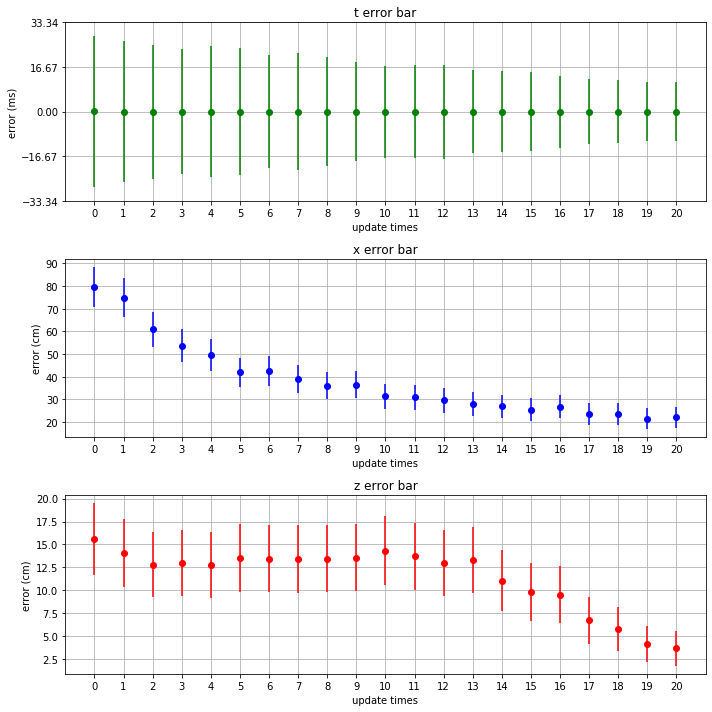

In [16]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')
plt.title('t error bar')
plt.xlabel('update times')
plt.ylabel('error (ms)')
plt.xticks(np.arange(0,21))
plt.yticks(np.array([-33.34, -16.67, 0, 16.67, 33.34]))
plt.grid(True)

plt.subplot(3,1,2)
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.title('x error bar')
plt.xlabel('update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,3)
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')
plt.title('z error bar')
plt.xlabel('update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)
plt.tight_layout()


#plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/png/'+name+'_test_res.png')
#plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/svg/'+name+'_test_res.svg')



In [17]:
arr_for_err_x

array([[ -5.232149  ,  -8.5274796 ,  -9.83702685, ...,  -2.23963306,
         -0.29092422,   0.63198491],
       [-11.07305787, -24.19184707, -24.13776463, ...,  -0.06391587,
         -1.42880661,  -0.97316518],
       [ -0.54579092,  -1.26574394,  -1.93331293, ...,  -0.26305429,
         -0.63838223,  -1.75314727],
       ...,
       [ -2.05068229,   0.98122634,   0.85480688, ...,  -1.28478061,
         -0.34669052,   0.56545428],
       [ 20.84395849,  20.53544518,  30.56614793, ...,  49.58403548,
         49.58403548,  51.87266254],
       [ -3.08889849,  -1.13558289,  -1.58252242, ...,  -1.47287791,
         -0.25375196,  -0.29980733]])

192 249
accuray = 77.10843373493977%


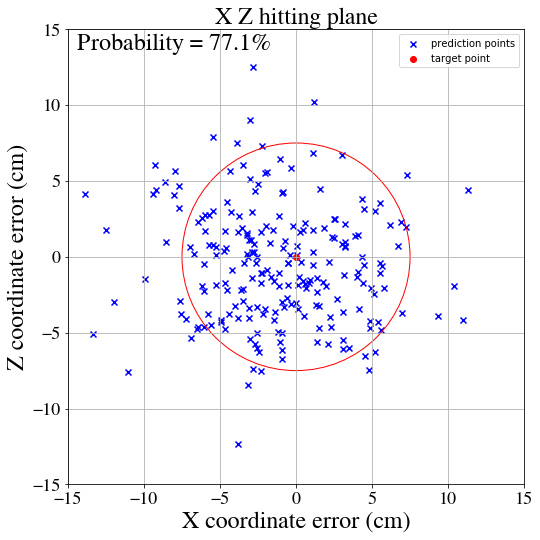

In [18]:
import math
up_times = 0

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')
plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')

#plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/png/update_'+str(up_times) + '_times_without_classification.png')
#plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/svg/update_'+str(up_times) + '_times_without_classification.svg')

In [19]:
prob = np.array(aa)
prob

array(77.1)

175 249
accuray = 70.28112449799197%
179 249
accuray = 71.8875502008032%
194 249
accuray = 77.91164658634538%
196 249
accuray = 78.714859437751%
204 249
accuray = 81.92771084337349%
213 249
accuray = 85.54216867469879%
215 249
accuray = 86.34538152610442%
212 249
accuray = 85.14056224899599%
210 249
accuray = 84.33734939759037%
219 249
accuray = 87.95180722891565%
219 249
accuray = 87.95180722891565%
218 249
accuray = 87.55020080321285%
227 249
accuray = 91.16465863453816%
231 249
accuray = 92.7710843373494%
235 249
accuray = 94.37751004016064%
231 249
accuray = 92.7710843373494%
239 249
accuray = 95.98393574297188%
241 249
accuray = 96.78714859437751%
242 249
accuray = 97.18875502008032%
243 249
accuray = 97.59036144578313%


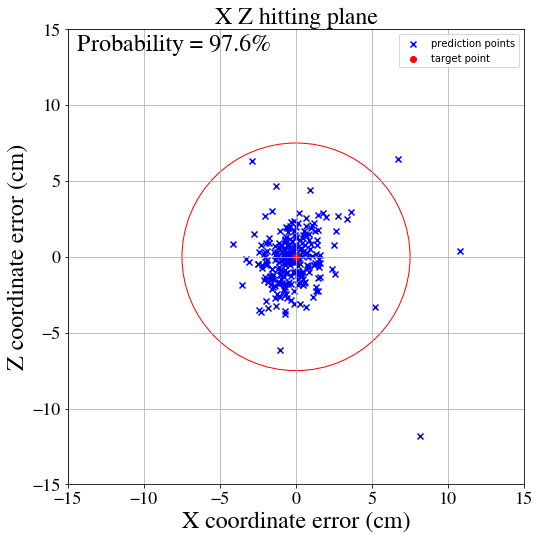

In [20]:
plt.figure(figsize=(8,8))
for up_times in range(1,n,1):
    plt.clf()
    #plt.figure(figsize=(8,8))
    '''
    ax = plt.gca()
    ax.add_artist(circle2)
    ax.set_xlim((-15, 15))
    ax.set_ylim((-15, 15))
    '''
    
    circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')
    ax = plt.gca()
    ax.add_artist(circle2)
    
    correct = 0
    for i in range(arr_for_err_x.shape[0]):
        d = math.sqrt(arr_for_err_x[i,up_times]**2+arr_for_err_z[i,up_times]**2)
        if d <= 7.5:
            correct += 1
    print(correct, arr_for_err_x.shape[0])
    print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
    aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
    text = str("Probability = {}%".format(aa))
    
    prob = np.vstack((prob, aa))
    
    plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
    plt.scatter(0,0, color='r', marker='o', label='target point')
    plt.Circle((0,0), 7.5, color='r', fill=False)

    plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.xticks(fontsize=18, fontname='FreeSerif')
    plt.yticks(fontsize=18, fontname='FreeSerif')
    plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
    plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

    plt.xlim(-15,15)
    plt.ylim(-15,15)
    
    plt.tight_layout(pad=2.5)
    plt.grid(True)
    plt.legend(loc='upper right')
    
    #plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/png/update_'+str(up_times) + '_times_without_classification.png')
    #plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/svg/update_'+str(up_times) + '_times_without_classification.svg')
    
    

In [21]:
prob

array([[77.1],
       [70.3],
       [71.9],
       [77.9],
       [78.7],
       [81.9],
       [85.5],
       [86.3],
       [85.1],
       [84.3],
       [88. ],
       [88. ],
       [87.6],
       [91.2],
       [92.8],
       [94.4],
       [92.8],
       [96. ],
       [96.8],
       [97.2],
       [97.6]])

In [22]:
errbar = [arr_mse_t, arr_mse_x, arr_mse_z, arr_std_t, arr_std_x, arr_std_z]
errbar = np.array(errbar)
errbar

array([[[ 0.07978981,  0.0700437 ,  0.06295885,  0.05627061,
          0.06108649,  0.05772879,  0.04565202,  0.0489707 ,
          0.04143233,  0.03406286,  0.0296848 ,  0.03043517,
          0.0308252 ,  0.02414236,  0.02299349,  0.02163576,
          0.01840512,  0.01566607,  0.01513324,  0.01264451,
          0.01269825]],

       [[79.65444995, 74.8144799 , 61.05483306, 53.70923892,
         49.58266185, 41.88952923, 42.47838357, 38.92966091,
         35.96296179, 36.38011785, 31.38355365, 30.90840814,
         29.64162973, 27.93902625, 26.91143477, 25.51322332,
         26.78359998, 23.76475548, 23.4976678 , 21.47798059,
         22.04831949]],

       [[15.56265433, 14.05515648, 12.77429952, 12.98910671,
         12.77193327, 13.5479021 , 13.4383687 , 13.41739642,
         13.46035307, 13.56364274, 14.33547046, 13.73122116,
         12.96709542, 13.3098923 , 11.0581499 ,  9.80921952,
          9.52991479,  6.71795337,  5.81576765,  4.16114824,
          3.69022646]],

       [[2

In [23]:
errbar = errbar.reshape(6,21)
errbar

array([[ 0.07978981,  0.0700437 ,  0.06295885,  0.05627061,  0.06108649,
         0.05772879,  0.04565202,  0.0489707 ,  0.04143233,  0.03406286,
         0.0296848 ,  0.03043517,  0.0308252 ,  0.02414236,  0.02299349,
         0.02163576,  0.01840512,  0.01566607,  0.01513324,  0.01264451,
         0.01269825],
       [79.65444995, 74.8144799 , 61.05483306, 53.70923892, 49.58266185,
        41.88952923, 42.47838357, 38.92966091, 35.96296179, 36.38011785,
        31.38355365, 30.90840814, 29.64162973, 27.93902625, 26.91143477,
        25.51322332, 26.78359998, 23.76475548, 23.4976678 , 21.47798059,
        22.04831949],
       [15.56265433, 14.05515648, 12.77429952, 12.98910671, 12.77193327,
        13.5479021 , 13.4383687 , 13.41739642, 13.46035307, 13.56364274,
        14.33547046, 13.73122116, 12.96709542, 13.3098923 , 11.0581499 ,
         9.80921952,  9.52991479,  6.71795337,  5.81576765,  4.16114824,
         3.69022646],
       [28.24383756, 26.45284742, 25.02190488, 23.38702611

In [24]:
df_prob = pd.DataFrame(data=prob)
p = '/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/prob.csv'
#df_prob.to_csv(p, index=False)

In [25]:
#errbar = errbar.reshape(21,6)
df = pd.DataFrame(data=errbar)
#df.to_csv('/home/lab606a/Documents/comp/without classification/ideal.csv', index=False)

#p = '/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/without_classification.csv'
p = '/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/without classification/without_classification.csv'

#df.to_csv(p, index=False)

In [26]:
errbar = errbar.reshape(6,21)
errbar

array([[ 0.07978981,  0.0700437 ,  0.06295885,  0.05627061,  0.06108649,
         0.05772879,  0.04565202,  0.0489707 ,  0.04143233,  0.03406286,
         0.0296848 ,  0.03043517,  0.0308252 ,  0.02414236,  0.02299349,
         0.02163576,  0.01840512,  0.01566607,  0.01513324,  0.01264451,
         0.01269825],
       [79.65444995, 74.8144799 , 61.05483306, 53.70923892, 49.58266185,
        41.88952923, 42.47838357, 38.92966091, 35.96296179, 36.38011785,
        31.38355365, 30.90840814, 29.64162973, 27.93902625, 26.91143477,
        25.51322332, 26.78359998, 23.76475548, 23.4976678 , 21.47798059,
        22.04831949],
       [15.56265433, 14.05515648, 12.77429952, 12.98910671, 12.77193327,
        13.5479021 , 13.4383687 , 13.41739642, 13.46035307, 13.56364274,
        14.33547046, 13.73122116, 12.96709542, 13.3098923 , 11.0581499 ,
         9.80921952,  9.52991479,  6.71795337,  5.81576765,  4.16114824,
         3.69022646],
       [28.24383756, 26.45284742, 25.02190488, 23.38702611